In [74]:
#this is to learn and simulate 
#E and I nerons do not mix randomly 
import torch
import torch.optim as optim
import torch.nn as nn
import numpy as np
import math
import matplotlib.pyplot as plt
import pandas as pd
import torch.nn.functional as F


torch.manual_seed(42)


n=20
m=20
tao=100
dt = 1e-2
T=int(10/dt)

B=10
w=torch.randn(n,n, device='cpu', requires_grad=True,dtype=torch.float)
lr = 1e-2
n_epochs = 1000

optimizer = optim.Adam([w], lr=lr)
V=torch.zeros(T,n)
ep=np.arange(n_epochs)
Loss=torch.zeros(n_epochs,)
#generatiining the penalty matrix 
P1=(np.absolute(np.random.randint(low=2, high=20, size=math.ceil(n/2))))
p_ones=torch.ones(int(math.ceil(n/2)),dtype=torch.float)
p2s=torch.from_numpy(np.append(P1,p_ones))
p2ss=np.sort(p2s)
p2sss=p2ss[::-1]
p2=torch.from_numpy(p2sss.copy())

p3=torch.diag(p2)
p1=p3.type(dtype=torch.float)


for epoch in range(n_epochs):
   
  
    print (epoch)
    
    Tr1=torch.ones(int(math.ceil(n/2)),dtype=torch.float)
    Tr2=torch.ones(int(round(n/2)),dtype=torch.float)
    Tr=torch.cat((Tr1,-Tr2),0)
    Transform=torch.diag(Tr)
    
    
    z1=torch.randn(m,1,n)
    z_softplus=F.softplus(z1)
    z=z_softplus@Transform
    print (z)


    w_softplus=F.softplus(w)
    wi=w_softplus@Transform
    w1=torch.diag(wi)
    w_rec=torch.diag(w1)
    w1_rec = wi-w_rec
    print (w1_rec)


    
    loss=0
    for t in range(T):
        N=torch.randn(m,1,n)
        r=torch.relu(z)
        z_dot=(-z+(r@w1_rec)/math.sqrt(n))
        z = z + z_dot*dt+N*math.sqrt(dt)
        loss = loss + ((z@p1)**2).mean()
    
    
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()
    Loss[epoch]=loss
   
 











[19. 18. 16. 12. 10.  9.  8.  6.  6.  3.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.]
tensor([[19.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.],
        [ 0., 18.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.],
        [ 0.,  0., 16.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.],
        [ 0.,  0.,  0., 12.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.],
        [ 0.,  0.,  0.,  0., 10.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.],
        [ 0.,  0.,  0.,  0.,  0.,  9.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.],
        [ 0.,  0.,  0.,  0.,  0.,  0.,  8.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.],
        [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  6.,  0.,  0.,  0.,  0.,  0.,  0.,
     

1
tensor([[[ 1.1882,  1.6642,  1.2864,  0.5368,  0.4731,  0.2352,  0.4398,
           0.4404,  0.2870,  0.8047, -1.7518, -0.9212, -0.2884, -1.6505,
          -1.0262, -0.2676, -0.3598, -0.8230, -0.4444, -1.0494]],

        [[ 0.4125,  1.6990,  0.5944,  0.6690,  0.7092,  0.1576,  2.0847,
           0.9448,  0.3871,  0.1956, -0.6863, -0.2009, -0.4381, -1.2532,
          -2.7333, -0.2915, -0.2737, -0.4741, -2.8095, -1.1866]],

        [[ 0.5562,  0.4238,  0.3238,  0.4315,  0.3659,  0.1311,  0.5835,
           1.5550,  0.2879,  0.4749, -0.1068, -0.4906, -0.7898, -0.2656,
          -0.5088, -0.5608, -1.1994, -0.6073, -0.4891, -0.7179]],

        [[ 0.5919,  1.0496,  0.3503,  0.8520,  0.7428,  0.3073,  0.7636,
           1.6547,  0.6096,  0.4743, -1.3204, -0.6352, -0.7655, -0.5277,
          -0.9316, -0.3020, -0.3391, -1.0385, -0.9661, -1.0827]],

        [[ 0.3195,  0.5558,  0.4972,  1.4670,  0.9726,  1.6935,  0.6006,
           0.2395,  0.7643,  0.5677, -0.5526, -1.4356, -0.4780, -0.2951,


2
tensor([[[ 0.3641,  0.7590,  0.6190,  1.1469,  0.3360,  0.4158,  1.5583,
           0.4411,  0.6032,  0.7890, -1.0247, -0.1699, -1.4619, -0.9675,
          -0.3846, -0.4807, -0.1444, -0.7105, -1.0862, -1.6334]],

        [[ 1.1469,  0.3852,  2.0873,  1.3500,  0.4935,  0.8057,  0.2943,
           1.3428,  1.8542,  0.4601, -0.6180, -0.4801, -0.5476, -1.5755,
          -0.1928, -1.9316, -0.6322, -0.4214, -0.8222, -0.3830]],

        [[ 0.4653,  1.1120,  0.9018,  0.7415,  1.2260,  0.8146,  1.9522,
           0.5221,  0.2288,  1.0536, -0.6645, -1.0275, -0.3897, -0.4862,
          -0.6282, -0.2843, -1.2483, -1.6152, -0.2568, -1.0170]],

        [[ 1.6356,  1.2691,  0.1703,  0.6125,  0.5131,  1.0030,  0.8781,
           0.6885,  0.6288,  0.4572, -0.2245, -0.3532, -0.6024, -0.8502,
          -0.5957, -1.5425, -0.7620, -1.0891, -0.7835, -0.2907]],

        [[ 0.4104,  0.4643,  0.6221,  0.4217,  1.0194,  0.1089,  1.0567,
           1.9947,  0.4156,  0.7881, -0.3980, -0.4481, -2.5954, -0.3620,


3
tensor([[[ 0.6307,  1.0928,  0.1105,  0.4007,  0.4392,  0.4226,  0.3818,
           0.5238,  0.1804,  1.2156, -1.0310, -0.8166, -1.5028, -0.7023,
          -0.1647, -0.4807, -0.2389, -0.9277, -0.8390, -0.5414]],

        [[ 0.7418,  0.5348,  2.0845,  0.2188,  0.5079,  0.5098,  0.9809,
           0.8963,  0.7191,  0.0940, -1.2735, -0.8743, -0.3082, -1.0628,
          -0.7527, -1.1091, -0.9896, -0.1800, -0.0529, -0.9093]],

        [[ 0.3341,  1.4675,  1.5505,  2.3162,  0.6056,  0.6028,  0.0628,
           1.4279,  1.0166,  1.4313, -0.7733, -1.5573, -0.4207, -0.8691,
          -0.1043, -0.3696, -0.1666, -1.0891, -0.4521, -1.0255]],

        [[ 1.4347,  0.2577,  0.6050,  0.3595,  0.2541,  0.4628,  0.5527,
           0.6573,  0.7429,  0.9094, -0.1618, -0.6225, -1.0853, -0.3844,
          -1.4273, -1.7805, -0.2479, -1.0921, -0.5106, -0.2039]],

        [[ 1.5549,  0.6104,  0.7469,  0.8440,  0.1719,  0.4585,  2.3803,
           0.5702,  1.9561,  0.0946, -0.2527, -0.6853, -0.5917, -0.7112,


4
tensor([[[ 0.3811,  0.1811,  0.5024,  0.7799,  1.3155,  0.6465,  1.1371,
           0.8427,  1.3994,  0.3963, -0.2909, -0.2935, -1.4865, -1.4977,
          -0.3132, -0.3476, -0.6270, -0.4033, -1.5126, -0.3036]],

        [[ 0.5900,  0.5513,  0.1827,  0.9668,  0.6170,  0.5336,  1.2343,
           0.8747,  0.6843,  0.6208, -1.9506, -0.5739, -1.4725, -0.9669,
          -0.1081, -0.2351, -0.4338, -0.6816, -0.8460, -1.1176]],

        [[ 0.9805,  0.5274,  0.7245,  1.1015,  1.0465,  0.4643,  0.3427,
           0.8566,  0.1923,  2.4254, -0.4884, -0.3179, -1.6757, -0.7526,
          -0.6313, -0.4946, -0.0794, -1.0156, -1.1900, -1.9610]],

        [[ 0.7051,  0.4264,  1.6363,  1.7881,  0.2172,  0.6948,  1.4297,
           0.6220,  1.4713,  0.5149, -0.5587, -0.8004, -0.8981, -0.9489,
          -0.9746, -2.1032, -0.9729, -0.8050, -0.1323, -0.7813]],

        [[ 0.2664,  1.4736,  0.1359,  2.0901,  0.5292,  1.0838,  0.8183,
           0.2749,  0.5752,  0.5287, -1.1994, -0.3750, -1.2410, -0.6822,


5
tensor([[[ 0.7871,  1.6078,  0.4539,  1.3737,  0.8110,  0.5254,  1.1547,
           1.0298,  1.5857,  2.1772, -0.3638, -0.0560, -0.3580, -0.5649,
          -2.1234, -0.3560, -0.4435, -1.2159, -1.3154, -0.7936]],

        [[ 0.3719,  0.2552,  0.6627,  0.6252,  0.7993,  1.3463,  1.1482,
           0.8474,  1.5097,  2.2569, -0.4105, -0.8265, -1.1858, -0.9927,
          -0.4214, -0.0476, -0.8448, -0.3301, -0.4177, -1.4693]],

        [[ 1.3057,  0.9492,  0.2945,  0.1730,  0.1029,  0.9250,  0.7190,
           1.4657,  0.4864,  0.4252, -0.4113, -0.1966, -0.2222, -0.9712,
          -0.1778, -0.9791, -0.2677, -0.4980, -1.3294, -0.7855]],

        [[ 1.2246,  0.8467,  1.1489,  0.4204,  1.2438,  0.1380,  0.3640,
           0.8107,  0.9379,  1.1902, -0.4575, -0.4958, -1.3881, -0.3470,
          -1.0054, -0.3761, -1.2680, -0.4211, -0.8814, -0.2727]],

        [[ 0.4405,  0.2879,  0.5416,  0.2660,  1.2931,  0.3587,  0.2571,
           0.7127,  1.3280,  0.3472, -0.2411, -0.1386, -0.7950, -0.2180,


6
tensor([[[ 1.2470,  0.3066,  0.4081,  0.8710,  0.5705,  2.5561,  0.3786,
           0.3385,  0.6960,  0.6209, -0.4390, -0.2581, -0.9650, -0.5976,
          -1.1506, -1.4322, -0.4739, -0.4825, -0.2428, -0.7820]],

        [[ 0.2489,  0.1254,  1.0061,  0.6760,  0.2220,  0.5128,  0.2585,
           1.1542,  0.3790,  0.9267, -0.1279, -1.0344, -0.6665, -0.9010,
          -0.4554, -0.2379, -1.1232, -0.3468, -0.9838, -0.9393]],

        [[ 1.0448,  0.3980,  0.6473,  0.9659,  1.8470,  0.5935,  0.2989,
           1.6487,  1.5408,  0.1937, -0.1785, -0.5543, -0.3055, -0.6706,
          -0.8477, -1.0748, -0.8706, -0.9672, -1.8483, -0.4892]],

        [[ 0.6106,  2.4506,  0.7640,  0.1682,  0.2086,  1.0630,  0.0794,
           0.2295,  0.3285,  0.5649, -0.3859, -0.9604, -0.8169, -0.2548,
          -0.7323, -0.5187, -0.2956, -0.2120, -0.2503, -0.4935]],

        [[ 1.2505,  0.2646,  0.1448,  0.7388,  1.6427,  0.8663,  0.4808,
           0.9050,  1.0211,  0.1611, -0.5545, -0.9812, -2.1430, -0.1175,


7
tensor([[[ 0.1942,  0.9927,  1.5451,  0.7571,  0.2535,  1.6147,  2.0225,
           0.3250,  0.8114,  0.3398, -1.3569, -0.2084, -0.9315, -1.7920,
          -0.2939, -0.4946, -0.4863, -0.0942, -0.5604, -1.1480]],

        [[ 0.8613,  1.5683,  0.6956,  1.3036,  1.9389,  0.3748,  0.1032,
           0.9790,  0.7252,  0.1360, -0.3354, -0.7195, -0.2930, -0.2660,
          -0.8635, -1.6485, -1.1538, -1.0765, -0.5503, -0.1813]],

        [[ 0.5197,  1.0549,  1.3687,  1.1817,  2.9677,  0.4541,  0.6724,
           1.8608,  1.6981,  0.8905, -2.2590, -1.7248, -0.2093, -0.7748,
          -0.7798, -0.5582, -1.2193, -0.7218, -0.6324, -2.1900]],

        [[ 1.0536,  1.3443,  0.9187,  0.1655,  0.1678,  1.0444,  1.4891,
           1.7220,  0.3476,  0.3871, -0.2075, -0.3209, -0.1165, -1.2384,
          -1.2349, -0.0587, -1.8742, -0.9500, -0.7025, -0.5801]],

        [[ 0.4031,  0.9049,  0.4666,  0.6516,  0.3241,  0.7933,  1.1736,
           0.5268,  1.5854,  0.6169, -0.3603, -0.6752, -1.5624, -0.2342,


8
tensor([[[ 0.3221,  1.2675,  0.2697,  0.9287,  0.8689,  1.7372,  0.5600,
           0.3104,  0.5760,  1.0829, -0.1866, -0.2000, -1.2854, -2.0738,
          -0.3417, -1.9842, -0.2613, -0.2377, -0.1113, -0.3021]],

        [[ 0.2827,  0.7528,  1.3139,  0.6212,  1.3859,  1.6255,  0.6137,
           2.2207,  1.1751,  1.0563, -0.1138, -0.4698, -1.1869, -1.2605,
          -0.8124, -0.5897, -2.1094, -1.0219, -1.2460, -0.4098]],

        [[ 0.9441,  0.1661,  1.8059,  0.5182,  0.1931,  0.5309,  2.1058,
           0.4455,  1.4002,  0.8002, -0.7802, -0.3216, -0.8135, -0.1981,
          -1.1962, -1.6040, -0.5698, -0.3412, -1.1600, -0.2957]],

        [[ 0.5462,  1.9646,  0.4039,  0.5558,  0.9723,  0.6897,  1.1613,
           0.4466,  0.2522,  1.1687, -1.2124, -0.1773, -1.0476, -0.8491,
          -1.0546, -0.5084, -0.9543, -0.2812, -0.1236, -0.2622]],

        [[ 0.9365,  0.4702,  0.2369,  0.3070,  1.6317,  0.4452,  1.1848,
           0.4118,  0.6251,  0.2962, -0.6577, -0.6924, -0.8946, -0.7862,


9
tensor([[[ 1.0046,  1.6027,  0.3599,  1.7148,  2.6546,  0.5740,  1.3303,
           0.4757,  0.8571,  0.3573, -0.1686, -1.7489, -0.5349, -1.6505,
          -2.3972, -0.3151, -0.5892, -0.2430, -0.5855, -1.8916]],

        [[ 0.6241,  0.4201,  0.8402,  0.5259,  0.4956,  0.9523,  0.9442,
           1.4766,  0.2141,  0.6431, -0.2673, -0.6986, -0.7933, -1.3836,
          -0.9627, -1.2275, -1.2557, -0.7805, -0.3946, -0.3748]],

        [[ 0.4271,  1.0429,  0.3765,  2.5878,  0.7181,  0.9788,  1.0412,
           0.8155,  1.3314,  0.6170, -0.3700, -0.8839, -0.2986, -0.5502,
          -0.8651, -1.0493, -0.9074, -0.3951, -0.5358, -1.2886]],

        [[ 0.6623,  1.2283,  1.6604,  0.1922,  0.2917,  0.2507,  1.0381,
           0.8535,  0.6217,  0.1753, -0.9090, -1.2486, -1.4466, -0.8945,
          -0.4513, -1.0869, -1.3635, -0.6251, -0.3040, -0.5235]],

        [[ 1.7014,  1.4536,  0.9235,  0.4898,  0.1059,  1.2752,  1.1220,
           0.6256,  1.0076,  2.0527, -0.4282, -0.8044, -0.1413, -0.4851,


10
tensor([[[ 0.4847,  0.2632,  0.2440,  1.3575,  0.2024,  2.4259,  1.1476,
           0.1845,  1.0425,  1.0799, -0.2462, -0.4096, -0.8822, -0.8331,
          -0.7452, -1.3845, -0.5847, -0.2687, -0.4386, -0.4030]],

        [[ 0.6928,  0.7954,  0.6566,  0.3889,  0.8451,  0.3755,  1.9085,
           0.8265,  0.7490,  0.9229, -0.6304, -0.5130, -1.2508, -0.5688,
          -1.0670, -0.4777, -0.5459, -0.4815, -0.5343, -0.5389]],

        [[ 0.2644,  1.2555,  1.3053,  0.0742,  0.3753,  0.7623,  0.9731,
           0.3483,  1.1939,  0.6159, -0.3513, -1.3871, -0.3897, -0.6173,
          -1.5183, -0.5955, -0.3563, -0.4652, -0.5618, -0.9239]],

        [[ 1.2730,  0.2179,  0.4990,  0.3183,  0.3684,  0.7003,  0.5675,
           0.2249,  0.5496,  1.3404, -1.9866, -0.6870, -0.7566, -0.1172,
          -0.9834, -0.2142, -0.7418, -1.5654, -0.4442, -1.1397]],

        [[ 0.5316,  1.0278,  0.9954,  1.2382,  0.4587,  2.4313,  0.2913,
           1.3616,  0.3278,  0.7681, -0.3976, -0.5379, -0.2275, -0.8101,

11
tensor([[[ 2.1118,  1.1480,  0.7223,  1.3891,  0.6843,  1.1893,  2.6620,
           0.7109,  1.2470,  1.2894, -0.7251, -0.3928, -0.2442, -0.5893,
          -1.4335, -0.1989, -0.6192, -0.2143, -0.8790, -1.7680]],

        [[ 0.9877,  0.5128,  0.2591,  0.3221,  1.4459,  0.2831,  0.5874,
           0.0877,  1.0135,  0.5805, -0.6286, -0.2825, -0.4643, -0.7202,
          -0.8658, -0.2647, -1.2199, -1.3401, -0.7668, -1.4538]],

        [[ 0.4647,  3.0128,  1.8670,  0.3195,  0.6872,  1.4458,  0.4228,
           0.9538,  0.6123,  1.6178, -0.4875, -0.6446, -0.5758, -0.4008,
          -0.1035, -1.1788, -0.7791, -1.0004, -0.7050, -0.4793]],

        [[ 0.6465,  0.0924,  0.4979,  0.8203,  0.2562,  0.3753,  0.4890,
           0.1985,  0.5075,  0.3045, -0.6246, -0.6494, -1.0594, -1.4456,
          -0.1085, -0.2275, -0.4815, -0.4338, -0.2274, -2.0788]],

        [[ 0.2794,  0.9711,  1.5118,  1.2585,  1.0852,  0.9329,  1.1310,
           0.9279,  0.5282,  1.4196, -0.1805, -0.1620, -0.8655, -1.3042,

12
tensor([[[ 0.8160,  1.4524,  0.4449,  0.3333,  1.0277,  0.5941,  0.2138,
           0.3096,  0.4415,  0.3800, -0.7530, -0.4839, -0.7927, -0.5338,
          -0.2377, -0.3477, -0.8567, -1.0789, -0.8918, -0.8325]],

        [[ 0.0932,  0.6659,  1.0377,  1.7562,  0.3085,  1.1363,  0.9816,
           0.3635,  1.0656,  0.2339, -0.8633, -0.5606, -2.1867, -0.2691,
          -0.8662, -0.3605, -0.1197, -1.5617, -0.2921, -0.4741]],

        [[ 0.7284,  1.0353,  0.6101,  1.1169,  0.7229,  1.0009,  0.7467,
           0.3091,  0.8216,  0.0665, -1.3464, -1.2393, -0.3118, -0.4662,
          -1.4763, -1.0430, -0.5305, -1.0352, -1.2940, -0.9471]],

        [[ 1.2923,  0.5498,  1.5270,  0.3523,  1.5751,  0.9547,  0.3486,
           1.3200,  0.2604,  1.1176, -0.1510, -0.6176, -0.4844, -0.7181,
          -0.1947, -0.7011, -1.4084, -1.0304, -0.4072, -1.8213]],

        [[ 1.6576,  1.1125,  0.7691,  0.7627,  0.5005,  2.5507,  1.6803,
           0.7403,  0.8882,  0.3929, -0.3639, -1.0141, -0.1812, -0.3481,

13
tensor([[[ 1.5290,  0.6501,  0.2297,  0.7960,  0.1194,  0.1520,  0.8023,
           1.0822,  0.1890,  0.3556, -0.4734, -0.7287, -1.1333, -0.7670,
          -1.8643, -1.0463, -0.7278, -0.2921, -0.2000, -0.5587]],

        [[ 0.5817,  0.0963,  1.1467,  1.3328,  1.1942,  0.2323,  0.3456,
           1.8076,  0.9587,  1.1887, -0.6938, -0.3328, -0.6753, -1.1108,
          -1.6754, -0.4438, -0.8541, -0.1478, -0.5947, -0.6973]],

        [[ 0.3881,  1.2073,  0.6821,  0.4059,  0.8164,  0.0473,  1.1359,
           0.4594,  1.1637,  0.4319, -0.4357, -1.0341, -0.9361, -2.4848,
          -0.9745, -0.3858, -0.7243, -0.9459, -2.0815, -0.8891]],

        [[ 0.6851,  1.3358,  2.5438,  0.7294,  0.1746,  0.8423,  0.7179,
           2.1672,  0.2711,  0.5454, -0.9902, -0.1527, -0.4254, -0.6862,
          -1.3143, -2.7067, -1.5865, -0.7192, -0.4527, -1.4749]],

        [[ 1.6612,  1.0590,  0.6689,  1.3848,  0.9970,  1.1001,  1.6364,
           0.6361,  1.4532,  0.1029, -0.5564, -0.2095, -0.8350, -0.6768,

14
tensor([[[ 1.1428,  0.3941,  1.3413,  0.4247,  0.8399,  0.9545,  0.3579,
           0.6605,  0.9127,  0.1394, -0.8524, -0.1445, -1.1514, -0.5806,
          -0.1113, -0.7152, -0.3181, -0.1772, -0.2641, -0.4692]],

        [[ 1.8231,  1.1863,  1.3027,  0.2908,  1.5219,  0.7466,  0.1062,
           0.2561,  0.2560,  0.5131, -0.7477, -0.5275, -0.9942, -1.4136,
          -0.1886, -1.1481, -0.6028, -0.3695, -1.4789, -0.0793]],

        [[ 1.3393,  0.8575,  1.6645,  0.2785,  0.7492,  0.4212,  2.1375,
           1.1615,  0.4174,  0.2184, -0.4367, -0.4761, -2.0126, -0.4236,
          -0.3930, -0.5230, -1.5228, -1.4597, -0.9688, -0.3639]],

        [[ 0.8181,  0.5640,  0.6221,  2.0544,  0.8421,  1.1092,  0.9686,
           1.1601,  0.5636,  1.0342, -1.0800, -0.4810, -1.0805, -0.6456,
          -0.4106, -0.3077, -0.3970, -1.0552, -0.5474, -1.6532]],

        [[ 1.0890,  1.4966,  0.8438,  1.1026,  0.8039,  0.8843,  0.7693,
           0.9237,  0.5611,  0.7003, -0.2602, -0.7325, -0.9258, -0.1955,

15
tensor([[[ 0.3499,  0.5227,  1.3278,  0.8353,  0.7887,  0.5304,  0.8026,
           0.4540,  1.1594,  0.8354, -0.6550, -1.3546, -0.8897, -0.4599,
          -1.0159, -1.2607, -0.5059, -0.4621, -0.3543, -0.2611]],

        [[ 0.4448,  0.3536,  0.7058,  0.4056,  0.3084,  1.2375,  0.1024,
           0.5874,  0.5456,  1.0129, -1.2583, -0.6697, -0.1910, -1.3620,
          -1.4178, -0.5682, -0.8738, -0.3047, -1.1046, -0.4059]],

        [[ 0.3073,  0.2838,  0.4493,  2.0503,  1.3566,  1.0438,  0.5193,
           0.2379,  0.4943,  1.4121, -2.1447, -0.3476, -0.8495, -0.6464,
          -0.4130, -0.8300, -0.4693, -1.5573, -0.8156, -1.0680]],

        [[ 0.8208,  0.1748,  0.2004,  1.3271,  1.4132,  2.0719,  0.6972,
           0.6004,  1.2065,  1.0458, -0.2083, -0.9184, -0.8749, -0.9259,
          -1.6036, -1.4437, -0.8237, -0.3581, -1.6355, -0.3017]],

        [[ 0.8687,  0.6430,  1.5819,  0.5141,  1.3121,  1.0343,  0.6359,
           0.9000,  0.9580,  0.3959, -0.2473, -1.0455, -0.6993, -0.5762,

16
tensor([[[ 1.1760,  2.4544,  0.7329,  0.9431,  1.4966,  0.6030,  1.6909,
           0.6698,  0.5915,  0.7409, -0.3439, -0.4967, -0.7600, -0.7336,
          -1.0708, -0.6894, -1.6847, -1.8730, -0.5102, -0.9548]],

        [[ 0.4336,  0.1691,  0.7451,  1.3833,  0.1299,  0.5259,  0.5602,
           1.1004,  0.3888,  0.6478, -0.6290, -0.6847, -0.3022, -1.1562,
          -1.3360, -1.8109, -0.5168, -0.2272, -0.5232, -0.9542]],

        [[ 0.6984,  0.6962,  0.8491,  0.2180,  0.6355,  0.5383,  0.4585,
           1.0752,  1.5625,  0.4278, -0.9432, -0.3198, -0.3574, -0.5637,
          -0.7440, -1.6625, -0.5929, -0.1035, -0.8448, -1.4830]],

        [[ 0.4072,  0.2461,  1.7087,  0.8910,  0.5782,  0.9072,  0.6297,
           1.0270,  1.1924,  0.7653, -1.1950, -0.4866, -1.2398, -0.4796,
          -0.8098, -0.0619, -0.5808, -0.3485, -0.0437, -0.3196]],

        [[ 0.7407,  0.5911,  0.7707,  0.7695,  0.0841,  0.8513,  0.9029,
           0.7777,  1.5587,  0.8268, -0.1275, -1.2424, -0.6356, -0.1580,

17
tensor([[[ 0.3301,  0.9377,  0.3090,  0.3991,  0.7288,  2.1368,  0.1778,
           0.5048,  1.2845,  0.0517, -0.6534, -0.4808, -0.3122, -1.0071,
          -1.4463, -0.6751, -1.0754, -0.5554, -1.3601, -0.2007]],

        [[ 0.4502,  1.0190,  0.6113,  0.5500,  0.1951,  0.3828,  0.1708,
           1.1553,  0.4758,  1.0444, -0.4422, -1.4935, -0.5599, -0.3536,
          -0.3635, -0.2182, -0.8252, -0.6087, -0.1340, -0.4241]],

        [[ 0.5418,  0.7869,  0.4020,  1.5773,  0.9715,  0.9454,  0.2733,
           3.6164,  1.1535,  1.1427, -0.7614, -0.3788, -0.5234, -0.4260,
          -0.7340, -0.3154, -1.2889, -1.2462, -0.1456, -0.6602]],

        [[ 0.3469,  0.4695,  0.3278,  0.5280,  1.1852,  0.7047,  0.5024,
           1.0656,  0.0798,  0.9403, -0.9389, -0.4842, -0.2577, -0.7682,
          -0.2369, -1.4784, -1.0315, -0.0727, -0.6753, -1.2282]],

        [[ 1.1361,  0.9443,  1.4533,  0.7825,  0.5030,  0.2046,  0.1466,
           0.1579,  0.4682,  0.1985, -0.7728, -0.5298, -0.4964, -0.6312,

18
tensor([[[ 1.7102,  0.6246,  1.3044,  2.2691,  1.5604,  0.4444,  0.2776,
           1.1204,  0.5470,  0.9607, -0.6508, -1.2085, -0.7887, -0.9542,
          -0.7021, -0.4937, -1.1561, -0.7007, -1.0604, -0.2800]],

        [[ 0.7005,  0.5229,  0.4591,  0.8189,  0.4276,  0.8533,  0.4986,
           0.2154,  0.6956,  0.8359, -0.6228, -1.2964, -0.0649, -0.3402,
          -0.8026, -1.5378, -1.0341, -0.9045, -1.0512, -0.9173]],

        [[ 0.8724,  2.1608,  0.3134,  0.8805,  1.1407,  1.0240,  0.5277,
           0.9203,  1.9464,  0.9232, -0.5370, -0.3956, -0.5302, -0.4031,
          -2.0908, -0.8378, -0.8113, -0.7448, -1.3043, -3.0537]],

        [[ 0.8245,  0.5149,  0.7917,  0.5606,  1.2471,  1.3246,  0.7245,
           0.5744,  0.8212,  0.4022, -0.2216, -0.3674, -1.0927, -1.4859,
          -0.6536, -0.5400, -1.9069, -0.3950, -0.9233, -0.6822]],

        [[ 0.1599,  0.9168,  1.4325,  1.6160,  0.5308,  0.5318,  0.9025,
           1.4875,  0.9451,  0.3087, -0.5449, -1.2705, -0.2208, -0.5225,

19
tensor([[[ 0.3579,  0.1208,  1.3697,  1.6105,  1.0874,  0.2963,  0.6705,
           0.9853,  0.6570,  1.1001, -1.1917, -0.5669, -1.5691, -0.9068,
          -0.9224, -0.9615, -0.8585, -1.2528, -0.7250, -0.6854]],

        [[ 0.3726,  0.0952,  0.6229,  0.4570,  1.2404,  0.1175,  0.3139,
           0.4809,  0.4070,  0.9978, -1.1754, -1.6438, -1.7082, -1.9483,
          -0.6519, -0.9636, -0.8471, -0.2712, -0.5053, -0.5067]],

        [[ 0.6999,  0.0751,  0.1243,  0.6811,  0.5928,  0.8202,  0.9478,
           0.1512,  0.2328,  0.0731, -1.5885, -0.9609, -0.1923, -0.6624,
          -1.1402, -0.8279, -1.2584, -2.5797, -1.1521, -0.4775]],

        [[ 0.7982,  2.0449,  0.4376,  0.9022,  2.7995,  0.3937,  0.4733,
           0.6507,  2.5865,  0.9990, -1.5026, -0.2902, -1.2072, -0.4803,
          -0.9302, -0.2766, -1.2149, -0.7996, -0.4756, -0.3834]],

        [[ 0.7047,  0.2111,  0.3931,  0.8410,  0.4255,  0.3992,  1.4502,
           0.1094,  1.3263,  0.8411, -0.9770, -1.0600, -1.5474, -1.0149,

20
tensor([[[ 0.1985,  0.8486,  0.7481,  1.2551,  0.8257,  0.9155,  0.2951,
           0.2088,  0.6976,  0.3595, -0.2141, -1.9117, -0.6256, -0.9663,
          -0.2794, -0.3155, -0.6251, -0.4982, -0.7985, -0.7687]],

        [[ 0.3051,  0.6974,  0.8281,  1.5928,  0.2052,  1.2907,  0.2117,
           0.4611,  0.5011,  0.2099, -0.5788, -0.6366, -0.6473, -0.9049,
          -0.6920, -0.7257, -0.8887, -0.8423, -1.8848, -0.5971]],

        [[ 1.0577,  0.8561,  0.9194,  1.0429,  0.2112,  0.8410,  0.7027,
           0.6513,  0.9642,  1.3246, -0.7515, -0.4034, -0.1166, -1.0364,
          -0.9679, -0.2587, -0.3723, -0.8765, -2.7721, -0.8523]],

        [[ 0.2627,  0.8039,  1.9663,  0.7250,  0.7386,  0.2804,  1.2206,
           0.9049,  0.8823,  0.5853, -0.6448, -0.1846, -0.6029, -1.2191,
          -0.2322, -0.1913, -0.4511, -0.3279, -1.0219, -0.3316]],

        [[ 1.6484,  0.1606,  0.4516,  1.1506,  0.1564,  1.9203,  0.7279,
           1.0428,  0.7155,  0.5312, -0.8112, -0.8039, -2.1174, -0.3185,

21
tensor([[[ 0.3212,  0.6640,  1.1846,  0.2765,  1.8265,  0.7588,  0.6696,
           0.7867,  0.3077,  0.3030, -0.1148, -0.1308, -0.5648, -0.5728,
          -0.0626, -0.5982, -0.4498, -0.6835, -0.2315, -0.4695]],

        [[ 1.1469,  1.5090,  0.3871,  2.2369,  1.3848,  0.8186,  0.9585,
           0.5345,  0.7413,  0.6304, -0.3801, -0.3778, -0.6188, -0.5269,
          -0.2288, -1.8130, -0.3681, -1.4770, -0.7248, -0.1514]],

        [[ 0.8972,  1.2030,  1.4382,  1.2255,  0.2014,  1.1706,  1.8740,
           0.4370,  0.3268,  0.9809, -2.1146, -0.5429, -0.2970, -0.2672,
          -1.5632, -0.3776, -1.6784, -0.4797, -0.2197, -0.0545]],

        [[ 0.1339,  2.3746,  1.1340,  0.2829,  1.8622,  0.7687,  0.4550,
           0.4335,  1.3086,  0.9475, -0.2690, -0.5685, -1.4843, -1.0302,
          -0.5448, -0.9290, -0.8746, -0.4483, -0.9750, -0.5508]],

        [[ 0.4529,  0.2779,  0.7868,  0.7821,  0.3999,  0.8436,  0.1833,
           0.4381,  0.4697,  0.6606, -1.3216, -0.2314, -0.5449, -0.1432,

22
tensor([[[ 0.5636,  0.7171,  1.2559,  0.8625,  0.7900,  0.0912,  0.3897,
           0.7860,  2.8236,  1.3334, -0.7993, -0.2691, -0.3945, -0.9094,
          -0.4523, -0.5943, -1.1519, -1.3537, -0.5536, -0.2321]],

        [[ 0.7550,  0.6295,  0.5335,  0.0836,  0.5950,  0.7872,  0.3072,
           1.0866,  1.6591,  0.3791, -2.1078, -0.2931, -1.0679, -2.2101,
          -0.8898, -0.0759, -0.5438, -0.8775, -1.1137, -0.4601]],

        [[ 0.7085,  0.2065,  0.3148,  1.1128,  0.8166,  2.1729,  0.3727,
           0.6688,  0.9714,  1.1584, -0.2588, -0.2018, -1.3918, -1.6117,
          -1.0538, -0.4680, -0.4177, -0.2362, -0.3016, -0.7253]],

        [[ 0.7674,  1.2901,  0.5464,  0.6647,  2.2037,  1.4574,  1.8234,
           0.1768,  0.3861,  0.4125, -0.5001, -0.3235, -2.0629, -1.4457,
          -0.1269, -0.8444, -1.6846, -1.1723, -0.5501, -1.0986]],

        [[ 0.7616,  0.4863,  1.5497,  0.1160,  1.5912,  0.5436,  1.0266,
           0.1939,  0.4688,  2.0298, -1.1361, -1.0094, -0.3862, -0.2231,

23
tensor([[[ 0.8424,  1.1648,  0.7463,  0.9591,  0.6710,  0.2495,  0.4902,
           0.1391,  0.3190,  1.1001, -0.7228, -1.0144, -0.9782, -0.9784,
          -0.1261, -1.2415, -0.4247, -0.3614, -0.5613, -1.4392]],

        [[ 2.5023,  0.7051,  0.5017,  0.6238,  0.4836,  1.2225,  0.3673,
           1.3426,  0.9960,  1.1993, -0.4142, -2.6866, -0.7853, -0.2316,
          -0.9332, -0.3928, -0.9722, -0.4832, -0.6698, -0.8990]],

        [[ 0.4317,  0.3127,  0.7811,  0.2032,  0.5558,  1.1455,  0.3227,
           1.1578,  0.3157,  0.7098, -1.4590, -1.0248, -0.3769, -0.5377,
          -0.7288, -1.3389, -0.1942, -0.4228, -0.3243, -0.6365]],

        [[ 0.6319,  0.5028,  0.6187,  1.0295,  0.2172,  0.6548,  0.1769,
           0.1463,  1.2096,  1.3783, -0.1849, -1.2748, -1.6880, -0.2850,
          -0.7928, -0.5361, -0.5149, -0.3830, -1.3257, -1.4241]],

        [[ 0.9945,  0.9648,  0.5936,  0.4249,  0.5039,  0.4990,  1.0524,
           0.2407,  1.2198,  0.3729, -1.5461, -0.6558, -1.1153, -2.4713,

24
tensor([[[ 0.6615,  0.7167,  0.9989,  0.9818,  0.5871,  0.6342,  0.7643,
           0.1563,  0.2035,  0.5661, -0.1963, -0.9956, -0.5666, -0.7464,
          -1.2505, -0.4852, -0.6952, -0.5196, -1.2165, -1.4678]],

        [[ 0.3082,  0.8416,  0.4123,  0.6176,  0.2925,  0.3233,  1.7447,
           0.6640,  0.8817,  0.5392, -0.6636, -0.6515, -1.9072, -0.5791,
          -0.3347, -0.9433, -1.1905, -0.2038, -0.2731, -0.2564]],

        [[ 1.4626,  0.5253,  1.2121,  1.0118,  1.0600,  0.4838,  0.2488,
           1.2812,  0.8629,  0.2349, -1.4095, -0.2722, -1.0353, -0.1817,
          -1.0241, -0.5391, -1.2822, -0.6077, -0.4723, -0.2856]],

        [[ 0.2625,  0.3469,  0.3899,  0.2905,  1.1162,  1.3060,  0.9227,
           0.4112,  1.4466,  0.4348, -1.9097, -1.2146, -0.7610, -0.8649,
          -0.3697, -0.4257, -0.4280, -0.2306, -1.1606, -0.4592]],

        [[ 0.5402,  1.2445,  1.4963,  0.4339,  0.9685,  0.9574,  0.3883,
           0.5060,  0.7381,  0.6919, -0.5326, -1.7612, -1.1235, -1.6089,

25
tensor([[[ 1.5722,  0.9707,  1.0832,  1.1047,  1.7117,  0.5544,  0.8509,
           0.2622,  0.7306,  0.5942, -0.3277, -0.2920, -0.7942, -0.1749,
          -0.7165, -0.8258, -1.7288, -0.7543, -0.7819, -0.3163]],

        [[ 0.2506,  1.2552,  0.5824,  0.5075,  1.1371,  0.6336,  0.9852,
           0.3692,  0.6350,  1.5712, -0.2772, -0.1770, -0.4789, -0.6509,
          -0.5213, -0.6721, -1.0485, -1.3953, -0.8323, -0.0342]],

        [[ 0.3873,  1.2576,  0.2597,  1.2242,  1.9627,  1.0650,  0.3794,
           0.2240,  0.9325,  1.9390, -1.4144, -0.3481, -0.7665, -1.4284,
          -1.8149, -1.8322, -0.9636, -0.3127, -0.8870, -1.3213]],

        [[ 0.2876,  1.0352,  0.3075,  1.9735,  0.3295,  0.4114,  1.4347,
           1.7249,  0.5349,  1.3814, -0.8296, -0.3536, -1.3128, -1.2476,
          -0.3879, -0.2194, -0.7255, -0.9001, -0.7988, -0.6589]],

        [[ 0.8957,  0.9613,  0.9502,  0.4135,  0.7726,  0.3766,  0.7133,
           0.3719,  0.3082,  1.2655, -1.6407, -0.7676, -1.0157, -0.3172,

26
tensor([[[ 1.4146,  0.1348,  0.9421,  0.4289,  2.3290,  0.1536,  0.4423,
           0.7818,  0.9122,  0.0348, -0.4281, -1.6610, -1.0643, -0.8627,
          -0.6300, -0.2688, -0.7255, -0.4237, -2.1893, -0.5292]],

        [[ 2.0541,  0.9592,  0.2956,  0.3462,  1.0214,  0.6302,  0.5393,
           0.5712,  0.5449,  1.0329, -0.5564, -0.7145, -0.3348, -0.3899,
          -0.3754, -1.3237, -0.7138, -0.5482, -0.7576, -0.5560]],

        [[ 1.6861,  0.9011,  0.2442,  2.1575,  0.9289,  0.8778,  0.6683,
           0.2177,  1.9475,  0.4567, -0.2566, -0.2819, -0.2089, -0.6461,
          -0.4632, -0.6369, -0.5372, -0.1527, -1.4194, -0.5595]],

        [[ 0.7869,  0.3029,  0.5054,  2.2647,  2.0557,  1.1519,  1.6949,
           1.6535,  0.8397,  1.7847, -0.1826, -0.3780, -0.1452, -0.4197,
          -0.7875, -0.0837, -1.2018, -0.9222, -1.0611, -0.1566]],

        [[ 1.2182,  0.2143,  0.3396,  0.6143,  0.1869,  0.5116,  0.3971,
           0.6155,  0.3624,  0.9451, -1.5772, -0.7488, -1.4985, -0.5230,

27
tensor([[[ 1.4679,  0.0931,  0.6541,  0.1307,  1.0926,  0.4430,  0.9191,
           1.0756,  0.6529,  0.6804, -0.4885, -0.5134, -1.5700, -1.9377,
          -2.1849, -1.4827, -0.1104, -0.2002, -0.4434, -0.4878]],

        [[ 0.3376,  0.0749,  1.5896,  1.8416,  1.1480,  0.0787,  2.9075,
           0.4906,  0.4828,  1.0660, -1.3831, -0.3790, -1.0149, -0.6732,
          -1.4401, -0.9600, -0.8202, -0.4908, -0.1926, -0.3157]],

        [[ 0.4459,  0.2894,  0.3592,  0.7276,  0.7738,  1.1367,  1.3023,
           0.1425,  1.1078,  0.4972, -0.7625, -1.5844, -0.4390, -0.3597,
          -0.3806, -0.9194, -0.7316, -0.5897, -2.0728, -1.0579]],

        [[ 0.2032,  0.4545,  0.2592,  0.5219,  0.9099,  1.9296,  1.9076,
           0.3544,  0.6797,  1.9608, -0.6065, -1.5932, -0.4552, -0.8227,
          -0.1620, -0.3039, -0.3003, -1.0206, -0.9853, -0.4113]],

        [[ 0.5488,  0.5643,  1.0905,  0.3656,  0.4318,  0.4095,  2.5425,
           2.4379,  0.3126,  0.7777, -0.7732, -1.3672, -1.8545, -0.5989,

28
tensor([[[ 0.6667,  1.6185,  0.6199,  1.3531,  0.6133,  0.4473,  0.4812,
           2.1912,  0.6012,  0.2109, -1.7100, -0.7189, -0.6379, -0.6342,
          -0.8571, -0.2534, -1.6765, -0.6636, -1.2086, -0.3427]],

        [[ 0.6416,  0.9290,  1.1091,  0.6999,  0.3474,  1.5953,  0.5985,
           0.6882,  0.1813,  0.3916, -1.6113, -0.4692, -0.2844, -1.0709,
          -0.4517, -1.1968, -0.5986, -0.0828, -0.1224, -0.1624]],

        [[ 0.5710,  0.6642,  1.3439,  0.5664,  2.6492,  0.7767,  0.1915,
           0.7560,  0.5724,  1.0565, -1.5458, -0.0886, -0.4097, -1.0148,
          -0.5972, -0.5740, -0.9112, -1.6360, -0.2855, -1.4698]],

        [[ 0.3392,  1.0561,  0.8245,  0.5538,  0.1418,  0.4059,  1.1384,
           1.1232,  1.3656,  0.6777, -0.2654, -0.4153, -0.5476, -0.2958,
          -0.4635, -1.8902, -0.9186, -1.7282, -0.3082, -0.5775]],

        [[ 0.7426,  0.9779,  0.6004,  0.5093,  0.5325,  0.3482,  1.2980,
           0.9570,  0.6660,  1.8813, -0.3085, -0.4003, -0.2228, -0.5696,

29
tensor([[[ 0.2403,  2.7436,  0.4862,  1.6187,  0.3585,  1.1474,  1.0227,
           2.0262,  1.3725,  0.5195, -0.5349, -0.1895, -1.0646, -0.5217,
          -0.7461, -1.1643, -0.8482, -1.3828, -0.4558, -1.1905]],

        [[ 0.4022,  0.5256,  0.6828,  1.0597,  0.5030,  1.3130,  0.6920,
           0.3908,  0.1852,  1.4436, -0.2854, -0.9151, -0.6159, -0.6987,
          -0.9764, -0.5692, -0.3034, -0.7766, -1.1788, -0.5040]],

        [[ 0.7526,  0.8757,  1.2908,  0.8705,  0.5070,  0.5053,  0.7142,
           0.6092,  0.6701,  0.9053, -0.6380, -1.0648, -0.5399, -0.6423,
          -0.5170, -0.6330, -0.2155, -0.7330, -1.4489, -0.8923]],

        [[ 1.2964,  1.5493,  0.9770,  0.2265,  1.1441,  1.4075,  0.3575,
           0.1494,  1.1200,  2.0739, -0.8790, -0.2076, -0.1135, -0.6450,
          -0.5249, -0.5888, -0.9233, -1.0935, -0.5222, -0.2236]],

        [[ 0.9444,  0.5726,  0.6671,  0.8894,  0.2846,  1.9816,  0.2596,
           0.9038,  0.4068,  0.9563, -1.8476, -0.4129, -0.6942, -0.3115,

30
tensor([[[ 0.3366,  1.2162,  0.1955,  2.0630,  0.6274,  0.4605,  1.6333,
           0.7015,  0.8059,  0.6774, -0.7991, -0.4635, -0.8521, -0.7417,
          -0.6945, -0.1667, -0.4581, -1.1190, -1.5975, -0.5649]],

        [[ 0.2977,  2.0865,  0.5977,  0.3564,  1.4417,  0.3171,  0.9419,
           0.6099,  1.0390,  0.7460, -1.0499, -0.8658, -0.0367, -0.4699,
          -1.2731, -0.7381, -1.3093, -0.6362, -1.7727, -1.9070]],

        [[ 0.0724,  0.5733,  1.2357,  1.3563,  0.9437,  0.1363,  1.1227,
           0.8377,  1.4219,  1.2376, -0.9387, -0.4236, -0.2605, -0.6647,
          -0.7108, -0.2255, -1.5883, -0.3985, -0.6688, -0.4923]],

        [[ 0.2872,  1.3453,  0.2566,  1.2936,  1.1884,  0.9461,  0.4026,
           3.0841,  0.4609,  1.1052, -2.0005, -0.4678, -1.0443, -0.2666,
          -0.2550, -0.5208, -0.6620, -0.1925, -0.4466, -0.9960]],

        [[ 1.2061,  0.0856,  0.1379,  0.7744,  0.5265,  0.3856,  0.2297,
           1.1973,  0.3909,  0.1699, -0.4627, -0.3198, -0.5689, -1.3191,

31
tensor([[[ 1.8567,  0.7622,  0.2271,  1.3978,  1.0693,  0.2526,  0.2478,
           0.3705,  0.4896,  0.5460, -0.3272, -1.0987, -0.7813, -1.6518,
          -1.8970, -0.4315, -0.4333, -1.6065, -0.6958, -0.5810]],

        [[ 0.3850,  0.5572,  0.4705,  0.3542,  0.7819,  1.1393,  1.6420,
           1.1070,  0.2306,  1.1401, -0.4945, -1.0620, -0.5057, -0.2572,
          -2.1970, -0.1735, -0.6640, -0.0606, -0.7247, -0.3325]],

        [[ 0.4891,  1.3939,  0.9116,  0.2222,  1.1497,  0.7488,  1.1084,
           0.5195,  0.9246,  0.4146, -1.2461, -0.1896, -1.2803, -0.9639,
          -0.0533, -0.1876, -0.7224, -2.2242, -0.2128, -0.3175]],

        [[ 0.9065,  1.1496,  1.1791,  0.7041,  0.2074,  0.5533,  0.2796,
           0.2887,  0.6922,  0.6412, -0.3934, -2.0683, -0.4243, -1.2001,
          -2.0772, -0.4361, -0.1626, -0.2566, -0.3099, -2.1505]],

        [[ 0.9223,  0.3356,  0.2638,  0.2795,  1.2457,  0.8314,  0.8412,
           1.3971,  1.9203,  0.9732, -0.9683, -1.8079, -2.4137, -0.1519,

32
tensor([[[ 1.0386,  0.6134,  0.1942,  1.0896,  0.8452,  0.8642,  0.6993,
           0.6607,  0.8787,  0.4062, -0.7168, -1.1316, -2.0240, -1.6553,
          -1.1175, -0.9171, -0.5760, -1.1220, -0.3045, -1.1270]],

        [[ 0.3093,  0.7123,  0.2946,  1.2956,  0.3133,  0.3367,  0.6609,
           1.0568,  0.1852,  1.0979, -0.6613, -1.3468, -0.5606, -1.3408,
          -0.2922, -0.3848, -0.3625, -1.6447, -1.8914, -0.8098]],

        [[ 0.6040,  0.2223,  0.8111,  1.3162,  0.3344,  0.3039,  0.1111,
           0.8663,  0.3818,  0.3111, -1.2146, -1.5394, -0.7029, -0.4827,
          -0.7718, -2.2934, -0.8080, -0.3947, -1.4109, -0.8034]],

        [[ 0.7291,  1.2913,  0.9403,  0.4810,  0.3198,  0.8704,  0.1980,
           2.1053,  0.6386,  1.4161, -1.6682, -0.2194, -0.7263, -0.5823,
          -0.3555, -0.7225, -0.3130, -0.3633, -2.1041, -0.6688]],

        [[ 0.9465,  0.4992,  0.2795,  0.5072,  0.5780,  0.8928,  2.2103,
           1.9953,  1.0589,  0.8302, -0.5450, -1.0175, -0.7241, -0.5396,

33
tensor([[[ 1.1478,  0.5919,  0.2940,  0.8366,  1.2942,  1.7276,  1.0292,
           0.4390,  0.5247,  1.3805, -0.6167, -0.5110, -0.4897, -0.4001,
          -0.3108, -0.3962, -0.3269, -0.1131, -0.6295, -0.4763]],

        [[ 0.8350,  0.6311,  0.3643,  0.7982,  0.8800,  1.5248,  0.4698,
           0.4046,  0.4491,  0.7171, -0.4325, -1.3298, -1.3644, -1.7228,
          -0.1238, -0.7756, -0.4019, -0.3097, -1.3787, -1.3864]],

        [[ 1.0129,  0.7111,  0.5185,  1.7301,  0.3686,  1.2658,  0.5753,
           0.6978,  0.1004,  1.4628, -0.3732, -0.5111, -1.1457, -0.6296,
          -0.7468, -1.3227, -0.2891, -1.2167, -1.1185, -1.0979]],

        [[ 0.7747,  1.4460,  0.5583,  0.7304,  0.4333,  0.7232,  0.3811,
           0.0270,  0.8352,  0.5109, -0.2702, -2.4188, -0.4836, -0.3719,
          -0.1428, -0.0987, -1.3365, -2.2628, -0.1040, -0.8152]],

        [[ 0.4751,  0.1466,  0.3500,  1.9508,  1.9709,  2.6394,  0.1311,
           0.4928,  0.7531,  1.2345, -1.0546, -0.6241, -0.5348, -0.2532,

34
tensor([[[ 0.7745,  0.5530,  0.2035,  0.5325,  0.5173,  0.5298,  1.5201,
           0.9823,  0.5740,  1.7041, -0.2469, -0.5249, -1.2206, -0.2647,
          -1.0682, -1.3757, -0.6240, -0.1760, -1.2377, -1.0700]],

        [[ 0.5217,  0.2430,  0.6397,  0.7980,  1.3369,  0.5154,  0.7292,
           0.6338,  0.4966,  0.2922, -1.0137, -0.2531, -0.2978, -0.4833,
          -1.1342, -0.5950, -1.3532, -1.1702, -0.8859, -0.7990]],

        [[ 1.3484,  1.3101,  0.7152,  0.5261,  1.2180,  0.3129,  0.3218,
           0.5517,  0.2356,  0.1609, -0.7507, -0.2712, -0.6124, -0.6688,
          -0.3016, -0.3819, -0.3674, -0.9943, -2.0258, -0.3733]],

        [[ 1.5795,  0.7622,  0.4347,  1.9143,  0.3602,  1.9242,  0.8058,
           0.1278,  1.1943,  0.2949, -0.6518, -0.7759, -0.6754, -0.9004,
          -0.3563, -0.3689, -1.2521, -1.0494, -0.6891, -2.0166]],

        [[ 0.4240,  0.5266,  0.4520,  0.2020,  0.2860,  0.5500,  2.3822,
           0.4074,  0.8020,  0.2742, -0.4655, -0.6192, -0.1742, -2.7550,

35
tensor([[[ 0.7841,  0.5657,  1.0321,  0.9483,  0.4638,  0.5919,  1.4049,
           0.9369,  0.3593,  0.4408, -0.3953, -1.7154, -0.2724, -1.0392,
          -2.1584, -1.1078, -0.4529, -1.5943, -1.0220, -0.0921]],

        [[ 0.6107,  0.7657,  1.0102,  0.2494,  0.6593,  1.0269,  0.2706,
           0.7949,  0.8401,  0.7892, -0.6893, -0.6539, -0.9229, -0.2241,
          -1.0490, -1.3979, -0.2205, -0.1587, -0.2909, -1.2908]],

        [[ 0.3001,  1.6835,  0.1508,  0.6318,  1.6238,  0.4129,  0.1136,
           2.2665,  0.5816,  1.1686, -0.4789, -0.7993, -0.4446, -1.2953,
          -0.6290, -1.5163, -0.7956, -0.6516, -0.8932, -0.2571]],

        [[ 0.9215,  2.6069,  0.4863,  0.5450,  0.2313,  0.2462,  0.7952,
           0.7513,  1.0470,  0.2021, -0.8260, -0.4259, -0.4224, -0.1320,
          -0.7007, -0.6257, -0.4670, -0.8680, -0.8847, -2.5944]],

        [[ 0.5185,  0.1913,  0.3175,  0.2726,  0.3385,  0.8766,  1.5464,
           1.3860,  0.3865,  1.2843, -0.4878, -0.5810, -0.2977, -0.4398,

36
tensor([[[ 0.3601,  0.2537,  1.0805,  2.2879,  1.0931,  1.6623,  0.5075,
           0.3159,  0.2349,  0.0853, -1.4503, -0.2870, -0.9134, -0.2051,
          -0.9603, -1.6653, -0.7713, -0.2782, -0.3323, -0.2458]],

        [[ 0.8167,  1.6934,  0.4132,  1.6402,  0.5939,  0.4313,  0.9495,
           0.3901,  0.8122,  1.4964, -0.2311, -1.3294, -0.5648, -1.3169,
          -0.6666, -0.6018, -2.0395, -0.8429, -0.1764, -0.1491]],

        [[ 0.2890,  1.0682,  1.0070,  1.1549,  0.4498,  0.0681,  0.3310,
           0.0671,  1.1038,  0.3614, -0.7182, -1.5524, -1.5907, -1.0914,
          -0.2391, -0.2920, -0.7648, -0.6796, -1.4929, -0.4751]],

        [[ 0.4053,  0.9680,  0.7186,  1.2927,  0.2370,  0.4182,  0.2554,
           0.2665,  0.1753,  0.5617, -1.2783, -0.7523, -1.4835, -1.5502,
          -0.4746, -1.0494, -0.5063, -0.7291, -0.9134, -0.1851]],

        [[ 0.4924,  0.6185,  0.7381,  0.4206,  1.8322,  0.5759,  0.8783,
           0.3688,  0.4778,  0.4745, -0.7115, -1.3284, -0.7475, -0.1843,

37
tensor([[[ 0.5308,  0.9448,  1.8257,  0.1976,  1.2394,  0.5676,  1.0130,
           0.1475,  0.1821,  1.4187, -1.7511, -0.1052, -0.7528, -0.9469,
          -0.4238, -0.7359, -0.2478, -0.8136, -1.2573, -0.5765]],

        [[ 0.9997,  1.2138,  1.9325,  0.3097,  0.7128,  0.3578,  0.9386,
           0.5427,  0.6306,  0.4421, -1.0747, -0.5647, -0.7330, -0.6761,
          -1.0169, -0.6531, -0.5709, -1.1705, -0.3338, -0.0635]],

        [[ 0.9400,  1.0069,  0.9168,  0.2598,  0.3125,  0.9599,  1.1824,
           0.3448,  0.2544,  0.3160, -0.8742, -0.9716, -0.2546, -1.3368,
          -2.0892, -1.8378, -1.1202, -1.4940, -0.7743, -0.3103]],

        [[ 0.3773,  0.6305,  1.1591,  0.2507,  1.2518,  0.5501,  0.4162,
           0.8750,  0.4267,  1.4519, -0.2152, -0.5630, -0.2169, -1.2102,
          -1.2632, -1.0545, -0.2922, -0.4544, -0.6319, -0.3402]],

        [[ 0.6474,  1.0052,  0.7088,  1.0121,  0.6422,  0.5101,  1.6294,
           0.7161,  0.6432,  0.6890, -0.6110, -0.6850, -0.2812, -0.9002,

38
tensor([[[ 0.6187,  1.3532,  1.0939,  0.6177,  0.6658,  0.5962,  0.6205,
           0.3733,  0.9114,  0.8313, -0.3807, -0.8273, -0.6735, -0.6607,
          -0.1077, -0.2892, -1.1880, -0.6887, -0.7682, -1.1318]],

        [[ 0.1656,  0.8173,  0.6254,  0.6627,  0.5809,  0.5515,  0.8359,
           0.7848,  1.1626,  0.4150, -1.0326, -0.4100, -0.4575, -1.0654,
          -0.3406, -0.4603, -0.5585, -0.9550, -0.5996, -0.8513]],

        [[ 1.6261,  1.4408,  0.8842,  0.4316,  0.0552,  0.3728,  1.5696,
           0.5264,  0.4594,  0.7451, -0.8631, -1.1475, -0.3066, -1.7105,
          -0.9837, -0.3139, -2.4950, -0.7420, -0.1976, -0.3105]],

        [[ 1.0369,  2.3934,  1.0905,  0.3395,  1.1658,  0.5792,  0.5759,
           0.6512,  0.8958,  0.4717, -1.4495, -1.1295, -0.6288, -0.7504,
          -0.8001, -0.7697, -1.3749, -0.2719, -1.1593, -1.4930]],

        [[ 1.7536,  0.5104,  1.4873,  0.6474,  0.3657,  2.0984,  0.7892,
           0.8190,  0.7765,  0.1038, -0.9139, -0.7184, -0.4034, -0.4966,

39
tensor([[[ 0.4563,  1.0763,  0.4150,  0.3471,  0.2325,  0.7687,  0.6545,
           0.4165,  0.5031,  0.6592, -0.7025, -0.8307, -0.1762, -0.4229,
          -0.6395, -1.1806, -0.4788, -0.4211, -0.2788, -1.4506]],

        [[ 0.4573,  0.4794,  0.3997,  0.7405,  0.9227,  0.4652,  1.4480,
           0.4380,  1.2026,  0.5719, -0.5006, -1.6377, -1.1087, -1.5738,
          -0.8606, -2.1747, -0.8994, -0.3321, -0.2891, -0.7285]],

        [[ 0.8449,  0.5976,  1.6820,  0.8070,  0.6989,  0.4573,  2.0518,
           0.5228,  0.6184,  0.5705, -1.3948, -3.3493, -0.3037, -0.3648,
          -0.2936, -1.3878, -0.2968, -0.1575, -0.3172, -0.7453]],

        [[ 0.7828,  0.4064,  1.1354,  0.1084,  0.4285,  3.2665,  0.3408,
           0.2655,  1.1879,  0.5842, -0.8514, -0.4598, -1.0079, -0.2266,
          -0.4016, -0.3412, -0.6300, -0.7702, -2.0267, -1.2235]],

        [[ 1.5380,  0.4359,  1.7265,  0.2918,  0.9214,  0.6378,  1.2620,
           1.1785,  0.9273,  0.8753, -0.3539, -0.9395, -1.3281, -0.5477,

40
tensor([[[ 1.3577,  0.3702,  1.0620,  1.7727,  0.3968,  0.6274,  0.4447,
           2.7638,  1.3566,  0.8295, -1.6177, -0.9772, -0.9100, -0.5317,
          -1.2517, -0.3368, -0.4709, -0.6160, -0.2674, -0.8285]],

        [[ 0.3108,  1.5049,  0.5500,  1.0882,  1.3498,  0.6809,  0.6077,
           0.2000,  1.0026,  0.9751, -0.3667, -0.7182, -1.2238, -0.4842,
          -0.3142, -0.4622, -0.2921, -0.2985, -1.4188, -0.7959]],

        [[ 0.3175,  0.5096,  0.7833,  1.1646,  1.0735,  0.3542,  0.8418,
           0.5831,  0.3501,  0.9793, -1.4388, -0.4542, -1.2519, -1.3902,
          -0.3366, -1.4141, -0.4658, -0.7614, -0.6244, -1.6029]],

        [[ 0.3202,  1.5094,  0.9104,  1.0457,  0.1798,  1.3149,  1.7805,
           0.4277,  1.4287,  0.3044, -0.7567, -1.7435, -0.2579, -0.8052,
          -0.8227, -0.3922, -0.3785, -0.6011, -0.8477, -0.4083]],

        [[ 0.7267,  0.7447,  0.4759,  0.4545,  0.8913,  0.8792,  0.5479,
           0.6096,  1.3740,  1.7558, -0.6081, -0.2978, -0.2209, -0.9671,

41
tensor([[[ 2.2087,  0.7377,  0.7078,  0.5317,  0.4158,  1.1916,  0.5159,
           0.4483,  0.8841,  0.6575, -0.1703, -0.8923, -0.3819, -0.6034,
          -1.0884, -0.6227, -0.4045, -1.6370, -0.4200, -0.0489]],

        [[ 0.5714,  0.5483,  1.1588,  0.8071,  0.1572,  0.5735,  0.4644,
           1.1671,  1.2594,  0.5087, -1.0467, -0.9708, -0.1613, -1.1525,
          -0.3857, -0.5148, -0.5279, -0.8506, -0.1861, -0.3242]],

        [[ 1.2016,  0.6451,  0.8935,  1.5730,  0.3519,  0.5337,  0.4213,
           0.3882,  0.4509,  0.7804, -1.0780, -1.9751, -1.5214, -1.6688,
          -0.2221, -0.4163, -0.7942, -1.1014, -1.2832, -0.3836]],

        [[ 0.4704,  1.2416,  0.9156,  0.6545,  0.9067,  0.6580,  1.2301,
           0.5033,  0.5216,  0.3248, -1.7361, -0.3777, -0.6900, -0.4651,
          -0.8535, -2.2618, -0.9675, -0.9656, -0.3288, -0.6408]],

        [[ 0.5814,  1.5474,  0.2519,  1.2420,  0.2907,  0.1613,  0.7882,
           0.4749,  0.8797,  0.7613, -0.3280, -0.4193, -0.2970, -2.1741,

42
tensor([[[ 1.2021,  0.2888,  1.7015,  0.3471,  1.2192,  0.5447,  2.0156,
           0.3789,  0.1300,  0.1213, -1.3889, -0.6636, -0.5595, -0.2843,
          -1.3983, -0.3861, -0.2344, -0.1141, -0.3724, -0.9178]],

        [[ 0.6291,  0.7536,  1.0690,  1.1228,  0.4720,  0.6633,  1.1542,
           1.0565,  1.0637,  0.4994, -0.4322, -1.1539, -1.4357, -0.1172,
          -1.1545, -0.2632, -2.1760, -1.8848, -0.3596, -0.6502]],

        [[ 0.3170,  0.3677,  0.2506,  0.5719,  1.0399,  1.8500,  0.8316,
           0.1582,  1.7380,  1.0022, -0.3906, -1.2443, -0.8761, -1.8578,
          -1.5538, -0.7300, -0.7147, -1.8952, -0.3586, -0.5248]],

        [[ 0.5288,  0.3595,  0.3561,  0.9162,  1.2910,  0.6837,  0.3478,
           0.5421,  1.1712,  0.6714, -0.2126, -0.3630, -0.6239, -0.6333,
          -0.7503, -0.6329, -1.4020, -1.3987, -1.6532, -0.2136]],

        [[ 0.9652,  1.5539,  0.4142,  0.6003,  1.5037,  0.2668,  0.4583,
           0.8915,  0.5690,  0.9147, -1.4449, -0.3886, -0.7926, -1.4414,

43
tensor([[[ 1.2440,  0.8852,  0.1112,  1.2637,  1.4654,  0.1769,  1.0599,
           0.9086,  1.0385,  0.4060, -1.9022, -0.7989, -0.5032, -0.4039,
          -0.3557, -1.1948, -0.6368, -0.7771, -0.9738, -0.4277]],

        [[ 0.4196,  0.8021,  0.1483,  1.0331,  1.5334,  0.5862,  1.1059,
           0.8098,  0.8951,  0.7424, -1.6561, -1.7585, -1.2009, -0.3490,
          -0.3527, -0.4001, -0.5355, -0.3805, -0.6170, -2.2202]],

        [[ 0.1777,  1.3930,  1.4898,  1.0769,  1.7157,  0.3065,  1.3607,
           0.6866,  1.2333,  0.9660, -0.4651, -0.7380, -1.4576, -0.4957,
          -0.1859, -1.0520, -0.9800, -0.3983, -1.0904, -0.9489]],

        [[ 0.3602,  1.2381,  0.4575,  0.4768,  0.7328,  0.5309,  0.7092,
           0.5371,  1.3769,  1.1748, -0.9187, -0.8389, -0.5969, -0.8351,
          -0.5593, -0.2216, -1.2268, -0.1135, -0.7037, -1.2337]],

        [[ 0.3314,  1.2406,  0.7660,  0.5047,  0.1979,  0.1642,  0.6088,
           2.0701,  1.9800,  0.8983, -1.2813, -0.4618, -0.5988, -0.6015,

44
tensor([[[ 0.1390,  0.7155,  0.8916,  0.6351,  0.1514,  0.2552,  0.8732,
           1.7183,  0.3134,  0.7517, -0.3057, -1.1493, -0.0306, -0.9620,
          -1.8639, -0.2389, -1.1582, -1.6560, -1.1620, -0.4695]],

        [[ 0.7885,  0.2006,  1.3791,  0.9121,  1.6211,  0.6985,  0.2582,
           0.4776,  0.3415,  0.3470, -0.3273, -0.6382, -0.3745, -0.5126,
          -0.2963, -0.6509, -0.6229, -0.8902, -0.2939, -0.6061]],

        [[ 1.4675,  1.3630,  0.6368,  0.4384,  0.3507,  0.3724,  1.0540,
           0.8291,  0.7429,  1.4882, -0.5523, -0.6310, -0.6310, -0.7558,
          -0.9313, -1.2445, -0.9543, -0.1292, -0.2461, -2.2176]],

        [[ 0.6688,  0.2601,  1.5612,  0.7537,  1.1532,  2.1513,  0.3273,
           0.3025,  0.9318,  0.4982, -0.9136, -0.4465, -0.7587, -0.5144,
          -0.2980, -0.4571, -1.0579, -0.6938, -1.6543, -1.5770]],

        [[ 0.3624,  0.7394,  1.3872,  0.9021,  1.0269,  0.4291,  0.2258,
           1.3875,  1.6430,  0.2615, -0.1474, -1.3256, -0.9170, -0.8375,

45
tensor([[[ 0.4386,  0.4707,  1.1606,  0.3234,  1.0851,  0.5015,  0.3986,
           0.3519,  2.1967,  1.2685, -0.2581, -0.5112, -0.2420, -0.2599,
          -0.2317, -1.5424, -0.6405, -0.2835, -0.3249, -0.3701]],

        [[ 0.3450,  0.5400,  0.2746,  0.5360,  0.3071,  0.5253,  1.2300,
           1.1294,  1.0608,  0.6985, -0.6932, -3.2961, -1.5660, -0.7242,
          -0.4356, -0.4877, -0.1716, -1.4348, -0.1553, -0.2635]],

        [[ 1.1727,  1.1927,  0.2575,  0.5906,  0.1746,  0.4345,  1.3404,
           1.9533,  0.4301,  0.7703, -0.6231, -0.6571, -0.3877, -0.8398,
          -0.9440, -0.4848, -0.4943, -0.4475, -0.6725, -0.8655]],

        [[ 1.6577,  1.2143,  0.1976,  1.5513,  0.1797,  0.4007,  0.7460,
           0.2611,  0.2402,  0.8777, -0.0987, -0.1478, -0.8636, -0.4915,
          -0.9781, -0.4226, -0.7584, -0.7968, -1.0264, -0.6242]],

        [[ 1.0489,  0.3185,  0.5822,  0.5751,  0.3731,  0.6796,  0.4588,
           0.7717,  0.9226,  0.3450, -1.3086, -0.3381, -0.8796, -1.2993,

46
tensor([[[ 0.0598,  0.4735,  0.9853,  0.3453,  0.4547,  1.3558,  0.5548,
           0.5995,  0.6179,  0.6627, -1.0530, -2.5678, -0.4908, -1.4226,
          -0.9480, -0.5301, -0.6143, -1.0433, -0.1680, -1.0011]],

        [[ 0.1355,  0.1960,  0.4184,  1.1127,  0.8218,  1.4087,  0.3413,
           0.4715,  0.7942,  0.6433, -0.6060, -0.4936, -0.4949, -0.2393,
          -0.3053, -1.8238, -0.6981, -0.1322, -1.0699, -1.5455]],

        [[ 0.2084,  0.1271,  0.9639,  1.1090,  0.6530,  0.4302,  1.0676,
           0.8627,  1.6519,  0.1528, -0.3106, -0.8761, -0.3918, -0.6658,
          -1.5313, -1.5258, -0.2605, -1.4819, -0.7816, -0.7926]],

        [[ 1.7176,  1.0635,  1.1323,  0.4962,  0.0806,  0.9977,  0.2872,
           0.9704,  1.6447,  0.2746, -0.3348, -1.8340, -0.3668, -0.8702,
          -1.4828, -0.4687, -0.9826, -1.1090, -0.1996, -0.3905]],

        [[ 0.4967,  0.2188,  0.5087,  1.1107,  0.9996,  0.7191,  0.1401,
           0.6419,  0.2716,  1.1977, -1.7231, -2.2919, -0.8301, -0.5362,

47
tensor([[[ 2.5157,  1.0195,  0.6568,  1.1092,  0.1208,  0.5702,  0.1454,
           0.7538,  0.6536,  1.2855, -2.0252, -0.4554, -1.0386, -0.6574,
          -0.5320, -0.6918, -0.1878, -0.4297, -0.5759, -1.1032]],

        [[ 0.3058,  0.4324,  0.5283,  0.1122,  0.4198,  0.6153,  1.5015,
           0.7679,  0.7237,  0.9023, -1.6909, -1.5804, -0.3910, -0.4003,
          -0.4647, -0.3763, -0.3608, -1.4920, -0.4027, -2.1506]],

        [[ 0.1334,  1.3739,  0.1538,  0.4753,  1.0491,  1.4648,  0.3563,
           0.3497,  0.5957,  1.7822, -0.8009, -0.4865, -0.3687, -0.7668,
          -0.3408, -0.3451, -1.1608, -0.6268, -0.8282, -0.1890]],

        [[ 0.1740,  1.8830,  0.2848,  0.2115,  1.2250,  0.4201,  1.1274,
           0.1772,  0.4141,  0.3872, -0.5229, -0.6011, -0.3929, -0.6038,
          -0.8356, -0.3819, -0.7812, -0.7486, -0.4440, -0.9926]],

        [[ 0.5657,  0.3398,  1.0837,  0.7961,  0.2177,  1.2215,  1.4240,
           0.2653,  0.3551,  0.1447, -0.3981, -0.3194, -0.3481, -1.5075,

48
tensor([[[ 1.0200,  0.4061,  1.4311,  1.7848,  0.4654,  0.5448,  0.8088,
           0.5271,  0.7749,  0.3670, -0.2699, -0.2731, -0.4505, -1.7831,
          -0.4654, -0.1128, -1.5614, -1.6194, -0.0624, -0.1094]],

        [[ 0.9445,  0.3750,  0.3844,  0.7078,  0.5982,  0.4596,  0.9068,
           0.2614,  1.0674,  0.3497, -1.0727, -0.5303, -1.1141, -0.2136,
          -0.7232, -1.5424, -1.3671, -0.3509, -0.7652, -0.8454]],

        [[ 1.7065,  0.9825,  0.3284,  2.4315,  0.7177,  0.6645,  1.3574,
           0.4874,  0.4410,  0.5494, -1.2015, -0.9781, -1.2321, -0.6939,
          -1.1356, -1.3664, -0.7706, -0.2770, -1.4142, -1.4465]],

        [[ 1.7279,  0.9884,  1.2958,  0.4080,  0.9728,  0.9793,  0.7295,
           1.1047,  0.3804,  0.9843, -0.7031, -1.7477, -1.3076, -1.1812,
          -0.6613, -0.5594, -0.3158, -0.3710, -0.8229, -0.5623]],

        [[ 0.1748,  0.9102,  0.7069,  0.5963,  1.0297,  0.7860,  1.4996,
           0.2100,  0.8462,  1.1121, -0.9474, -0.9170, -0.7382, -1.5208,

49
tensor([[[ 0.5057,  1.2684,  2.2385,  0.5803,  0.9899,  0.5774,  0.3887,
           0.3957,  0.4330,  0.3482, -0.2894, -1.2534, -2.0765, -0.5021,
          -1.4700, -0.5512, -0.5390, -0.4038, -1.4694, -0.2373]],

        [[ 0.7353,  0.7173,  0.1124,  0.9907,  0.8987,  0.3105,  0.4500,
           0.1307,  0.7826,  0.7182, -0.3492, -0.5363, -0.5072, -1.1835,
          -1.1512, -0.7249, -0.8310, -1.6684, -0.6768, -1.3878]],

        [[ 1.1872,  0.2305,  0.8022,  0.2326,  1.5130,  0.7457,  1.7468,
           0.1685,  0.5583,  0.2288, -0.6551, -0.5437, -0.8027, -0.5512,
          -0.2166, -1.0964, -0.2513, -1.0255, -0.2609, -0.3596]],

        [[ 0.1359,  0.8872,  0.2887,  1.1276,  1.1859,  0.6922,  1.0527,
           0.3964,  1.3555,  0.3806, -1.2903, -0.6247, -0.2166, -0.2465,
          -0.7906, -0.1574, -0.2037, -1.9214, -0.5099, -0.4835]],

        [[ 0.9798,  0.6825,  1.3594,  1.5621,  0.2228,  0.9168,  0.6272,
           0.8858,  0.4605,  0.2285, -1.9956, -0.2619, -1.4127, -0.6522,

50
tensor([[[ 0.6498,  0.5754,  1.1140,  0.1588,  2.2982,  1.0539,  0.1615,
           1.6346,  1.1900,  1.0867, -0.7454, -0.2086, -1.0852, -0.1296,
          -0.2457, -2.0025, -0.1035, -0.5728, -0.7091, -0.8806]],

        [[ 0.6429,  0.3935,  0.3097,  0.7626,  0.6711,  2.1967,  0.9642,
           0.9696,  0.0529,  0.4713, -0.4050, -0.4130, -0.2857, -0.4338,
          -1.6191, -0.5064, -0.8681, -0.2902, -0.5223, -1.8629]],

        [[ 0.2194,  0.9895,  0.5418,  1.7055,  0.7735,  1.2865,  0.2733,
           1.3095,  1.0261,  0.3157, -0.2531, -0.6464, -0.5162, -0.9917,
          -0.3095, -1.9074, -1.5291, -0.5795, -0.3242, -0.9403]],

        [[ 0.4229,  0.3456,  0.8260,  0.5076,  0.3256,  0.5086,  0.8479,
           0.8357,  0.8568,  1.0517, -0.6289, -0.7200, -2.2058, -0.1851,
          -0.5320, -0.5547, -0.9528, -0.8910, -1.0204, -0.2237]],

        [[ 0.6720,  0.2365,  0.8877,  0.6531,  0.5093,  1.0850,  0.6047,
           0.5659,  0.3413,  0.1124, -1.8937, -0.4669, -1.0556, -0.2634,

51
tensor([[[ 1.2674,  0.1620,  1.3069,  1.1922,  0.4097,  1.4856,  0.6716,
           0.9856,  0.4951,  0.7117, -0.6064, -0.3515, -0.8804, -0.2576,
          -0.2806, -0.1444, -0.7021, -0.5237, -1.6074, -0.3895]],

        [[ 0.9573,  0.3486,  0.9173,  0.1744,  0.4339,  1.2229,  0.7541,
           0.2563,  0.3763,  0.4024, -0.5056, -0.6524, -0.8686, -0.7000,
          -1.2622, -0.8194, -1.3715, -1.8372, -0.4758, -1.1971]],

        [[ 0.6224,  1.0604,  0.5193,  1.4624,  0.7956,  0.2695,  1.0110,
           0.3109,  0.6433,  0.5904, -0.9806, -1.6484, -0.6533, -0.6962,
          -0.5212, -0.6869, -0.5203, -1.4660, -0.8131, -0.9179]],

        [[ 0.4293,  1.5543,  0.7379,  0.4359,  2.1492,  0.7308,  0.7808,
           0.8745,  0.4499,  0.6641, -1.7246, -0.5566, -0.5973, -0.5337,
          -0.9449, -0.0733, -1.1876, -1.8927, -2.4593, -0.3561]],

        [[ 1.1207,  0.8799,  0.9498,  0.1015,  0.8224,  0.6862,  1.7853,
           1.2015,  0.5950,  0.3506, -0.3978, -1.0430, -0.4179, -0.7003,

52
tensor([[[ 0.4403,  0.5202,  1.4669,  0.5605,  0.4636,  0.7782,  0.3226,
           0.5547,  1.0224,  0.7451, -0.4983, -0.9489, -1.5307, -0.6433,
          -0.3591, -0.5064, -0.2941, -0.1169, -1.1567, -0.4224]],

        [[ 0.2142,  0.3981,  0.3330,  1.1627,  0.4044,  0.3737,  0.4563,
           0.1866,  0.0953,  1.0844, -0.9484, -0.4764, -0.6687, -1.4173,
          -0.9827, -0.5635, -3.6236, -0.5996, -0.3529, -1.1793]],

        [[ 0.1940,  1.7502,  1.0624,  0.5610,  0.7761,  0.6923,  0.3885,
           0.7648,  0.2570,  0.5220, -2.1620, -0.8348, -0.1400, -0.9996,
          -1.1009, -0.5686, -0.3841, -0.6758, -0.4725, -0.8234]],

        [[ 2.1457,  0.4370,  1.8568,  0.3168,  0.6780,  0.3537,  0.2316,
           0.8654,  1.2809,  1.6467, -1.0126, -0.8564, -1.8345, -0.8403,
          -0.5570, -1.1063, -0.4993, -1.1365, -0.1220, -1.6157]],

        [[ 1.0735,  1.5199,  0.2979,  1.0057,  0.5922,  0.2632,  0.3011,
           1.0495,  0.5655,  0.7477, -0.8385, -0.3724, -0.3271, -1.0095,

53
tensor([[[ 0.2526,  1.1641,  0.4428,  1.8028,  1.1562,  1.2952,  0.7700,
           0.5840,  0.8599,  0.9364, -0.9487, -0.5752, -0.4810, -1.2618,
          -0.6548, -0.1857, -1.1391, -0.4127, -1.7778, -1.3496]],

        [[ 0.3670,  0.6317,  0.6602,  0.6147,  0.6830,  1.3318,  0.5838,
           1.1546,  0.2113,  1.3128, -0.1959, -1.0303, -1.3113, -0.1347,
          -0.5406, -0.5837, -0.5027, -0.5355, -0.2373, -0.4216]],

        [[ 0.6745,  0.7679,  0.8721,  1.1106,  0.3324,  1.1227,  0.6365,
           0.8476,  0.4726,  0.1214, -0.3120, -1.2538, -0.9806, -1.2375,
          -1.7849, -1.0419, -1.3898, -0.6678, -0.2060, -0.6983]],

        [[ 0.4874,  0.7239,  0.5595,  0.6542,  1.6738,  0.2827,  0.5491,
           0.8597,  0.8188,  0.6619, -0.2981, -0.7698, -1.3178, -1.5831,
          -0.9701, -0.7268, -0.4149, -1.0590, -2.0709, -0.3219]],

        [[ 0.6076,  0.7503,  0.7371,  1.4325,  0.4447,  0.4944,  1.0772,
           1.1970,  0.5571,  0.6813, -0.6443, -0.1610, -0.7642, -0.2722,

54
tensor([[[ 1.0377,  1.1142,  2.1416,  0.3384,  0.0562,  0.7963,  0.3642,
           0.8546,  0.4963,  0.3430, -0.6784, -0.4133, -1.4672, -1.1081,
          -0.7110, -0.7385, -0.6136, -1.3679, -0.7427, -1.1917]],

        [[ 1.2358,  0.6816,  1.2052,  1.2123,  0.5736,  1.9592,  0.4066,
           1.2499,  0.8489,  2.0155, -0.8870, -0.9574, -0.3478, -0.7200,
          -1.3953, -0.6866, -0.5425, -0.6328, -0.6882, -0.5486]],

        [[ 0.2328,  0.2480,  0.7362,  0.7237,  0.4532,  0.1599,  0.4748,
           0.6330,  0.7304,  2.0876, -0.0975, -0.1538, -0.2011, -0.6313,
          -1.4304, -1.1114, -0.3648, -1.2693, -1.4656, -0.3947]],

        [[ 0.2156,  1.6247,  1.1542,  0.8425,  0.2939,  0.5090,  1.6868,
           1.3050,  0.8560,  1.3596, -0.2912, -0.7239, -0.4696, -0.3687,
          -0.6879, -0.4450, -0.3875, -1.7333, -0.5298, -0.9466]],

        [[ 1.1049,  0.3956,  0.6255,  1.5955,  0.4761,  0.9280,  2.0000,
           0.7362,  0.1385,  0.7828, -0.1632, -1.5611, -0.2701, -1.4346,

55
tensor([[[ 0.7449,  0.2499,  0.6516,  1.0552,  0.7665,  1.4250,  2.4940,
           0.6364,  1.5643,  0.4386, -0.9162, -1.8647, -2.0557, -0.3550,
          -0.6562, -1.3365, -0.4571, -1.2673, -0.4159, -0.3810]],

        [[ 0.6315,  1.6305,  1.8465,  0.9521,  0.9939,  0.3759,  0.4076,
           0.9436,  1.0405,  0.7299, -0.3941, -1.7368, -0.0733, -1.9749,
          -1.4118, -1.0347, -0.5411, -0.1211, -1.0124, -0.7638]],

        [[ 0.5633,  0.7072,  0.5503,  1.5920,  1.0059,  0.2631,  0.8353,
           0.1703,  0.4636,  0.2247, -0.4997, -0.1837, -0.5881, -0.6146,
          -0.5115, -0.3276, -0.3797, -0.7117, -0.4743, -0.3350]],

        [[ 0.2006,  0.8598,  0.7839,  0.5875,  0.4209,  2.1201,  0.3634,
           1.3328,  0.4146,  1.2483, -0.2686, -0.7799, -0.4227, -0.4034,
          -0.7712, -0.8076, -0.8533, -0.8516, -0.3850, -0.7370]],

        [[ 0.2336,  0.7742,  0.6284,  0.5493,  0.8882,  0.3449,  1.6785,
           1.7694,  0.4726,  1.4142, -0.7364, -0.4161, -0.8062, -0.2367,

56
tensor([[[ 0.5957,  0.6073,  1.0434,  1.0486,  1.3333,  0.3799,  0.3932,
           1.4086,  1.1566,  0.4498, -0.3569, -1.1167, -1.2000, -1.3563,
          -0.4414, -1.7912, -0.7726, -0.5623, -1.1317, -0.4500]],

        [[ 0.9903,  0.6242,  0.7434,  0.8432,  0.8515,  1.1143,  1.0697,
           0.6459,  1.3726,  1.7015, -0.4110, -1.5120, -0.6681, -0.8046,
          -0.1012, -0.4052, -1.2403, -0.3290, -0.3140, -0.5879]],

        [[ 0.5741,  1.9963,  0.7764,  0.2030,  0.8231,  0.8051,  0.7136,
           0.9034,  0.5655,  0.7646, -0.6385, -0.1484, -0.4898, -0.1198,
          -0.7685, -0.8051, -1.0678, -1.2193, -0.9676, -1.5641]],

        [[ 0.4660,  0.3972,  0.7341,  1.5400,  0.6684,  0.1332,  1.3289,
           0.4044,  0.6833,  0.1409, -0.6389, -0.3065, -0.5622, -1.6517,
          -0.6889, -0.6798, -0.8476, -0.9379, -0.8715, -1.2317]],

        [[ 1.1970,  2.0905,  1.3749,  0.2514,  1.7783,  0.6132,  0.3514,
           0.6706,  0.8900,  1.2613, -2.2321, -0.4497, -0.4784, -0.5922,

57
tensor([[[ 1.4245,  0.3489,  0.1896,  0.2179,  0.5422,  1.1785,  1.2408,
           0.4871,  0.4762,  0.8450, -0.4622, -1.1879, -1.1532, -0.2488,
          -0.8079, -0.2597, -0.8444, -0.4840, -1.2181, -0.5360]],

        [[ 0.5619,  1.9946,  0.5994,  1.2219,  0.5349,  0.2892,  0.8543,
           1.4621,  0.6763,  0.9094, -0.3958, -0.8612, -1.3902, -0.8500,
          -1.3235, -0.5687, -0.1197, -0.1129, -0.5713, -1.3931]],

        [[ 1.5123,  1.0187,  0.6188,  0.7896,  0.4114,  0.2005,  0.0744,
           0.8246,  0.5742,  0.6428, -0.6626, -2.8845, -0.8300, -0.8054,
          -1.0200, -1.1967, -1.2511, -0.4647, -0.6520, -0.6038]],

        [[ 0.6910,  1.2931,  0.7850,  1.0408,  0.9822,  0.2640,  0.4036,
           0.7129,  0.4334,  0.6965, -1.0130, -1.2850, -0.3760, -1.3298,
          -0.3294, -0.4203, -1.7193, -0.3322, -0.6234, -0.6002]],

        [[ 0.9976,  1.1043,  0.8825,  0.4960,  0.3760,  0.3601,  0.4149,
           1.2931,  1.2242,  0.2464, -0.9736, -0.1506, -0.7464, -0.5085,

58
tensor([[[ 1.6463,  0.4330,  1.0754,  2.2741,  0.7726,  1.4379,  0.5228,
           0.9279,  0.3279,  0.6053, -1.1075, -1.3248, -0.3262, -0.4612,
          -0.3906, -1.4837, -1.4408, -0.7580, -0.4545, -0.5064]],

        [[ 0.4981,  0.1445,  2.8390,  0.6234,  0.3934,  0.8712,  1.6580,
           1.3916,  0.3639,  2.3309, -0.3137, -0.6853, -0.4109, -0.9444,
          -0.2907, -1.3433, -0.2457, -0.5780, -0.5976, -0.9158]],

        [[ 0.8298,  0.5471,  0.9928,  0.3630,  0.6772,  0.9072,  0.8413,
           1.8409,  0.2153,  0.5871, -1.2787, -0.4625, -0.8906, -1.3292,
          -2.6638, -1.1096, -0.6867, -0.9644, -0.3945, -0.6988]],

        [[ 0.4529,  0.7598,  0.6801,  0.8598,  0.6116,  0.7393,  0.2714,
           0.6420,  1.4483,  1.1655, -0.8901, -1.2704, -0.1136, -1.4542,
          -1.1885, -0.3727, -0.2912, -0.1819, -0.4528, -1.6097]],

        [[ 1.2469,  0.6233,  0.7288,  0.2951,  0.4938,  0.3450,  0.8960,
           1.2345,  0.9050,  1.0611, -0.5590, -0.7913, -0.3581, -0.3776,

59
tensor([[[ 1.2520,  0.2140,  0.7521,  0.1209,  0.8515,  0.4048,  1.4833,
           1.1969,  0.8512,  0.4286, -0.3812, -0.7197, -0.8377, -1.3889,
          -0.7016, -1.4487, -0.7109, -0.9802, -0.3130, -0.5830]],

        [[ 0.5501,  0.2972,  0.6725,  1.2702,  0.2793,  1.4612,  0.6083,
           0.4155,  0.9663,  2.3010, -0.5295, -0.4088, -0.2059, -0.2155,
          -0.4778, -0.3262, -1.2528, -0.6304, -0.3067, -1.5935]],

        [[ 0.6796,  0.7175,  0.8976,  0.9171,  0.8424,  1.2604,  1.9239,
           2.2558,  1.2513,  0.5939, -0.4844, -1.2647, -0.3552, -0.8169,
          -1.1963, -0.5490, -0.4908, -0.7627, -0.3012, -0.4292]],

        [[ 1.0076,  0.7365,  0.6215,  0.2876,  0.9492,  1.2333,  0.7943,
           0.2824,  0.3685,  0.2761, -0.8177, -0.7711, -1.0537, -0.3796,
          -0.6352, -0.5873, -0.4846, -0.2682, -0.5489, -1.2169]],

        [[ 1.4730,  1.3728,  0.5068,  0.3553,  0.6722,  0.8830,  1.6330,
           0.8140,  1.2727,  0.7231, -1.4928, -0.3852, -0.9635, -1.2615,

60
tensor([[[ 0.2031,  1.5313,  0.6999,  0.4480,  0.7086,  0.5740,  0.3640,
           1.5404,  2.7509,  0.5687, -0.5866, -0.1856, -0.5326, -0.4051,
          -0.3237, -1.4773, -0.6795, -0.3939, -1.3671, -0.1093]],

        [[ 0.6978,  1.0002,  0.6882,  1.1423,  0.5809,  0.4672,  1.7659,
           0.7790,  1.8640,  0.5684, -0.3224, -0.1557, -0.2833, -1.4980,
          -1.1620, -1.3819, -1.0972, -0.6424, -1.0719, -1.1018]],

        [[ 0.4978,  0.8214,  0.6062,  0.7018,  0.6247,  3.6264,  1.9012,
           0.9409,  0.7724,  0.6625, -0.8323, -1.3774, -0.9626, -0.4526,
          -0.8021, -0.9339, -0.4863, -0.7298, -0.5386, -2.4698]],

        [[ 1.4230,  0.8065,  1.4766,  0.8375,  0.1246,  0.6117,  0.3327,
           1.4295,  1.1618,  0.4294, -0.4209, -2.0233, -0.4515, -0.4305,
          -0.5789, -0.8295, -0.1467, -0.7358, -0.3285, -0.7958]],

        [[ 0.9232,  0.0438,  0.6952,  0.2778,  0.4351,  0.1525,  0.9469,
           0.8633,  1.6324,  0.7558, -0.4850, -1.1723, -0.2188, -0.9314,

61
tensor([[[ 2.0796,  0.1642,  0.7583,  0.9213,  0.8932,  0.1244,  0.4821,
           0.1739,  1.2954,  0.6343, -1.0348, -0.4698, -0.1261, -0.7608,
          -0.8189, -0.3839, -0.2791, -0.4809, -0.5266, -0.2479]],

        [[ 3.3665,  1.0948,  0.3626,  0.7269,  1.1598,  0.6500,  0.2375,
           1.4806,  0.7916,  0.5256, -0.3211, -0.5332, -1.5989, -0.8901,
          -0.1696, -0.9002, -1.1742, -0.4616, -0.5442, -0.3285]],

        [[ 1.2429,  1.3669,  1.2636,  0.5502,  0.7384,  0.8206,  0.9217,
           0.3025,  0.4594,  0.7396, -0.2919, -0.7657, -0.2167, -1.1518,
          -0.6430, -1.4626, -0.5417, -0.5785, -0.3167, -1.3956]],

        [[ 0.3235,  0.5120,  0.4843,  0.4615,  1.7526,  0.7981,  0.3468,
           0.4230,  0.1871,  0.6912, -0.9065, -0.5744, -0.8130, -0.1797,
          -0.6354, -0.0260, -0.3349, -0.6429, -1.3083, -0.8619]],

        [[ 0.6190,  0.7824,  0.2487,  0.6633,  0.4429,  0.1683,  0.1219,
           1.6245,  0.6706,  0.6083, -0.6123, -0.4961, -0.8701, -0.1863,

62
tensor([[[ 1.7419,  0.5266,  0.7068,  0.9007,  1.0507,  0.2294,  0.9058,
           0.4104,  0.8166,  0.5689, -0.8313, -0.6515, -1.4348, -1.0971,
          -1.1330, -1.7390, -0.9769, -0.3316, -0.5413, -0.6998]],

        [[ 0.1989,  0.1579,  0.1321,  0.9235,  1.4770,  0.5493,  0.4679,
           0.3695,  0.6079,  0.8578, -0.2186, -0.6304, -0.9880, -0.7437,
          -1.1446, -0.6735, -1.3694, -0.6442, -1.5846, -0.3767]],

        [[ 2.6723,  0.6444,  1.2525,  0.2877,  0.2590,  0.5699,  0.3407,
           0.7827,  0.6911,  1.0092, -0.1030, -0.4716, -0.8265, -0.9994,
          -0.3091, -0.1550, -1.0823, -1.3007, -1.2190, -0.5114]],

        [[ 0.7066,  0.9121,  0.8687,  1.6178,  1.7647,  1.3577,  0.6266,
           1.3705,  1.1320,  0.0968, -2.0288, -0.4489, -0.2583, -0.4018,
          -1.1029, -1.1776, -0.4359, -0.8205, -0.1957, -1.2863]],

        [[ 0.1354,  0.3902,  0.2403,  0.8682,  0.3206,  0.9501,  0.1406,
           0.7552,  0.3747,  0.9755, -1.3640, -0.4650, -0.8487, -0.1297,

63
tensor([[[ 0.2844,  1.2304,  0.9357,  1.0559,  0.4410,  0.3659,  0.5880,
           0.3400,  0.9586,  0.4775, -2.1198, -0.4360, -0.4793, -1.0129,
          -0.3121, -0.4437, -1.1253, -0.2454, -0.2488, -0.7899]],

        [[ 0.9404,  0.5516,  0.8025,  0.5055,  0.3895,  1.1562,  0.1882,
           0.6665,  0.4823,  0.6772, -1.5816, -0.5923, -1.3114, -0.5554,
          -0.2598, -0.9695, -1.0345, -2.0556, -1.4200, -0.3675]],

        [[ 0.4154,  0.3121,  0.2694,  0.6138,  0.3159,  1.2374,  1.2522,
           0.6878,  0.2683,  0.3346, -0.1244, -1.5025, -0.3124, -0.4039,
          -1.0156, -0.8648, -0.6328, -1.0866, -0.7367, -1.1082]],

        [[ 0.6112,  0.3987,  0.5578,  1.8455,  0.4053,  1.0569,  1.2985,
           1.2326,  1.0425,  1.0422, -0.1931, -1.0246, -0.4669, -1.4968,
          -0.8856, -0.4884, -0.5242, -0.1361, -0.9916, -0.4839]],

        [[ 0.8930,  0.4360,  0.1938,  0.6283,  0.8711,  0.5036,  1.1489,
           0.4315,  1.4398,  0.3428, -1.0341, -0.2632, -0.9242, -0.6664,

64
tensor([[[ 0.3420,  0.2230,  1.1427,  0.4062,  1.8358,  0.5172,  1.6624,
           0.2098,  1.4301,  1.1454, -0.5157, -0.2652, -0.3161, -0.8544,
          -0.4062, -0.8182, -0.6262, -1.2290, -0.4266, -0.4896]],

        [[ 0.7162,  0.2394,  0.3408,  1.0555,  1.6489,  0.5051,  0.1255,
           0.2127,  1.5203,  0.2907, -1.0172, -0.2749, -0.4627, -0.0936,
          -0.6368, -0.7265, -0.6473, -1.7816, -0.6841, -0.8680]],

        [[ 1.5968,  0.2920,  1.0878,  0.1909,  0.5641,  1.4765,  0.4402,
           0.1138,  0.6355,  2.1466, -0.2870, -0.4181, -1.4750, -0.6848,
          -0.8967, -1.0213, -0.8407, -1.2277, -0.3371, -1.1053]],

        [[ 0.5385,  2.0351,  0.5968,  0.4937,  0.4046,  0.9948,  0.8128,
           2.1912,  0.5079,  0.2512, -1.1457, -0.5394, -0.8196, -0.7094,
          -1.3657, -0.1727, -1.1201, -1.4849, -1.8975, -0.9060]],

        [[ 0.8465,  1.7357,  0.3794,  0.4596,  0.5217,  1.6298,  1.5958,
           0.0930,  0.8442,  2.3198, -1.6625, -0.8565, -1.0375, -0.2661,

65
tensor([[[ 0.8995,  1.7331,  1.7234,  1.8033,  0.1590,  0.5699,  0.7458,
           1.5466,  0.2059,  1.1681, -1.0771, -0.1479, -1.3445, -0.8052,
          -0.8179, -0.7093, -0.0947, -0.5457, -1.3714, -0.3824]],

        [[ 2.9858,  0.4774,  0.3647,  0.9538,  1.2042,  2.0876,  2.1038,
           0.8789,  0.9976,  1.0163, -0.8532, -0.4826, -0.7285, -1.2200,
          -0.2467, -0.5494, -0.8426, -1.8390, -0.3674, -1.1801]],

        [[ 0.4276,  0.2091,  0.1550,  1.9048,  0.3629,  0.3669,  0.2076,
           1.1119,  0.3012,  1.3852, -0.9179, -0.7229, -0.6861, -0.8846,
          -0.7855, -0.7837, -0.2772, -0.7202, -0.2395, -0.5001]],

        [[ 1.3971,  0.8779,  1.1246,  0.5032,  2.1523,  1.1913,  1.1525,
           1.0243,  0.8587,  0.7196, -0.3640, -0.4187, -0.5872, -0.4298,
          -0.7966, -0.2299, -1.0487, -0.7102, -1.2441, -0.6924]],

        [[ 1.3961,  0.4132,  1.2268,  0.7324,  0.4574,  0.8913,  1.4556,
           0.5580,  0.9037,  1.8118, -1.5444, -0.6922, -2.5790, -0.4227,

66
tensor([[[ 0.6981,  0.9525,  0.8803,  1.1027,  0.9847,  1.1834,  0.9103,
           0.3650,  0.3077,  0.6563, -1.1682, -0.9016, -0.5619, -0.1523,
          -0.4965, -1.8480, -0.6155, -0.6312, -0.2363, -0.2277]],

        [[ 1.1946,  0.9772,  2.6403,  1.2765,  0.6319,  0.4748,  0.9857,
           0.9242,  1.0200,  1.3407, -0.7678, -1.3407, -0.2764, -1.1714,
          -0.7800, -1.5516, -0.9245, -0.2302, -0.4555, -1.4545]],

        [[ 0.6722,  0.4184,  0.2475,  0.5601,  1.2556,  1.3043,  0.9255,
           0.8073,  0.7239,  0.4009, -0.5857, -0.9466, -0.7278, -0.4995,
          -0.8196, -0.5254, -0.6707, -0.7593, -0.7149, -0.4703]],

        [[ 0.2502,  0.2841,  1.2003,  0.9448,  1.1580,  0.4058,  1.1381,
           0.4701,  0.5329,  0.1200, -0.2737, -0.2950, -0.3255, -0.3550,
          -0.9021, -0.3330, -0.5338, -0.9216, -1.5283, -0.4042]],

        [[ 1.7740,  1.2903,  1.7364,  0.0726,  1.2016,  0.8392,  0.9839,
           0.6579,  0.2803,  0.9432, -0.3462, -0.2865, -0.7383, -0.5668,

67
tensor([[[ 0.9596,  0.6554,  1.1273,  1.7631,  0.1662,  0.4110,  0.4376,
           0.5902,  0.5781,  0.3134, -0.5504, -0.3862, -0.5322, -0.9263,
          -1.4703, -0.4315, -0.7668, -0.7099, -0.3159, -1.3825]],

        [[ 0.3863,  0.3500,  0.3477,  1.5833,  0.9108,  0.5521,  0.7609,
           1.1774,  1.2538,  0.5978, -0.3720, -1.0306, -1.1629, -0.1182,
          -0.4454, -0.8258, -0.4637, -0.7702, -0.4369, -0.5129]],

        [[ 0.2798,  0.9427,  0.7134,  0.7444,  0.6678,  1.5228,  0.4626,
           0.4953,  0.4781,  1.2476, -2.4811, -1.0447, -0.8686, -0.1857,
          -0.5778, -1.2229, -0.5019, -0.7272, -0.8350, -1.4909]],

        [[ 0.4606,  0.9435,  0.7378,  0.5986,  0.4944,  1.0401,  0.3841,
           0.2561,  0.3022,  0.5283, -0.6082, -0.2573, -2.0902, -0.1370,
          -0.6803, -1.1714, -0.8803, -1.1515, -1.8093, -0.7487]],

        [[ 0.5306,  0.2347,  0.5983,  0.3328,  0.7147,  0.5761,  0.3030,
           0.7047,  1.6481,  0.6425, -0.5954, -0.2400, -0.2310, -0.2455,

68
tensor([[[ 1.3054,  0.6972,  0.7039,  0.6048,  0.5162,  0.5877,  0.7554,
           0.4325,  0.7811,  1.9513, -0.6288, -0.7932, -0.5324, -0.2430,
          -0.2675, -0.5350, -0.2401, -1.4452, -0.5618, -0.7168]],

        [[ 1.1475,  2.1539,  0.3421,  0.6018,  0.8235,  0.6886,  0.8379,
           1.1881,  1.3903,  0.7242, -1.1069, -0.0696, -0.3958, -0.8273,
          -1.2371, -0.6382, -0.5274, -0.6956, -0.7548, -0.2953]],

        [[ 1.0507,  0.9138,  0.3573,  0.8911,  0.4957,  0.7481,  0.7629,
           1.9961,  0.6195,  0.4418, -1.5710, -0.8171, -0.6107, -0.3552,
          -0.5732, -0.6149, -1.5975, -0.3909, -0.3291, -0.7585]],

        [[ 0.8047,  0.6819,  0.7571,  0.8658,  1.5517,  1.4069,  0.4096,
           1.1816,  0.5380,  0.3383, -1.4675, -0.7570, -1.3150, -0.2016,
          -0.1520, -0.6138, -0.8797, -1.3102, -0.7469, -1.1164]],

        [[ 0.3809,  0.7445,  1.4053,  0.9186,  1.0461,  0.3463,  0.9786,
           0.5913,  0.6485,  0.3696, -0.6321, -1.5617, -0.6014, -1.2033,

69
tensor([[[ 1.2956,  0.3859,  0.5148,  0.7574,  0.9401,  0.9113,  0.8246,
           0.3144,  2.3094,  0.1968, -1.3805, -0.8610, -0.7183, -0.4716,
          -0.6223, -0.6937, -0.6014, -0.4736, -1.4658, -0.4106]],

        [[ 0.8504,  0.3296,  0.4167,  0.4920,  2.2589,  0.8202,  1.0223,
           1.0621,  0.4043,  0.7810, -1.2278, -1.3164, -1.6266, -0.2220,
          -0.8190, -0.2935, -1.9019, -0.5873, -2.9416, -1.5921]],

        [[ 0.6749,  1.0009,  3.0107,  0.3333,  0.3531,  0.6805,  0.8122,
           0.4742,  1.8446,  1.6323, -0.6444, -0.1987, -0.6182, -0.7979,
          -0.7151, -0.4355, -0.4230, -0.5406, -0.4257, -1.4768]],

        [[ 0.2607,  0.7282,  0.3915,  0.6997,  0.2821,  1.0737,  1.3573,
           1.0520,  0.6260,  0.2038, -0.2329, -1.2148, -0.5307, -1.7890,
          -0.6659, -0.9028, -0.8698, -1.1267, -0.7044, -0.7541]],

        [[ 1.1624,  0.6257,  0.7250,  0.7496,  0.7659,  1.4843,  0.7885,
           0.8002,  0.4645,  0.6490, -1.2357, -0.3795, -0.7672, -0.6989,

70
tensor([[[ 0.2672,  0.6316,  0.2485,  0.5358,  0.4413,  0.3951,  1.9148,
           0.1462,  0.3940,  0.2755, -0.6103, -0.8660, -1.7207, -0.2810,
          -0.5524, -0.8674, -1.0531, -0.3209, -1.5349, -1.3671]],

        [[ 1.4015,  1.3542,  0.2048,  0.5773,  0.6354,  0.4758,  0.8891,
           1.0190,  0.2985,  0.3546, -0.3798, -1.4568, -0.3243, -0.4175,
          -0.8915, -0.6616, -0.6456, -1.2323, -0.8977, -0.8533]],

        [[ 0.7145,  1.2988,  0.6923,  1.4157,  0.3592,  1.3965,  1.4610,
           0.2084,  0.5954,  0.3151, -0.5013, -1.9378, -1.2358, -0.6858,
          -1.1736, -1.5590, -0.3746, -1.5774, -0.5901, -1.1662]],

        [[ 1.2852,  1.0244,  1.1073,  1.1987,  0.8562,  0.3994,  0.5748,
           1.3167,  0.3990,  1.9851, -1.0645, -0.2190, -0.2598, -1.1789,
          -1.1346, -1.7067, -2.0749, -0.4718, -1.6260, -1.2268]],

        [[ 0.9574,  0.2153,  0.3114,  1.9368,  1.0254,  1.3275,  0.6709,
           1.4000,  0.6963,  0.6938, -0.3887, -1.1723, -1.0136, -0.6272,

71
tensor([[[ 1.0470,  0.5576,  0.6749,  0.8019,  0.3693,  1.0516,  1.1652,
           0.2802,  0.3227,  1.5702, -1.2253, -0.8166, -1.7569, -0.1864,
          -0.2992, -0.6641, -1.3226, -2.0503, -0.8225, -0.3795]],

        [[ 0.9778,  0.5903,  0.3675,  0.5332,  0.2111,  0.2761,  0.6774,
           0.7274,  1.5705,  1.0846, -0.9816, -0.4385, -0.4674, -0.9603,
          -0.3384, -0.2892, -1.0141, -0.8822, -0.3174, -0.5272]],

        [[ 0.3699,  1.4025,  0.8281,  1.2778,  1.5242,  0.6165,  1.2251,
           0.2840,  0.2837,  0.8602, -0.3876, -0.7180, -0.2473, -0.3175,
          -0.3539, -1.5567, -2.2585, -0.2994, -0.6455, -1.3987]],

        [[ 0.8248,  0.3192,  1.8139,  1.1792,  1.5186,  0.2797,  0.2267,
           0.4706,  0.9916,  1.3235, -0.1641, -0.3691, -0.5248, -0.3109,
          -1.8752, -0.5696, -0.7757, -1.3752, -1.2330, -2.0991]],

        [[ 1.2541,  1.7182,  0.2221,  0.6506,  1.1344,  0.2279,  0.4553,
           0.9673,  0.6229,  0.7230, -0.2801, -0.4493, -1.0429, -0.4655,

72
tensor([[[ 1.6480,  1.0791,  0.2364,  1.6004,  2.1983,  0.6017,  0.1198,
           0.2145,  0.6808,  0.4999, -0.5737, -1.4787, -0.9580, -1.5231,
          -0.7173, -1.1105, -0.8648, -0.8593, -0.1653, -0.8075]],

        [[ 0.9324,  0.5129,  0.2396,  0.1696,  0.9984,  0.5110,  0.6577,
           0.1934,  0.0626,  0.7916, -1.5932, -0.1226, -0.4293, -0.7055,
          -1.0953, -0.2591, -0.1358, -0.6286, -0.4892, -0.6236]],

        [[ 0.3403,  2.1354,  0.6963,  1.0436,  1.5783,  0.4248,  0.7990,
           1.0697,  0.2356,  0.7708, -1.4684, -0.7400, -0.1499, -1.0564,
          -0.5101, -1.6045, -0.6377, -0.5787, -0.8103, -0.3289]],

        [[ 0.2414,  0.9462,  0.5904,  0.1895,  0.9929,  2.0581,  0.7628,
           0.8964,  1.4148,  1.0286, -0.6295, -0.7708, -0.6484, -0.3075,
          -0.2753, -0.7027, -1.6743, -0.1442, -1.7071, -1.2288]],

        [[ 0.1553,  0.5449,  0.5969,  1.1942,  1.0913,  0.1606,  1.3759,
           0.8983,  0.8478,  0.9057, -1.4686, -1.7946, -0.4588, -1.3719,

73
tensor([[[ 0.7609,  0.7994,  0.8291,  0.5734,  0.2589,  0.7634,  0.4665,
           0.6800,  1.4677,  1.2248, -1.7207, -3.0793, -0.4661, -1.2050,
          -0.4072, -0.7995, -0.3992, -0.0269, -0.5497, -0.2667]],

        [[ 0.4917,  0.0774,  1.3439,  0.3877,  0.9537,  0.0566,  0.8462,
           0.9683,  0.8347,  1.4732, -0.8236, -0.7188, -0.4161, -0.4723,
          -1.3483, -0.9499, -0.5256, -0.1256, -0.7634, -0.2239]],

        [[ 0.5163,  0.4146,  0.2988,  0.3262,  0.5487,  0.2345,  1.1905,
           0.4288,  1.3127,  0.1960, -0.6112, -1.2752, -0.3549, -0.6782,
          -0.5174, -0.6055, -0.8334, -0.6207, -0.2374, -0.4199]],

        [[ 0.3169,  1.1271,  0.8640,  0.2854,  0.9573,  1.1584,  0.4380,
           0.5381,  0.5117,  0.4585, -0.7549, -0.1430, -0.8545, -2.1924,
          -1.6580, -1.5958, -1.2893, -0.1760, -0.3812, -0.6237]],

        [[ 0.6513,  1.0768,  1.1973,  2.4269,  1.2032,  0.1459,  0.3632,
           0.3018,  0.5563,  1.3568, -0.5796, -0.5965, -1.0032, -0.3876,

74
tensor([[[ 0.8418,  0.4041,  0.7975,  0.9184,  2.0806,  0.4547,  0.2497,
           0.3095,  0.8324,  0.2802, -0.1424, -0.3529, -1.6136, -1.4961,
          -1.3499, -0.9099, -1.0570, -1.2272, -2.3060, -0.9740]],

        [[ 0.8786,  0.7180,  0.8412,  0.1717,  1.2690,  1.2092,  0.8473,
           1.7303,  0.5354,  0.3425, -1.1808, -0.2326, -1.0637, -0.5100,
          -0.3522, -0.5173, -0.2603, -0.3531, -0.2588, -0.9342]],

        [[ 0.5581,  1.9000,  1.9071,  0.3016,  1.9907,  0.6800,  0.5730,
           1.1381,  1.1237,  0.5292, -0.3223, -1.5308, -0.3407, -1.0283,
          -1.0381, -0.6063, -0.3849, -1.2924, -1.1667, -2.4218]],

        [[ 1.2383,  0.5560,  1.1457,  1.5119,  0.8771,  0.5909,  0.3318,
           0.9193,  0.6322,  0.2117, -0.1916, -0.1704, -0.9299, -1.1787,
          -0.7443, -0.7753, -0.9995, -1.4208, -1.8637, -2.1138]],

        [[ 0.6599,  0.5311,  0.6933,  1.0120,  1.1732,  0.6944,  0.8585,
           0.6636,  0.4110,  0.4965, -0.3293, -0.2991, -1.0684, -0.4347,

75
tensor([[[ 0.1962,  0.2805,  0.9137,  0.9507,  2.4959,  0.3315,  0.7280,
           0.8733,  1.1943,  1.2253, -1.0755, -1.1531, -0.7172, -0.3155,
          -1.3458, -0.3494, -0.7333, -0.2616, -0.7309, -0.8563]],

        [[ 0.6445,  1.6637,  0.9627,  0.5378,  0.1312,  0.4162,  1.3950,
           0.5374,  0.9144,  0.5809, -0.5712, -1.5198, -1.1891, -0.2729,
          -0.7982, -0.5843, -1.3924, -0.3426, -0.9958, -0.8633]],

        [[ 1.3986,  0.1043,  0.9182,  1.2668,  1.7473,  0.8502,  1.1069,
           0.2729,  0.9813,  0.4227, -0.2603, -0.3381, -0.5402, -0.2736,
          -1.2209, -0.8900, -0.1245, -0.7637, -0.4812, -0.7749]],

        [[ 0.4851,  0.2708,  0.3570,  0.5508,  2.5213,  1.3231,  0.6763,
           0.1188,  1.1371,  0.6782, -0.1786, -0.1277, -0.5084, -1.9246,
          -1.9061, -0.3367, -0.6171, -0.3884, -0.0883, -0.4522]],

        [[ 0.8898,  0.4975,  1.4533,  0.3961,  0.3322,  0.9264,  0.1222,
           0.3555,  0.5009,  0.5552, -1.0619, -1.2742, -0.3221, -0.5812,

76
tensor([[[ 1.7046,  1.3197,  1.5011,  0.7387,  0.1517,  1.5514,  2.0185,
           1.1880,  0.2286,  1.6290, -1.5359, -0.0975, -0.0739, -0.8428,
          -0.1894, -0.3477, -1.6826, -0.5648, -0.3720, -0.7864]],

        [[ 1.5521,  1.7885,  0.4903,  0.5620,  1.4801,  0.6906,  0.8368,
           1.3157,  0.9633,  0.5005, -1.0927, -0.4615, -0.5692, -0.7276,
          -0.5567, -0.3555, -0.2804, -0.7930, -0.3744, -0.5167]],

        [[ 1.3653,  0.2762,  0.9998,  1.2180,  0.8659,  1.4801,  0.3107,
           0.1861,  0.9765,  0.5795, -0.5889, -1.5034, -0.9327, -1.4941,
          -0.3445, -0.7520, -2.2564, -0.4494, -0.2482, -0.1908]],

        [[ 0.5578,  0.2349,  0.3907,  1.1887,  0.9431,  0.3684,  1.8071,
           0.3106,  0.2162,  2.0548, -0.3585, -0.9801, -1.5451, -1.2915,
          -0.5086, -0.9602, -0.2967, -0.7432, -0.4035, -0.9248]],

        [[ 0.0534,  0.5943,  0.8515,  0.6634,  2.7763,  0.3385,  0.7438,
           1.5300,  1.0902,  1.1079, -0.2768, -1.0857, -1.7226, -0.2771,

77
tensor([[[ 0.5059,  0.1295,  1.7949,  0.1929,  0.8368,  0.3500,  2.2075,
           0.8126,  1.5201,  0.3119, -0.2122, -0.3797, -0.1218, -0.4737,
          -0.6281, -0.8824, -0.8594, -1.5333, -0.5956, -0.4181]],

        [[ 0.3747,  0.6441,  0.4160,  0.4976,  1.5154,  0.9526,  0.0972,
           0.3490,  2.1307,  0.5334, -0.2237, -1.3635, -0.2549, -0.7427,
          -0.4780, -2.3143, -1.3734, -0.3187, -2.6060, -0.9337]],

        [[ 1.1703,  0.5166,  1.2071,  0.7884,  0.6571,  0.4455,  0.8348,
           0.9345,  0.3424,  0.4569, -0.3246, -2.3090, -1.6130, -0.6568,
          -1.4087, -0.3536, -0.3165, -0.3569, -0.2257, -0.5120]],

        [[ 0.6995,  0.9564,  0.1551,  0.7457,  0.8497,  0.7273,  0.8473,
           1.0181,  0.8345,  0.4864, -1.3786, -0.9880, -1.2842, -0.4726,
          -1.3627, -1.1138, -0.1354, -0.5640, -0.5756, -0.6804]],

        [[ 2.4613,  2.2308,  2.0933,  0.4250,  0.3572,  0.6374,  1.3624,
           0.4986,  2.2441,  0.8116, -0.1729, -0.2098, -0.6575, -0.7348,

78
tensor([[[ 0.1165,  0.4240,  1.4466,  0.4856,  0.7979,  1.5507,  0.2684,
           1.8194,  1.3194,  0.4030, -0.1876, -0.1943, -0.7085, -0.3617,
          -0.5063, -0.5736, -0.9861, -1.4818, -0.4842, -0.9417]],

        [[ 1.2237,  0.6688,  0.2378,  1.4923,  0.6570,  0.1961,  0.3174,
           1.2101,  0.5597,  0.3167, -0.5171, -0.3955, -0.3554, -0.3925,
          -1.4035, -0.6224, -0.6009, -2.2213, -1.0464, -0.9010]],

        [[ 1.7757,  0.1889,  0.6812,  0.7184,  0.5121,  0.7120,  0.8761,
           0.5688,  0.5249,  0.2804, -0.7224, -1.3174, -2.6983, -0.6018,
          -1.7805, -0.1373, -0.9336, -0.9063, -0.7579, -0.9118]],

        [[ 1.5977,  0.5681,  0.2030,  0.3980,  2.3821,  0.3101,  0.2592,
           1.2258,  0.2697,  0.5070, -1.2693, -0.6443, -0.2733, -0.8603,
          -0.2601, -1.3562, -0.7619, -0.2541, -2.0022, -1.0100]],

        [[ 0.2516,  0.2954,  0.8492,  0.2141,  0.6118,  0.3157,  0.7357,
           1.1362,  3.0438,  0.2958, -0.1601, -1.4049, -0.6948, -1.5824,

79
tensor([[[ 0.5487,  0.3141,  1.3240,  0.6887,  0.1771,  1.2672,  1.2545,
           2.2942,  0.5615,  0.1466, -0.6153, -0.9276, -0.5534, -0.2554,
          -2.0925, -0.3587, -0.4914, -0.8106, -1.1948, -1.3764]],

        [[ 0.6169,  0.4210,  0.7833,  1.5657,  0.8572,  1.5436,  1.4019,
           0.5088,  0.7805,  0.1723, -0.7414, -0.3016, -0.2389, -0.7019,
          -0.3104, -1.2635, -1.6777, -0.3689, -0.5945, -0.4991]],

        [[ 0.3332,  0.8204,  0.8650,  1.1659,  0.0655,  0.3259,  0.9805,
           0.7713,  1.3609,  0.9024, -1.3376, -0.6148, -0.6544, -0.8176,
          -0.7877, -0.2714, -1.2553, -1.1580, -1.3382, -0.1302]],

        [[ 0.6449,  1.8733,  0.3769,  0.9175,  0.6052,  0.4562,  0.5428,
           0.7135,  0.5236,  1.1559, -0.4096, -1.2761, -1.0695, -1.5525,
          -1.0063, -0.4137, -1.4015, -0.4275, -0.4020, -0.2986]],

        [[ 0.5911,  0.6701,  0.3135,  0.7325,  1.8126,  0.9885,  0.6359,
           0.2269,  1.7986,  0.5368, -0.0882, -0.5543, -0.7390, -0.5804,

80
tensor([[[ 1.0296,  0.1830,  0.6083,  0.6882,  0.7408,  0.7324,  1.0207,
           1.2626,  1.7204,  2.2405, -1.0843, -0.9473, -1.2850, -0.4556,
          -0.5956, -0.2671, -1.0734, -0.5896, -0.5183, -0.6981]],

        [[ 0.6152,  0.6463,  0.7346,  0.7554,  0.6710,  1.0102,  0.5201,
           1.5117,  0.5951,  0.4259, -0.5927, -1.2888, -0.4505, -0.6217,
          -0.5720, -1.2163, -1.9653, -0.3767, -0.9946, -0.3543]],

        [[ 1.8889,  1.3211,  1.4561,  0.8474,  0.4663,  1.2696,  0.5900,
           0.2072,  0.3750,  0.2441, -0.9968, -0.6975, -0.3333, -0.9720,
          -1.1567, -1.2567, -0.3751, -1.2489, -0.5888, -0.6354]],

        [[ 1.3708,  0.6788,  0.5298,  0.5024,  0.4201,  0.4369,  0.9973,
           1.2156,  1.3367,  1.3617, -0.1934, -0.1802, -0.5251, -0.6401,
          -1.7181, -0.7383, -1.2038, -0.7342, -0.5723, -1.2530]],

        [[ 0.4491,  1.4197,  0.8719,  0.7684,  0.5103,  0.3111,  0.4819,
           1.1707,  0.4290,  1.5388, -0.1782, -0.9361, -0.7024, -0.8748,

81
tensor([[[ 0.2535,  2.1537,  0.8622,  1.2191,  0.2363,  0.5354,  0.5430,
           0.8282,  0.3469,  0.3601, -2.0312, -0.4891, -0.2705, -0.7823,
          -0.5871, -0.6512, -1.1446, -0.7103, -1.1158, -1.4195]],

        [[ 0.7383,  0.8547,  0.9664,  0.7756,  1.0387,  0.2005,  0.6854,
           0.2881,  0.4819,  0.5980, -0.6889, -0.5802, -0.4407, -0.2918,
          -0.6510, -1.5698, -1.8022, -1.8270, -0.3200, -0.7441]],

        [[ 0.4270,  1.4700,  0.4233,  0.2555,  0.5404,  0.7249,  0.3083,
           0.2074,  1.1851,  0.2913, -0.5648, -0.6890, -0.4232, -1.0034,
          -1.5926, -0.2593, -0.5666, -0.7121, -1.3895, -0.5673]],

        [[ 0.6319,  1.1050,  0.2836,  0.7796,  0.4923,  0.5743,  0.2994,
           1.6307,  1.3548,  0.2469, -2.8177, -0.3678, -0.3991, -0.1881,
          -0.9985, -0.7590, -0.2971, -1.3399, -0.7377, -0.1880]],

        [[ 1.0867,  1.3585,  2.0666,  1.9334,  0.9497,  0.2163,  0.2870,
           0.8977,  1.0953,  0.7854, -1.8766, -1.3018, -1.0472, -1.2867,

82
tensor([[[ 1.5894,  0.7144,  0.5335,  0.6965,  0.1288,  0.7607,  0.1214,
           0.2639,  1.1039,  1.6398, -1.5187, -1.1725, -0.6782, -0.4313,
          -0.5985, -0.0521, -0.4409, -0.3854, -0.7967, -0.9575]],

        [[ 0.4079,  0.1910,  0.9612,  0.5610,  1.1939,  1.0806,  0.4698,
           1.0188,  0.5672,  0.5240, -0.2475, -0.2220, -0.7073, -0.3176,
          -0.2135, -0.4964, -0.3319, -1.2097, -0.3623, -1.6844]],

        [[ 1.1178,  0.5945,  0.3501,  1.4273,  0.2698,  0.3168,  0.4152,
           0.9699,  0.4113,  0.7098, -0.7625, -0.6866, -0.7759, -0.5255,
          -2.0264, -0.5679, -0.6598, -0.5083, -0.7871, -0.5902]],

        [[ 0.6120,  0.2326,  1.0393,  0.4911,  1.8777,  0.5994,  0.3336,
           0.3416,  1.5599,  0.1737, -2.3809, -1.7294, -1.1225, -0.4975,
          -2.4754, -0.9175, -1.1105, -0.3768, -0.9272, -0.8231]],

        [[ 0.5658,  0.5616,  0.1226,  0.3352,  1.6256,  0.2413,  0.7772,
           0.3832,  1.3743,  0.7056, -0.3253, -0.4858, -0.9527, -1.1344,

83
tensor([[[ 0.1030,  0.7695,  1.3930,  0.4119,  0.6674,  1.0578,  1.3764,
           1.5408,  0.3580,  1.0135, -0.2038, -0.4665, -0.7658, -0.3534,
          -0.2949, -0.3918, -1.0921, -1.4468, -1.2380, -1.1045]],

        [[ 1.6373,  1.2992,  0.4653,  1.5770,  0.3069,  0.3654,  1.6337,
           1.3398,  1.0133,  0.5739, -0.3825, -0.4750, -0.3426, -0.1652,
          -0.3358, -2.0150, -0.5463, -0.5845, -1.6851, -1.0854]],

        [[ 2.0833,  1.5966,  0.6414,  1.2514,  0.3632,  1.2112,  0.8066,
           1.0684,  0.7830,  1.1858, -0.1991, -1.3544, -0.4499, -1.3608,
          -1.1575, -0.1879, -0.3098, -0.6451, -1.3960, -0.8771]],

        [[ 0.8639,  0.6473,  0.1587,  0.4764,  1.7918,  0.2039,  0.1787,
           0.6309,  0.2819,  1.0596, -0.3283, -1.0683, -1.4342, -0.5685,
          -0.9210, -0.5879, -1.1494, -0.2327, -1.4113, -0.6204]],

        [[ 0.9419,  1.0226,  0.4683,  0.5242,  1.8426,  0.5463,  0.6969,
           0.8805,  1.0874,  0.3521, -0.3429, -0.5967, -1.5781, -0.6037,

84
tensor([[[ 0.3219,  0.0689,  1.1431,  0.1208,  0.2357,  1.6114,  0.7292,
           0.6397,  1.2319,  0.9872, -0.5482, -0.8734, -2.5309, -0.2423,
          -0.3141, -0.2691, -0.2467, -0.8461, -1.3897, -0.7533]],

        [[ 0.4439,  1.7769,  0.2183,  0.4417,  0.1913,  0.3620,  0.2184,
           0.4066,  0.4574,  1.2997, -1.1108, -0.6451, -0.4265, -0.9819,
          -0.8628, -1.3780, -2.3339, -1.1433, -0.8440, -2.1170]],

        [[ 0.6935,  0.9468,  0.1829,  0.8142,  0.5810,  1.3527,  0.3876,
           1.1961,  0.7284,  0.1872, -0.3948, -1.6152, -2.2801, -0.8592,
          -0.4913, -1.3148, -0.4835, -1.7478, -2.1795, -0.5898]],

        [[ 0.1897,  0.6097,  0.9616,  0.3487,  0.3574,  0.7269,  1.3243,
           0.7131,  0.6077,  0.8596, -0.7405, -0.2652, -0.3066, -0.3508,
          -0.6353, -1.5485, -0.8863, -0.5413, -0.5909, -0.6861]],

        [[ 0.7900,  0.9611,  0.7862,  0.7177,  0.9343,  0.8296,  0.7217,
           1.1024,  0.5553,  1.9790, -0.2572, -1.0933, -1.1008, -0.1060,

85
tensor([[[ 0.9533,  2.0512,  0.2393,  2.1232,  0.6856,  1.0248,  0.6593,
           1.3774,  0.5989,  1.3176, -0.7385, -0.3091, -1.5456, -0.2613,
          -1.5374, -1.0875, -0.2685, -0.3113, -0.6208, -0.2701]],

        [[ 0.3342,  0.5815,  0.7700,  0.5984,  0.3767,  0.4151,  0.3711,
           1.3562,  0.6902,  1.0961, -1.0880, -0.5206, -1.4910, -1.0703,
          -0.3578, -0.4369, -0.9709, -0.1366, -0.6268, -1.2023]],

        [[ 1.0494,  1.7182,  1.0676,  0.2427,  0.5267,  0.3794,  0.4928,
           1.8489,  0.6940,  0.8715, -1.6313, -0.7769, -0.1379, -0.5418,
          -0.3866, -0.6091, -0.2848, -1.0319, -0.6715, -0.3947]],

        [[ 0.3587,  1.0940,  0.7318,  1.9063,  0.8237,  0.8374,  1.0656,
           0.7786,  1.1650,  0.1996, -0.8580, -0.7808, -0.4537, -0.8239,
          -1.2282, -0.7251, -0.5684, -2.2969, -0.7621, -0.7094]],

        [[ 0.0626,  0.1061,  1.2369,  0.3821,  1.4295,  0.7614,  1.3017,
           0.9290,  0.7225,  0.5368, -0.5333, -0.3349, -0.1892, -0.3672,

86
tensor([[[ 0.6353,  0.4495,  0.3216,  1.8726,  1.5239,  0.5096,  0.8999,
           1.1952,  1.4041,  0.9943, -0.2314, -0.9585, -0.2909, -1.1796,
          -0.5500, -2.4856, -2.1649, -1.2154, -0.7651, -0.4542]],

        [[ 0.5691,  1.0602,  0.7652,  0.7270,  1.6277,  1.0934,  0.1598,
           0.4972,  0.8573,  0.5125, -0.1697, -0.2571, -0.1726, -2.0891,
          -0.9184, -0.7231, -0.4879, -1.0470, -0.8105, -0.6028]],

        [[ 1.5711,  0.2381,  0.9306,  1.7181,  0.1609,  0.4881,  0.6941,
           1.2626,  0.9649,  0.2872, -0.3688, -0.5585, -0.1040, -1.3567,
          -0.4526, -0.0528, -0.3512, -0.7670, -1.8338, -0.4296]],

        [[ 0.5127,  1.1127,  1.0150,  0.9075,  1.3845,  0.6699,  0.5884,
           0.5900,  0.2759,  1.0068, -1.2766, -0.2002, -0.4453, -0.6584,
          -0.1465, -0.1453, -1.4627, -0.9326, -0.5206, -0.5164]],

        [[ 1.4416,  1.4243,  0.9316,  0.6719,  1.3808,  0.7610,  0.2879,
           0.1022,  0.0938,  1.2879, -0.2482, -0.5818, -1.3107, -0.6570,

87
tensor([[[ 0.9580,  0.5767,  0.9618,  1.1389,  0.3451,  0.4824,  0.5846,
           0.7572,  0.4801,  0.8483, -0.9978, -1.6663, -1.8402, -0.6737,
          -0.8835, -0.7415, -1.0227, -0.9995, -1.4126, -0.2933]],

        [[ 0.2550,  0.1047,  0.7864,  1.3829,  1.6833,  0.7780,  0.1378,
           0.5717,  0.5520,  0.6340, -0.1876, -0.9726, -0.7218, -0.2237,
          -0.7941, -0.6350, -1.0424, -0.5632, -0.6719, -0.2687]],

        [[ 0.4451,  0.9207,  0.8568,  0.2044,  0.5537,  0.2854,  1.5762,
           1.3533,  0.2649,  1.0325, -1.5818, -0.7766, -0.2450, -0.4288,
          -0.7395, -0.3193, -0.1416, -0.6679, -2.1832, -1.1940]],

        [[ 0.2640,  0.3092,  0.6711,  0.5466,  1.9281,  2.2171,  0.5234,
           0.8744,  0.4048,  0.1742, -1.9507, -2.7402, -0.6092, -1.3080,
          -1.6718, -0.4157, -0.8440, -1.0585, -0.5343, -0.3470]],

        [[ 1.5245,  0.6131,  0.0895,  0.2154,  0.7887,  0.4989,  0.0622,
           0.9121,  0.8208,  1.0479, -1.7682, -0.7032, -0.3975, -1.4348,

88
tensor([[[ 0.5429,  2.0605,  0.3684,  0.1577,  1.8442,  1.3025,  1.1894,
           0.2310,  0.3176,  1.1066, -1.6633, -1.1216, -1.1508, -1.1199,
          -1.5359, -0.6663, -1.1190, -0.7515, -1.1798, -0.5368]],

        [[ 0.5884,  0.3326,  0.2002,  0.5782,  0.4785,  0.2340,  0.7516,
           1.4356,  0.4851,  1.8041, -0.8189, -0.6105, -0.6021, -1.7965,
          -0.4321, -1.4607, -0.9323, -0.3871, -0.1347, -1.5477]],

        [[ 0.0688,  1.7615,  0.1056,  1.6986,  1.5440,  2.2503,  0.5360,
           0.9660,  1.9948,  1.7681, -0.6366, -0.7097, -1.7545, -1.2289,
          -0.2563, -0.5024, -1.3780, -0.4951, -0.8926, -0.2624]],

        [[ 0.7605,  0.9923,  0.8411,  2.2888,  1.4452,  0.3579,  0.8587,
           0.1073,  0.9915,  1.6725, -0.1660, -0.6803, -1.8524, -0.2517,
          -0.3151, -0.3440, -1.1525, -0.5692, -1.7459, -0.5751]],

        [[ 1.5228,  1.4376,  1.0611,  0.5542,  0.1980,  0.5073,  0.4194,
           1.5872,  0.0935,  1.1291, -1.5175, -0.6863, -0.4138, -0.2343,

89
tensor([[[ 0.6979,  1.5781,  1.1400,  0.2921,  0.6656,  0.2807,  0.7238,
           0.5586,  0.8611,  1.2302, -0.1315, -0.1729, -1.0678, -0.8554,
          -1.5134, -0.2481, -0.8431, -0.8581, -0.2648, -0.6253]],

        [[ 0.3106,  1.1366,  0.3629,  0.2510,  1.8683,  0.2501,  1.5553,
           1.2693,  1.2750,  1.3711, -0.8858, -0.2440, -1.4185, -0.9013,
          -0.2334, -0.8069, -0.2535, -2.1255, -0.5859, -0.7951]],

        [[ 0.3186,  0.7980,  0.6549,  2.1640,  0.8666,  0.5454,  0.6055,
           0.5917,  0.6324,  0.5924, -1.1135, -0.3235, -0.3349, -0.5839,
          -0.2027, -1.6423, -1.0326, -0.4634, -0.1785, -0.6391]],

        [[ 0.7547,  0.6298,  0.6645,  0.7000,  1.3977,  0.1280,  1.1335,
           0.2092,  0.5433,  1.0480, -0.5727, -0.8160, -0.6020, -0.1975,
          -2.0293, -1.2743, -1.0900, -0.6174, -1.9523, -0.2985]],

        [[ 0.2044,  1.1992,  0.3794,  2.5599,  0.9264,  1.0331,  0.8510,
           0.4141,  0.9295,  1.7395, -0.1839, -2.0898, -0.6909, -0.8646,

90
tensor([[[ 0.3868,  0.7345,  0.2009,  1.1096,  0.3325,  0.3766,  0.6922,
           1.8120,  0.9026,  0.5919, -0.7395, -0.8093, -1.1961, -0.2375,
          -0.5167, -0.4614, -0.2280, -0.7820, -1.0264, -1.8088]],

        [[ 0.7344,  0.9652,  1.8465,  1.4300,  0.2070,  0.3076,  0.2949,
           1.7097,  0.5158,  1.2881, -0.7581, -0.3059, -0.3485, -0.9839,
          -0.3596, -0.7032, -0.4954, -0.9102, -0.2599, -0.3643]],

        [[ 1.0722,  0.6037,  0.2540,  0.7202,  1.3440,  0.2251,  1.0365,
           0.7470,  1.6066,  0.5112, -0.2435, -0.6524, -0.4191, -1.1038,
          -0.2733, -1.4006, -1.4636, -0.7227, -0.2766, -0.5160]],

        [[ 1.4796,  1.3288,  1.6007,  1.5055,  1.1178,  0.4134,  2.1942,
           0.3813,  1.1177,  0.8127, -0.6255, -0.2250, -0.8990, -0.9736,
          -1.3093, -0.8143, -0.6734, -2.0008, -1.0303, -0.3238]],

        [[ 0.2565,  1.4899,  0.7488,  0.8218,  0.9553,  0.9053,  1.3632,
           0.7588,  0.5517,  0.7696, -0.7681, -1.5089, -0.1515, -0.8306,

91
tensor([[[ 0.2281,  0.9370,  0.9940,  1.2343,  0.8092,  1.2756,  1.1359,
           0.7048,  1.7545,  1.8065, -0.9430, -0.8782, -0.5125, -0.4539,
          -0.3058, -0.9083, -0.4384, -0.3475, -0.8447, -1.2110]],

        [[ 0.8648,  0.8276,  0.5623,  0.6288,  0.7874,  0.3781,  0.7449,
           0.8757,  0.4577,  0.1750, -0.3912, -0.6311, -0.9130, -1.0663,
          -1.1094, -0.1115, -0.5305, -0.8238, -0.4774, -1.8592]],

        [[ 0.7816,  0.5313,  1.1285,  0.2684,  1.2329,  0.0755,  0.7102,
           0.3113,  0.4373,  1.0056, -0.1781, -0.8362, -1.2394, -0.9391,
          -0.2357, -0.7588, -1.3081, -0.6381, -0.8202, -0.2364]],

        [[ 0.9483,  1.6718,  1.1249,  0.3314,  0.7695,  1.1795,  0.4213,
           0.9430,  1.8450,  0.7638, -0.5089, -1.2520, -0.4010, -1.1641,
          -0.6607, -0.2997, -0.8990, -1.5846, -2.5436, -0.2339]],

        [[ 1.4859,  0.2020,  0.6410,  0.3284,  0.4157,  0.7963,  0.5768,
           2.0187,  0.5178,  1.0299, -0.7106, -1.0040, -0.4070, -1.2442,

92
tensor([[[ 0.2750,  1.2037,  0.8291,  0.5520,  0.6086,  1.0925,  0.0812,
           0.4041,  0.4623,  2.3950, -0.5381, -0.4888, -1.1538, -0.4177,
          -0.2418, -0.5724, -0.9123, -0.4188, -0.3691, -0.6892]],

        [[ 0.3944,  0.0625,  0.3315,  0.3424,  1.5849,  0.3474,  0.4591,
           0.6877,  1.4425,  0.6606, -0.3528, -2.0289, -0.4931, -0.3233,
          -2.3187, -1.9935, -0.5264, -0.2687, -0.7237, -0.7017]],

        [[ 0.5367,  0.7198,  0.8402,  0.5693,  1.1417,  1.2692,  1.2810,
           2.1917,  0.2678,  0.3004, -0.1298, -0.2526, -1.4060, -1.2990,
          -1.4755, -0.2720, -1.4055, -2.0612, -0.7065, -1.9721]],

        [[ 0.1845,  0.3761,  0.3263,  0.6248,  0.9795,  1.4447,  0.5969,
           0.7851,  0.6310,  1.4929, -0.3227, -0.2492, -0.7094, -0.3661,
          -1.5635, -1.2556, -0.4903, -0.1622, -0.6164, -1.1357]],

        [[ 1.2948,  1.4305,  0.4534,  0.9760,  0.6530,  0.8806,  1.4755,
           0.6771,  0.9393,  0.9941, -0.3313, -1.0181, -0.4967, -0.3243,

93
tensor([[[ 0.5399,  1.5886,  1.4074,  0.4093,  0.8844,  0.0669,  0.9275,
           0.8854,  0.5819,  0.5797, -0.5229, -0.6940, -0.4550, -0.6121,
          -0.5007, -0.2060, -1.2283, -0.2665, -0.5908, -1.2808]],

        [[ 0.9432,  0.5300,  0.9795,  0.5801,  0.5722,  0.6039,  0.6019,
           1.2790,  0.8066,  0.2125, -0.6617, -0.8137, -0.8040, -0.4824,
          -1.1581, -0.6576, -1.2843, -1.7336, -0.8953, -0.4751]],

        [[ 0.8232,  0.6419,  0.3008,  1.2025,  0.7465,  0.7966,  0.9715,
           0.4756,  1.8087,  0.1105, -1.3007, -0.9748, -1.0681, -1.0879,
          -1.3672, -0.2097, -0.2231, -0.4167, -1.4803, -0.3416]],

        [[ 1.0201,  0.7315,  0.6040,  0.4333,  0.3634,  1.1925,  0.2741,
           0.5370,  0.6247,  0.2117, -0.7000, -0.8108, -0.2786, -1.4093,
          -1.2161, -2.2131, -0.7371, -1.0141, -0.8984, -0.7203]],

        [[ 0.4974,  0.2828,  0.2132,  0.8101,  0.0876,  0.7276,  0.3481,
           1.0817,  0.5245,  0.5117, -0.2076, -0.9281, -0.8666, -0.1300,

94
tensor([[[ 1.0431,  1.2654,  0.9675,  0.4374,  0.7155,  1.0139,  0.6447,
           0.7492,  1.0111,  0.5937, -0.6912, -0.6564, -0.2030, -0.2441,
          -0.2990, -0.9975, -0.2785, -0.8356, -1.0350, -0.8498]],

        [[ 1.6770,  0.1972,  0.4114,  0.4136,  0.7758,  1.3966,  1.5319,
           0.4225,  0.2200,  1.2699, -0.2760, -0.2777, -0.7579, -1.4836,
          -1.2852, -1.5165, -0.5024, -0.8704, -0.4279, -0.7496]],

        [[ 1.2870,  0.3121,  1.5463,  0.1560,  0.2717,  0.4721,  0.8040,
           0.4013,  1.1308,  0.2532, -0.5362, -1.3616, -0.4674, -0.5491,
          -2.1631, -0.5516, -0.2454, -1.0474, -1.4415, -1.4189]],

        [[ 0.7069,  0.6963,  0.2655,  1.2526,  0.6958,  0.9312,  0.7868,
           0.3828,  0.9530,  1.3739, -1.2793, -0.5617, -0.7580, -0.7837,
          -0.3491, -1.4775, -0.5501, -0.6293, -0.6229, -0.3758]],

        [[ 1.6178,  0.6529,  0.6021,  0.5286,  0.9181,  0.5536,  0.7971,
           1.0798,  0.8326,  0.5450, -0.9786, -0.3588, -0.4886, -1.5198,

95
tensor([[[ 0.3652,  0.1640,  1.7679,  1.5933,  0.4087,  1.4868,  1.3251,
           0.1872,  0.5362,  1.1041, -0.2796, -0.3071, -0.7783, -1.0522,
          -0.7958, -0.9841, -0.2886, -0.9522, -0.6938, -0.2345]],

        [[ 0.5083,  0.3666,  0.8486,  1.1149,  0.9003,  2.1748,  0.1766,
           1.3018,  0.1574,  0.4504, -0.4681, -2.5563, -0.5939, -0.2936,
          -0.3114, -1.9779, -0.4262, -0.8389, -0.0874, -0.3016]],

        [[ 0.5625,  0.7872,  0.3767,  0.6344,  0.6044,  0.6085,  1.3615,
           2.5995,  0.4268,  0.2584, -0.5587, -0.2712, -1.7950, -0.7515,
          -0.7782, -0.5617, -0.2007, -0.0803, -1.3543, -0.7081]],

        [[ 1.0423,  0.3674,  1.3469,  1.1596,  1.0164,  1.0474,  1.0847,
           1.0943,  0.0999,  0.8743, -0.6567, -0.7010, -0.5228, -1.9011,
          -1.7909, -0.5835, -1.3603, -1.0701, -0.7012, -0.6556]],

        [[ 0.2339,  0.5332,  0.2339,  1.0304,  1.2011,  1.1625,  0.6352,
           0.4845,  0.5650,  1.5279, -0.1315, -0.4642, -0.8110, -1.5582,

96
tensor([[[ 1.3618,  1.4734,  1.3709,  0.6510,  0.4114,  1.5131,  0.8551,
           2.5540,  0.7145,  0.8080, -0.6724, -0.5798, -1.0091, -0.5102,
          -1.7442, -1.3788, -0.0970, -0.5847, -0.5822, -1.3441]],

        [[ 0.8166,  0.1824,  1.3413,  1.0397,  0.3281,  0.1467,  0.2335,
           0.4216,  0.3791,  0.3238, -0.3743, -1.5211, -0.8302, -1.2211,
          -0.3777, -0.3532, -0.6880, -0.5133, -1.1075, -0.3779]],

        [[ 0.3181,  1.2395,  0.8196,  0.2448,  0.4758,  0.0651,  0.1535,
           0.4981,  1.4163,  0.8944, -0.0819, -0.7835, -1.2730, -0.7568,
          -0.3073, -0.6780, -0.4638, -0.5006, -0.3916, -0.7818]],

        [[ 0.8305,  0.1205,  0.5017,  1.3443,  0.8310,  0.5783,  0.7615,
           0.3592,  0.9000,  0.6031, -0.6033, -1.8453, -0.9390, -1.0247,
          -0.2732, -1.8662, -1.1685, -0.8944, -0.3539, -0.7028]],

        [[ 1.1253,  0.5207,  0.4746,  0.9643,  0.2866,  0.5098,  0.7798,
           1.1835,  1.3606,  0.6082, -1.3973, -2.2976, -0.3201, -0.2362,

97
tensor([[[ 0.2482,  0.7622,  1.1230,  0.2469,  0.6885,  0.0338,  1.0370,
           1.4949,  0.2463,  0.3539, -0.3256, -0.2733, -0.5183, -0.9934,
          -0.7336, -0.0984, -0.7540, -0.1868, -1.1968, -1.5639]],

        [[ 0.4961,  0.8682,  0.5745,  1.8472,  0.2849,  0.6262,  0.7383,
           0.5353,  0.4041,  0.4556, -1.3563, -0.2676, -0.2984, -0.9144,
          -0.3116, -0.7230, -0.2508, -0.8651, -0.5801, -1.7198]],

        [[ 1.5346,  0.6711,  0.6804,  0.3143,  0.5755,  0.3677,  2.0620,
           1.0550,  0.4710,  0.4959, -0.7003, -0.3707, -0.6852, -0.1985,
          -2.8283, -0.3372, -0.9986, -0.2727, -0.6085, -2.0614]],

        [[ 0.4352,  0.8858,  1.1337,  2.1042,  0.7226,  0.8017,  1.0577,
           1.1842,  1.1038,  0.5072, -0.5705, -0.7649, -0.4544, -0.5721,
          -0.8557, -2.0238, -0.6666, -1.0665, -0.5942, -2.6592]],

        [[ 0.2908,  0.6041,  1.1834,  1.1078,  0.4157,  0.4251,  0.8028,
           0.4346,  1.7738,  0.6104, -0.4808, -1.2836, -0.7222, -1.0270,

98
tensor([[[ 0.4951,  0.5216,  0.3677,  0.2798,  1.7272,  0.5077,  1.5426,
           0.2872,  0.9136,  0.4543, -1.5911, -0.2789, -0.5333, -0.2671,
          -0.8467, -0.5253, -0.7791, -2.1126, -0.2727, -0.2739]],

        [[ 0.0257,  0.4222,  3.6679,  0.9543,  1.3764,  2.1675,  1.1557,
           0.5462,  0.5720,  0.6661, -0.6034, -1.3397, -0.7091, -0.4159,
          -1.1464, -0.3497, -1.0775, -0.3129, -2.8465, -0.8156]],

        [[ 1.4369,  0.4439,  1.1151,  0.4971,  0.9119,  0.3438,  0.2924,
           0.3549,  1.0126,  1.2190, -0.1183, -0.5613, -0.5025, -0.3469,
          -0.4626, -0.4830, -2.5354, -1.0568, -0.5669, -0.1897]],

        [[ 0.7937,  0.6716,  0.2136,  0.3684,  0.4625,  1.0423,  0.6426,
           0.7458,  0.1596,  0.1482, -0.7245, -0.5077, -1.6758, -0.3929,
          -1.3870, -0.3766, -0.2741, -0.9930, -0.3138, -0.9034]],

        [[ 1.3389,  0.1659,  0.5418,  1.1999,  1.2706,  0.5525,  0.5955,
           0.8702,  1.4358,  0.5922, -0.3804, -0.2779, -0.7273, -1.8218,

99
tensor([[[ 0.7936,  1.2655,  1.7837,  0.4840,  0.3147,  0.7729,  0.4926,
           0.2329,  0.4625,  0.5061, -0.5248, -0.9200, -1.7976, -1.5431,
          -0.4167, -1.4814, -0.2547, -0.3366, -0.2956, -0.5891]],

        [[ 0.4135,  0.3421,  0.4125,  0.4595,  0.5347,  0.6601,  0.5325,
           0.2501,  0.5348,  0.4462, -0.6177, -1.5735, -1.2411, -0.7886,
          -1.1756, -0.5282, -0.6357, -0.6949, -1.0894, -1.3058]],

        [[ 1.2993,  1.2379,  0.7743,  0.3557,  0.1767,  0.6485,  0.1732,
           0.2983,  0.5012,  0.1458, -1.1535, -0.9005, -1.0657, -0.6248,
          -0.8747, -1.8035, -2.3263, -1.2959, -1.1274, -0.6964]],

        [[ 1.6903,  0.5158,  0.2678,  1.9585,  0.2949,  1.1718,  0.5490,
           0.8731,  1.5925,  0.3568, -1.0841, -0.5478, -0.2885, -0.4096,
          -0.2691, -0.2259, -0.5306, -0.7792, -0.6448, -0.8798]],

        [[ 1.0871,  0.8199,  0.8834,  0.2776,  0.7840,  0.5881,  1.0856,
           0.2153,  1.0764,  0.5807, -0.3053, -1.3101, -0.4789, -0.9937,

100
tensor([[[ 1.0050,  0.9154,  0.4907,  0.5864,  0.2554,  0.7868,  1.1802,
           0.8605,  0.4962,  0.6057, -0.7544, -1.7013, -0.1109, -0.3459,
          -1.0473, -0.8384, -0.3286, -0.3999, -1.0024, -0.4313]],

        [[ 1.3129,  0.6997,  0.1473,  0.1818,  1.6351,  0.1104,  0.3909,
           0.1635,  0.4936,  0.6163, -0.5111, -1.3479, -1.1604, -0.1247,
          -1.8562, -0.8217, -1.1745, -0.7462, -0.4311, -0.3459]],

        [[ 0.4839,  0.4020,  1.9228,  0.7706,  1.2710,  0.7910,  0.3753,
           0.5320,  0.9301,  0.4485, -0.3399, -1.0320, -0.1665, -0.4222,
          -0.6731, -0.8693, -0.5497, -0.5718, -0.7734, -1.4691]],

        [[ 0.5136,  1.5076,  0.7234,  1.2240,  0.3388,  0.8529,  1.2240,
           1.3061,  0.3749,  0.4966, -0.5596, -0.2139, -1.5222, -0.6875,
          -1.7646, -0.5722, -0.7067, -0.2498, -0.6463, -2.4215]],

        [[ 0.4932,  0.8418,  0.1051,  1.1502,  0.4662,  0.3816,  1.2690,
           0.6791,  0.2302,  0.9248, -0.8809, -0.3239, -1.7906, -0.4839

101
tensor([[[ 0.5575,  0.4829,  0.9157,  1.8721,  0.3299,  1.7841,  0.3659,
           0.9707,  0.4374,  0.4864, -0.9104, -0.3517, -0.9902, -0.4945,
          -0.6002, -0.2351, -2.2411, -1.1968, -0.8673, -0.2207]],

        [[ 1.5824,  1.0203,  0.2862,  0.1641,  2.0738,  0.4994,  0.4176,
           0.4565,  0.5760,  0.2723, -0.2860, -0.5791, -0.8928, -1.2694,
          -0.7802, -1.5492, -0.4636, -0.8892, -0.6388, -1.3279]],

        [[ 1.2323,  2.2511,  0.1998,  0.3759,  0.3315,  0.6129,  1.2801,
           0.7981,  0.6562,  0.4506, -0.6086, -0.5577, -0.5930, -0.2492,
          -1.6332, -0.7999, -0.2422, -0.7198, -1.8199, -1.1395]],

        [[ 0.3821,  0.1965,  0.5145,  0.2664,  0.3998,  1.3987,  0.3661,
           1.1978,  0.6912,  1.2883, -2.1815, -0.3358, -0.2071, -0.5808,
          -0.6383, -1.1440, -0.4425, -1.0981, -0.6044, -0.5547]],

        [[ 1.0880,  0.6711,  0.2760,  0.7304,  0.6712,  0.4536,  0.3697,
           0.2490,  0.3417,  0.9253, -0.6853, -0.5840, -0.9253, -0.3537

102
tensor([[[ 0.2897,  0.5630,  0.8008,  0.5708,  0.7112,  0.8254,  1.8227,
           0.8139,  0.5280,  0.4924, -1.1503, -0.3079, -0.5601, -0.5561,
          -0.5611, -0.3995, -1.2287, -1.1572, -1.0190, -0.5647]],

        [[ 0.2925,  0.2680,  1.3065,  1.8605,  1.2243,  0.1606,  1.5532,
           0.8875,  0.2820,  0.6899, -0.1778, -1.4734, -0.3032, -0.8248,
          -0.3453, -1.2798, -0.4356, -0.5537, -0.7386, -0.9802]],

        [[ 0.6478,  1.9168,  1.2230,  1.1077,  1.0906,  0.4816,  0.7431,
           0.8347,  0.6454,  1.0774, -0.8540, -0.9449, -0.6973, -0.9235,
          -0.7294, -0.4891, -2.1246, -0.8767, -1.0103, -0.7006]],

        [[ 1.6298,  0.8493,  1.5880,  1.4123,  0.7856,  0.8893,  0.6742,
           0.9868,  0.1498,  0.2025, -1.1394, -0.3219, -0.0637, -1.1526,
          -0.7702, -1.1748, -0.7875, -0.2254, -1.6618, -0.2978]],

        [[ 0.6512,  0.2139,  0.8949,  0.4740,  0.2206,  0.8246,  0.8724,
           0.8118,  0.6806,  0.2446, -1.1682, -0.5740, -1.5103, -0.4128

103
tensor([[[ 0.6070,  1.3833,  1.1935,  0.2635,  0.2236,  0.0975,  0.6855,
           0.3182,  2.4672,  0.3314, -0.4681, -0.3054, -0.2744, -1.3490,
          -1.3733, -0.0688, -1.5685, -0.5596, -1.3266, -0.7885]],

        [[ 0.2629,  1.6176,  0.4418,  1.4121,  0.1919,  0.6043,  0.1925,
           1.6152,  0.5255,  0.5181, -0.8225, -0.6163, -0.5685, -0.6020,
          -0.7013, -0.0905, -0.7304, -2.0819, -0.2097, -0.9631]],

        [[ 1.4102,  0.3955,  0.9317,  0.9394,  0.2573,  0.8925,  0.7886,
           0.7415,  0.2635,  0.3050, -0.9777, -1.1728, -0.4863, -0.2905,
          -0.5063, -0.8753, -0.8092, -0.7141, -0.4505, -0.9090]],

        [[ 0.7627,  0.8941,  0.6528,  0.9117,  0.1107,  0.7969,  0.5849,
           0.1213,  0.4364,  0.6935, -0.6211, -1.5552, -0.7517, -0.8063,
          -1.2936, -0.9060, -1.1032, -0.5210, -2.2280, -1.8273]],

        [[ 0.7010,  0.1649,  0.2635,  0.9972,  1.6570,  0.5512,  1.9711,
           0.7099,  1.5834,  0.3145, -0.9359, -0.6252, -0.5665, -0.8111

104
tensor([[[ 2.8009,  0.2415,  1.5681,  0.8991,  0.5335,  1.3440,  0.3693,
           1.0962,  0.3965,  0.3902, -0.5147, -0.4725, -1.2674, -0.7382,
          -1.6526, -0.1294, -0.5789, -0.4605, -1.2532, -1.0919]],

        [[ 0.1391,  1.0189,  1.7142,  1.6698,  0.7702,  1.5567,  2.2722,
           0.2179,  0.3021,  0.4181, -0.6884, -0.3951, -0.4109, -1.4410,
          -1.1592, -0.5271, -2.2559, -0.4774, -0.4690, -1.9115]],

        [[ 1.8524,  1.2734,  0.4724,  0.5548,  0.2251,  0.7680,  0.1292,
           1.3078,  1.4071,  0.3593, -0.9724, -0.8012, -0.9228, -1.3735,
          -2.2442, -0.3670, -1.5236, -1.8373, -0.4167, -1.5763]],

        [[ 0.1919,  0.8860,  1.0146,  0.4512,  0.6464,  0.5012,  0.8780,
           0.7771,  0.3324,  0.6977, -0.1800, -1.4376, -0.1465, -0.4264,
          -0.2804, -0.5586, -0.9423, -0.3260, -0.6600, -1.8812]],

        [[ 1.9939,  1.7809,  0.3131,  1.1626,  0.7200,  0.9797,  0.9658,
           1.0328,  0.6435,  0.7284, -1.4253, -0.2339, -1.7710, -1.0497

105
tensor([[[ 1.3499,  1.8977,  0.0668,  1.1276,  0.4181,  0.6044,  0.4590,
           0.8769,  1.2535,  0.3415, -0.6437, -1.6551, -0.1619, -0.5231,
          -0.4074, -0.6535, -0.1876, -0.5292, -0.9747, -0.7597]],

        [[ 1.7451,  0.1215,  0.1776,  1.3501,  1.0146,  0.7605,  1.1220,
           0.2211,  1.0146,  0.2514, -0.4983, -0.4215, -0.3908, -0.7947,
          -0.5064, -0.3888, -0.1746, -1.0294, -1.8162, -0.3612]],

        [[ 1.2281,  1.0764,  0.3889,  0.2641,  0.8789,  0.5912,  0.3904,
           0.4226,  0.7676,  1.2156, -1.3418, -0.8346, -0.2394, -0.4096,
          -1.0748, -1.6681, -0.8585, -0.6054, -0.7957, -0.4160]],

        [[ 0.6056,  0.0306,  0.7973,  0.4854,  0.1895,  1.4126,  1.7138,
           0.3643,  0.6596,  0.5797, -1.5434, -0.3586, -0.9429, -1.5656,
          -0.3253, -1.1407, -0.6539, -0.4618, -0.2626, -0.6165]],

        [[ 0.7730,  0.0728,  1.2699,  0.4704,  0.4804,  0.3343,  2.0012,
           0.1620,  1.0956,  0.2293, -0.5357, -0.7538, -0.6282, -0.7621

106
tensor([[[ 0.3677,  1.6049,  0.1780,  2.1176,  1.6255,  0.4373,  1.1208,
           0.7389,  2.8333,  1.7604, -0.3715, -0.4803, -0.0354, -1.1234,
          -0.4769, -0.6375, -1.2173, -0.5039, -0.6249, -1.7195]],

        [[ 0.5474,  1.5468,  0.6473,  2.5352,  0.6572,  0.7981,  0.5037,
           0.3036,  0.7231,  1.1429, -1.7565, -0.8282, -0.6387, -0.8920,
          -0.4467, -0.6431, -0.4299, -1.1835, -0.3716, -0.8939]],

        [[ 0.1729,  0.8930,  0.6037,  0.9917,  0.6265,  1.3216,  0.4335,
           0.3601,  1.5549,  0.4514, -2.0167, -0.4365, -0.6881, -0.0666,
          -0.8890, -2.1248, -1.7824, -0.7833, -0.5150, -1.4750]],

        [[ 0.1484,  0.4451,  0.4493,  2.4380,  1.0034,  0.3140,  0.4081,
           1.6163,  0.3999,  1.4731, -0.3486, -0.4175, -0.8333, -1.7572,
          -0.5963, -0.8904, -1.0095, -0.5335, -1.7186, -0.3402]],

        [[ 0.1978,  0.4700,  0.4507,  1.1839,  1.8640,  0.3000,  0.6712,
           0.8004,  0.4668,  1.3200, -0.5237, -0.8804, -0.1743, -2.5065

107
tensor([[[ 2.2056,  1.0138,  1.1634,  0.2267,  0.2734,  0.6960,  0.4398,
           1.3789,  0.4920,  1.4578, -1.0411, -0.5958, -0.1643, -1.0081,
          -0.5727, -0.1152, -0.8097, -0.8031, -0.3468, -1.9337]],

        [[ 0.2552,  1.4917,  1.6092,  1.3800,  1.0787,  0.1159,  1.0897,
           0.7359,  0.3272,  0.5027, -0.1224, -0.3322, -0.5395, -0.5426,
          -0.0389, -0.4242, -1.5601, -0.2713, -0.6568, -0.3791]],

        [[ 0.8976,  1.3041,  0.1510,  1.3871,  0.5327,  1.0095,  0.2992,
           0.8689,  2.0996,  0.5162, -0.2660, -0.2733, -0.2246, -0.9313,
          -0.8239, -0.9797, -0.3151, -0.1899, -0.3260, -0.4889]],

        [[ 1.2944,  0.4140,  2.0023,  1.1432,  1.2128,  0.6434,  1.2332,
           0.2174,  1.3262,  0.6322, -0.9301, -0.4983, -1.8980, -1.2368,
          -0.3023, -0.6404, -0.8212, -0.9540, -0.6558, -0.9659]],

        [[ 0.2504,  0.6415,  0.2904,  1.0552,  1.2001,  0.4560,  2.0933,
           0.3414,  0.5331,  1.6881, -2.9302, -1.4025, -0.2537, -0.8474

108
tensor([[[ 2.2192,  1.1625,  0.3820,  1.2631,  0.5089,  0.3345,  0.6234,
           0.7125,  0.7516,  0.7031, -0.6804, -0.8407, -1.5846, -1.1341,
          -1.2632, -0.5730, -0.7937, -0.2076, -1.4889, -0.9725]],

        [[ 0.2243,  0.4978,  0.8581,  0.4042,  0.6170,  0.8852,  1.2832,
           2.9034,  0.5625,  2.3389, -1.5000, -1.0786, -0.4897, -0.5671,
          -0.7014, -0.2205, -0.9029, -0.1692, -0.5749, -0.8796]],

        [[ 0.6768,  0.5148,  1.2184,  0.5944,  0.1344,  0.6360,  0.5261,
           0.5980,  0.3802,  1.1826, -0.5724, -1.0929, -1.3451, -0.4136,
          -0.6236, -1.8324, -0.4194, -0.9111, -0.4811, -0.0600]],

        [[ 0.5372,  0.1871,  0.1170,  0.5233,  0.9660,  0.3724,  0.2336,
           0.5750,  0.8896,  0.2518, -1.2297, -0.3063, -0.6158, -0.7111,
          -0.5883, -0.8028, -0.5899, -0.6351, -0.3169, -0.2790]],

        [[ 0.4360,  1.2682,  0.3090,  0.5008,  0.2167,  0.3830,  1.7395,
           1.1820,  0.4769,  0.8560, -1.0573, -0.5038, -0.1912, -0.5730

109
tensor([[[ 1.1940,  1.1963,  1.4891,  0.5209,  0.6349,  0.1236,  0.4140,
           2.3575,  1.0692,  0.4633, -0.8812, -0.7162, -0.5077, -0.7267,
          -0.9020, -0.5802, -0.3933, -0.5027, -0.1647, -1.9046]],

        [[ 0.0215,  1.1667,  0.8372,  0.7574,  0.6963,  0.1353,  0.8595,
           0.6061,  2.1248,  1.3565, -0.3881, -0.1363, -0.9938, -1.1983,
          -0.7176, -1.3034, -0.1754, -1.9805, -0.8462, -0.6563]],

        [[ 0.2862,  0.5331,  0.1412,  0.4053,  0.9855,  1.1632,  1.1631,
           0.6982,  0.2077,  0.1541, -0.2467, -0.7998, -0.8396, -0.8332,
          -2.3472, -0.6305, -0.2938, -0.7377, -0.2284, -0.8420]],

        [[ 0.4220,  0.5444,  0.1629,  0.6174,  1.4368,  0.5399,  0.8498,
           2.2265,  0.4566,  0.9125, -0.9617, -0.2062, -0.8217, -0.2255,
          -0.7211, -0.5738, -0.7867, -0.4474, -0.6946, -2.4298]],

        [[ 1.2321,  0.1899,  0.2171,  1.2153,  0.7846,  0.1593,  1.0897,
           1.9398,  1.2913,  0.2571, -0.6121, -0.2352, -0.5636, -0.3543

110
tensor([[[ 0.6242,  0.8378,  0.6489,  1.0790,  0.5946,  0.3029,  1.2980,
           0.5979,  1.2212,  0.7608, -0.8755, -1.1035, -0.3755, -1.1971,
          -0.3217, -1.7593, -1.2860, -0.8358, -0.4555, -0.3501]],

        [[ 0.4420,  1.4510,  0.8765,  0.6369,  0.4221,  0.4627,  0.8632,
           0.3503,  0.4961,  0.2588, -0.3856, -0.4120, -0.3830, -0.7118,
          -0.8092, -0.2195, -0.8706, -0.2796, -0.6098, -0.1863]],

        [[ 1.4802,  0.7023,  1.1164,  0.1499,  0.6224,  1.1981,  1.1980,
           1.4106,  0.7513,  1.6116, -0.6038, -1.6124, -0.8870, -0.4526,
          -1.0061, -0.8727, -0.9530, -0.3685, -0.3102, -0.9382]],

        [[ 0.8120,  0.3032,  0.1657,  0.8526,  0.3097,  1.6843,  0.6909,
           0.7074,  0.1353,  0.7335, -1.3749, -0.8239, -0.3299, -0.9053,
          -0.5584, -1.0872, -0.7422, -0.7460, -1.2324, -0.5357]],

        [[ 0.5185,  1.0678,  2.3349,  0.4695,  0.3038,  1.9485,  3.0449,
           0.4344,  0.6887,  0.5052, -1.2652, -0.8285, -1.2397, -0.2627

111
tensor([[[ 1.9445,  1.3075,  0.2024,  1.0792,  0.6106,  1.5232,  1.3843,
           0.9172,  0.9718,  0.4345, -0.2425, -0.5184, -1.3548, -0.4665,
          -1.7209, -0.6419, -0.3484, -0.3061, -2.5377, -0.5390]],

        [[ 0.8227,  0.9671,  0.2764,  0.8198,  0.6653,  0.7792,  2.4968,
           2.5225,  0.4521,  0.6999, -0.4759, -1.5557, -1.4219, -0.5356,
          -0.3073, -0.3756, -1.1782, -0.4130, -0.6774, -0.1233]],

        [[ 0.4126,  0.6363,  2.6898,  1.5135,  0.3328,  0.5689,  0.5117,
           0.6787,  0.2442,  0.4446, -0.3256, -2.1773, -0.5165, -0.1954,
          -0.1302, -0.3883, -0.6597, -1.7807, -1.8007, -1.8773]],

        [[ 0.4149,  0.7387,  0.4679,  0.4474,  1.1880,  1.9829,  0.0344,
           0.5528,  1.0131,  1.7649, -0.4432, -1.6542, -0.4758, -1.3692,
          -1.4458, -2.3146, -0.5279, -0.5074, -0.5283, -0.1553]],

        [[ 1.6730,  0.8629,  0.6568,  1.1791,  1.2823,  1.0148,  0.4313,
           0.1167,  0.2379,  0.0951, -0.9733, -1.5417, -0.3249, -1.7070

112
tensor([[[ 1.4542,  1.1419,  0.3371,  0.3952,  0.9526,  0.2509,  0.6870,
           1.0474,  0.2221,  0.9608, -0.5243, -0.1923, -1.1683, -0.1053,
          -1.9254, -0.1069, -0.5969, -0.6581, -0.4570, -1.3558]],

        [[ 1.0145,  0.2577,  0.8969,  0.6159,  0.6191,  1.6049,  0.6428,
           0.1552,  1.1095,  0.1439, -2.5792, -1.6523, -1.0036, -0.3980,
          -0.6193, -0.9588, -1.3104, -0.3603, -1.0532, -0.3419]],

        [[ 0.9760,  2.4007,  0.3258,  0.6114,  0.4327,  0.9091,  1.5570,
           0.7437,  0.9905,  1.9341, -0.4275, -0.2930, -1.6117, -0.4604,
          -1.2781, -1.9002, -1.0066, -0.5158, -0.6017, -2.1643]],

        [[ 0.4050,  1.5999,  0.8004,  0.6357,  0.9093,  0.3794,  2.5500,
           0.8553,  1.0016,  1.5760, -2.7253, -0.8084, -1.1789, -0.2155,
          -0.5187, -1.7933, -0.1740, -0.8670, -1.2830, -0.3050]],

        [[ 1.1431,  0.5947,  0.5009,  0.3471,  0.8268,  0.5744,  0.9699,
           0.5683,  0.2952,  0.3521, -0.3149, -1.8943, -0.2703, -0.6797

113
tensor([[[ 1.1281,  0.9189,  0.6249,  0.7552,  0.5927,  0.2386,  0.7957,
           1.1637,  0.7303,  0.2369, -0.4665, -0.8268, -0.6341, -0.2570,
          -1.2036, -0.2922, -0.9712, -0.1088, -1.1695, -0.5042]],

        [[ 0.6172,  0.3617,  1.6135,  1.6829,  0.1535,  1.5811,  0.1771,
           0.6821,  0.5265,  0.3643, -0.2538, -1.8097, -0.9119, -0.2781,
          -0.3517, -1.1582, -1.3730, -0.6775, -1.6549, -0.7174]],

        [[ 0.1152,  1.9258,  1.0509,  1.3351,  0.1756,  0.7393,  0.2018,
           0.4132,  1.7185,  1.1472, -0.1946, -1.1761, -0.4132, -0.7187,
          -1.1572, -1.7688, -0.4277, -0.7351, -0.3679, -0.3906]],

        [[ 0.3263,  1.2397,  0.8386,  0.1715,  0.5500,  0.6053,  0.5286,
           0.3267,  1.6430,  1.0038, -0.3538, -0.3775, -0.6500, -1.0719,
          -0.9910, -0.5064, -0.6778, -0.2406, -0.8353, -1.1350]],

        [[ 0.0940,  1.3040,  1.4265,  0.6895,  1.2400,  0.7111,  0.4023,
           0.5679,  1.0461,  1.0819, -1.3982, -0.3139, -0.8029, -0.4286

114
tensor([[[ 0.3499,  0.2521,  1.4171,  0.8524,  0.3091,  0.6818,  1.5057,
           0.8753,  0.9381,  0.4734, -0.2329, -0.0627, -1.0461, -0.8165,
          -0.0988, -1.0272, -0.5335, -1.0595, -1.2456, -0.5713]],

        [[ 0.9244,  0.5263,  1.1965,  0.4107,  0.5858,  1.0559,  0.7063,
           0.2879,  0.4268,  0.4892, -0.1566, -0.2466, -0.3726, -0.7770,
          -0.1034, -0.7592, -0.7417, -0.5024, -0.2805, -1.1874]],

        [[ 0.2827,  0.9162,  0.6802,  0.1754,  0.3734,  0.3213,  0.3726,
           1.3832,  0.4777,  0.2835, -1.6932, -0.7350, -0.5605, -0.6321,
          -1.0593, -0.2283, -0.4060, -0.8748, -0.9549, -0.3980]],

        [[ 0.3125,  0.5099,  0.5342,  0.6164,  0.7158,  0.9374,  0.8150,
           1.5358,  0.1857,  1.1750, -2.8366, -0.2361, -0.6326, -0.1703,
          -1.0573, -0.0976, -0.3335, -0.5050, -0.7674, -0.3403]],

        [[ 0.5963,  0.4223,  0.9449,  0.4819,  0.3867,  0.2583,  0.3599,
           0.2788,  0.9399,  1.1292, -1.7324, -0.7707, -0.2851, -0.3618

115
tensor([[[ 0.2302,  0.9949,  2.0152,  1.8524,  0.1248,  1.2522,  0.6252,
           0.3275,  0.4873,  0.4612, -0.5969, -0.1153, -0.5516, -0.4759,
          -0.7034, -0.8882, -0.5617, -0.8554, -0.5230, -1.0700]],

        [[ 0.5708,  0.8465,  0.4914,  0.4712,  0.5618,  0.7007,  1.3255,
           0.7335,  0.2946,  0.5101, -0.3740, -0.8485, -0.1131, -0.5342,
          -0.6640, -1.2414, -2.6622, -0.4345, -1.2306, -1.0242]],

        [[ 0.4600,  0.8696,  0.8591,  0.7866,  0.8606,  1.6228,  2.6332,
           0.5718,  0.5694,  1.0081, -1.0939, -0.5367, -0.4364, -1.9190,
          -0.3567, -0.3268, -0.1243, -0.7445, -0.1438, -0.2842]],

        [[ 0.5027,  0.3527,  0.6287,  1.1657,  1.1826,  0.7717,  0.3666,
           0.5866,  0.5252,  0.9788, -0.0975, -0.9199, -1.3462, -1.6503,
          -1.0176, -0.7418, -0.6702, -0.8292, -1.5899, -1.1591]],

        [[ 1.1495,  0.7116,  0.3754,  0.6787,  0.6655,  0.6907,  0.7280,
           0.4547,  0.1971,  0.1235, -0.1691, -0.5656, -1.8123, -1.4730

116
tensor([[[ 0.8518,  0.2703,  0.4133,  1.6327,  0.4664,  0.9959,  1.6932,
           0.6760,  0.2966,  1.6593, -1.9010, -1.1071, -0.1468, -0.5970,
          -1.4933, -2.5563, -0.3011, -1.0230, -1.4591, -0.3627]],

        [[ 0.9321,  0.2934,  0.7210,  0.9785,  1.4016,  2.4309,  1.9245,
           0.3536,  1.1619,  0.2365, -0.1362, -0.2101, -0.5148, -0.9654,
          -0.2721, -0.7966, -0.9104, -0.8005, -0.3306, -0.4903]],

        [[ 0.5404,  0.3186,  0.9593,  0.8495,  0.4901,  0.4738,  0.1507,
           1.3094,  0.3256,  0.4924, -1.5114, -1.6219, -0.9970, -1.1927,
          -1.1114, -1.2867, -0.2194, -0.1428, -0.1398, -0.6613]],

        [[ 0.4542,  0.9084,  0.2374,  0.2787,  1.2102,  0.5983,  0.4863,
           0.7743,  0.1347,  1.3317, -1.0620, -1.5173, -0.9188, -0.5996,
          -1.3746, -0.8567, -0.9107, -1.1393, -0.3299, -0.1091]],

        [[ 0.6003,  1.4321,  1.1714,  0.8113,  0.9149,  0.6335,  0.6466,
           2.1614,  1.5853,  0.2613, -0.1060, -0.8904, -0.1298, -0.6143

117
tensor([[[ 0.5373,  1.3864,  1.0742,  0.3932,  0.2735,  0.3306,  0.6819,
           0.5324,  0.4670,  0.8452, -1.6788, -1.1261, -0.3372, -1.1724,
          -0.3156, -1.6708, -1.7800, -1.0464, -0.5450, -1.3679]],

        [[ 0.0221,  1.0183,  0.1049,  1.6195,  0.3462,  0.2633,  1.0168,
           0.3646,  1.0604,  0.7858, -0.7737, -0.3816, -1.8989, -0.9483,
          -1.2586, -1.5608, -0.6977, -0.5818, -0.7294, -0.6702]],

        [[ 1.4836,  0.7036,  0.7962,  0.5820,  0.8707,  1.4357,  0.5328,
           1.5026,  0.6529,  1.0169, -1.2773, -0.7173, -0.2720, -0.3987,
          -2.1328, -0.4359, -0.7418, -0.6476, -1.2814, -0.6118]],

        [[ 0.5423,  1.8244,  0.6757,  1.2672,  1.1627,  1.0224,  0.5715,
           0.5725,  0.4086,  0.6543, -0.8308, -0.3413, -0.5346, -0.8165,
          -0.8472, -0.2900, -0.4467, -2.2117, -1.1964, -0.3349]],

        [[ 0.6050,  0.4146,  0.7297,  0.2913,  1.7632,  0.6601,  0.1773,
           0.9512,  0.7531,  0.3411, -0.9499, -0.5114, -0.7990, -0.7465

118
tensor([[[ 0.5821,  1.1232,  1.8329,  0.1660,  1.4283,  1.2268,  0.8805,
           0.1916,  0.1141,  1.8508, -0.4676, -0.9447, -0.9940, -0.5854,
          -0.6006, -0.5242, -0.1382, -1.9135, -2.2900, -0.5933]],

        [[ 0.5204,  0.8237,  1.7904,  0.1788,  1.3936,  1.8579,  2.1556,
           0.4493,  0.4634,  0.4417, -0.1593, -1.0071, -0.6578, -1.3043,
          -0.3902, -0.3455, -1.2829, -1.0801, -0.4630, -0.6014]],

        [[ 1.5406,  0.6858,  0.3794,  0.7062,  1.6526,  1.1870,  0.2951,
           0.8148,  0.3993,  1.1732, -1.4498, -0.2463, -0.0373, -0.6941,
          -1.0511, -0.3473, -1.1846, -0.4583, -2.2256, -1.3587]],

        [[ 0.9154,  0.1368,  0.3120,  0.8083,  0.2557,  1.6748,  0.6145,
           0.8512,  1.0529,  0.4499, -1.0041, -0.3458, -0.7217, -0.5558,
          -0.7368, -0.9503, -0.9950, -0.4481, -0.1494, -0.7440]],

        [[ 2.3402,  0.2673,  0.4551,  0.4664,  0.9652,  0.5514,  0.5417,
           0.6684,  0.2101,  0.3896, -0.3934, -0.1824, -0.3006, -1.1106

119
tensor([[[ 0.2003,  0.1776,  0.1937,  0.7867,  0.5914,  1.0828,  1.0779,
           0.8326,  1.0813,  0.8816, -1.7095, -0.6584, -0.9015, -0.8121,
          -0.2120, -1.2650, -1.1605, -0.7749, -1.3054, -0.5883]],

        [[ 0.3530,  1.7505,  1.2503,  0.7701,  0.8383,  0.3779,  0.5140,
           0.1171,  1.4836,  0.5377, -0.5304, -0.5090, -1.6698, -0.7150,
          -0.2914, -0.8171, -0.5758, -0.1635, -1.9798, -0.8096]],

        [[ 0.3503,  0.9163,  1.0107,  0.4353,  0.8858,  1.1730,  0.9156,
           0.4035,  1.6768,  0.4575, -0.6581, -0.8737, -1.3003, -0.2455,
          -1.2038, -0.7698, -0.7294, -0.3592, -1.5841, -0.1191]],

        [[ 0.1663,  0.6851,  0.6439,  1.1825,  0.3642,  0.5172,  0.9462,
           0.5123,  0.3895,  0.5469, -0.3424, -0.3321, -0.1845, -0.3911,
          -1.6729, -1.0434, -1.9812, -0.6342, -0.6214, -2.8493]],

        [[ 1.2608,  0.1626,  0.9267,  0.6734,  1.5257,  0.4159,  0.8309,
           1.2242,  1.6001,  1.1504, -0.5089, -0.1800, -1.3218, -1.1769

120
tensor([[[ 1.2032,  1.0128,  0.7839,  0.8923,  0.1762,  0.3457,  1.1750,
           0.1873,  1.2097,  0.1651, -0.2124, -0.1444, -0.8452, -1.4974,
          -2.5384, -0.5375, -0.5725, -0.1992, -0.1133, -1.1052]],

        [[ 1.2259,  1.1553,  1.9092,  0.2376,  0.6336,  0.5359,  0.7989,
           0.5911,  0.1537,  0.5515, -0.8870, -0.7834, -1.5862, -0.4559,
          -0.6236, -0.4602, -0.9440, -0.8509, -0.5838, -0.2653]],

        [[ 1.2563,  1.7778,  0.5254,  1.3386,  0.6915,  0.4881,  0.7148,
           0.9464,  0.7040,  0.4880, -0.7054, -0.7961, -0.6248, -0.2513,
          -1.3860, -0.1950, -0.9286, -0.8342, -1.0215, -0.6506]],

        [[ 0.8705,  0.5152,  1.4150,  0.8233,  0.4492,  0.1235,  0.2791,
           2.2556,  1.4334,  0.4186, -0.3854, -0.7795, -0.4004, -0.2561,
          -0.7664, -0.0531, -0.6848, -1.4001, -0.1455, -0.3239]],

        [[ 1.1411,  0.3725,  0.9283,  0.7984,  0.8996,  0.7905,  1.5354,
           1.0476,  0.5815,  0.4420, -0.6338, -0.8831, -0.4919, -0.1855

121
tensor([[[ 1.3110,  1.1448,  1.1610,  0.4922,  0.1159,  0.9225,  0.1172,
           0.5181,  0.3796,  0.8052, -0.7097, -1.1311, -0.3844, -1.0239,
          -0.3256, -0.3760, -0.6563, -0.1169, -1.2773, -0.4560]],

        [[ 0.4646,  1.4954,  0.1538,  0.6119,  1.3725,  0.6364,  0.6833,
           0.5731,  0.1292,  1.6778, -1.2187, -0.3737, -0.7190, -1.1513,
          -0.2595, -0.7930, -1.1704, -0.3266, -1.2135, -0.5394]],

        [[ 0.4842,  0.8096,  0.2014,  0.4879,  0.4863,  0.4722,  1.7068,
           0.8346,  0.5457,  0.6452, -0.4089, -0.4445, -0.1092, -1.1893,
          -0.1129, -0.1736, -0.3641, -0.4923, -0.2977, -0.3667]],

        [[ 0.3567,  0.3159,  1.1379,  0.3889,  0.7591,  0.8049,  0.2380,
           0.8417,  0.2496,  1.9016, -0.3437, -0.6995, -0.2640, -0.8191,
          -0.9871, -0.1710, -0.1875, -0.3158, -0.7192, -1.8106]],

        [[ 1.2047,  1.8218,  1.2575,  0.3117,  0.7410,  0.7359,  2.3407,
           0.8495,  0.8024,  0.3612, -1.4856, -0.6518, -1.2402, -1.1540

122
tensor([[[ 0.4605,  0.4148,  0.5179,  0.6621,  0.2445,  1.1099,  0.8724,
           0.2542,  0.9084,  0.2113, -0.1713, -0.5674, -0.8908, -1.3415,
          -0.3270, -0.3443, -0.2236, -1.3331, -0.8451, -0.6339]],

        [[ 0.4213,  0.8901,  0.4685,  0.6589,  1.3177,  1.0368,  0.9705,
           0.2527,  1.2090,  0.3140, -0.2579, -0.6868, -0.4440, -0.2858,
          -0.7775, -1.8170, -0.6005, -0.8925, -1.7029, -2.5154]],

        [[ 0.2433,  0.5339,  0.7651,  0.1391,  0.6042,  0.7031,  0.9628,
           0.7552,  0.4480,  0.6943, -0.5679, -0.5153, -0.0720, -1.1606,
          -0.3962, -0.8942, -0.4174, -1.0039, -1.1271, -1.0989]],

        [[ 1.2215,  0.5936,  1.3989,  0.1215,  2.5123,  1.0451,  0.3171,
           0.4419,  0.3108,  1.1216, -0.2117, -0.8872, -1.6466, -0.4864,
          -0.3539, -0.7545, -0.9581, -0.7254, -2.0327, -0.1753]],

        [[ 0.2361,  0.8350,  0.3388,  0.1633,  0.8384,  0.4390,  3.0417,
           0.2499,  0.6959,  0.1291, -1.3909, -1.1801, -1.6325, -0.7443

123
tensor([[[ 0.8025,  1.5956,  0.8478,  0.6913,  0.0897,  0.7603,  0.3896,
           0.8067,  1.3318,  0.7523, -0.8522, -0.3838, -0.9950, -1.3181,
          -1.3133, -1.0470, -0.5577, -0.4389, -0.2283, -1.6632]],

        [[ 1.3442,  1.7485,  0.0505,  1.1364,  0.4746,  0.1108,  0.8892,
           1.2448,  0.8671,  1.2510, -0.1658, -0.2461, -0.7396, -0.3519,
          -0.3568, -0.3027, -0.6867, -0.7074, -0.6731, -0.1457]],

        [[ 0.8236,  0.4320,  0.5459,  0.2502,  0.6874,  0.4870,  1.4193,
           0.7841,  0.5283,  0.8773, -0.6206, -0.8182, -0.2862, -0.7834,
          -0.2198, -0.5570, -0.5818, -0.7652, -0.5884, -0.7731]],

        [[ 0.4566,  0.5572,  0.9558,  0.3362,  0.5039,  2.7170,  0.3741,
           0.6100,  0.2728,  0.8172, -1.3670, -0.2009, -0.5536, -0.6552,
          -1.7910, -0.9702, -0.2701, -0.6276, -0.8628, -0.4481]],

        [[ 0.8317,  0.6074,  1.3840,  0.1331,  1.5822,  0.2430,  0.5540,
           0.3136,  1.7194,  1.2835, -1.5288, -0.8924, -0.1927, -0.4711

124
tensor([[[ 0.8734,  0.2854,  0.5284,  1.3275,  0.8634,  0.6541,  0.7970,
           1.8568,  0.5104,  0.7529, -0.2865, -1.7580, -1.6372, -0.9200,
          -1.9336, -0.9647, -0.3972, -0.4131, -0.2559, -1.3493]],

        [[ 0.7444,  0.4747,  0.4516,  0.5264,  0.3111,  2.0836,  0.2975,
           1.0425,  0.2478,  0.4710, -0.6393, -1.8471, -1.8971, -0.1863,
          -0.6236, -0.5506, -0.7511, -0.3486, -0.3094, -0.0333]],

        [[ 1.4907,  1.0546,  1.0353,  0.8144,  0.2624,  0.5837,  0.6930,
           0.1748,  0.4944,  0.6538, -0.2265, -0.1088, -0.9599, -0.5750,
          -0.1634, -0.5430, -0.9440, -0.2686, -0.5259, -0.9854]],

        [[ 1.7082,  0.1291,  0.9681,  0.0922,  1.4084,  0.4458,  0.6890,
           1.0880,  0.8981,  0.2390, -0.8108, -0.1121, -0.5931, -1.1313,
          -0.5046, -1.2257, -1.1824, -0.1343, -1.5071, -0.3971]],

        [[ 0.5401,  0.9319,  0.4117,  0.4934,  0.8856,  0.5836,  0.6536,
           0.7658,  1.5108,  1.3085, -1.2653, -0.2974, -1.2589, -0.4659

125
tensor([[[ 0.5700,  0.5086,  0.7513,  1.6155,  0.4992,  0.6252,  0.6087,
           0.4275,  0.7545,  0.4037, -1.0088, -1.3269, -0.8242, -1.0949,
          -0.2907, -0.5038, -0.8742, -1.0503, -0.9063, -1.2641]],

        [[ 0.2998,  1.1385,  0.5156,  1.3654,  0.6416,  0.1120,  0.6335,
           1.5125,  0.2865,  1.7668, -0.7632, -0.7192, -0.2492, -0.9166,
          -0.1464, -0.8167, -0.6298, -0.3364, -0.7625, -0.4564]],

        [[ 0.7115,  0.6636,  1.0507,  0.3196,  0.4939,  1.6124,  0.3038,
           0.7728,  1.1243,  0.6229, -0.6620, -0.2324, -1.6105, -1.2000,
          -0.2935, -0.5971, -0.9989, -0.1618, -0.4156, -0.4223]],

        [[ 0.4013,  0.3406,  0.9899,  2.5382,  0.7820,  0.4587,  3.0600,
           0.7387,  0.3420,  0.2304, -0.9545, -0.4215, -1.6905, -1.7305,
          -0.5850, -0.1863, -0.1983, -0.5509, -1.0573, -0.7399]],

        [[ 0.3033,  0.6570,  0.3062,  0.2186,  1.4881,  0.7263,  0.7426,
           0.5247,  0.6041,  0.6662, -2.3439, -0.2402, -0.5552, -1.0930

126
tensor([[[ 1.0898,  0.1415,  0.4128,  0.3450,  0.3060,  0.1850,  1.1159,
           0.6590,  0.5793,  0.5670, -0.7687, -0.7289, -0.3482, -0.6934,
          -0.8664, -0.1521, -0.2792, -0.9177, -0.2520, -0.1056]],

        [[ 0.2212,  0.7159,  0.4781,  0.4431,  0.1545,  0.4525,  0.5643,
           1.2028,  0.3871,  1.2892, -0.4985, -0.8241, -0.7376, -0.5676,
          -0.6369, -1.8597, -0.8063, -0.8995, -0.7287, -0.8755]],

        [[ 0.8579,  0.5215,  2.2693,  1.1303,  0.6073,  0.3735,  0.5152,
           0.2301,  0.8721,  1.1027, -1.5343, -0.9758, -0.8326, -0.9815,
          -0.7176, -0.2617, -2.1241, -0.2138, -1.5426, -1.3031]],

        [[ 0.6098,  0.2911,  0.4845,  0.4496,  1.7149,  1.5549,  0.8952,
           0.2953,  0.3645,  0.4710, -2.1775, -0.7569, -2.6635, -0.6777,
          -1.1542, -0.2221, -2.1972, -0.6572, -0.4805, -0.7762]],

        [[ 0.3226,  0.6650,  0.3885,  0.6306,  0.8520,  0.3356,  0.7240,
           1.2696,  0.7230,  0.4513, -0.1211, -0.8168, -0.5259, -0.4355

127
tensor([[[ 0.4382,  0.4921,  1.3973,  0.2263,  1.6988,  1.0558,  0.3121,
           1.0682,  1.2798,  0.2949, -0.3388, -0.3991, -1.8897, -0.8337,
          -0.7538, -0.6445, -0.9651, -1.0186, -0.2528, -0.2570]],

        [[ 2.4657,  0.9880,  0.2333,  1.1711,  0.4843,  0.5630,  0.8565,
           0.2458,  1.1027,  0.5290, -0.5309, -0.2247, -0.8780, -0.7988,
          -1.0846, -0.8458, -0.7060, -1.5402, -1.1443, -0.2140]],

        [[ 0.5697,  0.5943,  0.2661,  0.9836,  1.0701,  0.1081,  0.4983,
           1.1454,  0.6516,  0.3353, -0.8739, -1.8983, -0.4811, -0.6028,
          -0.1717, -0.2769, -1.4192, -1.4905, -1.8019, -0.5605]],

        [[ 0.5896,  1.7202,  0.6437,  0.8769,  1.3452,  0.0934,  0.8768,
           0.7173,  0.8405,  0.9053, -0.3270, -0.8031, -1.7449, -0.4746,
          -0.6862, -0.8505, -0.5576, -0.2558, -0.8306, -1.0278]],

        [[ 1.2080,  0.6326,  1.2185,  1.0889,  0.7675,  1.4603,  0.3928,
           0.4491,  1.6582,  1.1240, -0.3539, -0.9907, -0.3913, -0.9460

128
tensor([[[ 0.7902,  1.6433,  0.6189,  1.0848,  0.4947,  1.2203,  0.8346,
           0.7244,  0.2889,  0.1952, -2.6362, -0.7164, -0.6766, -0.1596,
          -1.3120, -0.2042, -2.0907, -0.6553, -1.4915, -1.7415]],

        [[ 0.1222,  0.4274,  0.6194,  0.4937,  1.8423,  1.4827,  0.4354,
           1.0408,  0.1825,  1.1403, -1.0178, -1.2356, -1.5042, -0.2131,
          -1.4711, -0.6264, -0.4434, -0.8965, -0.1100, -1.7842]],

        [[ 0.8915,  0.0953,  0.3736,  0.7446,  0.6420,  2.1948,  1.4818,
           2.2823,  0.3889,  0.4960, -0.3865, -1.5513, -0.3615, -1.1319,
          -0.8517, -0.4407, -0.3573, -0.8253, -0.2640, -0.5458]],

        [[ 1.2063,  0.4599,  1.5868,  0.3216,  1.4419,  0.6974,  0.7214,
           2.0942,  0.3129,  1.0399, -0.6249, -0.0152, -0.2894, -0.3339,
          -1.2173, -0.2365, -1.4590, -0.4950, -1.4995, -0.4954]],

        [[ 0.7437,  0.2746,  0.8078,  0.5254,  0.3050,  1.5752,  0.3076,
           1.5733,  1.1241,  1.0382, -1.2195, -0.2154, -0.7260, -0.3805

129
tensor([[[ 0.2482,  0.5539,  0.6563,  0.6547,  1.0797,  0.3469,  0.4586,
           1.3245,  0.8240,  2.0876, -0.4370, -1.3552, -0.6325, -1.3989,
          -1.8441, -2.8553, -0.5900, -0.8882, -0.8078, -0.5723]],

        [[ 0.2224,  1.3774,  0.5403,  1.4877,  0.0934,  2.0370,  1.2639,
           0.2617,  0.6676,  1.7857, -0.5575, -0.1375, -0.2593, -0.6101,
          -0.1157, -0.1488, -0.8930, -0.7279, -0.4505, -0.4529]],

        [[ 0.1181,  0.1939,  1.4069,  0.2968,  1.8874,  0.6374,  0.2794,
           0.7649,  0.8592,  1.2474, -0.1898, -0.3569, -1.0261, -0.6346,
          -0.1793, -0.5864, -0.2750, -0.7006, -1.0373, -0.9828]],

        [[ 0.4027,  0.2149,  0.5972,  0.1757,  2.2060,  0.2391,  0.1999,
           0.7012,  0.9863,  0.3127, -0.4240, -1.0720, -0.4815, -0.6376,
          -2.1776, -0.9472, -0.1818, -1.6738, -0.1942, -0.8573]],

        [[ 0.7271,  0.7718,  0.6304,  0.8545,  0.3524,  0.1292,  0.2211,
           0.6826,  0.7314,  0.2961, -1.9973, -0.1769, -0.2515, -0.3205

130
tensor([[[ 0.8086,  0.7352,  0.5698,  1.3542,  1.2257,  2.4995,  0.7015,
           0.6852,  0.3804,  1.6798, -0.4590, -0.9453, -0.6024, -0.4352,
          -0.9291, -0.6654, -1.6563, -1.0959, -0.2807, -0.2469]],

        [[ 0.5176,  0.3077,  1.7386,  0.5765,  0.1985,  0.6163,  2.0643,
           0.4505,  1.0226,  0.4854, -0.7118, -1.0195, -1.6562, -1.2525,
          -0.3684, -1.6211, -0.3049, -0.7185, -0.1286, -0.1733]],

        [[ 0.3989,  0.5146,  0.6758,  1.4878,  1.9067,  0.1966,  0.1489,
           1.0900,  1.0000,  1.1660, -2.1757, -0.3007, -0.6959, -0.2046,
          -0.5279, -2.4953, -0.2783, -0.6130, -0.7791, -0.3226]],

        [[ 0.3220,  0.2751,  1.0139,  0.1597,  0.0615,  0.5109,  1.1990,
           0.5382,  0.5625,  0.8552, -0.7160, -0.4489, -0.6049, -0.5854,
          -0.9476, -1.2915, -1.0352, -0.9096, -1.1117, -1.4089]],

        [[ 1.2947,  0.4876,  0.4124,  1.4177,  0.1887,  1.3524,  2.2266,
           0.1300,  0.7397,  0.5825, -0.3339, -1.4802, -0.4344, -1.0315

131
tensor([[[ 1.2123,  0.8521,  0.1071,  0.3514,  0.2791,  0.2952,  0.8715,
           0.7355,  0.7955,  0.5711, -0.2199, -0.5999, -0.6403, -0.7442,
          -0.9051, -0.6670, -0.2118, -1.6037, -0.9740, -1.1556]],

        [[ 1.6406,  0.7532,  2.0223,  1.0766,  0.3851,  0.3128,  1.3650,
           1.4342,  0.5853,  0.6904, -1.0985, -0.7776, -1.0804, -2.4931,
          -0.4932, -0.9344, -0.1296, -0.2525, -1.0282, -0.2850]],

        [[ 2.1670,  0.4717,  0.0377,  0.7862,  1.3194,  0.4111,  1.4284,
           0.2866,  0.1556,  1.0159, -0.7496, -0.2659, -1.1560, -2.1905,
          -0.5513, -0.7979, -0.7713, -0.1839, -0.7584, -0.1655]],

        [[ 0.2272,  1.1518,  0.1327,  0.4881,  0.5134,  0.9225,  0.8679,
           0.8641,  0.4069,  0.2879, -1.9958, -1.1284, -1.3867, -0.7012,
          -0.2417, -0.3746, -1.2045, -0.5826, -0.8213, -1.4753]],

        [[ 1.4654,  0.6346,  0.5720,  0.5798,  0.4437,  2.7102,  0.3033,
           0.6751,  0.2897,  1.1821, -0.3306, -0.9542, -0.9691, -1.1897

132
tensor([[[ 0.1172,  0.6541,  0.3893,  0.4794,  0.3301,  0.9492,  0.4389,
           0.3531,  1.4413,  1.9033, -0.3884, -1.0163, -1.7881, -0.7400,
          -0.2109, -0.3191, -0.5023, -1.7101, -1.2092, -0.6271]],

        [[ 0.4218,  1.3853,  0.4313,  0.1089,  0.2935,  0.5355,  0.0834,
           0.4934,  1.0073,  0.2082, -0.6182, -1.6565, -0.9058, -1.2994,
          -0.7871, -0.0836, -1.0382, -0.8430, -0.2971, -0.2274]],

        [[ 0.5042,  1.4801,  1.2577,  1.0830,  0.8720,  0.7157,  0.7949,
           1.2764,  0.8042,  0.4585, -1.8335, -1.9758, -0.6788, -0.1474,
          -0.5769, -0.6250, -0.1770, -0.5995, -1.1379, -0.4309]],

        [[ 0.6014,  0.3089,  0.5086,  0.9522,  0.4824,  0.3412,  0.8118,
           0.8404,  0.1564,  0.7233, -1.2793, -0.5307, -2.2440, -0.8121,
          -0.8751, -0.3166, -0.9917, -0.8989, -0.8896, -0.7576]],

        [[ 1.6320,  0.6419,  0.8232,  2.0980,  0.8473,  1.2209,  0.3263,
           0.5412,  0.5365,  0.4404, -1.2641, -0.5371, -1.3375, -0.2059

133
tensor([[[ 1.0127,  0.2767,  0.4585,  0.5876,  1.3599,  0.9109,  0.3321,
           0.2030,  0.5014,  0.6230, -0.7142, -1.1379, -0.3069, -0.6802,
          -0.4415, -0.1399, -0.4004, -0.3443, -0.4591, -1.4966]],

        [[ 0.8227,  0.3526,  1.2955,  0.1649,  0.9934,  1.6494,  0.3869,
           0.8717,  0.6430,  0.5463, -1.2955, -0.6758, -0.7706, -0.4240,
          -0.2514, -0.2163, -0.5641, -1.0565, -0.5911, -1.9803]],

        [[ 0.5256,  0.1384,  0.8840,  0.4093,  1.0564,  0.5865,  0.4746,
           0.4563,  1.3262,  0.0281, -1.2082, -0.5578, -0.2757, -1.0088,
          -0.2330, -0.6432, -0.7895, -0.4560, -1.0692, -0.5869]],

        [[ 0.8378,  0.1988,  1.0509,  0.6565,  1.0393,  1.0293,  0.8742,
           0.2783,  0.0762,  2.2457, -0.2822, -0.7228, -0.4673, -0.7856,
          -1.7267, -0.9006, -0.6524, -0.4601, -1.4055, -0.6895]],

        [[ 0.9718,  0.6921,  1.4199,  0.2779,  0.4739,  0.6198,  1.3278,
           0.8944,  0.2508,  0.4025, -0.5058, -0.9529, -0.9721, -0.9471

134
tensor([[[ 1.5546,  0.6966,  0.7733,  0.9191,  0.8488,  1.5180,  2.0755,
           2.1673,  0.5417,  0.7119, -1.3491, -0.1329, -0.7564, -0.2797,
          -0.3502, -0.2453, -1.5863, -0.8545, -1.1315, -0.7867]],

        [[ 0.9706,  0.3433,  1.0514,  1.6794,  0.4453,  0.1674,  0.4712,
           0.6854,  0.5096,  0.2762, -0.5108, -0.4250, -0.2550, -0.1990,
          -0.5769, -1.8492, -0.3944, -0.4691, -0.7708, -0.3810]],

        [[ 1.3103,  0.8710,  0.5609,  0.4117,  0.6261,  0.5753,  0.1700,
           1.4588,  1.2901,  0.9917, -0.3723, -0.5485, -2.2187, -0.2890,
          -0.6682, -0.0255, -1.4057, -1.6640, -0.5187, -0.2582]],

        [[ 1.3323,  0.7056,  0.5309,  0.4887,  1.4448,  0.2177,  0.1815,
           1.3650,  0.6616,  0.3683, -0.2443, -1.7572, -0.8595, -1.1827,
          -0.8295, -0.9390, -0.8236, -1.3530, -1.3047, -0.4978]],

        [[ 2.6055,  0.3202,  1.2123,  2.3235,  0.4163,  0.1644,  2.1399,
           0.7635,  0.2652,  0.5588, -0.7915, -0.2616, -0.3473, -0.8011

135
tensor([[[ 1.2365,  0.7782,  0.3059,  0.4434,  1.0133,  0.4240,  0.7712,
           0.3508,  0.7207,  1.4391, -0.5546, -1.2071, -0.3278, -0.5146,
          -0.5677, -0.2011, -0.4541, -0.4712, -0.7319, -0.1918]],

        [[ 0.3910,  0.1937,  0.5011,  1.1979,  0.1547,  0.5885,  2.3264,
           0.0789,  0.5211,  0.1582, -0.5408, -1.2729, -0.4216, -0.3963,
          -0.3898, -0.1793, -1.7525, -0.6000, -0.4453, -0.7418]],

        [[ 0.4976,  0.1853,  1.3144,  0.4703,  0.6191,  1.9181,  0.6116,
           0.9232,  0.6334,  0.7408, -0.9396, -0.9134, -1.4077, -0.6409,
          -0.3118, -0.3815, -0.2975, -0.9838, -0.4882, -0.9774]],

        [[ 0.3569,  1.0341,  0.8716,  1.5265,  0.2310,  1.7822,  1.1867,
           1.4164,  0.9614,  0.4256, -1.0668, -1.5656, -0.6575, -0.0733,
          -0.2228, -0.5724, -0.5402, -1.1749, -0.6687, -0.1982]],

        [[ 0.2778,  1.0288,  0.3645,  0.4067,  2.8006,  0.5588,  1.6676,
           0.4367,  0.9934,  1.2209, -0.2076, -0.9870, -1.2612, -0.9870

136
tensor([[[ 0.3617,  0.7379,  0.4969,  0.4503,  1.2529,  0.2153,  0.6851,
           0.0974,  0.9420,  0.9719, -2.0093, -1.5390, -0.7192, -0.2131,
          -0.1507, -0.4490, -0.8235, -0.2262, -0.0967, -0.3273]],

        [[ 1.7188,  0.4097,  0.7692,  1.2888,  0.5692,  1.4563,  0.2135,
           0.7396,  0.4684,  0.7815, -1.4320, -0.4832, -1.0543, -0.7905,
          -1.2488, -1.1868, -0.0823, -0.5013, -1.4012, -1.2586]],

        [[ 0.3911,  0.3662,  0.4850,  0.6451,  1.2184,  0.6416,  0.1394,
           0.6212,  0.2542,  1.4186, -1.3212, -1.5390, -0.3590, -0.2900,
          -1.6219, -0.7581, -0.3729, -0.8420, -0.9763, -0.8080]],

        [[ 0.2271,  0.3022,  0.5140,  2.1455,  0.5919,  0.7493,  0.7494,
           0.6433,  0.9497,  2.1267, -1.5646, -0.4177, -0.4664, -0.3583,
          -1.7081, -0.4028, -1.1666, -0.6744, -0.3015, -0.9770]],

        [[ 0.7558,  0.2807,  1.2466,  0.1764,  1.0326,  1.2981,  0.7799,
           0.2621,  0.3763,  0.6791, -1.1272, -0.5975, -1.2120, -0.1878

137
tensor([[[ 0.6441,  0.3997,  0.7917,  1.0361,  0.2182,  1.1065,  0.4391,
           0.5417,  1.4743,  1.1508, -0.3026, -0.8404, -0.4225, -0.2232,
          -0.1040, -0.3928, -0.7567, -1.2812, -0.6586, -0.1378]],

        [[ 0.4527,  0.3862,  1.5469,  0.6464,  0.2799,  0.1830,  0.7829,
           1.0338,  0.8284,  2.0907, -0.4812, -0.7683, -0.3915, -0.3636,
          -0.4819, -0.2966, -0.5909, -0.9944, -0.8918, -0.5267]],

        [[ 0.3617,  0.2066,  2.0123,  1.2778,  1.0195,  0.4108,  1.1744,
           1.0393,  0.3339,  0.3592, -0.1103, -0.9934, -0.3138, -1.3943,
          -0.7103, -0.1524, -2.3384, -0.7618, -0.9028, -0.7679]],

        [[ 0.7154,  0.5742,  1.3150,  1.2212,  0.1374,  0.5114,  0.4615,
           0.2274,  0.9399,  0.4659, -0.6625, -0.3805, -0.7683, -0.1277,
          -1.3159, -1.1119, -0.7544, -0.6758, -0.3751, -1.9967]],

        [[ 1.0382,  0.9151,  1.0467,  0.3178,  1.5489,  0.6943,  1.1725,
           0.5801,  0.8725,  0.4546, -0.3055, -0.6201, -1.5829, -0.3773

138
tensor([[[ 0.4273,  1.1184,  0.7444,  0.3770,  0.1573,  1.0610,  1.5766,
           0.5343,  0.9269,  0.5847, -1.0633, -0.7169, -1.7673, -0.7977,
          -1.2324, -0.7941, -0.3160, -0.8746, -0.6232, -0.8780]],

        [[ 0.8139,  1.0452,  1.2994,  1.1182,  1.1849,  1.0893,  0.5712,
           0.6023,  0.8535,  2.2817, -2.1917, -0.3025, -0.3500, -0.9373,
          -0.8419, -1.6454, -2.1853, -0.1251, -1.0984, -1.3641]],

        [[ 2.0943,  0.6627,  1.2593,  0.6841,  1.2748,  0.7990,  0.3172,
           0.5001,  1.0735,  0.7436, -1.3221, -0.8414, -0.6545, -0.2347,
          -0.9877, -0.4405, -1.8278, -0.9702, -0.7140, -0.2479]],

        [[ 1.2329,  0.7471,  0.6076,  1.2240,  0.9106,  0.3084,  0.7110,
           1.3390,  0.3307,  2.5205, -0.1268, -0.2219, -1.4477, -0.1451,
          -0.2105, -0.2827, -0.6502, -0.3576, -1.2131, -0.5346]],

        [[ 0.5596,  0.6669,  1.7197,  1.1500,  0.2471,  0.8236,  0.1454,
           1.0379,  0.3516,  0.1131, -1.2502, -0.6715, -0.5379, -0.5706

139
tensor([[[ 0.3187,  0.3531,  0.6120,  0.5120,  0.8911,  1.5114,  0.7237,
           0.6321,  1.7511,  1.5218, -0.6121, -0.4810, -0.1536, -1.3611,
          -0.1533, -0.6275, -1.0182, -0.3147, -0.4360, -0.5379]],

        [[ 0.1072,  2.4541,  0.1511,  0.6478,  0.7732,  0.8369,  0.7174,
           0.6967,  2.0967,  0.2658, -0.7223, -1.1348, -0.3437, -1.5660,
          -1.4864, -0.6184, -1.2551, -0.4721, -0.7346, -0.5491]],

        [[ 0.3413,  1.4881,  0.4446,  1.6137,  0.1337,  0.4396,  1.0343,
           0.8171,  0.8353,  0.6456, -0.2940, -0.3604, -1.3850, -1.5056,
          -1.2471, -0.1436, -0.8120, -0.5340, -0.3513, -0.7168]],

        [[ 0.4978,  1.4047,  0.1520,  1.3073,  0.9514,  1.2369,  0.4049,
           0.4733,  2.3523,  0.5466, -0.3852, -0.6396, -0.3241, -2.8012,
          -0.8789, -0.5301, -0.4213, -0.3048, -0.5234, -0.8583]],

        [[ 0.8558,  1.2046,  0.7156,  0.3543,  2.2206,  0.6311,  0.3967,
           0.4194,  1.9806,  1.1956, -0.9535, -0.3918, -1.0769, -1.8484

140
tensor([[[ 0.1714,  0.8033,  0.7156,  0.3765,  0.1434,  0.6318,  0.6087,
           1.3994,  1.2623,  1.0038, -0.7608, -1.1113, -0.5248, -0.5499,
          -0.8573, -1.1133, -0.3124, -1.0214, -1.8296, -0.9577]],

        [[ 1.2173,  0.3764,  1.3060,  0.3162,  0.5710,  0.3187,  0.2960,
           0.7797,  0.6298,  1.6719, -0.9658, -1.2569, -1.6689, -2.3526,
          -0.9971, -1.0753, -0.7991, -0.7699, -0.1776, -0.7897]],

        [[ 0.8487,  0.2822,  1.4998,  0.9936,  0.0996,  0.2625,  2.2133,
           0.7660,  1.1491,  1.0765, -0.3048, -0.3135, -1.6263, -0.9865,
          -0.4626, -1.3456, -1.0072, -0.2768, -0.6197, -1.6588]],

        [[ 1.0729,  1.3554,  0.8416,  0.9773,  0.9306,  0.6823,  1.0844,
           0.5404,  0.3670,  0.5902, -0.9915, -1.1745, -0.4990, -0.6084,
          -0.3486, -1.6725, -0.8430, -0.3113, -0.0495, -0.2285]],

        [[ 0.6696,  1.3909,  1.0180,  0.6539,  0.9075,  0.5833,  1.1043,
           1.1262,  0.1129,  1.0487, -0.3940, -0.3915, -0.8346, -1.7976

141
tensor([[[ 0.1398,  0.8985,  0.1392,  0.2121,  0.4965,  0.9218,  0.7117,
           1.2734,  1.2370,  0.4338, -2.5916, -0.0702, -0.4444, -0.4079,
          -0.2269, -0.5940, -1.4669, -1.1980, -0.1428, -0.4930]],

        [[ 0.2037,  2.9421,  0.2760,  0.6065,  0.6424,  0.3584,  0.2994,
           0.7163,  0.5510,  0.8481, -0.3608, -1.5074, -0.2267, -1.1533,
          -0.3302, -0.2223, -0.7762, -1.0529, -0.2785, -0.8370]],

        [[ 0.9907,  0.6308,  0.9464,  1.5928,  0.8981,  1.0680,  0.3605,
           0.1225,  1.4659,  1.1622, -1.1046, -0.7992, -0.8011, -0.8220,
          -0.1892, -0.2258, -0.5448, -1.1689, -1.0172, -0.2831]],

        [[ 0.2259,  1.2329,  0.2221,  0.2224,  1.0545,  1.6597,  0.2810,
           0.2711,  0.8739,  0.7212, -0.2775, -1.2844, -0.1640, -0.1480,
          -1.0459, -0.1703, -0.9904, -1.2177, -1.4278, -0.7922]],

        [[ 0.8236,  0.9780,  0.7569,  0.3336,  0.6232,  1.0688,  1.1773,
           0.5961,  0.2980,  0.4008, -0.7374, -0.3389, -1.6986, -1.4727

142
tensor([[[ 0.5048,  0.3439,  0.2144,  0.2611,  0.8721,  0.3498,  1.1894,
           0.7013,  0.3985,  0.7429, -0.5154, -0.4038, -0.4615, -0.8230,
          -1.2416, -1.0756, -0.7136, -1.3871, -0.5656, -0.6264]],

        [[ 1.8175,  0.5604,  1.1705,  0.5110,  2.1614,  0.9330,  0.8090,
           0.9294,  0.4114,  2.1745, -0.7737, -0.0899, -0.6099, -1.0048,
          -0.5835, -0.8516, -0.5483, -0.3171, -0.7687, -0.3580]],

        [[ 1.1006,  0.5495,  1.2503,  0.5938,  0.1653,  1.7481,  0.6769,
           0.8550,  0.5952,  0.3564, -0.8687, -0.6771, -0.6578, -0.9385,
          -1.3480, -1.3784, -0.4597, -0.2547, -0.4797, -0.6497]],

        [[ 0.2067,  0.9481,  0.3467,  0.5599,  1.2087,  0.3171,  0.7267,
           0.8674,  0.6766,  0.9696, -0.2432, -0.7180, -1.2889, -1.1196,
          -0.2431, -0.6120, -0.5017, -0.4617, -1.6555, -0.7687]],

        [[ 1.3366,  0.3927,  1.5058,  0.4323,  0.9292,  0.8192,  1.4986,
           0.7843,  1.7018,  0.8546, -0.2219, -1.3537, -1.6378, -0.4193

143
tensor([[[ 0.8121,  1.0796,  1.7472,  0.4495,  0.4047,  0.2757,  0.4116,
           0.3680,  1.7772,  0.4902, -1.5422, -0.9684, -0.7055, -0.1347,
          -0.7139, -0.1842, -1.0104, -0.4992, -0.8823, -1.3195]],

        [[ 1.5510,  1.3886,  0.3452,  1.0498,  0.2563,  0.9956,  0.5927,
           0.9479,  0.4272,  1.4496, -0.5022, -1.5980, -0.4787, -0.1148,
          -0.8124, -0.4492, -0.3519, -0.8760, -0.7326, -1.3077]],

        [[ 1.3717,  0.2838,  0.3337,  0.7576,  0.1553,  0.2577,  0.5637,
           0.8984,  0.9926,  1.3752, -2.3689, -0.5107, -0.2014, -0.6179,
          -0.4557, -1.3516, -0.6290, -0.8365, -0.7033, -1.0454]],

        [[ 1.1999,  0.8380,  0.7075,  0.5712,  0.8414,  0.3727,  0.7740,
           0.9913,  0.4036,  1.0218, -1.1609, -0.6487, -0.2491, -1.1682,
          -0.9414, -0.5304, -0.6620, -0.9351, -2.0240, -0.2813]],

        [[ 0.5422,  2.2406,  0.2359,  0.8712,  0.2462,  0.6323,  0.3060,
           0.5543,  1.5155,  0.1626, -0.1392, -0.6399, -0.1892, -0.2920

144
tensor([[[ 0.8069,  0.5330,  0.3204,  1.0011,  0.2932,  0.2815,  1.9026,
           1.4348,  1.0740,  0.6978, -0.1801, -0.9174, -0.9982, -0.2727,
          -0.9930, -0.3312, -0.4136, -1.1535, -0.4976, -1.2558]],

        [[ 0.8766,  1.6475,  0.2492,  0.4687,  0.5760,  0.4039,  1.2515,
           0.3425,  0.5601,  1.6793, -1.1627, -0.4326, -1.0969, -0.4962,
          -0.2097, -0.4398, -0.3739, -0.5834, -0.8573, -1.2823]],

        [[ 0.9717,  0.3353,  0.4215,  0.8675,  0.4180,  0.8779,  1.6469,
           0.3428,  1.6827,  0.7810, -0.4043, -1.4719, -0.2187, -0.5282,
          -0.7948, -2.3666, -1.0456, -1.1449, -0.7734, -0.2564]],

        [[ 0.0888,  0.4037,  0.4608,  0.9425,  0.4061,  0.4173,  1.9140,
           1.2079,  0.2115,  0.3940, -0.1166, -0.8711, -0.1326, -1.1630,
          -0.1432, -0.6072, -1.2839, -0.8007, -1.1640, -0.6203]],

        [[ 0.3813,  0.6133,  1.1416,  1.4050,  0.8536,  0.3444,  1.0441,
           0.2235,  0.3135,  0.5228, -1.1545, -0.1502, -1.1424, -0.3514

145
tensor([[[ 0.6868,  0.5394,  0.2409,  0.1713,  0.2193,  0.7301,  0.3270,
           1.6951,  0.6231,  0.1385, -1.8210, -0.4988, -0.0935, -0.7313,
          -1.8516, -1.0206, -0.2449, -0.0466, -0.6384, -0.5438]],

        [[ 1.4839,  0.8219,  1.9474,  1.0757,  0.1538,  0.5060,  1.7840,
           0.8690,  0.4885,  0.6157, -2.0140, -0.6532, -1.2574, -0.3212,
          -1.8757, -1.0883, -0.7849, -1.1532, -0.8132, -1.4599]],

        [[ 0.9969,  1.5820,  0.5395,  0.2272,  0.4017,  0.5536,  0.6990,
           0.4993,  2.0126,  0.1861, -2.0214, -0.1913, -0.3395, -1.0493,
          -0.2322, -1.1049, -0.3773, -1.1187, -0.6912, -0.3742]],

        [[ 0.7041,  1.1292,  0.5642,  0.6392,  0.6126,  1.0899,  0.4399,
           0.4526,  0.3189,  3.0551, -1.1585, -1.5750, -0.6139, -0.4721,
          -0.3901, -0.5893, -1.1459, -1.1985, -0.1101, -2.2482]],

        [[ 0.9824,  1.0293,  0.4385,  0.7083,  1.5291,  1.0203,  0.5550,
           1.8753,  0.4991,  0.4207, -1.4069, -1.6486, -0.9451, -0.4258

146
tensor([[[ 0.1619,  0.3535,  0.3346,  0.3573,  0.4616,  1.6273,  0.4966,
           0.6873,  0.9092,  1.7166, -1.6929, -0.6809, -0.0921, -0.6563,
          -1.0301, -0.3114, -1.0158, -1.0552, -1.0824, -1.4193]],

        [[ 1.1310,  0.4969,  0.6789,  1.4505,  1.1096,  0.2837,  1.1529,
           0.1294,  0.9756,  1.3059, -0.7534, -1.2075, -0.4841, -0.9868,
          -0.3524, -0.2929, -1.8322, -0.8460, -0.7169, -0.5905]],

        [[ 0.5907,  0.8082,  0.4166,  0.2371,  1.9860,  1.7067,  0.1518,
           0.4901,  0.8496,  2.3859, -1.0007, -1.0181, -0.6068, -0.4717,
          -0.3293, -0.4842, -0.1909, -1.1713, -0.8225, -0.7504]],

        [[ 0.2316,  2.0651,  1.2442,  0.1841,  0.4908,  0.5240,  3.0676,
           0.8173,  0.7420,  0.6778, -0.5298, -1.6164, -0.4346, -0.3216,
          -0.3075, -0.7288, -0.3246, -0.8559, -0.4649, -0.1166]],

        [[ 0.7892,  0.3380,  1.4673,  0.2175,  0.3502,  0.1690,  1.1479,
           1.1594,  1.5519,  0.8077, -0.3815, -0.2137, -0.5584, -1.1401

147
tensor([[[ 1.2652,  1.7312,  0.5102,  0.4542,  1.1059,  0.1699,  0.3844,
           1.6681,  1.7445,  1.1012, -1.4613, -1.3211, -0.2586, -1.4370,
          -1.3440, -0.4878, -0.9680, -0.4820, -1.2636, -0.6500]],

        [[ 1.0309,  0.2997,  0.2077,  0.8426,  0.4807,  0.7895,  0.8971,
           0.7237,  0.9687,  0.5933, -0.4257, -0.7545, -0.2121, -0.8921,
          -0.8741, -2.0640, -0.2339, -1.1277, -0.4098, -0.9242]],

        [[ 0.5515,  1.2552,  0.4907,  0.7112,  0.4841,  0.2837,  0.8291,
           0.5423,  1.4142,  0.8758, -2.8389, -0.6452, -1.4028, -0.6555,
          -0.6525, -0.7837, -0.8789, -1.1074, -1.6036, -0.5811]],

        [[ 0.5433,  0.9686,  0.3043,  1.9942,  0.1762,  0.5925,  2.3839,
           0.2779,  0.2562,  0.4489, -1.0342, -0.3506, -1.1469, -0.8291,
          -0.9835, -0.6777, -0.9415, -0.1898, -2.3114, -2.0053]],

        [[ 1.0834,  0.2050,  1.1481,  0.4812,  0.0339,  0.3106,  2.1106,
           0.1017,  0.3318,  0.8103, -0.9678, -0.6933, -1.0308, -0.8091

148
tensor([[[ 0.3410,  0.2320,  1.2520,  1.1402,  0.1769,  0.6011,  1.5105,
           0.9256,  0.1322,  0.8528, -0.7226, -1.0566, -1.2195, -0.4435,
          -0.2653, -0.7669, -0.8197, -1.1914, -0.5468, -0.9376]],

        [[ 2.9737,  1.2157,  0.2418,  0.4293,  1.0963,  0.6581,  1.3588,
           0.3828,  0.3809,  0.9614, -0.4749, -0.7224, -1.6995, -0.9249,
          -0.0599, -0.2094, -0.3520, -1.3856, -0.4423, -0.5966]],

        [[ 1.1526,  0.2299,  1.3522,  0.7280,  0.5057,  0.4233,  1.1801,
           0.1852,  0.2216,  0.4749, -0.7050, -0.9188, -0.9575, -0.5097,
          -0.2291, -0.3252, -0.9794, -0.2056, -1.2340, -0.1786]],

        [[ 0.8415,  0.5763,  2.0424,  1.1013,  0.3755,  0.6572,  0.7292,
           0.8762,  2.3308,  0.2024, -1.0983, -0.8260, -1.2394, -0.4133,
          -1.2581, -0.8806, -0.4491, -0.5249, -1.6812, -1.0779]],

        [[ 0.5192,  0.1565,  1.5473,  1.7455,  0.4471,  0.4054,  1.1599,
           0.5671,  0.8715,  0.3649, -1.4434, -0.4124, -0.7976, -0.4235

149
tensor([[[ 1.0059,  1.6450,  0.7886,  0.5636,  0.3596,  0.7574,  0.6675,
           1.6085,  0.3959,  0.8267, -0.9594, -1.6229, -0.3604, -0.9901,
          -0.6201, -0.8444, -0.9436, -0.3865, -0.4584, -1.5786]],

        [[ 0.5235,  0.9949,  1.2335,  1.5187,  0.0553,  0.0870,  0.1619,
           0.1915,  1.4773,  0.3210, -1.1600, -1.5697, -0.7388, -0.8006,
          -1.0389, -0.6848, -0.5313, -2.6719, -0.3312, -0.4952]],

        [[ 0.7875,  0.7940,  0.1841,  0.7684,  0.4580,  0.4183,  0.2029,
           0.8435,  0.6497,  0.3516, -0.7939, -0.2413, -2.4082, -0.4228,
          -0.7160, -1.5350, -0.7760, -0.7750, -0.6918, -0.1458]],

        [[ 0.5516,  0.2251,  0.9887,  0.6262,  0.4164,  1.6827,  0.8155,
           1.8275,  0.3016,  0.2012, -0.8727, -0.8770, -0.4187, -1.2383,
          -0.2851, -0.8267, -0.2839, -1.1558, -2.1913, -1.1976]],

        [[ 0.3203,  0.8185,  1.1709,  1.3571,  2.1409,  1.3960,  0.7662,
           0.5379,  0.3022,  1.4774, -0.3479, -1.0548, -1.0227, -2.6098

150
tensor([[[ 0.7322,  0.5562,  1.4839,  0.5019,  0.3186,  0.2358,  1.1479,
           0.9542,  0.2178,  1.4535, -1.0262, -0.3488, -1.0315, -1.7824,
          -0.8433, -0.5504, -0.4029, -0.6682, -2.1524, -0.5435]],

        [[ 0.2769,  0.7273,  1.0260,  0.2521,  0.4262,  0.2143,  0.9305,
           0.8012,  2.0764,  1.0200, -1.5145, -1.2124, -0.1249, -1.5830,
          -0.7422, -1.3059, -1.6439, -0.7663, -1.2750, -0.5183]],

        [[ 0.4453,  0.5561,  0.7071,  0.5587,  0.5548,  0.5744,  0.2546,
           1.0084,  0.4421,  0.6532, -0.7314, -0.4022, -0.6513, -0.9402,
          -0.6854, -0.6260, -1.8231, -1.3361, -0.8809, -1.4244]],

        [[ 0.3539,  0.1880,  0.6971,  0.5762,  0.5507,  1.0580,  1.0690,
           0.8991,  1.1855,  0.3325, -0.2618, -1.1381, -1.5293, -0.5460,
          -0.5969, -0.5782, -1.0357, -1.3067, -0.2530, -0.9262]],

        [[ 1.8614,  0.1914,  0.4717,  0.4565,  0.6166,  1.1281,  0.5491,
           1.8528,  1.9234,  0.4491, -1.0918, -0.0945, -0.9522, -0.8890

151
tensor([[[ 0.6914,  1.2200,  0.3834,  0.5689,  0.2309,  0.9683,  0.6260,
           0.3738,  0.4224,  1.1230, -1.8915, -1.3647, -0.1591, -0.7688,
          -0.3596, -0.1928, -0.4375, -0.8416, -1.2685, -1.1669]],

        [[ 1.4028,  1.0582,  1.5149,  0.5793,  0.2371,  0.2517,  0.2626,
           1.7340,  0.1156,  0.3636, -0.7960, -1.4811, -1.1268, -0.6723,
          -2.5596, -0.1790, -0.4987, -1.3820, -0.7105, -0.3890]],

        [[ 0.1939,  1.6802,  1.4611,  0.6428,  1.5105,  0.2728,  1.2592,
           0.4164,  0.5186,  0.9407, -0.7676, -1.2967, -1.1118, -0.6725,
          -0.8563, -0.2580, -0.6763, -0.5573, -0.9926, -0.6972]],

        [[ 0.8473,  0.2180,  1.2471,  0.7263,  0.7378,  0.3291,  0.9266,
           0.9925,  1.8109,  0.8224, -1.4168, -0.3066, -0.7271, -0.5726,
          -0.7827, -0.6660, -1.0985, -0.8866, -1.3307, -0.5501]],

        [[ 0.2661,  0.7812,  0.9254,  0.7550,  0.3219,  0.3850,  0.3203,
           0.0739,  0.2725,  0.1528, -0.4273, -0.9799, -0.2945, -0.6552

152
tensor([[[ 1.4028,  0.6524,  0.2344,  0.6205,  0.6780,  0.9675,  0.2150,
           0.3668,  0.2927,  0.6082, -0.7844, -0.4613, -1.0972, -0.7751,
          -0.2916, -0.3126, -0.6183, -0.3038, -0.3396, -0.6502]],

        [[ 0.4068,  0.6050,  0.7636,  0.3360,  0.0593,  0.5138,  1.2071,
           1.6932,  1.0262,  0.9948, -1.6627, -0.1544, -0.3053, -1.9804,
          -1.9245, -0.5139, -1.1190, -0.2532, -0.5793, -1.2881]],

        [[ 0.9821,  1.3949,  0.4738,  1.0545,  1.0373,  0.1986,  0.8515,
           0.6104,  0.8267,  0.7572, -0.7307, -0.4759, -1.1255, -0.4318,
          -0.3769, -0.7188, -2.1856, -0.7305, -0.8412, -0.9260]],

        [[ 0.7203,  0.2932,  0.3641,  0.1128,  1.0315,  0.7027,  2.1819,
           0.5964,  0.9197,  1.1952, -1.8216, -1.4740, -0.3599, -0.7836,
          -0.6165, -1.7214, -1.5309, -1.0629, -2.0319, -1.2140]],

        [[ 0.5607,  1.3020,  1.3311,  0.5684,  0.3925,  0.8360,  0.5375,
           2.0563,  1.2161,  1.7634, -0.5414, -0.4714, -1.2632, -0.5764

153
tensor([[[ 1.4831,  0.0624,  2.4891,  0.4403,  0.4676,  0.6151,  0.8438,
           0.3019,  1.0706,  0.7269, -0.4107, -0.9668, -0.4853, -0.6340,
          -0.6536, -0.2232, -0.7963, -2.0734, -0.1414, -0.2162]],

        [[ 0.2175,  1.0928,  0.9214,  0.7846,  0.0328,  2.4071,  1.3772,
           0.8528,  0.8567,  1.8934, -0.8616, -1.0035, -0.8243, -1.3209,
          -2.2975, -1.0209, -1.0244, -0.1090, -0.3960, -0.5034]],

        [[ 1.6156,  0.3952,  0.5275,  0.0743,  0.4639,  0.6443,  0.2566,
           0.5812,  0.1620,  1.3206, -0.9348, -1.4234, -0.5354, -1.1294,
          -1.6050, -0.4841, -0.6441, -1.7908, -0.3166, -0.6776]],

        [[ 0.3504,  0.1903,  0.3454,  1.4930,  0.5198,  0.7887,  0.0905,
           0.8188,  0.9655,  1.2069, -0.7271, -1.6514, -1.0625, -0.4998,
          -0.1516, -0.9178, -1.1034, -0.5430, -0.3016, -0.8585]],

        [[ 0.8251,  0.4578,  0.3958,  1.0304,  1.0434,  0.7428,  0.9014,
           0.1831,  0.5009,  1.5693, -0.6730, -0.7444, -0.3029, -0.2710

154
tensor([[[ 1.5745,  2.0854,  1.4457,  0.1737,  0.4962,  0.5637,  0.5785,
           0.5658,  0.8296,  0.5153, -0.1536, -0.2208, -1.6329, -0.7744,
          -0.5933, -0.8262, -0.5892, -0.3042, -1.1405, -0.5131]],

        [[ 0.1816,  0.3721,  0.9172,  0.4063,  0.6069,  1.0071,  0.4331,
           1.0280,  0.8074,  0.3891, -0.4017, -0.1771, -1.1106, -1.2523,
          -0.7553, -0.5912, -1.2729, -0.4839, -0.5292, -1.3817]],

        [[ 0.8974,  0.4050,  1.3189,  0.4010,  0.4398,  0.7345,  0.7160,
           1.4736,  1.3689,  0.4279, -1.1607, -0.6853, -1.8840, -0.3273,
          -0.6712, -1.6689, -0.3130, -1.0486, -0.8683, -0.5293]],

        [[ 0.6417,  0.1207,  0.8511,  1.0897,  0.4776,  0.1088,  1.2320,
           2.0377,  1.3119,  0.5438, -0.5088, -0.3464, -1.1453, -0.4232,
          -0.7599, -0.4302, -0.8390, -0.1809, -1.3462, -0.1491]],

        [[ 1.1843,  0.9455,  1.7794,  0.8901,  0.3824,  1.6303,  0.9476,
           0.9136,  0.4267,  0.9467, -2.1007, -0.9971, -0.6187, -0.1418

155
tensor([[[ 1.9671,  1.5393,  1.3134,  0.6645,  1.0157,  0.3684,  0.2400,
           0.4567,  0.2862,  0.3947, -0.5265, -0.5503, -1.7152, -0.4680,
          -1.3000, -0.3929, -1.3467, -1.3551, -0.0875, -0.4227]],

        [[ 0.6199,  0.9699,  0.9871,  0.6817,  0.5499,  0.5796,  0.6830,
           0.4468,  2.0893,  0.5225, -0.8502, -0.5562, -1.0132, -0.3934,
          -0.4301, -1.1691, -1.3064, -2.0494, -0.4838, -1.4610]],

        [[ 0.2300,  0.4827,  0.6493,  0.3826,  1.3335,  0.5207,  0.3882,
           0.3079,  0.2270,  0.2300, -0.5664, -0.6744, -1.6653, -1.5612,
          -1.7761, -0.6134, -0.9353, -1.8517, -0.6852, -0.2212]],

        [[ 0.5794,  0.2594,  0.5804,  0.2879,  1.4279,  0.5918,  0.9444,
           0.6736,  1.0220,  1.3697, -0.9765, -1.6944, -0.3126, -0.5295,
          -0.1682, -0.3464, -1.0657, -0.3382, -0.3550, -0.8914]],

        [[ 0.2473,  0.7321,  0.8870,  0.3403,  1.3278,  0.4167,  1.1604,
           2.4056,  1.2825,  1.7133, -0.9040, -1.1224, -1.1897, -0.5995

156
tensor([[[ 0.2360,  1.1506,  0.2496,  0.3793,  0.5508,  0.4862,  0.3162,
           0.3636,  0.4527,  1.9897, -0.6918, -0.4704, -1.1602, -0.5234,
          -1.6592, -0.7485, -1.7984, -0.2806, -1.5544, -0.9368]],

        [[ 0.8825,  0.9479,  0.4728,  1.9542,  0.5915,  0.4769,  0.7533,
           0.2529,  0.2814,  0.9126, -1.2314, -2.0441, -1.8807, -0.2099,
          -0.5313, -0.5854, -1.6066, -0.4761, -0.3411, -1.1058]],

        [[ 0.1507,  1.4844,  0.8546,  0.3982,  1.1588,  2.1994,  2.0622,
           0.2143,  1.1524,  0.1578, -1.3766, -0.5936, -0.4924, -0.7605,
          -0.9267, -0.7717, -1.4860, -0.5293, -0.9058, -0.7422]],

        [[ 0.5027,  0.4002,  1.3729,  0.3029,  0.5494,  0.3993,  1.0129,
           0.4943,  0.9047,  0.7119, -1.0517, -0.7261, -1.0307, -1.9786,
          -0.6599, -0.3644, -1.0016, -2.0576, -1.8549, -0.4767]],

        [[ 1.1267,  0.2635,  0.6852,  0.7740,  0.1653,  3.0698,  0.6372,
           1.0668,  0.6161,  1.0380, -0.9229, -0.3945, -0.3088, -0.8971

157
tensor([[[ 0.5935,  0.2964,  0.9091,  1.0789,  0.8917,  1.7962,  0.7658,
           1.4991,  0.9506,  0.1254, -0.9053, -0.3478, -0.6114, -0.9853,
          -0.1905, -1.0336, -0.3512, -0.9945, -0.9971, -0.8664]],

        [[ 0.7251,  0.4434,  0.1463,  0.6953,  1.2037,  0.3342,  0.6206,
           0.9205,  0.5002,  1.3210, -0.2710, -0.6884, -0.2938, -0.7106,
          -0.9422, -0.2744, -1.2375, -0.0346, -0.4691, -0.6284]],

        [[ 0.8417,  0.9477,  0.7605,  0.9406,  0.3709,  1.4965,  1.1053,
           0.6383,  0.7430,  0.5839, -0.4390, -0.5397, -0.4949, -1.3695,
          -0.2795, -0.4630, -0.3040, -0.4565, -1.7358, -0.3725]],

        [[ 0.3439,  1.7164,  0.6331,  1.7193,  0.2264,  0.2044,  2.2150,
           0.9276,  0.1943,  1.2083, -0.6259, -1.0538, -0.5464, -0.5864,
          -0.5676, -0.8639, -1.2646, -1.1148, -2.2409, -0.8581]],

        [[ 1.0568,  0.3472,  2.3071,  0.7806,  1.1049,  0.6569,  1.1475,
           0.7896,  1.0082,  0.3732, -0.1115, -0.4834, -0.4750, -0.6251

158
tensor([[[ 0.9628,  0.5101,  0.2316,  0.4901,  0.4738,  1.7356,  0.2102,
           1.0877,  0.5605,  0.1719, -0.2502, -0.5258, -1.4729, -0.9650,
          -1.2306, -1.3840, -0.2177, -0.3998, -0.3086, -1.5244]],

        [[ 0.4200,  1.4934,  0.2249,  0.9858,  0.2149,  0.8094,  0.6389,
           0.2893,  0.4361,  0.3530, -1.1202, -0.5312, -1.1193, -0.7711,
          -1.1609, -0.2151, -0.4440, -1.2296, -0.3232, -1.2431]],

        [[ 1.2572,  1.6732,  0.5827,  0.3176,  1.1249,  1.0387,  0.8198,
           1.3378,  0.2539,  0.6881, -0.3943, -0.4965, -0.4594, -0.9338,
          -0.2518, -0.4370, -0.5673, -0.3667, -0.6572, -0.8208]],

        [[ 0.7490,  1.0632,  1.9200,  0.5029,  0.3021,  0.2739,  1.8046,
           0.5956,  1.1771,  0.1964, -0.3876, -0.5510, -1.0331, -0.7853,
          -1.6231, -1.0878, -0.4742, -1.3866, -1.9495, -0.9013]],

        [[ 0.8890,  1.1237,  0.1707,  0.2413,  0.2039,  0.6726,  0.6860,
           0.1177,  0.2679,  0.3351, -0.8363, -0.3061, -1.0993, -0.1740

159
tensor([[[ 1.5555,  1.0367,  0.2394,  0.5829,  0.4936,  0.4873,  1.0174,
           0.9537,  1.0023,  0.5531, -1.6436, -0.7790, -0.2475, -1.7830,
          -0.8346, -0.6876, -0.3789, -0.5721, -0.4421, -0.3519]],

        [[ 1.1446,  0.5395,  1.3266,  0.6299,  1.5829,  0.5312,  0.7260,
           0.7990,  1.1108,  0.6121, -1.0951, -1.0007, -0.3262, -0.2739,
          -1.0179, -2.0053, -0.4610, -1.2084, -0.7593, -1.7651]],

        [[ 1.0816,  0.2065,  0.5844,  0.1752,  0.5363,  0.9780,  2.1981,
           0.9782,  0.6728,  0.0569, -0.8692, -1.1845, -1.1448, -0.9532,
          -0.3117, -1.1445, -0.9343, -0.4988, -0.4329, -0.3617]],

        [[ 0.7692,  0.2150,  1.0345,  0.3535,  0.6877,  0.2693,  0.7912,
           1.2852,  0.3780,  1.2656, -1.3605, -1.2119, -0.8062, -1.6754,
          -0.4158, -0.4561, -0.5608, -1.8134, -0.8064, -1.0755]],

        [[ 0.6984,  0.8739,  1.0947,  0.5088,  0.9490,  0.3990,  0.1521,
           1.0984,  0.2888,  1.3288, -1.5247, -0.7416, -0.2130, -1.7463

160
tensor([[[ 2.3456,  1.5846,  0.6999,  0.4124,  1.4584,  0.6966,  0.3113,
           0.4774,  0.1599,  0.2036, -0.7110, -0.1995, -0.9492, -0.5266,
          -0.2411, -0.4904, -0.9835, -0.6034, -0.5043, -0.2226]],

        [[ 0.6796,  1.6401,  1.5426,  0.6327,  0.0541,  0.6527,  0.7867,
           1.0417,  0.3851,  1.1125, -0.8081, -0.4601, -0.9143, -1.3370,
          -1.0881, -0.7469, -0.4700, -1.5189, -0.6924, -0.4904]],

        [[ 0.2674,  0.6460,  0.7389,  1.0452,  0.4977,  0.2271,  0.8220,
           1.3073,  0.3035,  0.4508, -0.9196, -0.2748, -0.1400, -1.4313,
          -1.1211, -0.1397, -1.2810, -0.3394, -0.4387, -0.1457]],

        [[ 0.2374,  0.7624,  1.0962,  0.3375,  1.8454,  0.0395,  1.0645,
           0.1305,  0.4463,  1.5563, -0.7764, -0.6701, -1.5992, -0.6457,
          -0.8012, -1.1322, -0.3370, -0.6341, -0.7827, -1.8247]],

        [[ 0.9325,  0.7044,  2.4429,  2.2036,  1.1841,  1.1632,  0.8757,
           0.6361,  1.3526,  0.7471, -0.4376, -0.2612, -0.1575, -0.6192

161
tensor([[[ 1.1489,  0.6384,  0.3554,  0.3863,  1.0292,  0.5820,  1.0312,
           0.7323,  0.2542,  1.2008, -0.8212, -1.0824, -0.5456, -0.7020,
          -0.9972, -0.3713, -2.0385, -0.4657, -0.9994, -0.3113]],

        [[ 0.6574,  0.2796,  0.8731,  0.4080,  1.3954,  0.2272,  0.7561,
           0.7969,  0.1741,  0.6968, -0.5737, -0.3775, -0.4893, -0.5518,
          -2.0878, -0.7440, -0.8959, -0.8262, -0.5531, -2.7816]],

        [[ 1.6609,  0.1113,  1.4243,  0.7983,  0.6796,  0.2563,  0.2046,
           1.6949,  0.7377,  0.4618, -0.8433, -0.2583, -1.5037, -2.5802,
          -0.4881, -0.9630, -0.4142, -0.3855, -2.1385, -0.1660]],

        [[ 0.7449,  0.6016,  0.4917,  0.3689,  1.3718,  0.4711,  0.6733,
           2.0026,  2.2318,  1.0170, -0.1736, -1.2327, -0.1150, -0.3623,
          -0.6785, -1.1174, -0.9069, -1.5427, -0.2458, -0.3604]],

        [[ 1.2421,  1.7363,  1.4996,  0.4737,  0.3409,  0.6196,  0.4033,
           1.0849,  0.5086,  0.2288, -1.1906, -0.1655, -0.5212, -1.6649

162
tensor([[[ 0.3799,  1.1986,  0.2072,  0.6457,  1.5755,  0.5269,  0.9748,
           0.5272,  0.8589,  0.8959, -0.9602, -0.9134, -1.8592, -0.9481,
          -0.2446, -0.2173, -0.3960, -0.9345, -1.1796, -0.1198]],

        [[ 0.6439,  1.7303,  1.6977,  0.6729,  0.6204,  0.4224,  0.4214,
           1.4307,  0.5917,  0.1752, -0.7089, -0.4807, -0.2018, -1.6789,
          -0.0976, -0.8963, -0.8553, -0.7804, -0.7919, -0.6335]],

        [[ 0.7148,  0.7798,  0.2995,  0.1026,  1.3008,  0.1641,  0.9766,
           0.8147,  0.4706,  1.5162, -0.2981, -0.5540, -0.1220, -0.3258,
          -0.9662, -0.9621, -0.4413, -0.6519, -2.3732, -1.0431]],

        [[ 1.5182,  0.3771,  1.3169,  0.2524,  0.4785,  0.4791,  0.6916,
           2.0953,  1.3511,  0.4922, -0.4538, -1.7346, -0.3433, -0.8013,
          -0.3057, -0.8241, -0.3739, -1.6363, -0.5158, -0.4849]],

        [[ 1.2040,  0.6960,  1.6561,  1.4236,  0.3066,  0.4059,  0.9696,
           0.5671,  0.2191,  0.3503, -0.3532, -0.3791, -1.1304, -1.2663

163
tensor([[[ 0.6998,  0.8085,  0.1030,  0.6189,  0.6738,  0.3845,  0.6132,
           0.2878,  0.4366,  0.8502, -1.2785, -0.4820, -0.5793, -0.8427,
          -3.1830, -0.3264, -0.7557, -0.3819, -0.6199, -1.0985]],

        [[ 0.8207,  0.4448,  1.7881,  0.0953,  0.7167,  1.2385,  0.9472,
           1.1070,  0.5509,  1.6692, -2.0699, -1.5140, -0.9965, -1.2546,
          -0.6103, -0.3652, -1.4955, -1.6942, -1.2839, -1.4325]],

        [[ 0.8010,  0.3349,  0.9434,  1.5494,  1.4123,  0.3763,  2.6611,
           1.5335,  0.8958,  0.3571, -1.3977, -0.3171, -0.3993, -1.1297,
          -0.2279, -0.8240, -0.7092, -1.2786, -0.4037, -0.6657]],

        [[ 2.3281,  0.3286,  1.2593,  0.4924,  0.9218,  0.4326,  0.4246,
           1.5870,  0.2185,  0.8507, -0.8828, -0.7594, -0.5401, -0.1579,
          -0.5350, -0.7341, -1.0776, -1.7545, -0.5882, -0.9458]],

        [[ 1.0289,  0.5777,  1.8205,  0.3153,  0.6680,  0.1504,  0.6894,
           0.4058,  0.9656,  0.2742, -1.5254, -0.6715, -0.8938, -0.2360

164
tensor([[[ 0.3013,  0.5266,  0.6453,  0.4293,  0.4558,  0.7137,  0.7198,
           0.8633,  1.5805,  0.4443, -0.0139, -0.5518, -0.7314, -1.7333,
          -0.6506, -0.5231, -0.2364, -0.3675, -0.6762, -0.5397]],

        [[ 0.5145,  0.8380,  0.9301,  0.6840,  0.6384,  0.3981,  0.9566,
           0.7991,  0.8007,  0.5696, -0.3603, -0.8750, -0.2077, -0.7425,
          -1.7728, -0.4066, -0.6539, -1.4469, -0.5572, -0.5603]],

        [[ 0.5037,  0.8653,  1.5795,  1.0752,  0.5691,  0.3782,  1.4263,
           1.3858,  0.2192,  1.2000, -0.4495, -1.7187, -0.3816, -0.6178,
          -0.5019, -0.3896, -0.4822, -0.4396, -1.0561, -0.3407]],

        [[ 0.4708,  0.6526,  0.4437,  1.4205,  1.2642,  0.2967,  0.3052,
           1.6100,  2.9496,  1.6258, -1.0254, -1.8746, -0.7957, -0.6525,
          -0.8769, -0.9572, -0.3080, -0.7817, -0.3483, -1.4528]],

        [[ 0.9316,  0.3032,  0.7570,  0.6475,  0.7406,  0.3037,  0.3589,
           0.7646,  1.6764,  1.1322, -0.3185, -0.6072, -0.8864, -1.1622

165
tensor([[[ 0.9157,  0.6690,  1.0201,  0.3050,  1.2290,  0.8340,  1.0987,
           1.0636,  0.4451,  0.5408, -1.4228, -0.5640, -0.4006, -0.9200,
          -0.5236, -0.4453, -0.6062, -0.4059, -1.3224, -1.5645]],

        [[ 0.3349,  0.5954,  0.7853,  0.4752,  1.5629,  0.7644,  0.2783,
           0.7942,  1.0026,  0.7056, -0.2676, -1.4984, -0.1801, -0.8102,
          -1.3770, -1.4262, -1.0456, -1.7280, -0.2483, -0.3506]],

        [[ 0.2153,  0.8862,  1.5741,  0.4384,  0.3090,  0.5282,  0.1385,
           0.1582,  0.6739,  0.6911, -1.1825, -1.1741, -0.7501, -0.4006,
          -1.0305, -1.7691, -0.0761, -0.4679, -1.0682, -0.9171]],

        [[ 0.6123,  1.9538,  0.6075,  1.2296,  0.6398,  1.5985,  0.2201,
           0.4422,  0.4958,  0.2288, -1.7702, -0.9096, -1.5248, -0.8220,
          -1.1549, -0.8558, -0.2873, -0.2658, -0.2633, -0.5180]],

        [[ 0.6462,  0.5433,  1.4742,  0.9232,  2.2707,  3.0849,  0.7533,
           1.9898,  0.8582,  0.9283, -2.0516, -0.6747, -1.0922, -1.3047

166
tensor([[[ 1.3148,  1.3112,  0.4040,  0.8975,  0.7686,  1.3023,  1.8251,
           0.5380,  0.4600,  0.3000, -1.1552, -0.6256, -0.4318, -0.3828,
          -0.2370, -0.9977, -1.7666, -0.7565, -0.6685, -1.0701]],

        [[ 1.3545,  0.8922,  0.6868,  0.1361,  0.7340,  0.3861,  1.8454,
           1.2205,  0.7206,  0.3744, -0.1520, -1.7645, -0.4089, -1.5367,
          -0.8305, -1.4604, -0.4187, -1.0181, -0.8740, -0.2946]],

        [[ 1.0386,  0.1651,  1.0167,  0.4262,  0.1472,  1.4570,  0.5965,
           1.0427,  0.1246,  0.3794, -0.3107, -0.7765, -1.5244, -0.8255,
          -1.4254, -1.0206, -0.6267, -1.0459, -1.3209, -0.8389]],

        [[ 1.1510,  0.3146,  0.7763,  1.0174,  0.4812,  1.8012,  1.1115,
           0.6485,  0.7187,  1.7229, -0.6980, -0.3732, -1.1840, -1.0429,
          -0.9047, -0.4970, -0.4779, -0.6944, -0.1877, -0.5240]],

        [[ 0.0414,  1.1881,  0.3621,  0.5369,  0.5422,  0.9248,  0.5212,
           1.2298,  0.4090,  1.4121, -0.3703, -0.0959, -0.4435, -1.3321

167
tensor([[[ 0.2939,  0.8124,  1.7137,  0.3616,  0.2036,  0.9301,  0.4237,
           0.4414,  0.6270,  0.2140, -1.1198, -0.7945, -0.9409, -1.2498,
          -0.1291, -1.5739, -0.1566, -0.5651, -0.2206, -0.5341]],

        [[ 0.5730,  0.9344,  1.6528,  0.1669,  0.1668,  0.3804,  0.9226,
           0.4999,  1.7404,  1.7685, -0.6426, -0.8638, -0.6488, -1.1416,
          -0.7131, -0.8090, -1.5546, -0.3331, -0.2667, -1.3178]],

        [[ 0.3315,  0.1259,  1.4116,  1.3987,  0.3606,  0.5285,  0.2814,
           0.1323,  0.5315,  0.2872, -0.1505, -0.4460, -0.1401, -0.7227,
          -0.2382, -0.2702, -1.5613, -0.7620, -0.3470, -0.5533]],

        [[ 0.5777,  0.5141,  0.7837,  0.2094,  0.4993,  0.0929,  0.2722,
           0.2912,  1.1283,  0.5103, -0.6271, -0.8482, -0.7016, -0.9404,
          -0.2641, -0.1773, -0.5189, -0.4693, -0.6250, -2.6108]],

        [[ 0.9514,  0.0702,  0.4973,  0.6631,  1.0182,  1.1753,  1.3685,
           2.3659,  1.3927,  1.3825, -1.3715, -0.2506, -1.6641, -2.9677

168
tensor([[[ 0.6879,  0.3760,  0.4955,  0.1813,  0.9144,  0.7077,  1.1321,
           0.5451,  0.9176,  1.1673, -0.3484, -0.2475, -0.2989, -0.4101,
          -1.0184, -1.0391, -0.6169, -0.5617, -0.1309, -0.6208]],

        [[ 0.8750,  0.1736,  1.6837,  1.3860,  0.3494,  0.5670,  0.7920,
           0.5443,  0.7719,  0.9046, -1.0983, -0.3122, -0.6860, -0.4244,
          -0.1461, -0.6648, -0.2759, -1.3287, -0.3913, -1.4795]],

        [[ 0.8627,  0.5052,  1.0294,  1.4740,  0.4365,  0.4250,  0.9882,
           0.9876,  1.1625,  0.2962, -0.5148, -0.8364, -1.4436, -0.1351,
          -0.7469, -2.2104, -0.4004, -0.4317, -2.6999, -0.3050]],

        [[ 0.0781,  1.1213,  1.9838,  0.3821,  0.4569,  1.4523,  0.4706,
           0.3531,  0.4277,  1.2566, -1.1047, -0.7248, -1.6519, -1.1251,
          -0.6778, -0.7261, -0.1592, -1.3932, -0.3420, -0.2333]],

        [[ 0.7601,  0.9434,  2.0372,  0.4316,  0.1085,  0.1348,  1.3261,
           0.3083,  1.0022,  0.6014, -0.1059, -1.1309, -0.8504, -0.1621

169
tensor([[[ 0.3197,  0.4027,  1.3017,  1.3385,  0.7794,  1.4517,  0.3074,
           0.4320,  0.7889,  0.6148, -0.2084, -1.4050, -2.3504, -0.2141,
          -0.6585, -0.3072, -1.2680, -1.2073, -0.7652, -0.2650]],

        [[ 0.5457,  0.2188,  1.1225,  0.5133,  0.9017,  0.3516,  0.4722,
           0.4095,  0.3682,  2.6507, -1.5694, -0.3884, -0.7223, -0.2415,
          -0.2698, -1.9297, -0.2763, -0.5361, -0.9419, -0.3379]],

        [[ 0.8229,  0.9120,  0.7265,  0.9392,  0.7247,  0.5970,  1.8415,
           1.2125,  1.8057,  0.6355, -0.0294, -1.0898, -2.2815, -0.4636,
          -0.9890, -0.0819, -0.2566, -0.1570, -0.0630, -0.3989]],

        [[ 0.2818,  0.4249,  0.5757,  0.7723,  2.1047,  0.2361,  1.1921,
           0.3124,  1.1061,  0.3594, -0.6196, -0.9700, -0.4778, -2.1843,
          -1.5181, -2.8925, -0.5213, -0.4107, -0.3557, -0.3338]],

        [[ 0.1974,  1.2330,  0.2683,  0.8708,  1.6310,  1.7621,  0.3516,
           0.5601,  1.4828,  0.6279, -0.8165, -1.4044, -0.2034, -0.9692

170
tensor([[[ 0.8722,  0.9684,  0.3112,  0.5490,  1.5245,  0.4595,  0.2877,
           0.9430,  0.7310,  0.4654, -1.0900, -0.3753, -0.1985, -1.1967,
          -0.3673, -0.7898, -1.1155, -0.8947, -0.4661, -1.2543]],

        [[ 1.3827,  0.3397,  1.1444,  0.2172,  0.1201,  1.5921,  0.4230,
           0.4040,  1.2347,  1.1923, -1.4477, -0.4993, -0.4904, -0.6998,
          -0.8057, -0.3918, -0.8250, -1.0723, -1.7829, -1.1098]],

        [[ 0.1325,  0.8881,  1.3874,  0.7443,  0.2268,  1.2144,  1.4736,
           1.3703,  0.5752,  0.5575, -1.3742, -2.4083, -0.1750, -0.4972,
          -0.2907, -0.6085, -0.5547, -0.4138, -0.8409, -1.0222]],

        [[ 1.3159,  0.8483,  1.2194,  0.7698,  1.2957,  0.3463,  0.8430,
           1.9262,  0.2990,  1.2109, -0.1350, -1.0968, -1.3787, -1.3656,
          -0.7460, -0.4552, -0.3417, -1.4427, -0.3287, -1.1439]],

        [[ 0.4040,  0.3592,  0.4161,  2.7695,  0.1358,  1.4971,  1.3261,
           0.7951,  0.3999,  0.3395, -0.6638, -0.4089, -1.4756, -0.9077

171
tensor([[[ 0.3332,  1.9078,  0.9976,  0.4817,  0.5991,  1.8135,  1.5360,
           1.9084,  0.3740,  1.0147, -0.4827, -0.5352, -2.2396, -1.4048,
          -0.5918, -1.6488, -0.4615, -0.5811, -0.8944, -1.1998]],

        [[ 1.9225,  1.2652,  1.3336,  0.7049,  0.1906,  2.1297,  0.7603,
           2.2919,  0.0970,  0.2378, -0.7116, -0.9597, -2.2336, -0.8240,
          -0.2347, -1.0264, -0.5232, -0.6524, -0.4265, -0.7596]],

        [[ 0.2377,  0.7417,  0.4382,  0.2298,  0.5258,  1.1803,  0.2613,
           1.7040,  0.5245,  1.3165, -0.1568, -0.4356, -0.9710, -0.9186,
          -0.3701, -0.6165, -1.0363, -1.3719, -0.6150, -1.2201]],

        [[ 0.7898,  0.9624,  0.5244,  0.4125,  1.1079,  0.5971,  0.6974,
           0.4492,  0.9212,  0.6323, -0.6722, -0.6014, -1.2678, -0.2143,
          -0.2304, -0.4711, -1.1983, -0.5918, -0.8879, -1.3449]],

        [[ 2.1866,  0.2195,  0.2944,  0.6130,  0.6261,  0.2465,  1.2064,
           0.2765,  0.1138,  1.2879, -0.3551, -0.4924, -1.3686, -0.2586

172
tensor([[[ 0.7564,  0.9491,  0.4661,  0.3812,  1.0726,  0.9937,  0.6761,
           0.1661,  0.6452,  1.5841, -0.6909, -0.2296, -1.3137, -1.4181,
          -0.5774, -1.1399, -0.3238, -0.2260, -0.9550, -0.3447]],

        [[ 1.4771,  0.3651,  0.5616,  0.3055,  0.7522,  1.5797,  0.2299,
           0.8018,  0.8224,  0.3903, -1.2313, -0.1231, -2.0156, -1.0742,
          -0.2110, -1.5282, -0.3960, -0.3001, -0.2872, -0.0476]],

        [[ 0.7754,  0.8856,  1.0664,  0.7517,  0.4692,  0.8171,  0.4766,
           1.8773,  0.7670,  0.7394, -1.5068, -0.9599, -0.2901, -1.0373,
          -0.3906, -0.2142, -1.4378, -0.9628, -0.5302, -0.4093]],

        [[ 1.1425,  0.3955,  0.6229,  1.2028,  0.7553,  1.0004,  0.7787,
           0.8184,  0.2831,  0.4687, -0.0535, -0.5452, -0.6530, -0.8665,
          -0.7262, -1.0436, -1.5169, -0.8253, -0.5309, -1.2302]],

        [[ 0.9365,  0.6302,  1.8794,  0.2875,  0.3261,  0.7730,  0.5737,
           0.9214,  0.4047,  0.8173, -0.7533, -1.2943, -0.4645, -0.1100

tensor([[[ 1.1613,  1.0006,  1.3332,  1.2090,  0.0722,  0.1286,  0.6911,
           0.5826,  1.9994,  0.9517, -0.4276, -1.6142, -1.7296, -0.9444,
          -1.5940, -0.1376, -0.5203, -0.4534, -0.8636, -0.2875]],

        [[ 0.6543,  1.0813,  0.8090,  0.4967,  0.8871,  0.6909,  1.5865,
           0.2228,  0.6598,  1.4669, -0.6568, -0.5734, -1.5452, -1.2656,
          -0.4341, -0.4042, -0.3430, -0.0651, -1.6045, -0.7490]],

        [[ 1.4833,  1.0686,  0.8543,  0.2304,  0.1679,  0.1014,  0.4204,
           0.7945,  1.0698,  0.2015, -0.5548, -1.4169, -0.7686, -0.5953,
          -0.9332, -0.2356, -1.1717, -0.4385, -0.3103, -0.3616]],

        [[ 0.7618,  0.7305,  1.1623,  0.3456,  0.5126,  0.4737,  0.4079,
           1.0753,  0.6858,  0.8922, -0.4141, -0.9219, -1.7954, -0.3258,
          -0.9023, -1.0554, -0.4002, -1.1809, -0.2799, -0.6463]],

        [[ 0.7680,  0.6180,  1.2343,  0.1591,  0.4230,  0.5032,  0.4556,
           0.8783,  0.5849,  0.6808, -0.8265, -0.8444, -1.1092, -0.5364,
  

174
tensor([[[ 0.5423,  0.9623,  1.1815,  0.2818,  0.2771,  0.9039,  0.5861,
           0.3899,  0.9287,  0.1299, -0.7035, -0.3586, -0.5134, -0.5233,
          -1.0454, -0.9454, -0.9776, -0.1031, -0.3928, -1.1105]],

        [[ 1.3197,  0.1292,  0.5809,  0.2909,  1.6495,  0.3394,  0.4333,
           0.8448,  0.3758,  0.4930, -0.2679, -0.7774, -0.5331, -0.3266,
          -0.3506, -0.4992, -0.3699, -0.5633, -0.8803, -0.3527]],

        [[ 0.2386,  0.6998,  0.7584,  0.1151,  0.7459,  1.4461,  0.3609,
           1.4179,  0.7190,  1.0679, -0.5226, -0.1283, -0.5241, -1.3262,
          -1.3178, -1.4182, -0.8709, -0.5143, -0.6516, -0.7746]],

        [[ 0.7416,  0.4163,  1.2545,  0.4450,  1.1813,  0.6759,  0.4974,
           0.4742,  0.9829,  0.9551, -0.2533, -0.1053, -1.3423, -1.5845,
          -0.5655, -0.4618, -0.8694, -1.0360, -0.3961, -0.4781]],

        [[ 0.6564,  0.4664,  1.1645,  0.1413,  1.6492,  0.4534,  0.3181,
           0.6910,  0.7550,  0.4831, -0.5181, -0.8660, -0.2587, -1.2444

175
tensor([[[ 1.1651,  0.6653,  0.4113,  0.4451,  0.7573,  0.6991,  0.1301,
           0.8132,  0.5966,  1.2510, -1.4068, -0.8818, -0.4211, -2.0290,
          -1.5956, -0.7975, -0.2778, -0.3130, -1.1342, -0.7239]],

        [[ 0.3213,  1.0896,  0.5499,  0.9045,  1.1117,  0.9287,  1.2137,
           1.1946,  1.3485,  1.2279, -0.2699, -0.3167, -0.8877, -0.8758,
          -0.1850, -1.2865, -0.8972, -0.8173, -0.8324, -0.9494]],

        [[ 0.7017,  0.7591,  1.9224,  0.7043,  1.4578,  0.3948,  0.2941,
           0.3674,  0.8306,  0.4289, -1.7387, -0.4014, -1.2632, -0.3408,
          -1.5651, -0.1592, -0.2832, -0.8450, -1.0727, -0.5226]],

        [[ 1.5951,  0.5205,  0.5691,  0.1633,  0.0964,  0.2000,  0.4078,
           0.9331,  0.5140,  1.4188, -0.6155, -2.0131, -0.5039, -0.3879,
          -1.8312, -0.3708, -0.5675, -1.4347, -2.0928, -1.2375]],

        [[ 0.2785,  0.3580,  1.7243,  0.4633,  0.2094,  0.6735,  0.2442,
           0.4031,  0.1174,  0.5242, -0.4153, -0.2177, -1.5327, -0.5084

176
tensor([[[ 0.1072,  0.3828,  1.4348,  0.5834,  0.2777,  0.2962,  1.3048,
           0.9622,  0.4833,  0.3868, -0.3040, -0.4030, -0.5038, -0.9542,
          -0.4838, -0.2017, -1.2873, -0.3106, -0.1322, -0.6250]],

        [[ 1.1703,  1.1938,  0.2946,  0.5553,  1.3106,  0.6139,  1.0954,
           1.1312,  2.5411,  1.2236, -0.1149, -0.5670, -0.9317, -0.6807,
          -0.3850, -0.2986, -1.5255, -1.5091, -1.9944, -0.5242]],

        [[ 0.6531,  0.4815,  0.8278,  0.6559,  0.4280,  0.2209,  0.4618,
           0.4028,  0.1435,  0.5732, -0.1349, -1.3840, -0.1478, -0.6353,
          -0.6955, -0.2631, -0.6281, -0.7640, -0.5081, -0.4720]],

        [[ 0.3148,  0.6243,  0.9841,  0.5077,  0.2818,  1.1215,  1.8423,
           0.2584,  1.2636,  0.4456, -0.3440, -0.3277, -0.5534, -0.2150,
          -1.1051, -2.3296, -0.6237, -0.5985, -0.2637, -0.6749]],

        [[ 0.9597,  0.6855,  0.7089,  0.9199,  2.0506,  0.2307,  0.4297,
           1.1952,  0.7121,  0.4364, -0.7075, -0.8940, -1.0663, -0.6019

177
tensor([[[ 0.0798,  0.6471,  0.5194,  1.5028,  1.3176,  0.3495,  1.0324,
           0.4830,  0.8221,  1.1382, -1.0565, -0.4798, -0.4586, -0.8976,
          -1.5951, -0.5046, -0.7594, -0.5089, -0.6677, -0.1716]],

        [[ 0.1162,  2.1071,  0.3711,  1.9417,  0.0948,  1.9591,  0.6074,
           0.5590,  0.8377,  0.5918, -1.4891, -0.2081, -0.6011, -0.4533,
          -0.3994, -0.3373, -1.4087, -1.4167, -0.2413, -1.7141]],

        [[ 1.1752,  1.0174,  1.2174,  0.3303,  1.3810,  0.5510,  1.1681,
           0.9033,  0.2249,  0.3339, -0.4975, -1.1627, -0.4364, -1.8295,
          -0.3836, -0.7056, -0.6917, -0.8176, -2.4941, -0.6475]],

        [[ 0.3480,  0.6000,  2.4915,  1.2764,  0.6628,  1.7395,  0.6499,
           1.1316,  0.4096,  0.6301, -0.5144, -1.1259, -0.7144, -0.6848,
          -0.6627, -0.3191, -0.5505, -0.4259, -0.8551, -0.0771]],

        [[ 0.7357,  0.4539,  0.5207,  1.8753,  1.5816,  0.6771,  0.5330,
           1.1092,  0.9967,  0.4845, -0.3711, -0.5842, -0.9144, -0.5708

178
tensor([[[ 0.6009,  0.3774,  0.3888,  1.0804,  1.0092,  0.7897,  0.2953,
           0.5786,  1.1174,  0.2029, -0.3739, -0.7541, -1.4388, -0.2624,
          -1.8695, -0.3755, -0.5070, -0.3908, -0.6243, -0.4707]],

        [[ 0.8469,  1.1865,  1.1320,  0.4727,  0.7367,  0.4704,  0.4362,
           0.3026,  0.9777,  1.1173, -0.5913, -1.2364, -0.7158, -0.4339,
          -1.9372, -0.2947, -0.5372, -0.4090, -0.1819, -0.9599]],

        [[ 0.2976,  0.7622,  0.5858,  0.2986,  0.4956,  1.1292,  0.1901,
           1.0142,  1.9352,  0.3150, -0.7900, -0.5472, -0.4624, -1.0356,
          -1.3118, -0.4390, -0.4696, -0.9360, -1.1482, -0.3505]],

        [[ 0.5856,  0.3134,  0.5692,  1.4102,  1.5580,  0.3405,  0.6857,
           0.5375,  1.1863,  1.3018, -0.6785, -1.2189, -0.6447, -0.5043,
          -0.0839, -1.8836, -1.3655, -0.5355, -0.8433, -0.8982]],

        [[ 0.2981,  1.0614,  0.3263,  1.5854,  0.6078,  1.4756,  1.3342,
           0.8540,  0.8166,  1.8134, -0.0978, -1.0098, -1.0838, -0.6894

179
tensor([[[ 0.8406,  0.4486,  1.2335,  0.6342,  0.8878,  0.9242,  1.5549,
           0.7335,  1.0364,  0.6821, -0.2671, -0.5707, -0.6480, -1.5683,
          -0.6714, -0.5433, -2.2203, -0.2550, -0.2526, -0.2509]],

        [[ 0.4397,  0.3528,  0.7166,  0.3150,  0.4540,  0.4973,  0.7705,
           0.2962,  0.9849,  1.1099, -1.0184, -0.8039, -0.8362, -0.6505,
          -0.2403, -0.4543, -0.1528, -1.2100, -1.2427, -0.4562]],

        [[ 0.5285,  0.7056,  0.0935,  1.1062,  1.1841,  0.2814,  0.4685,
           0.5908,  1.6859,  0.2373, -0.4068, -1.5325, -0.9031, -0.5981,
          -0.4512, -0.8405, -1.6270, -0.0567, -1.0548, -1.0240]],

        [[ 1.4290,  0.9272,  1.1511,  0.5336,  1.0139,  0.8715,  2.4152,
           1.2017,  1.2453,  1.0027, -0.1180, -1.1855, -0.7996, -0.2704,
          -1.6690, -0.3005, -0.4089, -1.9340, -1.3999, -0.6323]],

        [[ 1.7105,  2.0423,  0.2234,  1.1310,  0.5506,  0.1693,  0.2075,
           0.5187,  0.6318,  1.3997, -0.4916, -0.6947, -0.3689, -0.3551

180
tensor([[[ 0.3614,  0.6323,  0.1175,  0.1246,  0.9208,  1.2483,  0.2441,
           1.4246,  1.0013,  0.2266, -0.9409, -0.9112, -0.5188, -0.2291,
          -0.1938, -0.1637, -0.2709, -1.3252, -0.5298, -0.2138]],

        [[ 1.0101,  0.7683,  0.3487,  0.5353,  0.2487,  0.2281,  0.9654,
           0.4628,  0.3033,  0.7638, -0.9062, -0.1618, -0.2865, -0.7747,
          -0.3880, -1.0766, -0.8639, -0.2111, -1.1800, -0.5912]],

        [[ 0.5681,  0.4058,  0.7467,  0.7973,  0.2087,  0.8492,  0.2413,
           0.6438,  1.1356,  0.5400, -0.8774, -1.1552, -0.7425, -1.3798,
          -1.7514, -0.5930, -1.1317, -0.7932, -0.5622, -1.3455]],

        [[ 0.6846,  0.3713,  0.8147,  0.3436,  0.1786,  0.9875,  0.8435,
           0.1690,  0.4596,  0.5596, -0.1230, -0.9730, -1.4408, -0.2806,
          -2.1362, -0.8972, -0.9851, -0.4716, -0.5532, -0.8828]],

        [[ 0.5058,  0.5347,  1.0556,  0.8715,  0.8478,  1.5114,  1.6320,
           1.5865,  0.5458,  0.7932, -0.3877, -1.2806, -0.9911, -0.6091

181
tensor([[[ 0.5341,  0.4819,  0.6384,  0.3760,  1.0521,  0.2645,  0.9282,
           0.7092,  1.0727,  1.2019, -0.8826, -0.3832, -0.7366, -0.4831,
          -0.2329, -0.9722, -0.9451, -0.1582, -0.5279, -1.7286]],

        [[ 0.8968,  0.9158,  0.6513,  0.4453,  0.3030,  1.0316,  0.7398,
           1.0788,  0.4287,  1.6151, -0.4298, -0.4856, -1.0687, -1.0827,
          -0.9267, -0.5382, -0.4649, -1.5632, -0.2344, -1.3210]],

        [[ 0.4752,  0.1058,  0.6821,  1.3713,  0.3300,  0.3046,  0.3630,
           0.1319,  0.8552,  0.5378, -1.4332, -1.0213, -0.6765, -1.6689,
          -0.3820, -0.4589, -0.5630, -0.1590, -0.5291, -0.3380]],

        [[ 0.3099,  1.0072,  1.1611,  0.1560,  0.9575,  0.5983,  0.1904,
           2.0587,  1.0431,  0.6139, -1.5746, -0.6734, -0.7537, -0.6007,
          -1.3034, -0.6769, -0.1500, -0.4222, -0.7326, -0.3695]],

        [[ 0.1410,  0.7760,  0.9456,  0.5245,  1.2408,  0.3759,  1.1696,
           1.1579,  0.9622,  0.2378, -0.4283, -1.5587, -0.4420, -1.2749

182
tensor([[[ 0.2284,  0.2230,  1.2620,  0.5866,  0.4743,  0.5411,  0.9253,
           0.7452,  1.2016,  0.2709, -1.1396, -0.1592, -0.8245, -1.9066,
          -0.3090, -0.3127, -0.2787, -0.9077, -0.3375, -0.7770]],

        [[ 0.6296,  2.3614,  0.7140,  0.4040,  0.6710,  1.7299,  0.3349,
           0.7556,  0.4161,  0.5547, -0.5448, -0.6534, -0.6620, -1.7464,
          -0.4216, -0.7243, -0.4269, -2.2654, -0.8631, -0.3801]],

        [[ 0.2963,  0.3512,  1.0812,  0.9222,  1.0281,  2.1846,  0.7219,
           0.5066,  1.3298,  1.0935, -0.4569, -0.7428, -0.6551, -0.4952,
          -1.3945, -0.5906, -0.7432, -0.4626, -0.7349, -0.5971]],

        [[ 0.9497,  1.0687,  1.0858,  0.5818,  0.9484,  0.6543,  0.3895,
           0.8117,  0.2833,  2.1507, -0.5933, -0.1894, -0.3689, -1.3997,
          -0.6666, -0.9929, -0.1094, -1.0790, -0.7927, -0.3030]],

        [[ 0.6480,  1.3077,  0.8147,  1.1265,  1.4444,  0.7576,  0.9855,
           0.6292,  0.6478,  0.7872, -1.1037, -0.5099, -0.3888, -0.1805

183
tensor([[[ 0.3619,  1.1872,  0.9486,  0.1495,  0.2086,  0.7932,  0.7157,
           0.9636,  0.8243,  1.1677, -0.5789, -1.5711, -0.4812, -0.7748,
          -1.1930, -1.1910, -0.2428, -1.2769, -1.5639, -1.4800]],

        [[ 0.6832,  0.6515,  1.8974,  1.2549,  1.1348,  0.7608,  1.4384,
           1.0679,  0.1590,  1.5904, -1.4347, -0.0557, -0.7096, -1.5284,
          -0.8514, -1.7320, -1.6235, -0.8897, -0.1625, -0.2512]],

        [[ 0.5903,  1.1172,  0.5899,  0.9843,  1.5778,  0.8466,  0.6698,
           0.6852,  1.7065,  0.6700, -1.3801, -1.7395, -1.1082, -0.1482,
          -0.4626, -1.0366, -0.3684, -0.8562, -0.3719, -0.6557]],

        [[ 0.2095,  0.4477,  0.5393,  0.8233,  0.1177,  0.4587,  0.3166,
           0.7436,  0.4424,  0.2995, -2.8407, -0.1561, -0.3059, -0.1485,
          -0.9194, -0.4472, -0.3734, -1.3714, -0.3753, -0.5032]],

        [[ 1.5971,  0.7028,  0.3079,  1.4816,  0.4514,  1.6107,  0.5217,
           0.6862,  0.7455,  1.4087, -0.4378, -0.5963, -0.1078, -0.4279

184
tensor([[[ 0.9949,  0.8730,  0.5204,  0.8243,  1.0602,  0.9508,  0.6044,
           0.3259,  0.7776,  0.5994, -1.0503, -0.4776, -0.9518, -0.5603,
          -0.8323, -1.9876, -0.4855, -0.8531, -1.6503, -1.1982]],

        [[ 1.1469,  0.3597,  0.7586,  1.0096,  0.3170,  2.0630,  0.7182,
           0.8728,  0.6387,  0.4115, -0.8193, -1.0194, -0.2561, -0.5175,
          -0.2086, -0.3747, -0.8390, -0.3934, -0.2737, -2.2416]],

        [[ 1.1634,  0.7699,  0.4826,  0.4223,  0.9577,  0.4869,  1.2454,
           0.5860,  0.8583,  1.0541, -0.6186, -1.2593, -0.8421, -1.2259,
          -0.4478, -0.7418, -0.6335, -0.3197, -0.5679, -0.8456]],

        [[ 0.4470,  0.7054,  0.6937,  0.7044,  0.9244,  1.3631,  0.1458,
           0.3634,  0.4744,  0.4060, -1.1054, -0.3848, -0.3867, -0.8454,
          -0.7492, -0.4139, -0.8901, -1.7902, -0.6033, -0.3024]],

        [[ 1.2000,  1.8454,  0.8021,  0.5591,  0.3203,  0.3276,  0.8951,
           0.4534,  0.7462,  0.7710, -0.8405, -0.2006, -2.3427, -0.5339

185
tensor([[[ 0.7682,  0.7707,  1.2221,  0.7453,  0.6122,  0.8306,  1.0070,
           1.7231,  0.4291,  1.7566, -1.2406, -0.6455, -1.6231, -1.0499,
          -0.2532, -0.3265, -0.3135, -0.3958, -0.4370, -0.3326]],

        [[ 0.5588,  2.3135,  0.6890,  1.4858,  0.1211,  0.9095,  0.5608,
           2.0224,  1.7453,  2.2122, -0.6876, -0.7141, -0.6368, -0.7646,
          -0.2947, -0.2905, -0.1008, -0.2159, -0.2130, -1.2649]],

        [[ 1.1606,  0.3094,  1.0034,  0.9387,  0.4066,  1.1208,  0.2121,
           0.6073,  0.2853,  0.8119, -1.0294, -0.7923, -1.3235, -0.7595,
          -0.2746, -0.3177, -0.7510, -3.1841, -0.0590, -0.8807]],

        [[ 0.4837,  1.0299,  0.2876,  1.8211,  1.0937,  2.2723,  0.6763,
           0.4156,  0.1340,  0.4332, -0.8279, -1.4708, -0.2179, -0.5591,
          -0.5574, -0.7269, -1.0171, -1.7202, -2.2101, -0.2700]],

        [[ 1.0974,  0.5790,  1.4580,  1.0115,  0.2138,  1.7027,  0.4186,
           1.6269,  0.9023,  0.4128, -0.2444, -0.2304, -0.8918, -0.4063

186
tensor([[[ 2.7836,  0.5844,  0.2115,  1.2531,  0.3198,  0.6237,  0.7924,
           1.1020,  0.3760,  0.6169, -1.4804, -0.7696, -1.0037, -0.5205,
          -0.4207, -1.0694, -0.3218, -1.0023, -0.4289, -0.3949]],

        [[ 0.6469,  0.5820,  1.8001,  0.2393,  0.4405,  0.7147,  0.6903,
           0.1857,  1.2799,  0.2105, -2.1798, -0.9538, -0.6817, -0.6452,
          -0.6945, -0.2586, -1.7889, -0.2845, -0.7161, -0.4813]],

        [[ 0.5921,  0.4872,  0.9473,  1.3909,  0.1818,  1.2507,  0.2133,
           0.9719,  0.5997,  0.9813, -0.7286, -0.3559, -1.6574, -0.5900,
          -0.8933, -1.2811, -1.2092, -0.6921, -0.2304, -0.8707]],

        [[ 0.2839,  0.3282,  1.2919,  1.0448,  1.3891,  1.1295,  1.0367,
           1.2049,  0.9405,  0.9438, -0.1656, -1.2174, -0.1994, -0.5491,
          -0.8284, -0.5444, -1.2483, -0.2061, -0.8035, -0.2580]],

        [[ 0.5085,  0.7555,  0.3816,  1.3714,  0.5069,  1.0706,  0.8804,
           0.7796,  0.4288,  0.6946, -0.4324, -0.8084, -0.8364, -0.6259

187
tensor([[[ 0.7264,  1.5567,  0.9091,  0.2972,  0.2975,  1.3124,  0.5749,
           0.5983,  0.5108,  0.5181, -1.7007, -1.7603, -1.3342, -2.3504,
          -1.2885, -1.6244, -0.8513, -0.3635, -0.7653, -0.1324]],

        [[ 0.9676,  0.6273,  1.4370,  2.4728,  0.5700,  1.1219,  0.9091,
           0.4121,  0.6509,  0.3684, -1.0015, -0.1417, -0.7540, -0.7914,
          -1.0041, -0.7420, -1.0251, -1.1652, -0.4514, -1.6687]],

        [[ 0.9539,  1.9715,  0.4580,  1.1212,  0.3117,  1.2670,  2.2967,
           0.7389,  0.2736,  0.4343, -0.5957, -1.7143, -0.8683, -0.4332,
          -0.8150, -0.1518, -1.3237, -0.7111, -0.2328, -0.3311]],

        [[ 1.7598,  0.4168,  1.1558,  0.8873,  0.5391,  0.2032,  1.3033,
           1.6202,  0.1679,  0.7417, -0.1237, -0.6626, -0.2730, -0.2582,
          -0.8613, -0.7162, -1.6817, -0.4794, -0.9883, -0.4984]],

        [[ 1.1940,  0.2253,  0.4851,  0.2120,  1.2202,  0.5328,  0.3845,
           0.5629,  0.3432,  0.7468, -0.6113, -1.5424, -0.2854, -0.7677

188
tensor([[[ 0.4817,  2.6119,  0.1852,  0.3874,  0.3880,  0.6110,  0.5650,
           0.4797,  0.4331,  1.1216, -1.9741, -1.3899, -0.4564, -0.6185,
          -0.6438, -0.3497, -0.7839, -0.8636, -0.3033, -1.0669]],

        [[ 0.8083,  0.1393,  0.1921,  0.8566,  0.5828,  0.5869,  1.7656,
           0.3308,  1.8686,  0.3130, -0.4625, -1.3218, -0.0672, -1.3791,
          -0.4249, -0.7389, -1.7244, -0.2998, -0.1893, -1.3690]],

        [[ 0.4769,  0.8691,  0.1533,  0.4211,  1.1899,  0.7688,  0.8645,
           1.8735,  0.6168,  0.7187, -1.3771, -1.2882, -0.4330, -0.1716,
          -0.9966, -0.6077, -0.2187, -1.6720, -0.8727, -0.4161]],

        [[ 0.5481,  0.4561,  0.2333,  0.7696,  0.4969,  0.1490,  1.2848,
           1.1953,  1.4077,  1.0077, -0.3367, -0.6075, -0.6079, -1.3722,
          -0.8041, -0.2141, -0.6025, -0.5391, -1.2917, -0.9468]],

        [[ 0.9135,  1.6555,  0.6248,  0.9927,  0.6511,  1.0282,  1.0825,
           0.3556,  0.3401,  0.5344, -0.1218, -0.3824, -0.8984, -1.5414

189
tensor([[[ 0.8896,  0.5987,  0.3410,  0.8616,  0.6441,  1.2235,  0.8738,
           0.8034,  0.7907,  0.3279, -0.7240, -0.4321, -1.1303, -0.7440,
          -1.1759, -1.3832, -1.4301, -1.3121, -0.4506, -0.3491]],

        [[ 0.5732,  2.2795,  1.0248,  0.8825,  0.4328,  0.9484,  0.1292,
           1.0250,  0.6702,  1.0912, -0.2560, -0.7359, -0.2548, -0.3474,
          -1.6284, -0.6581, -0.5978, -1.2390, -0.2186, -0.9279]],

        [[ 1.5666,  0.2613,  0.7465,  0.6369,  0.3801,  0.7207,  1.2059,
           0.8327,  0.2482,  0.4540, -1.1961, -1.1980, -0.3743, -0.9420,
          -0.2591, -0.3561, -1.3499, -1.1788, -0.5609, -2.0407]],

        [[ 0.9347,  1.3568,  0.5158,  0.6083,  0.7714,  1.1683,  0.6688,
           0.6769,  0.8306,  1.2189, -1.0266, -0.6633, -1.0789, -0.8061,
          -1.2107, -0.6934, -0.5214, -1.7538, -0.1069, -1.3016]],

        [[ 0.4255,  0.4979,  1.0615,  0.4520,  0.3887,  0.4984,  0.7777,
           1.6671,  1.4393,  1.1144, -2.1155, -0.2734, -0.4981, -1.2802

190
tensor([[[ 0.1631,  1.2341,  1.8589,  0.5392,  0.1310,  0.3319,  0.3652,
           1.0019,  0.1903,  0.5258, -0.6181, -1.0089, -0.6022, -1.4055,
          -0.1206, -0.2473, -0.4931, -1.4459, -1.9048, -0.2207]],

        [[ 1.4521,  1.3536,  1.3109,  0.7026,  0.7532,  0.4237,  0.8610,
           0.8946,  0.3238,  0.3931, -1.0473, -1.2907, -0.1449, -0.0607,
          -0.5033, -1.0513, -0.2712, -1.0890, -0.0598, -0.7245]],

        [[ 1.2322,  0.5837,  1.0406,  0.2756,  0.0732,  0.4252,  0.3875,
           0.6977,  2.5193,  0.7043, -0.8039, -0.2358, -2.3049, -0.2051,
          -1.6070, -0.6900, -0.9311, -0.9461, -0.4631, -0.8051]],

        [[ 1.7552,  2.2543,  0.4581,  0.3343,  0.4519,  0.4167,  1.6156,
           0.1907,  0.3904,  1.1451, -0.4263, -0.1438, -0.4999, -1.0013,
          -1.2892, -0.8553, -0.6197, -0.7716, -1.4918, -0.7155]],

        [[ 1.3552,  0.3803,  0.7646,  0.8448,  0.4488,  0.7322,  0.2290,
           0.2583,  0.8743,  1.1459, -0.3864, -0.4425, -0.4211, -2.0466

191
tensor([[[ 0.8798,  0.4326,  1.1008,  0.6537,  1.0503,  0.7987,  0.1805,
           2.2804,  0.3413,  1.3519, -2.2215, -0.1944, -0.2279, -0.2545,
          -0.2641, -1.3588, -0.9811, -0.4494, -1.0156, -0.5182]],

        [[ 0.4058,  0.6505,  0.2446,  0.7076,  0.9585,  0.9076,  1.2852,
           0.7797,  1.0705,  0.5641, -0.7766, -0.3052, -0.7499, -0.4979,
          -0.8266, -0.3723, -0.7012, -1.2746, -0.1488, -1.0754]],

        [[ 1.1148,  1.0806,  0.6705,  0.5275,  1.0015,  0.6783,  0.7025,
           0.3426,  1.3630,  0.5193, -0.4306, -0.7476, -0.8966, -1.5165,
          -0.4049, -0.4189, -0.3042, -0.3739, -0.1987, -0.4214]],

        [[ 0.6337,  0.3695,  0.2283,  0.9384,  0.6181,  1.9489,  1.6721,
           1.4161,  0.3800,  0.4236, -0.7017, -0.9252, -0.7271, -0.5619,
          -0.7406, -1.8330, -1.6815, -2.3416, -0.2339, -0.5437]],

        [[ 1.4211,  2.6734,  0.2074,  1.1871,  0.4415,  0.9384,  0.7546,
           0.5722,  0.6335,  1.0204, -0.6080, -0.8633, -0.4887, -0.3338

192
tensor([[[ 1.1414,  0.3135,  0.3977,  0.7031,  1.1678,  0.6469,  0.5696,
           0.3727,  0.5404,  0.6286, -1.2449, -0.1297, -0.9984, -0.7238,
          -1.1827, -1.8969, -0.7624, -0.4812, -0.9014, -0.4598]],

        [[ 1.5355,  0.6030,  1.1025,  0.1240,  0.7672,  1.8940,  1.2468,
           0.8710,  0.5356,  0.3373, -0.5300, -0.6025, -0.9592, -0.5825,
          -1.0293, -3.2051, -0.1124, -0.7658, -0.3312, -2.3720]],

        [[ 0.9193,  0.9640,  1.4102,  0.6981,  0.7328,  0.3036,  0.3450,
           0.7794,  1.2447,  1.1447, -1.7690, -0.9272, -0.3894, -0.4013,
          -1.1006, -0.5180, -0.3613, -1.3000, -0.9065, -0.5209]],

        [[ 0.5094,  0.2257,  0.2270,  0.4585,  0.6029,  0.7104,  0.4181,
           1.5588,  1.2967,  0.4872, -0.5333, -0.4142, -0.2306, -0.1996,
          -0.6683, -0.3267, -0.5554, -0.6174, -0.4017, -1.1701]],

        [[ 2.0212,  0.2204,  0.4343,  1.0559,  0.6468,  0.2841,  0.6506,
           1.4989,  0.2807,  0.0403, -0.6381, -0.5534, -1.9637, -0.8775

193
tensor([[[ 0.3956,  0.9122,  0.6349,  1.1095,  2.3383,  0.5701,  0.4739,
           0.7165,  1.4104,  0.4882, -0.1675, -0.6871, -3.0756, -0.5066,
          -0.8440, -1.1582, -0.6542, -0.7749, -1.2603, -1.4700]],

        [[ 1.0982,  0.4402,  0.2905,  0.9054,  1.1074,  0.2037,  0.1733,
           1.2136,  0.9565,  0.4694, -0.2433, -0.8384, -0.9909, -0.8709,
          -0.6281, -1.1460, -0.8534, -0.4751, -0.2439, -1.0186]],

        [[ 0.1462,  0.3417,  0.1117,  0.9827,  0.9686,  1.3104,  0.3286,
           0.3394,  1.8757,  0.7971, -0.6259, -0.3659, -0.1855, -0.2146,
          -0.9769, -0.2798, -1.3259, -0.3929, -2.3766, -0.7948]],

        [[ 1.0658,  0.2378,  0.4998,  1.3362,  0.8059,  1.6511,  0.2207,
           0.1833,  1.1505,  0.5067, -0.4720, -0.2057, -0.8930, -0.4407,
          -1.0615, -0.4626, -0.2728, -0.0788, -0.2504, -0.6018]],

        [[ 0.8965,  1.0920,  1.5168,  1.9923,  1.3453,  0.5114,  1.3729,
           0.2645,  1.3690,  0.1519, -0.8035, -1.0190, -0.1354, -0.8610

194
tensor([[[ 2.0001,  0.5224,  0.6668,  2.0901,  0.2748,  0.7270,  0.8135,
           0.2413,  0.4581,  0.6787, -0.4435, -0.7292, -0.5272, -1.6249,
          -1.0097, -1.2839, -0.8819, -0.7745, -0.4319, -0.2052]],

        [[ 0.6705,  0.5708,  0.7028,  0.5851,  2.1096,  0.5154,  0.4405,
           0.1547,  1.0110,  1.1417, -0.2277, -0.5412, -0.1027, -0.3182,
          -0.4781, -0.2094, -1.1580, -0.7216, -0.2155, -0.5769]],

        [[ 0.1908,  0.9165,  0.8053,  0.6796,  0.1543,  0.5045,  0.9355,
           0.6584,  0.1003,  0.9107, -0.3416, -0.8211, -0.2966, -0.5095,
          -0.1707, -0.2309, -0.1978, -0.1063, -0.2302, -0.3975]],

        [[ 0.4859,  1.2600,  1.2051,  0.3271,  0.8694,  0.1143,  0.9791,
           1.1303,  0.4789,  0.3464, -1.6523, -0.1848, -0.8878, -0.8029,
          -0.9160, -0.8556, -0.5107, -0.2986, -0.4666, -1.0245]],

        [[ 0.4207,  1.0072,  0.7579,  0.3639,  0.8836,  0.9509,  1.9059,
           1.1364,  0.4357,  1.3271, -0.5878, -0.7216, -1.9107, -0.4198

195
tensor([[[ 0.6926,  0.2240,  0.4943,  0.8688,  0.6533,  1.8526,  0.7420,
           1.8375,  0.5270,  0.5498, -1.6598, -0.9850, -0.7925, -0.3912,
          -0.3854, -1.0096, -0.4803, -0.5773, -1.5671, -1.2664]],

        [[ 2.2433,  1.6349,  0.3531,  0.8329,  0.9582,  1.8757,  0.1743,
           1.5925,  0.4543,  0.5239, -0.6305, -0.6546, -1.4552, -0.9681,
          -0.2618, -0.9490, -0.5897, -0.7858, -0.2095, -1.0895]],

        [[ 0.4341,  0.6977,  1.3225,  1.1681,  0.8376,  0.5881,  1.4877,
           0.5754,  0.2855,  0.6795, -0.6482, -1.3061, -0.5830, -0.6507,
          -0.5491, -0.9518, -1.0410, -0.1523, -0.8393, -0.2044]],

        [[ 0.7796,  0.9139,  0.5925,  0.0652,  0.4550,  0.6753,  1.6834,
           0.7778,  1.0352,  1.3994, -1.5806, -0.6953, -0.9239, -1.2620,
          -2.2226, -0.1869, -0.2035, -1.2794, -1.0356, -0.5196]],

        [[ 0.3226,  0.9507,  0.7166,  0.9895,  0.1302,  2.8599,  0.7042,
           0.5413,  2.3892,  0.7771, -0.3556, -1.4443, -2.2022, -0.7219

196
tensor([[[ 0.7741,  0.3499,  0.8968,  1.0796,  0.2673,  0.3830,  1.1658,
           1.6677,  0.6795,  0.5986, -0.1217, -0.5398, -0.6601, -0.5445,
          -0.7459, -0.2846, -1.1607, -0.8405, -0.5125, -0.3693]],

        [[ 0.6746,  0.1969,  0.3360,  1.0895,  0.2946,  1.7454,  0.7051,
           0.5889,  0.9975,  0.9218, -1.2633, -1.0540, -0.5684, -0.7844,
          -0.2555, -0.5768, -1.3120, -1.2499, -1.0808, -1.2822]],

        [[ 0.3396,  0.6795,  0.8482,  1.7154,  0.2415,  0.4442,  0.8359,
           0.4200,  1.7520,  1.0265, -0.2682, -1.8033, -1.0674, -0.9249,
          -1.9977, -1.4599, -0.3468, -0.1151, -1.7576, -1.8943]],

        [[ 0.1575,  0.4555,  1.0780,  0.1267,  2.0023,  0.4359,  1.7298,
           0.1335,  0.9478,  0.2576, -0.6209, -0.0356, -0.7126, -0.7788,
          -0.8284, -0.8623, -1.7394, -0.3405, -0.5817, -1.1400]],

        [[ 0.7041,  1.0290,  0.3440,  1.7186,  0.9145,  1.4413,  0.1911,
           0.2393,  0.3016,  0.9985, -1.7686, -1.6885, -0.3298, -0.8385

197
tensor([[[ 0.1526,  1.2219,  2.6052,  1.9404,  0.6121,  0.9882,  0.4536,
           1.1215,  0.4142,  0.3786, -0.9340, -0.1858, -1.2543, -1.0619,
          -0.3810, -1.2639, -1.7332, -0.6900, -1.1087, -0.2403]],

        [[ 0.4310,  0.2809,  0.7683,  0.6303,  0.1749,  1.2251,  0.2170,
           0.5170,  0.8519,  0.2711, -0.7141, -1.6503, -0.3397, -0.6326,
          -0.1430, -0.4049, -0.5718, -0.6975, -0.3742, -0.4448]],

        [[ 0.9188,  0.5640,  1.3545,  0.6639,  0.5462,  1.1969,  1.9986,
           0.7627,  0.0493,  0.4616, -1.3324, -0.2587, -0.5806, -0.4165,
          -1.1399, -0.4086, -0.7786, -0.2351, -0.6865, -0.3246]],

        [[ 1.8461,  0.7061,  0.5756,  0.1417,  0.5302,  1.1371,  0.9956,
           0.9241,  1.5168,  0.9815, -1.0832, -0.6479, -0.5416, -0.1924,
          -2.2223, -0.5850, -0.5244, -0.8690, -0.9386, -1.1124]],

        [[ 0.3797,  1.0005,  1.0511,  0.4011,  0.9603,  0.2024,  1.5905,
           0.6709,  0.5512,  0.6869, -0.5376, -1.9498, -0.3428, -1.6024

198
tensor([[[ 1.3930,  0.5489,  1.4409,  0.8962,  0.5658,  0.3277,  1.7402,
           0.3517,  0.4134,  1.2252, -0.2117, -0.9422, -0.4150, -0.4001,
          -0.5204, -1.5389, -0.2099, -1.4099, -1.3525, -1.7448]],

        [[ 1.3783,  1.2831,  1.0553,  1.7430,  0.3747,  1.1406,  0.2560,
           0.7351,  0.7322,  0.3230, -2.0257, -0.3509, -0.3737, -0.3449,
          -1.0860, -0.6941, -0.2279, -0.3019, -0.1233, -0.5741]],

        [[ 0.6616,  0.3456,  0.6929,  0.9013,  0.2809,  0.2502,  0.4625,
           0.6419,  0.5649,  1.5112, -0.5113, -0.0589, -0.1698, -0.7334,
          -0.4986, -0.9436, -0.4606, -0.6112, -0.4425, -0.3966]],

        [[ 0.4474,  0.9146,  1.0335,  0.7723,  0.2076,  0.1272,  0.5503,
           0.6681,  0.9143,  1.5406, -0.5241, -2.0839, -0.2201, -0.3441,
          -0.1927, -1.1953, -0.2363, -1.3234, -0.4442, -1.6366]],

        [[ 0.2466,  0.7433,  0.2602,  0.5558,  0.8777,  1.1654,  1.3463,
           1.1554,  2.5523,  0.2940, -0.4213, -0.6989, -0.6958, -0.2260

199
tensor([[[ 0.5979,  0.3074,  0.4624,  0.4610,  1.4619,  0.5626,  0.4679,
           0.5435,  0.8866,  1.6882, -0.4135, -1.1229, -0.3949, -0.5402,
          -0.6381, -0.8680, -0.3834, -0.5372, -0.4274, -0.8541]],

        [[ 0.1436,  0.9255,  0.9832,  0.5324,  0.8481,  1.2849,  1.6518,
           0.9763,  0.1806,  0.7457, -0.3498, -0.6159, -0.3449, -0.3510,
          -1.0315, -0.2904, -0.3427, -0.9911, -0.8590, -0.8039]],

        [[ 1.2643,  0.7428,  0.4164,  0.9170,  0.9725,  2.0197,  0.4043,
           1.0202,  0.1191,  0.9073, -0.9333, -0.5541, -0.2338, -0.2325,
          -0.1590, -1.0936, -0.7424, -0.8174, -0.5297, -0.7949]],

        [[ 0.6822,  0.8581,  0.4763,  0.2637,  1.5390,  0.7023,  0.6196,
           0.2169,  1.3918,  0.5568, -0.3403, -1.6172, -0.7920, -0.4405,
          -0.6103, -1.0986, -0.9258, -1.4696, -0.3339, -0.1320]],

        [[ 0.6326,  0.3412,  0.4975,  0.2016,  0.7411,  0.6400,  0.3609,
           0.9965,  0.4899,  0.9225, -0.4690, -0.4233, -1.2085, -0.5395

200
tensor([[[ 0.1664,  0.6160,  0.2436,  0.4782,  0.8292,  1.0851,  0.4035,
           0.2021,  0.3479,  0.5283, -0.6229, -0.3581, -0.7590, -1.5897,
          -0.4950, -0.5118, -0.1515, -0.2541, -0.0904, -0.8755]],

        [[ 0.3579,  1.0657,  0.2482,  0.2852,  0.4966,  1.1035,  1.2170,
           0.6729,  0.7248,  1.3172, -0.2481, -0.3819, -0.9982, -0.5119,
          -1.5773, -1.7152, -0.6990, -0.7912, -0.3821, -0.2240]],

        [[ 0.3738,  0.9871,  1.0677,  0.0900,  0.1094,  0.2440,  0.6345,
           0.3339,  0.8152,  1.3383, -0.2597, -1.0804, -0.5680, -0.4808,
          -0.2557, -1.2803, -1.1947, -0.7938, -0.2071, -3.3083]],

        [[ 1.9536,  0.3247,  0.3610,  0.6028,  1.7052,  0.7000,  0.3888,
           0.9346,  0.1460,  0.2852, -0.1590, -0.9580, -1.3504, -1.3342,
          -0.7874, -1.0488, -1.0846, -1.2168, -0.1502, -0.3467]],

        [[ 2.0357,  1.0448,  0.4597,  1.2847,  1.9367,  0.9977,  0.3961,
           0.8188,  0.3504,  0.2029, -0.1949, -0.6804, -0.4447, -0.1774

201
tensor([[[ 1.2340,  1.3367,  1.7095,  0.4329,  0.2247,  0.3217,  0.7902,
           0.3084,  0.1457,  1.0747, -0.8175, -0.9452, -0.4616, -1.3272,
          -1.3802, -0.6242, -0.9294, -1.3715, -0.3825, -0.4868]],

        [[ 0.6216,  1.0810,  0.4054,  0.6387,  0.9874,  0.8331,  0.3182,
           1.2044,  1.1307,  0.9843, -1.0594, -1.0921, -1.0105, -0.2719,
          -0.2567, -1.0450, -1.2221, -1.5963, -1.1976, -0.3314]],

        [[ 0.9861,  0.2459,  0.4313,  0.2238,  1.1826,  0.5620,  0.5328,
           0.3483,  0.5628,  0.4707, -0.9797, -1.6012, -0.5484, -0.2639,
          -0.7982, -0.3227, -1.8147, -0.2649, -0.3937, -0.1837]],

        [[ 2.7685,  1.6185,  1.5326,  1.2115,  0.6266,  1.1008,  0.1829,
           0.2143,  0.7765,  0.5520, -0.9441, -0.6524, -1.3034, -1.8124,
          -1.0327, -0.2723, -1.5691, -0.2139, -0.5243, -0.2643]],

        [[ 1.7950,  0.5998,  1.0578,  0.4659,  0.2674,  0.5915,  0.3666,
           0.3985,  0.8057,  0.1255, -0.1558, -0.4414, -1.1496, -0.5569

202
tensor([[[ 0.3671,  0.4045,  0.2859,  0.1491,  1.3762,  0.2137,  1.9410,
           0.7131,  0.2167,  1.5672, -1.2270, -1.4610, -0.3784, -1.4155,
          -1.2330, -0.0774, -0.9266, -0.7006, -0.9938, -2.7003]],

        [[ 0.5262,  0.4228,  0.5766,  1.0220,  0.6695,  0.3909,  2.0108,
           0.9201,  1.8518,  0.4285, -0.2813, -0.3907, -1.2114, -1.0916,
          -0.5704, -1.5013, -0.6170, -0.5019, -0.9724, -1.4018]],

        [[ 0.6073,  0.2725,  0.5171,  0.3264,  0.9637,  1.8455,  0.4702,
           0.4911,  0.2981,  1.0189, -0.3033, -0.2596, -1.0788, -0.4791,
          -0.3916, -0.5354, -1.0936, -0.4336, -1.4868, -0.3828]],

        [[ 0.6030,  0.5961,  0.2580,  1.2439,  0.5594,  0.6529,  1.2789,
           1.4292,  0.7849,  0.6362, -0.1293, -1.1243, -1.4310, -0.2961,
          -1.2953, -1.1192, -1.8230, -1.5617, -0.1842, -0.2101]],

        [[ 1.3340,  0.7394,  0.6572,  0.3466,  1.4388,  1.4702,  0.1069,
           0.5837,  0.7591,  0.8853, -0.4072, -0.8266, -0.7167, -1.2594

203
tensor([[[ 1.5306,  0.4640,  0.7155,  1.1425,  0.5554,  0.7697,  0.2810,
           0.1923,  1.0552,  1.5066, -0.3506, -0.5446, -0.5272, -0.6784,
          -0.5447, -0.7348, -0.5010, -0.7855, -0.3498, -1.5550]],

        [[ 0.5169,  0.9247,  0.5404,  0.7745,  0.2311,  1.1131,  1.2609,
           0.4726,  0.5752,  0.5408, -1.5876, -0.4641, -0.4403, -1.7604,
          -0.5850, -0.0982, -0.1353, -1.6585, -1.5108, -0.5632]],

        [[ 1.3307,  0.4464,  0.1451,  0.2152,  0.5674,  1.6128,  0.4365,
           0.2654,  1.0129,  0.5029, -0.5249, -0.3043, -0.4519, -0.2831,
          -1.4970, -0.9668, -0.5958, -0.5595, -0.7300, -1.2374]],

        [[ 0.1121,  0.2307,  0.2746,  0.7587,  1.6388,  0.2084,  1.5788,
           0.6683,  0.4927,  0.3332, -0.9204, -0.6974, -0.6342, -0.4957,
          -0.6108, -0.5377, -0.6993, -0.5729, -0.3719, -0.5234]],

        [[ 0.2444,  0.1087,  0.0761,  1.0357,  2.2140,  0.6355,  0.1624,
           0.3456,  0.6285,  0.1750, -0.6315, -0.4294, -1.2182, -0.6754

204
tensor([[[ 0.9310,  0.9494,  2.0342,  1.3813,  0.9562,  1.0060,  0.7156,
           0.4944,  1.7155,  0.6735, -1.5916, -0.3214, -0.2714, -0.2539,
          -0.4239, -0.6550, -1.7027, -0.5065, -0.7501, -0.9517]],

        [[ 0.3931,  1.0338,  0.4767,  0.7157,  0.4001,  1.2016,  0.5309,
           1.4720,  1.3914,  0.0831, -0.3185, -0.7976, -0.9397, -0.2068,
          -0.4772, -0.9502, -0.6232, -0.3314, -0.5433, -0.5896]],

        [[ 0.8726,  0.9197,  0.1572,  0.5604,  0.3940,  0.4001,  0.7532,
           0.1943,  0.8879,  1.0647, -0.2558, -0.3532, -1.3111, -0.4645,
          -0.8551, -0.9771, -1.0511, -1.4315, -0.5363, -0.1904]],

        [[ 0.6384,  0.4333,  0.4266,  0.8878,  0.7014,  0.8448,  0.9699,
           1.1238,  0.4691,  0.9050, -0.1881, -0.6392, -0.5249, -0.2564,
          -0.5468, -0.2071, -1.2113, -1.7741, -0.7244, -1.2151]],

        [[ 1.3884,  0.9857,  0.7103,  0.6573,  2.0624,  0.2181,  1.0249,
           1.0564,  1.4478,  1.2287, -2.2141, -0.8525, -1.0259, -2.1774

205
tensor([[[ 1.8087,  1.4664,  0.6894,  1.5536,  0.6573,  0.6184,  0.6034,
           0.4124,  1.4430,  1.0934, -1.3070, -0.8494, -1.0482, -0.6953,
          -0.3945, -0.5202, -0.6805, -1.2994, -0.5167, -1.0769]],

        [[ 0.5490,  0.5778,  1.2989,  1.0289,  0.4548,  1.2805,  0.5547,
           0.8042,  0.7030,  0.4146, -0.3345, -0.2429, -0.1340, -0.1928,
          -1.5471, -0.9528, -0.1025, -1.4016, -0.3491, -0.5860]],

        [[ 0.8374,  0.4331,  0.5546,  0.4489,  1.8172,  0.3633,  0.3703,
           1.1619,  1.2257,  1.5036, -0.9977, -0.8254, -0.3877, -0.4804,
          -1.2427, -0.6049, -0.3695, -0.3456, -0.1740, -0.3704]],

        [[ 0.4635,  0.5534,  1.9009,  0.9387,  0.4963,  0.3529,  0.8659,
           0.1131,  0.9614,  0.7308, -0.3326, -1.5072, -0.4414, -0.5426,
          -0.6849, -0.9284, -0.2232, -0.5062, -1.2522, -1.9027]],

        [[ 0.9137,  1.0754,  1.3942,  0.9410,  0.7003,  1.1928,  0.3011,
           1.0305,  1.2490,  0.6262, -0.9580, -0.6668, -0.4895, -0.8477

206
tensor([[[ 0.2274,  0.7963,  1.1118,  0.2048,  1.0338,  1.6937,  0.4836,
           1.0827,  0.7883,  0.5727, -0.4526, -0.7411, -1.0219, -2.0792,
          -0.3303, -1.4318, -0.2929, -0.3975, -0.6463, -1.9673]],

        [[ 0.8253,  1.4461,  0.0576,  0.8809,  1.5602,  0.2527,  0.6089,
           0.5535,  0.7325,  0.6445, -1.1935, -0.8394, -0.5875, -0.7470,
          -0.6325, -1.0777, -1.1533, -0.6288, -0.9758, -2.6526]],

        [[ 0.2537,  0.2983,  1.1454,  0.7376,  0.4851,  0.6680,  0.8320,
           0.0498,  0.2104,  1.6638, -1.6839, -1.0871, -0.4499, -0.6665,
          -0.2523, -0.2769, -0.5464, -0.4892, -1.0180, -2.0213]],

        [[ 1.1587,  1.5180,  0.1457,  0.9710,  1.3004,  0.6377,  0.3509,
           0.2632,  0.1350,  1.8364, -2.3028, -0.8949, -1.1598, -0.3960,
          -0.9067, -0.2698, -0.3957, -0.7075, -0.6720, -0.9983]],

        [[ 0.3015,  1.0227,  0.3405,  0.9213,  2.7305,  1.5782,  1.4864,
           0.4922,  0.4429,  1.2536, -0.6623, -0.7757, -0.3968, -0.9159

207
tensor([[[ 0.8634,  0.3261,  0.9203,  0.6164,  0.8330,  1.5829,  1.5913,
           0.2559,  1.7575,  0.4547, -0.4288, -0.3094, -0.2822, -0.3670,
          -0.6214, -0.8482, -0.4997, -0.2341, -0.4106, -1.6999]],

        [[ 0.3802,  1.1329,  1.2618,  0.2475,  1.6400,  2.0690,  0.7038,
           0.6442,  0.4754,  0.2571, -1.0196, -0.5682, -1.7112, -0.6043,
          -0.1003, -0.6841, -0.3680, -0.3524, -0.7363, -0.6303]],

        [[ 0.4761,  0.9169,  0.6121,  0.4401,  1.2862,  0.0965,  0.7926,
           0.5691,  0.9025,  0.9393, -0.9155, -0.5527, -0.4289, -1.4641,
          -2.1495, -0.8727, -0.2921, -0.4570, -1.3229, -0.1151]],

        [[ 0.7053,  0.7978,  0.3432,  0.4827,  0.3577,  0.4098,  1.0418,
           1.2380,  0.6081,  0.5691, -1.0455, -1.1439, -0.1111, -0.2173,
          -1.0405, -0.6233, -0.8793, -2.2945, -0.3700, -0.9567]],

        [[ 1.9651,  0.2090,  0.3626,  1.4701,  0.8383,  1.6988,  0.3452,
           0.1006,  0.7381,  1.5320, -0.4466, -0.6219, -1.3480, -2.0601

208
tensor([[[ 1.4062,  0.3459,  1.5668,  0.1323,  1.0964,  0.5486,  0.2311,
           1.3256,  0.3900,  0.4516, -1.0623, -0.3445, -0.6272, -0.9214,
          -1.1825, -0.2545, -0.8021, -0.8887, -0.5842, -0.8501]],

        [[ 1.2767,  1.8516,  0.3433,  0.7978,  0.5073,  0.1185,  1.7255,
           0.2611,  0.3509,  0.5030, -0.2742, -0.5602, -2.1151, -0.5309,
          -1.4733, -1.1809, -1.6355, -1.1551, -0.7083, -2.2812]],

        [[ 0.7941,  1.6017,  0.6454,  0.8952,  1.5440,  0.1508,  0.4836,
           1.4153,  0.0420,  0.2637, -0.7118, -1.9996, -0.4747, -1.5992,
          -1.8206, -0.1486, -1.8633, -1.0400, -0.2503, -1.8630]],

        [[ 0.5436,  1.2398,  0.8287,  0.9876,  0.9994,  0.8948,  2.0638,
           1.1195,  0.2510,  0.7983, -0.6135, -1.1302, -0.2653, -0.4472,
          -0.9840, -1.1264, -0.3536, -0.6233, -1.4620, -0.4857]],

        [[ 0.7493,  0.2632,  0.3675,  0.3202,  1.3657,  0.2504,  1.6617,
           2.0983,  0.5681,  0.2586, -0.5674, -0.9614, -0.2396, -0.2983

209
tensor([[[ 1.1403,  1.0429,  1.3469,  0.6640,  1.0717,  1.0884,  0.3261,
           0.5379,  1.7020,  0.3347, -0.7304, -0.8188, -0.9341, -0.3991,
          -0.2848, -1.0012, -0.3075, -0.6492, -0.7038, -0.7655]],

        [[ 1.5969,  0.8447,  0.6759,  0.1567,  0.3761,  0.5911,  1.0250,
           0.8167,  1.0195,  0.8402, -1.0243, -1.5902, -0.8071, -0.2788,
          -1.1120, -0.1116, -0.3397, -1.5267, -0.3511, -1.3434]],

        [[ 1.0779,  0.3713,  0.3042,  0.8759,  0.1648,  0.7736,  0.7088,
           0.6327,  0.8578,  0.3737, -0.1395, -1.1106, -0.4707, -0.4827,
          -0.0917, -1.1138, -0.8997, -1.6209, -0.6540, -0.9119]],

        [[ 0.3790,  1.2101,  1.2537,  0.5082,  1.0420,  0.2840,  0.9046,
           0.4304,  0.7515,  0.6361, -1.1108, -0.6803, -0.8187, -1.6959,
          -1.3575, -1.1999, -0.5286, -0.5346, -0.6090, -0.9070]],

        [[ 0.9611,  0.6191,  0.2652,  0.0824,  0.2852,  0.3538,  0.2168,
           0.3887,  0.3908,  0.9808, -1.0383, -0.1521, -0.7261, -0.6457

210
tensor([[[ 1.6595,  0.5021,  0.2050,  0.7220,  0.4826,  0.2369,  0.6162,
           0.8865,  1.4327,  1.6374, -0.5983, -1.4759, -0.5715, -0.2011,
          -0.4803, -1.3692, -0.9909, -0.4491, -0.6112, -0.3351]],

        [[ 0.4211,  0.1779,  0.1483,  0.4390,  0.9096,  0.6879,  0.1572,
           0.6737,  0.1928,  0.2449, -0.7932, -0.5318, -0.7267, -3.1181,
          -1.3437, -0.1580, -0.2656, -1.0205, -0.3847, -0.2897]],

        [[ 0.1747,  0.3145,  0.4611,  0.0761,  1.4592,  0.9035,  0.3874,
           2.1914,  0.1777,  1.5172, -0.3419, -0.7261, -1.4156, -0.2961,
          -0.6788, -1.5051, -0.3747, -0.4232, -0.8206, -0.9873]],

        [[ 0.9354,  0.3902,  1.0735,  0.4720,  1.4977,  1.3247,  0.4534,
           0.1692,  0.3022,  0.2712, -1.4577, -0.3782, -1.4080, -0.2459,
          -0.1057, -1.6670, -0.6204, -0.3014, -0.5763, -0.9155]],

        [[ 0.2306,  1.9812,  0.3100,  0.8071,  0.6458,  0.6256,  1.5919,
           0.0735,  0.0893,  1.6597, -1.5520, -0.6822, -0.6530, -0.8116

211
tensor([[[ 0.6804,  2.1531,  0.7657,  0.7921,  0.4974,  0.4132,  0.8111,
           0.3327,  0.1178,  0.5805, -0.6969, -0.4823, -1.5499, -1.1635,
          -0.1707, -1.8246, -0.4756, -0.8601, -0.1434, -0.2070]],

        [[ 0.8690,  1.2516,  1.3518,  0.8223,  0.7692,  0.6043,  0.5246,
           0.6500,  0.3076,  0.6363, -1.5312, -0.5673, -0.9952, -0.5745,
          -0.2566, -2.1806, -0.3547, -1.6495, -1.3539, -0.3533]],

        [[ 0.4495,  0.8221,  0.2863,  0.3815,  0.1903,  0.6247,  0.6967,
           0.5491,  0.9113,  0.7012, -0.4931, -1.7471, -0.4612, -0.8176,
          -0.8124, -0.7449, -0.2822, -0.2590, -0.3410, -1.0425]],

        [[ 1.2017,  0.9114,  0.8974,  0.7820,  0.3540,  1.8795,  0.5874,
           0.6522,  0.8456,  0.4431, -0.9607, -0.5122, -0.6842, -0.1731,
          -0.1770, -0.9311, -0.3224, -1.7466, -0.3519, -0.2519]],

        [[ 0.4458,  0.2692,  0.7676,  2.3763,  0.3278,  0.0913,  0.3870,
           1.7107,  0.8231,  0.3510, -1.3643, -0.6957, -0.2067, -0.9825

212
tensor([[[ 0.2338,  0.6919,  0.4852,  0.9618,  0.4660,  0.1412,  1.3890,
           0.9896,  0.3200,  1.3760, -0.9073, -0.5002, -1.8502, -1.0201,
          -2.6938, -0.3840, -1.7471, -0.4855, -0.7303, -0.8076]],

        [[ 0.7949,  1.2013,  0.9463,  0.3162,  1.1702,  0.4909,  0.8534,
           1.2744,  0.7897,  0.9114, -1.0321, -0.5770, -0.4041, -0.6500,
          -0.8585, -1.2045, -0.7657, -0.9510, -1.1349, -0.9478]],

        [[ 0.4302,  0.4915,  1.5744,  0.7577,  0.7368,  0.5820,  0.1982,
           0.6570,  0.1148,  1.2599, -0.9213, -0.2344, -0.8914, -1.4054,
          -0.2529, -1.0048, -0.7761, -0.4374, -1.3421, -0.4349]],

        [[ 1.4255,  0.6083,  0.4796,  1.2674,  0.8051,  0.2603,  1.1984,
           0.3358,  0.8317,  0.3479, -0.5769, -0.3935, -1.2183, -0.5595,
          -1.3632, -0.8139, -0.1905, -1.2515, -1.5580, -0.4206]],

        [[ 0.4846,  0.4377,  0.8199,  0.3070,  2.0785,  0.6167,  0.1604,
           1.0481,  0.3910,  1.3575, -1.3534, -1.4227, -0.5851, -0.2405

213
tensor([[[ 0.8532,  2.0788,  0.2375,  1.2744,  0.7903,  1.2999,  0.7979,
           2.8702,  0.4410,  0.4669, -0.3127, -1.9030, -0.6921, -1.7620,
          -0.8903, -1.0140, -0.1855, -1.2602, -0.7023, -0.1018]],

        [[ 0.6361,  0.1727,  0.3419,  0.5609,  0.5823,  1.0560,  0.8642,
           0.3407,  0.7481,  1.2442, -0.3913, -0.4568, -1.1218, -0.2912,
          -0.2982, -0.5257, -1.7653, -0.6207, -0.4297, -0.5706]],

        [[ 1.4218,  1.1173,  0.4386,  0.2044,  0.1370,  0.4939,  2.2545,
           0.8914,  0.4355,  0.5493, -0.5871, -0.8094, -1.0142, -0.3070,
          -0.8320, -0.3659, -0.1799, -1.5606, -0.0963, -1.2826]],

        [[ 0.4363,  0.9002,  0.6229,  1.1854,  0.5089,  0.2731,  1.3797,
           0.9522,  0.2317,  0.7120, -0.8312, -0.7015, -1.1857, -0.7227,
          -0.9896, -0.4680, -0.9660, -1.6832, -0.3489, -0.3803]],

        [[ 0.9627,  1.3283,  0.6855,  0.5109,  0.1548,  0.7482,  0.4878,
           0.5702,  0.3509,  1.2421, -1.2258, -0.7120, -1.1408, -0.7559

214
tensor([[[ 1.9135,  1.6199,  0.4899,  0.5678,  0.5030,  0.6967,  0.3860,
           0.6388,  1.1692,  0.6626, -1.9400, -0.5726, -1.0442, -0.3163,
          -0.4660, -0.6313, -0.2645, -0.7772, -1.0500, -0.5859]],

        [[ 0.4077,  0.3471,  1.2652,  0.3392,  0.3871,  1.7341,  0.4015,
           0.4500,  0.6140,  0.9318, -0.4053, -0.7360, -0.5807, -0.5135,
          -0.6899, -0.5063, -1.4168, -0.5630, -0.1563, -0.4793]],

        [[ 0.9274,  1.0037,  0.9026,  0.6376,  0.3243,  0.9907,  0.2419,
           1.4452,  1.7920,  1.0587, -0.9220, -0.6666, -1.2149, -0.6258,
          -1.8499, -0.4338, -0.3153, -0.3771, -0.9360, -0.7301]],

        [[ 0.9160,  1.5541,  0.7895,  0.4965,  1.7548,  1.8661,  0.8165,
           0.7649,  0.8178,  0.2682, -0.1760, -1.3717, -1.0116, -0.1434,
          -0.8039, -0.3019, -0.2580, -0.3644, -0.7968, -0.8549]],

        [[ 1.2131,  0.6143,  0.1331,  1.3784,  0.7693,  0.5453,  1.6517,
           0.9199,  0.3885,  1.7184, -0.8148, -0.2737, -1.8639, -1.6841

215
tensor([[[ 0.2855,  0.5020,  0.6307,  0.2317,  0.8332,  0.6990,  0.5961,
           0.3943,  0.2906,  1.3834, -1.0573, -0.6594, -0.2846, -1.0484,
          -0.6648, -1.6102, -2.6296, -0.8433, -0.3715, -0.3603]],

        [[ 0.5203,  0.3770,  0.6112,  0.4574,  1.4105,  0.3301,  1.5759,
           0.7311,  1.9201,  0.9277, -0.3005, -0.8322, -1.0788, -1.4362,
          -0.5495, -0.2736, -0.4707, -0.6205, -2.9486, -0.4543]],

        [[ 1.4622,  0.8210,  2.1804,  0.7730,  0.3508,  0.3856,  2.7489,
           0.5602,  0.4900,  0.4881, -1.9488, -1.0403, -0.5317, -0.6885,
          -0.3416, -1.0570, -0.9136, -1.5914, -0.4493, -0.8451]],

        [[ 0.6044,  0.1392,  0.5288,  0.5299,  0.3472,  0.6776,  0.9373,
           2.0386,  1.0344,  0.8342, -2.1714, -0.3674, -0.6622, -1.0777,
          -2.2275, -1.2864, -0.1628, -1.1681, -0.5075, -1.6322]],

        [[ 1.2356,  0.9163,  1.0944,  0.7117,  2.2384,  0.3066,  1.5913,
           1.0344,  1.1545,  0.4273, -0.3496, -1.5008, -0.7078, -0.1865

216
tensor([[[ 0.3073,  0.5447,  1.3186,  1.2234,  0.4637,  1.0525,  0.0435,
           0.2520,  0.8140,  0.2966, -0.9407, -0.0903, -0.7731, -0.8598,
          -0.3855, -0.4925, -0.6755, -0.3348, -0.8534, -1.7137]],

        [[ 0.4143,  0.2082,  1.0243,  0.0802,  0.8503,  0.8515,  0.1587,
           1.3588,  0.7152,  1.6651, -1.1929, -0.6134, -0.3002, -1.6747,
          -0.8391, -0.2306, -0.4047, -0.4496, -0.5504, -0.3770]],

        [[ 0.1919,  0.8452,  0.5495,  1.3502,  0.5972,  0.6472,  1.7971,
           0.1103,  0.3408,  1.8116, -0.1223, -0.2736, -1.0211, -0.4000,
          -0.5829, -0.6035, -0.1423, -1.1351, -0.4810, -1.2042]],

        [[ 0.5218,  0.7061,  0.8854,  0.7860,  3.0892,  0.1801,  1.1908,
           0.4987,  0.8622,  1.5741, -0.2786, -0.1610, -0.7096, -0.3299,
          -0.6489, -0.7411, -0.1736, -0.9472, -0.7441, -0.6610]],

        [[ 0.3873,  0.2605,  0.7425,  1.2306,  1.0404,  0.3601,  1.0728,
           0.8501,  0.4127,  1.3095, -0.4185, -0.2547, -0.9143, -0.6844

217
tensor([[[ 0.1557,  1.1120,  0.2518,  0.3397,  1.6645,  1.6471,  0.2947,
           0.3890,  1.5171,  0.2234, -1.1978, -1.1643, -0.5129, -0.5616,
          -0.9264, -1.9109, -0.7969, -0.9921, -1.7466, -1.7305]],

        [[ 0.3333,  1.1080,  1.7881,  0.8654,  1.1656,  0.2119,  1.1240,
           1.0453,  0.3049,  0.7484, -0.6767, -0.3680, -0.6436, -0.2363,
          -0.1383, -0.8779, -0.4388, -0.4826, -0.6933, -1.2754]],

        [[ 0.9456,  0.3462,  0.5914,  0.9129,  1.1400,  0.9998,  0.2600,
           1.1423,  0.3475,  0.4010, -1.3436, -1.0264, -1.1577, -0.5806,
          -0.9591, -1.4831, -0.8929, -0.8456, -1.3083, -0.0928]],

        [[ 0.2655,  0.5685,  0.1392,  1.3854,  0.2335,  0.0655,  1.1848,
           0.3424,  0.4615,  0.7171, -0.9198, -1.5098, -0.3554, -0.0550,
          -0.3164, -2.0791, -0.2954, -1.0003, -0.1170, -0.4915]],

        [[ 0.6008,  0.3071,  0.1770,  0.9464,  0.5431,  0.2823,  0.9639,
           1.5126,  0.6453,  0.3270, -0.6541, -0.4574, -0.6713, -0.6165

218
tensor([[[ 1.6639,  1.7561,  0.4431,  0.8440,  1.2906,  1.2056,  0.6717,
           0.8746,  1.1061,  0.4395, -0.6162, -1.0234, -0.6705, -0.9515,
          -1.1062, -0.7530, -0.1218, -0.2397, -1.5396, -1.5391]],

        [[ 1.2899,  0.1867,  1.4793,  0.1199,  1.0636,  1.0151,  0.8678,
           0.2471,  0.1776,  1.0460, -2.0257, -0.3474, -0.6148, -1.1565,
          -0.4495, -1.0081, -0.3088, -0.4999, -0.8499, -0.7602]],

        [[ 1.4277,  0.3253,  1.1077,  0.4158,  1.0309,  0.8638,  1.9958,
           0.3313,  1.2689,  0.3321, -0.5207, -1.5111, -0.8922, -0.4256,
          -1.0564, -0.2216, -1.5172, -0.4138, -0.8612, -0.5679]],

        [[ 1.2265,  0.5853,  0.7499,  2.1013,  0.6175,  0.3080,  0.1860,
           0.5697,  0.8336,  0.2197, -0.1130, -0.4106, -1.4240, -0.3513,
          -0.6076, -0.1514, -0.2915, -0.9991, -0.4824, -0.9497]],

        [[ 0.8502,  1.4014,  0.2037,  1.7149,  0.4158,  1.3195,  0.7364,
           1.5610,  0.2190,  0.8975, -1.7453, -0.9713, -0.7836, -0.4336

tensor([[[ 0.4262,  0.3609,  0.5384,  0.5246,  0.3421,  0.2764,  0.6621,
           0.8704,  0.3399,  0.3962, -0.4166, -0.7502, -1.0693, -1.2180,
          -0.3484, -0.2882, -1.0517, -0.1872, -0.9113, -1.0764]],

        [[ 0.7867,  0.4386,  0.5866,  0.6801,  0.9995,  0.4612,  1.0113,
           1.1127,  0.6485,  1.8975, -0.9501, -1.3481, -0.6184, -1.6714,
          -1.4223, -0.1261, -0.1151, -0.3364, -1.3356, -1.6748]],

        [[ 0.6788,  0.4426,  0.2329,  1.0554,  1.2590,  0.4209,  1.1828,
           0.2608,  1.9385,  0.8679, -0.5512, -0.1408, -0.4946, -1.0400,
          -0.1423, -0.4534, -0.5702, -0.0656, -0.8285, -0.8788]],

        [[ 0.2733,  0.7182,  0.3937,  0.7118,  1.6195,  0.9177,  0.9333,
           0.1653,  0.4097,  0.1334, -0.1496, -0.3796, -0.6552, -1.5534,
          -1.0288, -0.6188, -0.1385, -0.8052, -0.6666, -1.6867]],

        [[ 0.4004,  0.5091,  1.1910,  2.2747,  0.5143,  0.1473,  0.2372,
           0.7821,  2.3853,  1.5794, -0.3111, -0.2388, -1.1971, -0.4776,
  

220
tensor([[[ 1.7603,  1.4665,  2.3570,  0.6866,  1.4969,  1.3549,  0.5204,
           0.4082,  0.7993,  2.5764, -0.9135, -0.2216, -2.5576, -1.6250,
          -0.7184, -1.1041, -0.6341, -0.9913, -0.3655, -0.5936]],

        [[ 1.9357,  0.2506,  0.3861,  0.5247,  1.2813,  0.7972,  1.6513,
           0.6850,  1.2339,  3.0926, -0.3686, -1.1379, -0.6864, -0.2133,
          -1.0760, -0.4925, -1.1644, -0.6562, -1.5647, -1.3307]],

        [[ 0.7317,  1.1359,  1.8019,  0.2608,  0.7135,  0.3153,  0.7200,
           0.4325,  1.3097,  2.5404, -0.2797, -1.4802, -0.9150, -0.6700,
          -0.5622, -1.1728, -0.3018, -0.9060, -0.8670, -0.4836]],

        [[ 0.9561,  0.1288,  0.5376,  0.6728,  0.4303,  0.7942,  1.1035,
           1.6409,  0.7848,  0.8406, -1.8634, -1.1601, -1.7129, -0.8189,
          -0.5401, -0.4681, -0.5602, -0.5329, -0.7975, -0.6186]],

        [[ 0.4770,  0.2614,  1.4147,  1.1454,  0.5209,  1.1162,  0.3823,
           0.6475,  1.9980,  0.3902, -0.2465, -0.6682, -1.6641, -0.0670

221
tensor([[[ 0.6924,  0.5576,  1.0508,  0.5997,  0.1261,  0.5475,  0.2601,
           0.3543,  0.4276,  0.2835, -1.8065, -0.6677, -2.2481, -0.2333,
          -0.4780, -0.8361, -0.4707, -0.2765, -1.1350, -0.3533]],

        [[ 0.3569,  1.3634,  0.6924,  1.1852,  0.4269,  1.3289,  0.2476,
           1.0779,  1.2829,  0.4029, -0.8378, -0.6471, -1.5852, -0.4113,
          -0.7534, -1.3753, -0.9150, -0.1608, -0.8570, -0.2515]],

        [[ 0.9492,  1.0925,  0.4338,  1.2208,  1.0141,  0.3027,  1.6107,
           1.3255,  0.2196,  0.9245, -0.2059, -0.4520, -1.8255, -1.0616,
          -1.6617, -0.9924, -0.6786, -1.0007, -0.4531, -0.1997]],

        [[ 0.3371,  0.6566,  0.4407,  0.6001,  0.5495,  0.7938,  0.4270,
           0.2777,  1.7640,  0.1152, -2.3553, -0.9994, -0.5304, -0.5069,
          -1.6920, -0.9266, -0.7142, -1.5573, -0.4403, -0.6224]],

        [[ 1.1467,  2.7598,  0.3801,  0.2724,  0.4895,  0.6340,  0.8470,
           0.2951,  1.0435,  0.7221, -0.5782, -0.0988, -0.7009, -1.1461

222
tensor([[[ 0.3334,  0.8401,  0.7996,  0.8082,  0.3848,  1.3080,  0.5884,
           0.5134,  0.6465,  0.5606, -2.2678, -0.6625, -0.9999, -0.5825,
          -0.7123, -1.0173, -2.1113, -0.0774, -1.1330, -0.1220]],

        [[ 0.5631,  1.5899,  0.4019,  1.1665,  1.2588,  0.0887,  1.2595,
           0.2792,  0.4583,  1.5428, -1.0304, -1.1300, -1.4290, -0.4418,
          -0.7362, -2.0185, -0.2388, -0.4391, -0.7300, -0.5537]],

        [[ 1.0772,  1.0734,  1.0535,  1.7681,  0.9874,  0.2638,  1.5744,
           0.6546,  0.9566,  0.8393, -1.0368, -0.7305, -2.3047, -1.3612,
          -0.6323, -0.9245, -0.4488, -0.9029, -0.2150, -0.1630]],

        [[ 0.5276,  0.5937,  0.2072,  0.2484,  1.6520,  0.6931,  0.6507,
           1.2667,  0.6804,  1.0291, -1.3471, -0.5769, -0.7868, -2.1166,
          -2.1220, -0.4220, -0.9621, -0.7076, -0.5074, -0.7095]],

        [[ 0.5791,  1.1839,  0.4319,  0.2368,  1.5049,  0.4520,  0.4563,
           0.8069,  0.3322,  0.6841, -2.2999, -0.6030, -0.4992, -1.3265

223
tensor([[[ 1.6972,  0.6092,  1.5595,  0.7677,  0.4926,  0.4284,  0.3999,
           0.5830,  0.4198,  0.4841, -1.2270, -0.9314, -0.4886, -0.4287,
          -0.0789, -0.2844, -0.5337, -1.1557, -1.7255, -0.7212]],

        [[ 0.1311,  0.3989,  0.3218,  0.5022,  0.1196,  1.5279,  0.9879,
           0.5890,  0.4758,  0.8299, -0.9576, -0.1687, -0.7715, -0.4287,
          -0.9480, -0.4161, -0.5628, -0.6652, -0.5280, -0.7216]],

        [[ 0.3772,  0.5135,  0.1565,  0.3589,  1.6174,  0.8870,  0.1669,
           0.9933,  1.0351,  1.2533, -0.1331, -0.8878, -1.4911, -0.3360,
          -0.4774, -0.8113, -0.1457, -1.1021, -1.2841, -0.2248]],

        [[ 0.9320,  0.8762,  0.8769,  0.7682,  0.5707,  1.2512,  0.5800,
           0.9093,  0.5191,  3.9489, -1.3251, -0.2444, -0.8344, -0.5471,
          -0.8176, -0.4599, -0.3734, -1.4497, -0.4901, -1.2358]],

        [[ 1.0032,  0.1941,  2.6729,  1.6379,  0.0778,  1.3395,  0.5775,
           1.1466,  1.1519,  0.5299, -1.5114, -1.0519, -0.7977, -0.6927

224
tensor([[[ 1.9600,  1.8651,  0.5316,  1.0026,  1.3464,  0.7115,  1.5267,
           0.5525,  0.6118,  1.0017, -0.4256, -0.1344, -0.9295, -0.7351,
          -0.9965, -0.8708, -0.2063, -0.4929, -0.5999, -0.2302]],

        [[ 0.8558,  0.9211,  0.8301,  0.1305,  0.4890,  0.9160,  1.5535,
           0.4628,  0.6870,  0.3351, -0.4417, -1.6495, -0.7795, -0.3749,
          -0.5451, -0.3233, -1.4850, -0.4923, -0.4057, -0.3326]],

        [[ 0.8713,  0.2849,  0.5956,  0.7186,  0.4981,  0.2648,  0.8497,
           0.9941,  1.9984,  0.5537, -0.5982, -0.7010, -0.4260, -0.6248,
          -0.9444, -0.4723, -1.1778, -0.9242, -1.5800, -1.0753]],

        [[ 0.0521,  1.2050,  1.3676,  3.7908,  0.7286,  0.4139,  1.8997,
           1.5762,  0.7820,  0.2692, -0.5425, -0.6069, -0.4268, -1.2888,
          -0.7102, -0.7969, -0.1872, -1.8379, -0.1151, -0.3245]],

        [[ 1.3085,  1.3819,  0.9039,  0.8371,  0.4988,  0.5486,  0.5717,
           1.1045,  1.0118,  0.2756, -0.5364, -1.4091, -1.4284, -1.1842

225
tensor([[[ 1.2990,  0.1213,  1.9980,  0.4378,  1.9343,  0.2417,  0.5891,
           0.6572,  0.2929,  0.5769, -0.2924, -0.4746, -0.5919, -0.3057,
          -0.7173, -1.1052, -0.2852, -0.4101, -0.6861, -0.0552]],

        [[ 1.0788,  1.6715,  0.0985,  0.1487,  0.4087,  0.1684,  0.4633,
           0.6214,  0.4482,  0.2823, -0.4021, -0.6877, -1.0368, -0.3694,
          -0.1659, -0.2034, -0.7294, -1.2047, -1.2683, -0.3917]],

        [[ 1.2830,  0.8382,  1.2624,  0.6991,  0.7182,  0.4490,  0.3511,
           0.3088,  0.3577,  1.4544, -1.5451, -0.2494, -0.6936, -0.2662,
          -0.3741, -1.1604, -2.0125, -0.2021, -0.5918, -0.2255]],

        [[ 1.0543,  0.5943,  0.2034,  0.3401,  1.4226,  0.7296,  1.0430,
           1.2493,  0.4761,  0.4941, -1.5396, -0.6852, -0.2343, -2.1634,
          -0.2832, -1.1532, -2.5624, -0.8010, -1.4014, -0.3392]],

        [[ 1.7049,  0.1687,  0.7440,  1.2726,  2.0375,  0.6063,  0.6640,
           0.2402,  0.8764,  0.3624, -1.9111, -0.2145, -1.7107, -0.3949

226
tensor([[[ 0.6271,  1.3047,  1.2177,  0.4696,  1.1480,  0.6255,  0.4296,
           0.7477,  0.3337,  0.1780, -0.2274, -1.2847, -0.7850, -0.6451,
          -3.2126, -0.0806, -0.6478, -0.7926, -0.6203, -1.7077]],

        [[ 0.4065,  1.3440,  0.9966,  0.3782,  0.5089,  1.8247,  0.3986,
           0.6054,  0.6849,  0.9919, -0.5857, -0.8144, -0.3910, -0.7393,
          -0.5537, -0.8499, -0.6201, -0.6591, -0.1232, -1.7870]],

        [[ 1.7997,  1.2899,  0.8248,  0.6394,  0.9678,  0.9446,  0.6133,
           1.1124,  0.3675,  0.4071, -0.4966, -0.5233, -0.2523, -0.8007,
          -0.4172, -1.6230, -0.9422, -2.3343, -1.0200, -0.5426]],

        [[ 1.9206,  0.9369,  0.4222,  1.5041,  1.1359,  0.4423,  0.8432,
           0.2001,  0.8997,  0.8749, -0.9183, -0.6502, -1.2469, -0.4254,
          -0.5110, -0.4430, -1.8457, -0.4291, -0.5070, -0.4205]],

        [[ 0.8228,  1.1008,  0.8332,  0.4122,  0.8776,  0.3694,  0.8549,
           0.4745,  0.6675,  0.6181, -0.5242, -0.5336, -0.2208, -0.4583

227
tensor([[[ 0.8463,  0.3948,  0.3498,  0.4586,  0.3592,  1.1610,  1.1293,
           0.6425,  0.3965,  0.8951, -0.9853, -0.9651, -0.4353, -1.5833,
          -0.1533, -1.2770, -0.1759, -1.1773, -1.1871, -1.5370]],

        [[ 0.3854,  1.4036,  0.5081,  0.6436,  0.9548,  0.7503,  0.1321,
           1.4120,  1.4881,  0.4924, -0.7906, -0.2992, -0.4325, -2.2040,
          -0.3602, -1.7862, -0.4738, -1.2967, -0.3154, -0.1020]],

        [[ 0.9918,  0.2962,  0.2814,  0.7570,  0.9022,  0.3477,  1.9323,
           1.4116,  0.4051,  0.3684, -0.3035, -1.9076, -1.9484, -0.3872,
          -0.2825, -0.6662, -0.3749, -0.7362, -0.7078, -0.3241]],

        [[ 0.7495,  1.1048,  1.2995,  0.8935,  0.6458,  0.0823,  0.1660,
           0.2505,  0.7927,  0.6967, -0.7293, -0.5963, -0.3895, -0.5565,
          -1.3308, -1.0549, -1.1604, -0.4317, -1.0690, -1.8321]],

        [[ 2.3523,  0.6941,  0.7012,  0.4100,  0.5117,  0.5026,  1.3437,
           1.4040,  2.4379,  0.7596, -0.3111, -0.8961, -0.3777, -0.4526

228
tensor([[[ 0.6529,  0.5911,  1.8618,  1.2471,  0.5465,  2.7392,  1.0065,
           0.7002,  1.8713,  2.0483, -1.2178, -0.3468, -0.5612, -2.7663,
          -1.0553, -0.7418, -1.0888, -0.5258, -1.5799, -0.2224]],

        [[ 1.0322,  0.7238,  1.0556,  2.9484,  1.9019,  0.1728,  1.0353,
           1.5926,  0.1351,  0.5718, -0.2415, -0.7756, -0.2810, -0.1875,
          -0.3346, -1.3070, -0.1810, -0.2879, -0.8255, -0.3327]],

        [[ 0.7609,  0.9266,  0.6930,  0.6031,  0.0733,  0.8906,  2.3051,
           0.8814,  0.6446,  0.7008, -0.5131, -0.2574, -0.9479, -0.2561,
          -0.9005, -0.9857, -0.4655, -0.4674, -0.8501, -0.5398]],

        [[ 0.5190,  0.3516,  1.0038,  0.3223,  0.4360,  0.8811,  0.4273,
           1.1796,  0.5516,  0.8323, -0.1891, -0.0707, -0.7481, -0.7729,
          -1.8172, -0.8419, -1.8523, -0.9289, -2.2417, -0.9648]],

        [[ 0.5417,  1.2669,  0.1044,  0.6388,  1.9011,  0.7343,  0.8371,
           1.1578,  0.9566,  0.6500, -0.0969, -1.4580, -1.5872, -0.2958

229
tensor([[[ 0.5683,  0.1741,  0.1401,  1.2935,  0.5555,  0.1681,  1.0563,
           0.2112,  0.5435,  0.7012, -1.1501, -1.8335, -0.6387, -0.7363,
          -0.6401, -1.6278, -0.9712, -0.3113, -1.8368, -0.4031]],

        [[ 1.8700,  0.3231,  0.3094,  1.5705,  0.6428,  0.6199,  0.8302,
           1.3106,  1.6891,  1.4323, -0.6180, -0.4554, -0.6372, -0.2106,
          -0.6545, -0.2470, -0.5659, -1.0878, -0.7337, -1.0124]],

        [[ 0.4486,  2.0322,  0.9504,  1.2662,  0.5490,  0.5580,  0.4330,
           0.5453,  1.2811,  0.3001, -1.0704, -0.9622, -1.3806, -0.6948,
          -1.9585, -0.6261, -0.3194, -1.1352, -0.3126, -1.2073]],

        [[ 0.8500,  0.4980,  2.0217,  0.1781,  0.3407,  0.8581,  0.2337,
           0.1140,  0.3909,  0.7780, -0.1799, -0.2496, -0.2853, -1.3084,
          -1.1834, -0.5908, -0.4678, -1.4966, -0.2697, -1.4370]],

        [[ 0.6476,  1.3521,  0.1454,  0.5131,  0.9682,  0.7412,  1.2213,
           0.4276,  0.7817,  3.8949, -1.0242, -0.5533, -1.1922, -0.7506

230
tensor([[[ 0.6274,  0.6234,  0.6343,  0.2339,  1.7367,  0.2053,  1.2873,
           0.5388,  0.1870,  1.7638, -1.3184, -0.3661, -1.5463, -0.7705,
          -1.0026, -1.1389, -0.5964, -0.0876, -0.6464, -0.1292]],

        [[ 0.2179,  1.0830,  0.1466,  0.4513,  0.3703,  0.6211,  0.3396,
           0.3290,  1.1334,  1.3190, -0.0781, -0.5683, -0.6251, -1.8796,
          -2.0510, -0.3465, -1.1251, -0.3533, -0.5632, -1.5035]],

        [[ 0.9859,  0.8196,  0.6805,  0.3265,  0.7147,  1.1045,  1.7319,
           0.7945,  1.0624,  0.6122, -0.3156, -0.3740, -0.1654, -0.5034,
          -0.7250, -2.3964, -0.1211, -1.5537, -0.6812, -0.3901]],

        [[ 1.6827,  0.5568,  1.2651,  0.6173,  1.3406,  0.5742,  0.4489,
           0.0717,  1.1465,  0.9079, -0.2796, -1.1019, -0.3773, -0.1000,
          -1.4785, -0.2773, -1.3264, -1.4358, -0.2306, -0.8019]],

        [[ 0.9727,  0.1845,  1.3608,  1.6392,  1.2238,  0.6061,  1.3096,
           2.7488,  0.7187,  0.3512, -1.2589, -0.6528, -0.3710, -0.7254

231
tensor([[[ 0.7375,  1.1917,  1.1395,  1.3353,  0.9737,  0.2133,  0.8460,
           2.2733,  0.8060,  0.7231, -0.6205, -0.2628, -1.1621, -1.0117,
          -0.8605, -0.3254, -0.7330, -0.7526, -0.3591, -1.1396]],

        [[ 0.4373,  1.0804,  0.4898,  0.4784,  0.4226,  0.4238,  0.7802,
           1.0752,  0.9227,  0.6567, -0.6118, -0.3128, -0.2231, -2.0042,
          -0.9522, -0.4034, -0.8475, -1.2767, -0.3714, -1.2781]],

        [[ 0.3857,  0.9900,  0.7331,  0.5067,  0.9824,  0.2253,  0.2359,
           0.3680,  1.3378,  1.9256, -0.4806, -0.4611, -0.2046, -0.7894,
          -0.5356, -0.2160, -1.0672, -0.4537, -0.4230, -0.9662]],

        [[ 0.9312,  0.6088,  0.5123,  0.5510,  1.2189,  0.4390,  1.4176,
           0.8618,  0.4389,  1.0289, -0.5727, -1.2950, -0.3446, -1.1003,
          -0.2385, -1.2979, -2.4619, -2.3475, -0.2590, -1.0127]],

        [[ 1.4437,  0.6875,  1.3307,  1.2288,  0.5603,  0.8512,  0.3111,
           0.1721,  0.8017,  0.2351, -1.0540, -0.8024, -2.1652, -1.2670

232
tensor([[[ 0.3767,  0.7758,  0.6863,  0.7536,  0.1694,  0.2621,  0.4597,
           0.1600,  0.5534,  0.5744, -0.2235, -1.0012, -0.6829, -1.0631,
          -1.1918, -0.6877, -0.3863, -1.1827, -0.7342, -1.5420]],

        [[ 0.2649,  0.2226,  1.3548,  2.5664,  1.1630,  0.5097,  0.8887,
           0.7844,  0.8236,  0.6117, -1.2107, -1.1620, -0.7666, -0.5956,
          -0.3270, -1.1465, -1.2419, -0.3569, -1.1116, -0.6592]],

        [[ 0.8303,  0.9820,  0.6176,  0.2093,  0.2885,  1.0906,  0.2476,
           0.1120,  0.0993,  2.2491, -0.9280, -1.7198, -0.6459, -0.4911,
          -2.0824, -0.6741, -0.3925, -1.3820, -1.6104, -1.5021]],

        [[ 0.2718,  0.7411,  0.2008,  0.2447,  0.1479,  0.0707,  0.4621,
           0.5884,  0.6706,  0.4749, -0.3670, -0.6439, -0.5577, -0.6311,
          -1.7956, -1.2335, -0.3701, -0.8807, -0.0812, -0.2791]],

        [[ 0.4274,  0.4844,  0.2624,  0.6246,  0.8277,  1.1365,  0.5009,
           0.8467,  0.3621,  0.2059, -0.4205, -0.3146, -0.7007, -1.4757

233
tensor([[[ 0.9309,  0.0983,  2.1009,  0.7361,  0.5163,  0.5213,  1.5249,
           0.9512,  0.6986,  0.2095, -0.9397, -0.8926, -2.7297, -0.4516,
          -0.4226, -0.8526, -0.6113, -0.2688, -0.2428, -1.5736]],

        [[ 0.6758,  0.3813,  0.3974,  1.2340,  1.4955,  1.3625,  3.2658,
           0.5127,  0.5257,  1.7529, -0.9942, -1.5831, -0.9986, -0.1706,
          -0.1427, -1.6723, -0.0595, -1.1914, -0.8739, -0.3994]],

        [[ 2.3475,  1.6438,  1.9295,  0.7031,  0.2563,  0.7818,  0.9862,
           1.1852,  0.1825,  0.2495, -0.5374, -0.4096, -1.1486, -0.5742,
          -0.6915, -0.6775, -0.9317, -0.2473, -0.2391, -0.6478]],

        [[ 0.8832,  0.3253,  0.4119,  2.0333,  1.0721,  0.7579,  0.1719,
           0.2510,  2.3676,  0.1510, -0.6344, -0.6317, -0.9318, -0.9267,
          -0.1627, -0.7138, -0.5418, -0.6262, -0.9993, -2.0568]],

        [[ 0.4744,  1.3698,  0.2367,  0.8123,  0.3862,  1.5142,  2.1281,
           0.6033,  0.4332,  0.9095, -1.0657, -0.5081, -1.3242, -0.7837

234
tensor([[[ 0.9993,  0.8864,  1.3624,  0.2372,  0.6782,  0.5252,  0.8624,
           0.1430,  1.6398,  1.5959, -0.5777, -1.2087, -0.5978, -0.4155,
          -1.2033, -0.2773, -0.6999, -0.5155, -0.7208, -0.9161]],

        [[ 0.5101,  0.5162,  1.4498,  1.7558,  1.0773,  0.6109,  0.1911,
           0.9644,  1.1771,  2.3596, -0.9462, -0.6199, -1.1511, -0.6353,
          -0.9173, -0.2914, -0.9257, -0.0972, -0.6252, -0.3867]],

        [[ 0.4534,  1.2469,  1.3318,  2.2204,  0.9945,  0.4930,  0.7133,
           0.3179,  0.6642,  1.5111, -1.0919, -1.4140, -0.4875, -1.6313,
          -0.2834, -1.5071, -1.1007, -0.6454, -0.3567, -1.2118]],

        [[ 0.3042,  0.5099,  0.3784,  0.6206,  0.6804,  0.5575,  0.8302,
           0.9510,  1.2440,  0.9119, -1.3712, -1.2757, -0.6319, -1.1098,
          -0.7004, -0.2823, -0.8332, -0.1298, -0.6418, -1.1995]],

        [[ 0.8750,  0.7267,  0.6413,  0.6113,  1.6169,  0.3940,  0.6507,
           0.5279,  0.6366,  0.2635, -0.6216, -0.3428, -0.3318, -1.5739

235
tensor([[[ 0.7733,  0.4581,  0.6883,  1.7179,  0.8314,  1.1196,  0.7530,
           0.2754,  0.4806,  1.4934, -0.4363, -1.2431, -1.5215, -0.9712,
          -0.6437, -1.1673, -2.3475, -0.2328, -0.8666, -0.3130]],

        [[ 0.8101,  0.5033,  0.9191,  1.7545,  1.0253,  0.5304,  0.5709,
           0.4436,  1.2535,  1.1065, -2.3930, -2.1475, -0.7810, -1.1296,
          -0.3058, -0.8227, -1.0349, -0.3969, -0.7121, -0.4882]],

        [[ 1.9391,  1.1633,  1.0215,  1.2809,  0.5153,  1.4428,  0.2007,
           1.0755,  0.2061,  0.8900, -0.9433, -0.3193, -0.2836, -1.4854,
          -0.9306, -0.8575, -0.7361, -1.6891, -1.0272, -0.2919]],

        [[ 1.6718,  1.1176,  0.3929,  1.0450,  0.2469,  0.1838,  0.3226,
           0.4731,  0.1052,  0.4847, -0.8404, -1.3378, -0.4022, -1.6984,
          -0.4889, -0.8667, -1.7950, -0.1540, -0.9990, -0.6566]],

        [[ 0.6164,  0.6850,  0.9106,  1.2829,  1.1486,  0.0990,  0.6371,
           0.1370,  1.1709,  2.0673, -0.7922, -0.5594, -1.1935, -0.9955

236
tensor([[[ 1.0842,  0.5753,  0.4037,  0.6405,  1.0299,  0.5400,  0.4182,
           0.9505,  2.1863,  0.9809, -0.5392, -0.4541, -1.3829, -0.8287,
          -0.4256, -0.4667, -0.2723, -1.2654, -0.3873, -0.3509]],

        [[ 0.4831,  0.3335,  0.2191,  0.7000,  1.0762,  1.9014,  0.2658,
           0.4587,  0.5445,  0.4871, -0.6530, -0.4932, -0.7964, -0.6314,
          -1.9322, -0.2904, -1.8753, -0.5680, -0.9700, -0.9798]],

        [[ 0.5894,  0.7743,  0.8393,  0.8204,  0.3531,  0.6426,  0.3975,
           0.1927,  1.4385,  1.0835, -2.2705, -0.9341, -0.4832, -1.0135,
          -0.3533, -1.2658, -0.7977, -1.8173, -0.3339, -0.5116]],

        [[ 1.1172,  0.5278,  0.1223,  0.9419,  1.1209,  0.6987,  0.5886,
           1.3105,  1.9555,  0.1598, -0.6542, -0.1025, -0.6869, -0.8186,
          -0.7905, -0.9265, -0.2576, -0.5437, -0.3242, -2.1320]],

        [[ 1.3172,  0.9199,  1.4123,  0.4673,  1.1120,  0.8605,  1.1216,
           0.7672,  0.4686,  1.2539, -0.4753, -1.0109, -1.5377, -0.2366

237
tensor([[[ 0.3435,  1.0715,  2.5216,  1.4105,  0.4213,  0.4940,  1.6823,
           0.5731,  0.9977,  1.3824, -1.5907, -1.0865, -1.4172, -1.0345,
          -0.6287, -0.4903, -1.2501, -1.8924, -0.2056, -0.4947]],

        [[ 0.4091,  0.9633,  0.2337,  1.2058,  1.0262,  0.2930,  2.0732,
           1.1209,  0.7637,  0.8209, -0.5930, -0.4877, -0.3014, -0.8287,
          -1.5527, -0.5257, -0.2073, -1.1311, -0.3010, -0.5476]],

        [[ 1.2405,  1.2469,  0.6982,  0.4826,  0.5759,  0.9676,  0.7936,
           0.6773,  0.7070,  1.4106, -1.6785, -0.2364, -0.5530, -0.8364,
          -0.5315, -0.4475, -0.3681, -0.5768, -0.6417, -1.5823]],

        [[ 0.9433,  0.7745,  0.3122,  0.1602,  1.7177,  0.3132,  0.1954,
           0.1468,  0.3616,  1.2818, -0.4953, -2.0430, -0.8562, -1.2177,
          -0.5982, -0.5687, -0.3149, -0.9558, -1.5613, -0.8127]],

        [[ 0.5717,  0.4130,  0.6887,  0.5435,  0.6287,  0.6370,  0.7518,
           0.4710,  0.3104,  0.7835, -0.4465, -0.5351, -1.9654, -1.0217

238
tensor([[[ 0.5257,  0.0899,  0.3639,  0.3477,  0.8295,  1.0818,  0.3976,
           0.8965,  0.1039,  0.3444, -1.4339, -0.3277, -0.4391, -0.5403,
          -0.2334, -0.2734, -0.7950, -0.4167, -0.9955, -1.2667]],

        [[ 0.2786,  0.2304,  1.4715,  1.3690,  1.9954,  0.1721,  0.3724,
           1.4117,  0.8733,  0.9484, -1.5680, -0.3607, -0.5206, -2.0790,
          -0.6741, -0.3453, -0.7020, -1.7497, -1.3757, -0.3728]],

        [[ 0.1310,  1.1231,  1.1649,  0.9452,  0.2928,  0.5762,  0.8891,
           0.5519,  0.2885,  1.4418, -0.5481, -1.2454, -2.4902, -0.5697,
          -0.5103, -0.9565, -1.1655, -0.6181, -2.2205, -0.3675]],

        [[ 0.4423,  0.5714,  0.4821,  1.4250,  1.0447,  0.3710,  0.5526,
           1.4666,  0.4897,  1.2929, -0.9600, -0.7816, -1.2701, -1.2017,
          -0.7457, -0.4350, -0.7030, -1.0615, -0.4684, -1.1529]],

        [[ 0.2252,  0.8580,  0.5660,  0.4738,  0.4621,  1.0886,  0.4282,
           0.9408,  0.9427,  0.7265, -0.1847, -0.4189, -0.8289, -0.5694

239
tensor([[[ 0.4421,  0.6030,  0.7959,  0.4214,  1.0854,  1.4208,  0.1352,
           0.4507,  0.6483,  0.2812, -0.6079, -0.3858, -1.3434, -1.4108,
          -0.4935, -0.4296, -0.9558, -1.1845, -0.4915, -0.1566]],

        [[ 0.5391,  0.9144,  0.4389,  1.7848,  0.5642,  1.1174,  0.1688,
           0.4732,  0.4221,  0.6430, -0.2117, -0.6058, -0.8242, -0.5430,
          -0.2279, -0.5942, -0.2280, -1.1234, -1.0500, -0.5060]],

        [[ 0.7908,  0.3675,  0.3495,  1.1486,  0.3859,  0.4973,  1.5541,
           0.7416,  1.0047,  1.3996, -2.3031, -0.6230, -0.7493, -1.6828,
          -0.5918, -0.9388, -0.1643, -1.1806, -1.1320, -1.1391]],

        [[ 0.4706,  0.7549,  0.7889,  0.2556,  0.6138,  2.0541,  0.2597,
           1.1060,  0.1092,  0.1837, -1.2495, -0.6629, -1.0293, -1.5162,
          -1.3416, -0.6608, -0.8978, -0.3312, -1.5078, -0.6472]],

        [[ 0.5330,  1.2275,  0.6729,  0.1308,  0.5440,  1.4826,  1.0907,
           0.8774,  0.6673,  0.2701, -1.3753, -1.3893, -0.2212, -0.2150

240
tensor([[[ 0.9200,  0.3984,  2.4947,  0.4044,  0.0963,  0.5170,  0.5862,
           0.1939,  0.3844,  1.1204, -0.6614, -0.4418, -0.5160, -0.5984,
          -1.1388, -0.7295, -1.4891, -0.9392, -0.6828, -0.6917]],

        [[ 0.7382,  0.6751,  0.9909,  0.4042,  0.9269,  0.5505,  0.2516,
           1.6697,  0.6957,  0.3272, -0.7072, -2.1644, -0.6799, -0.6566,
          -0.9328, -0.5469, -1.4071, -0.3849, -0.5273, -1.3669]],

        [[ 1.3342,  1.7357,  1.0243,  1.7398,  2.1071,  0.9500,  0.6051,
           0.9815,  0.6560,  0.1536, -1.1793, -0.6971, -0.2477, -0.5222,
          -0.5221, -1.2757, -0.2922, -1.3570, -0.8355, -0.4627]],

        [[ 0.8449,  0.3685,  1.8307,  0.8597,  0.8148,  0.2071,  0.1082,
           0.8434,  0.8224,  0.7199, -0.2849, -1.4962, -0.3611, -0.2512,
          -1.3395, -0.3910, -0.2484, -0.7609, -0.5212, -1.1490]],

        [[ 0.8790,  0.1101,  0.6542,  1.1871,  0.8182,  1.1788,  1.2264,
           0.9403,  0.3432,  0.6002, -1.0850, -1.1482, -0.3343, -0.5019

241
tensor([[[ 1.7650,  0.5901,  0.9077,  0.5489,  0.3816,  0.9881,  0.3072,
           1.3236,  1.0492,  2.9578, -0.8810, -0.2448, -0.4632, -0.6442,
          -0.7267, -1.5410, -0.6362, -0.8817, -0.1814, -1.1634]],

        [[ 0.4526,  1.0983,  1.0867,  1.2969,  0.3626,  0.7776,  0.6811,
           0.1939,  1.7447,  0.9146, -0.1786, -3.2997, -0.8185, -0.8764,
          -0.4672, -0.7720, -1.7230, -0.2365, -0.3342, -0.9159]],

        [[ 0.9830,  0.3760,  0.9781,  1.1438,  0.1266,  0.5607,  1.2505,
           0.4440,  1.1729,  0.6767, -2.0096, -0.9331, -0.9273, -0.5130,
          -0.3043, -0.1367, -0.7263, -0.8561, -0.4411, -0.8292]],

        [[ 1.0252,  1.2446,  1.0919,  0.8543,  0.3964,  0.5375,  1.3143,
           1.1200,  1.0187,  0.4765, -1.7927, -0.5202, -0.7977, -0.5279,
          -1.3940, -0.5281, -0.6085, -0.4943, -0.4405, -0.6216]],

        [[ 0.2396,  1.1255,  0.4297,  0.7506,  1.6642,  0.8376,  0.9593,
           1.1630,  0.0642,  0.7298, -0.9585, -0.6864, -1.1012, -1.6746

242
tensor([[[ 0.7722,  1.0955,  0.1779,  0.2676,  0.8641,  1.2269,  2.6684,
           0.6795,  0.6950,  0.1351, -1.6461, -0.9738, -1.4187, -0.3795,
          -0.4780, -0.3828, -1.2063, -0.9076, -1.5119, -0.4843]],

        [[ 0.4873,  0.6555,  0.8917,  1.8948,  0.5267,  0.0528,  1.0249,
           1.0377,  0.5795,  1.2507, -2.8525, -0.8451, -0.7824, -0.5539,
          -1.1697, -0.9629, -0.2510, -0.9357, -1.5364, -0.7791]],

        [[ 0.3773,  1.0886,  0.5842,  0.7025,  0.8931,  0.3226,  0.1986,
           0.7041,  0.2356,  0.5386, -0.5832, -1.3494, -1.1568, -1.1768,
          -0.5631, -1.9680, -1.3463, -0.2451, -1.5038, -0.6665]],

        [[ 0.3832,  1.6452,  0.4477,  0.8444,  1.2441,  0.5147,  0.3084,
           0.2273,  1.5360,  0.2557, -0.4479, -1.0004, -1.1752, -1.3260,
          -0.5685, -0.3531, -1.0016, -1.7145, -0.9269, -0.8178]],

        [[ 1.2217,  0.4987,  2.3080,  1.1517,  0.5617,  0.2653,  0.6635,
           1.0835,  0.5448,  0.3780, -0.4377, -1.3134, -0.3150, -0.5963

243
tensor([[[ 2.1072,  0.4427,  0.8667,  0.5465,  1.1345,  1.1948,  0.4236,
           1.0765,  0.5482,  1.0972, -1.1734, -1.9091, -1.1942, -0.1810,
          -0.7354, -0.2082, -0.3618, -1.4940, -1.5750, -0.8035]],

        [[ 0.3297,  0.6908,  0.4202,  0.5910,  0.4819,  0.7467,  1.7976,
           0.3713,  0.4283,  1.2368, -0.5088, -0.2476, -1.3192, -0.1351,
          -0.4529, -0.5305, -0.5778, -0.9953, -1.0819, -0.0906]],

        [[ 2.0786,  1.6735,  0.7853,  0.4495,  0.5226,  0.7840,  0.7695,
           0.7860,  1.4049,  1.2153, -0.6726, -1.2521, -1.1830, -0.3625,
          -1.2111, -0.4732, -0.4666, -1.1130, -0.5795, -0.4571]],

        [[ 1.0508,  0.7528,  0.5446,  0.7691,  0.3483,  0.6914,  0.3068,
           0.4637,  0.4068,  0.5649, -0.5195, -1.1125, -1.0063, -2.0241,
          -0.7337, -0.3357, -0.7429, -0.1398, -0.8265, -1.1385]],

        [[ 1.0829,  1.1889,  0.7820,  0.6000,  0.0622,  1.2017,  0.9877,
           0.8601,  0.1511,  0.7017, -0.2634, -0.4184, -0.9748, -0.8374

244
tensor([[[ 0.9212,  0.4152,  0.3173,  1.6580,  1.7260,  1.1938,  0.4691,
           0.5063,  0.4442,  0.2831, -0.3514, -0.5900, -1.1232, -0.4970,
          -1.1569, -1.0087, -0.2278, -0.3260, -1.2829, -0.7283]],

        [[ 0.2125,  0.5533,  0.4783,  0.4200,  1.1123,  0.9053,  0.2609,
           0.5407,  0.7824,  0.6075, -0.0681, -3.0419, -1.6877, -0.2757,
          -0.4900, -0.3755, -1.0186, -0.4358, -1.2053, -0.0601]],

        [[ 1.2001,  0.3512,  0.6798,  0.2222,  1.6212,  1.6089,  0.7124,
           0.7170,  0.9279,  0.2984, -0.5311, -2.0704, -0.3598, -1.6696,
          -0.0818, -0.1327, -0.4041, -0.6627, -1.9590, -0.7364]],

        [[ 0.6625,  0.7001,  0.6338,  0.4792,  0.9216,  0.6843,  0.8570,
           0.3204,  0.4370,  0.4916, -0.7339, -0.5456, -0.8410, -0.3263,
          -1.0762, -1.6310, -0.3611, -0.8627, -1.0291, -0.1478]],

        [[ 0.2414,  0.9536,  0.7102,  0.6362,  0.5085,  0.5170,  0.4482,
           0.8958,  0.7190,  0.9111, -0.4581, -0.6190, -0.6707, -0.7609

245
tensor([[[ 0.8346,  2.4598,  0.7702,  0.4938,  0.3651,  0.5130,  0.6295,
           0.2886,  0.5341,  0.6013, -1.1956, -0.6974, -0.9038, -0.4529,
          -0.1174, -0.7181, -0.3310, -0.2439, -1.3820, -0.5204]],

        [[ 0.1987,  0.6671,  0.3056,  0.8250,  0.6546,  0.1741,  0.1380,
           0.7828,  0.9723,  0.6015, -0.0911, -0.3827, -0.6393, -0.6303,
          -0.2651, -0.1713, -0.0514, -1.0083, -1.7131, -0.2520]],

        [[ 0.6306,  0.0748,  0.6387,  0.9275,  0.3887,  1.6014,  0.9386,
           0.1961,  0.1517,  1.8784, -0.4589, -0.4004, -1.4428, -1.4568,
          -1.0309, -1.5128, -0.6738, -0.5501, -0.1523, -0.0643]],

        [[ 0.5904,  0.8844,  0.4735,  0.2267,  0.4376,  1.2410,  0.8809,
           0.7798,  0.3866,  1.0668, -0.6050, -0.5449, -0.7920, -1.1742,
          -0.9250, -1.1659, -0.2871, -1.7784, -0.7172, -1.5148]],

        [[ 1.6069,  1.4875,  1.2008,  1.7409,  0.7893,  0.8785,  0.2786,
           0.1785,  1.3905,  0.5708, -0.3843, -1.4622, -0.2280, -0.2743

246
tensor([[[ 0.1268,  0.4000,  0.6412,  0.4388,  1.5144,  2.4054,  0.9259,
           0.4312,  0.4841,  0.6176, -0.5355, -1.0857, -1.4793, -0.8800,
          -0.6309, -0.3001, -0.3097, -0.8542, -0.8349, -0.1930]],

        [[ 0.7628,  0.4758,  0.3780,  0.2489,  0.5839,  0.3525,  0.9485,
           0.7754,  0.6914,  0.1365, -0.5271, -1.3577, -0.9647, -2.3994,
          -1.6280, -0.3120, -0.8282, -0.2293, -0.7875, -0.6103]],

        [[ 1.4089,  0.2622,  0.5417,  0.8445,  0.6384,  0.7535,  1.5988,
           0.5017,  0.7816,  1.6000, -0.2940, -0.0815, -1.1944, -0.5746,
          -0.2296, -0.6062, -0.2218, -1.0284, -0.6038, -1.7619]],

        [[ 0.1422,  0.4411,  1.1032,  1.0382,  0.5622,  0.2201,  1.4226,
           2.5148,  1.0878,  0.9159, -0.4865, -0.4422, -0.3771, -0.7883,
          -1.2145, -0.7490, -0.4943, -0.6318, -1.0129, -2.3379]],

        [[ 0.7988,  1.4885,  1.2223,  0.2640,  0.3447,  1.1373,  0.7304,
           0.6176,  0.4279,  0.6375, -0.9962, -0.3217, -0.2697, -0.2717

247
tensor([[[ 1.9020,  2.0015,  0.2383,  0.0806,  0.3097,  0.6045,  0.9534,
           0.5602,  0.9421,  1.0923, -1.7380, -0.2155, -0.1485, -0.9336,
          -0.1596, -0.6938, -0.4106, -0.8745, -0.6123, -0.4884]],

        [[ 0.4153,  0.7856,  0.7945,  0.7720,  0.8760,  1.0216,  0.5779,
           1.0056,  0.5706,  1.1625, -0.8360, -1.4547, -0.8199, -1.4633,
          -0.7206, -0.5626, -0.5735, -0.3711, -1.0902, -0.9988]],

        [[ 1.1571,  0.2936,  1.3316,  0.2403,  1.2511,  0.7091,  0.2270,
           0.2126,  1.3155,  0.4994, -0.3977, -1.6460, -0.4005, -1.2137,
          -0.2192, -0.6084, -1.0854, -0.2840, -1.5310, -0.5618]],

        [[ 0.6570,  0.7234,  1.6917,  1.8161,  1.9302,  1.1800,  1.0233,
           1.4036,  0.9315,  0.2638, -0.3807, -0.8049, -1.4872, -1.1121,
          -1.0232, -0.0730, -1.0779, -1.4770, -0.4978, -0.2323]],

        [[ 0.2138,  0.7676,  0.3953,  0.8941,  0.4403,  1.2140,  0.5556,
           0.5878,  0.7230,  0.8961, -0.5223, -0.1980, -0.1627, -0.6712

248
tensor([[[ 0.8848,  0.3040,  0.7143,  0.7112,  0.4474,  0.9667,  0.7559,
           0.1965,  1.0491,  0.5766, -0.2118, -1.9153, -0.2873, -0.5591,
          -1.4105, -1.3106, -0.4782, -1.3199, -2.0354, -0.7370]],

        [[ 1.4146,  0.2750,  0.7658,  1.5738,  0.8088,  1.2470,  0.3797,
           0.7817,  0.1477,  0.4113, -0.5661, -2.5019, -1.3022, -0.8530,
          -0.7806, -0.2044, -0.2042, -0.9428, -0.2248, -0.1295]],

        [[ 1.1265,  1.2329,  1.5499,  1.3459,  0.1961,  1.0422,  0.7848,
           1.1196,  0.6604,  1.7750, -0.8690, -0.5632, -0.8449, -0.2417,
          -2.6824, -0.9535, -0.6204, -0.6540, -1.4634, -1.7190]],

        [[ 0.4927,  0.7320,  0.8480,  0.6707,  0.5624,  0.3034,  0.1996,
           0.7949,  0.6782,  0.9481, -0.4796, -0.7462, -1.2381, -0.8414,
          -0.4196, -0.9439, -1.6730, -0.4120, -1.0357, -0.9829]],

        [[ 0.3379,  0.8679,  1.7152,  1.4193,  0.7653,  0.8307,  0.2149,
           1.2161,  0.6947,  0.7157, -1.4909, -0.2383, -0.5581, -0.5923

249
tensor([[[ 0.1191,  0.0714,  0.5896,  1.4591,  0.6801,  0.7771,  0.4044,
           0.1654,  0.3554,  0.7157, -1.7315, -0.2350, -1.5612, -0.6923,
          -0.1379, -0.3053, -1.0681, -0.3679, -0.5854, -0.5242]],

        [[ 1.0719,  1.1183,  0.7856,  0.8220,  0.8789,  0.3302,  1.9158,
           0.7269,  1.0873,  0.8697, -2.2531, -0.9517, -0.1952, -0.2695,
          -0.4498, -0.9226, -0.4821, -1.1982, -0.8474, -1.6242]],

        [[ 0.7219,  0.2330,  0.8604,  1.0098,  0.4865,  0.4384,  0.4718,
           1.6055,  2.0189,  0.1320, -0.6446, -0.3254, -0.5791, -1.5394,
          -0.6637, -0.6733, -0.6404, -0.4958, -0.8332, -0.1324]],

        [[ 1.1648,  1.1983,  1.0024,  0.6851,  0.3374,  0.4512,  1.6254,
           1.5720,  0.1186,  0.5623, -0.3292, -0.1215, -1.1276, -0.8653,
          -0.9739, -0.1566, -1.3217, -0.7226, -0.3649, -1.2664]],

        [[ 2.3918,  1.1453,  1.3756,  1.4467,  0.5335,  0.3507,  1.0967,
           0.0563,  1.3993,  1.0250, -0.4544, -1.0120, -0.7250, -0.3906

250
tensor([[[ 1.8757,  1.5755,  0.3798,  0.1443,  0.7864,  0.2332,  0.5967,
           0.3910,  1.3283,  0.9702, -1.4086, -0.8369, -0.5994, -1.0750,
          -0.8387, -4.3116, -1.4633, -1.8295, -0.2740, -1.8985]],

        [[ 1.4770,  0.7492,  1.6932,  0.6991,  0.4006,  0.7122,  1.5470,
           1.4233,  1.9258,  0.8202, -1.0007, -0.7051, -0.0986, -0.1626,
          -1.1120, -0.4424, -2.7269, -1.6480, -1.6032, -0.1583]],

        [[ 0.4237,  1.3635,  0.3881,  0.4894,  0.6883,  1.8515,  1.6354,
           1.0588,  1.7714,  1.0677, -0.3059, -0.6017, -0.8092, -1.3441,
          -0.7494, -0.6947, -0.3967, -1.6723, -1.2476, -0.5577]],

        [[ 0.5116,  1.1912,  0.6188,  1.2908,  1.0677,  0.3210,  0.8430,
           0.4594,  1.2836,  0.4922, -0.3570, -0.0858, -1.1468, -0.9321,
          -1.8125, -1.0383, -0.4703, -1.2527, -0.1581, -1.5267]],

        [[ 0.5550,  2.0990,  0.3824,  0.2611,  1.4892,  0.6135,  2.7791,
           2.1899,  1.8582,  0.7422, -0.8770, -0.5282, -0.4065, -0.7551

251
tensor([[[ 0.3936,  0.3517,  0.6346,  0.1205,  0.9049,  1.5191,  0.5064,
           0.1649,  0.7409,  1.3134, -1.1827, -0.2991, -0.7657, -1.7946,
          -0.8853, -0.7366, -0.4659, -0.9318, -1.0586, -0.7162]],

        [[ 1.9499,  0.3423,  1.0578,  0.2668,  0.6998,  1.8145,  1.0800,
           1.1499,  0.9551,  0.5185, -0.0973, -0.3456, -1.2524, -0.3270,
          -0.3967, -0.2363, -1.7995, -0.4202, -0.3112, -0.8980]],

        [[ 0.8505,  0.3904,  2.0817,  0.3113,  1.0694,  1.2222,  0.8471,
           0.3271,  0.3856,  0.0646, -0.1747, -0.3710, -1.0127, -0.3062,
          -0.9610, -0.0859, -0.7100, -0.7463, -0.3393, -0.9128]],

        [[ 0.8845,  0.1758,  0.4455,  0.9625,  0.8993,  0.4839,  0.3226,
           0.1279,  1.0919,  1.1610, -0.4002, -0.6536, -0.0598, -1.8913,
          -0.4055, -1.4430, -1.1243, -0.2959, -0.7069, -1.7645]],

        [[ 0.8615,  0.9855,  1.3502,  0.1818,  1.0718,  1.6464,  1.2430,
           0.2772,  0.4757,  0.4922, -1.2903, -0.3232, -0.2780, -0.8317

252
tensor([[[ 0.1054,  1.1095,  0.5969,  1.2656,  0.5514,  0.2099,  0.1727,
           1.0718,  1.0222,  0.0782, -0.3770, -0.9989, -1.1902, -0.3772,
          -0.5625, -0.3919, -0.9014, -0.2175, -0.2634, -0.4974]],

        [[ 0.7092,  0.7400,  1.1532,  1.1764,  0.1403,  1.9466,  0.2824,
           0.5494,  0.5175,  0.3025, -0.3473, -0.9684, -0.8634, -0.2956,
          -0.3126, -0.8814, -0.4719, -1.1362, -0.8245, -1.0230]],

        [[ 0.8078,  1.1801,  0.5123,  2.0327,  1.0133,  0.9387,  0.5447,
           0.9179,  0.5716,  0.8806, -0.4703, -0.1870, -0.2696, -0.2565,
          -0.5118, -0.7842, -0.7591, -1.0907, -0.3713, -0.9953]],

        [[ 0.9623,  2.6523,  2.1955,  1.7148,  0.3112,  1.6485,  0.9951,
           1.0771,  0.6177,  1.5610, -1.9472, -1.1414, -2.1210, -1.7726,
          -1.7958, -1.3531, -1.0787, -0.2756, -1.3062, -0.2754]],

        [[ 0.6677,  0.4164,  0.4809,  1.3224,  0.7575,  0.2184,  1.2837,
           0.4311,  0.6335,  0.2211, -0.1523, -0.4146, -1.0738, -0.4410

253
tensor([[[ 0.7674,  0.2690,  1.8456,  0.7941,  0.7508,  0.9422,  0.0477,
           0.8745,  1.2798,  1.3603, -0.6829, -1.2426, -0.5374, -0.3774,
          -1.6807, -0.5383, -0.5372, -1.4004, -0.2781, -0.3344]],

        [[ 0.6596,  1.3909,  1.0514,  0.7284,  0.6146,  1.1938,  0.3224,
           0.8402,  0.8297,  1.4760, -1.2054, -0.7555, -0.5004, -1.1941,
          -1.3398, -1.0001, -0.8385, -0.5198, -0.5743, -1.6029]],

        [[ 1.4589,  0.1451,  0.1541,  0.7240,  0.7764,  1.2078,  1.3739,
           0.4499,  1.8605,  1.2033, -0.4341, -0.8645, -0.2670, -1.8795,
          -0.7349, -0.7955, -0.7349, -1.7234, -2.1899, -0.3231]],

        [[ 0.2835,  0.4085,  0.4874,  0.3188,  0.4263,  1.7135,  0.9747,
           0.4359,  0.8214,  0.2548, -0.6268, -2.2048, -2.8154, -0.2564,
          -0.8378, -0.2587, -0.6374, -0.5293, -0.6041, -0.5405]],

        [[ 0.5356,  1.4081,  1.6064,  0.3539,  0.5632,  0.2464,  0.5025,
           1.2026,  0.5807,  0.8526, -0.3342, -0.6301, -1.3419, -0.8384

254
tensor([[[ 0.8300,  0.2234,  0.5580,  1.5588,  0.2595,  0.5312,  1.3024,
           0.9442,  0.3274,  1.0373, -0.6114, -0.7986, -1.1421, -0.4661,
          -0.8178, -0.6710, -0.5343, -0.4061, -0.4073, -0.1086]],

        [[ 2.2814,  0.8961,  0.5602,  0.9327,  0.9261,  0.6586,  0.4138,
           0.4619,  0.5671,  0.8764, -0.1019, -0.3562, -0.5932, -0.9137,
          -2.4168, -0.1454, -0.4713, -1.2598, -0.7334, -0.9911]],

        [[ 0.6155,  0.4422,  0.3179,  0.7030,  1.3099,  0.8079,  1.2806,
           0.1210,  0.3027,  0.4556, -0.1813, -1.0785, -0.2939, -0.5544,
          -1.1125, -0.3557, -0.6271, -2.1988, -0.4026, -0.6663]],

        [[ 0.2487,  0.4186,  0.4011,  1.2153,  0.4481,  1.0801,  0.8094,
           1.3512,  0.3313,  0.6870, -0.5614, -0.3563, -0.4519, -0.4527,
          -0.5015, -0.6312, -0.5696, -1.1249, -0.5896, -0.5806]],

        [[ 0.8943,  0.9603,  0.4106,  0.7997,  0.5555,  0.2914,  1.0596,
           1.2529,  0.3320,  1.2752, -1.2373, -1.5287, -1.4355, -1.2367

255
tensor([[[ 0.2002,  0.5349,  0.4709,  1.1902,  0.2381,  0.8638,  2.1805,
           1.0368,  0.4415,  0.4083, -0.3159, -0.5685, -0.4162, -0.2255,
          -0.5700, -0.5342, -1.0168, -0.3967, -0.2108, -0.2164]],

        [[ 1.0831,  0.2016,  0.2055,  0.5261,  0.0882,  1.6211,  0.0845,
           0.2182,  0.9346,  1.2942, -0.1392, -0.6795, -0.3596, -0.8126,
          -0.5130, -1.7649, -0.3357, -0.6057, -0.7856, -0.5234]],

        [[ 0.8445,  0.2643,  0.5419,  1.3693,  0.9263,  1.2878,  0.2109,
           0.5424,  1.1699,  1.0780, -1.2239, -0.3088, -0.5618, -0.5400,
          -0.3687, -0.5958, -2.2986, -0.7412, -1.1973, -1.2084]],

        [[ 1.1255,  0.8976,  1.0271,  0.3353,  0.5094,  0.3319,  0.3676,
           0.4443,  0.7548,  2.2814, -0.2016, -1.2196, -1.0843, -0.8374,
          -1.3160, -0.5917, -0.2685, -1.1261, -0.4990, -0.7491]],

        [[ 0.7252,  1.0846,  0.5025,  1.1328,  0.6001,  0.7972,  0.7002,
           0.7416,  0.7403,  0.4980, -0.3642, -0.6401, -0.2074, -0.6486

256
tensor([[[ 0.2001,  0.3255,  1.2679,  0.2252,  0.5872,  0.3708,  0.5013,
           0.5934,  0.7004,  1.7366, -1.7493, -0.3806, -0.8856, -1.6936,
          -1.4301, -0.3033, -0.3700, -0.6523, -1.3464, -1.1709]],

        [[ 0.2726,  0.9671,  0.9498,  1.3487,  0.7370,  0.9631,  1.8099,
           0.9843,  0.4194,  1.2375, -1.2485, -0.4736, -1.0955, -1.0245,
          -1.7964, -0.4653, -0.3144, -0.3850, -0.9165, -0.1488]],

        [[ 0.2511,  0.8758,  0.6016,  0.7802,  0.3617,  0.3268,  0.5160,
           0.7309,  1.5842,  0.6658, -1.4458, -0.7116, -0.8477, -0.1980,
          -1.0244, -0.8091, -0.8566, -0.1788, -0.1116, -0.8185]],

        [[ 0.3376,  0.1801,  0.4000,  0.8638,  0.4585,  0.5632,  0.3638,
           0.7174,  0.7314,  0.3194, -0.2596, -0.5241, -0.9937, -0.4960,
          -0.4780, -0.8786, -1.1073, -1.1652, -0.3734, -2.8082]],

        [[ 0.8537,  2.3751,  0.3103,  0.3574,  0.7237,  0.5447,  0.4241,
           1.5906,  1.1063,  1.4332, -0.5315, -0.7681, -0.6352, -0.4429

257
tensor([[[ 0.5944,  0.9422,  0.3359,  0.8914,  1.4633,  0.2357,  2.2395,
           0.6475,  0.5877,  0.5806, -0.3402, -0.3957, -0.3919, -0.9497,
          -2.5827, -0.7447, -0.7972, -1.8047, -0.9816, -0.6265]],

        [[ 0.5565,  0.9359,  0.3187,  0.6478,  1.2311,  0.6566,  0.2995,
           2.9833,  0.5826,  0.2241, -1.3699, -1.2444, -0.6009, -0.5283,
          -0.3553, -0.2195, -0.2281, -0.4869, -1.1336, -0.9598]],

        [[ 0.4893,  1.5238,  0.2869,  2.9509,  0.4478,  0.3102,  1.9859,
           0.4660,  0.9839,  0.9101, -0.3216, -0.8468, -1.1647, -0.7849,
          -0.9630, -1.3310, -0.7295, -0.3480, -1.0449, -1.0170]],

        [[ 1.5492,  0.4924,  0.7581,  0.7531,  0.3209,  1.3970,  0.9661,
           0.7577,  0.6012,  0.3716, -0.9794, -0.0559, -0.5975, -0.1357,
          -0.8549, -0.6273, -0.5130, -0.8315, -0.4809, -1.5635]],

        [[ 2.5475,  0.5136,  0.8434,  0.2090,  2.3499,  0.1823,  0.4129,
           0.4053,  0.5436,  0.5379, -0.4043, -0.0915, -1.6073, -0.2524

258
tensor([[[ 1.2482,  0.5664,  0.3393,  1.4870,  0.9630,  2.1054,  0.6765,
           1.7141,  0.6754,  0.8584, -0.5386, -1.8030, -0.3056, -1.7957,
          -1.0556, -0.8700, -0.5446, -0.4525, -0.7105, -0.2892]],

        [[ 0.3095,  0.3797,  0.3250,  1.2120,  1.1512,  0.1754,  2.0260,
           0.7578,  0.6593,  0.5263, -0.2237, -0.9107, -1.3370, -0.5730,
          -1.2642, -1.5237, -2.4383, -0.5564, -0.5642, -0.4631]],

        [[ 2.1279,  0.9870,  0.2908,  0.6533,  0.2462,  0.9726,  0.5479,
           0.4521,  2.5788,  1.3968, -0.2156, -0.3358, -1.2379, -0.8097,
          -0.7952, -0.5928, -1.5610, -0.2550, -0.7297, -0.3582]],

        [[ 0.1222,  0.2878,  0.9753,  0.5353,  1.2337,  0.2912,  1.2801,
           0.0751,  0.3640,  1.0005, -0.1917, -0.2555, -1.2170, -1.6741,
          -1.2329, -0.4235, -0.6932, -1.0694, -0.3819, -0.8228]],

        [[ 0.1141,  1.6498,  0.5862,  0.2369,  0.2315,  0.8373,  1.2317,
           1.2764,  0.5916,  0.2868, -0.1787, -0.2116, -0.8127, -1.8766

259
tensor([[[ 0.7229,  0.1429,  0.5750,  0.1368,  0.5046,  1.2427,  0.1259,
           0.2213,  0.4198,  0.1275, -1.0743, -0.6952, -0.4316, -1.2428,
          -0.9415, -0.1791, -0.7197, -0.4156, -0.2451, -0.3372]],

        [[ 0.3675,  1.9569,  0.8515,  1.6473,  0.4553,  0.3557,  1.5666,
           0.6801,  2.2188,  2.0120, -0.1975, -0.3581, -2.4124, -0.2037,
          -1.2399, -0.3481, -0.1795, -1.6082, -0.5369, -0.3225]],

        [[ 1.5065,  0.2217,  0.1924,  1.1607,  0.4696,  0.9830,  0.4730,
           0.8959,  0.9093,  1.1490, -1.0063, -0.3082, -0.3021, -0.5099,
          -0.3912, -1.1759, -1.2040, -1.5384, -1.1340, -0.1916]],

        [[ 0.7381,  0.1825,  0.4787,  0.6939,  0.6699,  0.6999,  0.4583,
           0.6741,  0.4938,  0.5103, -0.9467, -0.5022, -1.5785, -0.3641,
          -0.6537, -0.9321, -0.0902, -0.6963, -0.7586, -1.9649]],

        [[ 0.3394,  0.7181,  0.6241,  0.7624,  0.4923,  0.3821,  1.0547,
           0.2675,  0.3977,  1.2454, -0.1924, -0.8181, -0.9344, -1.4949

260
tensor([[[ 0.8874,  0.3735,  0.6108,  0.5796,  0.1735,  0.1575,  0.5766,
           0.5595,  0.2599,  0.6600, -1.2266, -0.9029, -0.8225, -1.0309,
          -0.3867, -0.2388, -0.3444, -0.4490, -1.3562, -0.1759]],

        [[ 0.3013,  0.5817,  0.2390,  0.2731,  0.1041,  0.6823,  0.8688,
           1.4514,  0.3022,  2.2138, -0.5553, -0.6425, -0.3929, -0.4476,
          -0.6670, -0.6222, -0.9624, -0.7882, -2.3997, -1.1818]],

        [[ 1.2696,  1.3608,  0.8233,  2.3987,  0.6271,  0.2511,  0.5495,
           0.3548,  0.7949,  0.7260, -0.5929, -0.7428, -0.5961, -1.0979,
          -0.9111, -0.8891, -1.3137, -0.7186, -0.3319, -0.3993]],

        [[ 1.0819,  1.0850,  0.5050,  1.3650,  0.2112,  0.8297,  0.4522,
           1.0241,  1.0873,  0.9590, -0.8112, -0.1868, -1.1043, -1.4336,
          -1.2236, -0.8673, -0.7540, -0.2390, -0.5755, -0.7130]],

        [[ 1.3381,  1.1145,  0.1847,  0.4548,  1.1122,  0.4979,  0.7209,
           0.5968,  1.2607,  1.2118, -0.5944, -0.9659, -1.9314, -0.4564

261
tensor([[[ 0.1930,  0.5013,  0.5980,  0.8121,  0.1672,  0.3540,  1.2104,
           0.6070,  1.9195,  1.4010, -1.1513, -0.5661, -1.0194, -0.0926,
          -0.1682, -0.5052, -0.0585, -0.8149, -1.1125, -0.2398]],

        [[ 1.0948,  0.2544,  0.5838,  0.6278,  0.9035,  1.1707,  0.7336,
           0.3771,  1.1354,  0.6335, -0.4956, -1.1446, -1.2335, -0.7604,
          -0.6778, -0.5223, -1.3913, -0.2039, -0.6526, -0.5944]],

        [[ 1.3885,  0.2680,  1.3414,  0.1506,  0.4621,  1.1599,  0.2262,
           0.7738,  0.7040,  0.2517, -0.3974, -0.7831, -0.7325, -0.9363,
          -0.6115, -0.7665, -1.5233, -0.5731, -0.2203, -1.5847]],

        [[ 0.4774,  1.4012,  0.9895,  0.8725,  0.6390,  0.3967,  0.4893,
           0.6860,  0.3324,  1.2307, -1.3261, -1.3492, -0.5706, -2.1093,
          -1.2279, -1.7349, -0.3601, -1.2435, -0.4865, -0.6276]],

        [[ 1.9058,  0.3020,  2.3207,  0.6973,  0.5250,  0.7342,  0.3702,
           1.8851,  0.2065,  0.1903, -0.2117, -0.4611, -0.5333, -1.6074

262
tensor([[[ 0.4147,  0.3910,  0.8947,  0.6313,  0.9964,  1.8001,  1.2318,
           0.9832,  0.4996,  0.7683, -0.6106, -0.5755, -0.4553, -0.8033,
          -1.3814, -1.0245, -2.5241, -0.4023, -1.3893, -0.1097]],

        [[ 0.6481,  0.5756,  1.0133,  0.2623,  1.3327,  0.3679,  0.3262,
           0.8708,  1.1319,  1.1307, -0.5146, -0.3168, -0.0852, -0.9583,
          -0.2490, -0.5382, -0.8335, -0.8656, -1.4505, -0.5094]],

        [[ 1.0432,  1.4948,  0.4672,  0.5829,  0.4851,  0.6442,  0.7539,
           2.0661,  0.6990,  1.0110, -0.9126, -0.6663, -0.8423, -0.4474,
          -1.2951, -1.0720, -0.9681, -0.9366, -0.9083, -0.4623]],

        [[ 0.5435,  0.6230,  0.8996,  0.4141,  0.5414,  0.5017,  0.5329,
           0.3723,  0.3637,  1.5210, -0.1914, -1.1790, -0.7075, -2.0567,
          -0.7886, -0.8780, -1.7721, -0.9450, -1.0669, -0.5265]],

        [[ 0.4995,  2.0326,  0.7243,  2.9337,  0.9370,  0.2518,  0.7518,
           0.1661,  0.5095,  1.2415, -0.1668, -0.6531, -1.0332, -1.8891

263
tensor([[[ 0.1446,  0.4676,  0.2846,  1.5710,  0.4214,  1.1208,  1.9288,
           0.1113,  0.0739,  1.7813, -0.5290, -0.9968, -0.5046, -0.2353,
          -0.3633, -0.1918, -0.2904, -0.9073, -0.2520, -1.4392]],

        [[ 0.7986,  1.4441,  2.8280,  1.0585,  1.0549,  2.6588,  1.4560,
           1.0300,  0.4407,  0.5610, -0.8329, -0.9632, -1.5865, -0.4816,
          -0.5355, -0.2327, -0.4705, -0.6193, -0.4388, -2.0566]],

        [[ 1.1144,  0.1562,  0.8073,  0.7798,  0.5619,  1.0247,  0.5108,
           0.9835,  0.3541,  0.5367, -0.3512, -0.4509, -0.3339, -1.7896,
          -0.9640, -0.3982, -0.9488, -0.5957, -0.5212, -0.6195]],

        [[ 2.3491,  0.9930,  0.2771,  0.2660,  0.9280,  0.2402,  0.8131,
           0.3693,  0.5803,  0.2281, -0.9569, -1.0069, -0.6140, -1.7839,
          -1.6495, -1.6766, -0.2438, -0.4136, -0.4190, -0.5069]],

        [[ 0.1553,  0.7119,  0.0724,  0.4838,  0.8512,  0.4264,  0.7798,
           1.5050,  1.0452,  1.6728, -0.5657, -2.1516, -1.2154, -0.0799

264
tensor([[[ 0.5602,  1.8044,  1.2886,  0.2351,  0.7411,  0.5343,  1.1311,
           0.3815,  0.6996,  1.0518, -1.7369, -0.4947, -1.0283, -1.5467,
          -0.4736, -1.2277, -1.1312, -0.9140, -1.0784, -1.1267]],

        [[ 0.0894,  1.3924,  0.1314,  0.5407,  0.8739,  0.8114,  0.8707,
           0.9217,  1.7465,  0.3990, -1.1410, -0.5022, -0.6626, -0.9156,
          -0.1533, -2.1022, -0.7533, -0.2585, -0.9111, -1.3162]],

        [[ 0.3222,  1.1365,  0.4254,  0.5458,  0.3826,  0.7807,  0.5709,
           1.1203,  0.9684,  1.6365, -0.7011, -1.4510, -0.9393, -0.8769,
          -1.0541, -0.7764, -1.7433, -0.7370, -0.1003, -1.4540]],

        [[ 0.9696,  0.3660,  0.5377,  0.9167,  1.6003,  0.7108,  1.1677,
           0.4963,  0.1747,  0.2412, -0.3236, -0.7297, -1.0696, -0.7064,
          -0.3389, -1.0980, -0.2413, -2.1337, -1.6221, -0.6515]],

        [[ 0.7498,  0.7383,  1.0669,  1.2441,  1.4827,  1.2874,  1.1914,
           0.0890,  0.7993,  0.6602, -0.2336, -0.6172, -0.8485, -0.4540

265
tensor([[[ 0.1661,  0.7449,  0.5096,  0.8970,  0.2553,  2.9657,  1.3144,
           1.0072,  2.5908,  0.5769, -0.5458, -0.3445, -2.4152, -0.5752,
          -0.2024, -0.7566, -0.4339, -0.1677, -0.4857, -0.7485]],

        [[ 1.3483,  0.6810,  0.7966,  2.5072,  1.1480,  0.7811,  0.5791,
           0.8527,  0.5436,  1.1427, -0.3761, -0.7541, -0.3692, -0.8635,
          -0.5139, -1.2274, -0.3233, -0.6830, -1.2561, -0.7106]],

        [[ 1.9866,  0.1948,  1.0430,  1.5994,  0.5158,  1.2058,  1.5875,
           0.6929,  1.7320,  0.6379, -0.5861, -0.5269, -0.3328, -0.8823,
          -0.7328, -0.7656, -1.1730, -0.6637, -0.4909, -0.9623]],

        [[ 0.8041,  0.3123,  0.4297,  0.8475,  0.3438,  1.3047,  1.2912,
           0.3006,  0.2589,  0.5014, -1.0495, -0.8261, -0.4036, -0.6161,
          -0.2856, -1.2461, -0.4321, -0.1825, -0.3594, -0.5207]],

        [[ 0.8575,  1.1129,  0.1760,  0.5192,  1.9678,  0.5829,  1.8492,
           0.3672,  0.2952,  0.8562, -1.8608, -0.8095, -0.3665, -0.1690

266
tensor([[[ 0.4417,  0.7467,  1.3980,  0.0967,  0.8547,  0.5776,  0.2742,
           1.2285,  0.2759,  1.4777, -0.8839, -0.3335, -0.3506, -0.2130,
          -0.8256, -0.5410, -0.4014, -0.3223, -0.5064, -0.7762]],

        [[ 0.3398,  0.6785,  0.2224,  0.6001,  0.6952,  0.9823,  0.4268,
           0.7412,  2.2503,  0.1893, -0.2285, -0.4849, -0.3112, -0.3615,
          -1.2636, -0.3103, -1.5206, -0.7716, -0.8123, -0.1427]],

        [[ 0.4915,  0.5755,  0.5298,  0.0720,  0.8416,  0.2179,  0.2591,
           0.1676,  1.1428,  0.3349, -0.3191, -0.5866, -0.1116, -1.4156,
          -1.0258, -0.7479, -0.7068, -1.1722, -0.6576, -1.1726]],

        [[ 1.2739,  1.0813,  2.2502,  0.4033,  1.0216,  1.7367,  0.6813,
           0.4471,  0.2893,  0.9196, -0.5697, -1.5553, -0.0818, -0.8993,
          -0.6137, -0.1986, -1.3802, -0.1842, -0.3711, -2.2831]],

        [[ 0.3648,  0.2575,  1.6615,  0.1421,  0.9252,  0.5320,  0.3928,
           0.6995,  0.9208,  0.6066, -0.5909, -1.2471, -0.7284, -0.9650

267
tensor([[[ 0.2664,  2.0771,  1.1958,  2.1367,  0.3598,  1.6512,  0.8172,
           1.2180,  0.7604,  0.5484, -1.1488, -1.2173, -0.2824, -0.5683,
          -0.6273, -1.1317, -0.6747, -1.6378, -0.5150, -0.4328]],

        [[ 1.5019,  1.5067,  0.7257,  0.7223,  0.4891,  1.7906,  0.6531,
           0.8267,  0.2125,  0.6716, -1.6991, -0.7227, -1.6422, -1.1581,
          -0.3409, -1.0060, -0.6943, -1.0182, -0.4360, -1.4924]],

        [[ 1.0300,  1.4800,  1.3122,  0.3635,  0.2434,  0.8890,  1.3759,
           0.3871,  1.0523,  0.7518, -0.7957, -0.7936, -1.8722, -1.2965,
          -0.8646, -0.3321, -0.8345, -0.1127, -0.2942, -1.0891]],

        [[ 0.5552,  0.1396,  1.0365,  1.2529,  0.2085,  0.4190,  1.7501,
           0.7584,  0.3851,  0.0825, -0.3542, -0.5642, -2.1759, -1.6473,
          -0.7590, -0.1094, -0.2664, -1.7678, -0.2962, -1.0445]],

        [[ 0.4527,  0.4140,  0.7535,  2.5063,  0.5125,  0.2585,  0.3732,
           0.9193,  0.4662,  1.0460, -0.1159, -0.6068, -1.7457, -1.9084

268
tensor([[[ 1.8955,  0.1984,  1.0512,  0.6511,  0.5754,  0.4423,  0.3416,
           0.8607,  0.3432,  0.4582, -0.8227, -1.4704, -1.6684, -0.5950,
          -0.3172, -0.5648, -1.4862, -0.2345, -0.7647, -1.3793]],

        [[ 0.4571,  0.3221,  1.4021,  0.5801,  2.2732,  2.2738,  1.4578,
           0.9193,  0.5425,  1.9239, -0.4056, -0.1818, -0.8811, -1.0198,
          -1.5166, -0.6319, -0.8967, -0.7592, -0.7317, -0.5690]],

        [[ 0.1449,  0.2587,  0.3062,  0.7655,  1.0085,  1.6802,  2.7873,
           0.3538,  0.8568,  0.4790, -0.9230, -1.1925, -1.0518, -0.3414,
          -1.1030, -0.5850, -1.4737, -0.7320, -1.6549, -0.2110]],

        [[ 1.5686,  1.2865,  0.2061,  0.9975,  1.6201,  0.4539,  0.7996,
           0.3478,  0.4834,  0.6834, -1.3786, -0.4233, -0.5418, -1.6133,
          -1.1559, -0.5509, -0.9659, -0.7318, -1.6978, -0.7558]],

        [[ 0.1205,  0.9334,  0.5383,  0.7077,  1.1048,  0.3081,  0.3471,
           1.0745,  0.0754,  0.5720, -1.5412, -1.4135, -0.4144, -0.9607

269
tensor([[[ 0.9658,  0.2429,  0.9021,  1.2467,  0.5554,  1.1581,  1.5370,
           0.8327,  0.7480,  0.9922, -1.4434, -1.2611, -1.8396, -1.3568,
          -0.6432, -0.8509, -0.6568, -0.8536, -0.6815, -0.2924]],

        [[ 1.1939,  0.3528,  0.2393,  0.3404,  0.9127,  0.1982,  1.1383,
           0.2911,  0.6794,  0.7150, -1.0410, -1.0216, -0.2848, -0.2989,
          -1.0334, -1.2391, -1.2800, -0.0889, -0.1532, -0.3762]],

        [[ 0.8134,  0.6564,  0.1859,  0.5222,  0.5982,  0.6639,  0.1224,
           0.7332,  0.7706,  0.1123, -1.3313, -1.7520, -0.4617, -2.0551,
          -0.7248, -0.5086, -0.4675, -0.6524, -0.1483, -1.2783]],

        [[ 0.5158,  0.3962,  1.0312,  0.2176,  1.0317,  1.5242,  1.0709,
           0.4335,  0.6603,  0.6464, -0.9819, -0.6307, -0.7556, -1.1488,
          -0.7307, -0.9362, -1.0087, -0.4769, -1.2807, -0.3906]],

        [[ 0.1572,  0.1642,  1.1187,  1.0686,  0.1683,  0.6602,  1.5333,
           0.8528,  0.7190,  0.9822, -0.8696, -0.1474, -2.5915, -1.4267

270
tensor([[[ 0.3767,  2.3470,  0.3864,  0.4557,  0.5238,  0.6676,  0.7704,
           0.8524,  0.9222,  0.7932, -1.6430, -1.1707, -0.6281, -0.2388,
          -0.9442, -0.6016, -1.1340, -0.7395, -0.9184, -0.3121]],

        [[ 0.4052,  0.3761,  0.3734,  1.4120,  1.1659,  0.5640,  1.6289,
           0.3538,  1.3451,  1.3107, -0.8915, -0.7173, -0.4202, -1.0648,
          -0.3527, -0.2129, -0.5218, -2.2285, -0.1739, -0.5608]],

        [[ 0.5458,  1.2707,  0.3269,  0.1037,  1.1429,  0.7127,  0.1044,
           0.7358,  1.1081,  0.9119, -0.6935, -1.1195, -1.5924, -0.3049,
          -0.3755, -0.8477, -0.3930, -0.4373, -1.4542, -0.5946]],

        [[ 0.6243,  0.6228,  1.0333,  1.1344,  1.2562,  0.4451,  1.4911,
           0.5376,  0.7352,  0.6206, -0.4768, -0.5926, -0.7856, -0.2394,
          -0.8785, -0.5490, -0.5094, -0.8334, -0.9970, -0.2112]],

        [[ 1.3648,  0.2911,  1.2791,  1.5631,  1.4576,  1.5456,  0.2583,
           0.8312,  0.9976,  1.2355, -0.1917, -0.2795, -0.6131, -0.9663

271
tensor([[[ 0.4904,  0.2204,  0.1588,  0.9999,  1.9049,  0.8794,  0.7875,
           0.4535,  0.4602,  0.2172, -0.8323, -0.3573, -0.5685, -0.3086,
          -0.4182, -0.7424, -1.1237, -0.4492, -0.1839, -1.7729]],

        [[ 0.3098,  0.7155,  0.1266,  0.6461,  0.8010,  0.7418,  0.7425,
           0.7237,  0.6196,  0.3130, -0.6610, -1.2200, -0.1903, -1.2196,
          -1.8850, -0.2475, -1.6890, -0.1667, -0.4171, -0.5496]],

        [[ 0.7567,  0.6448,  0.9072,  0.9529,  1.2400,  0.6591,  0.3882,
           0.5678,  0.4236,  0.9269, -0.9727, -1.3816, -0.2473, -0.9956,
          -0.8112, -0.5180, -0.3086, -0.2350, -0.2931, -0.9888]],

        [[ 0.9775,  0.5857,  2.7595,  0.7957,  0.3858,  0.6229,  0.2981,
           0.3903,  0.5296,  0.6640, -0.5165, -0.8809, -0.8455, -1.6024,
          -0.6428, -1.2475, -0.7731, -0.1861, -2.3335, -0.4657]],

        [[ 0.1353,  0.8575,  0.8651,  0.4560,  0.7745,  0.4361,  0.9492,
           0.7989,  1.5116,  0.4729, -0.4709, -0.9135, -1.0507, -1.9973

272
tensor([[[ 0.3425,  0.1099,  0.3988,  1.6144,  1.0314,  1.3434,  1.2326,
           0.8759,  1.5624,  0.4703, -1.0479, -2.5274, -0.1968, -2.1221,
          -0.5216, -0.4257, -0.5405, -0.9108, -0.2074, -0.8379]],

        [[ 0.1250,  0.1596,  0.6917,  2.3250,  0.6096,  1.4167,  0.8439,
           1.1047,  0.3801,  0.1478, -0.7331, -2.0321, -0.8036, -1.3264,
          -0.7731, -1.1468, -0.1394, -1.9630, -1.3347, -0.6244]],

        [[ 1.1604,  0.8411,  0.3512,  1.2668,  0.4585,  0.3829,  0.4305,
           0.2705,  0.1740,  1.5866, -1.6170, -0.6248, -0.5039, -0.1611,
          -1.5214, -0.2673, -0.3891, -1.0812, -0.3033, -0.2548]],

        [[ 0.9401,  0.8821,  0.3067,  1.0318,  2.8757,  1.4014,  0.9977,
           0.9390,  1.8862,  0.4363, -0.1345, -0.5209, -0.8443, -0.2619,
          -0.4766, -0.6892, -1.3557, -0.2212, -0.5093, -0.3404]],

        [[ 1.3826,  1.2248,  0.7973,  1.3569,  0.5260,  0.9563,  0.5201,
           1.3090,  0.2676,  1.8421, -1.2008, -0.1026, -0.6542, -0.2097

273
tensor([[[ 1.1312,  1.0077,  1.0728,  0.5186,  0.6479,  1.2952,  0.3232,
           1.0876,  0.5321,  1.1107, -0.3531, -0.4731, -0.3764, -0.5013,
          -0.3811, -1.3782, -0.1372, -1.5846, -0.5925, -1.3130]],

        [[ 0.4000,  0.4638,  1.5010,  1.0166,  1.8910,  2.5094,  0.6342,
           0.3142,  0.9412,  1.0932, -0.3469, -0.9860, -0.3724, -0.8680,
          -1.0411, -0.5194, -1.3722, -0.3399, -0.6620, -0.3414]],

        [[ 0.3504,  0.9629,  1.2859,  0.5215,  0.5403,  0.5113,  1.7980,
           0.8111,  0.6097,  0.4401, -0.3869, -0.8870, -1.1148, -0.5980,
          -1.2537, -0.7117, -0.8483, -0.2692, -1.3986, -1.9051]],

        [[ 2.6354,  1.0133,  1.3436,  1.3795,  0.9941,  1.3580,  0.2961,
           0.6347,  0.5499,  0.2438, -2.1414, -1.6372, -0.6461, -0.9431,
          -1.3414, -0.5003, -0.5234, -0.3074, -0.1845, -1.0625]],

        [[ 0.3954,  1.1908,  0.5616,  1.2782,  1.0876,  1.6686,  0.9030,
           0.1473,  0.4303,  0.2978, -0.4187, -0.6340, -0.3003, -1.9442

274
tensor([[[ 0.2608,  0.3860,  0.0229,  0.6558,  0.2729,  0.7410,  1.0355,
           1.5997,  1.0331,  1.1674, -0.1436, -0.5136, -0.1588, -0.2240,
          -0.2345, -0.7786, -0.3630, -0.9655, -0.8033, -0.5198]],

        [[ 1.4190,  0.6950,  1.6252,  0.2773,  0.7815,  1.0663,  0.3139,
           0.1855,  0.9216,  0.3304, -1.0190, -1.6692, -0.7397, -0.2629,
          -0.7770, -1.1121, -0.9145, -0.7254, -0.8229, -1.2940]],

        [[ 0.6337,  0.5106,  1.4396,  0.6757,  1.5286,  0.8572,  0.1412,
           0.6590,  0.5654,  0.8792, -1.3595, -0.9076, -1.5134, -0.2821,
          -0.0514, -0.9411, -0.7867, -0.4595, -0.4040, -0.4284]],

        [[ 1.8503,  0.1745,  1.5690,  1.7638,  0.2617,  0.5398,  1.5823,
           0.6527,  0.4983,  0.1898, -0.4526, -1.3686, -0.2946, -1.1059,
          -1.3249, -0.4550, -0.4382, -0.8507, -1.6374, -0.3994]],

        [[ 0.9361,  0.4280,  0.5996,  0.6600,  0.1158,  0.3279,  1.1591,
           0.4508,  0.4665,  0.4526, -0.1320, -0.5881, -0.5947, -2.5049

275
tensor([[[ 0.2282,  1.0629,  0.3334,  1.2162,  1.4481,  2.5552,  0.7359,
           0.2432,  0.5082,  1.2258, -0.5567, -1.1865, -0.5171, -0.3846,
          -0.3120, -0.3066, -0.6785, -0.6777, -0.9925, -0.4471]],

        [[ 0.1140,  0.8370,  0.8172,  0.3001,  1.3796,  0.2210,  0.2245,
           1.1893,  1.2454,  0.7609, -0.7633, -0.7711, -0.3217, -1.8637,
          -0.3391, -0.4308, -0.7980, -1.4049, -0.2907, -0.3067]],

        [[ 0.6007,  0.5588,  0.8226,  0.6676,  0.6135,  0.6938,  0.5411,
           0.4690,  1.0862,  0.6999, -0.7870, -1.1682, -0.6253, -1.9321,
          -0.8411, -0.9365, -1.3822, -0.8080, -0.6625, -0.6786]],

        [[ 1.9434,  2.1967,  0.4782,  1.5815,  0.4396,  0.6061,  0.1179,
           1.1283,  0.7856,  0.2688, -0.7477, -1.7052, -0.8717, -0.7892,
          -1.5050, -0.1895, -0.3633, -1.1313, -0.6410, -0.8867]],

        [[ 0.8495,  0.2818,  0.1829,  0.5119,  0.3338,  2.2206,  1.2285,
           0.5035,  3.4887,  0.7844, -1.1177, -0.5869, -1.1877, -0.9927

276
tensor([[[ 0.4121,  0.3891,  0.5288,  0.9686,  0.5261,  0.7643,  0.4319,
           0.3177,  0.2734,  0.3719, -0.5879, -0.7770, -0.8971, -0.8481,
          -0.1903, -0.2082, -0.6705, -2.1128, -0.9268, -0.3921]],

        [[ 0.2656,  0.3513,  1.4213,  1.3025,  0.8892,  1.4210,  0.1675,
           1.3885,  0.2725,  1.0962, -1.0384, -0.0689, -0.6249, -0.3005,
          -0.6701, -0.3916, -0.4865, -0.8794, -0.4500, -0.8825]],

        [[ 1.0800,  0.5096,  0.2854,  0.3347,  0.2168,  1.3652,  0.2187,
           0.6070,  3.8310,  0.3567, -0.4284, -0.6429, -0.2129, -0.5250,
          -2.8400, -0.4930, -0.2461, -2.2139, -1.4129, -0.3936]],

        [[ 0.3032,  0.8533,  0.8341,  0.3583,  1.4896,  0.6637,  0.1869,
           1.7139,  0.3808,  0.4284, -0.1362, -0.3389, -0.5310, -0.6097,
          -2.0808, -0.7112, -1.0801, -0.4199, -0.1761, -0.6374]],

        [[ 1.3402,  0.2001,  0.3519,  0.1115,  1.1636,  0.6148,  0.1467,
           1.6632,  0.4437,  0.7446, -0.3255, -0.2241, -0.5430, -0.6525

277
tensor([[[ 2.4391,  0.3957,  0.1595,  0.5706,  0.5239,  1.4207,  0.9484,
           1.3853,  0.3075,  1.0294, -0.6953, -0.6822, -0.8062, -1.1573,
          -0.2098, -1.6428, -1.4150, -2.1239, -1.0171, -1.1703]],

        [[ 1.2350,  0.8229,  0.7012,  1.2426,  0.5563,  0.6483,  0.1553,
           0.9701,  0.2539,  1.7589, -0.1007, -0.7691, -0.7010, -0.6071,
          -1.1113, -0.3539, -0.8324, -0.6722, -0.9391, -1.0756]],

        [[ 0.6420,  1.0407,  1.3259,  0.5375,  0.5216,  0.0644,  0.4489,
           0.5335,  1.0980,  1.5412, -1.3649, -1.5578, -0.9970, -2.2880,
          -1.2063, -0.8179, -0.6298, -0.5170, -0.3463, -0.5012]],

        [[ 0.3593,  0.1428,  0.3640,  1.0439,  0.1675,  0.4316,  0.5296,
           0.8511,  1.0598,  2.2948, -1.0093, -0.7037, -0.5479, -0.1330,
          -0.6352, -0.7874, -2.3555, -1.0999, -0.5472, -0.1847]],

        [[ 0.7227,  1.0259,  1.1897,  0.7179,  0.4807,  0.8219,  1.2017,
           0.6583,  0.7525,  0.4694, -0.3978, -0.5060, -1.1180, -1.3096

278
tensor([[[ 0.7741,  0.3495,  0.9277,  0.7883,  1.3435,  0.6086,  2.1843,
           0.9073,  0.1637,  0.2531, -0.3883, -2.6835, -2.5077, -1.7185,
          -0.5278, -1.0333, -1.2614, -0.1468, -1.0532, -0.7844]],

        [[ 1.6434,  0.2966,  0.7637,  0.7080,  0.9569,  0.4037,  0.7712,
           1.1783,  0.2011,  0.3793, -1.6875, -1.5284, -0.7751, -1.2356,
          -0.0671, -1.8519, -0.4147, -0.7058, -1.3147, -1.4794]],

        [[ 0.9773,  0.1350,  0.4505,  1.8992,  0.9493,  0.3844,  1.0179,
           1.1912,  0.2146,  0.7464, -1.1945, -0.5603, -2.1134, -0.5951,
          -0.8043, -0.7335, -1.1386, -0.4391, -0.1351, -0.6597]],

        [[ 0.9842,  0.8717,  0.6387,  1.3767,  0.7707,  0.2059,  0.5053,
           0.8915,  0.9711,  1.0775, -0.2033, -1.0131, -1.2015, -0.3959,
          -0.8035, -0.3998, -0.4068, -0.4712, -1.8193, -0.3109]],

        [[ 0.4444,  1.4799,  2.0695,  1.0471,  1.6408,  0.8031,  1.1543,
           0.3123,  1.2198,  0.3937, -0.7245, -0.3751, -1.2457, -1.7171

279
tensor([[[ 0.7132,  1.9382,  0.7122,  1.6647,  0.7419,  0.4618,  1.8289,
           1.8651,  0.6952,  0.8854, -1.2724, -0.6521, -0.5149, -0.3368,
          -1.8288, -0.6111, -0.5375, -0.5078, -0.6032, -1.2036]],

        [[ 0.6626,  0.7355,  0.3352,  1.3685,  1.2198,  0.9020,  0.9469,
           1.0496,  1.0142,  0.3385, -0.9858, -1.6728, -0.5114, -1.2610,
          -0.7387, -0.5443, -0.9720, -0.8661, -0.2039, -1.0679]],

        [[ 0.7197,  1.1574,  0.1122,  0.7175,  0.5288,  1.2176,  0.4153,
           1.7210,  0.8205,  0.5004, -0.1795, -0.6665, -0.5225, -0.7855,
          -0.9264, -0.5067, -0.8026, -1.0721, -0.5422, -2.1331]],

        [[ 1.0648,  0.5736,  0.9947,  1.8503,  0.3590,  0.8394,  0.5642,
           0.1170,  0.7395,  3.2874, -0.6208, -0.9084, -1.2451, -1.8520,
          -0.5727, -0.1615, -0.4123, -1.2520, -0.8462, -1.0483]],

        [[ 1.1672,  1.1325,  1.5828,  0.9817,  0.7332,  0.4987,  0.1515,
           1.6258,  0.1676,  0.3606, -0.8633, -0.4433, -0.8190, -0.7552

280
tensor([[[ 0.5449,  0.9726,  1.7557,  3.5538,  0.7549,  1.0389,  0.8784,
           0.2880,  0.2371,  0.3899, -0.9749, -0.1527, -0.5494, -0.2351,
          -0.9403, -1.7306, -0.6498, -0.7498, -0.1862, -1.2996]],

        [[ 0.2028,  0.8229,  1.4390,  1.6009,  0.5557,  0.5198,  0.5377,
           0.6751,  1.5766,  0.4626, -1.4012, -0.9436, -0.8928, -1.0300,
          -1.0289, -0.7942, -0.7833, -0.2209, -0.5666, -0.8823]],

        [[ 0.4405,  1.2111,  0.2821,  0.7105,  0.0921,  0.7209,  0.2238,
           0.6786,  0.9587,  0.6030, -0.2856, -1.2522, -0.5927, -0.2399,
          -0.4367, -0.3048, -0.3219, -0.3092, -0.7603, -0.6415]],

        [[ 0.1676,  0.9970,  0.5630,  0.1304,  0.8002,  0.7405,  1.1359,
           0.5753,  0.7103,  0.2360, -0.5857, -0.2770, -2.3149, -0.9659,
          -0.7107, -0.4080, -0.4874, -0.5314, -0.2516, -0.3657]],

        [[ 1.1500,  1.1202,  0.1033,  0.6806,  1.0912,  0.9888,  1.2620,
           0.5788,  0.3820,  1.0658, -0.6544, -1.1118, -0.6815, -0.8919

281
tensor([[[ 0.5269,  0.6016,  0.4524,  0.8795,  1.1567,  0.1555,  0.2626,
           0.5996,  2.1617,  1.1806, -0.6551, -0.4357, -0.7365, -0.5839,
          -1.0223, -0.4664, -0.1054, -1.1700, -0.6583, -2.5108]],

        [[ 0.0906,  1.0479,  0.6091,  0.6596,  0.2868,  2.5492,  0.6062,
           0.4703,  0.7487,  0.3466, -1.4856, -0.2913, -0.3947, -0.1461,
          -0.9677, -0.3257, -1.4701, -0.4172, -1.3801, -0.3770]],

        [[ 0.3969,  0.9234,  0.0917,  0.8522,  0.7392,  1.9503,  0.7482,
           0.5565,  0.5198,  0.1648, -0.6245, -0.6641, -0.3415, -0.5403,
          -0.1511, -0.3719, -1.4821, -0.6865, -0.3113, -0.5761]],

        [[ 0.4825,  2.1906,  0.4387,  1.3187,  0.9791,  1.0603,  0.9453,
           2.2951,  0.6228,  0.5936, -1.7791, -0.6295, -0.2436, -0.1967,
          -0.3453, -0.6781, -0.8676, -1.4075, -0.1028, -0.6528]],

        [[ 1.1835,  1.3000,  0.4876,  0.9595,  0.4447,  0.5317,  0.4593,
           1.0120,  1.0360,  0.7271, -1.3886, -0.4351, -0.5411, -0.8053

282
tensor([[[ 0.9505,  1.4805,  0.6971,  1.7575,  0.9933,  0.3477,  0.6222,
           0.0937,  0.7978,  0.9433, -1.0137, -0.5585, -1.2972, -0.8740,
          -2.0405, -0.8413, -0.7369, -0.2244, -0.4637, -0.6153]],

        [[ 1.4330,  1.3309,  0.7816,  0.1341,  0.3980,  0.5282,  1.5709,
           1.5556,  0.4863,  0.2183, -0.6399, -0.4153, -0.4237, -0.6667,
          -0.7942, -0.2638, -0.9203, -1.2728, -0.4819, -1.2168]],

        [[ 0.9543,  0.6021,  0.4460,  0.4521,  0.6541,  1.7838,  0.0576,
           2.1785,  0.2123,  1.0275, -0.8437, -0.1508, -0.1727, -0.8646,
          -1.1817, -0.1480, -1.3707, -1.4136, -1.0871, -1.5790]],

        [[ 0.7808,  0.2184,  0.5075,  0.1612,  0.3253,  0.4832,  0.1907,
           0.5494,  2.0360,  0.6783, -1.1707, -0.8992, -1.9890, -0.0681,
          -1.3319, -1.3829, -0.2945, -2.0357, -1.3170, -1.5864]],

        [[ 0.2725,  0.0681,  0.2891,  0.5186,  1.0984,  0.1961,  0.1321,
           0.5631,  1.5523,  0.3308, -0.5261, -1.0098, -0.6359, -1.3551

283
tensor([[[ 0.3370,  1.2025,  0.7915,  0.1621,  1.5387,  0.5618,  0.3882,
           1.0835,  0.3174,  0.4831, -0.2306, -0.1663, -0.9236, -1.0799,
          -1.2877, -0.4141, -0.9921, -0.6228, -0.7051, -1.1078]],

        [[ 1.5021,  0.3470,  0.2681,  1.1560,  1.3479,  1.8576,  0.3928,
           0.0974,  1.1990,  0.5543, -0.6434, -0.5254, -1.4113, -0.7505,
          -0.5039, -0.9953, -0.2692, -1.3334, -0.8382, -1.1764]],

        [[ 0.9194,  0.5399,  0.4487,  1.7189,  1.2003,  0.8974,  0.4744,
           0.6033,  0.5560,  0.9918, -0.8941, -0.2194, -0.2182, -0.7030,
          -2.0769, -0.4130, -0.4191, -1.0776, -0.8585, -2.1502]],

        [[ 0.2786,  1.3025,  0.4086,  0.1084,  1.1260,  0.2249,  0.1902,
           0.0664,  0.1292,  1.0752, -0.5728, -0.6360, -0.9944, -0.1867,
          -0.4413, -0.0888, -0.5759, -0.3693, -0.4309, -0.7432]],

        [[ 0.0935,  1.3475,  0.9103,  1.5135,  0.5561,  1.7313,  0.5827,
           0.4999,  0.3410,  1.1784, -0.3885, -0.3851, -0.7057, -0.8438

284
tensor([[[ 1.3942,  1.2520,  0.3693,  0.4017,  1.0058,  1.3372,  1.5969,
           0.1587,  0.3122,  1.1698, -0.5717, -1.5029, -1.6033, -0.4081,
          -0.1406, -0.4754, -0.2814, -1.1269, -0.6377, -0.7984]],

        [[ 0.3722,  0.3606,  1.3037,  0.9489,  0.3941,  0.3067,  0.2288,
           0.8552,  0.7507,  1.2077, -0.7137, -1.3222, -0.9654, -0.2508,
          -0.5934, -1.1099, -1.1025, -0.3370, -0.5516, -1.2818]],

        [[ 0.3923,  0.4956,  0.5860,  0.2505,  1.3493,  0.4665,  0.4572,
           1.2966,  0.1667,  0.2670, -0.4660, -0.1122, -0.6117, -0.3702,
          -0.4053, -0.7448, -0.3722, -0.5346, -0.5688, -1.5345]],

        [[ 0.4797,  1.4137,  0.7176,  0.4746,  1.2943,  0.4230,  0.4997,
           0.2947,  0.6505,  0.3921, -0.9545, -1.1420, -0.9201, -1.7590,
          -0.8202, -0.2225, -0.6113, -0.7990, -1.0803, -1.1038]],

        [[ 1.3748,  0.3670,  0.3211,  0.4612,  0.5069,  0.7788,  0.5249,
           1.1616,  0.4636,  0.6104, -0.1559, -0.6852, -0.4724, -0.8723

285
tensor([[[ 0.2259,  0.3370,  0.1740,  0.5356,  0.8196,  0.2693,  0.1555,
           1.6951,  1.0043,  0.1974, -1.7707, -0.9330, -0.7103, -0.8186,
          -1.2047, -2.2745, -0.9845, -0.4732, -0.2161, -0.1263]],

        [[ 0.2245,  1.0791,  1.1768,  0.7018,  1.0322,  0.2820,  0.9874,
           0.1633,  1.8150,  1.5788, -0.1492, -0.2277, -0.4948, -1.5119,
          -1.1374, -0.3788, -0.2154, -1.1506, -0.9589, -0.0343]],

        [[ 0.3889,  0.1242,  0.9520,  0.1958,  0.3234,  0.1810,  1.2043,
           0.6328,  0.7994,  1.1010, -0.8071, -1.2494, -1.1180, -1.3827,
          -0.9514, -0.9169, -0.9585, -0.6943, -0.4639, -0.1686]],

        [[ 1.3982,  2.2400,  0.2997,  1.0388,  0.2743,  0.9730,  1.7706,
           0.3406,  0.3453,  0.8680, -0.8618, -1.1561, -1.3753, -2.1592,
          -0.1751, -1.1923, -0.5229, -0.7979, -1.0905, -0.5602]],

        [[ 1.2655,  0.6875,  0.7997,  0.4877,  0.4304,  1.8546,  2.1651,
           0.3883,  0.1557,  0.3257, -0.4457, -2.2809, -0.2964, -1.0013

286
tensor([[[ 0.9168,  1.4205,  0.6778,  0.5772,  0.8754,  0.6416,  0.9380,
           0.5633,  1.1729,  0.3421, -2.1134, -0.3571, -1.4152, -0.4405,
          -0.7062, -2.8563, -1.7586, -0.1660, -0.1954, -0.6243]],

        [[ 0.7340,  0.6023,  1.1528,  1.6567,  2.5540,  0.3559,  0.3406,
           0.5867,  1.2870,  0.6893, -0.8871, -0.3855, -1.3978, -0.8897,
          -0.4352, -2.0699, -0.8281, -0.6986, -0.6655, -1.4071]],

        [[ 1.6896,  1.2130,  0.7352,  0.6163,  0.1729,  0.3628,  0.3688,
           1.6588,  0.7127,  0.8235, -0.7666, -0.3980, -0.9112, -1.3156,
          -0.3491, -1.5246, -0.9583, -0.6304, -0.1038, -0.4898]],

        [[ 1.4110,  0.3131,  0.4394,  0.5991,  1.1178,  0.9353,  0.6794,
           0.7407,  0.3385,  0.6277, -0.1760, -1.2131, -0.2140, -0.8616,
          -1.0752, -0.1795, -0.2750, -0.4073, -0.1397, -0.7192]],

        [[ 1.5585,  0.9000,  0.9097,  0.8089,  0.9016,  1.4321,  0.7237,
           0.6416,  0.5081,  0.2130, -0.1435, -1.1729, -1.1807, -1.1583

287
tensor([[[ 0.6122,  1.0907,  0.4745,  0.6001,  1.0346,  1.1210,  0.3186,
           2.2584,  0.1215,  0.3224, -1.0026, -0.5205, -0.6276, -0.9421,
          -0.3930, -0.6269, -1.0781, -0.8905, -0.2443, -1.1252]],

        [[ 1.3207,  0.7928,  0.3446,  1.0105,  0.3994,  0.8356,  0.3120,
           0.4227,  0.8890,  0.7190, -0.7591, -0.4402, -0.2847, -0.8048,
          -1.8942, -0.6314, -1.0124, -0.8840, -0.8037, -1.2077]],

        [[ 0.5859,  0.9454,  0.3212,  0.6451,  1.2086,  0.9511,  0.3526,
           0.8961,  1.5566,  0.9987, -2.0281, -0.8068, -0.4528, -0.3223,
          -0.4902, -0.9583, -0.8020, -0.3745, -0.2118, -1.9818]],

        [[ 0.5041,  0.7871,  0.6150,  1.0410,  0.9613,  1.1676,  1.4774,
           1.7419,  1.4952,  0.4540, -0.6182, -0.7650, -0.8984, -0.7784,
          -0.5305, -0.6511, -0.2832, -1.5087, -0.9665, -1.0875]],

        [[ 0.8570,  0.6480,  0.0963,  0.7045,  1.2700,  0.8424,  0.4034,
           2.0021,  1.0477,  0.7990, -0.9787, -0.2290, -1.0599, -0.5073

288
tensor([[[ 0.7011,  0.5695,  1.2410,  0.4749,  1.1205,  0.4067,  0.5074,
           0.2053,  0.9456,  1.2288, -1.5258, -0.4553, -0.2782, -0.6370,
          -0.7509, -0.4236, -1.2378, -0.5528, -1.8996, -0.6808]],

        [[ 0.7528,  0.5312,  0.5463,  1.0940,  0.9484,  0.3498,  0.3918,
           0.9772,  1.0500,  0.6708, -1.1515, -0.3763, -0.9350, -2.0353,
          -0.7811, -0.8806, -0.6776, -1.6177, -0.0928, -0.4390]],

        [[ 0.4408,  1.6436,  1.7590,  0.6419,  0.3773,  1.4374,  0.6711,
           1.2804,  1.4199,  1.4558, -1.4673, -0.7588, -0.2190, -0.7144,
          -0.5853, -0.4620, -0.6043, -1.9319, -0.1698, -1.5249]],

        [[ 0.5403,  0.5754,  0.5801,  0.7552,  0.5406,  0.9900,  0.6819,
           0.9221,  0.4492,  0.7102, -0.7254, -0.3836, -1.4457, -0.8630,
          -1.5121, -0.9224, -0.3484, -1.2314, -0.2164, -0.5605]],

        [[ 1.1923,  0.4411,  0.5690,  0.9579,  0.7166,  1.1255,  0.5919,
           0.1663,  0.7587,  0.3641, -0.4602, -1.1570, -0.3744, -1.6747

289
tensor([[[ 1.2728,  0.7590,  1.6924,  2.4512,  0.8737,  1.0914,  0.6531,
           1.3152,  0.4710,  1.3540, -0.3802, -0.4133, -0.3086, -0.4439,
          -1.1428, -0.6644, -0.5907, -0.3384, -0.5652, -0.4612]],

        [[ 0.3262,  1.0703,  0.9795,  2.2480,  1.9281,  0.1627,  1.2058,
           0.2317,  0.2997,  0.7864, -1.4399, -0.0973, -0.6307, -0.3083,
          -0.1716, -0.4248, -0.7738, -1.6573, -0.1640, -0.2546]],

        [[ 0.8373,  0.3274,  0.2881,  0.2137,  1.2170,  0.4032,  0.8007,
           0.4311,  0.4586,  0.8995, -0.8137, -0.4394, -1.7377, -0.6823,
          -1.2618, -1.8357, -0.8847, -0.3606, -0.5406, -1.2490]],

        [[ 0.7480,  0.8892,  1.0556,  1.5177,  0.1569,  0.4681,  1.8759,
           0.4699,  1.7277,  0.8455, -0.4004, -0.8023, -1.4846, -1.0738,
          -0.3352, -1.1945, -0.8919, -1.9685, -0.5367, -1.3663]],

        [[ 1.4403,  0.9874,  0.7756,  0.7458,  0.5841,  0.9702,  0.5926,
           0.5495,  0.4101,  1.3035, -0.2152, -1.1820, -0.6563, -2.7836

290
tensor([[[ 0.8159,  0.0757,  0.8214,  0.1502,  0.4501,  0.4695,  0.5965,
           1.6676,  0.9574,  1.0381, -0.4226, -0.1457, -1.1152, -0.7326,
          -0.4481, -0.1899, -0.4692, -0.7859, -0.6160, -0.6999]],

        [[ 0.8927,  1.1928,  0.8655,  0.7881,  0.3776,  1.0887,  0.8951,
           0.4511,  0.6632,  0.7284, -1.0790, -0.3894, -0.5099, -0.4051,
          -0.4401, -2.4399, -1.0586, -1.3452, -2.0905, -0.5946]],

        [[ 0.9128,  0.4888,  1.2298,  1.0145,  0.8796,  0.4358,  0.9617,
           0.0857,  0.7588,  1.4804, -1.5092, -2.3901, -0.4405, -0.8404,
          -1.6938, -1.1170, -2.2740, -0.0915, -0.8621, -0.8252]],

        [[ 0.5785,  0.9737,  0.5852,  0.8429,  1.0487,  0.2524,  0.1522,
           0.9133,  1.0245,  0.4929, -1.3409, -0.0917, -0.8475, -1.8687,
          -0.4281, -0.6448, -1.0894, -1.2726, -1.9230, -0.8903]],

        [[ 1.2088,  0.4702,  1.6320,  0.7375,  2.6566,  0.1124,  0.9018,
           0.1108,  0.6168,  1.7592, -0.2904, -0.9346, -0.7552, -0.8232

291
tensor([[[ 1.5383,  1.4945,  0.7133,  0.3110,  0.8136,  1.7476,  0.6829,
           0.4973,  0.9086,  1.4705, -1.6502, -1.6364, -0.3398, -0.5176,
          -0.6712, -0.3727, -1.1669, -0.3408, -2.0207, -0.4256]],

        [[ 1.2932,  1.9944,  0.1489,  0.4927,  1.0859,  1.2535,  0.7266,
           1.2568,  0.5923,  0.6253, -0.7833, -0.7284, -1.2069, -1.1608,
          -0.4902, -0.6348, -0.6086, -0.6808, -0.7802, -0.4636]],

        [[ 0.5340,  0.7280,  0.8648,  1.2262,  0.9035,  0.6839,  0.5581,
           0.9994,  2.4331,  1.1579, -0.2677, -0.6941, -0.4682, -1.2721,
          -0.2089, -0.5893, -1.2741, -0.4890, -0.1556, -2.1849]],

        [[ 1.5275,  0.3472,  1.1471,  0.8206,  0.9935,  1.7708,  1.3261,
           1.1271,  0.4740,  0.2708, -0.7465, -0.3190, -0.3839, -1.3060,
          -2.0234, -0.5743, -0.8093, -1.0384, -0.4584, -0.7129]],

        [[ 2.1863,  0.5165,  0.6951,  0.8668,  0.4919,  0.7182,  0.9586,
           1.2429,  0.8513,  1.2367, -0.7249, -0.7798, -1.1941, -0.4879

292
tensor([[[ 1.9794,  0.4150,  0.4220,  0.9088,  0.8524,  0.8284,  0.8437,
           0.2790,  0.2819,  0.5916, -0.4569, -0.5306, -1.6916, -1.0284,
          -1.1074, -0.3377, -0.3339, -0.5020, -0.2737, -1.0508]],

        [[ 1.2900,  0.4071,  0.2553,  1.7035,  2.0850,  0.1011,  0.6415,
           1.1609,  0.5384,  1.0406, -0.5751, -0.2906, -0.1323, -1.4170,
          -1.7547, -0.7071, -1.8653, -0.3511, -0.6248, -0.2499]],

        [[ 0.6780,  0.5545,  0.8671,  0.9008,  1.2347,  0.9380,  1.6652,
           0.2281,  1.1579,  0.4671, -0.9189, -0.6845, -0.8439, -1.0513,
          -0.3414, -0.6234, -1.4036, -1.9161, -1.1516, -0.7007]],

        [[ 0.6254,  1.7969,  2.0399,  0.4432,  0.8822,  1.1211,  0.6178,
           0.3877,  0.4395,  0.3422, -0.4487, -0.2689, -0.2747, -0.6463,
          -1.5048, -0.5533, -0.3802, -0.3902, -0.7243, -0.7575]],

        [[ 0.9655,  0.9359,  0.9373,  0.5193,  0.0301,  0.3186,  0.2869,
           1.7537,  0.3847,  0.9499, -0.4241, -0.1829, -1.9248, -1.4536

293
tensor([[[ 0.7817,  0.7342,  0.1580,  1.4439,  1.1484,  0.5050,  0.5325,
           0.9650,  0.5010,  0.4554, -0.4169, -1.2165, -0.3451, -0.6290,
          -0.4549, -0.4891, -1.6728, -0.5773, -0.4027, -0.3860]],

        [[ 1.0658,  0.8421,  0.3888,  1.4528,  0.4210,  1.1589,  0.5050,
           0.5435,  0.5935,  0.3115, -0.3448, -0.4096, -0.2463, -0.4736,
          -2.5204, -0.5612, -0.9708, -1.6888, -0.5089, -0.8373]],

        [[ 0.3534,  1.5753,  0.3925,  0.5961,  0.6168,  0.5923,  0.1574,
           0.2092,  0.0866,  1.4597, -0.7456, -0.4550, -0.7394, -1.6760,
          -1.3715, -0.3490, -0.3221, -0.4434, -0.5472, -0.3885]],

        [[ 2.0187,  0.7554,  1.4632,  0.4139,  1.8797,  0.3191,  0.3155,
           0.3007,  1.2208,  1.0190, -0.5949, -1.0654, -1.4542, -0.6422,
          -0.4931, -0.4785, -0.4256, -1.1173, -0.6303, -1.7986]],

        [[ 0.7553,  1.9089,  1.0439,  0.4805,  1.3060,  2.1105,  0.1968,
           0.1143,  0.2109,  1.2716, -0.3216, -0.3740, -0.4212, -0.5186

294
tensor([[[ 0.7085,  1.0432,  0.2827,  0.5186,  0.2296,  1.8083,  1.0300,
           1.2152,  1.7225,  1.2308, -0.6925, -1.2687, -0.2536, -1.0632,
          -2.2794, -1.5251, -1.0170, -1.0317, -1.8675, -0.9984]],

        [[ 0.3764,  0.5604,  0.9106,  0.3786,  0.2333,  0.2857,  0.4778,
           1.5502,  0.3654,  1.3444, -0.4623, -0.2407, -0.2147, -0.9341,
          -0.1219, -1.4574, -1.5409, -0.4747, -0.6682, -0.5071]],

        [[ 1.1089,  1.4772,  0.8016,  0.8931,  1.1480,  0.1848,  0.1343,
           0.2553,  1.2783,  0.2586, -1.1330, -1.4815, -1.2122, -0.9242,
          -1.4348, -0.8383, -0.2448, -1.4473, -0.7083, -0.5594]],

        [[ 0.3518,  1.7674,  0.4261,  0.9617,  1.3555,  1.8701,  0.5281,
           0.2068,  1.1369,  0.6171, -0.2481, -0.7434, -0.1764, -1.5154,
          -1.0892, -0.7432, -1.3051, -1.0417, -0.2924, -1.2699]],

        [[ 0.4912,  0.4382,  1.5388,  0.1349,  0.7685,  0.9230,  2.1983,
           1.7261,  1.5026,  0.5500, -0.3550, -1.7553, -1.1844, -0.9365

295
tensor([[[ 0.4941,  1.3756,  0.0679,  0.8946,  0.6685,  3.4040,  1.5695,
           0.7290,  0.6341,  0.7463, -0.6708, -0.3906, -1.0183, -1.6347,
          -0.2388, -1.5186, -0.8437, -0.5936, -1.5529, -1.0998]],

        [[ 0.4854,  1.0918,  1.6029,  0.3223,  2.3503,  1.2656,  0.6928,
           0.9950,  1.0099,  0.4088, -0.6514, -0.6865, -0.7264, -1.8044,
          -0.8079, -0.3896, -0.6015, -0.2545, -1.7501, -0.4687]],

        [[ 0.5405,  0.5802,  0.8733,  0.7945,  0.9014,  2.6747,  1.2578,
           0.3865,  0.2502,  0.3782, -1.0980, -1.3460, -0.8057, -0.5174,
          -0.1664, -1.1544, -0.4862, -0.2334, -0.2969, -1.0623]],

        [[ 0.3700,  0.8974,  1.4778,  0.0948,  0.5623,  1.1166,  2.1695,
           0.5009,  0.1327,  0.6752, -1.2968, -1.3120, -0.3392, -0.3316,
          -0.4922, -0.4585, -1.4444, -0.4604, -0.5458, -1.4150]],

        [[ 0.4118,  0.1537,  0.5905,  0.4156,  1.4399,  1.8464,  0.5705,
           0.6448,  0.5032,  0.5985, -0.8250, -1.1720, -1.4168, -0.7039

296
tensor([[[ 0.4452,  0.3507,  1.0288,  1.1950,  1.2586,  0.9032,  0.6521,
           0.5372,  0.3997,  1.0148, -1.3449, -1.1852, -0.3505, -1.6428,
          -0.1982, -0.6304, -0.9149, -0.5517, -0.2249, -0.5556]],

        [[ 0.4840,  0.3760,  0.7428,  0.6924,  0.4841,  1.0497,  0.7453,
           0.5726,  0.6707,  0.2600, -0.4151, -0.9781, -1.0773, -0.5253,
          -0.6044, -1.3488, -0.4451, -0.9553, -1.0012, -0.5907]],

        [[ 0.6419,  1.8927,  1.7095,  0.7993,  0.1249,  0.8655,  1.2379,
           0.4031,  0.2403,  0.1787, -0.4581, -0.2650, -0.3657, -1.5952,
          -1.4892, -0.8694, -1.1267, -1.9849, -0.2887, -0.3947]],

        [[ 0.9231,  1.0523,  0.5394,  0.7777,  0.5415,  1.5644,  0.5969,
           1.7017,  0.3305,  0.2637, -0.6965, -0.3970, -0.6762, -0.7851,
          -0.3911, -0.5415, -0.5160, -0.5667, -0.5626, -1.7402]],

        [[ 0.8498,  0.4105,  0.8252,  0.7156,  1.4684,  0.3141,  0.3013,
           1.8952,  1.6295,  0.9362, -0.7097, -0.6628, -0.7481, -0.2523

297
tensor([[[ 0.4230,  0.5123,  0.6399,  0.3611,  0.0924,  0.4105,  1.5116,
           0.3839,  1.1836,  1.4018, -0.7395, -1.0323, -0.5652, -0.4269,
          -1.2914, -0.8474, -0.7285, -1.2394, -0.6432, -0.7955]],

        [[ 0.6380,  0.5637,  0.3607,  1.0838,  1.5443,  1.1819,  2.3774,
           0.7514,  0.6702,  0.9483, -1.0651, -1.6471, -0.8780, -0.2921,
          -0.8311, -0.3850, -0.7623, -1.5709, -0.8899, -0.5980]],

        [[ 1.4312,  0.5214,  1.3232,  0.6246,  0.4918,  1.6040,  2.4856,
           0.5880,  1.0311,  0.6580, -1.2571, -0.1160, -0.4820, -0.1423,
          -0.8471, -0.5547, -0.3284, -0.7578, -0.4554, -0.1586]],

        [[ 1.9147,  0.7196,  0.2794,  1.2222,  1.4987,  0.1201,  0.1683,
           2.1270,  0.5894,  0.3353, -0.5784, -2.8550, -0.2008, -1.0593,
          -1.4634, -0.4035, -1.2907, -0.2465, -0.7560, -0.4573]],

        [[ 0.5310,  0.6043,  0.6018,  0.2857,  1.0952,  1.2149,  2.3953,
           0.4536,  1.4098,  0.9778, -0.4564, -0.7730, -1.4328, -0.8913

298
tensor([[[ 1.3885,  2.6715,  0.9189,  1.7132,  0.7742,  0.8697,  0.9227,
           1.1024,  0.4752,  0.3572, -0.2422, -1.4345, -1.1017, -0.5659,
          -0.9275, -2.3419, -0.4866, -2.0255, -0.6942, -0.3493]],

        [[ 0.1774,  0.5799,  0.1105,  0.6247,  0.3905,  0.3245,  1.4504,
           0.6305,  1.6141,  0.9946, -1.9942, -0.3936, -0.2990, -0.2518,
          -0.5040, -0.7486, -0.3413, -0.8962, -1.8511, -1.3870]],

        [[ 1.5967,  0.8417,  0.5788,  0.2899,  1.1079,  1.8816,  0.5396,
           0.4438,  1.8437,  0.4433, -0.2487, -0.4601, -1.8928, -0.8000,
          -0.3468, -0.8531, -1.3318, -0.1880, -0.9201, -0.4456]],

        [[ 0.5521,  0.7941,  0.2501,  0.1455,  0.8408,  1.8841,  0.5768,
           1.3605,  0.4539,  0.1455, -0.1826, -0.3179, -0.3544, -2.5545,
          -0.3286, -0.5856, -1.6591, -0.9975, -1.0994, -1.5019]],

        [[ 0.3715,  0.6275,  1.0275,  1.1394,  0.1685,  0.1269,  0.4550,
           0.3644,  0.7280,  0.2352, -1.7055, -1.6228, -0.1089, -0.1848

299
tensor([[[ 0.9478,  0.7989,  0.7883,  0.6255,  0.0876,  0.7473,  0.9918,
           0.2944,  0.7161,  0.4216, -1.9344, -0.3291, -0.6314, -0.2697,
          -0.6347, -0.2843, -0.6260, -1.5614, -0.2672, -1.1007]],

        [[ 1.6548,  0.2908,  1.0033,  2.6727,  0.1278,  1.2547,  0.6216,
           0.2920,  0.3016,  2.6404, -0.1823, -0.5841, -0.4579, -0.6286,
          -0.6733, -0.2666, -0.5914, -0.1847, -0.5208, -0.2858]],

        [[ 0.2594,  0.2480,  0.9099,  0.8443,  0.2796,  0.4531,  0.5885,
           0.3549,  0.2550,  0.7845, -0.7178, -0.3208, -0.2569, -2.0894,
          -0.8299, -0.6916, -1.2857, -0.2294, -0.3272, -0.6688]],

        [[ 0.2235,  1.1174,  0.3597,  0.5824,  1.2630,  0.2120,  0.8455,
           0.2212,  2.9092,  0.2424, -1.9774, -1.1714, -0.6702, -1.5631,
          -0.7781, -1.1735, -0.3485, -0.3027, -1.1277, -0.8163]],

        [[ 0.4158,  1.6279,  0.6320,  0.6589,  1.9319,  0.6376,  0.4976,
           0.6843,  0.7249,  0.5987, -0.5818, -0.3159, -0.5319, -0.6484

300
tensor([[[ 0.3316,  0.8634,  0.8056,  1.5074,  0.1626,  0.8685,  0.3015,
           2.3631,  0.8418,  1.6625, -0.1224, -0.8415, -1.1903, -0.1553,
          -2.2881, -0.9521, -0.1989, -1.2380, -0.8012, -0.9166]],

        [[ 0.5989,  0.2398,  0.5835,  0.9068,  0.1382,  0.2778,  0.6957,
           0.2908,  0.7359,  0.1172, -0.7770, -0.6311, -0.7531, -0.9663,
          -0.8196, -1.0047, -1.2764, -0.2279, -0.4632, -1.1074]],

        [[ 1.3350,  0.4618,  1.7074,  0.5898,  0.3282,  0.7079,  0.9041,
           0.4308,  0.9585,  0.2559, -0.4549, -0.1404, -0.9565, -0.6457,
          -0.4048, -1.3154, -0.2747, -0.6153, -1.1849, -0.0834]],

        [[ 1.0505,  1.3036,  0.1716,  1.6136,  0.5262,  0.6934,  1.9182,
           0.6473,  0.4436,  1.5966, -0.8784, -0.9087, -0.8077, -1.3003,
          -0.6180, -0.5941, -1.1312, -0.8212, -0.4054, -1.1602]],

        [[ 0.6495,  1.3410,  0.7450,  0.8462,  0.4368,  0.1118,  1.3511,
           0.8694,  1.5508,  0.6114, -0.6466, -0.3953, -1.7700, -0.5665

301
tensor([[[ 2.0646,  0.4067,  0.2492,  0.6949,  1.4451,  1.3860,  0.7937,
           0.1275,  0.0241,  1.7067, -0.6751, -1.5945, -0.8432, -1.1440,
          -0.5218, -0.9034, -0.4899, -0.4091, -1.2938, -0.2789]],

        [[ 0.3649,  1.0803,  0.7344,  0.8747,  0.5494,  0.7118,  1.6951,
           0.8643,  1.0457,  0.4114, -0.1724, -1.8801, -0.0723, -0.6035,
          -0.5144, -1.3354, -1.4255, -0.1482, -0.7793, -0.6660]],

        [[ 1.0368,  1.1938,  0.6296,  1.7661,  0.3687,  2.0445,  0.4573,
           1.6755,  0.9653,  0.4800, -1.8377, -0.3034, -1.1291, -0.7797,
          -0.7956, -2.4159, -1.1635, -1.3841, -1.6118, -0.8716]],

        [[ 1.4259,  0.4161,  1.7337,  1.2863,  0.5180,  1.5217,  1.6963,
           1.2440,  0.2349,  0.8043, -0.2986, -0.7734, -0.9652, -0.2890,
          -1.2214, -0.7129, -0.0870, -0.0956, -0.8659, -1.1069]],

        [[ 0.6832,  0.1979,  0.3105,  1.2358,  0.8837,  0.4393,  0.4296,
           0.1996,  1.0338,  0.8602, -1.0072, -1.3147, -0.8263, -0.1315

302
tensor([[[ 1.0212,  0.3713,  0.6412,  0.1452,  0.5849,  0.6744,  0.1743,
           0.3989,  0.1766,  0.7260, -0.9385, -1.2212, -1.6568, -1.8737,
          -1.1313, -1.1931, -0.9231, -1.9445, -1.4913, -1.6764]],

        [[ 0.1260,  1.1498,  0.3514,  0.6772,  0.2591,  0.5076,  1.7256,
           2.1483,  0.2920,  1.1241, -1.3531, -0.3694, -1.0057, -0.7095,
          -0.6407, -0.5467, -0.4271, -0.4887, -0.2082, -0.6166]],

        [[ 0.6361,  1.1400,  0.3734,  1.0480,  0.7377,  0.9718,  0.5471,
           0.5817,  0.0753,  0.0842, -1.3867, -0.9243, -1.2092, -0.8056,
          -1.5716, -0.9319, -1.0595, -1.8554, -2.1238, -0.1375]],

        [[ 1.5226,  1.0325,  0.2472,  0.3778,  1.3889,  0.6149,  0.9636,
           0.6482,  0.8472,  0.3877, -0.4801, -1.6751, -0.4165, -0.8105,
          -1.1833, -1.6725, -0.3821, -0.6218, -1.7680, -0.5792]],

        [[ 0.7760,  1.2203,  0.4934,  0.8349,  0.4663,  1.8419,  0.2487,
           1.5009,  0.8876,  0.4820, -0.7688, -1.1957, -0.9328, -0.3517

303
tensor([[[ 0.3145,  0.3773,  0.5067,  0.6259,  0.3475,  0.5128,  0.2155,
           2.3001,  0.4849,  0.5886, -1.0547, -0.2121, -1.8356, -1.3457,
          -0.9198, -1.5582, -1.0639, -0.2230, -1.0112, -0.6222]],

        [[ 1.7956,  0.0961,  1.0231,  0.2827,  0.0855,  0.5319,  0.9064,
           1.2643,  0.3806,  0.6556, -1.8266, -1.0954, -1.8497, -0.2890,
          -1.2787, -1.2315, -1.9496, -0.5793, -0.5273, -0.6386]],

        [[ 0.3164,  1.1566,  0.3301,  1.7039,  1.0940,  1.0860,  3.0122,
           3.2606,  0.9077,  0.8557, -0.7863, -1.2171, -0.7454, -1.0293,
          -0.5287, -1.2299, -0.9610, -0.2087, -0.8787, -0.9875]],

        [[ 0.9530,  1.1281,  1.7655,  2.2862,  1.5193,  0.2597,  0.4421,
           1.1606,  0.7487,  0.6880, -0.1448, -0.2247, -1.3954, -0.0903,
          -0.4267, -1.0655, -1.2645, -0.4155, -0.4746, -0.9721]],

        [[ 0.4183,  1.2763,  0.3079,  0.3678,  1.5008,  0.2035,  1.2040,
           0.1877,  0.7438,  0.4763, -1.5548, -0.1928, -1.7285, -1.2754

304
tensor([[[ 1.3295,  0.3195,  0.4348,  0.2032,  1.1212,  0.7699,  0.3183,
           1.3926,  1.0313,  0.1883, -1.9124, -0.2191, -0.3980, -1.4895,
          -0.7334, -0.5002, -0.3033, -0.6518, -1.7720, -1.9444]],

        [[ 0.4835,  0.2794,  0.6511,  1.3374,  1.7676,  0.7105,  0.2479,
           1.3968,  0.0484,  0.7673, -1.6513, -0.3703, -0.4029, -0.6977,
          -0.1665, -1.2601, -0.7937, -0.1874, -0.9732, -1.1391]],

        [[ 0.5440,  0.4830,  0.4817,  0.5596,  0.7658,  0.9032,  0.2293,
           1.0827,  0.7084,  0.9602, -0.4837, -1.1807, -0.7466, -1.1488,
          -2.4148, -0.2545, -0.2789, -0.3382, -0.6750, -0.8353]],

        [[ 0.4006,  0.2575,  1.1330,  1.7190,  0.5651,  0.1767,  1.2573,
           0.3828,  0.7843,  0.7070, -0.2114, -1.3184, -0.2446, -1.0647,
          -0.8743, -0.9477, -0.4376, -0.5609, -0.8328, -0.3245]],

        [[ 0.4424,  0.3186,  1.4062,  0.3980,  0.6357,  0.5315,  0.6425,
           0.9391,  1.0027,  0.6320, -0.6228, -0.4686, -1.1081, -0.5420

305
tensor([[[ 0.3533,  1.1566,  0.5826,  0.7412,  1.0577,  1.6216,  1.1552,
           0.8953,  0.6871,  0.4251, -0.5214, -0.8719, -0.8294, -0.6869,
          -0.5349, -0.2787, -0.2255, -2.3351, -0.5938, -1.4007]],

        [[ 0.2098,  0.1786,  0.8134,  0.4759,  0.1271,  0.6597,  0.1978,
           1.0247,  0.7291,  0.2075, -0.6029, -0.4479, -1.1994, -1.2340,
          -1.3715, -0.5853, -0.7546, -1.1505, -1.3433, -0.5698]],

        [[ 0.2989,  0.1066,  1.4600,  0.2609,  1.6998,  0.6810,  0.3553,
           0.5524,  1.3052,  0.4386, -0.2754, -1.4697, -1.2608, -0.2588,
          -0.2171, -1.0134, -1.1551, -0.3047, -0.2766, -0.3640]],

        [[ 1.3179,  0.1646,  0.3795,  0.2173,  0.3032,  0.1840,  1.2048,
           0.2322,  1.6063,  0.6914, -0.8143, -0.6358, -0.1650, -1.3324,
          -0.3557, -0.9422, -1.0338, -0.6544, -0.9376, -0.2532]],

        [[ 0.9054,  0.5531,  0.7633,  0.5690,  0.2980,  0.8186,  0.9178,
           0.7373,  1.7867,  2.3472, -0.4599, -1.0160, -2.1058, -0.9037

306
tensor([[[ 0.6483,  0.4097,  0.2780,  0.3476,  0.4536,  0.2074,  0.6320,
           0.2844,  1.3756,  0.7620, -0.5564, -0.8495, -0.6295, -0.7446,
          -0.2208, -0.3113, -1.3467, -1.4567, -0.3086, -1.0228]],

        [[ 1.2232,  0.4665,  0.5612,  0.7990,  0.0933,  0.1678,  0.6183,
           0.9931,  0.1598,  0.0838, -0.2712, -1.1161, -0.7081, -0.3641,
          -0.4625, -0.2305, -0.5960, -1.0048, -0.9861, -0.0423]],

        [[ 0.6232,  0.9888,  0.8912,  0.8450,  1.0438,  0.4073,  0.7508,
           0.8669,  0.8251,  0.5537, -0.9950, -0.3239, -0.1804, -0.5240,
          -1.7783, -0.4702, -0.8497, -0.4743, -0.7104, -0.3056]],

        [[ 1.1686,  0.3247,  0.2876,  0.5567,  0.0728,  1.3010,  0.3162,
           1.6864,  0.5529,  1.2516, -1.2550, -0.2671, -0.8733, -0.1965,
          -0.7346, -1.7505, -0.8216, -1.7508, -0.6345, -0.5549]],

        [[ 0.2878,  1.2402,  0.6706,  0.3693,  0.5232,  0.2467,  1.7264,
           0.6654,  0.5683,  0.4291, -1.0999, -0.9544, -0.8631, -2.7982

307
tensor([[[ 0.6727,  1.4351,  2.0152,  0.4414,  0.1810,  0.5762,  1.2523,
           1.1432,  0.1174,  1.3419, -1.8902, -2.0865, -0.9841, -0.8855,
          -0.4406, -0.7147, -0.7840, -0.7181, -1.3126, -0.2620]],

        [[ 0.8707,  0.1668,  0.4123,  0.3043,  0.7494,  1.1200,  1.7365,
           0.8937,  0.8092,  1.1453, -0.3852, -0.6185, -0.5724, -0.9142,
          -0.8838, -0.3442, -0.8901, -1.9420, -0.4588, -0.1020]],

        [[ 0.4548,  0.5549,  0.7211,  0.3474,  0.2959,  0.4566,  0.4175,
           0.8155,  0.2818,  1.5556, -0.3087, -1.0818, -0.7156, -0.5221,
          -1.1932, -0.5393, -0.1563, -0.2638, -0.9698, -0.6328]],

        [[ 0.1520,  0.3791,  1.1145,  0.1922,  0.4813,  0.7728,  0.5506,
           0.5268,  1.2656,  1.3481, -0.5968, -0.5299, -0.3594, -0.1272,
          -0.2670, -0.9914, -0.8692, -0.5355, -1.2284, -0.6455]],

        [[ 1.2648,  1.5174,  0.4558,  0.6773,  0.6809,  0.3410,  0.5417,
           0.6573,  0.3736,  0.1916, -0.7321, -0.3799, -1.1507, -1.1373

308
tensor([[[ 0.9978,  0.2964,  0.2475,  0.7824,  0.8436,  0.8228,  0.6137,
           0.2137,  1.0411,  1.2917, -1.2420, -1.1801, -0.6171, -0.8684,
          -0.3141, -1.7531, -0.2839, -0.8163, -0.6960, -0.6136]],

        [[ 0.4318,  1.7159,  1.4710,  0.3307,  1.6649,  2.1378,  0.0613,
           0.4074,  0.7300,  1.4369, -0.2288, -1.6298, -0.1977, -0.1833,
          -0.8980, -0.7682, -2.9048, -0.5003, -0.1160, -0.2890]],

        [[ 1.3132,  1.3755,  0.4968,  0.4534,  0.8549,  0.5445,  0.5041,
           0.7668,  0.2749,  0.2059, -0.4634, -0.5476, -0.6460, -1.9490,
          -0.7076, -0.8755, -0.1304, -1.1258, -0.7973, -0.4322]],

        [[ 0.8096,  0.6115,  0.3289,  1.3688,  1.2337,  1.1189,  1.0570,
           0.2992,  0.2950,  2.2562, -1.8161, -0.8224, -1.8393, -0.1484,
          -0.2341, -0.4920, -0.6455, -1.0531, -1.0173, -0.9899]],

        [[ 0.6819,  2.4619,  0.4522,  1.4628,  0.4475,  0.0582,  0.8181,
           1.2109,  2.1706,  1.4839, -0.5168, -0.4868, -1.1702, -2.5742

309
tensor([[[ 0.8920,  0.7097,  1.0282,  0.5863,  1.0286,  0.4485,  0.9181,
           1.2194,  0.1500,  0.9418, -0.8100, -1.2662, -1.2912, -0.5958,
          -0.8732, -1.5376, -0.8396, -0.1636, -0.6610, -1.3544]],

        [[ 0.5592,  0.7236,  0.1585,  0.9852,  0.4536,  0.2933,  0.4390,
           1.4030,  0.6205,  1.3421, -0.4478, -0.8783, -0.8791, -1.1849,
          -0.0414, -1.4604, -0.9229, -1.9103, -1.4689, -0.7210]],

        [[ 0.2384,  0.2691,  0.6873,  0.6267,  1.2168,  1.2620,  0.8942,
           0.7167,  0.2274,  0.9164, -0.9709, -1.1023, -0.4950, -0.4615,
          -1.5338, -0.8146, -0.8290, -0.3397, -0.3468, -0.4613]],

        [[ 0.4608,  0.3339,  0.4808,  1.0656,  0.3963,  1.0003,  0.3016,
           0.7848,  0.4523,  1.7264, -1.0374, -0.2042, -1.0971, -0.7315,
          -0.4940, -0.1618, -0.6224, -0.5759, -0.7205, -1.0240]],

        [[ 0.9556,  0.2515,  0.7661,  0.5347,  1.1008,  1.1005,  0.1730,
           0.6150,  0.6965,  0.2776, -0.2027, -0.2668, -0.4713, -0.5117

310
tensor([[[ 0.9314,  0.6624,  0.0976,  0.2767,  0.7669,  0.4074,  0.7637,
           0.1832,  0.2838,  0.8703, -1.2869, -0.9589, -0.4617, -0.2280,
          -1.0338, -0.5507, -0.3494, -1.0626, -0.3759, -0.9237]],

        [[ 0.8014,  0.2578,  0.4832,  1.5414,  0.2491,  0.5339,  0.3586,
           0.4750,  0.4747,  0.4200, -0.9093, -1.8520, -0.4269, -1.6344,
          -0.9239, -0.2774, -0.7287, -1.5073, -0.5009, -0.0660]],

        [[ 0.7534,  0.1936,  1.2354,  0.8278,  1.1942,  0.3482,  0.6738,
           0.8988,  0.5050,  0.4882, -1.2694, -0.3786, -0.5511, -0.3095,
          -1.0058, -0.1214, -1.0436, -0.6766, -0.4836, -0.3529]],

        [[ 0.6420,  1.1299,  1.0538,  0.6003,  1.4590,  1.3793,  1.5181,
           0.6755,  1.3790,  0.5036, -0.6520, -0.5249, -1.0123, -1.0747,
          -0.5707, -0.4513, -0.7210, -0.9943, -1.1242, -0.5352]],

        [[ 1.2673,  0.5862,  0.2825,  0.8286,  0.2891,  0.3386,  0.5238,
           1.3688,  0.7150,  0.5432, -0.4834, -2.2503, -0.5054, -0.4045

311
tensor([[[ 0.3666,  0.5093,  0.3232,  0.8403,  2.1673,  0.6608,  0.6404,
           0.3065,  0.7782,  0.2004, -0.8920, -1.3828, -1.7950, -0.9731,
          -0.5166, -0.1074, -0.8366, -0.3089, -1.7799, -0.9719]],

        [[ 0.4234,  0.6087,  2.3051,  0.4678,  0.8651,  1.3755,  0.2399,
           0.7632,  0.4060,  0.7424, -1.1673, -0.5998, -3.0291, -1.2975,
          -0.4688, -1.1135, -1.2219, -0.7645, -1.4414, -1.1703]],

        [[ 0.1418,  0.1640,  1.7723,  0.5140,  0.8244,  1.4415,  0.2677,
           1.1204,  1.6556,  0.4088, -1.7660, -0.9309, -0.7954, -0.6379,
          -1.1982, -0.7182, -0.9907, -0.3174, -1.0898, -0.3478]],

        [[ 0.6667,  0.4237,  0.4698,  0.4458,  1.0104,  0.5650,  1.1245,
           1.3768,  0.7991,  1.4808, -1.9033, -2.1173, -0.9656, -0.4701,
          -0.3610, -0.3234, -0.8267, -1.2866, -1.1515, -0.3546]],

        [[ 0.8999,  0.3010,  1.0318,  0.4789,  0.8277,  1.0559,  0.2951,
           0.2532,  0.7070,  0.4604, -0.1210, -0.4698, -1.2420, -0.2616

312
tensor([[[ 1.0575,  0.1687,  0.4630,  0.1378,  1.1054,  0.2114,  1.1564,
           0.9802,  0.7412,  0.7269, -1.6816, -0.2020, -1.1351, -1.0147,
          -0.9593, -1.2367, -0.3977, -1.2341, -0.2225, -0.7190]],

        [[ 0.5862,  0.5532,  1.0433,  0.7910,  0.5206,  0.3979,  0.3398,
           0.2408,  1.7140,  0.8424, -0.4977, -0.4550, -0.4760, -0.6644,
          -0.5509, -1.0430, -0.3721, -0.4662, -0.5533, -0.1747]],

        [[ 0.8757,  1.0831,  1.3161,  1.0495,  0.0760,  0.2558,  1.8121,
           0.6827,  0.9770,  0.4858, -1.3843, -1.6483, -0.6452, -0.4109,
          -0.1496, -0.9246, -0.2732, -1.1436, -0.3873, -1.1583]],

        [[ 1.8303,  0.5307,  1.0764,  0.4292,  0.5075,  0.7008,  0.8764,
           0.9692,  1.6779,  1.1320, -0.6896, -0.5625, -2.4101, -0.2051,
          -1.5188, -0.7439, -0.4893, -0.3328, -0.6759, -0.8300]],

        [[ 1.0217,  0.4647,  0.6272,  1.6735,  0.6553,  0.6266,  0.6270,
           1.1598,  1.2798,  0.6635, -1.7302, -1.0083, -0.5139, -1.3216

313
tensor([[[ 0.7402,  0.4116,  0.3613,  0.3644,  0.2642,  0.8253,  1.5774,
           1.0855,  0.8062,  0.6828, -1.1880, -1.0448, -1.2939, -0.2566,
          -0.3743, -1.1669, -0.6613, -0.7200, -1.3356, -0.6643]],

        [[ 0.4052,  0.3430,  1.4471,  0.2445,  0.2508,  0.9172,  1.1158,
           0.2357,  0.7789,  0.3721, -0.7847, -0.1922, -1.1185, -0.9360,
          -0.7689, -2.2756, -1.7231, -0.9778, -0.6725, -1.5210]],

        [[ 1.8834,  0.3972,  0.8435,  0.8724,  0.4804,  0.6228,  0.8065,
           1.3122,  1.3727,  0.2111, -0.6135, -0.3462, -1.0221, -1.0212,
          -0.3812, -0.7279, -0.7505, -0.2657, -0.3005, -1.4543]],

        [[ 0.8436,  0.5752,  0.2848,  1.7243,  0.6245,  1.3186,  0.1875,
           0.4402,  0.4320,  0.2699, -1.5714, -0.4103, -0.6402, -0.4296,
          -1.1039, -0.2379, -0.6220, -0.1396, -0.5034, -1.8676]],

        [[ 0.3369,  0.6396,  0.5301,  0.3478,  1.2337,  2.1860,  0.1779,
           0.5028,  0.2536,  0.3562, -1.2441, -0.7771, -0.1528, -1.8435

314
tensor([[[ 1.9532,  1.1373,  0.5878,  2.0140,  0.8316,  0.9341,  0.7009,
           0.5866,  0.4216,  2.1489, -1.0598, -1.2913, -1.5091, -0.5011,
          -1.1179, -1.6446, -1.5121, -0.7688, -0.4674, -0.3042]],

        [[ 0.5664,  0.5228,  0.1379,  0.3951,  0.4880,  0.3556,  0.8794,
           0.2146,  1.2259,  1.0512, -0.3804, -1.4389, -1.1629, -0.6227,
          -0.8151, -1.2295, -1.0139, -0.4715, -0.2469, -0.2115]],

        [[ 1.4921,  0.2604,  0.3215,  0.6263,  0.2132,  0.7013,  0.8884,
           0.6866,  0.7820,  0.6328, -0.8842, -1.9705, -0.2917, -1.0503,
          -0.4374, -1.5385, -0.5232, -0.7019, -1.1617, -0.3828]],

        [[ 0.4228,  0.3173,  0.1977,  0.6763,  0.9490,  0.5392,  0.7400,
           0.5435,  0.2866,  0.9381, -1.9351, -0.1844, -0.4022, -0.6176,
          -1.0581, -1.5885, -0.5520, -0.7758, -0.6538, -1.4932]],

        [[ 0.5350,  0.9988,  0.9403,  0.6642,  0.7587,  1.4761,  1.1944,
           1.9691,  0.8340,  0.4352, -0.7605, -0.3352, -0.2211, -1.2918

315
tensor([[[ 1.6102,  1.4199,  0.4931,  0.5629,  0.3210,  0.3452,  0.1399,
           0.2575,  0.3889,  0.4942, -0.5160, -0.9272, -0.9089, -1.1667,
          -0.4511, -1.0998, -0.8008, -1.1329, -0.1796, -0.4116]],

        [[ 2.8975,  0.4026,  0.3424,  0.4617,  2.2832,  0.9556,  0.6403,
           0.4698,  0.9117,  0.3247, -0.3499, -0.1482, -0.8494, -0.2206,
          -0.3761, -0.9450, -0.3702, -1.0305, -0.3632, -1.6275]],

        [[ 0.9518,  2.7193,  0.4827,  0.5448,  1.6771,  0.4323,  1.1304,
           0.0581,  1.3881,  1.1085, -0.6853, -1.9750, -0.2008, -1.1699,
          -0.2758, -1.6312, -0.3687, -0.4308, -0.2214, -0.5372]],

        [[ 1.6224,  0.3876,  0.3554,  0.5878,  0.3210,  1.1924,  0.6925,
           0.9169,  0.3671,  0.5631, -0.3477, -1.5078, -0.6423, -0.9226,
          -0.9436, -0.9756, -0.5082, -2.3863, -1.0295, -0.6988]],

        [[ 1.2124,  0.5413,  0.2239,  0.8820,  0.6229,  1.0052,  0.9541,
           0.3921,  0.8429,  0.6526, -1.4822, -1.3433, -0.1742, -1.4405

316
tensor([[[ 0.8648,  0.5769,  0.1012,  0.3677,  0.3181,  1.8401,  0.5192,
           1.6128,  2.1167,  0.4668, -0.9987, -0.4546, -0.5720, -0.3455,
          -0.8049, -1.4235, -1.3937, -0.3101, -0.7717, -0.1611]],

        [[ 0.6626,  0.4243,  0.3052,  1.1607,  0.7998,  0.7754,  0.6197,
           0.3217,  0.7322,  1.4247, -1.3381, -0.3155, -1.0105, -0.5030,
          -0.4649, -0.2726, -0.8563, -0.2141, -1.0377, -1.0760]],

        [[ 0.3549,  1.0604,  0.5726,  0.2243,  0.2894,  1.4886,  0.9700,
           0.8844,  0.2576,  0.1003, -1.6516, -0.5403, -1.2359, -0.2545,
          -0.9250, -0.5206, -0.2714, -0.3803, -0.3775, -1.0846]],

        [[ 0.1141,  0.9063,  1.6214,  1.2449,  1.1602,  0.8602,  1.2646,
           0.5682,  0.7943,  0.5997, -0.8867, -0.3457, -1.7587, -1.2809,
          -0.6498, -1.2504, -0.7091, -0.6634, -0.8040, -1.3042]],

        [[ 1.0886,  0.3446,  1.3201,  0.2381,  0.6674,  1.0752,  0.4481,
           0.7797,  0.7802,  1.8352, -0.5803, -0.2594, -2.7811, -0.1529

317
tensor([[[ 1.1407,  0.5471,  0.2374,  0.3583,  0.1708,  0.8235,  0.3636,
           0.0531,  0.4363,  0.6059, -0.8526, -1.6054, -1.4111, -0.8655,
          -0.1779, -0.9052, -0.7657, -0.1614, -0.5557, -0.7566]],

        [[ 0.4107,  0.7414,  0.4820,  0.5703,  0.5552,  0.2400,  1.6708,
           0.4376,  0.1159,  1.3482, -1.0677, -0.2354, -0.6477, -0.3026,
          -0.6878, -0.2424, -0.9135, -2.0834, -0.7802, -1.3970]],

        [[ 0.7195,  1.1984,  1.6287,  1.0446,  1.2878,  0.1005,  0.1767,
           0.5103,  0.7399,  0.5102, -1.4670, -0.8435, -1.2978, -0.3832,
          -0.7001, -0.8804, -0.5000, -1.4946, -0.9225, -0.7198]],

        [[ 0.0673,  0.1435,  0.6802,  1.2031,  0.7848,  0.7675,  0.4537,
           2.4358,  0.2314,  0.5932, -0.9355, -0.6926, -0.5214, -1.0480,
          -0.0673, -0.4549, -0.4659, -2.7840, -1.3712, -0.9722]],

        [[ 0.3082,  1.3437,  0.2282,  0.1200,  3.2269,  2.3511,  0.2516,
           1.2863,  0.5780,  0.4049, -0.7351, -0.6463, -1.0170, -0.6521

318
tensor([[[ 1.1268,  0.9491,  0.2205,  0.2503,  0.6942,  0.6655,  0.6382,
           0.6021,  1.2118,  1.2604, -0.5667, -1.9525, -0.7704, -0.4941,
          -0.8611, -1.0772, -1.1278, -0.6321, -0.3035, -0.5383]],

        [[ 0.4601,  0.3601,  1.7966,  0.2558,  0.7151,  0.4220,  0.1702,
           0.6830,  2.2369,  0.2520, -0.8826, -0.8236, -1.1661, -0.4006,
          -1.1320, -0.6905, -0.6377, -0.0715, -0.7779, -0.7148]],

        [[ 0.8405,  0.5699,  1.6086,  1.3441,  1.9752,  0.7722,  0.9599,
           0.7553,  0.6417,  0.6028, -0.4852, -0.5858, -0.1716, -1.7962,
          -0.1382, -0.7990, -1.3796, -0.8682, -0.7857, -1.1875]],

        [[ 0.2971,  0.2057,  0.3716,  0.8941,  0.6032,  0.3462,  0.4061,
           1.9647,  1.4443,  0.5850, -1.4209, -0.1053, -0.8912, -0.8579,
          -0.6796, -0.3089, -0.0924, -0.7940, -0.7698, -0.0862]],

        [[ 0.6946,  0.6365,  0.8077,  0.6769,  0.3564,  1.0934,  0.1558,
           1.4416,  0.9586,  0.5837, -1.6451, -0.7621, -0.2147, -0.8572

319
tensor([[[ 1.1574,  0.5172,  0.3258,  0.8829,  1.0226,  0.7365,  0.7396,
           0.5732,  2.1217,  0.8427, -0.9114, -0.0971, -0.2154, -1.4973,
          -0.2181, -0.3001, -2.8319, -0.4870, -0.6488, -0.2578]],

        [[ 0.7110,  0.4574,  0.7981,  1.0108,  1.0491,  0.3988,  0.1365,
           0.2461,  1.8137,  0.3875, -0.7904, -0.4736, -2.0078, -1.5107,
          -0.4102, -1.1377, -1.1968, -0.7292, -1.6393, -0.5100]],

        [[ 0.3257,  0.3126,  1.9421,  1.7437,  0.7043,  1.1401,  0.7482,
           1.6277,  1.3953,  0.8142, -0.1767, -0.5949, -0.7186, -0.2243,
          -0.5664, -1.0245, -0.2256, -0.5540, -0.5376, -0.7526]],

        [[ 0.5064,  0.6088,  0.1935,  0.1622,  0.8398,  0.2266,  1.8328,
           0.4601,  0.7695,  0.6426, -0.5188, -0.1927, -0.7568, -1.0187,
          -1.6511, -0.7773, -0.4451, -0.5456, -1.4228, -0.2700]],

        [[ 0.3591,  0.6430,  0.5847,  0.9803,  0.3016,  0.5707,  1.3438,
           0.2715,  0.5662,  1.6930, -1.0889, -0.7363, -0.2822, -1.3675

320
tensor([[[ 0.3091,  0.6806,  1.0347,  1.3977,  0.4317,  1.3581,  1.2244,
           0.5308,  0.5782,  0.5382, -0.1531, -1.1540, -0.7047, -1.0551,
          -0.1475, -0.1550, -0.1062, -0.1038, -0.9061, -0.1748]],

        [[ 0.2636,  0.1768,  0.2188,  0.7667,  0.3446,  1.9249,  0.8640,
           1.5227,  0.2751,  1.0594, -0.1954, -0.7666, -0.7573, -0.6288,
          -0.9694, -0.5713, -0.5991, -2.0326, -1.1200, -0.7909]],

        [[ 0.5905,  1.0444,  0.2350,  1.1098,  0.6576,  0.9055,  0.8269,
           1.4342,  0.3536,  0.5939, -0.9943, -0.5210, -0.3224, -0.3124,
          -0.8715, -0.5512, -0.9898, -0.4364, -0.6914, -1.7011]],

        [[ 0.5424,  2.3272,  0.2227,  0.7616,  0.2450,  0.4668,  2.2058,
           1.8446,  0.3224,  0.2748, -0.7851, -0.7069, -0.7654, -0.4345,
          -0.9111, -1.2223, -0.5131, -0.9461, -0.3950, -0.3777]],

        [[ 0.2977,  0.4057,  0.4254,  1.1865,  1.0418,  0.3525,  0.1979,
           0.8749,  0.3480,  0.7149, -1.2006, -0.3624, -1.0954, -1.0302

321
tensor([[[ 0.5847,  0.5865,  1.8372,  0.2577,  0.1092,  0.3248,  0.2502,
           0.4355,  1.9608,  1.5663, -0.3778, -0.7670, -0.1061, -0.5523,
          -0.5584, -1.1737, -0.1190, -0.8668, -0.2789, -0.7432]],

        [[ 0.9385,  0.9155,  0.7941,  0.1690,  0.9257,  1.1137,  0.9239,
           0.3585,  1.4559,  0.5902, -1.0700, -2.1912, -0.6741, -0.4272,
          -1.9803, -0.6893, -0.6843, -0.9045, -0.0917, -0.1919]],

        [[ 1.3087,  2.1684,  1.0350,  0.3393,  0.5005,  0.8175,  0.6233,
           0.1587,  0.1452,  0.5761, -0.8048, -1.0067, -1.2709, -0.1286,
          -1.4582, -0.5327, -1.2383, -0.4845, -0.4846, -0.6208]],

        [[ 1.1355,  0.4186,  0.6588,  0.5767,  1.0362,  2.1601,  0.4612,
           1.5215,  1.1555,  1.5434, -0.3645, -0.1459, -0.4696, -0.4239,
          -1.2711, -1.7046, -0.6702, -0.5153, -1.7521, -0.6179]],

        [[ 0.1350,  1.2642,  0.2109,  0.3087,  0.5197,  0.3471,  0.0948,
           0.2499,  0.6898,  0.4705, -0.3151, -0.4739, -0.8405, -0.4313

322
tensor([[[ 1.1193,  0.9243,  0.4389,  0.8839,  0.6691,  0.7971,  0.1468,
           1.9192,  1.6852,  0.5490, -0.7251, -1.3050, -0.2282, -1.2848,
          -0.3426, -0.1300, -1.4881, -0.7218, -0.7931, -1.5725]],

        [[ 0.7911,  0.3813,  0.0532,  1.7612,  0.7193,  0.5707,  0.3467,
           0.9266,  0.7146,  0.7095, -0.7770, -1.4483, -0.3938, -0.7811,
          -0.2761, -0.6080, -0.6512, -0.6220, -1.6130, -0.5241]],

        [[ 0.9309,  1.2157,  0.8132,  0.5078,  1.2574,  1.2025,  0.3028,
           0.6174,  1.0092,  0.6034, -1.9991, -0.2732, -1.7193, -0.8207,
          -0.4507, -0.9481, -0.7090, -1.0933, -0.7209, -0.3669]],

        [[ 1.3233,  0.8389,  0.7332,  0.7482,  1.4734,  0.5901,  0.9316,
           0.5515,  0.6891,  1.1459, -0.6609, -1.2505, -2.5113, -0.5283,
          -1.5488, -0.6203, -1.0225, -0.6232, -2.1161, -2.1058]],

        [[ 0.8069,  0.4524,  0.8946,  0.3262,  0.4969,  0.2140,  0.8502,
           0.5908,  2.0612,  0.7584, -1.2513, -0.2872, -0.1068, -1.8211

323
tensor([[[ 0.9653,  0.9670,  0.9328,  0.4003,  0.2871,  1.6803,  0.7649,
           1.4810,  0.7550,  0.5690, -1.1432, -1.0489, -0.4361, -0.5599,
          -0.2366, -0.2318, -2.2953, -2.0837, -0.7995, -1.2469]],

        [[ 0.5080,  0.3377,  0.6402,  0.7814,  0.4162,  0.9210,  2.9996,
           1.9750,  0.2544,  0.4277, -1.7589, -1.0175, -0.5659, -0.3684,
          -0.0743, -1.1505, -0.3031, -0.7514, -0.0961, -1.6324]],

        [[ 1.5841,  0.6224,  0.4541,  0.7513,  0.1944,  1.3430,  0.1713,
           0.9548,  0.2398,  1.6492, -1.0865, -1.8681, -1.3750, -0.5761,
          -1.1392, -1.4160, -0.5093, -0.3213, -1.9030, -1.2063]],

        [[ 0.1893,  1.1697,  1.3457,  0.3646,  0.9854,  1.4269,  0.4809,
           0.4077,  0.1800,  1.5436, -1.9187, -0.7592, -0.6604, -0.7224,
          -1.2586, -1.4474, -0.6484, -1.4422, -0.7149, -0.8866]],

        [[ 0.2043,  0.3636,  0.2904,  0.3693,  0.7319,  0.6101,  1.6628,
           0.2927,  0.6772,  1.2673, -0.6221, -0.6311, -1.8474, -1.9126

324
tensor([[[ 1.6749,  0.5653,  1.3774,  0.7530,  0.9423,  1.7969,  1.7013,
           0.5677,  0.0955,  1.0041, -1.4658, -1.1317, -0.1954, -0.4755,
          -0.2614, -1.7644, -0.4049, -0.2277, -0.5500, -1.1677]],

        [[ 0.1422,  1.1496,  0.5416,  0.5704,  0.5683,  0.7073,  0.5172,
           1.5940,  0.6446,  1.9320, -0.5517, -0.7568, -0.9982, -0.5744,
          -1.5238, -0.9905, -1.5815, -0.1949, -0.6628, -0.5078]],

        [[ 1.3012,  0.7530,  1.4901,  0.5703,  0.8413,  2.2144,  0.4503,
           1.4937,  0.1833,  0.3478, -1.7326, -0.5090, -0.4664, -1.4371,
          -0.8900, -0.6741, -0.6906, -0.8179, -1.6997, -0.9879]],

        [[ 0.3641,  0.4258,  0.6186,  0.1400,  1.1638,  1.1413,  0.3550,
           2.3962,  1.0530,  0.6429, -0.3557, -0.4623, -0.9127, -1.9389,
          -1.5582, -0.8001, -0.3239, -0.3492, -0.4280, -0.1254]],

        [[ 0.1143,  0.9694,  0.2479,  0.8371,  1.3979,  2.0331,  0.6556,
           0.3495,  0.9202,  0.6805, -0.9785, -0.7645, -0.3930, -1.4297

325
tensor([[[ 0.8438,  0.6270,  0.1536,  0.7095,  1.0774,  0.8201,  1.8044,
           0.3883,  0.1543,  1.2750, -2.1622, -0.4176, -1.2017, -1.0279,
          -1.3024, -2.8066, -0.5069, -1.0650, -0.2953, -1.2707]],

        [[ 1.9694,  0.4990,  0.5689,  0.7375,  0.0608,  0.7007,  0.6461,
           1.4307,  1.4568,  0.7038, -0.8158, -0.7440, -0.5188, -1.3346,
          -1.7291, -0.6046, -0.3687, -0.4890, -1.0643, -0.7308]],

        [[ 0.6419,  0.4697,  0.7362,  0.6833,  0.6281,  0.4760,  2.1901,
           0.1461,  0.8542,  0.6446, -1.0035, -1.9502, -1.5520, -1.8257,
          -1.4305, -0.2990, -0.5652, -0.8895, -0.7147, -0.2969]],

        [[ 0.6699,  1.1619,  0.3064,  0.4563,  0.5235,  0.2127,  0.7485,
           0.4720,  0.4030,  0.3525, -0.4193, -0.9891, -0.7765, -0.6125,
          -0.8165, -1.7331, -0.4161, -1.7541, -2.2129, -0.6356]],

        [[ 0.7014,  1.7191,  0.3176,  0.3971,  1.3415,  0.4102,  1.0556,
           0.9732,  0.3970,  0.7814, -0.2510, -0.4156, -0.0568, -1.7463

326
tensor([[[ 2.6175,  0.6782,  0.6206,  1.0203,  1.4114,  1.4297,  0.7118,
           0.7117,  0.8397,  0.5757, -0.2502, -0.4294, -2.3655, -1.3294,
          -0.1765, -0.9285, -0.4357, -0.4380, -0.6273, -0.0884]],

        [[ 0.2456,  0.4478,  0.8409,  0.6253,  0.4760,  2.1589,  0.6918,
           0.2868,  0.4443,  0.8326, -1.1204, -1.0421, -0.7004, -0.8097,
          -0.8107, -0.4311, -0.2435, -1.3634, -1.1500, -0.4655]],

        [[ 1.0001,  0.5194,  1.2635,  1.2617,  0.9909,  0.7635,  0.1866,
           0.9190,  0.3885,  0.8877, -1.3626, -0.8883, -1.0441, -0.5397,
          -0.6165, -1.1888, -0.2166, -0.5744, -0.7575, -0.5385]],

        [[ 0.6724,  0.5108,  0.7550,  0.3388,  1.5623,  0.8357,  1.1088,
           1.2544,  1.2277,  0.2105, -0.5809, -0.7156, -0.5708, -0.3565,
          -0.0580, -0.6462, -0.1933, -1.2723, -1.4319, -0.1855]],

        [[ 0.1746,  0.5253,  0.5932,  1.4690,  1.9898,  0.4665,  0.9028,
           0.7461,  1.7619,  0.9582, -1.5388, -0.5260, -0.8340, -1.5264

327
tensor([[[ 1.7232,  0.4718,  1.6089,  1.6926,  0.4593,  1.8275,  1.3587,
           0.7652,  1.2575,  2.6328, -0.5746, -0.7864, -0.6228, -1.2753,
          -1.1603, -0.1994, -1.0631, -1.2091, -0.1859, -0.8630]],

        [[ 0.5347,  0.8170,  0.9914,  0.9079,  0.9932,  0.9500,  0.7676,
           0.9119,  0.3717,  0.4667, -0.2755, -0.9888, -0.2178, -0.8093,
          -0.6432, -0.2607, -0.5155, -0.7943, -1.1600, -0.5280]],

        [[ 1.3001,  0.5229,  0.2856,  1.2976,  0.6706,  0.5969,  1.3243,
           0.5585,  0.6449,  0.6802, -0.3220, -1.1088, -0.0820, -0.1540,
          -1.5446, -0.6379, -0.5459, -0.1980, -0.3045, -1.7179]],

        [[ 1.3974,  0.8088,  1.5175,  2.3284,  0.8108,  1.0061,  0.1797,
           0.6152,  2.0356,  1.3678, -1.2179, -1.1616, -1.3726, -1.9024,
          -0.3496, -1.4374, -0.5947, -0.9453, -1.2468, -1.0739]],

        [[ 1.5065,  0.5332,  0.9074,  1.0835,  1.0352,  0.8123,  0.6148,
           1.6725,  0.4336,  0.5918, -0.7324, -0.4137, -0.8990, -1.1749

328
tensor([[[ 0.4437,  1.0358,  0.6626,  0.7017,  0.4843,  0.8549,  0.4456,
           1.3643,  1.3002,  0.9711, -1.5725, -0.2834, -1.7359, -0.9496,
          -0.7650, -1.6430, -2.6056, -0.3178, -0.2147, -0.9926]],

        [[ 1.2960,  1.6412,  1.2322,  0.3567,  1.5218,  0.2304,  0.6987,
           2.2518,  0.9133,  0.6998, -0.9943, -0.4663, -0.5783, -1.7056,
          -0.6969, -0.9977, -0.5663, -0.4760, -0.6851, -0.1930]],

        [[ 1.2684,  0.8066,  1.4613,  0.1825,  1.3013,  1.0560,  0.4419,
           0.5336,  0.5092,  0.2166, -0.1338, -0.8168, -0.1213, -2.3581,
          -0.2546, -1.5337, -1.0926, -1.5037, -0.3399, -0.3357]],

        [[ 1.2065,  0.9927,  1.4129,  0.5841,  0.6440,  0.4335,  1.1387,
           1.2855,  0.3962,  0.9665, -0.4826, -0.2639, -0.3096, -0.3953,
          -0.0874, -1.2725, -0.5498, -1.4311, -1.1190, -0.8165]],

        [[ 0.3978,  2.0085,  0.3255,  1.7313,  0.1601,  0.5918,  0.8099,
           1.1889,  0.3440,  0.8676, -0.6533, -1.2921, -0.4971, -0.3971

329
tensor([[[ 0.3460,  1.3737,  1.0826,  0.4182,  0.4289,  0.9531,  0.2774,
           0.6962,  0.7130,  1.3816, -1.8627, -0.4077, -1.0095, -1.6553,
          -0.4515, -0.5397, -1.4415, -0.6593, -0.3156, -0.3769]],

        [[ 0.5370,  0.3367,  1.2740,  1.3121,  1.3926,  0.1987,  1.5706,
           0.6103,  0.3271,  0.1814, -0.8564, -1.9303, -1.4896, -0.8014,
          -0.5858, -0.8396, -0.4880, -1.0273, -0.3939, -0.8229]],

        [[ 0.1571,  1.0445,  0.2406,  0.6951,  0.2962,  0.5396,  0.5428,
           0.9500,  0.8674,  0.9295, -0.5464, -1.1507, -0.4001, -0.7859,
          -1.3472, -0.5620, -1.0194, -0.8841, -0.6593, -0.8248]],

        [[ 0.3158,  0.0520,  1.1852,  0.1263,  0.7307,  0.1518,  2.1039,
           0.4306,  0.1474,  0.8800, -0.2330, -1.1005, -0.6596, -0.4113,
          -0.2252, -0.0667, -0.4590, -0.7104, -1.3953, -1.1654]],

        [[ 0.5893,  0.7866,  0.5339,  0.8608,  0.5777,  0.6442,  1.7200,
           0.8537,  0.3091,  0.4151, -1.5973, -0.3617, -0.4522, -0.4336

330
tensor([[[ 1.3898,  1.8357,  0.7834,  0.5341,  1.6377,  0.5092,  0.2677,
           1.4484,  0.9630,  1.2485, -0.5520, -0.4852, -0.5339, -1.4297,
          -0.9247, -0.5404, -0.2510, -0.9458, -1.1425, -1.1682]],

        [[ 0.8146,  1.3111,  1.2447,  0.3124,  0.5211,  0.4194,  0.7411,
           0.6270,  0.2422,  0.3909, -0.4078, -0.5936, -0.2149, -0.8594,
          -0.4691, -0.5239, -1.2537, -0.5600, -0.4349, -0.6826]],

        [[ 1.1077,  0.8054,  0.7909,  0.1441,  0.5758,  1.6324,  0.8612,
           1.9214,  1.3808,  1.0202, -0.0482, -1.2857, -0.3476, -0.2738,
          -1.0541, -0.0789, -1.2096, -0.2586, -0.6071, -1.3226]],

        [[ 0.5433,  0.4343,  0.1480,  0.6387,  0.6528,  0.1757,  1.2976,
           1.1137,  0.6316,  0.5694, -0.2655, -0.7531, -0.2236, -0.5724,
          -0.2232, -1.9103, -1.1875, -0.5113, -0.2535, -0.3003]],

        [[ 0.4186,  1.2976,  0.2632,  1.3949,  0.4371,  0.1644,  0.6920,
           0.9916,  0.8009,  0.5234, -0.4551, -0.3278, -0.5828, -0.3320

331
tensor([[[ 0.1991,  1.1526,  1.2415,  1.7905,  0.6895,  0.3771,  0.6023,
           1.0663,  0.4805,  1.1708, -1.0830, -0.1247, -0.7685, -0.2176,
          -1.6155, -0.3268, -0.3468, -2.4350, -0.9158, -0.8710]],

        [[ 1.2126,  1.5694,  1.8246,  0.1038,  0.4849,  0.1194,  0.5887,
           0.7306,  1.9794,  0.3605, -0.3966, -1.1098, -0.3762, -0.3136,
          -0.2269, -0.2303, -0.5184, -0.7208, -0.8248, -2.0734]],

        [[ 0.2790,  0.1448,  1.7831,  0.3105,  0.8106,  0.2222,  0.6093,
           0.4206,  0.8106,  0.3459, -0.7474, -1.0300, -0.3275, -0.9733,
          -0.8448, -1.3131, -0.3294, -2.3438, -0.1520, -1.0464]],

        [[ 1.4716,  1.0694,  0.5340,  0.1376,  0.2822,  0.7786,  1.7349,
           0.3176,  1.0317,  0.8114, -0.4178, -0.3747, -0.2509, -0.2072,
          -0.9750, -0.9448, -1.5623, -3.1156, -0.8785, -0.9766]],

        [[ 0.7858,  0.4297,  0.9955,  0.7760,  0.2984,  0.5193,  0.4893,
           0.4648,  0.3686,  0.3359, -0.5387, -0.5050, -0.4934, -0.4677

332
tensor([[[ 0.7216,  0.7438,  0.7011,  0.4323,  0.1704,  0.5196,  0.3536,
           2.2550,  1.2795,  0.9376, -1.4921, -0.5143, -1.2005, -0.6496,
          -1.4157, -0.5837, -1.0925, -1.9823, -0.2478, -0.9208]],

        [[ 0.2346,  1.5842,  0.1228,  1.6404,  2.1787,  0.1261,  0.2993,
           0.6158,  0.7195,  1.8040, -0.5683, -0.5377, -0.7907, -1.0946,
          -1.0125, -0.6746, -1.3712, -1.1969, -0.4567, -0.0827]],

        [[ 0.2891,  1.3783,  0.5478,  1.0628,  1.1629,  0.6598,  0.1678,
           0.2328,  2.4279,  0.4394, -1.0500, -1.5539, -0.1171, -0.5030,
          -1.0375, -0.3804, -1.3589, -0.1864, -0.3903, -0.7544]],

        [[ 0.4953,  1.2092,  0.2658,  0.8161,  2.3008,  0.0909,  0.5582,
           0.2258,  0.1757,  1.6503, -0.5752, -0.3777, -0.8840, -0.3935,
          -0.1208, -1.3286, -0.3435, -1.6885, -0.2092, -0.3945]],

        [[ 0.8584,  0.3951,  0.4952,  0.6684,  1.3847,  0.7859,  0.1808,
           1.0798,  2.0184,  0.0617, -1.8614, -1.2820, -1.1492, -0.2493

333
tensor([[[ 1.1883,  0.0973,  1.2631,  0.4501,  0.1810,  0.2362,  0.4093,
           0.8493,  0.5014,  0.6023, -0.8060, -0.8215, -0.2532, -0.6727,
          -1.2509, -0.8326, -0.8818, -2.1336, -1.3522, -0.3552]],

        [[ 1.2463,  0.4604,  2.3771,  2.0506,  0.2270,  0.1417,  1.2356,
           0.5439,  0.5382,  1.4064, -2.3034, -1.6880, -0.5363, -0.2433,
          -0.1372, -1.3405, -0.3827, -0.4435, -0.2077, -0.6935]],

        [[ 0.2703,  0.4802,  1.4038,  0.4232,  0.9140,  2.2665,  0.5935,
           0.6051,  1.1080,  0.1901, -0.8232, -0.7633, -0.2343, -2.0410,
          -0.8099, -0.6776, -1.1204, -1.8388, -0.3238, -1.0184]],

        [[ 1.4437,  0.5717,  0.4071,  0.8256,  2.1019,  1.5239,  0.5692,
           0.5646,  0.3414,  0.7886, -0.5763, -0.2267, -0.2427, -0.3755,
          -1.0751, -0.7583, -0.7890, -0.2917, -1.5767, -0.4439]],

        [[ 0.6712,  0.3576,  0.9996,  0.2552,  0.4875,  1.9996,  1.6551,
           0.3958,  0.6625,  0.4819, -0.5150, -0.6830, -0.9257, -1.1501

334
tensor([[[ 1.4205,  1.2907,  0.4902,  1.3703,  0.3835,  0.2091,  0.3505,
           0.8090,  1.1635,  0.4468, -0.3835, -0.8463, -0.8600, -1.6395,
          -0.8728, -1.8241, -0.8212, -0.1596, -0.1665, -0.5682]],

        [[ 0.2566,  0.1701,  0.5501,  0.1707,  0.5702,  1.5250,  0.4515,
           0.0848,  0.6867,  1.4579, -0.4856, -0.6651, -0.3988, -0.8171,
          -0.1283, -0.7133, -0.5495, -1.2978, -0.8938, -0.9594]],

        [[ 0.5818,  0.3033,  2.1198,  0.6573,  1.2003,  0.3003,  0.7397,
           0.6113,  0.6772,  0.3474, -0.5220, -0.6413, -0.3788, -0.7587,
          -1.0964, -0.8960, -1.0969, -2.2882, -1.2060, -2.0690]],

        [[ 0.8961,  0.3277,  0.3237,  0.7474,  1.3030,  0.6994,  0.7169,
           2.5603,  0.3957,  0.7982, -0.7794, -1.6181, -0.5225, -0.4380,
          -0.9593, -0.8302, -0.5906, -2.1402, -0.3417, -0.7971]],

        [[ 0.6713,  1.7318,  0.7799,  2.6061,  0.1855,  0.0950,  0.2876,
           1.2762,  0.3201,  0.4944, -1.3141, -1.0000, -0.4971, -1.2247

335
tensor([[[ 1.8462,  0.3037,  1.0728,  0.6932,  0.5029,  1.1796,  1.2793,
           1.1286,  1.0175,  2.1254, -0.6114, -0.4778, -0.4260, -1.7908,
          -0.1328, -0.5368, -0.2963, -0.7156, -0.6258, -1.1918]],

        [[ 0.9103,  0.8591,  0.4525,  1.4036,  0.5354,  0.9723,  0.6816,
           0.2091,  0.4959,  0.6786, -0.9463, -0.6165, -0.4947, -0.7933,
          -0.4263, -1.0673, -0.7335, -1.1908, -1.8391, -1.0945]],

        [[ 0.5615,  0.2662,  1.4896,  0.6344,  0.6757,  1.0610,  0.1293,
           1.8106,  0.1740,  0.9100, -1.0027, -0.6188, -0.5444, -0.6435,
          -0.2179, -0.8752, -0.8529, -0.9047, -0.1279, -0.6865]],

        [[ 0.3380,  0.4633,  0.3471,  0.7094,  0.6149,  0.5518,  0.4369,
           0.3444,  0.2510,  0.8257, -0.7234, -0.9064, -1.2896, -0.6056,
          -0.7628, -0.0987, -0.6391, -1.1832, -1.0578, -0.9410]],

        [[ 0.8819,  1.7983,  0.5868,  0.8084,  0.5970,  0.3610,  0.8870,
           0.8767,  1.3672,  0.3203, -1.9530, -0.1850, -0.3401, -0.4207

336
tensor([[[ 0.3211,  0.7725,  0.4416,  0.0505,  0.9699,  1.4126,  1.5953,
           0.2565,  0.6352,  0.1613, -1.9353, -0.8301, -0.1793, -2.1139,
          -0.4155, -1.1873, -0.9654, -0.5068, -0.2963, -0.3436]],

        [[ 0.4516,  0.3987,  0.2560,  0.2297,  0.6891,  0.3330,  1.7292,
           0.9087,  0.6746,  0.4704, -1.2813, -0.3735, -0.2844, -0.2962,
          -0.6765, -0.9327, -0.4764, -1.3691, -0.6419, -0.7938]],

        [[ 0.4800,  0.1967,  0.3542,  0.0746,  0.2294,  0.6717,  0.3616,
           0.1449,  1.0495,  0.2804, -0.6159, -1.0910, -0.4180, -1.2705,
          -0.3753, -1.1608, -0.8646, -0.2038, -0.1747, -1.2351]],

        [[ 0.7921,  1.3703,  1.2433,  0.7225,  1.1612,  0.6982,  0.2614,
           0.1795,  0.6948,  0.1087, -1.3448, -1.1082, -0.7319, -1.4165,
          -1.5435, -0.5926, -0.3873, -0.1592, -0.4515, -0.7183]],

        [[ 1.2325,  1.7373,  1.6907,  1.1072,  0.1075,  1.0213,  0.9112,
           0.4834,  0.8025,  0.4990, -0.4917, -1.0847, -0.1500, -0.4897

337
tensor([[[ 0.4534,  1.1729,  0.7454,  0.7475,  1.0726,  0.9792,  0.9571,
           1.5736,  1.1093,  1.3857, -0.6915, -0.3790, -0.5402, -0.3062,
          -1.2360, -1.7157, -0.8836, -0.9298, -0.3963, -0.2780]],

        [[ 1.1788,  0.4453,  1.2504,  0.4114,  0.3118,  1.6922,  0.5998,
           0.8674,  1.0697,  0.5682, -0.2981, -3.3791, -0.1200, -0.3281,
          -0.9510, -1.2426, -0.2752, -0.6526, -2.4592, -0.6865]],

        [[ 0.6707,  0.3346,  0.4986,  0.9609,  0.6652,  0.5388,  0.3776,
           0.7697,  1.0920,  0.4051, -0.4755, -0.7139, -0.7788, -0.9241,
          -1.3858, -0.4925, -0.3694, -1.1428, -0.0665, -1.9169]],

        [[ 2.0765,  0.8955,  1.1661,  1.1361,  1.0754,  1.0856,  0.6723,
           0.7013,  0.2404,  0.2855, -0.4016, -0.6954, -1.0533, -1.1381,
          -1.0531, -0.6275, -1.1567, -0.7221, -0.2101, -1.0349]],

        [[ 0.1318,  1.0143,  0.1721,  0.9988,  0.6049,  0.6155,  0.4755,
           1.2265,  0.8880,  0.5671, -0.8739, -0.7642, -0.9747, -0.4232

338
tensor([[[ 0.9313,  1.0211,  1.4423,  1.3929,  1.6961,  0.7907,  1.2218,
           0.3779,  1.0549,  0.3619, -0.6627, -0.4213, -0.2673, -0.6414,
          -0.4149, -0.6419, -0.6296, -2.1153, -1.5953, -1.0584]],

        [[ 0.3882,  1.0973,  0.2351,  0.2268,  1.2878,  0.2444,  0.6893,
           0.4534,  0.5859,  0.1330, -0.8747, -0.4465, -0.3332, -0.3931,
          -0.5959, -0.1924, -0.5433, -0.2925, -0.1045, -1.4269]],

        [[ 0.3193,  0.6588,  1.2944,  0.4998,  0.3916,  0.5497,  0.2545,
           0.2951,  1.1709,  1.1112, -2.2399, -1.1883, -0.2279, -0.8260,
          -0.7581, -0.6616, -0.4330, -0.3645, -1.9472, -1.0393]],

        [[ 1.2256,  0.4401,  0.2551,  0.7906,  0.2934,  1.6587,  0.5161,
           0.4431,  0.1679,  1.1907, -1.1269, -0.3344, -1.4968, -1.2292,
          -0.7176, -0.3352, -1.0139, -1.8838, -0.6359, -1.3699]],

        [[ 0.4332,  0.0913,  0.7066,  0.7991,  0.8743,  1.2246,  0.5355,
           1.5411,  0.6314,  0.3680, -1.4694, -1.3473, -1.6784, -0.4338

339
tensor([[[ 0.3900,  0.6829,  0.1981,  0.3679,  0.6809,  0.8869,  0.3074,
           0.3557,  0.4756,  0.7682, -0.4708, -2.0276, -1.0964, -0.9003,
          -0.1013, -1.3959, -0.2818, -0.3508, -0.5192, -0.4099]],

        [[ 0.6740,  0.3523,  0.8589,  0.1843,  0.6189,  1.2092,  0.5244,
           0.2642,  0.6991,  0.5011, -1.7679, -0.2651, -0.9053, -0.2255,
          -0.9198, -0.8076, -1.4372, -0.5434, -0.4687, -0.1806]],

        [[ 0.1757,  0.4948,  0.6714,  0.7185,  0.3868,  0.5758,  0.4702,
           1.8893,  0.6909,  1.7702, -1.0077, -0.4510, -0.4138, -0.0617,
          -0.6488, -0.6915, -0.4835, -0.3761, -1.3003, -0.9373]],

        [[ 0.6807,  0.2369,  0.4594,  0.7134,  1.5158,  0.4771,  0.6473,
           1.5197,  0.2120,  0.4254, -1.7069, -0.8135, -0.6987, -0.4017,
          -1.1134, -1.1494, -0.5668, -0.4471, -0.1940, -0.6261]],

        [[ 0.7177,  0.2150,  0.6839,  0.7957,  0.3725,  0.3629,  0.7252,
           0.2113,  0.3805,  1.1960, -1.7254, -0.1994, -0.9730, -0.4155

340
tensor([[[ 0.3122,  0.6165,  0.8671,  1.8617,  1.6606,  0.6474,  0.1977,
           2.2749,  0.1710,  0.3602, -0.2147, -0.3481, -1.3483, -0.3807,
          -0.9946, -0.1920, -0.4283, -0.4790, -0.6176, -0.5491]],

        [[ 1.7783,  3.2424,  0.7519,  0.6113,  1.4389,  2.1913,  0.7183,
           1.5682,  0.1606,  0.8597, -0.7068, -1.7222, -0.5096, -0.3692,
          -0.8645, -0.4448, -1.1184, -0.6468, -0.7034, -1.2617]],

        [[ 1.3371,  0.1948,  0.9423,  0.1140,  0.5886,  0.6790,  0.2815,
           1.1469,  0.6014,  1.0987, -0.8648, -1.6602, -0.8486, -0.8933,
          -0.5495, -0.3891, -0.8223, -0.6095, -0.6969, -0.3511]],

        [[ 0.6308,  0.3070,  1.4065,  0.6847,  2.1106,  0.7614,  0.4162,
           0.3156,  0.7009,  1.5479, -0.5962, -0.6016, -0.3573, -0.3124,
          -2.6245, -0.7051, -1.2892, -0.2011, -0.3285, -0.4166]],

        [[ 0.4358,  1.0992,  1.8622,  0.3454,  0.5880,  1.4858,  1.4944,
           1.3529,  1.0633,  0.2987, -2.0155, -1.9383, -0.7626, -0.4765

341
tensor([[[ 0.5321,  0.6753,  1.7659,  0.9836,  0.3137,  1.1305,  0.7424,
           1.3084,  0.9569,  0.4631, -0.6806, -0.8040, -0.5852, -0.5765,
          -0.5399, -0.3141, -1.0461, -0.4915, -1.1531, -0.4838]],

        [[ 0.8812,  1.9587,  0.3499,  0.2052,  0.4794,  1.2984,  0.8179,
           0.3637,  0.4305,  0.4245, -0.3487, -0.3796, -0.5909, -1.2389,
          -0.5590, -0.3624, -0.5534, -0.6331, -0.6600, -0.5987]],

        [[ 0.3607,  2.3531,  1.0911,  0.1892,  0.1441,  1.3705,  0.1314,
           0.1799,  0.9399,  0.4952, -1.9742, -0.5933, -0.5804, -1.1051,
          -1.2710, -1.0998, -1.1456, -0.5985, -0.5584, -0.4616]],

        [[ 1.0288,  0.5738,  1.1235,  0.5497,  0.2830,  0.5419,  0.6557,
           0.1691,  0.2118,  1.7671, -1.2226, -0.5743, -0.9098, -0.9472,
          -1.6986, -1.2957, -2.1040, -1.4062, -0.2675, -1.2396]],

        [[ 0.7030,  0.4202,  1.4615,  0.6422,  1.0813,  1.6181,  0.6586,
           0.7279,  0.9654,  0.5858, -0.3897, -0.4530, -0.8529, -1.3357

342
tensor([[[ 0.9329,  0.5105,  0.9919,  0.4540,  1.1341,  0.7097,  1.2918,
           0.6403,  0.1839,  0.7699, -0.4906, -1.7345, -0.4009, -0.5080,
          -0.4906, -0.3801, -0.1985, -0.9894, -0.2532, -1.2610]],

        [[ 1.9769,  0.9544,  0.7893,  0.9529,  1.1587,  1.1754,  0.6327,
           0.8335,  0.3079,  0.2190, -0.3205, -1.3508, -0.1252, -0.9776,
          -0.5893, -0.4966, -1.1175, -0.2276, -1.4962, -0.6348]],

        [[ 0.5658,  0.6380,  1.0533,  0.9682,  0.9979,  1.9700,  0.3821,
           1.0251,  1.5208,  0.5064, -0.3907, -0.9874, -0.6743, -0.2891,
          -1.4135, -0.5895, -0.6216, -0.3673, -0.5282, -0.5974]],

        [[ 0.3518,  0.5594,  0.6001,  1.4353,  0.3263,  0.4077,  0.7966,
           0.7885,  0.2671,  0.1839, -0.5292, -0.9014, -0.7635, -0.7243,
          -1.1816, -0.2418, -0.2948, -1.1288, -0.6834, -2.1211]],

        [[ 1.1476,  0.7410,  0.8254,  0.5152,  1.1136,  0.6618,  1.1590,
           0.8995,  0.5897,  0.5044, -0.3981, -0.1921, -0.6847, -2.0412

343
tensor([[[ 0.5522,  0.8069,  1.0405,  0.2407,  0.6458,  0.3026,  1.2072,
           1.9956,  0.4829,  0.2729, -0.2940, -0.3760, -0.3441, -0.8557,
          -0.3600, -0.3388, -0.3749, -0.4518, -0.2249, -0.7025]],

        [[ 0.9103,  0.3460,  2.6618,  1.0735,  0.2654,  0.3959,  0.8895,
           0.7547,  0.9582,  0.8001, -2.0766, -0.4842, -0.6546, -0.4395,
          -0.5342, -0.6803, -0.6196, -0.6353, -0.8325, -0.5753]],

        [[ 0.6392,  1.2051,  0.4747,  0.5208,  0.4000,  1.3271,  0.4081,
           0.2868,  0.1987,  0.9918, -1.0490, -0.0775, -0.3909, -2.1615,
          -0.7193, -0.2849, -0.6468, -0.1911, -2.2122, -1.2527]],

        [[ 1.8908,  1.0558,  0.9860,  0.3880,  0.7509,  0.3228,  0.5633,
           1.3272,  0.9866,  1.1070, -2.4400, -1.0238, -0.2307, -1.5903,
          -1.2128, -0.7619, -0.6953, -0.8841, -2.0742, -0.9371]],

        [[ 0.3619,  0.6004,  0.9919,  0.7538,  0.9004,  1.8194,  1.5250,
           0.4547,  0.1839,  0.3472, -0.1164, -0.8336, -1.4423, -0.3024

344
tensor([[[ 0.7929,  0.7687,  0.4882,  0.7531,  0.3292,  0.3540,  1.2718,
           1.0051,  2.1610,  0.5585, -0.7923, -1.7980, -0.6382, -1.2435,
          -0.9185, -0.7341, -0.9712, -0.3789, -0.3623, -0.3404]],

        [[ 1.4402,  1.0280,  0.1563,  0.4290,  0.3285,  0.7151,  0.7639,
           0.0744,  0.3682,  0.2615, -0.2074, -0.7408, -0.5624, -0.9707,
          -1.9509, -1.0303, -0.8780, -1.8597, -0.6706, -2.2846]],

        [[ 0.5029,  0.6257,  0.2223,  0.7445,  0.1764,  0.2066,  0.4387,
           1.0528,  0.9627,  0.8655, -1.1388, -2.0631, -0.1540, -0.3429,
          -2.4922, -0.4790, -2.0564, -1.3801, -0.9275, -0.4245]],

        [[ 0.4581,  0.2900,  1.2101,  0.6573,  0.8541,  2.0944,  0.3060,
           0.9881,  0.8652,  1.2274, -0.2122, -0.7552, -0.5391, -0.5642,
          -0.4281, -0.0383, -1.8595, -0.6269, -0.4520, -0.6653]],

        [[ 0.9026,  0.3348,  1.2146,  0.5760,  0.5465,  0.4773,  0.2046,
           0.5347,  0.3528,  0.1496, -1.2383, -0.9138, -0.2734, -1.8986

345
tensor([[[ 0.3392,  0.7776,  0.3342,  0.3795,  2.1141,  2.1217,  0.3846,
           0.2471,  0.2539,  1.0857, -0.6078, -0.6439, -1.3798, -1.1029,
          -0.9565, -0.7580, -2.7823, -0.6813, -0.7155, -0.4333]],

        [[ 1.8451,  2.3191,  0.6112,  0.4212,  0.4846,  0.7353,  1.2034,
           0.4035,  1.1495,  1.1245, -0.7657, -0.2631, -1.8811, -0.1812,
          -0.4933, -0.0829, -0.2209, -1.4618, -0.8242, -0.5766]],

        [[ 0.7970,  0.6036,  0.2023,  0.4544,  0.6880,  0.9075,  0.5328,
           1.4689,  0.4864,  1.1391, -0.5411, -1.1299, -0.2732, -2.0795,
          -1.0837, -0.3740, -0.3827, -0.4822, -1.3731, -0.9400]],

        [[ 0.2741,  0.6160,  1.1548,  0.4366,  0.0943,  0.1570,  1.1944,
           1.0420,  1.1306,  0.5109, -0.5539, -0.4371, -0.2443, -0.3471,
          -0.6779, -1.3386, -0.2800, -0.6028, -2.6915, -0.4010]],

        [[ 1.0021,  0.3431,  1.5887,  0.9302,  0.2946,  0.7517,  0.1101,
           0.0328,  0.6251,  1.0145, -0.7797, -0.5965, -0.7266, -0.0442

346
tensor([[[ 0.6618,  0.5760,  0.8125,  0.1346,  0.3981,  1.4461,  0.8039,
           0.4102,  0.4115,  1.3374, -1.3050, -1.9281, -0.8135, -0.1932,
          -0.1838, -1.2771, -1.1520, -0.6263, -0.5491, -0.7388]],

        [[ 1.2692,  0.6159,  0.5402,  0.7335,  0.4754,  1.4819,  0.9931,
           0.5408,  0.4921,  0.4202, -1.0936, -0.7134, -1.2218, -0.4374,
          -0.7587, -0.6187, -0.2369, -0.9297, -0.6449, -0.6654]],

        [[ 1.3474,  1.2556,  0.2310,  0.5599,  1.1753,  0.7790,  0.5540,
           0.2006,  0.2356,  0.5433, -0.6757, -0.2879, -0.1969, -0.0741,
          -0.8765, -0.0862, -1.0149, -2.0906, -0.1552, -0.1592]],

        [[ 0.9051,  0.4439,  0.8567,  0.1442,  0.9999,  0.6710,  0.7025,
           0.7682,  0.8999,  1.7781, -0.3624, -0.9872, -0.3928, -0.5473,
          -0.2505, -0.6664, -0.3399, -0.4939, -0.3498, -0.2737]],

        [[ 1.1136,  1.0636,  1.1552,  0.4010,  2.1425,  0.7880,  0.5247,
           0.8229,  1.0668,  0.6343, -0.8105, -0.2643, -0.2519, -0.8303

347
tensor([[[ 0.2055,  0.8883,  1.3852,  0.3910,  0.8525,  2.1142,  1.2610,
           0.3864,  1.4642,  0.3499, -0.8056, -0.8083, -0.5004, -0.4026,
          -0.5405, -1.1581, -1.6578, -1.5459, -0.4855, -0.2052]],

        [[ 0.3437,  1.0573,  1.1393,  0.3165,  0.5367,  0.5652,  0.4236,
           0.2268,  0.1455,  1.0755, -0.8480, -0.3825, -1.9663, -0.9655,
          -1.2943, -0.1946, -1.7464, -0.7939, -0.6307, -1.2682]],

        [[ 0.8079,  0.6607,  0.7325,  0.4370,  0.8140,  1.8954,  0.5254,
           0.4143,  1.0428,  0.5689, -0.5473, -0.8284, -0.2536, -0.9187,
          -1.2000, -1.1128, -0.4384, -0.5423, -2.6708, -1.4890]],

        [[ 0.9387,  0.6486,  0.1317,  0.5442,  1.3406,  0.7787,  0.6797,
           0.7008,  0.5097,  0.4464, -0.4531, -1.2508, -1.0781, -1.7173,
          -0.8350, -1.8312, -0.3578, -0.3839, -0.5653, -1.1406]],

        [[ 0.5457,  0.3501,  0.3513,  1.3982,  1.7263,  0.5086,  0.6955,
           0.3851,  1.1145,  1.2440, -1.1813, -1.9731, -0.7541, -0.8406

348
tensor([[[ 1.1897,  0.7183,  0.2988,  0.4465,  1.1507,  0.7597,  0.8217,
           0.4481,  0.6504,  0.5954, -0.8043, -1.3499, -0.6246, -1.1124,
          -0.3647, -0.1800, -0.7142, -0.7447, -1.0735, -0.7096]],

        [[ 0.6853,  0.0876,  0.6991,  1.9102,  1.0751,  0.7516,  1.9419,
           0.8925,  1.7576,  0.8455, -1.7256, -0.2044, -1.9859, -0.9711,
          -0.8806, -0.4305, -0.2596, -1.6160, -0.5709, -2.1407]],

        [[ 0.2693,  1.0919,  1.1298,  0.3464,  0.6977,  0.5624,  0.2818,
           0.7082,  1.6304,  0.9132, -0.0886, -0.5251, -0.2018, -1.9959,
          -0.7832, -0.2817, -1.1501, -0.8985, -0.4750, -0.3158]],

        [[ 0.9032,  0.7440,  1.5589,  0.6271,  1.0124,  1.2192,  0.1825,
           0.4653,  0.2269,  0.8204, -0.5367, -0.3441, -1.4196, -0.9354,
          -0.7920, -0.3065, -0.3822, -0.4031, -0.4390, -0.7448]],

        [[ 1.4425,  0.2545,  1.4012,  0.5803,  0.9585,  0.4472,  0.8560,
           0.1681,  1.0055,  0.6450, -0.2398, -1.1829, -0.3169, -0.7649

349
tensor([[[ 0.7457,  1.0659,  1.2966,  1.5087,  0.9222,  0.6121,  1.4484,
           0.8162,  0.2609,  0.6290, -0.1625, -0.1576, -0.9036, -0.8039,
          -0.2066, -0.6457, -0.5140, -0.5740, -0.4391, -1.6899]],

        [[ 0.2772,  0.5933,  1.2138,  1.4911,  1.3076,  0.7348,  2.2877,
           0.4801,  0.6498,  0.5673, -0.3706, -0.6635, -0.2578, -2.4161,
          -1.3789, -0.8825, -0.1896, -0.0666, -1.8544, -0.5301]],

        [[ 0.3760,  0.8392,  0.7647,  2.3470,  0.3321,  0.8286,  1.3210,
           0.5817,  0.7918,  0.9771, -0.9129, -1.1847, -0.7901, -0.7242,
          -0.6331, -0.9142, -0.3840, -0.8219, -0.5907, -0.1599]],

        [[ 0.3391,  0.7546,  0.2958,  1.2943,  1.1444,  0.5096,  0.5246,
           0.7944,  0.3239,  0.5280, -0.1660, -1.3600, -0.3040, -0.6504,
          -0.3845, -1.3297, -1.3133, -0.5536, -0.5027, -0.2762]],

        [[ 1.2191,  0.6331,  0.4431,  0.2401,  0.4827,  0.5292,  0.5260,
           0.8356,  2.3591,  1.5347, -0.7505, -1.2526, -0.1342, -0.2948

350
tensor([[[ 0.6604,  0.5474,  0.5691,  0.2513,  0.7022,  0.9767,  1.6034,
           0.2367,  1.4952,  0.3529, -0.3116, -0.0863, -1.4272, -0.4264,
          -0.9899, -0.3066, -0.4704, -0.7016, -1.2278, -1.4400]],

        [[ 0.8618,  0.4405,  0.6284,  0.2119,  0.4457,  0.1447,  1.1470,
           0.6987,  0.5122,  0.4923, -0.3974, -0.8739, -0.6319, -0.5915,
          -1.4824, -0.1650, -0.3693, -0.3173, -0.5938, -0.5276]],

        [[ 1.1535,  1.0830,  0.5983,  0.3334,  0.7021,  0.5609,  1.8637,
           1.1540,  0.5145,  0.3908, -0.7484, -0.4376, -0.7163, -0.1647,
          -0.4896, -1.1509, -0.5181, -0.7369, -0.6222, -0.4589]],

        [[ 0.8354,  0.2825,  0.3388,  1.0749,  0.0646,  0.6854,  0.1190,
           1.2038,  0.5916,  1.4020, -0.3177, -0.8828, -0.2874, -0.4957,
          -0.9470, -0.4280, -0.5093, -1.5071, -1.1977, -0.4277]],

        [[ 0.0660,  0.5280,  0.6099,  0.9268,  1.9960,  1.6724,  1.3053,
           0.5592,  0.3892,  1.4009, -0.2178, -1.2234, -0.7529, -0.5807

351
tensor([[[ 1.1471,  0.3183,  0.7415,  0.4874,  0.4758,  0.2806,  0.6851,
           0.9186,  0.4891,  0.0998, -1.0154, -0.4981, -0.5223, -0.8214,
          -0.9751, -0.5761, -0.8346, -0.1896, -0.2406, -0.7285]],

        [[ 0.6421,  1.6669,  0.5337,  1.2972,  1.1900,  0.3042,  0.3027,
           0.8851,  1.2585,  0.3671, -1.2115, -0.4245, -1.0782, -1.1821,
          -1.2893, -0.0961, -0.5315, -0.5153, -1.0315, -1.4735]],

        [[ 0.2857,  1.5602,  0.6785,  1.6340,  0.1955,  0.4843,  0.2267,
           0.6587,  0.1445,  1.0697, -0.7873, -1.1014, -0.5402, -2.3611,
          -0.4557, -1.9842, -0.4522, -1.1777, -0.3150, -0.3918]],

        [[ 0.5864,  0.3574,  0.2191,  1.6211,  0.2664,  2.1105,  0.3086,
           0.2589,  0.6441,  1.1407, -0.4224, -0.4037, -1.4136, -0.3153,
          -0.7214, -1.0459, -0.4137, -0.2163, -0.7170, -0.6916]],

        [[ 1.4110,  0.3109,  0.8246,  0.3915,  0.7516,  1.8750,  0.4166,
           0.6025,  0.8358,  0.8442, -0.8093, -0.1115, -1.0241, -0.8642

352
tensor([[[ 0.9117,  0.3320,  1.0055,  0.9855,  1.7408,  1.7662,  1.1530,
           0.1629,  1.6689,  0.3231, -1.2875, -1.0902, -0.4163, -0.6459,
          -0.2045, -0.7631, -2.4120, -1.0718, -0.7168, -0.2327]],

        [[ 1.0878,  0.4208,  0.4782,  0.8470,  0.6014,  0.3270,  0.2731,
           1.6233,  0.3685,  0.7422, -0.3918, -0.7067, -1.3493, -0.6413,
          -0.1476, -0.7033, -1.1625, -0.9687, -1.3190, -0.4530]],

        [[ 0.7588,  0.2502,  1.3807,  0.4066,  0.1017,  0.6665,  0.9001,
           0.8605,  0.9385,  1.0371, -0.8551, -1.3572, -0.3463, -0.7441,
          -1.2281, -0.5469, -1.3685, -1.5747, -0.5444, -0.9373]],

        [[ 0.4072,  0.1994,  0.5249,  0.7485,  0.4700,  0.4569,  1.5721,
           1.4545,  1.1913,  0.1175, -0.9542, -0.4783, -0.1969, -1.9331,
          -0.9666, -0.7405, -0.3036, -0.3141, -1.4752, -1.0953]],

        [[ 1.7551,  1.1127,  0.2028,  1.6025,  0.3915,  0.6856,  0.5418,
           0.9348,  0.5605,  0.2632, -1.9139, -0.7566, -1.0185, -0.5535

353
tensor([[[ 0.6096,  0.1652,  0.7122,  1.3566,  0.5486,  2.1120,  0.5615,
           1.3672,  0.4806,  1.8972, -0.9024, -0.0896, -0.2054, -0.3222,
          -0.0439, -0.1901, -0.9204, -0.7378, -0.2678, -0.2081]],

        [[ 1.2832,  0.6976,  0.6760,  0.3083,  0.1477,  0.5651,  0.9431,
           0.6261,  0.5468,  0.4033, -0.2336, -1.1134, -0.7286, -2.0410,
          -0.7687, -0.5769, -1.1942, -0.2169, -1.3480, -0.9138]],

        [[ 0.6223,  0.6325,  0.1374,  0.8344,  0.7633,  0.4433,  0.4466,
           0.2646,  1.9202,  0.6103, -0.7788, -1.9511, -0.3994, -0.3349,
          -0.3209, -1.6211, -0.2925, -0.2967, -0.9983, -0.7492]],

        [[ 1.6139,  0.3738,  0.3068,  1.1134,  1.2455,  0.8366,  0.6806,
           0.3618,  0.3357,  0.3944, -2.5159, -0.3166, -0.5607, -0.8845,
          -0.0707, -0.6355, -1.4356, -0.5217, -0.0960, -3.0542]],

        [[ 0.1494,  0.1353,  0.3101,  0.4449,  0.2755,  0.7084,  1.1397,
           1.5884,  1.1130,  2.1875, -0.1726, -0.4921, -0.5517, -1.1130

354
tensor([[[ 0.2084,  0.3692,  1.3906,  1.0700,  0.5065,  1.2325,  0.2628,
           0.4518,  0.8373,  0.3942, -1.0151, -1.6844, -0.9213, -1.5341,
          -0.2267, -0.2490, -0.3611, -0.8190, -0.9777, -1.4878]],

        [[ 0.3770,  0.4498,  0.3952,  2.1831,  0.3336,  0.4074,  0.4120,
           0.8669,  1.1401,  0.4660, -0.9523, -0.2853, -0.4207, -1.0007,
          -0.9153, -0.1852, -0.4581, -0.3821, -1.2807, -0.5462]],

        [[ 0.1890,  0.5850,  0.4649,  0.3251,  0.9298,  0.9260,  1.0580,
           0.4961,  1.1098,  0.8400, -0.6980, -0.8079, -0.5918, -0.4172,
          -0.8707, -0.7244, -1.3918, -0.3113, -1.6633, -0.0823]],

        [[ 0.9238,  1.2686,  1.9604,  0.9359,  1.0526,  1.3951,  1.1832,
           1.0627,  0.9533,  0.5488, -1.7010, -0.7970, -0.4482, -0.2017,
          -0.6255, -0.8409, -0.2754, -0.2251, -0.9222, -1.2276]],

        [[ 0.0388,  1.4516,  0.2898,  1.0362,  0.2710,  0.7795,  0.3768,
           0.2513,  1.7085,  0.8541, -0.2496, -1.8361, -0.1890, -0.2774

355
tensor([[[ 0.2815,  0.2120,  0.1481,  0.5082,  0.7355,  0.8738,  0.4768,
           0.9292,  0.9448,  1.6052, -0.5589, -0.9167, -0.2741, -0.8340,
          -0.8018, -0.8971, -0.8570, -0.4100, -0.6449, -0.7164]],

        [[ 0.3061,  1.3533,  0.2682,  1.5702,  0.7066,  0.6493,  0.8322,
           0.2687,  1.0387,  1.9533, -0.2520, -0.2511, -1.3093, -0.6702,
          -0.3301, -0.2048, -0.3349, -1.0168, -1.0152, -0.3156]],

        [[ 0.5031,  0.3479,  1.3321,  1.0371,  0.4257,  0.2313,  0.5674,
           1.0695,  0.1494,  1.1437, -0.5513, -0.4276, -0.2926, -0.6054,
          -0.1603, -0.1475, -0.1843, -0.6806, -0.5075, -0.2650]],

        [[ 1.0260,  0.3341,  1.6647,  2.1304,  0.3563,  0.7624,  0.1531,
           2.2150,  1.3319,  0.3248, -0.3482, -1.2140, -2.1164, -0.8520,
          -0.3169, -1.0931, -1.0418, -0.7970, -0.9781, -0.8463]],

        [[ 0.4831,  1.1032,  1.3844,  0.3482,  0.5597,  0.6030,  0.3694,
           0.3727,  0.5477,  1.4341, -0.7404, -1.3014, -0.5018, -1.0734

356
tensor([[[ 0.3316,  0.2996,  0.2370,  0.8960,  0.6667,  1.1575,  0.3341,
           0.7800,  0.5910,  1.1480, -0.0805, -3.2588, -0.4343, -0.2587,
          -1.0786, -0.9690, -0.5138, -1.4215, -1.2212, -0.3974]],

        [[ 0.7773,  0.9470,  0.6711,  0.8523,  1.5292,  0.4452,  1.3851,
           1.1177,  0.6031,  0.3536, -0.2868, -0.9028, -0.1474, -0.4239,
          -0.2681, -0.7256, -0.6258, -0.8330, -0.3761, -1.5452]],

        [[ 0.8396,  1.3270,  0.5495,  1.5051,  1.1336,  0.7292,  0.1159,
           0.4908,  0.5454,  0.9349, -1.1909, -1.5515, -1.6484, -0.4094,
          -0.5049, -0.6614, -0.3155, -0.2175, -0.6924, -0.3904]],

        [[ 0.6908,  0.8814,  0.4178,  0.3594,  0.4436,  0.8542,  0.9608,
           0.6235,  0.6493,  0.8476, -0.4403, -0.6252, -0.8321, -0.7131,
          -0.3093, -0.2025, -1.6306, -0.8435, -1.3659, -1.1512]],

        [[ 1.0683,  0.3416,  0.5516,  1.1269,  0.8626,  0.5254,  0.4354,
           1.1699,  0.7304,  0.7263, -0.1089, -1.4734, -1.1410, -0.4773

357
tensor([[[ 1.1478,  0.4254,  0.3943,  1.1156,  1.0670,  0.1611,  0.5313,
           0.9197,  0.6600,  0.9302, -0.2639, -0.6838, -1.1403, -0.3493,
          -0.7744, -0.8265, -0.1689, -0.7123, -0.7438, -0.7171]],

        [[ 0.5202,  1.5098,  0.3694,  0.5793,  0.5459,  1.2463,  0.7997,
           0.7449,  0.4212,  1.9082, -1.5233, -0.4269, -0.4561, -0.5309,
          -0.7588, -1.7634, -0.4044, -0.0371, -0.6242, -2.4950]],

        [[ 0.4433,  1.0442,  0.2844,  1.5373,  1.5394,  0.3547,  0.2188,
           0.8517,  1.4377,  1.1498, -1.7543, -1.3289, -0.8090, -2.0796,
          -0.4613, -0.2641, -1.3046, -1.2410, -0.2633, -0.6758]],

        [[ 2.8375,  0.5689,  0.4875,  0.8903,  0.2990,  2.2371,  0.4277,
           2.0252,  1.1521,  1.3594, -0.4204, -0.4227, -0.7613, -0.2817,
          -0.6702, -0.1846, -0.5189, -0.6789, -0.3658, -0.8601]],

        [[ 0.5572,  0.3494,  1.2535,  1.8264,  0.7589,  0.6349,  0.6455,
           1.6262,  0.7182,  0.7111, -1.2809, -1.5629, -0.7493, -0.1774

358
tensor([[[ 0.9420,  0.8464,  0.5350,  0.4280,  0.6730,  0.8859,  1.0787,
           1.1227,  0.6669,  0.3858, -0.7808, -0.1189, -0.3033, -0.2688,
          -1.0810, -1.0889, -0.1760, -0.4377, -2.1212, -0.1709]],

        [[ 0.6728,  0.1543,  0.7570,  0.8064,  1.0087,  1.7343,  0.6567,
           0.9316,  0.4491,  0.2499, -1.6055, -0.3444, -0.6711, -1.2883,
          -2.0450, -0.5627, -0.5021, -0.9466, -0.9233, -1.2051]],

        [[ 0.8054,  0.9590,  1.4496,  0.7998,  1.1485,  1.1503,  2.8384,
           0.3015,  0.9205,  0.3952, -0.8316, -0.2982, -1.3079, -1.1366,
          -0.0893, -0.6240, -0.3459, -0.1009, -0.5857, -0.4098]],

        [[ 0.6238,  0.2107,  0.4711,  0.8245,  0.1002,  0.3446,  0.6226,
           0.2251,  0.5845,  1.5998, -0.9124, -0.5533, -0.1629, -0.8004,
          -0.1609, -0.8076, -1.0407, -0.6552, -1.2347, -0.8907]],

        [[ 0.8069,  1.1796,  1.0828,  0.0400,  0.5377,  1.2934,  0.5234,
           0.6136,  2.3024,  0.5547, -0.3080, -1.4972, -2.4711, -1.3880

359
tensor([[[ 2.3023,  0.1845,  1.6642,  1.1700,  0.4776,  2.4126,  0.8935,
           0.6281,  0.8551,  1.0094, -0.3716, -0.2120, -0.9862, -0.5334,
          -0.9323, -0.8583, -1.2325, -0.5830, -1.0686, -0.5287]],

        [[ 0.5986,  0.3446,  0.2487,  1.0983,  0.7426,  0.4602,  0.4125,
           0.4077,  0.1918,  0.4725, -0.2445, -0.7552, -0.7757, -2.2253,
          -0.5507, -0.1858, -0.3375, -0.7632, -1.2642, -0.3135]],

        [[ 0.1372,  0.9104,  0.3001,  0.6597,  1.5273,  0.5572,  0.1534,
           1.3687,  0.8153,  1.4219, -0.4634, -0.3375, -0.2412, -0.5578,
          -0.3789, -0.7659, -0.9851, -0.2397, -1.5017, -0.3480]],

        [[ 0.9416,  0.2971,  0.3093,  0.2537,  0.5487,  0.6537,  1.2235,
           0.3453,  0.1804,  0.7702, -0.9051, -0.7838, -1.2548, -0.1947,
          -1.0044, -0.1558, -1.2902, -0.3435, -0.9239, -0.4315]],

        [[ 0.9225,  1.7010,  0.7616,  0.3730,  0.9028,  0.7897,  0.6438,
           0.3420,  0.4791,  0.2714, -0.7681, -0.8854, -0.4335, -0.4258

360
tensor([[[ 0.6095,  0.6838,  1.0292,  0.9910,  0.7387,  0.3931,  0.8766,
           0.1241,  0.6397,  0.6077, -1.5499, -0.8828, -0.5549, -0.1497,
          -1.0956, -0.6969, -0.8084, -0.7960, -1.7034, -0.4624]],

        [[ 1.3084,  0.7451,  0.2562,  1.4530,  0.6851,  0.2078,  0.5335,
           0.3569,  0.7887,  1.1593, -0.3669, -0.1890, -1.2825, -1.0089,
          -1.5600, -0.5355, -0.6574, -0.5754, -0.9177, -0.7848]],

        [[ 0.1246,  0.5315,  0.1964,  1.0535,  0.1819,  0.7664,  0.8693,
           1.1800,  0.4183,  0.3543, -0.6756, -1.1223, -0.1944, -0.5901,
          -0.2756, -0.4788, -0.2672, -0.3171, -2.1238, -0.3983]],

        [[ 1.0136,  0.5994,  0.5152,  0.5889,  0.9153,  1.1853,  0.1935,
           1.0447,  0.1439,  0.2746, -0.8220, -1.1658, -1.1056, -0.9098,
          -0.4110, -0.6344, -0.4702, -1.5521, -1.5899, -1.8275]],

        [[ 1.0918,  0.9001,  0.7906,  1.0244,  0.1654,  1.2806,  0.7737,
           1.2542,  1.7301,  0.9993, -0.6452, -0.7699, -0.1689, -0.1250

361
tensor([[[ 0.2329,  0.5089,  1.9560,  0.5384,  0.5384,  0.9406,  0.5051,
           1.4043,  0.4193,  0.6126, -0.4394, -0.2203, -1.0702, -0.5823,
          -0.7009, -0.5696, -0.3062, -0.8874, -0.3801, -0.6698]],

        [[ 1.2049,  1.0832,  1.1076,  0.6166,  0.7699,  1.7068,  1.0530,
           1.4034,  0.0805,  1.7731, -1.4221, -0.4388, -1.8362, -0.8032,
          -0.3714, -0.1802, -1.2564, -0.2871, -0.3469, -0.5681]],

        [[ 0.5009,  0.4507,  0.7547,  0.2785,  0.5814,  0.3029,  2.0383,
           0.3209,  0.3001,  0.5306, -0.6525, -0.2474, -0.4791, -0.2921,
          -0.2406, -1.1298, -1.0403, -1.0064, -0.6778, -1.1577]],

        [[ 0.4927,  1.2694,  0.3312,  0.4947,  1.1586,  0.6801,  1.7189,
           1.3435,  0.1609,  0.5392, -1.4200, -0.9844, -1.6277, -0.5954,
          -2.0356, -0.7019, -1.7472, -0.3329, -0.3836, -1.0366]],

        [[ 0.5941,  0.0960,  0.2524,  0.3874,  1.4103,  0.9905,  0.3382,
           1.3605,  0.5127,  0.2971, -0.7309, -0.9006, -1.8686, -2.4995

362
tensor([[[ 0.7918,  0.4131,  1.6439,  0.2828,  1.9866,  0.1786,  0.1142,
           0.3258,  0.7618,  0.9857, -0.3599, -0.7914, -2.4202, -1.0486,
          -0.6942, -0.4338, -0.3071, -0.5747, -0.1268, -0.5478]],

        [[ 0.2251,  0.4529,  0.2955,  1.3054,  0.7106,  0.1995,  0.2866,
           0.5543,  0.0437,  0.6090, -0.5577, -2.0312, -0.5102, -0.1303,
          -0.6189, -1.1069, -0.6325, -1.1426, -0.3640, -0.4734]],

        [[ 1.2383,  0.1945,  0.7692,  0.7366,  0.1776,  0.5798,  0.8259,
           0.6451,  1.5590,  0.5712, -1.0901, -0.9562, -0.3979, -0.6203,
          -0.3026, -0.3490, -0.8783, -0.7644, -0.6172, -0.5701]],

        [[ 0.8458,  0.8745,  1.4143,  0.5835,  0.6808,  0.1502,  1.3707,
           2.1952,  1.0560,  0.5043, -0.3491, -0.7364, -0.9873, -0.6922,
          -0.1387, -0.5223, -0.2782, -0.1222, -2.5699, -1.3765]],

        [[ 1.0765,  1.3998,  0.2506,  0.6084,  0.4949,  0.3950,  0.1583,
           0.2557,  1.3280,  0.4534, -1.6628, -0.4271, -1.1605, -0.3992

363
tensor([[[ 0.7389,  1.5415,  0.8053,  0.4407,  1.2141,  0.2669,  0.0792,
           0.1927,  1.1344,  0.3617, -0.7640, -0.5789, -0.3661, -0.7579,
          -0.2984, -1.3816, -0.8723, -0.7895, -0.7754, -1.0734]],

        [[ 0.7006,  0.3050,  0.2794,  0.2351,  1.7935,  1.4344,  0.6689,
           0.6887,  1.0796,  1.1343, -0.4950, -0.4345, -0.5707, -0.8660,
          -0.5636, -1.0692, -0.4411, -1.3314, -1.2697, -1.2638]],

        [[ 0.6566,  0.6350,  0.6529,  1.4589,  0.4225,  0.4304,  1.3533,
           0.5541,  0.2393,  0.4564, -0.5627, -1.0931, -0.8637, -0.1485,
          -0.5700, -0.7346, -0.4186, -1.0908, -0.1198, -0.9901]],

        [[ 1.2133,  1.1937,  1.1357,  0.5190,  0.3104,  0.1761,  0.7813,
           1.7316,  0.4578,  2.0796, -0.2349, -0.2048, -0.8622, -1.8695,
          -0.9119, -0.8094, -0.5512, -0.4465, -0.2692, -1.3872]],

        [[ 1.0731,  1.3936,  0.2062,  0.8937,  0.4279,  0.6112,  1.1587,
           0.3465,  1.8718,  1.0882, -1.5691, -1.1751, -0.2800, -1.1019

364
tensor([[[ 0.9866,  0.5800,  0.5948,  0.4957,  0.2178,  1.5688,  1.2328,
           0.3307,  1.9130,  1.6554, -1.4653, -1.0473, -0.8108, -0.6655,
          -0.0981, -0.2638, -0.0665, -0.9753, -0.1836, -1.6741]],

        [[ 1.1873,  1.9815,  0.6030,  0.3573,  1.1780,  0.3098,  1.0175,
           0.4060,  0.5695,  0.9026, -0.9318, -0.4697, -0.8251, -0.2847,
          -1.6852, -0.6364, -1.9141, -0.3718, -0.2547, -0.5685]],

        [[ 1.5931,  0.4320,  0.3312,  0.5428,  1.2134,  0.9852,  1.2419,
           0.9058,  0.6016,  0.3186, -0.2206, -0.5490, -1.4808, -1.1929,
          -0.6352, -0.9627, -0.2616, -2.6196, -0.3846, -0.6056]],

        [[ 0.5042,  0.2978,  0.6207,  1.2193,  0.4887,  0.8971,  1.7198,
           1.0828,  0.3745,  0.6684, -1.0739, -0.3360, -0.2501, -1.9276,
          -0.7350, -1.5923, -0.8702, -0.2896, -0.8334, -0.2570]],

        [[ 0.4003,  0.5537,  0.8394,  0.6723,  0.7344,  0.2370,  0.3812,
           0.2067,  0.6219,  0.4202, -0.9759, -0.2954, -0.4976, -0.1233

365
tensor([[[ 1.0540,  1.0117,  0.6031,  1.0227,  0.8026,  0.1110,  0.9758,
           0.4387,  0.6387,  1.2776, -0.3877, -1.5040, -1.2802, -1.3962,
          -0.1950, -0.2660, -0.7541, -0.5896, -1.2309, -0.6217]],

        [[ 0.5878,  0.4003,  0.4856,  0.5528,  1.3749,  0.1373,  1.4639,
           0.2587,  0.2608,  0.5846, -1.1017, -0.6348, -0.2006, -1.5313,
          -0.2404, -1.2538, -1.0293, -0.2595, -1.2246, -0.4554]],

        [[ 2.2246,  0.5809,  0.6062,  1.4473,  1.3698,  0.0913,  0.4420,
           0.5543,  0.6425,  1.0109, -2.0928, -0.6593, -0.6162, -1.6933,
          -1.2909, -0.8977, -1.3665, -0.8881, -1.2548, -0.6958]],

        [[ 1.1326,  0.5061,  0.7456,  0.7504,  0.4723,  0.2171,  0.5101,
           1.7870,  1.2935,  0.1402, -0.8898, -0.7253, -2.9659, -0.6882,
          -1.1075, -0.3369, -1.8036, -0.1231, -1.0667, -0.7674]],

        [[ 0.8377,  0.7174,  0.3906,  0.5044,  0.4640,  0.1243,  1.0407,
           1.3252,  0.9428,  0.7464, -0.1188, -0.4225, -0.2695, -0.4834

366
tensor([[[ 0.7369,  0.1654,  0.9866,  0.4914,  2.2531,  0.7883,  0.7691,
           1.7391,  0.2029,  0.8953, -0.7015, -0.3243, -0.6999, -1.8657,
          -0.9648, -1.2978, -0.7657, -0.2850, -0.3421, -0.4359]],

        [[ 0.2974,  0.8507,  2.8334,  1.7408,  0.1096,  0.1723,  0.4490,
           0.7688,  0.5750,  0.3454, -1.0685, -0.3753, -0.4800, -0.5654,
          -0.0559, -0.4591, -1.6473, -1.0513, -1.2072, -0.9942]],

        [[ 0.2894,  0.9267,  0.9203,  0.3995,  0.1534,  1.9154,  0.9523,
           1.4886,  0.7262,  0.4504, -0.3160, -1.4301, -0.3744, -0.7873,
          -0.9797, -1.0882, -0.8313, -0.1489, -0.8428, -1.0148]],

        [[ 0.3032,  0.4046,  0.2998,  1.0194,  0.3358,  0.6198,  0.1110,
           0.9986,  0.4316,  1.0835, -0.4480, -0.7135, -1.0649, -0.6411,
          -1.7552, -1.2361, -0.3133, -0.1353, -0.8535, -0.6153]],

        [[ 0.2619,  1.0813,  0.7020,  1.5253,  0.6057,  0.9262,  2.8478,
           1.6324,  0.5583,  1.0717, -1.7504, -0.7514, -0.3295, -1.1959

367
tensor([[[ 1.0467,  1.4363,  0.8940,  1.2222,  0.7751,  1.9723,  0.8954,
           0.4560,  0.5962,  0.2303, -0.6982, -0.6327, -0.2555, -0.4966,
          -0.2756, -0.2917, -0.8883, -1.1849, -0.7602, -0.9556]],

        [[ 0.7176,  0.3082,  0.3898,  0.5167,  0.3388,  0.6133,  0.6330,
           0.9645,  0.8285,  1.0122, -1.3318, -0.9593, -0.2426, -0.4570,
          -0.7735, -0.6427, -1.3828, -0.9606, -0.3839, -0.8893]],

        [[ 0.2979,  1.7667,  1.2729,  0.5371,  0.4818,  1.2434,  0.1807,
           1.3135,  1.9542,  0.6158, -0.4928, -0.3344, -0.6717, -0.7463,
          -0.3783, -1.0846, -0.8778, -0.7478, -1.3696, -2.5192]],

        [[ 0.3630,  1.0946,  0.1265,  0.6688,  1.4085,  0.7832,  1.2747,
           0.5233,  0.4222,  1.1509, -1.8583, -1.1375, -0.6287, -1.0186,
          -0.4954, -0.5807, -0.9224, -0.6863, -0.4800, -0.9319]],

        [[ 0.5773,  1.5518,  0.3070,  0.2956,  0.4443,  0.1534,  0.3392,
           0.7563,  0.9447,  0.5063, -0.3255, -0.2386, -0.9117, -2.3496

368
tensor([[[ 0.9641,  0.7614,  0.5802,  0.7070,  1.7580,  0.5663,  0.7320,
           0.3300,  0.2653,  1.2672, -1.1814, -1.3889, -0.1162, -0.2155,
          -0.3454, -0.3112, -2.8430, -0.8241, -0.6592, -0.5623]],

        [[ 0.5809,  0.7733,  0.7336,  1.0280,  0.4495,  0.2674,  0.7047,
           0.5673,  0.3189,  0.3686, -1.5749, -0.3705, -0.7463, -0.5625,
          -0.5722, -0.7453, -0.3318, -0.6284, -0.5556, -1.5161]],

        [[ 1.0997,  1.1781,  1.2878,  0.6624,  0.1908,  0.8333,  1.4716,
           0.7239,  1.7514,  0.7501, -0.8331, -0.3462, -0.2236, -0.9456,
          -1.4094, -1.7310, -0.1374, -0.3877, -0.3180, -0.3403]],

        [[ 0.6949,  0.4831,  0.4470,  0.8972,  0.8500,  0.6588,  0.8266,
           1.1569,  0.8634,  0.1455, -0.6186, -0.7662, -0.4450, -0.8158,
          -0.8104, -0.1303, -0.3402, -0.6453, -0.5533, -0.3408]],

        [[ 0.2677,  1.1903,  1.3475,  0.4391,  0.2094,  0.4777,  0.1466,
           0.7879,  0.6683,  0.5563, -0.2725, -0.7382, -0.5758, -0.7565

369
tensor([[[ 0.9270,  1.1230,  0.6858,  0.6299,  1.3738,  1.3549,  0.7374,
           0.0851,  0.7742,  0.2004, -0.8726, -0.6154, -0.3018, -1.1142,
          -0.5905, -1.6312, -1.1553, -1.9127, -1.5674, -1.2370]],

        [[ 1.5259,  0.6958,  1.5162,  0.4287,  0.3087,  0.4587,  1.4491,
           0.4310,  0.1633,  0.2402, -1.5144, -1.0298, -2.2886, -0.8638,
          -0.4858, -1.1870, -1.0760, -0.3527, -0.3736, -0.8313]],

        [[ 0.2066,  0.4850,  0.3759,  0.3227,  0.8751,  0.9689,  1.0211,
           0.1346,  0.5756,  1.0272, -0.7676, -0.5944, -0.6061, -1.4490,
          -0.9765, -0.9529, -1.1089, -1.0839, -0.5624, -0.2024]],

        [[ 0.6383,  1.9009,  0.7375,  0.5515,  0.1806,  1.8504,  0.0773,
           2.1474,  0.6115,  0.5827, -1.2613, -0.2533, -0.2464, -1.4586,
          -1.8551, -0.7662, -0.4451, -1.2428, -2.1781, -0.3251]],

        [[ 1.2573,  1.0698,  0.7709,  2.1381,  0.6773,  0.2871,  0.6292,
           1.3161,  0.4915,  0.4484, -0.4198, -0.2929, -1.1325, -0.3549

370
tensor([[[ 1.1702,  0.5241,  1.3226,  0.2219,  0.4651,  1.5035,  0.4618,
           1.2789,  0.4814,  0.2722, -1.2479, -0.9520, -0.5701, -1.7464,
          -0.5377, -0.2656, -1.0276, -0.5839, -0.5746, -1.3333]],

        [[ 0.1877,  1.4307,  0.6992,  0.4294,  1.1396,  1.2575,  0.2713,
           0.9168,  1.4167,  0.2997, -1.9670, -0.3515, -0.2820, -0.8971,
          -0.9998, -0.8205, -1.4856, -0.7119, -0.5866, -0.1981]],

        [[ 1.5448,  0.7335,  0.9092,  1.4951,  0.6513,  0.2480,  0.3582,
           0.7418,  1.1469,  0.7787, -0.6932, -1.3227, -0.4316, -1.5928,
          -0.6059, -1.7118, -1.6466, -0.4485, -0.2531, -0.7339]],

        [[ 0.1878,  1.7132,  0.6599,  0.6799,  0.3979,  0.4646,  0.5082,
           0.5001,  2.2402,  0.9836, -0.5524, -0.2047, -2.0059, -0.1995,
          -0.3846, -0.3403, -0.6376, -1.1433, -0.5731, -0.9147]],

        [[ 0.6563,  0.3904,  0.3378,  1.5603,  2.0460,  2.0358,  0.4409,
           1.8392,  2.0061,  0.9834, -0.6647, -0.5767, -0.5009, -2.5667

371
tensor([[[ 1.1207,  1.0628,  0.4167,  0.9060,  0.9802,  0.9085,  0.2552,
           0.1729,  0.7896,  1.5997, -0.8880, -0.5310, -0.6880, -0.2208,
          -0.7100, -1.1332, -0.9794, -0.5831, -0.3923, -0.9230]],

        [[ 0.4717,  0.4939,  0.8399,  0.5908,  0.8659,  1.9003,  0.2136,
           0.4670,  0.3174,  0.8459, -0.2155, -0.1130, -0.9464, -0.6585,
          -1.8369, -0.3812, -0.1622, -0.2921, -0.4082, -0.4543]],

        [[ 0.0781,  1.4702,  0.6138,  0.9567,  0.3552,  0.4194,  1.0400,
           0.9252,  1.1870,  0.3207, -0.4060, -0.1033, -0.4041, -0.3371,
          -0.2705, -0.3627, -0.6843, -0.9802, -0.7774, -0.2465]],

        [[ 0.4726,  0.4470,  1.7240,  0.4567,  0.7907,  1.2856,  0.5572,
           0.7156,  1.1232,  0.1272, -0.7177, -1.7694, -1.2770, -0.7806,
          -0.2901, -1.1291, -0.3737, -0.7141, -0.3003, -0.8430]],

        [[ 0.5136,  0.3977,  1.0755,  1.9593,  1.1068,  0.1464,  0.4790,
           0.6840,  0.5915,  0.9982, -2.2321, -0.3515, -0.6399, -0.3979

372
tensor([[[ 0.5773,  0.9846,  0.6626,  1.0272,  1.4267,  0.8643,  2.6792,
           1.2829,  0.4886,  0.7979, -0.8313, -0.3762, -0.6154, -1.0607,
          -1.4498, -0.2012, -0.2497, -2.1171, -1.1391, -0.5324]],

        [[ 1.0296,  0.2481,  0.3931,  0.6477,  0.3154,  1.5064,  0.3397,
           0.6808,  0.4336,  1.0487, -1.5210, -0.2245, -0.9580, -0.5536,
          -0.4134, -0.1529, -0.2272, -1.7003, -0.0548, -0.7031]],

        [[ 0.3378,  2.3025,  1.2531,  0.9665,  0.9903,  0.1649,  0.7725,
           0.3914,  1.3219,  0.8168, -0.5710, -1.8077, -1.0344, -1.0044,
          -2.0941, -0.8380, -0.0484, -0.3039, -2.3851, -0.2142]],

        [[ 0.0517,  1.0552,  0.2175,  0.2953,  1.1661,  0.6063,  1.1758,
           0.1758,  0.3945,  0.5877, -0.6341, -0.9539, -1.5691, -0.9943,
          -0.4803, -0.3919, -0.7488, -0.9132, -0.7173, -2.0763]],

        [[ 0.2446,  0.9663,  0.5919,  1.6564,  0.1389,  0.5084,  0.1704,
           0.4582,  1.0398,  1.7694, -1.9356, -1.7368, -0.5825, -2.4013

373
tensor([[[ 0.6945,  0.9563,  0.4862,  1.1214,  0.6865,  1.2982,  0.3732,
           0.5426,  0.2083,  0.3987, -1.3750, -0.1718, -0.5805, -1.0403,
          -0.3957, -0.8622, -0.7297, -1.2914, -1.2266, -0.7389]],

        [[ 0.3793,  0.2243,  0.4510,  0.3177,  0.3922,  0.3395,  2.7848,
           0.0679,  0.6728,  0.4057, -0.3713, -0.6129, -1.2044, -0.5850,
          -0.1487, -1.1815, -0.4936, -0.6415, -0.7583, -0.4528]],

        [[ 0.4818,  0.8398,  0.7166,  1.2672,  1.3822,  0.6935,  0.1715,
           1.1838,  0.6567,  0.7488, -0.1238, -0.8787, -0.2962, -0.6252,
          -0.2156, -0.4578, -1.4865, -0.3391, -0.7446, -0.2871]],

        [[ 0.4266,  0.7109,  0.2387,  0.9229,  0.6751,  0.5385,  0.6472,
           1.7518,  1.1151,  0.9782, -0.7447, -0.3477, -0.6052, -1.2226,
          -0.7919, -1.0715, -1.8500, -0.1944, -1.4583, -1.1813]],

        [[ 0.0580,  0.2413,  0.6096,  0.8769,  0.3411,  0.3613,  0.6055,
           0.6668,  0.3289,  0.7497, -0.7213, -0.5236, -1.0662, -1.0955

374
tensor([[[ 0.8648,  1.2033,  0.7468,  1.1284,  0.2058,  0.4812,  1.1049,
           0.7459,  1.2530,  0.2873, -0.9584, -0.4924, -0.2393, -0.9012,
          -1.3100, -0.7939, -0.9081, -0.6711, -0.3475, -1.4780]],

        [[ 0.1760,  0.3117,  0.2912,  0.2195,  1.1742,  2.0001,  0.8776,
           0.0878,  1.2572,  0.1299, -1.0078, -0.5264, -2.1481, -1.7119,
          -0.9420, -1.5804, -1.4113, -1.5022, -0.2554, -0.3845]],

        [[ 1.5330,  1.2268,  0.3788,  0.7569,  0.2072,  1.3198,  1.4430,
           0.3993,  0.5232,  0.3339, -1.2795, -0.8994, -0.5258, -1.1142,
          -1.2511, -0.7096, -0.3586, -0.6496, -0.6857, -1.3496]],

        [[ 1.3799,  1.3400,  1.2096,  0.6178,  2.3370,  0.1915,  0.4690,
           0.7962,  0.2896,  0.4998, -0.4020, -0.7788, -0.7760, -1.0207,
          -1.0630, -0.6082, -0.3474, -0.7784, -1.9779, -1.1627]],

        [[ 0.4563,  0.2214,  0.8488,  1.1262,  0.2044,  1.0823,  0.5481,
           0.2950,  0.5466,  0.3298, -0.3838, -0.9148, -0.4021, -0.3180

375
tensor([[[ 0.9825,  0.9816,  0.5625,  0.2620,  1.9095,  0.5951,  0.6884,
           0.1012,  0.6917,  0.4688, -0.1118, -0.5841, -0.6581, -1.0502,
          -1.2224, -0.8618, -1.1399, -1.0717, -0.4561, -0.7639]],

        [[ 0.4479,  1.0002,  0.1836,  1.1445,  0.3702,  0.6585,  0.2504,
           0.9219,  0.6397,  0.1817, -0.6874, -0.5059, -0.2181, -1.4021,
          -0.9861, -0.2130, -1.4911, -0.9236, -0.4342, -0.9250]],

        [[ 1.9375,  0.6503,  0.4476,  0.2376,  0.6400,  0.4897,  0.2893,
           0.2512,  0.7340,  1.0508, -0.2992, -0.6520, -0.4782, -2.1568,
          -0.4807, -1.2662, -0.3435, -0.0861, -1.1270, -0.2595]],

        [[ 1.7939,  0.4370,  0.5819,  0.6977,  0.2786,  0.7003,  0.9471,
           0.9893,  0.5843,  0.9768, -0.3165, -0.5381, -0.6468, -1.1084,
          -0.3709, -0.4200, -0.2563, -1.3943, -0.0434, -0.8849]],

        [[ 1.1682,  0.3573,  0.2437,  0.8952,  0.4948,  0.8061,  1.4503,
           1.5229,  1.4362,  0.7297, -1.1156, -0.1687, -0.6016, -0.8829

376
tensor([[[ 0.0600,  1.2194,  0.3720,  0.1627,  0.4170,  0.5708,  0.7621,
           1.9584,  1.0952,  0.6420, -0.3766, -1.4171, -1.7100, -0.5596,
          -0.7694, -0.7653, -0.4413, -0.4606, -0.6642, -1.2110]],

        [[ 0.9427,  0.8271,  1.5422,  0.3705,  0.3223,  1.1804,  1.0845,
           0.4245,  1.4033,  0.5437, -0.1383, -0.9025, -0.5981, -0.9714,
          -0.4572, -1.9726, -0.6277, -0.4988, -0.1573, -0.2847]],

        [[ 1.8929,  0.1908,  0.2151,  0.7962,  1.2812,  1.1518,  0.5083,
           0.8518,  1.0128,  0.5012, -0.8042, -1.0577, -1.1450, -0.6747,
          -0.8826, -0.7678, -1.5431, -1.3463, -1.0557, -1.1269]],

        [[ 1.5430,  1.0257,  0.8415,  0.2401,  0.3014,  1.0059,  0.2552,
           0.4853,  0.8734,  1.3736, -0.0923, -0.2268, -1.1337, -1.0227,
          -0.1583, -0.2512, -0.4163, -1.4293, -0.8194, -0.6555]],

        [[ 0.4801,  0.7504,  0.4536,  0.8625,  0.5135,  0.8536,  0.6121,
           0.3835,  0.4810,  0.4972, -0.1144, -0.7449, -1.2924, -0.3574

377
tensor([[[ 0.3230,  1.8982,  1.9610,  1.0047,  1.2236,  0.5924,  0.2833,
           0.2525,  1.7152,  0.2841, -0.7314, -0.6553, -1.1962, -0.6930,
          -0.2693, -0.3267, -0.6918, -0.8415, -2.6311, -0.7109]],

        [[ 0.3145,  1.2835,  0.5690,  0.7119,  1.1935,  0.7832,  1.1064,
           0.7893,  1.6627,  0.2867, -0.2920, -0.2511, -0.1268, -0.8248,
          -0.9576, -0.6272, -0.6212, -1.2538, -0.6449, -0.8090]],

        [[ 1.2010,  0.3804,  0.6407,  1.3601,  0.4436,  2.3273,  1.6355,
           0.8058,  1.1294,  1.5062, -0.6836, -1.3024, -0.2538, -1.3585,
          -0.0943, -2.5287, -0.6096, -0.1706, -0.8226, -1.9604]],

        [[ 0.2525,  0.7703,  0.3069,  0.6632,  1.9825,  0.3966,  1.0643,
           0.3647,  1.3873,  0.4059, -0.3904, -0.8632, -0.6524, -1.3136,
          -0.6221, -0.9675, -1.1022, -0.9468, -0.3079, -1.4686]],

        [[ 0.6310,  0.6868,  0.0898,  0.6156,  0.4683,  0.4269,  0.8559,
           0.6340,  0.5022,  0.9945, -0.5126, -1.0806, -1.9943, -1.1473

378
tensor([[[ 0.4163,  0.6484,  0.7523,  0.9265,  0.0989,  1.7182,  0.3454,
           0.2734,  0.5472,  0.7773, -0.5285, -0.5939, -0.7926, -0.7509,
          -0.5948, -0.9502, -1.7556, -1.3455, -1.2618, -0.4959]],

        [[ 1.0225,  0.1236,  1.3759,  0.6621,  0.2499,  0.7970,  0.9572,
           0.4507,  0.3281,  0.3662, -0.1446, -0.9681, -0.9897, -0.4110,
          -0.6115, -1.0946, -0.1494, -0.3762, -0.3926, -0.5485]],

        [[ 0.6863,  0.4660,  1.2134,  0.4536,  0.2177,  1.0342,  0.7243,
           1.0465,  0.6878,  0.4736, -1.0600, -0.8570, -0.6133, -1.2023,
          -0.4028, -0.8163, -1.3338, -1.0373, -0.7167, -1.0785]],

        [[ 1.7822,  0.6047,  1.1666,  0.7813,  0.2327,  0.1156,  0.2857,
           0.5475,  1.0337,  1.0229, -0.4045, -0.2651, -0.4596, -0.6866,
          -0.6949, -0.9803, -0.3616, -1.3284, -1.2043, -1.0703]],

        [[ 0.3197,  0.2751,  0.1738,  1.8762,  0.3397,  1.4425,  1.1074,
           1.1419,  0.3373,  0.1313, -0.4934, -0.6731, -0.6746, -0.5343

379
tensor([[[ 0.2600,  0.4549,  1.4401,  0.1408,  1.1117,  0.9102,  1.1257,
           1.9340,  0.9248,  0.0908, -0.6055, -0.3407, -0.5257, -0.5457,
          -0.5241, -0.1549, -0.2666, -0.1356, -1.3204, -0.2993]],

        [[ 0.6692,  0.5365,  0.3214,  0.3240,  2.0938,  0.9894,  1.6717,
           1.3924,  0.6996,  1.2392, -0.4549, -0.3176, -0.5822, -2.0758,
          -1.3528, -1.9982, -0.6351, -0.8590, -1.3709, -0.4537]],

        [[ 0.7816,  0.6780,  0.5325,  0.4393,  0.3785,  1.8452,  0.3332,
           0.1443,  0.6165,  0.6503, -0.3766, -0.7006, -1.8262, -0.4938,
          -0.6668, -2.0896, -1.4497, -0.4472, -1.6866, -0.6327]],

        [[ 1.3071,  0.4061,  0.6430,  1.7097,  1.7084,  1.3358,  1.1262,
           1.0617,  0.4120,  0.4089, -0.8701, -0.2184, -1.2235, -0.3531,
          -1.3322, -1.1362, -2.0002, -0.6719, -1.2542, -1.4912]],

        [[ 0.3310,  0.3158,  0.1221,  1.1425,  0.6457,  1.6064,  0.6212,
           0.8351,  0.5519,  1.7845, -0.4103, -0.8657, -0.0442, -1.2235

380
tensor([[[ 0.8804,  0.6804,  1.5607,  1.6504,  1.8095,  0.8735,  1.5231,
           1.5210,  0.9839,  0.6595, -1.8316, -1.5630, -0.3267, -1.2099,
          -0.6603, -1.0449, -0.5625, -0.9299, -0.9078, -1.6814]],

        [[ 0.6060,  0.3299,  1.4924,  0.8951,  0.3076,  0.1297,  0.3169,
           0.7245,  1.1694,  0.3813, -1.0610, -1.3441, -1.1532, -0.5776,
          -0.9124, -0.2228, -1.1960, -0.9128, -0.4015, -0.3290]],

        [[ 0.5330,  2.7787,  0.1691,  0.3696,  0.7398,  1.7738,  0.4625,
           0.1545,  1.1156,  0.3749, -0.8685, -0.2561, -1.6168, -1.0535,
          -0.6456, -2.2108, -1.5822, -0.5952, -0.7406, -0.8315]],

        [[ 0.7668,  1.1195,  0.3765,  0.6004,  0.4599,  0.3377,  0.9362,
           0.5574,  1.6363,  0.7347, -0.8765, -1.2607, -0.3980, -1.6316,
          -1.2708, -0.5154, -1.1601, -0.3487, -0.5086, -0.4430]],

        [[ 1.0854,  0.8317,  0.4023,  0.6517,  0.8802,  0.4490,  0.4889,
           0.8439,  0.1378,  0.9857, -0.2518, -0.1249, -0.8753, -0.4138

381
tensor([[[ 1.2115,  0.4409,  0.2915,  0.7643,  0.1119,  0.5445,  0.4203,
           1.3301,  0.7081,  0.1787, -0.5127, -0.4840, -1.4315, -0.5324,
          -2.1168, -1.1664, -0.4540, -0.3575, -0.1703, -1.0231]],

        [[ 1.1869,  0.5663,  0.1034,  1.2080,  1.2306,  0.2249,  0.1867,
           1.3635,  0.4546,  0.9515, -0.8329, -0.1901, -0.9988, -0.5062,
          -1.5826, -0.1661, -1.6944, -0.8947, -1.1490, -0.4707]],

        [[ 0.4122,  0.4337,  1.0022,  0.1663,  0.6343,  0.2913,  0.5558,
           2.5850,  1.6416,  0.7234, -1.0221, -0.5618, -0.6185, -0.7030,
          -1.3747, -0.3626, -0.3262, -1.6213, -1.8233, -1.1452]],

        [[ 1.7248,  0.2171,  0.6317,  1.8477,  0.9383,  0.5792,  1.6097,
           0.4765,  0.2219,  0.6624, -1.7371, -0.5766, -0.1473, -1.1798,
          -0.2165, -0.3240, -0.6276, -0.4771, -0.1547, -1.1073]],

        [[ 0.8152,  0.9171,  0.5213,  2.4249,  1.5798,  0.5300,  1.1564,
           0.1229,  0.8100,  1.1706, -0.7566, -0.6362, -1.2749, -2.4502

382
tensor([[[ 1.0138,  0.3364,  1.8428,  0.6105,  1.5676,  1.0156,  1.0478,
           1.7717,  1.5102,  0.7502, -1.7535, -1.4224, -0.5983, -0.3541,
          -1.0149, -1.0486, -1.2552, -1.2639, -1.0587, -1.2107]],

        [[ 0.5430,  0.2803,  2.0095,  0.4075,  1.5736,  1.6951,  0.8362,
           0.1206,  0.6410,  1.4351, -1.0741, -0.0743, -1.5365, -0.6052,
          -0.8478, -1.3892, -0.6253, -2.5250, -2.1382, -0.4692]],

        [[ 0.6502,  0.3202,  0.5999,  1.2957,  0.4282,  0.4145,  0.9820,
           1.1360,  0.3538,  1.4113, -0.9250, -1.0248, -0.8728, -0.6425,
          -0.2906, -0.5448, -1.5368, -0.4434, -1.7706, -0.5022]],

        [[ 0.8369,  0.4948,  1.3727,  0.6479,  1.2539,  0.8151,  0.7539,
           0.6293,  0.7614,  0.9838, -1.0496, -0.5054, -0.4121, -1.5701,
          -0.7663, -0.9168, -0.5623, -0.8662, -0.6641, -0.3058]],

        [[ 1.3630,  1.1113,  0.2009,  1.1326,  0.2399,  0.4738,  1.6210,
           0.5873,  1.2941,  1.3784, -0.7081, -0.6039, -0.4608, -0.4123

383
tensor([[[ 2.4098,  0.8450,  0.5028,  0.7072,  0.6048,  0.2845,  0.9431,
           0.3998,  1.3949,  0.7397, -0.1428, -1.1455, -0.7907, -1.0487,
          -0.7514, -1.1446, -1.2919, -0.4655, -0.8032, -0.9504]],

        [[ 0.7791,  0.7171,  0.5609,  0.4364,  0.6644,  0.5806,  0.3917,
           0.4911,  0.4460,  0.6623, -0.1739, -0.6290, -0.5458, -0.5147,
          -0.1513, -0.9886, -1.2947, -0.1783, -1.6765, -0.5154]],

        [[ 0.2279,  0.5165,  1.5143,  1.6477,  1.6995,  1.0109,  0.8314,
           0.5619,  2.7226,  0.9522, -0.7053, -0.6528, -0.5885, -0.4099,
          -2.2454, -0.8000, -1.5736, -0.9008, -1.6392, -1.0887]],

        [[ 1.0698,  0.8249,  1.5701,  0.6865,  0.5681,  0.2932,  1.0180,
           1.0844,  1.6741,  0.1798, -1.0492, -0.8458, -0.2373, -0.7880,
          -0.5411, -1.0444, -1.6695, -0.1488, -0.5803, -0.2059]],

        [[ 2.0581,  0.5731,  0.6743,  0.3556,  0.8410,  1.4876,  1.6647,
           0.6546,  0.1520,  0.4499, -0.0615, -0.3789, -1.1419, -1.1360

384
tensor([[[ 0.1386,  1.9225,  1.1334,  0.5721,  0.4460,  0.6867,  0.3501,
           2.8136,  0.9082,  1.0453, -1.5338, -1.2387, -0.9585, -0.2741,
          -1.2502, -0.7080, -1.2774, -0.5129, -0.9399, -0.5285]],

        [[ 0.2085,  0.7008,  0.1884,  0.4835,  1.3192,  0.8955,  0.3397,
           0.8235,  1.3260,  0.7599, -0.6700, -1.2643, -0.4528, -0.3507,
          -0.3101, -0.3016, -1.3698, -1.4501, -0.4021, -0.6705]],

        [[ 1.0881,  0.6897,  0.5431,  0.9426,  0.8387,  1.0781,  0.4255,
           1.3593,  0.9657,  1.2417, -0.6020, -0.4672, -0.5992, -1.2206,
          -0.4157, -0.3144, -0.2776, -1.9763, -0.5956, -0.8797]],

        [[ 1.0857,  0.4379,  0.5809,  0.3689,  0.7255,  0.3260,  0.7253,
           0.9030,  0.2045,  0.6543, -0.8489, -1.8520, -1.9887, -1.1846,
          -1.4970, -0.6330, -0.5444, -1.1803, -1.2929, -1.4501]],

        [[ 0.2555,  0.2133,  0.6711,  0.2499,  0.6868,  0.3291,  0.6684,
           0.4881,  0.7294,  1.6847, -2.1940, -0.7370, -0.9284, -0.4353

385
tensor([[[ 0.5139,  1.7811,  0.6201,  0.3932,  0.5936,  0.2458,  1.0378,
           0.7745,  1.6169,  1.8057, -0.9193, -1.2096, -0.4938, -0.6171,
          -0.5013, -0.2420, -0.4760, -0.8903, -0.1447, -1.5168]],

        [[ 2.1092,  0.3965,  1.2933,  0.3808,  0.5197,  0.5816,  0.7707,
           0.5958,  1.3943,  0.9565, -0.5046, -0.4044, -0.2896, -0.2554,
          -0.9064, -0.6672, -0.6743, -0.4427, -0.3758, -1.3269]],

        [[ 0.7058,  1.6965,  1.4518,  0.7607,  0.3808,  0.6336,  0.5178,
           0.6845,  0.2484,  2.0154, -0.1981, -0.1192, -0.6676, -1.5328,
          -0.3546, -0.2698, -1.2317, -0.5325, -2.6872, -0.5062]],

        [[ 0.6931,  0.8329,  1.1712,  1.5051,  0.6062,  1.2240,  0.9935,
           0.9265,  0.7468,  0.5024, -0.5989, -1.1628, -1.5752, -0.2397,
          -0.2960, -1.2429, -0.6613, -0.1402, -0.3930, -2.0143]],

        [[ 0.5464,  1.3365,  0.6703,  0.6493,  0.8859,  1.5253,  0.6552,
           2.7480,  0.9767,  1.3070, -0.2373, -0.6135, -1.6085, -0.9765

386
tensor([[[ 0.9878,  0.2976,  0.2174,  1.8613,  0.8278,  2.6500,  0.8358,
           1.2831,  0.2576,  0.5272, -0.4448, -0.2731, -0.2203, -0.4279,
          -0.2352, -0.1914, -0.4399, -1.9837, -1.6464, -0.6564]],

        [[ 1.2335,  1.2600,  0.2827,  0.7616,  0.3389,  0.7670,  0.4143,
           1.1602,  0.7698,  0.9408, -2.0102, -0.7201, -1.1556, -1.4081,
          -0.8854, -1.1747, -0.1720, -0.5886, -1.3273, -1.6418]],

        [[ 0.9738,  0.1996,  1.4432,  0.2939,  0.4706,  1.1790,  1.4868,
           1.3067,  0.2608,  0.7890, -0.7711, -1.5526, -1.2374, -0.7029,
          -0.6372, -0.5037, -1.0394, -0.9214, -0.7336, -2.1616]],

        [[ 0.1770,  0.9011,  1.2093,  0.2936,  0.5771,  0.8295,  1.5133,
           0.2969,  0.9281,  2.2965, -0.3181, -0.7490, -1.1052, -2.3544,
          -1.2233, -0.5102, -1.1251, -0.5722, -0.3065, -1.2563]],

        [[ 0.8325,  0.0919,  0.8885,  1.7415,  0.2594,  0.9831,  0.7926,
           0.2875,  0.8131,  0.9569, -0.5765, -0.3499, -0.8741, -0.5425

387
tensor([[[ 1.5490,  0.9208,  1.4619,  0.4963,  1.2037,  1.4052,  0.9368,
           0.5760,  0.2463,  0.1678, -1.0457, -0.2240, -0.7859, -0.4162,
          -0.8552, -0.5602, -0.5028, -0.9217, -1.2189, -2.1140]],

        [[ 0.8570,  1.1892,  0.3997,  0.2644,  0.3953,  2.1248,  1.2054,
           0.4758,  0.2700,  0.5825, -0.6842, -2.6197, -1.1800, -0.3662,
          -0.6666, -0.8204, -1.3687, -1.8137, -0.4577, -0.6306]],

        [[ 0.8482,  1.2518,  0.6593,  0.6288,  0.6334,  1.7956,  0.3937,
           2.5695,  1.2100,  0.3461, -1.3478, -0.0590, -0.7369, -0.3088,
          -0.5767, -0.4655, -0.6148, -0.7449, -0.1860, -0.8194]],

        [[ 0.9650,  1.0500,  0.5193,  0.5702,  0.5151,  1.6480,  0.8619,
           0.7182,  0.7126,  1.3402, -0.5830, -0.3767, -0.7828, -1.3511,
          -1.0147, -1.9956, -1.5810, -0.5998, -1.5266, -0.3641]],

        [[ 0.4962,  2.1286,  0.4036,  0.3995,  0.8840,  0.5160,  0.5783,
           0.2902,  1.4352,  1.2545, -0.5724, -0.4506, -0.3006, -2.0699

388
tensor([[[ 0.7035,  3.0874,  1.2061,  0.3886,  0.5925,  0.1582,  1.2109,
           0.6089,  0.5880,  0.1472, -0.3523, -0.1600, -0.8048, -0.6815,
          -0.3355, -0.7943, -0.5682, -0.4197, -0.8843, -0.7878]],

        [[ 0.5881,  0.1172,  1.2208,  0.7599,  0.1549,  0.4320,  0.3582,
           0.3981,  1.7785,  0.4619, -0.1306, -0.4826, -0.9938, -1.3611,
          -0.2440, -0.9042, -0.4997, -1.1617, -0.3232, -1.1242]],

        [[ 1.4708,  0.5798,  0.8956,  0.2984,  1.1226,  0.2822,  1.5109,
           1.6301,  0.2479,  0.2682, -0.4980, -0.3838, -0.4565, -0.2991,
          -1.0212, -0.9944, -0.1843, -0.8541, -0.8737, -0.2269]],

        [[ 0.4186,  0.2985,  1.0987,  0.6206,  0.4927,  0.6551,  0.1515,
           1.2444,  1.0723,  1.8855, -0.2430, -1.3128, -1.1200, -1.0140,
          -0.5246, -0.7748, -0.5213, -0.9962, -1.3734, -0.4667]],

        [[ 0.7466,  0.4008,  0.9955,  0.6666,  0.2879,  0.4185,  0.2139,
           2.7286,  0.5162,  0.3190, -0.4270, -1.0074, -0.9269, -0.2914

389
tensor([[[ 0.2331,  0.6998,  0.6720,  0.8890,  0.3241,  0.5013,  0.4017,
           0.3091,  1.1761,  0.7072, -0.6024, -1.7667, -0.4778, -0.9105,
          -0.7496, -0.4348, -0.1854, -0.8767, -0.4826, -1.3510]],

        [[ 0.1831,  1.0983,  1.0846,  1.3696,  2.1303,  1.7069,  0.0938,
           0.7043,  0.2785,  0.2057, -0.9120, -0.4737, -1.2143, -0.8386,
          -0.2463, -1.9148, -0.5603, -0.0679, -0.8285, -1.0715]],

        [[ 0.3188,  0.3084,  0.1416,  1.0106,  0.5155,  0.5467,  0.6230,
           0.5408,  0.5148,  1.2894, -0.1926, -0.0294, -1.3317, -0.2291,
          -0.1271, -1.2924, -0.7048, -2.5960, -0.3674, -0.4724]],

        [[ 0.5512,  0.1461,  0.5844,  0.2748,  0.5517,  0.0994,  0.2210,
           0.5440,  0.2509,  1.9709, -0.2564, -0.4431, -0.0700, -0.4305,
          -0.4269, -0.0986, -0.8052, -0.3186, -0.3987, -0.1161]],

        [[ 0.2550,  1.6509,  1.9004,  1.9529,  0.2672,  1.2068,  1.4925,
           0.4647,  1.9329,  1.8718, -1.1545, -0.4533, -1.0169, -3.1962

390
tensor([[[ 0.4750,  0.2735,  1.4203,  1.6310,  1.5611,  0.2036,  0.7950,
           3.1067,  1.5127,  0.7622, -1.3791, -0.2295, -0.4201, -0.7056,
          -1.0964, -0.7721, -0.4126, -0.2338, -0.3497, -0.4745]],

        [[ 0.9609,  0.2965,  0.3307,  2.4787,  0.5855,  2.6733,  0.9600,
           0.5691,  0.4482,  1.9788, -0.8600, -0.8123, -0.6592, -0.3262,
          -1.6095, -0.3050, -0.8066, -0.6044, -1.5066, -0.3967]],

        [[ 0.4034,  1.9227,  1.0685,  0.8424,  0.7255,  0.1978,  1.2135,
           0.4293,  0.2922,  2.0893, -0.3801, -1.4176, -0.5657, -0.4819,
          -1.0004, -0.4658, -1.6421, -1.0898, -0.5074, -0.6696]],

        [[ 0.7136,  0.6258,  0.7848,  1.3146,  0.5020,  2.0241,  0.5421,
           0.0363,  1.1298,  1.4529, -0.5430, -0.4327, -0.2658, -0.6511,
          -0.7230, -0.5461, -0.6171, -1.0109, -1.8905, -0.8081]],

        [[ 0.2555,  0.4059,  0.5958,  1.4747,  0.8369,  0.7758,  1.3191,
           1.7129,  0.2805,  0.7168, -0.5124, -0.3870, -0.8535, -0.2869

391
tensor([[[ 0.4544,  1.4126,  0.4030,  0.4049,  0.2328,  0.8735,  1.1761,
           0.5394,  0.5541,  1.2774, -1.3978, -0.8727, -1.9271, -0.8364,
          -0.2113, -0.2584, -1.5965, -1.5636, -0.3056, -0.5513]],

        [[ 0.2863,  0.2677,  1.1353,  0.5908,  0.3606,  0.8816,  0.4651,
           0.2966,  1.5723,  1.6589, -1.0920, -0.6211, -0.8865, -0.3013,
          -1.0723, -1.2651, -1.0086, -0.8035, -0.9984, -0.0966]],

        [[ 0.6395,  2.1636,  0.3943,  0.6536,  0.7806,  1.2550,  1.1020,
           0.8647,  0.0329,  1.3045, -1.1528, -0.7709, -0.6119, -1.4939,
          -0.2396, -0.5776, -0.4441, -0.3193, -0.9481, -1.0939]],

        [[ 1.1858,  0.2886,  1.7362,  0.9519,  0.8669,  1.3535,  0.3768,
           1.3024,  0.5127,  1.9279, -0.3570, -1.0404, -1.3833, -0.3225,
          -0.6526, -0.1724, -0.6742, -1.4112, -2.1105, -0.1998]],

        [[ 0.2688,  1.1393,  1.3321,  1.2137,  0.6150,  0.2539,  0.0927,
           0.3743,  0.7933,  0.3550, -0.7066, -0.6316, -0.8844, -0.3501

392
tensor([[[ 1.2206,  0.9575,  0.0721,  1.5073,  1.0381,  0.3579,  0.9445,
           0.6573,  1.1780,  2.3280, -0.4595, -0.1556, -0.2388, -0.2700,
          -1.1197, -1.0044, -0.3871, -0.4568, -0.1591, -0.8976]],

        [[ 0.0781,  0.7513,  1.1061,  2.4593,  1.3239,  1.5199,  0.2261,
           2.0199,  0.9152,  1.0161, -0.8271, -0.5419, -0.5638, -0.5074,
          -0.5005, -0.7144, -0.2511, -0.3707, -0.7083, -0.5858]],

        [[ 0.4907,  0.1971,  0.5283,  0.3514,  1.3616,  1.1282,  1.4008,
           0.0593,  1.1590,  0.7802, -0.8903, -0.8845, -1.1358, -0.4833,
          -0.6289, -1.2896, -0.6085, -1.7248, -0.4053, -0.7942]],

        [[ 0.3060,  0.9807,  0.3230,  0.9132,  0.7163,  0.5235,  0.9348,
           0.3713,  1.5856,  1.9656, -0.5936, -1.0333, -1.1108, -0.8390,
          -0.6988, -1.0201, -0.4096, -1.7300, -0.4269, -1.3243]],

        [[ 0.8505,  0.3563,  1.0136,  0.8331,  0.7963,  0.6951,  1.4810,
           0.8367,  0.8799,  0.2509, -2.3286, -0.3038, -1.6285, -0.4624

393
tensor([[[ 0.8615,  0.5244,  0.3418,  0.5552,  0.9510,  0.6219,  0.4834,
           1.0382,  1.5702,  0.7632, -1.5420, -0.2536, -0.5489, -1.4111,
          -1.4922, -3.0950, -0.7046, -1.6134, -0.6145, -0.5406]],

        [[ 0.5237,  0.4134,  0.2417,  0.3458,  0.3176,  1.2368,  1.0549,
           1.7344,  0.4701,  0.5270, -0.7303, -0.3890, -1.2330, -1.2226,
          -1.1308, -0.5931, -0.2095, -0.6875, -2.1319, -0.8052]],

        [[ 0.2384,  1.0569,  0.3105,  0.3732,  0.4916,  0.3253,  1.3223,
           0.6049,  0.1551,  0.0784, -0.9403, -0.3909, -0.5220, -0.2662,
          -0.8918, -0.9483, -0.5224, -0.2330, -1.0201, -0.3504]],

        [[ 1.1634,  1.0420,  0.8299,  1.6622,  0.7689,  0.5932,  0.2871,
           1.4551,  0.3308,  0.7357, -0.7629, -0.5162, -0.7226, -0.2099,
          -0.0760, -2.4036, -1.0305, -1.9965, -0.3871, -0.5825]],

        [[ 2.4474,  0.7908,  0.4167,  1.1007,  0.5304,  0.4759,  0.8024,
           0.9781,  0.7856,  0.5859, -1.6065, -0.4469, -1.3258, -1.6186

394
tensor([[[ 0.7364,  0.1035,  1.3635,  1.4501,  0.4683,  0.2689,  2.6381,
           0.8732,  0.0986,  0.4295, -0.5951, -1.0514, -0.1942, -0.3958,
          -0.6272, -0.7818, -1.6847, -1.0543, -1.1959, -0.2114]],

        [[ 0.8453,  1.3971,  1.3791,  0.7092,  0.4879,  0.4505,  0.5259,
           0.6450,  1.6970,  1.4043, -0.6089, -0.8427, -1.3152, -0.3464,
          -0.5997, -0.4605, -0.4845, -0.6234, -0.3779, -0.2336]],

        [[ 0.5371,  1.1428,  0.4873,  0.3466,  1.0012,  0.8082,  0.9256,
           1.1422,  0.9024,  0.8316, -0.1584, -0.5200, -0.2524, -1.7096,
          -0.7939, -0.4861, -0.7548, -0.2343, -0.3439, -1.0534]],

        [[ 0.8259,  0.3060,  0.8597,  0.7086,  0.9497,  0.4531,  1.2462,
           0.5822,  0.6595,  0.8959, -1.3095, -0.5157, -1.4042, -0.4705,
          -0.3005, -0.4755, -0.3038, -2.1481, -0.9048, -0.9558]],

        [[ 0.4861,  0.4011,  2.4936,  1.5361,  0.5386,  0.2209,  1.0584,
           1.2602,  0.6235,  0.0744, -1.0745, -1.8800, -0.3811, -0.0885

395
tensor([[[ 0.3155,  2.0255,  0.3373,  1.7110,  0.1976,  0.2525,  0.4718,
           0.5718,  2.4856,  0.8209, -0.5081, -0.6475, -0.2458, -0.6731,
          -0.2644, -0.2626, -0.2801, -0.8637, -0.9135, -1.7169]],

        [[ 0.2801,  0.6961,  1.4323,  0.8050,  1.1885,  0.9261,  0.2523,
           0.2732,  0.4994,  0.2557, -2.0928, -1.2611, -0.8111, -1.3189,
          -0.5661, -0.2976, -1.0672, -1.0619, -0.7605, -0.6492]],

        [[ 0.2562,  0.3938,  0.3178,  2.0047,  1.2382,  0.8966,  0.5362,
           0.5798,  0.6871,  1.2852, -0.3474, -0.6466, -0.3820, -1.1875,
          -0.6081, -0.1688, -0.5359, -0.2955, -0.5198, -1.8927]],

        [[ 1.2454,  1.5243,  0.1766,  1.8456,  0.2952,  0.4214,  1.1505,
           0.6384,  0.8184,  0.2758, -0.7188, -0.4640, -1.1571, -0.6433,
          -0.2848, -0.2651, -0.5247, -1.2778, -1.6288, -1.1790]],

        [[ 1.4404,  0.9044,  0.5957,  1.7911,  1.2195,  0.2498,  0.9204,
           0.6341,  0.2893,  0.1952, -0.5046, -2.7408, -1.5438, -0.1403

396
tensor([[[ 1.0121,  1.3532,  0.4728,  1.3584,  0.4606,  1.0478,  0.4967,
           0.6693,  0.5836,  0.5287, -0.6637, -0.8902, -0.1647, -0.1325,
          -0.5630, -0.9545, -1.7224, -1.2072, -1.4775, -1.1391]],

        [[ 0.4565,  0.5646,  1.7393,  0.7656,  0.8081,  1.0751,  0.8978,
           1.3130,  1.5534,  0.9216, -0.4705, -1.4076, -0.5798, -1.0533,
          -1.5421, -0.2701, -0.4693, -0.0680, -1.5403, -0.3175]],

        [[ 0.7087,  0.7520,  0.5064,  0.3845,  1.4409,  0.6522,  1.0677,
           0.8958,  0.6547,  1.0485, -0.1369, -0.9030, -1.0942, -1.1150,
          -0.7336, -0.5216, -0.3957, -0.5621, -1.7403, -0.4105]],

        [[ 0.4145,  1.1746,  0.5788,  1.1864,  0.9850,  0.8390,  0.2574,
           1.2667,  0.3056,  1.2422, -0.5031, -0.1354, -0.1024, -0.9833,
          -0.6068, -0.2762, -0.6926, -0.9886, -0.6405, -0.8671]],

        [[ 0.3518,  1.3041,  0.6931,  0.5118,  0.5589,  1.1098,  1.1894,
           0.4334,  1.3152,  0.4250, -1.8726, -0.5845, -0.3659, -0.8664

397
tensor([[[ 0.7329,  0.6744,  0.6803,  0.7469,  1.9813,  0.8133,  0.4117,
           0.5607,  1.3445,  0.2807, -1.1132, -2.5936, -1.3103, -0.0653,
          -0.6820, -1.1579, -1.1037, -0.7412, -1.3522, -1.0153]],

        [[ 0.6295,  0.3426,  1.3316,  0.4727,  0.9763,  0.6458,  0.1114,
           0.1914,  0.3932,  1.7297, -0.6252, -1.3662, -0.9455, -1.5723,
          -1.1868, -0.2422, -0.1468, -1.1294, -1.4289, -1.2716]],

        [[ 0.7303,  0.4166,  0.5829,  0.3237,  1.8738,  1.2022,  1.1048,
           1.2417,  0.7221,  0.8686, -0.3027, -2.7511, -1.2635, -2.6052,
          -0.3345, -0.3038, -1.0601, -1.4147, -1.6623, -0.3777]],

        [[ 0.9520,  1.4210,  0.6063,  1.0648,  0.2835,  2.2440,  0.3752,
           1.0289,  1.5142,  0.5141, -2.0167, -0.3010, -0.2479, -0.0846,
          -1.0710, -1.2871, -1.0999, -0.4623, -1.2550, -0.2447]],

        [[ 0.5724,  2.2735,  1.2864,  2.4745,  0.2652,  0.2190,  0.5144,
           0.1346,  2.7176,  2.7388, -1.6624, -0.6706, -0.8129, -0.2887

398
tensor([[[ 0.6167,  0.3790,  0.6880,  0.9557,  1.3129,  0.6346,  0.6779,
           0.8509,  1.0101,  0.4068, -0.5123, -0.6363, -0.6553, -0.5829,
          -0.4193, -0.4103, -0.7117, -0.6413, -0.7053, -1.2986]],

        [[ 0.4474,  0.4409,  2.9949,  0.2294,  1.1069,  1.3262,  0.2841,
           0.6236,  1.3438,  0.2990, -0.2421, -0.5476, -0.2892, -0.5394,
          -0.1432, -1.4592, -0.5159, -1.9207, -0.6500, -0.4905]],

        [[ 0.3240,  0.1618,  0.0822,  1.1849,  0.3856,  0.4506,  1.2899,
           0.7331,  0.8659,  0.4436, -1.4631, -0.1698, -0.7427, -0.7031,
          -1.3294, -0.7011, -1.5576, -0.8324, -0.3394, -0.5000]],

        [[ 0.9578,  0.6723,  1.2085,  2.0760,  0.7796,  0.1379,  0.1510,
           0.2762,  0.3061,  1.1159, -0.4116, -0.8306, -0.9853, -0.3015,
          -0.4956, -0.8746, -0.3939, -0.7501, -0.0524, -0.4386]],

        [[ 0.7751,  0.5702,  0.3728,  0.5344,  1.4193,  0.7869,  0.5386,
           0.6776,  1.2290,  0.4885, -0.8576, -0.5327, -0.9357, -0.3774

399
tensor([[[ 0.3275,  0.2323,  0.2164,  0.6839,  1.3188,  1.4616,  0.8776,
           0.5477,  0.3924,  0.7541, -0.8141, -0.4825, -0.5224, -1.7611,
          -0.3867, -0.2510, -0.5879, -0.5222, -0.3561, -0.6206]],

        [[ 1.0178,  1.2808,  0.9612,  0.4804,  0.9294,  1.1399,  0.5424,
           0.4969,  0.6328,  0.8784, -0.5850, -1.0672, -0.9445, -0.7636,
          -1.2295, -0.5091, -0.1807, -0.9647, -0.9551, -0.8929]],

        [[ 1.7398,  0.3067,  0.6120,  0.1204,  2.3040,  0.7904,  0.2846,
           0.8391,  2.2020,  0.5967, -2.2280, -1.2193, -0.9710, -0.8017,
          -0.8057, -0.8623, -0.1090, -1.2294, -0.5010, -0.5378]],

        [[ 0.4699,  0.5696,  0.4897,  1.1294,  1.3563,  1.2887,  1.4079,
           0.6603,  1.0050,  0.4999, -1.9174, -0.5837, -0.3157, -0.6915,
          -1.1458, -0.9948, -1.1562, -0.6599, -0.7094, -0.8405]],

        [[ 1.4474,  1.6137,  0.7726,  0.1367,  0.9455,  0.5961,  0.3217,
           0.2959,  0.5168,  0.3976, -1.4435, -0.9947, -0.6572, -0.8428

400
tensor([[[ 0.9139,  0.4604,  0.8750,  0.2733,  1.0990,  0.8981,  1.3124,
           1.1148,  1.6129,  0.1958, -0.6902, -1.9091, -0.2345, -0.9823,
          -0.3936, -0.8206, -1.6030, -1.4718, -0.5679, -1.2141]],

        [[ 1.5716,  0.5913,  1.4062,  0.5259,  0.3942,  0.5124,  1.3458,
           0.3486,  0.1333,  0.6404, -0.7903, -0.7272, -0.5272, -0.1411,
          -0.3364, -0.3511, -1.8297, -0.2634, -1.5368, -0.5902]],

        [[ 0.8041,  0.6167,  0.2986,  1.9752,  0.4315,  1.5268,  0.9958,
           0.5507,  0.2811,  0.1765, -0.8947, -0.5842, -0.1842, -0.2986,
          -1.8220, -0.5405, -0.8024, -0.2572, -0.3277, -0.9226]],

        [[ 1.4504,  0.6862,  0.1071,  0.6840,  0.5294,  0.7364,  1.1730,
           0.4961,  0.3705,  0.5816, -0.6347, -1.1253, -0.1033, -0.9561,
          -0.9252, -1.0523, -0.3129, -0.4737, -1.7868, -0.2643]],

        [[ 0.8022,  1.2943,  0.7776,  0.2307,  0.5883,  1.3974,  1.3906,
           0.3044,  0.4024,  0.2656, -0.2147, -0.7886, -1.1102, -0.5642

401
tensor([[[ 1.8370,  1.5953,  0.8788,  0.6957,  0.5531,  0.4696,  0.8545,
           0.9650,  0.8868,  0.8006, -0.9548, -0.4630, -0.3654, -0.3604,
          -2.2522, -0.3254, -0.7055, -0.7641, -0.1742, -0.0836]],

        [[ 1.0725,  0.7398,  0.3566,  0.1750,  0.5870,  1.4639,  0.6447,
           0.7843,  0.1929,  0.2334, -0.5844, -0.2503, -0.6921, -0.7184,
          -0.6965, -0.5650, -1.3566, -0.3905, -0.2982, -1.5971]],

        [[ 0.8750,  0.3852,  0.3846,  0.4529,  0.6901,  1.2548,  1.6007,
           0.8180,  1.3271,  1.4751, -0.8952, -1.0233, -1.0440, -1.8812,
          -0.5479, -0.4116, -0.4655, -1.2077, -1.2479, -0.3368]],

        [[ 1.6894,  0.6851,  0.3229,  0.6940,  0.7218,  0.9334,  0.6591,
           2.1437,  1.2924,  0.5313, -0.4714, -0.6529, -1.6665, -1.1945,
          -0.4421, -0.2505, -1.1316, -1.3119, -0.5823, -0.7419]],

        [[ 1.3214,  0.8440,  0.5445,  0.3395,  1.8180,  0.2323,  0.1778,
           0.8071,  1.4844,  1.3178, -0.9154, -1.5673, -1.1906, -0.4936

402
tensor([[[ 0.5089,  0.4440,  1.0091,  1.1057,  0.2256,  0.6962,  0.8911,
           0.1632,  0.6188,  0.2489, -0.9633, -0.4699, -0.2733, -0.2085,
          -0.2631, -0.6895, -0.3743, -1.0579, -0.9274, -0.8164]],

        [[ 0.8009,  0.8024,  1.1832,  0.8905,  0.5441,  0.7746,  0.2799,
           1.9642,  2.0861,  0.7585, -1.3295, -0.2980, -0.9192, -0.5445,
          -1.3701, -0.0861, -0.7562, -0.4102, -0.1752, -1.1800]],

        [[ 0.8021,  0.1450,  0.4929,  0.6892,  0.9600,  0.4704,  0.6666,
           0.4744,  0.8490,  0.3409, -0.6826, -1.5806, -0.4342, -0.1257,
          -0.8660, -0.8196, -0.4021, -0.4274, -0.5950, -0.7212]],

        [[ 0.9042,  0.2643,  1.2573,  0.8198,  0.3759,  0.3844,  1.0642,
           1.1434,  0.4689,  0.4951, -0.7761, -0.4540, -1.1679, -1.8262,
          -0.3383, -1.0991, -1.5432, -0.7845, -0.3749, -0.7729]],

        [[ 0.4095,  0.5637,  0.1700,  0.4551,  0.5473,  1.5297,  0.4020,
           0.9248,  0.4919,  1.3988, -1.1128, -0.5853, -0.3949, -0.7134

403
tensor([[[ 0.4746,  0.6407,  0.4290,  1.1609,  0.6719,  0.4591,  0.6340,
           0.5122,  0.1987,  1.8137, -0.8064, -0.9803, -0.3012, -0.4233,
          -0.8755, -1.4182, -0.2738, -0.3363, -0.6773, -0.4054]],

        [[ 0.5835,  0.1815,  0.2932,  1.8277,  0.3398,  1.2645,  0.4375,
           0.6766,  0.6340,  1.0843, -0.3912, -0.7405, -0.8668, -0.5400,
          -0.1904, -1.5326, -1.0875, -0.5190, -1.5741, -0.4884]],

        [[ 0.2773,  1.0178,  0.8923,  0.5825,  0.7050,  0.4734,  1.3343,
           0.9826,  1.3919,  1.6480, -0.4451, -0.3005, -0.2004, -0.5114,
          -0.4704, -0.5813, -0.8077, -0.4165, -0.1703, -0.1994]],

        [[ 0.4432,  0.8656,  0.8673,  0.5123,  1.0620,  0.4635,  0.4913,
           0.4939,  1.0327,  1.1430, -0.2200, -0.7430, -0.6688, -0.1369,
          -0.3730, -1.7533, -1.7320, -1.2044, -0.1892, -1.0281]],

        [[ 0.4980,  0.3438,  1.5945,  0.8418,  1.5183,  0.6347,  0.2989,
           0.1553,  0.5523,  0.6255, -1.0942, -1.1763, -0.8336, -0.3678

404
tensor([[[ 0.3558,  0.4527,  1.1820,  1.1789,  0.3689,  0.9010,  0.5188,
           1.0961,  1.0011,  0.3651, -1.1169, -1.2101, -0.8803, -0.6227,
          -0.9704, -0.3314, -2.0181, -1.9828, -1.0130, -1.1367]],

        [[ 0.4886,  0.5588,  0.3656,  0.1230,  0.4151,  0.6767,  0.5882,
           1.3739,  1.3421,  0.3051, -0.7430, -0.3665, -0.4457, -0.3426,
          -0.1842, -0.3230, -0.5298, -0.5307, -0.5387, -0.9422]],

        [[ 0.3636,  0.1598,  0.4908,  0.3694,  0.6280,  0.7323,  0.5579,
           0.0882,  1.5657,  1.5731, -1.4370, -0.4977, -0.8224, -1.4729,
          -1.2287, -1.6699, -0.7047, -0.3052, -0.4049, -0.9889]],

        [[ 1.0261,  0.3874,  0.8053,  2.4577,  0.9145,  0.2614,  0.7197,
           0.1786,  1.5390,  0.8925, -0.5757, -0.6760, -0.9706, -1.5558,
          -0.7002, -1.3823, -1.4890, -0.2754, -1.5502, -0.3223]],

        [[ 0.3502,  0.8054,  0.7881,  0.4249,  1.0886,  0.3676,  0.5942,
           0.7052,  0.2087,  0.4627, -1.9961, -1.0103, -1.2988, -0.9114

405
tensor([[[ 1.4348,  2.4182,  1.0004,  1.4709,  1.0360,  0.6754,  0.5042,
           0.5974,  0.5851,  1.3825, -1.4767, -1.3310, -0.4038, -1.2174,
          -0.4240, -1.5877, -0.5153, -1.1201, -0.5475, -0.2188]],

        [[ 0.3539,  1.6866,  0.0648,  1.3261,  0.8637,  0.5171,  0.2141,
           1.2457,  0.6042,  1.6801, -0.2750, -0.9752, -0.2858, -2.1416,
          -0.4735, -0.9063, -0.5384, -1.6522, -0.4281, -2.2652]],

        [[ 0.9445,  1.3523,  1.3249,  1.0128,  1.0721,  0.7798,  0.5539,
           1.4086,  0.9176,  0.2759, -0.4931, -0.5678, -0.5508, -1.0217,
          -0.7987, -0.9404, -1.4509, -0.0612, -1.3704, -1.1837]],

        [[ 0.6143,  0.6908,  0.5042,  0.5791,  1.3086,  1.2262,  0.6458,
           0.4301,  0.8800,  1.0915, -0.5223, -0.2466, -0.4385, -0.4451,
          -1.1476, -0.6788, -0.2575, -0.8220, -0.1260, -0.6684]],

        [[ 0.9075,  0.4397,  0.4378,  0.1060,  0.4262,  0.4755,  0.3921,
           0.3453,  0.4995,  0.1839, -1.3635, -1.9519, -1.2774, -0.2428

406
tensor([[[ 2.0218,  0.5969,  1.0996,  0.3817,  1.7252,  0.7335,  1.4372,
           1.3003,  0.6202,  0.6268, -1.9778, -1.1381, -0.6412, -1.0558,
          -0.6903, -0.7423, -0.2805, -1.0370, -0.6244, -0.5089]],

        [[ 0.2729,  0.3439,  0.2434,  0.5090,  0.9004,  0.5756,  0.5347,
           0.7911,  1.6406,  0.8896, -0.1333, -0.5605, -0.6787, -0.6213,
          -0.7122, -0.4391, -0.3677, -0.6755, -0.2944, -0.6216]],

        [[ 1.3197,  0.6125,  0.5370,  0.1578,  1.0482,  1.2464,  1.8535,
           1.3387,  1.6618,  0.6722, -0.8527, -0.7455, -0.8363, -0.6897,
          -0.3951, -1.3183, -0.5361, -0.4085, -1.1790, -0.2436]],

        [[ 0.7145,  1.3368,  0.2130,  1.6787,  1.9505,  1.5796,  0.4541,
           0.6687,  1.4841,  0.5399, -0.3275, -1.3326, -0.8385, -0.6528,
          -0.5091, -0.1404, -1.4170, -1.0586, -1.3770, -0.9190]],

        [[ 1.6312,  0.7224,  1.5894,  0.5375,  0.6686,  2.2709,  1.1044,
           2.6070,  0.8216,  0.7362, -0.8925, -0.9516, -1.0551, -0.3636

407
tensor([[[ 0.1617,  2.1837,  0.2844,  0.9691,  0.3879,  1.0932,  0.8730,
           1.2098,  0.8867,  0.4937, -0.8532, -0.2442, -0.8410, -0.3283,
          -2.3658, -1.7867, -0.7787, -1.0614, -0.8495, -0.8830]],

        [[ 0.1935,  1.4417,  0.9780,  0.8254,  0.3650,  1.1187,  0.4437,
           0.8865,  1.5957,  1.1404, -0.1809, -0.6990, -0.3081, -1.1763,
          -0.5647, -0.6989, -0.4966, -0.3181, -0.2853, -0.7631]],

        [[ 0.9042,  1.4967,  0.8726,  1.7417,  0.2961,  0.7088,  0.8385,
           0.7331,  0.1967,  0.5341, -0.8680, -0.8752, -0.3042, -1.4133,
          -0.3643, -0.3604, -0.8118, -0.5693, -2.0364, -0.2584]],

        [[ 0.3852,  0.3868,  1.6616,  1.4650,  1.4461,  1.4767,  1.2640,
           0.8974,  1.3093,  1.1259, -0.4968, -0.6127, -1.8826, -0.3914,
          -1.1263, -0.9391, -0.4912, -0.9378, -2.0491, -0.5365]],

        [[ 0.6265,  0.7821,  1.2928,  0.1563,  0.2284,  0.2595,  0.6352,
           1.3868,  0.5051,  0.5546, -0.8767, -0.9911, -0.5128, -1.3815

408
tensor([[[ 0.2513,  0.3999,  0.4132,  0.2575,  0.5705,  0.9290,  0.6622,
           0.4567,  0.0975,  0.2575, -0.7178, -1.1803, -0.8241, -1.4061,
          -0.7770, -0.4926, -2.7683, -1.0874, -0.2541, -1.9988]],

        [[ 0.5166,  0.7453,  0.8952,  0.5286,  0.6244,  0.2101,  0.5810,
           2.4950,  0.9183,  1.2821, -0.2401, -0.9387, -1.1942, -0.6600,
          -0.3685, -0.6935, -0.3799, -1.7416, -1.3288, -0.4001]],

        [[ 1.4470,  1.0881,  0.2126,  1.2430,  1.1942,  1.3486,  1.3517,
           1.8332,  0.6761,  2.1963, -1.2613, -0.8912, -0.2370, -1.3861,
          -0.6640, -1.2674, -0.8551, -1.1425, -0.6715, -0.2566]],

        [[ 0.2382,  2.3372,  0.8609,  0.7712,  1.5895,  1.4162,  1.1998,
           0.5901,  0.8282,  0.6166, -1.1851, -0.8738, -0.6484, -0.6098,
          -1.1939, -0.0844, -0.4779, -0.9428, -0.2400, -0.8416]],

        [[ 2.0647,  0.3140,  0.1830,  0.5040,  0.3646,  0.4200,  1.9342,
           1.0473,  0.9291,  0.7294, -0.7464, -0.1246, -0.5877, -1.1110

409
tensor([[[ 1.2869,  0.9678,  0.1803,  0.5834,  1.8478,  0.5820,  0.2844,
           0.4691,  0.2554,  0.3343, -0.8685, -1.2169, -1.6618, -0.4388,
          -1.4277, -0.6663, -1.1727, -1.6823, -1.5279, -1.0209]],

        [[ 0.0556,  0.3945,  0.2605,  0.1969,  0.1002,  0.7818,  0.6930,
           1.6720,  1.2649,  0.7657, -1.7275, -0.1305, -1.1670, -0.5916,
          -0.9989, -1.1571, -1.9528, -0.4908, -1.1765, -0.4217]],

        [[ 0.8035,  0.7617,  0.6181,  0.1847,  0.6222,  0.7839,  0.3740,
           0.4099,  0.5611,  1.7681, -1.1396, -1.6289, -0.1937, -0.1408,
          -0.8408, -0.4838, -0.4984, -1.1253, -0.8333, -0.1225]],

        [[ 1.0046,  0.5962,  1.1422,  1.0666,  0.2382,  0.9098,  1.3961,
           0.8465,  0.7160,  1.5870, -1.2038, -0.7009, -0.1484, -0.0621,
          -1.0779, -0.3398, -0.7067, -0.4620, -1.7330, -0.9301]],

        [[ 0.7561,  0.3230,  0.3505,  1.0705,  0.2948,  1.2249,  1.2205,
           1.1949,  1.5357,  0.5410, -0.7694, -0.6397, -1.2008, -0.1212

410
tensor([[[ 0.6836,  0.4035,  1.1196,  1.5047,  1.1964,  0.9681,  1.9692,
           0.9955,  0.4264,  0.6506, -0.3069, -1.1576, -1.3474, -0.2074,
          -0.6085, -1.0210, -0.8710, -1.3738, -0.8860, -0.1317]],

        [[ 1.7710,  0.2876,  1.1537,  2.3821,  0.2250,  1.0981,  0.8846,
           1.8088,  0.6101,  1.8453, -0.4357, -0.6448, -0.9611, -1.7353,
          -0.6786, -0.0945, -1.3546, -0.9847, -1.3139, -1.1639]],

        [[ 1.2906,  0.3558,  0.2739,  0.8579,  1.7431,  0.8597,  0.8463,
           1.0813,  1.6604,  0.3644, -1.3888, -0.4018, -1.8549, -0.6929,
          -0.1263, -0.7050, -0.8243, -0.9192, -1.7337, -1.1484]],

        [[ 1.3709,  1.0697,  0.4587,  0.5494,  0.3720,  0.6582,  0.8239,
           0.9846,  0.3595,  1.1680, -0.9768, -0.2357, -1.7322, -0.1388,
          -0.7255, -0.7430, -1.3379, -1.0699, -0.9096, -0.2708]],

        [[ 1.3690,  0.1948,  1.2640,  1.4767,  0.7089,  0.2476,  0.7446,
           1.2589,  1.0218,  2.0473, -0.8603, -0.3827, -1.8741, -1.4185

411
tensor([[[ 0.0942,  0.5544,  0.3774,  0.3611,  0.1634,  1.0004,  0.1395,
           1.2141,  1.0071,  1.1378, -0.1778, -1.6946, -0.4285, -0.6107,
          -0.3495, -1.3354, -0.7534, -0.6053, -0.5911, -0.1586]],

        [[ 0.1720,  0.8052,  0.3166,  1.1793,  0.6228,  1.0644,  0.1421,
           0.0908,  1.2626,  0.3865, -0.8685, -0.6550, -0.3573, -0.4173,
          -0.4109, -1.3449, -0.5750, -0.8470, -0.5782, -0.5550]],

        [[ 0.8744,  0.8154,  0.9502,  0.4273,  1.9703,  0.2283,  0.2137,
           0.7779,  0.5894,  0.1910, -0.5743, -2.5616, -1.9980, -0.1423,
          -0.9310, -0.0905, -0.8622, -0.6219, -0.5971, -0.4868]],

        [[ 1.8323,  0.2370,  0.9054,  0.0678,  1.0404,  0.1538,  0.4315,
           0.6076,  0.3826,  1.7609, -0.8943, -0.2343, -1.0519, -0.8541,
          -0.4060, -0.8979, -0.4248, -1.2729, -1.6746, -1.1758]],

        [[ 0.4658,  0.4213,  0.5341,  0.7409,  0.5894,  0.6677,  1.1782,
           0.4591,  0.8369,  0.4057, -0.9409, -0.0738, -0.6765, -0.5734

412
tensor([[[ 1.0402,  1.2875,  0.4794,  0.9869,  1.0274,  0.5878,  1.4932,
           1.2603,  0.6128,  0.6981, -0.8783, -0.5151, -0.1528, -1.4326,
          -0.6274, -1.3293, -1.5549, -0.5295, -0.1341, -0.3016]],

        [[ 0.4880,  0.4300,  0.2951,  0.2183,  0.4151,  0.0494,  0.7855,
           1.4371,  0.4199,  0.6905, -0.1535, -0.4390, -0.3894, -1.0016,
          -1.0850, -1.2275, -1.0076, -0.1262, -0.6910, -0.2828]],

        [[ 0.8627,  0.6105,  1.3030,  1.2168,  1.6167,  0.2817,  0.6147,
           0.1934,  0.9024,  1.4157, -0.5447, -0.7972, -0.3077, -1.4357,
          -0.0632, -0.7154, -0.7326, -0.7533, -0.3981, -0.4144]],

        [[ 0.4279,  0.3874,  0.5089,  0.3621,  0.3265,  1.5165,  0.3779,
           0.7205,  0.5003,  1.0541, -0.3338, -1.0378, -1.1842, -1.6628,
          -0.7124, -0.9442, -0.3620, -0.8220, -0.3440, -0.5452]],

        [[ 2.5968,  0.8771,  0.7576,  1.3189,  0.5782,  0.2853,  1.1923,
           0.6740,  0.7134,  0.6536, -1.4741, -1.1836, -0.6807, -0.7874

413
tensor([[[ 0.4838,  1.1232,  0.8478,  1.9826,  0.9711,  0.1460,  1.8483,
           2.4089,  0.7745,  0.8989, -0.1342, -0.4345, -0.1968, -0.2004,
          -0.4111, -0.9280, -0.7139, -1.0808, -0.1918, -0.4632]],

        [[ 0.9329,  1.1740,  0.7605,  0.5343,  0.9530,  0.2245,  1.4360,
           0.5679,  0.7713,  0.4831, -2.5417, -0.2102, -0.3185, -0.5669,
          -1.1275, -0.3804, -0.1960, -1.3181, -0.3102, -2.3858]],

        [[ 1.2250,  0.0857,  0.3537,  1.0705,  0.3468,  0.9846,  1.3604,
           0.3291,  0.1369,  0.8315, -0.6731, -0.6453, -1.9548, -1.6933,
          -0.4675, -0.6856, -0.8722, -0.6076, -0.2198, -1.7858]],

        [[ 0.4389,  1.3133,  0.8625,  0.3843,  1.3209,  1.5293,  1.0825,
           0.6882,  0.2952,  0.8627, -0.3115, -0.5410, -0.9379, -0.7016,
          -0.8072, -0.5415, -2.0047, -1.3748, -0.5066, -1.0026]],

        [[ 0.5055,  1.5028,  1.3131,  0.4373,  0.5327,  1.7836,  0.9962,
           0.0453,  0.2110,  0.2347, -1.1614, -0.3755, -2.1717, -0.8625

414
tensor([[[ 0.1686,  0.3921,  0.2733,  0.3865,  2.4022,  1.6210,  1.2597,
           0.6001,  0.9822,  0.7876, -0.3584, -1.3116, -0.6764, -0.1190,
          -0.6378, -0.1113, -0.2435, -0.1981, -0.7848, -0.4510]],

        [[ 0.1959,  1.5404,  1.5781,  1.0995,  0.4608,  0.1958,  1.0513,
           0.2108,  0.5448,  0.1207, -0.2341, -0.9425, -0.1957, -1.9031,
          -0.4812, -0.6188, -1.1890, -0.1835, -0.9678, -0.8186]],

        [[ 2.6093,  0.8994,  0.2582,  0.1807,  1.6130,  0.6971,  1.1500,
           0.5419,  1.4091,  0.5281, -0.1143, -2.0942, -0.8955, -0.5049,
          -0.4501, -0.6571, -1.8825, -0.3115, -1.3075, -0.6986]],

        [[ 0.3482,  0.2845,  1.1756,  0.8096,  0.3316,  1.5246,  0.6668,
           1.7753,  0.6867,  0.4489, -0.6066, -0.2537, -0.2445, -0.4997,
          -0.1561, -0.5479, -0.3642, -0.4547, -0.5067, -0.3633]],

        [[ 0.4318,  0.2246,  1.3494,  1.2246,  0.6365,  0.4205,  0.4310,
           0.2474,  1.5301,  1.2421, -0.6561, -1.1599, -0.6298, -0.2662

415
tensor([[[ 0.9330,  0.6402,  0.3965,  0.8168,  1.4839,  2.1285,  0.4160,
           0.4163,  1.7444,  1.1597, -1.2398, -0.1513, -0.6601, -1.0656,
          -0.6617, -0.2288, -0.2560, -0.9382, -1.3471, -0.2948]],

        [[ 0.4178,  0.1614,  0.2493,  0.6389,  0.7789,  0.4513,  0.2314,
           0.8177,  1.1184,  0.2112, -1.1646, -0.8243, -0.5017, -0.5245,
          -1.3899, -1.0462, -2.0238, -0.9597, -1.0884, -1.7410]],

        [[ 1.1382,  1.6201,  0.7065,  0.9759,  1.2335,  1.2939,  0.4962,
           0.8352,  0.3271,  0.4812, -0.0496, -0.4757, -0.2119, -0.4002,
          -1.1831, -0.2105, -0.9386, -0.2266, -0.5140, -0.4977]],

        [[ 0.7767,  1.0006,  1.6129,  0.5495,  1.0827,  1.3707,  0.0856,
           0.5274,  0.8301,  0.2363, -0.5097, -0.6059, -1.4811, -0.2987,
          -0.7077, -0.1147, -0.4528, -0.7291, -0.1602, -0.5038]],

        [[ 0.6486,  0.3621,  0.9622,  0.5303,  2.0753,  0.8996,  0.0720,
           2.0318,  0.5375,  0.7546, -1.3995, -0.3316, -0.7177, -0.7353

416
tensor([[[ 0.2371,  1.6154,  0.4330,  0.1433,  1.3673,  0.2178,  0.6474,
           1.2953,  1.4455,  0.4794, -0.2163, -1.0944, -0.4349, -0.6633,
          -0.2567, -0.4848, -0.1616, -0.1792, -0.2541, -0.7250]],

        [[ 1.0477,  0.3426,  0.6932,  1.2063,  0.8751,  0.7617,  0.2273,
           0.2599,  0.0413,  0.3035, -1.9607, -0.6668, -0.6918, -0.1841,
          -0.4000, -1.0934, -0.6342, -0.1385, -0.8289, -0.8741]],

        [[ 1.8659,  1.3201,  0.6252,  0.5125,  0.9275,  0.8584,  0.8157,
           0.3903,  0.3824,  0.6878, -1.0180, -1.4300, -0.2718, -0.8826,
          -0.7997, -0.2429, -0.5649, -1.6036, -0.1642, -0.3652]],

        [[ 0.3159,  0.7697,  0.6849,  0.6200,  1.7803,  0.3644,  1.0138,
           2.5712,  0.9197,  0.4767, -1.0264, -0.2156, -0.5796, -1.4794,
          -0.8856, -1.1965, -0.3178, -0.9583, -1.5955, -1.6753]],

        [[ 0.4672,  0.2972,  1.0069,  1.4979,  0.1451,  0.2191,  0.2348,
           0.3264,  0.9953,  0.9408, -0.6346, -0.3632, -0.4437, -0.8284

417
tensor([[[ 0.6063,  0.1764,  0.6060,  0.7241,  1.0079,  0.4372,  0.5515,
           0.6717,  1.6937,  1.2398, -0.4379, -0.3630, -0.8007, -1.1989,
          -1.5428, -1.2186, -0.8296, -0.3989, -0.8178, -1.2775]],

        [[ 2.4391,  0.6484,  1.0631,  0.3385,  0.4054,  1.2025,  1.0421,
           0.3353,  1.5130,  2.8705, -0.1684, -0.1459, -0.2073, -0.4974,
          -0.9283, -0.4258, -0.5483, -0.5319, -0.1561, -0.9003]],

        [[ 0.4235,  1.6690,  1.0335,  0.3740,  1.0174,  0.4938,  0.1672,
           1.6523,  1.2006,  1.1279, -1.2276, -0.4920, -0.8459, -1.4112,
          -0.9003, -1.5976, -1.8969, -0.1594, -0.4814, -0.2481]],

        [[ 1.4485,  0.6810,  1.8800,  0.9218,  0.3455,  0.9409,  1.3187,
           0.7242,  0.6262,  1.6936, -0.8785, -0.4059, -0.2236, -1.8372,
          -0.6418, -2.5607, -0.5086, -1.4618, -1.4047, -0.4882]],

        [[ 0.6766,  0.3181,  0.9381,  0.9931,  0.8746,  0.5012,  1.0607,
           1.5688,  0.9650,  0.4795, -0.7652, -1.2238, -1.6099, -0.1342

418
tensor([[[ 0.2754,  0.3592,  1.9727,  0.6318,  0.8570,  0.8775,  1.1038,
           0.2652,  1.0478,  0.7235, -1.1977, -1.3394, -3.2203, -0.6358,
          -0.6593, -1.7074, -0.8909, -0.1279, -1.5874, -0.3518]],

        [[ 1.0080,  0.3374,  0.4579,  0.3222,  0.3058,  0.6604,  1.1020,
           0.6073,  0.6745,  0.4763, -1.3619, -0.9196, -0.7084, -0.3481,
          -1.4783, -0.6128, -0.2750, -0.2987, -0.8669, -0.2808]],

        [[ 1.2198,  0.3528,  1.5336,  1.0531,  0.2659,  0.2640,  1.0431,
           1.0785,  1.4801,  0.9513, -0.7540, -2.8706, -0.8585, -0.8747,
          -0.4783, -0.2395, -0.1123, -0.4507, -0.5966, -0.8102]],

        [[ 0.3673,  0.6924,  1.4357,  0.9209,  1.5370,  0.3491,  0.5399,
           1.5908,  0.7111,  0.1426, -0.4198, -0.5550, -1.8465, -0.3468,
          -0.2323, -1.0434, -0.1610, -0.7761, -0.4724, -1.4989]],

        [[ 0.7847,  0.6012,  0.2922,  1.6575,  0.9013,  0.5653,  0.1960,
           0.6315,  1.2520,  1.6043, -0.7597, -1.3592, -0.7562, -0.3460

419
tensor([[[ 0.6789,  1.7298,  1.5009,  0.5567,  1.3817,  0.7120,  0.3852,
           0.8445,  0.4040,  0.3219, -0.6101, -1.2202, -1.4513, -0.7132,
          -0.9208, -0.5606, -1.5901, -0.9275, -0.2978, -1.0725]],

        [[ 2.2115,  1.1151,  0.8814,  0.6409,  1.1696,  0.4106,  2.4050,
           0.2647,  1.2880,  0.6596, -0.3674, -0.8395, -1.4168, -0.3349,
          -0.9453, -1.2301, -0.1601, -0.4536, -2.0047, -1.3832]],

        [[ 0.7928,  0.4768,  0.1918,  0.8657,  0.4695,  0.8627,  1.1388,
           0.5943,  1.1054,  1.4116, -0.7974, -0.2440, -0.2713, -0.3956,
          -0.6314, -0.5214, -0.7082, -1.6891, -0.5466, -0.5078]],

        [[ 1.1810,  0.5640,  0.6007,  0.2688,  0.6118,  1.0024,  0.6087,
           0.1353,  0.4450,  1.2332, -0.8649, -0.7213, -0.9882, -1.1076,
          -0.4428, -0.8395, -1.3429, -0.2113, -0.8256, -0.3569]],

        [[ 0.4266,  0.7138,  0.1385,  0.2372,  0.5048,  0.2650,  1.0656,
           0.9672,  0.6900,  0.3659, -0.4624, -0.9209, -0.8205, -1.6222

420
tensor([[[ 0.1292,  0.2985,  1.2673,  0.4416,  1.4237,  0.3994,  0.4500,
           1.2772,  2.2173,  0.8228, -0.8944, -0.3041, -1.5863, -0.5899,
          -0.2422, -1.3506, -1.4485, -0.5006, -0.3601, -0.2852]],

        [[ 1.0854,  0.5616,  0.4640,  0.3813,  0.6219,  1.1225,  1.2215,
           0.5636,  1.0749,  0.5079, -0.4001, -0.3495, -1.6106, -0.2002,
          -0.6872, -1.1039, -0.1808, -0.9377, -0.5069, -1.5417]],

        [[ 0.3996,  0.7976,  0.8956,  0.4908,  0.6619,  1.0304,  0.7879,
           1.8776,  0.6743,  1.4382, -1.0886, -0.6584, -0.1617, -0.7976,
          -0.4984, -0.1977, -0.5096, -0.9117, -0.8132, -1.2678]],

        [[ 0.3703,  1.4672,  0.7710,  0.6216,  0.5842,  0.9431,  0.1164,
           1.0552,  0.2722,  0.6681, -0.8844, -0.3526, -0.5632, -0.5637,
          -0.5001, -1.1031, -0.9825, -2.8153, -2.0292, -0.5470]],

        [[ 1.1278,  0.7991,  0.6770,  1.4308,  0.3778,  0.2181,  0.4573,
           1.5439,  0.1693,  0.9626, -0.8420, -1.9443, -1.6289, -1.1630

421
tensor([[[ 0.7503,  2.2157,  0.5934,  0.2304,  0.1288,  1.3340,  0.6781,
           0.6676,  0.4848,  0.8034, -0.9791, -2.1448, -0.5317, -0.5145,
          -0.3460, -0.2863, -0.1631, -2.1000, -0.2235, -0.3039]],

        [[ 1.0788,  0.6575,  0.6370,  0.3310,  0.4871,  0.5045,  0.3238,
           0.9992,  0.3483,  1.9275, -0.2407, -1.0222, -1.1319, -0.3391,
          -0.1706, -0.7559, -1.0171, -1.0418, -0.5138, -0.5338]],

        [[ 1.1809,  0.9336,  1.1532,  0.3826,  0.1656,  2.2055,  0.4044,
           0.4326,  0.6148,  0.4546, -0.8234, -2.2278, -0.1393, -0.9963,
          -0.2997, -0.1429, -1.5219, -0.9583, -1.3360, -0.4808]],

        [[ 0.1948,  0.5020,  0.9824,  1.4597,  0.4746,  0.6709,  0.8813,
           1.9444,  0.6422,  0.3072, -0.4072, -0.4892, -0.7464, -0.3295,
          -0.4182, -0.1464, -0.2838, -0.2058, -0.6412, -0.4520]],

        [[ 0.9363,  0.3464,  0.5680,  0.2573,  0.9796,  0.3222,  0.6708,
           0.5711,  0.4823,  0.5016, -0.8312, -0.3819, -1.2536, -0.3206

422
tensor([[[ 0.5821,  0.2183,  1.6276,  0.3757,  0.2646,  1.0662,  0.6363,
           0.9168,  0.0725,  0.3580, -1.0737, -0.1693, -0.6287, -1.1213,
          -1.6105, -0.8749, -0.5907, -0.9165, -0.8674, -0.4616]],

        [[ 0.4832,  0.4773,  0.6243,  0.5569,  0.7004,  0.2857,  0.8225,
           0.7430,  0.4929,  0.8780, -0.2996, -1.8433, -0.7645, -0.4320,
          -1.6019, -0.3995, -0.0753, -0.2798, -0.7772, -0.3113]],

        [[ 2.2917,  0.3978,  0.6527,  0.7519,  1.9723,  0.5325,  0.6924,
           0.3479,  1.2938,  0.0842, -1.1964, -0.2150, -0.3128, -0.8280,
          -0.5246, -0.2176, -0.2364, -0.4622, -0.7259, -1.2886]],

        [[ 1.9132,  0.3178,  1.3615,  0.6022,  0.5880,  1.7585,  0.8393,
           1.3619,  0.4258,  0.8341, -1.4613, -0.4166, -0.7213, -0.5916,
          -0.4862, -1.0662, -1.1143, -0.3175, -0.5015, -1.0598]],

        [[ 1.8281,  1.0054,  0.8385,  1.8545,  0.1735,  1.4679,  0.2348,
           0.1805,  0.4426,  0.7004, -0.9465, -0.5816, -1.3657, -1.1413

423
tensor([[[ 0.8213,  0.1297,  1.5932,  0.3741,  0.5180,  0.6334,  0.7145,
           0.5664,  0.9027,  0.3503, -0.6260, -0.3431, -0.0986, -1.2598,
          -0.5624, -0.4349, -0.9230, -0.3655, -0.9499, -1.3963]],

        [[ 0.3820,  1.4665,  0.4428,  0.1688,  0.9416,  0.8992,  0.4757,
           0.9246,  0.2645,  0.5436, -0.1295, -0.9184, -0.7083, -0.7809,
          -0.0592, -0.4034, -0.5641, -1.1610, -0.9763, -0.7327]],

        [[ 0.0716,  0.1691,  1.4010,  0.5618,  0.5477,  1.2208,  0.4733,
           0.3582,  0.2711,  0.4053, -0.8634, -0.0488, -1.2435, -0.7966,
          -1.8541, -1.1546, -1.0469, -0.8466, -0.5078, -2.0425]],

        [[ 0.2230,  0.3085,  1.6884,  0.7856,  0.5638,  0.2614,  0.6134,
           1.1209,  0.4631,  1.0173, -0.1774, -0.5335, -0.7649, -0.3651,
          -0.4084, -1.0877, -0.8201, -0.3220, -1.2032, -1.3661]],

        [[ 1.0380,  0.4442,  1.4910,  1.4345,  1.1246,  1.7588,  0.3887,
           0.1448,  1.0778,  1.5892, -1.8388, -1.1618, -1.3377, -0.5643

424
tensor([[[ 1.0517,  2.0974,  0.6394,  1.2751,  1.3003,  0.6312,  1.1758,
           0.9058,  0.2656,  0.4375, -0.8328, -1.1252, -0.5214, -1.2989,
          -0.4189, -1.0358, -1.3369, -0.5139, -1.0491, -0.9765]],

        [[ 1.3534,  0.4502,  0.7894,  1.2462,  0.5012,  0.2495,  0.1219,
           0.8141,  0.4734,  0.7451, -0.7507, -0.9064, -1.0033, -0.5644,
          -0.2897, -0.4207, -1.4262, -0.5935, -0.4709, -0.4134]],

        [[ 1.8764,  0.3849,  1.5606,  0.0892,  1.3908,  0.7615,  1.5685,
           0.2066,  0.1884,  0.3709, -0.1486, -0.5379, -1.3644, -1.2502,
          -0.3379, -1.1784, -1.1827, -0.7399, -0.6041, -1.0764]],

        [[ 2.3265,  0.4902,  0.8214,  0.3112,  0.1672,  0.7742,  0.4237,
           1.4226,  0.3000,  0.1695, -0.3191, -0.6861, -0.2827, -0.3571,
          -1.1991, -1.1780, -0.6974, -0.9216, -0.6630, -0.6786]],

        [[ 0.8267,  0.9737,  0.6311,  1.0132,  0.5049,  1.1187,  0.6891,
           1.9725,  1.2360,  0.6159, -0.5958, -1.0705, -0.7372, -0.2694

425
tensor([[[ 0.4895,  3.0753,  1.3256,  0.7343,  0.3080,  1.3491,  0.8565,
           0.2148,  1.5898,  0.7175, -1.0604, -0.4675, -1.3670, -0.9751,
          -0.7835, -0.7949, -1.4557, -0.1967, -0.9421, -1.1788]],

        [[ 0.4569,  0.5390,  0.4345,  0.3102,  0.3537,  1.2861,  0.4023,
           2.9966,  1.0334,  0.5602, -0.0919, -0.3257, -0.9389, -2.0380,
          -0.1743, -0.3016, -0.2149, -0.7836, -2.2619, -0.1265]],

        [[ 0.4492,  0.7149,  0.7270,  0.8691,  0.4417,  0.6315,  0.7388,
           1.0778,  0.9672,  0.7767, -0.3155, -0.5686, -0.5871, -0.5505,
          -0.7569, -0.6017, -0.4986, -0.3157, -0.8447, -1.7654]],

        [[ 0.3999,  0.6492,  1.5442,  0.5436,  2.5728,  0.5494,  0.6167,
           0.6205,  0.5251,  0.5086, -1.7741, -0.9916, -0.1566, -2.4951,
          -0.2951, -0.6192, -0.8853, -0.9549, -0.7231, -1.0678]],

        [[ 1.8630,  0.8526,  1.5479,  0.5997,  0.2150,  1.7468,  0.6592,
           0.7162,  2.1862,  0.5325, -0.8428, -1.7761, -0.4572, -0.2249

426
tensor([[[ 0.1737,  1.6168,  0.3081,  0.9109,  2.3067,  0.3211,  0.7206,
           0.8201,  0.4314,  0.4312, -0.4412, -1.1402, -0.9558, -0.3575,
          -1.8463, -0.7543, -0.8017, -0.1015, -1.1864, -0.6622]],

        [[ 0.8722,  0.9604,  0.8743,  0.4587,  0.1118,  0.0778,  0.1808,
           0.8519,  1.5360,  1.1509, -0.6523, -0.8456, -0.7329, -0.9034,
          -1.8080, -0.6534, -1.8321, -0.3780, -0.5822, -0.9415]],

        [[ 0.8458,  0.6338,  0.8654,  1.7781,  1.1418,  0.2077,  1.2647,
           0.7665,  0.9498,  0.0865, -0.1579, -0.7611, -0.4804, -0.6218,
          -0.2004, -0.6079, -0.4407, -0.5421, -0.3240, -1.8877]],

        [[ 0.4539,  1.1161,  1.1370,  0.6071,  0.1641,  1.3850,  1.3347,
           0.4106,  0.3820,  0.6088, -1.4300, -0.1987, -0.1362, -0.4258,
          -2.1300, -0.5338, -0.4025, -0.7078, -0.5348, -0.3909]],

        [[ 0.9547,  0.2813,  0.8656,  1.0924,  0.5261,  0.5239,  0.4927,
           0.4429,  1.6238,  0.2930, -0.9035, -0.9148, -0.2737, -0.3958

427
tensor([[[ 0.1687,  0.5452,  0.8065,  0.6027,  0.4552,  0.6972,  0.6762,
           0.7231,  1.8322,  1.3661, -0.6262, -0.8523, -1.0173, -2.9767,
          -0.4101, -0.2345, -0.9605, -1.0492, -0.7407, -0.5001]],

        [[ 0.9310,  0.6972,  0.7091,  0.4055,  2.1304,  0.4449,  0.2311,
           0.5814,  0.3656,  0.4245, -0.5125, -0.2445, -0.7055, -1.4115,
          -0.8862, -0.6502, -0.1536, -0.7717, -0.3418, -1.7313]],

        [[ 1.4020,  0.8977,  0.3112,  1.0137,  0.8709,  1.0706,  0.4480,
           0.5596,  1.0368,  1.1886, -0.4346, -1.0892, -0.9262, -0.3038,
          -0.8571, -0.2799, -0.9647, -0.3465, -0.4523, -0.5887]],

        [[ 0.4047,  0.1606,  0.4040,  0.5778,  0.8992,  0.8949,  1.4266,
           1.1232,  0.9068,  0.5839, -1.0419, -1.6033, -0.6415, -1.6082,
          -1.8214, -0.5314, -0.8107, -1.3309, -0.4659, -1.1909]],

        [[ 1.0541,  0.6960,  0.5463,  1.2757,  0.1229,  1.6870,  0.5695,
           0.3137,  0.4499,  0.1756, -2.0959, -0.8263, -0.6717, -0.4664

428
tensor([[[ 0.8782,  1.0927,  1.2223,  1.8377,  1.3808,  0.3551,  0.2245,
           0.9426,  0.4050,  0.6566, -0.9341, -1.2657, -0.4418, -0.5761,
          -0.6517, -0.7653, -0.6412, -0.9328, -1.6254, -0.5926]],

        [[ 0.5489,  0.5034,  1.3882,  0.3967,  0.2374,  0.2554,  2.7223,
           1.0271,  1.5557,  1.4751, -0.2901, -0.7782, -0.7807, -0.6650,
          -0.1598, -1.1124, -0.5792, -0.3317, -0.3052, -0.4636]],

        [[ 0.6529,  0.6126,  0.8606,  0.5141,  1.2057,  0.4880,  1.5061,
           1.0282,  0.4405,  1.6246, -0.5408, -1.4237, -1.7838, -0.6082,
          -0.5328, -0.6569, -3.2567, -1.1984, -1.2279, -0.7340]],

        [[ 0.9108,  0.1973,  0.4701,  0.8803,  0.4733,  0.3015,  0.3069,
           0.5466,  0.2574,  0.4463, -0.6826, -1.4717, -0.5337, -1.0114,
          -1.8371, -1.1872, -0.8138, -0.6792, -1.4112, -0.6097]],

        [[ 0.9642,  0.9897,  0.5443,  0.6913,  1.0305,  0.5281,  0.6615,
           0.1819,  0.1237,  0.1532, -0.8579, -0.6947, -0.5304, -0.2559

429
tensor([[[ 0.5079,  1.4930,  0.2933,  0.4137,  0.4060,  0.6077,  0.2363,
           1.4856,  0.1708,  1.3334, -0.8751, -1.1954, -0.4614, -0.8883,
          -0.8874, -1.8375, -0.7186, -0.3534, -0.9579, -0.4212]],

        [[ 0.2610,  0.3207,  0.7107,  0.2579,  0.9941,  0.7988,  0.5533,
           0.6484,  0.6407,  1.0622, -0.6236, -1.0772, -0.7642, -0.7463,
          -0.2659, -1.1546, -0.4988, -0.2040, -1.2147, -0.5624]],

        [[ 0.9135,  0.5852,  0.6933,  0.1540,  1.6578,  0.8753,  1.1815,
           1.5878,  0.2593,  0.2120, -1.9185, -0.9576, -1.6088, -1.6349,
          -2.5140, -0.7976, -0.2683, -0.9229, -0.6581, -0.5354]],

        [[ 1.8373,  0.3399,  0.8853,  1.0928,  0.9143,  0.5030,  0.2769,
           0.3764,  1.5156,  0.8034, -0.1287, -0.4114, -1.0504, -0.4241,
          -0.4636, -1.0075, -0.1503, -0.4711, -0.0540, -1.3809]],

        [[ 1.2443,  0.4880,  0.5418,  0.6359,  0.8890,  0.1443,  1.5303,
           0.5112,  0.3423,  0.9418, -0.4682, -0.0994, -0.2022, -1.0708

430
tensor([[[ 2.7549,  1.5438,  1.1626,  1.0709,  0.4360,  0.4007,  0.7989,
           0.6100,  0.4960,  1.6716, -0.9090, -0.7190, -0.8545, -0.8249,
          -0.9144, -0.8722, -1.5142, -0.2530, -0.7621, -1.1339]],

        [[ 0.6364,  0.4640,  0.2562,  0.7548,  0.7053,  1.2355,  0.6054,
           0.6210,  0.6491,  0.6940, -0.4011, -1.0102, -1.2433, -0.4645,
          -0.5506, -1.2883, -0.2043, -0.9324, -0.4015, -0.4912]],

        [[ 0.4739,  0.5640,  2.1267,  0.3212,  0.2645,  0.3451,  0.2618,
           1.9660,  1.0855,  1.9786, -0.3128, -0.0928, -0.8546, -1.2646,
          -0.7438, -1.8600, -0.6808, -0.2522, -0.6357, -0.7829]],

        [[ 0.4024,  0.6124,  1.3180,  0.9533,  0.1728,  0.9170,  0.4713,
           0.6226,  1.4176,  0.3691, -0.9293, -0.7905, -0.7584, -0.9071,
          -1.2636, -0.9168, -0.5171, -0.2699, -0.1623, -0.5143]],

        [[ 0.1971,  0.3350,  0.5619,  0.9064,  0.7137,  0.4868,  0.8922,
           2.6650,  1.4450,  0.9448, -0.2712, -1.2439, -1.1415, -0.3735

431
tensor([[[ 0.1282,  0.4987,  1.4281,  1.0493,  0.3219,  0.3153,  0.4777,
           1.3700,  0.2945,  0.7196, -1.0464, -0.3871, -0.3713, -0.3390,
          -1.5711, -0.5287, -0.4207, -0.4694, -0.7778, -0.8013]],

        [[ 0.4575,  0.6550,  0.1242,  0.5458,  1.6819,  0.6683,  0.3952,
           1.7845,  1.6884,  1.5543, -1.3667, -0.4000, -0.3592, -0.3302,
          -1.3279, -0.9323, -0.5179, -2.0544, -0.1581, -0.6103]],

        [[ 1.7610,  0.3185,  0.7552,  0.7355,  0.4812,  0.8491,  0.9400,
           0.5200,  0.7597,  0.2674, -0.7637, -0.4068, -0.4053, -0.5213,
          -0.7234, -0.0881, -0.7126, -0.9138, -1.0128, -0.5892]],

        [[ 0.2857,  0.1782,  1.3087,  0.5221,  0.7820,  1.3209,  0.7675,
           1.1942,  0.2623,  0.4324, -0.3655, -0.6784, -0.4692, -1.4399,
          -1.4262, -0.6612, -0.8572, -0.1732, -1.0119, -1.1725]],

        [[ 0.4665,  0.5802,  0.2154,  1.2532,  0.8941,  1.5393,  0.2820,
           0.4658,  1.6454,  1.3620, -1.0290, -0.2370, -0.9480, -0.4916

432
tensor([[[ 0.7852,  1.5994,  0.9013,  1.5645,  0.2487,  1.0334,  0.6653,
           1.2334,  0.5365,  1.2873, -0.2237, -0.8835, -0.4177, -0.7782,
          -1.0610, -0.5635, -0.6726, -0.3741, -0.2750, -0.5285]],

        [[ 0.7649,  1.4682,  1.6134,  1.2307,  0.4513,  0.2493,  0.5381,
           0.2764,  0.9921,  1.3449, -1.1041, -0.9783, -0.1408, -0.7124,
          -0.1601, -1.0354, -1.5710, -0.2767, -0.9874, -0.2722]],

        [[ 0.9000,  0.6234,  0.7633,  0.7678,  1.2763,  0.4136,  1.1459,
           0.8037,  0.4001,  0.2099, -1.2176, -1.0478, -0.5696, -0.6885,
          -0.5986, -1.4101, -1.0305, -0.5572, -0.7086, -0.7461]],

        [[ 0.3620,  0.8563,  0.7523,  0.5781,  1.0904,  0.7621,  0.5233,
           1.0706,  0.6633,  0.2046, -0.5452, -0.4722, -0.8884, -1.3886,
          -0.4159, -0.2005, -0.2307, -0.6596, -1.3188, -0.3442]],

        [[ 0.4519,  1.5481,  0.2687,  1.3917,  0.2335,  0.6405,  2.0049,
           0.9477,  0.6455,  0.7649, -1.2828, -0.7978, -0.8388, -0.8837

433
tensor([[[ 0.6800,  0.2561,  0.1632,  0.2625,  0.3572,  0.8406,  0.1890,
           1.4923,  0.7774,  0.9925, -0.2074, -0.4886, -0.6308, -0.7366,
          -1.3155, -0.9779, -1.4585, -2.2748, -1.6505, -1.8199]],

        [[ 0.2311,  0.5002,  0.4867,  1.8864,  0.6838,  0.4681,  1.1391,
           1.4458,  0.9535,  1.0506, -0.1914, -0.5526, -0.8508, -0.6303,
          -0.5950, -0.5707, -0.5221, -1.1575, -0.2228, -0.8507]],

        [[ 0.4749,  1.0797,  1.3028,  0.4706,  0.5962,  0.2190,  1.1676,
           0.6932,  0.7222,  1.1409, -2.1761, -0.5244, -2.1438, -0.6582,
          -1.1280, -0.4872, -1.4013, -0.6732, -1.1259, -1.1079]],

        [[ 0.3937,  1.2846,  0.2225,  1.4215,  0.3730,  0.9339,  0.3548,
           0.2705,  0.2033,  0.1716, -1.0261, -1.5929, -0.8191, -0.8980,
          -0.4297, -0.4523, -0.1355, -0.3233, -0.8203, -1.2274]],

        [[ 1.1142,  1.1770,  0.1221,  0.5995,  0.4714,  0.3338,  0.5587,
           0.5090,  0.7108,  0.2699, -0.4931, -0.6175, -1.4275, -0.9434

434
tensor([[[ 1.4328,  1.5012,  0.7955,  0.4882,  0.6330,  0.2857,  0.2267,
           1.0852,  0.6826,  1.3970, -0.4142, -0.5620, -0.8726, -1.0604,
          -2.4037, -1.5016, -0.4932, -1.8477, -0.1129, -0.7855]],

        [[ 0.2750,  0.5268,  0.3882,  1.5739,  1.6942,  0.8824,  1.0119,
           1.1885,  0.4955,  0.4023, -0.8446, -0.5220, -0.7829, -1.8266,
          -0.5766, -1.8680, -0.4846, -0.7249, -0.2030, -0.1925]],

        [[ 1.6837,  0.8771,  1.8136,  1.0708,  0.5305,  0.1583,  1.5985,
           0.8360,  0.3295,  0.2395, -0.9586, -0.2550, -1.8454, -0.5153,
          -1.6484, -1.1489, -0.9330, -1.2225, -0.7077, -0.9231]],

        [[ 1.0656,  1.2545,  1.0867,  1.8988,  0.6094,  0.3295,  0.6805,
           0.9108,  1.5271,  1.0213, -0.0292, -1.5429, -1.9899, -1.1094,
          -1.3711, -0.8574, -0.5685, -0.2616, -1.0585, -0.3732]],

        [[ 0.1886,  0.4068,  0.6274,  0.5446,  0.1819,  0.7524,  1.2475,
           1.5235,  0.6632,  0.3882, -0.3074, -1.0998, -0.4322, -0.8176

435
tensor([[[ 0.7583,  0.3560,  0.9915,  0.8811,  0.4361,  1.0973,  0.7025,
           0.2504,  0.9554,  0.5529, -0.8740, -0.6463, -0.2019, -0.3176,
          -1.2695, -0.2313, -1.1653, -0.4638, -0.9315, -0.5095]],

        [[ 0.4622,  0.3566,  1.0092,  0.6679,  0.9193,  0.2725,  0.4804,
           0.3934,  0.3262,  0.2116, -0.7068, -0.6056, -0.6047, -0.2554,
          -0.3717, -0.7719, -0.4153, -0.2627, -0.7711, -0.2326]],

        [[ 1.0406,  1.7709,  0.4887,  0.4205,  0.4895,  0.8757,  0.2497,
           1.2185,  0.9094,  0.5510, -0.1911, -1.1548, -0.9110, -1.1402,
          -0.5542, -1.0862, -0.7714, -0.2624, -0.0884, -0.7850]],

        [[ 0.7203,  0.4547,  0.2865,  0.4494,  1.4604,  0.5591,  1.5975,
           1.2590,  1.0604,  0.3357, -0.3089, -0.4483, -0.7030, -1.5714,
          -0.9536, -1.5692, -1.0834, -0.3315, -0.8242, -0.4007]],

        [[ 0.7211,  0.5204,  0.6227,  0.1330,  1.7265,  0.4170,  0.5503,
           0.6740,  0.1321,  1.8085, -0.1979, -0.7178, -1.1653, -0.1789

436
tensor([[[ 1.6988,  0.5012,  1.1332,  0.4941,  0.4690,  1.9434,  0.0772,
           0.5240,  0.5972,  2.1051, -0.4715, -0.3193, -1.2544, -0.2399,
          -1.7577, -0.7018, -0.2755, -0.6578, -1.1390, -0.2897]],

        [[ 1.0826,  0.8750,  0.4030,  0.9074,  1.8866,  0.2962,  1.0478,
           0.8655,  1.1708,  0.3732, -1.6404, -0.7831, -0.3804, -0.1816,
          -0.3938, -1.2631, -1.5419, -1.8546, -0.6336, -0.8129]],

        [[ 0.5235,  0.5657,  0.7206,  0.9383,  1.5867,  0.4689,  0.9003,
           0.7890,  0.2301,  0.3102, -0.3962, -0.3084, -0.6491, -1.1091,
          -1.2158, -2.4273, -0.4850, -0.5334, -1.2304, -0.1374]],

        [[ 0.5821,  0.5330,  0.3858,  0.4069,  1.4943,  0.7642,  1.0343,
           0.3992,  1.4116,  1.0967, -0.5924, -1.2143, -0.8301, -0.6800,
          -0.1871, -0.6573, -1.3999, -0.8507, -1.2841, -0.5774]],

        [[ 0.7972,  0.6545,  1.5005,  0.0299,  0.2409,  0.2172,  0.8035,
           0.1900,  0.3459,  0.1165, -0.6816, -0.7572, -0.2262, -1.1731

437
tensor([[[ 1.4610,  0.5208,  1.0813,  0.7729,  0.8118,  0.4592,  1.2903,
           0.7066,  0.1405,  1.2697, -0.0515, -0.3932, -0.8426, -0.3935,
          -0.2873, -0.2100, -1.1468, -0.4232, -0.4481, -2.7966]],

        [[ 1.1756,  1.1027,  1.3677,  0.4297,  0.4459,  0.5010,  0.4808,
           0.3007,  0.8027,  0.0494, -0.3461, -0.9313, -0.8308, -0.2912,
          -0.3881, -0.6936, -0.5247, -0.8203, -0.4305, -1.1546]],

        [[ 1.6519,  0.3137,  0.2681,  0.1930,  0.7345,  0.4735,  0.5556,
           0.6618,  0.2715,  1.8467, -0.3513, -0.3356, -0.4274, -0.8960,
          -0.7200, -1.8426, -0.9524, -0.9150, -1.0479, -0.6537]],

        [[ 0.5311,  1.7339,  1.1311,  1.0049,  0.8822,  0.1813,  0.3960,
           0.4228,  1.5633,  1.0215, -0.5333, -0.2524, -0.7026, -0.7890,
          -0.4520, -0.9449, -0.8037, -0.7375, -0.5489, -0.1938]],

        [[ 0.1955,  0.2646,  1.4632,  0.6426,  0.8798,  1.6605,  0.4101,
           0.4607,  0.6300,  0.1643, -0.5388, -0.9758, -1.1327, -0.2963

438
tensor([[[ 0.2632,  1.1142,  0.5724,  0.2262,  1.9716,  0.8055,  1.5026,
           0.2775,  0.0690,  0.8710, -0.7804, -1.8548, -0.3683, -0.1535,
          -0.9812, -1.4367, -0.8714, -0.7841, -0.7908, -0.4018]],

        [[ 0.4389,  0.3513,  0.6865,  0.6612,  0.3291,  0.7671,  2.0838,
           0.1054,  1.3544,  0.2254, -0.2635, -0.2913, -0.4311, -0.3305,
          -0.9053, -1.0385, -0.5734, -1.8805, -2.3157, -1.3370]],

        [[ 1.0042,  0.5894,  0.6312,  0.9917,  0.1430,  0.5896,  1.0144,
           0.2406,  1.9589,  0.8460, -2.0200, -1.3627, -0.2315, -1.0007,
          -0.5825, -0.4065, -1.0293, -1.9490, -1.2692, -0.8648]],

        [[ 1.6909,  0.8604,  0.9386,  0.6983,  1.9903,  0.8727,  0.9830,
           0.2163,  0.4044,  0.8360, -0.7142, -1.0400, -1.3438, -2.1863,
          -0.7336, -0.5571, -0.4205, -1.0197, -0.4675, -0.1839]],

        [[ 0.0765,  0.1158,  0.5610,  0.9606,  0.7564,  0.2295,  0.3678,
           0.3151,  1.2247,  0.4641, -0.1805, -0.7196, -0.7349, -1.0439

439
tensor([[[ 0.9475,  0.5286,  0.1751,  1.6628,  0.3869,  0.3234,  0.1677,
           0.4852,  0.4776,  0.8449, -0.1243, -1.0370, -1.6153, -0.2421,
          -0.6189, -1.0999, -0.4781, -0.5844, -0.4516, -1.0509]],

        [[ 0.9475,  1.4451,  0.7509,  0.7366,  0.0793,  0.2465,  0.6531,
           1.5979,  0.8784,  0.9628, -0.5903, -1.2094, -2.0426, -0.7150,
          -0.6141, -1.0978, -1.5344, -0.3511, -0.8847, -0.8161]],

        [[ 0.4301,  1.1694,  0.2487,  0.3358,  1.1748,  0.7045,  0.1716,
           0.4539,  0.7399,  0.5214, -0.3837, -0.7971, -0.5410, -0.5859,
          -0.1823, -0.1443, -0.2786, -0.5544, -1.3382, -1.1550]],

        [[ 0.7072,  1.6780,  0.1614,  0.2137,  1.0346,  0.8508,  1.7581,
           0.2171,  0.8835,  1.4916, -0.1350, -0.0734, -0.8975, -1.3833,
          -0.4629, -0.8911, -1.6084, -0.5009, -0.7784, -0.7615]],

        [[ 0.3164,  0.9406,  1.3993,  1.2895,  0.3792,  0.5674,  1.8321,
           1.0112,  0.6791,  0.6949, -0.7729, -0.1689, -0.1794, -0.2536

440
tensor([[[ 1.0650,  0.2357,  0.3100,  0.9999,  0.6977,  0.8778,  0.3406,
           1.1822,  0.3429,  0.7545, -0.8859, -0.7092, -1.0010, -0.0667,
          -1.6683, -0.2062, -0.5767, -0.5789, -0.5320, -0.1853]],

        [[ 0.8973,  0.2657,  0.2447,  1.8730,  0.8155,  0.8152,  2.5455,
           1.8480,  1.1502,  0.4616, -0.6094, -0.3007, -0.6258, -1.1054,
          -0.5284, -0.6190, -1.0611, -1.0519, -0.3458, -0.8079]],

        [[ 1.1371,  0.2104,  2.1694,  2.4835,  0.7266,  1.4076,  0.3989,
           2.0051,  0.8380,  0.7152, -0.3324, -0.5945, -0.8448, -1.3148,
          -1.4307, -0.2475, -1.1298, -0.6588, -0.8409, -0.4266]],

        [[ 0.0853,  1.0774,  1.2192,  2.2734,  0.1802,  0.5534,  0.2873,
           0.7674,  0.5091,  1.0887, -0.1528, -0.4015, -1.2494, -0.4560,
          -0.5731, -1.5368, -0.6755, -1.2065, -0.6900, -0.6176]],

        [[ 0.9508,  0.4238,  0.8373,  1.7815,  1.1395,  1.6769,  1.6578,
           0.6843,  0.7124,  0.7033, -0.6166, -0.2519, -0.9271, -0.4380

441
tensor([[[ 0.4161,  1.3059,  0.6898,  0.5261,  0.6596,  0.2357,  1.4093,
           0.4345,  0.2474,  1.9016, -0.2820, -0.9711, -0.5079, -0.5958,
          -1.0969, -0.0913, -0.7207, -0.4847, -0.1470, -0.3714]],

        [[ 1.3861,  0.3228,  0.7425,  0.6324,  0.4970,  0.9190,  0.3562,
           0.0761,  0.5856,  0.6989, -0.4631, -0.1024, -0.9680, -1.0138,
          -0.3066, -0.8214, -0.9533, -0.7290, -0.5171, -0.4457]],

        [[ 0.7339,  0.3589,  0.7308,  1.0269,  0.9567,  0.5230,  0.3170,
           1.0179,  0.9606,  0.5920, -0.3394, -0.3389, -1.2967, -0.5388,
          -0.4561, -0.2573, -1.0660, -1.4472, -0.0762, -0.3190]],

        [[ 0.4456,  0.1120,  1.0763,  0.2592,  0.4083,  0.7600,  0.7604,
           2.2220,  0.3573,  0.9468, -0.6372, -0.3769, -1.8440, -1.7527,
          -0.7187, -0.5046, -0.2223, -0.2113, -0.8195, -1.1671]],

        [[ 0.7042,  0.5985,  0.1233,  0.9938,  0.3583,  0.1725,  1.2630,
           0.6335,  1.1614,  0.5104, -0.8063, -1.2240, -0.9763, -1.3497

442
tensor([[[ 0.5366,  1.8983,  0.2612,  0.1218,  0.3150,  1.1036,  0.3569,
           0.5001,  0.7918,  0.4342, -0.9423, -0.2245, -1.6141, -1.1693,
          -1.5856, -1.3271, -1.2418, -1.1779, -1.4173, -2.4742]],

        [[ 0.4976,  0.5682,  1.2157,  0.2397,  0.6982,  1.1630,  0.7005,
           0.5945,  2.5079,  0.2477, -1.0991, -0.2291, -0.5067, -1.4121,
          -1.4075, -0.7375, -0.1503, -0.4717, -0.2574, -0.3222]],

        [[ 0.8831,  1.3718,  0.6927,  0.4354,  0.6596,  1.1310,  2.1000,
           1.1358,  1.4066,  1.8206, -1.0351, -0.3634, -1.1809, -0.7219,
          -0.3120, -2.2335, -0.3352, -2.0239, -0.8928, -0.9401]],

        [[ 1.1378,  0.2737,  0.7153,  0.3873,  0.4682,  0.4637,  0.9815,
           0.2330,  0.2383,  0.3912, -2.0260, -1.3484, -1.0743, -0.4841,
          -0.7121, -0.6017, -1.2841, -0.6304, -0.7772, -0.8942]],

        [[ 0.6570,  1.1039,  2.1914,  1.4870,  1.3283,  0.4793,  1.2452,
           0.6219,  0.3712,  1.8954, -0.4903, -0.6384, -0.2692, -0.9381

443
tensor([[[ 1.6601,  0.6065,  0.6941,  0.7472,  1.8436,  0.9891,  0.2903,
           0.1656,  1.3923,  0.8128, -0.8221, -1.0316, -1.5151, -0.1090,
          -1.0313, -0.3798, -0.1421, -0.5450, -0.6090, -0.8316]],

        [[ 0.7132,  1.9165,  1.0297,  1.7395,  1.7385,  0.2362,  0.7797,
           0.5822,  2.3544,  0.5937, -0.9385, -0.5291, -0.4830, -0.7047,
          -0.9234, -0.2878, -0.9699, -2.4584, -0.5307, -1.6715]],

        [[ 0.8144,  0.8108,  0.7671,  0.3380,  0.3975,  0.7849,  0.2433,
           0.3106,  0.2072,  1.0898, -0.8982, -0.4118, -0.2823, -1.0752,
          -1.6823, -0.4785, -0.9088, -0.1785, -1.0902, -1.5618]],

        [[ 0.3712,  0.4679,  1.4303,  0.7512,  0.6630,  0.9140,  1.8011,
           0.5183,  1.8717,  0.5298, -0.6135, -1.0708, -0.4782, -0.5696,
          -1.9183, -0.4831, -0.2924, -1.2225, -0.3370, -0.7280]],

        [[ 0.8092,  1.0452,  0.7538,  1.2811,  0.4215,  1.7258,  1.1032,
           0.2683,  0.5087,  0.6042, -1.9792, -2.5416, -0.5942, -0.9342

444
tensor([[[ 1.4219,  1.2851,  0.3737,  0.7049,  0.1793,  0.2993,  1.6082,
           0.4590,  0.5472,  0.6046, -1.2558, -0.8844, -0.1896, -0.3643,
          -0.2333, -0.9309, -1.7809, -2.9203, -0.7838, -1.2099]],

        [[ 0.7511,  1.4723,  0.3567,  1.9229,  0.2869,  0.3994,  1.8119,
           1.0158,  0.2813,  0.9682, -0.1997, -0.6121, -0.2868, -0.4576,
          -1.9002, -0.4973, -1.2396, -0.7482, -0.7847, -1.5336]],

        [[ 0.6374,  0.9643,  0.4954,  0.3226,  0.4431,  2.5790,  0.1631,
           0.3321,  0.5096,  0.5257, -1.5912, -0.3244, -1.4794, -0.5365,
          -0.2296, -0.5906, -0.8452, -0.5376, -0.5153, -0.5632]],

        [[ 0.8270,  0.9507,  0.4310,  1.5589,  0.8814,  0.3003,  0.7998,
           0.5435,  1.4453,  0.2532, -0.3202, -1.6274, -0.2060, -1.1161,
          -0.3181, -2.3653, -0.9391, -0.1912, -0.5473, -0.1995]],

        [[ 0.0979,  1.0704,  0.2464,  1.3289,  0.9497,  0.3672,  0.4538,
           0.5754,  0.6539,  0.7709, -0.4783, -0.7266, -0.8143, -0.7393

445
tensor([[[ 0.6270,  0.8573,  1.0640,  0.5964,  0.4407,  0.1781,  0.1558,
           0.9089,  0.1887,  0.1826, -0.1463, -1.3416, -0.0637, -0.9478,
          -0.3808, -0.2798, -0.4991, -1.2908, -0.3835, -0.9686]],

        [[ 0.2998,  2.0618,  0.5056,  0.5926,  1.1916,  0.5305,  1.8472,
           0.5534,  0.4800,  0.3740, -0.6649, -0.1361, -2.0560, -0.9566,
          -0.7868, -0.5789, -0.5688, -0.4734, -0.5415, -0.3925]],

        [[ 0.4708,  1.6950,  0.7214,  0.8105,  2.4937,  0.6955,  0.4963,
           0.1359,  0.4434,  1.6687, -0.8528, -1.9629, -0.6943, -1.0009,
          -1.8001, -0.6904, -0.6437, -1.6231, -0.9657, -0.1575]],

        [[ 0.4270,  1.8957,  1.4430,  0.2939,  1.0384,  0.3759,  0.4574,
           0.3543,  0.5856,  0.4002, -0.9794, -0.5108, -0.2762, -1.2457,
          -1.0273, -0.8990, -0.1573, -0.5171, -1.8250, -0.3030]],

        [[ 0.4462,  2.4963,  1.2427,  0.6392,  0.7874,  0.6315,  2.2446,
           0.6317,  0.4070,  0.8417, -0.4152, -1.2163, -0.5101, -0.9747

446
tensor([[[ 0.2029,  0.7103,  0.3467,  0.1604,  0.6038,  0.3754,  0.5030,
           1.9577,  1.0860,  0.2334, -0.4571, -1.0643, -0.6248, -0.9069,
          -0.1434, -0.3726, -0.4160, -0.5645, -2.7096, -1.8539]],

        [[ 1.8807,  0.9441,  0.9282,  0.4991,  0.3378,  0.4050,  0.2327,
           0.4668,  1.0537,  0.3571, -0.9706, -1.2826, -0.3561, -0.5590,
          -0.2599, -0.6073, -1.6755, -1.0832, -1.1049, -0.5257]],

        [[ 0.9655,  0.8260,  2.0581,  1.0762,  0.8792,  0.1339,  0.2387,
           0.5976,  1.1867,  0.1420, -1.0988, -1.0395, -1.3409, -0.1459,
          -0.0576, -0.2594, -0.4214, -0.9609, -0.3549, -0.6299]],

        [[ 0.7933,  2.5993,  0.5048,  1.0598,  0.9478,  1.5725,  0.6595,
           1.2254,  0.7264,  1.8365, -0.6115, -0.2976, -1.8068, -1.8460,
          -0.2441, -1.0497, -0.1431, -0.2453, -0.6977, -1.0056]],

        [[ 1.4881,  1.8105,  1.5093,  0.4758,  0.6533,  0.9866,  2.0761,
           1.9176,  1.2250,  0.7443, -0.1313, -0.7579, -0.6817, -0.0933

447
tensor([[[ 0.2872,  0.2677,  0.5911,  1.1584,  0.3422,  0.9302,  1.9694,
           0.4844,  0.1559,  1.2867, -2.3844, -2.0449, -0.5828, -1.2157,
          -0.2963, -1.0473, -0.7193, -0.5787, -0.2150, -1.0801]],

        [[ 0.6545,  0.5419,  0.3003,  0.9263,  1.7293,  1.3134,  1.2063,
           0.3781,  0.4225,  0.3116, -0.4600, -0.1639, -0.4692, -0.7087,
          -0.9490, -1.6563, -0.8215, -0.2856, -2.4730, -0.5604]],

        [[ 0.1124,  0.7733,  0.5060,  1.1347,  0.7210,  2.4031,  0.3412,
           0.2275,  0.5870,  1.7516, -0.7925, -0.3865, -1.6552, -0.6519,
          -0.1504, -1.2997, -0.5766, -0.9645, -1.2994, -1.4571]],

        [[ 0.5992,  1.5169,  0.7570,  0.5971,  0.2334,  0.9475,  0.3170,
           0.5933,  0.9766,  0.6711, -0.1287, -0.7326, -0.1802, -0.7063,
          -0.6970, -0.7840, -0.1051, -0.3238, -0.2779, -0.2869]],

        [[ 0.3638,  0.5242,  1.9469,  0.6963,  1.2091,  1.0743,  0.4406,
           0.3950,  0.7762,  0.4559, -0.4980, -0.2975, -0.6240, -0.6492

448
tensor([[[ 1.0263,  0.3403,  0.0888,  1.6346,  1.5609,  0.6963,  0.4009,
           0.5235,  0.2882,  0.7967, -1.0588, -0.6873, -0.3931, -0.9345,
          -0.7825, -1.2270, -0.3407, -0.2170, -1.5010, -1.0467]],

        [[ 1.2126,  2.1495,  1.1715,  0.4306,  0.5898,  1.3585,  0.2620,
           0.7040,  1.7548,  0.7390, -0.5623, -1.6824, -0.5520, -0.6344,
          -0.6961, -0.2771, -0.6083, -0.6814, -0.4627, -0.3272]],

        [[ 1.5280,  0.7125,  0.6062,  0.5538,  1.9130,  0.2502,  1.3220,
           0.4733,  0.4693,  1.1756, -1.0755, -1.1965, -0.1652, -0.1515,
          -1.8620, -1.1975, -0.2110, -0.3090, -0.0919, -0.6433]],

        [[ 0.9168,  0.6018,  0.8088,  0.7295,  0.1678,  0.4833,  1.2882,
           0.2027,  0.5477,  1.1878, -1.4764, -0.7638, -0.7289, -1.0273,
          -0.4629, -1.2427, -0.9526, -1.3102, -0.4527, -1.1860]],

        [[ 0.2046,  0.7376,  1.6210,  0.2673,  0.9712,  1.4981,  1.7827,
           1.5201,  2.0114,  0.4743, -1.2772, -1.6753, -0.5399, -0.1627

449
tensor([[[ 1.1160,  0.6473,  0.2557,  0.0738,  0.4554,  0.4779,  2.1490,
           1.1043,  1.3165,  1.1033, -0.2761, -0.4652, -0.8952, -1.3730,
          -1.1259, -0.5160, -0.2177, -0.4800, -0.9217, -0.2672]],

        [[ 0.4830,  0.9700,  0.3147,  0.8475,  1.9304,  1.6253,  0.2804,
           0.8239,  1.1300,  1.0932, -0.4221, -0.2153, -0.2473, -0.6703,
          -0.6047, -0.1703, -0.9574, -0.3251, -1.4184, -0.8416]],

        [[ 0.2107,  1.0477,  0.1362,  0.5297,  0.6108,  1.0561,  0.1709,
           0.3313,  1.5294,  1.2272, -0.7115, -0.2420, -1.0120, -0.5534,
          -0.2487, -0.2240, -0.5043, -0.1435, -0.9599, -2.0804]],

        [[ 0.1548,  1.5030,  1.0576,  1.3993,  0.1551,  0.7234,  0.4655,
           1.0752,  1.1751,  0.9682, -0.4382, -0.7562, -0.6306, -1.4319,
          -0.0983, -0.2284, -0.3272, -0.7853, -0.3976, -0.2288]],

        [[ 1.0279,  0.1599,  0.3751,  0.4871,  1.4515,  0.6841,  0.4189,
           0.8972,  1.1385,  1.0559, -0.2692, -0.6949, -0.3147, -0.1830

450
tensor([[[ 0.2471,  1.7641,  0.5571,  0.1356,  0.5174,  0.5113,  0.3389,
           1.1927,  0.4975,  0.7844, -0.4901, -0.2544, -0.0741, -0.7469,
          -1.2802, -1.3430, -0.2078, -0.3820, -0.6489, -1.3947]],

        [[ 0.9430,  0.8145,  0.4625,  0.6804,  0.5634,  1.0453,  1.0383,
           0.5079,  0.6056,  0.3140, -0.5692, -1.6166, -1.2312, -0.5523,
          -1.6315, -1.1530, -0.1666, -0.7871, -1.4584, -0.2238]],

        [[ 0.7430,  0.2260,  0.7338,  0.8942,  1.3459,  0.1070,  0.5712,
           0.6399,  1.6899,  1.4289, -0.5731, -0.4074, -0.7794, -0.7432,
          -1.0350, -0.5183, -0.4911, -0.5315, -0.8524, -1.0610]],

        [[ 0.8096,  0.7956,  0.5386,  2.1807,  0.4441,  0.5553,  1.0248,
           0.1186,  0.5796,  0.2376, -1.1063, -1.5110, -1.6518, -0.7196,
          -0.1148, -0.5504, -0.5483, -0.6527, -0.4693, -0.9720]],

        [[ 1.1986,  0.4885,  0.3496,  1.7840,  0.8604,  1.3264,  1.2909,
           2.5367,  1.0301,  0.8126, -1.6292, -0.1510, -0.4672, -0.9217

451
tensor([[[ 0.2295,  1.6899,  1.8557,  0.8612,  2.2657,  1.3422,  0.2431,
           1.1907,  0.8950,  0.8842, -1.3505, -0.7410, -0.4056, -2.3921,
          -1.4208, -0.4689, -0.3460, -0.3260, -0.7155, -1.8583]],

        [[ 0.6071,  0.9024,  0.5853,  2.0174,  0.4521,  1.6007,  1.0835,
           2.3984,  1.1761,  0.5838, -2.0723, -1.0929, -0.1876, -0.4954,
          -0.5183, -0.8720, -0.3184, -0.2729, -0.7473, -0.5962]],

        [[ 0.2795,  0.8220,  0.5970,  0.4021,  1.6915,  0.6275,  0.1811,
           1.0542,  0.2370,  0.5182, -0.1224, -0.4074, -0.4993, -0.6628,
          -0.8658, -0.6496, -0.5425, -0.7087, -0.7566, -0.3119]],

        [[ 0.2649,  0.8999,  1.0158,  0.6505,  0.2459,  0.3170,  1.1569,
           0.7516,  0.5439,  1.1238, -0.6943, -0.6450, -1.5919, -1.1590,
          -0.2715, -0.8053, -0.2545, -0.6754, -0.3483, -0.5742]],

        [[ 2.1171,  0.1570,  0.3402,  1.7163,  0.8522,  1.2435,  2.1431,
           1.1477,  1.1544,  1.9146, -1.4488, -1.0728, -0.8985, -0.6171

452
tensor([[[ 0.7528,  0.1691,  0.5965,  1.0462,  0.1558,  0.5754,  0.7926,
           1.1909,  2.6184,  0.8215, -0.9230, -0.7536, -1.2424, -0.4305,
          -0.4197, -0.9213, -0.8860, -0.3770, -0.5673, -0.5137]],

        [[ 0.6112,  0.4208,  1.1929,  0.7816,  0.1837,  0.2120,  0.8773,
           0.1394,  1.4926,  1.2482, -1.0802, -1.3398, -0.3601, -1.5236,
          -0.4269, -1.3151, -0.3223, -0.6253, -0.2657, -0.5166]],

        [[ 0.5366,  0.4181,  0.4574,  0.6645,  1.1002,  1.1481,  0.7111,
           0.9118,  0.7886,  0.7748, -0.3806, -0.4423, -0.4119, -0.8780,
          -0.6004, -0.5698, -0.2954, -0.2240, -1.8549, -0.7877]],

        [[ 0.2786,  0.0832,  1.1262,  0.6113,  0.9751,  1.2458,  0.3803,
           1.3478,  0.2926,  0.6615, -0.5165, -0.1923, -1.0428, -0.6876,
          -0.8481, -0.4656, -0.5060, -0.3165, -2.7665, -0.6011]],

        [[ 1.0941,  1.7759,  0.3771,  0.2199,  0.2313,  1.9080,  1.3135,
           0.1939,  3.1476,  1.0358, -1.4400, -0.4303, -1.1610, -0.7699

453
tensor([[[ 0.4696,  1.2375,  0.3685,  0.7288,  1.4814,  0.1369,  0.4961,
           1.5779,  0.5470,  0.3931, -1.0342, -0.3946, -0.8306, -1.3464,
          -0.4867, -0.5258, -0.7554, -0.3182, -0.7903, -0.8689]],

        [[ 0.4648,  0.3784,  0.2070,  0.7744,  0.5958,  0.4355,  1.3583,
           0.7382,  0.5166,  1.6069, -0.5283, -1.8426, -0.8347, -0.4685,
          -1.2682, -1.1345, -0.2461, -1.1894, -0.3780, -1.0765]],

        [[ 1.1840,  1.2532,  0.2770,  0.8318,  1.2459,  1.1448,  1.0235,
           0.1855,  0.9901,  0.5849, -1.2580, -0.6348, -0.6273, -0.6943,
          -1.3388, -0.3630, -0.6277, -0.1957, -0.2344, -0.2968]],

        [[ 1.8357,  1.3063,  1.0207,  1.8295,  0.8844,  0.3696,  0.2621,
           0.5355,  0.3500,  2.3508, -0.5659, -0.3660, -0.5164, -0.6964,
          -0.6581, -1.5449, -0.4099, -0.7629, -0.5968, -0.3922]],

        [[ 0.5677,  0.9796,  0.5930,  0.5426,  0.4566,  0.9347,  0.8949,
           0.6635,  0.2961,  0.3793, -1.0615, -0.2585, -0.1928, -0.9291

454
tensor([[[ 0.5371,  0.7062,  0.9887,  2.1115,  0.2813,  1.3333,  1.1230,
           0.9018,  0.6692,  0.2425, -1.3157, -0.7344, -0.1675, -0.3164,
          -1.1867, -1.3085, -0.8830, -0.0726, -0.1069, -0.2831]],

        [[ 1.0050,  1.2382,  0.8006,  0.7418,  0.3985,  1.2467,  1.4479,
           0.3237,  0.7170,  0.6204, -0.7004, -0.0706, -1.2567, -0.0331,
          -0.2333, -0.5125, -0.2742, -0.7798, -0.1153, -1.3300]],

        [[ 0.4305,  0.2860,  0.7347,  0.1323,  0.9516,  0.4012,  0.6350,
           1.1918,  0.5540,  0.2151, -0.2322, -0.1876, -0.4398, -0.3138,
          -0.2829, -1.2707, -1.4185, -0.4790, -0.0955, -0.5085]],

        [[ 0.8375,  0.3815,  0.3096,  0.6304,  0.9757,  0.8121,  0.4983,
           1.0423,  0.9641,  0.4988, -0.2611, -0.5658, -0.7046, -0.3611,
          -0.8841, -0.1737, -0.5805, -0.6089, -1.6784, -0.7919]],

        [[ 0.4801,  0.2816,  0.4374,  1.1339,  0.8530,  0.7067,  1.1158,
           0.5475,  0.6055,  0.5692, -0.5345, -0.6270, -0.5068, -0.6403

455
tensor([[[ 0.0933,  0.9888,  1.2054,  0.4354,  0.9537,  0.4139,  0.1271,
           0.3747,  2.1468,  1.9187, -1.2564, -0.5582, -0.3103, -0.3077,
          -1.1397, -1.1409, -0.6842, -0.4571, -0.0479, -0.4394]],

        [[ 0.4126,  0.7670,  0.7641,  0.1460,  0.8117,  0.8697,  0.5008,
           0.2353,  1.4110,  0.5939, -2.3700, -0.6902, -0.8523, -0.5099,
          -0.9962, -0.4628, -0.6274, -0.6717, -0.7402, -0.4298]],

        [[ 1.0953,  0.5813,  0.3390,  0.8046,  1.0337,  0.7864,  0.6186,
           0.8732,  1.0312,  0.4518, -1.8288, -0.3152, -0.8376, -1.6713,
          -0.2035, -0.2546, -0.7830, -0.8842, -1.1655, -0.6069]],

        [[ 0.6242,  0.6744,  0.2859,  1.4259,  1.2185,  1.0755,  0.7592,
           0.3636,  1.0486,  0.6430, -1.4366, -0.5941, -0.5396, -0.1911,
          -0.4446, -0.7003, -0.6612, -0.1554, -2.3950, -1.2153]],

        [[ 1.1819,  1.6466,  0.6651,  0.2204,  0.6745,  1.0999,  0.3535,
           0.9608,  0.4202,  0.4106, -0.7573, -1.9078, -0.4945, -1.6710

456
tensor([[[ 0.3708,  1.1119,  0.4955,  1.3176,  0.2129,  0.3003,  1.9644,
           0.4896,  0.1144,  1.0027, -0.9025, -0.9214, -0.4407, -0.3981,
          -0.8473, -0.3698, -1.0457, -1.5214, -1.5525, -0.8129]],

        [[ 0.3733,  1.3016,  1.8036,  0.9141,  0.8320,  0.4953,  0.4698,
           0.6020,  1.1066,  0.8322, -0.9670, -0.6028, -0.3313, -0.5682,
          -1.5286, -0.6423, -0.4526, -0.5610, -0.4324, -0.2455]],

        [[ 0.4152,  2.3024,  0.1644,  0.8139,  0.8902,  0.1919,  1.3101,
           0.2312,  0.4314,  0.8018, -0.8527, -0.6689, -0.6744, -0.9863,
          -0.7806, -0.2440, -2.1865, -0.6945, -0.6928, -0.9562]],

        [[ 0.3213,  0.1919,  1.2686,  0.9088,  0.6904,  0.1499,  0.3087,
           0.2005,  0.6613,  0.4805, -0.5797, -0.2143, -2.0698, -3.1989,
          -1.0640, -0.6833, -0.8398, -0.8966, -0.3174, -0.9646]],

        [[ 0.1161,  2.0794,  1.3641,  0.6191,  1.4846,  0.6316,  0.5395,
           0.3476,  0.8541,  0.6655, -1.0446, -0.3101, -0.7438, -0.1325

457
tensor([[[ 1.1404,  0.6549,  0.4535,  0.7409,  0.6213,  1.4661,  1.3341,
           2.1678,  0.5757,  1.1285, -1.1464, -0.7697, -0.2526, -0.2212,
          -0.6643, -0.3133, -1.6956, -1.7555, -0.7517, -0.7319]],

        [[ 0.5477,  0.9632,  0.2146,  1.2268,  0.2999,  0.3065,  0.2307,
           1.3573,  0.1600,  0.4070, -0.6039, -0.3054, -0.4175, -0.3655,
          -0.7478, -0.4087, -0.2887, -1.1372, -0.5659, -0.4655]],

        [[ 0.4828,  0.8687,  0.2399,  0.4104,  1.5526,  0.4769,  1.1010,
           1.5956,  0.2845,  2.0061, -0.1516, -0.9155, -0.5511, -1.3263,
          -1.0508, -1.2461, -0.7084, -2.2929, -0.4962, -1.0418]],

        [[ 1.4438,  0.8441,  0.4668,  0.2618,  1.3273,  0.2983,  0.6842,
           1.2364,  0.7060,  0.9402, -0.0899, -1.7296, -1.2387, -0.1687,
          -0.8381, -0.7497, -1.3444, -1.3529, -0.1484, -0.2202]],

        [[ 0.1023,  0.1432,  0.5805,  0.6602,  0.1671,  0.8519,  0.1731,
           0.7343,  0.6874,  0.4794, -0.5905, -1.5199, -1.6180, -0.3056

458
tensor([[[ 0.8584,  0.2241,  1.2458,  1.6575,  1.0600,  0.9637,  0.3673,
           0.3459,  0.4258,  0.6661, -1.0538, -0.9494, -0.2073, -0.0999,
          -0.9304, -1.8334, -1.0893, -1.1303, -0.1645, -0.5936]],

        [[ 1.2416,  0.7297,  0.3462,  1.1698,  0.3394,  0.9349,  0.2213,
           0.9089,  0.4987,  0.7074, -0.7925, -2.8078, -0.2821, -1.1667,
          -0.8945, -0.7649, -0.1675, -1.0181, -0.4043, -0.6407]],

        [[ 0.1599,  0.0899,  1.1197,  1.7985,  0.3467,  1.1479,  0.1764,
           0.5257,  0.4826,  1.0847, -0.2483, -0.3736, -0.4983, -0.4205,
          -0.1156, -1.3386, -0.3395, -0.6152, -0.1236, -0.6733]],

        [[ 1.1602,  0.4405,  0.8737,  0.3747,  1.0855,  0.5527,  0.5988,
           0.4651,  0.6279,  1.3137, -1.0575, -0.7877, -0.3079, -2.1275,
          -1.3636, -0.2936, -0.0977, -0.4598, -1.1391, -1.3219]],

        [[ 0.9339,  1.2037,  0.8059,  0.5126,  0.5072,  0.5502,  0.2785,
           2.0357,  0.7366,  0.9585, -0.8893, -0.0922, -1.7044, -0.3671

459
tensor([[[ 0.5441,  0.9166,  1.1073,  0.0740,  0.6802,  1.2229,  0.6249,
           1.5952,  0.2784,  0.4463, -0.6784, -0.6982, -0.5110, -0.6223,
          -0.5512, -1.4219, -1.2767, -0.8463, -0.2346, -0.4980]],

        [[ 0.8126,  1.1967,  0.4646,  1.3493,  1.7871,  0.5219,  1.0653,
           0.6476,  1.8355,  1.0853, -0.7061, -0.6432, -1.0456, -0.0964,
          -0.2016, -0.2480, -1.1464, -1.5055, -0.4407, -0.4764]],

        [[ 0.1807,  1.9751,  0.4730,  0.7590,  0.2893,  0.8671,  1.3638,
           1.1047,  0.4094,  0.2862, -1.2782, -0.5477, -1.2193, -0.7844,
          -0.9301, -0.6190, -1.2038, -0.6075, -0.8845, -1.0489]],

        [[ 1.2370,  1.7196,  0.6782,  1.3306,  1.1621,  0.5116,  0.4600,
           0.4781,  0.5181,  0.2585, -0.8044, -0.7705, -0.5126, -0.9004,
          -0.9838, -0.6790, -0.5206, -1.1057, -0.7413, -0.5065]],

        [[ 0.2662,  0.3730,  0.7766,  0.5688,  1.3600,  0.1429,  0.2146,
           0.7202,  0.3370,  0.1421, -1.2072, -1.2355, -1.7563, -1.0965

460
tensor([[[ 0.5477,  0.9343,  0.8581,  0.2595,  0.7156,  1.2243,  0.6748,
           0.7222,  1.5182,  1.3719, -1.3278, -0.6959, -1.0544, -1.2484,
          -0.5185, -1.2399, -1.5076, -0.9533, -0.3958, -0.1524]],

        [[ 1.4938,  0.9357,  0.7833,  1.1152,  0.9360,  0.5235,  1.0543,
           0.4889,  0.8919,  0.3450, -0.5141, -0.5471, -0.4768, -0.6458,
          -1.6897, -0.7127, -0.9319, -0.2958, -0.0750, -1.3503]],

        [[ 0.5180,  0.3654,  0.8049,  0.6753,  0.6603,  0.9116,  0.3121,
           0.4004,  0.7275,  0.7449, -0.6344, -0.6791, -0.3636, -1.0937,
          -0.6220, -0.5857, -2.2898, -0.4478, -0.2950, -0.7590]],

        [[ 0.4784,  2.3031,  0.5661,  0.6741,  0.7218,  0.1554,  0.3861,
           1.3704,  1.1745,  1.2127, -0.3476, -0.7759, -0.2001, -0.2891,
          -1.1019, -0.5466, -0.3402, -0.6639, -0.2398, -0.9773]],

        [[ 1.1088,  0.3339,  0.1114,  0.8851,  0.1893,  0.7374,  1.6106,
           1.1761,  1.7601,  0.7688, -0.4757, -0.5459, -1.0254, -1.6866

461
tensor([[[ 2.0623,  0.5739,  1.1512,  0.2453,  0.2198,  0.5274,  0.6588,
           0.5032,  0.5084,  0.6289, -0.8132, -1.6036, -0.4619, -0.6842,
          -1.3995, -1.0072, -1.8917, -0.1743, -0.5831, -0.3863]],

        [[ 0.7780,  1.0623,  1.4589,  0.7663,  1.0358,  1.3444,  0.2817,
           0.3541,  0.1142,  0.4460, -0.8842, -0.4529, -0.4170, -0.2994,
          -0.6486, -0.9121, -0.8090, -0.2709, -0.0488, -0.9490]],

        [[ 0.6576,  0.5773,  0.2136,  1.2539,  0.6141,  0.6081,  0.5903,
           1.0221,  0.5743,  0.9965, -1.1310, -0.8358, -0.2472, -0.9923,
          -0.7728, -0.5797, -0.9706, -0.5150, -0.5684, -0.0389]],

        [[ 0.7797,  0.4214,  0.8482,  1.0062,  1.0589,  0.6939,  1.6358,
           1.2096,  0.3542,  0.6430, -0.5610, -0.7362, -0.3343, -0.1882,
          -0.8017, -0.9084, -1.1502, -0.5528, -0.3046, -1.1037]],

        [[ 0.2355,  1.5522,  0.7949,  0.6331,  0.8164,  0.2102,  0.3352,
           0.6447,  0.6123,  1.0811, -0.4272, -0.4298, -0.6376, -0.8099

462
tensor([[[ 0.8711,  0.5763,  1.9629,  0.4649,  0.2399,  0.6081,  1.2066,
           1.1434,  0.3466,  1.0383, -0.6265, -1.2416, -0.4303, -1.1727,
          -0.1442, -0.3785, -2.1936, -0.7257, -0.9815, -0.6867]],

        [[ 1.3319,  1.3869,  1.2206,  0.6379,  0.7213,  0.8374,  1.5533,
           1.2531,  0.2511,  0.5788, -1.7656, -1.2437, -0.4480, -0.6667,
          -1.0175, -0.7082, -0.3586, -0.2219, -1.4828, -0.1932]],

        [[ 1.1362,  0.8639,  0.6330,  0.8859,  0.2450,  1.1157,  1.7338,
           0.8004,  0.7731,  0.1292, -0.5518, -0.0556, -0.5707, -0.1442,
          -0.4163, -0.8062, -0.3907, -0.2979, -1.4158, -0.6026]],

        [[ 0.3412,  0.3017,  0.1550,  0.9731,  0.6351,  1.6619,  0.8738,
           0.9452,  0.2192,  0.5220, -0.3397, -1.0688, -1.1417, -0.7671,
          -0.2564, -0.4759, -0.7868, -0.5463, -0.8091, -0.8676]],

        [[ 0.5371,  0.7815,  1.2102,  0.6106,  0.1538,  0.9941,  0.1930,
           1.7294,  0.7775,  0.6958, -0.1732, -0.1696, -0.8084, -0.6275

463
tensor([[[ 0.6473,  0.8780,  0.3341,  0.1994,  1.4692,  0.7285,  0.4591,
           0.4378,  1.4281,  0.7918, -0.3986, -0.9613, -0.7222, -0.2354,
          -0.6673, -1.3543, -0.7506, -0.4553, -0.3486, -0.8581]],

        [[ 0.3322,  0.8357,  1.8170,  0.4427,  1.0467,  1.6796,  0.4675,
           1.5319,  0.3324,  1.4159, -0.7123, -0.1962, -0.9847, -0.0816,
          -0.8361, -0.6248, -1.6808, -0.7485, -0.5753, -1.0693]],

        [[ 1.0334,  2.0923,  0.7408,  0.6809,  0.4351,  0.7172,  0.5108,
           1.2188,  1.2641,  0.7901, -1.8870, -0.7236, -0.1486, -0.1132,
          -1.0047, -1.2470, -0.1870, -1.9035, -1.3709, -0.3659]],

        [[ 0.1004,  0.5164,  0.3892,  0.6093,  1.1397,  0.3976,  0.1608,
           0.4190,  0.8932,  0.9934, -1.9110, -0.1560, -1.6807, -1.4748,
          -1.3604, -1.1413, -1.9786, -0.2719, -1.8373, -0.1533]],

        [[ 1.0838,  0.3736,  0.3925,  0.8196,  0.9504,  0.4782,  0.9126,
           0.7546,  1.4969,  0.5028, -1.6911, -0.2230, -0.6509, -0.4891

464
tensor([[[ 0.5287,  0.4135,  0.1205,  0.6463,  0.1538,  0.1864,  1.0164,
           0.1668,  0.9667,  0.4116, -0.7701, -1.2487, -0.8665, -0.0649,
          -1.1178, -0.6978, -0.6518, -0.8124, -1.5280, -0.5718]],

        [[ 1.0529,  1.0527,  2.4139,  0.8218,  0.3263,  1.0299,  0.2444,
           1.0382,  1.1934,  0.5981, -0.5580, -0.1032, -1.1300, -0.4988,
          -0.0776, -1.4518, -1.0866, -1.2364, -1.2613, -0.6143]],

        [[ 0.4931,  0.6535,  0.7469,  0.3687,  0.3634,  0.4631,  0.2789,
           0.7040,  0.5451,  0.2580, -0.9597, -0.8560, -1.4048, -1.3807,
          -0.0592, -1.3750, -0.5631, -0.8666, -0.5657, -0.6860]],

        [[ 0.9562,  0.2849,  3.0006,  0.1488,  0.1958,  0.5309,  0.5274,
           0.5927,  0.5988,  1.4498, -0.2966, -0.3492, -0.1821, -1.3258,
          -0.6768, -0.4449, -0.7731, -1.0723, -0.6376, -2.0500]],

        [[ 0.1622,  0.2786,  0.4162,  0.3952,  0.4970,  0.2844,  0.8103,
           1.3283,  1.2121,  0.5836, -0.5487, -1.4482, -0.5728, -0.8394

465
tensor([[[ 1.2230,  0.7682,  0.9761,  0.6943,  0.1811,  0.6603,  0.2626,
           1.1793,  0.4720,  0.5877, -1.3377, -0.6625, -0.8280, -0.5238,
          -0.8171, -0.2671, -0.2191, -0.8998, -0.4262, -2.3216]],

        [[ 1.7293,  1.7510,  1.2115,  1.1582,  0.3195,  0.7752,  0.5708,
           1.0293,  0.2865,  0.6383, -0.4868, -0.6279, -0.9573, -2.4838,
          -0.3250, -0.2137, -1.0845, -0.7952, -0.2200, -0.5905]],

        [[ 0.3795,  0.7264,  0.1575,  0.5939,  1.1815,  0.9754,  1.6616,
           1.3469,  1.2803,  0.5290, -1.3670, -0.5831, -0.9837, -0.3769,
          -1.3108, -0.5447, -0.3750, -0.6657, -1.4328, -1.1138]],

        [[ 0.6988,  0.5085,  1.2263,  0.9206,  2.2233,  0.7873,  0.1848,
           0.3528,  0.8931,  0.4398, -1.1154, -0.5868, -0.8846, -1.3691,
          -0.5433, -1.0497, -1.3337, -0.8500, -0.9889, -0.3961]],

        [[ 0.6953,  0.3954,  0.2980,  0.4318,  0.3481,  0.9346,  0.7347,
           0.9081,  0.3656,  0.4516, -0.6841, -0.6256, -0.5319, -0.3174

466
tensor([[[ 1.2337,  3.2438,  0.6286,  0.1849,  0.4344,  1.6723,  1.5171,
           1.0239,  0.2835,  0.7022, -1.8547, -1.1953, -0.4496, -0.4989,
          -0.7180, -0.8728, -0.7151, -1.2552, -2.1661, -1.6455]],

        [[ 1.2273,  1.3916,  1.0501,  0.1541,  0.2174,  0.3300,  1.5557,
           0.3769,  0.1681,  0.0363, -0.5774, -0.5146, -0.3715, -0.8276,
          -1.4018, -0.4287, -0.2313, -1.0928, -0.1812, -1.2510]],

        [[ 0.6344,  0.3891,  1.1234,  0.7656,  1.1252,  0.5262,  1.0197,
           0.9891,  0.1647,  0.2150, -0.5174, -0.5179, -0.1325, -0.9945,
          -0.2041, -0.3621, -0.7773, -1.1991, -0.5688, -1.3530]],

        [[ 0.4970,  0.5125,  0.7512,  0.6316,  0.2978,  0.8300,  0.3875,
           0.1953,  1.2139,  2.5560, -0.7918, -0.6075, -0.5748, -1.3996,
          -0.3259, -0.2436, -0.6467, -0.4741, -1.2711, -0.4139]],

        [[ 1.2476,  0.3706,  0.9744,  0.9304,  1.0120,  0.5187,  0.4030,
           0.8960,  1.3422,  0.9402, -0.3962, -1.2850, -0.5613, -1.1812

467
tensor([[[ 2.3512,  0.8562,  0.5155,  0.4768,  0.7040,  1.2340,  0.4668,
           1.3892,  1.8875,  1.0877, -0.5614, -1.2110, -1.1005, -0.8009,
          -0.5635, -1.7219, -1.5723, -0.7023, -0.3817, -0.2356]],

        [[ 0.8570,  2.1096,  0.7494,  0.3798,  0.5327,  0.2601,  1.0533,
           1.6917,  0.4712,  0.5822, -0.4137, -0.8416, -0.6726, -0.7488,
          -1.4424, -0.6899, -0.4565, -0.2920, -2.9117, -0.1150]],

        [[ 0.4659,  0.3067,  0.2269,  0.5656,  1.6889,  0.2209,  1.6077,
           0.4393,  0.8351,  1.9274, -1.2443, -0.6798, -0.5803, -1.2380,
          -0.1570, -1.0932, -0.3029, -0.5694, -0.7963, -0.2303]],

        [[ 0.9981,  0.3455,  0.4345,  0.7412,  1.2356,  1.2307,  0.2019,
           1.1151,  1.2306,  0.8605, -0.3913, -1.1486, -0.5620, -0.6426,
          -1.1340, -1.7452, -0.7624, -0.7859, -0.1994, -0.5671]],

        [[ 0.3910,  0.5911,  1.4641,  1.0920,  0.6580,  1.3345,  0.3741,
           0.7083,  0.2881,  1.1072, -0.9864, -0.1245, -1.3927, -1.0933

468
tensor([[[ 0.1949,  0.4253,  0.9637,  0.6304,  1.3279,  0.8903,  1.2593,
           2.3833,  0.5042,  2.2976, -0.1384, -0.9841, -0.7639, -0.4670,
          -0.3023, -0.3189, -1.1235, -1.3760, -0.7576, -1.4913]],

        [[ 0.3311,  0.4449,  0.6382,  0.6838,  0.5133,  0.7934,  0.4132,
           0.5264,  0.5118,  1.0097, -0.4152, -0.3358, -0.7025, -0.4227,
          -1.0333, -0.7581, -0.6870, -2.1933, -0.5770, -0.7141]],

        [[ 0.8940,  1.8823,  1.6096,  0.2208,  0.3485,  0.6321,  0.2809,
           0.2434,  0.4476,  0.4018, -0.8811, -1.6450, -0.4864, -0.8507,
          -1.4903, -1.9418, -0.7181, -1.0842, -0.4976, -2.1152]],

        [[ 0.5686,  0.4691,  1.2174,  0.2297,  0.1451,  0.5013,  1.2031,
           1.4621,  0.4865,  1.4017, -0.9231, -0.6414, -1.0185, -0.3908,
          -0.2291, -0.5983, -0.2702, -1.0484, -1.1566, -0.8230]],

        [[ 0.2216,  0.1266,  0.1658,  0.7903,  0.6164,  0.9902,  1.0525,
           1.8234,  1.5502,  0.8025, -0.7761, -1.2553, -1.8713, -0.3327

469
tensor([[[ 1.7133,  0.2106,  0.4203,  0.2234,  0.6090,  0.5311,  0.2172,
           0.4360,  0.6144,  0.5333, -1.4476, -0.9902, -0.3733, -1.0580,
          -0.0874, -0.7230, -1.7646, -1.5710, -1.0407, -1.3096]],

        [[ 0.5571,  0.1861,  0.5736,  0.1888,  1.0086,  0.3946,  0.6588,
           0.2495,  0.5269,  0.4815, -0.4005, -1.1757, -0.4900, -0.4510,
          -0.1458, -1.5092, -1.4566, -1.7553, -1.4971, -1.3333]],

        [[ 1.8404,  1.5031,  0.5833,  0.2237,  1.8617,  1.2049,  1.3655,
           1.0695,  1.2094,  0.2355, -0.8527, -0.3531, -0.7497, -0.1582,
          -0.5306, -1.5408, -1.8691, -0.3859, -0.8670, -1.3350]],

        [[ 1.6582,  0.4131,  0.3836,  1.5858,  1.0523,  0.4031,  0.6236,
           0.2779,  1.1848,  0.9837, -0.4848, -0.9407, -0.4910, -0.6642,
          -0.2023, -1.3703, -0.2318, -0.4140, -0.7755, -0.1927]],

        [[ 2.5112,  0.9816,  0.9072,  2.1199,  0.6240,  0.3229,  0.3478,
           2.4897,  0.7368,  0.4600, -0.3515, -1.0435, -1.9518, -0.1325

470
tensor([[[ 0.4853,  0.8827,  0.5636,  0.7136,  0.4920,  0.4502,  1.3601,
           0.4481,  0.4879,  1.2729, -0.8706, -0.4242, -0.4217, -1.8850,
          -0.7997, -0.6346, -1.3230, -0.8691, -0.3329, -1.9397]],

        [[ 0.1352,  1.2701,  0.9887,  1.0793,  1.2308,  0.9563,  0.4937,
           0.2952,  0.1485,  0.7239, -1.0855, -0.4141, -1.0207, -2.2710,
          -0.1227, -1.0813, -1.3928, -0.5633, -0.5561, -0.1579]],

        [[ 0.1288,  1.1885,  0.2740,  0.3429,  0.1379,  0.3417,  0.8357,
           1.6618,  0.7714,  1.1408, -0.1447, -1.4642, -0.1178, -1.3787,
          -0.6373, -0.3145, -0.3991, -1.6630, -0.8792, -1.4290]],

        [[ 0.4152,  1.0101,  0.9166,  0.7162,  0.9341,  1.3559,  0.9079,
           0.4198,  1.0429,  1.6948, -0.6839, -0.5224, -0.9840, -1.1086,
          -0.7373, -0.4312, -0.8980, -0.6295, -0.6965, -1.3049]],

        [[ 0.9621,  0.9733,  0.1746,  0.2037,  0.7153,  1.0043,  0.7115,
           0.5711,  1.9838,  1.3768, -0.8069, -0.6832, -1.3182, -0.4538

471
tensor([[[ 0.4508,  1.4271,  1.4865,  0.5408,  0.5742,  1.0987,  0.6097,
           1.6818,  0.6329,  0.1698, -0.5037, -0.3241, -0.8879, -0.6624,
          -0.4024, -0.2355, -0.2517, -0.7147, -0.1991, -0.3242]],

        [[ 0.4753,  2.1189,  0.5519,  1.5658,  0.5189,  0.7275,  0.2852,
           0.4291,  0.8861,  0.5762, -0.7013, -0.7369, -0.3324, -0.4664,
          -1.1512, -0.8245, -1.1351, -0.8791, -0.5369, -0.2263]],

        [[ 0.6131,  1.3501,  1.0303,  1.0469,  1.4775,  1.2290,  0.8676,
           0.2617,  0.5518,  0.5901, -1.6045, -0.9149, -1.3556, -0.4338,
          -0.9140, -0.6443, -0.8423, -0.2751, -1.3734, -0.8871]],

        [[ 0.4480,  1.6562,  0.3403,  1.3046,  1.7620,  0.8074,  0.7525,
           0.8206,  0.9830,  0.9666, -1.5399, -0.4689, -1.5837, -0.3298,
          -0.5611, -0.1763, -0.7704, -0.8922, -1.3747, -0.6678]],

        [[ 1.3626,  0.8334,  1.2729,  0.2850,  0.5445,  1.6787,  1.4363,
           0.1620,  0.5201,  0.8134, -0.4404, -1.3404, -0.7346, -1.1268

472
tensor([[[ 0.3943,  0.3373,  0.8811,  1.1370,  0.3786,  1.0086,  0.0464,
           1.6636,  0.8118,  0.6724, -1.2653, -0.4498, -1.1792, -0.9290,
          -0.4143, -1.5596, -0.5767, -0.5473, -0.6823, -0.5578]],

        [[ 0.5068,  2.0962,  0.6016,  0.5953,  1.7377,  1.4320,  1.6663,
           0.7983,  0.4823,  0.7923, -1.4069, -1.6286, -0.8423, -0.5806,
          -1.1532, -0.6890, -0.3282, -0.5628, -0.8531, -1.0615]],

        [[ 0.4528,  0.4413,  0.7416,  0.6154,  0.4470,  1.1389,  1.0851,
           0.3708,  0.9653,  1.2299, -0.6936, -1.2461, -2.9199, -0.4943,
          -0.8673, -1.1677, -0.2922, -0.9806, -0.8105, -1.2348]],

        [[ 1.0238,  0.5804,  0.3981,  0.4704,  0.9242,  0.5588,  0.2919,
           1.0301,  0.3869,  2.0598, -1.4635, -0.4835, -0.2771, -0.3509,
          -0.4292, -0.3272, -0.7483, -1.4753, -0.2677, -0.7593]],

        [[ 0.3916,  0.7061,  1.1670,  0.4234,  1.0838,  0.3520,  1.1795,
           2.1056,  0.7355,  0.6237, -1.2901, -0.4147, -0.5115, -1.3132

473
tensor([[[ 0.8696,  0.9665,  1.5524,  0.4653,  0.7173,  1.0755,  0.3504,
           0.1349,  1.2893,  0.0743, -0.2751, -0.5991, -0.1794, -0.7058,
          -0.9814, -1.4660, -0.5587, -0.1504, -1.0778, -1.9635]],

        [[ 0.3308,  0.7621,  1.4189,  2.1432,  0.7732,  0.8093,  0.6361,
           0.5891,  0.6018,  0.1567, -0.7262, -0.6341, -2.6596, -1.5570,
          -0.1860, -0.4407, -2.1959, -1.7814, -1.8884, -0.4977]],

        [[ 0.9538,  0.1525,  0.4405,  0.3604,  1.4047,  0.1324,  0.7878,
           0.7222,  2.3346,  0.1470, -2.3737, -0.5078, -0.1865, -0.6244,
          -0.6285, -0.9197, -0.7549, -0.4643, -0.2338, -1.1744]],

        [[ 1.9219,  0.3973,  0.4976,  1.0427,  0.1359,  0.8363,  1.1556,
           0.3347,  0.8010,  0.8015, -0.5422, -0.4881, -0.0870, -0.6144,
          -1.4084, -0.6855, -0.1197, -0.2410, -0.3453, -1.1607]],

        [[ 0.1383,  0.8303,  1.0423,  0.6455,  0.8219,  0.2841,  0.8802,
           1.4354,  1.4638,  0.2536, -0.2173, -0.7795, -0.5024, -0.3254

474
tensor([[[ 0.8024,  0.4290,  0.5340,  1.3897,  0.4623,  0.2654,  0.4289,
           1.1009,  0.7525,  2.1629, -0.7256, -0.2731, -0.5211, -0.1988,
          -0.5363, -0.3599, -1.0717, -0.2480, -0.9505, -0.1551]],

        [[ 0.8061,  0.8739,  0.3906,  0.3303,  1.2002,  0.9608,  0.9104,
           0.1947,  0.3924,  1.7886, -0.3553, -0.6357, -0.1913, -1.0491,
          -1.8798, -0.9433, -0.1829, -1.0301, -0.3953, -0.3462]],

        [[ 0.6764,  0.2115,  1.4276,  0.9374,  0.1455,  1.1477,  0.6110,
           1.5082,  1.4028,  0.7480, -1.4656, -0.5495, -0.6047, -0.6497,
          -1.8642, -0.9664, -0.4842, -0.0842, -0.4718, -0.2601]],

        [[ 1.3679,  0.3844,  0.6506,  0.4714,  0.7639,  0.4876,  0.3169,
           1.5596,  0.4564,  1.2862, -2.6140, -0.6378, -0.5925, -0.6164,
          -2.5211, -0.4810, -0.6710, -1.3491, -0.1513, -0.4182]],

        [[ 0.3301,  1.5615,  1.9265,  0.2774,  0.2479,  0.4160,  0.6878,
           0.2820,  1.2668,  1.0797, -0.9433, -1.1100, -1.5114, -1.0068

475
tensor([[[ 0.1048,  0.6838,  0.3666,  0.3428,  2.0955,  0.7206,  0.9256,
           0.8783,  1.0713,  1.5082, -0.9767, -1.2784, -1.3626, -0.3195,
          -0.4305, -0.7964, -0.8738, -1.3105, -0.6540, -1.1380]],

        [[ 1.4413,  0.9708,  1.0857,  0.9934,  0.6650,  0.3031,  2.1539,
           0.8020,  1.1745,  0.8068, -2.0813, -0.1933, -0.8233, -1.0546,
          -1.0692, -1.1333, -0.4658, -0.0957, -0.9680, -0.3872]],

        [[ 1.0358,  1.6794,  0.4449,  0.9027,  0.9589,  0.7328,  0.5071,
           0.5146,  0.5376,  0.8282, -0.7082, -0.3405, -2.0852, -0.6641,
          -2.2603, -0.6386, -1.1523, -0.1830, -0.3912, -1.0545]],

        [[ 1.2051,  0.7063,  0.7695,  0.2549,  0.4994,  0.6173,  0.6378,
           0.9524,  0.2431,  0.9973, -0.6041, -0.5912, -0.2237, -1.7847,
          -0.7277, -0.2500, -0.7482, -0.4955, -0.1718, -1.0779]],

        [[ 0.2142,  1.1961,  0.5559,  1.9534,  0.5797,  0.4123,  0.3908,
           0.3924,  1.1675,  0.1717, -0.4760, -0.5599, -1.8994, -0.9411

476
tensor([[[ 0.5109,  0.7537,  0.4528,  1.0934,  0.9619,  2.3969,  0.0876,
           1.2085,  1.6270,  1.9513, -0.5884, -1.4045, -0.8458, -0.4726,
          -0.9071, -0.5661, -0.4857, -0.3348, -1.5042, -1.4300]],

        [[ 1.6009,  0.3888,  0.9505,  0.3136,  0.5379,  1.7716,  1.6062,
           0.1893,  0.2873,  0.7667, -0.4001, -0.7238, -1.1753, -0.8848,
          -1.7853, -0.6783, -0.3647, -0.3505, -0.1993, -0.4523]],

        [[ 1.3225,  0.9396,  0.8999,  1.0592,  1.8196,  1.2234,  1.5870,
           0.4846,  1.2321,  1.9966, -1.2810, -0.2668, -2.2853, -0.7255,
          -0.8022, -0.4924, -0.5524, -0.2852, -2.5221, -0.1716]],

        [[ 1.1161,  0.2926,  2.0329,  0.5292,  1.5526,  0.8221,  0.6865,
           0.6232,  0.7653,  1.1515, -0.4198, -0.2470, -0.1181, -0.1692,
          -0.2602, -0.6046, -0.4435, -0.7051, -1.1777, -0.5671]],

        [[ 1.8940,  1.1743,  0.4287,  0.7503,  1.7557,  0.8788,  0.8760,
           0.6779,  0.3435,  0.3622, -0.6405, -0.6682, -1.1434, -0.3650

477
tensor([[[ 0.3839,  0.8966,  1.2641,  1.1214,  0.6825,  0.6890,  1.0112,
           0.3604,  1.3299,  0.4027, -1.8710, -0.2641, -1.1480, -0.4759,
          -1.2505, -0.9570, -0.4052, -0.4715, -1.1612, -0.4332]],

        [[ 1.3774,  0.6614,  1.7636,  0.3241,  0.7238,  0.6275,  0.6986,
           2.0597,  0.2261,  1.1814, -0.1936, -0.3117, -0.8824, -0.3165,
          -0.9262, -0.5078, -1.2560, -0.1367, -1.6385, -0.8423]],

        [[ 1.3697,  0.4299,  0.4385,  1.0041,  0.5506,  0.5466,  0.6738,
           0.1816,  0.3400,  1.4086, -0.6740, -0.9308, -0.3203, -0.5083,
          -0.5462, -1.1572, -1.1418, -0.4288, -0.4509, -0.9045]],

        [[ 0.7728,  0.9140,  0.3385,  0.9341,  0.6176,  0.9417,  0.2591,
           0.8535,  0.6304,  0.2401, -0.9139, -0.5903, -0.9761, -0.7123,
          -1.5220, -0.3080, -0.1032, -0.5278, -0.8539, -0.2476]],

        [[ 0.2866,  0.3171,  0.7691,  0.8415,  0.2423,  0.6195,  1.2045,
           1.4787,  1.3094,  0.4397, -0.3278, -0.8941, -0.3742, -1.4688

478
tensor([[[ 0.5846,  0.5275,  0.6737,  1.0957,  0.2351,  0.5127,  2.2616,
           0.7217,  0.1888,  1.2609, -1.0454, -0.5774, -0.6072, -0.7085,
          -0.8353, -0.2419, -0.8296, -1.7926, -1.4982, -0.2927]],

        [[ 1.6181,  1.0130,  0.8391,  0.2260,  0.6454,  0.4197,  1.3935,
           0.7241,  0.5602,  1.3971, -0.5479, -1.1847, -0.1876, -1.1805,
          -1.6732, -0.0756, -0.8825, -0.5842, -0.3015, -0.9562]],

        [[ 0.5558,  0.3295,  1.4491,  0.2597,  0.6891,  0.4631,  0.2873,
           0.6882,  0.3840,  1.1473, -0.6400, -0.2607, -0.3098, -0.7594,
          -0.4770, -0.8798, -1.6848, -0.5267, -0.0857, -0.0900]],

        [[ 0.3981,  1.2272,  0.3772,  0.7257,  0.6506,  0.8228,  0.3248,
           1.7778,  0.2215,  0.4796, -0.2988, -1.1539, -0.1981, -0.3998,
          -0.4684, -1.5221, -0.7027, -1.4514, -0.1818, -0.8443]],

        [[ 0.6311,  1.5646,  0.6582,  0.0468,  0.7840,  0.7425,  0.3932,
           0.9219,  1.5657,  0.2329, -1.6186, -0.5097, -0.3776, -0.7931

479
tensor([[[ 0.2036,  0.2328,  0.6800,  0.7396,  0.3618,  0.7062,  0.5030,
           0.9614,  0.4136,  0.1565, -0.7098, -1.2022, -0.4702, -0.4451,
          -0.5511, -2.5511, -0.4571, -0.3086, -0.6412, -0.2536]],

        [[ 0.5130,  0.5613,  0.8057,  0.4105,  0.4842,  1.3645,  0.2225,
           0.3545,  0.9789,  0.2866, -0.5894, -0.2191, -1.7648, -0.5826,
          -1.7762, -1.0757, -0.9744, -1.5847, -0.2761, -0.7889]],

        [[ 0.1645,  0.4713,  0.8693,  1.8609,  1.2110,  0.1879,  1.0129,
           1.9836,  1.0528,  0.3408, -0.7928, -0.6531, -1.2173, -0.4089,
          -0.5625, -1.9366, -0.2927, -1.1068, -0.6425, -1.1464]],

        [[ 0.5033,  0.5707,  1.8749,  0.6790,  0.8002,  0.1509,  1.3416,
           1.2251,  0.3744,  1.1669, -1.6063, -1.5261, -0.9828, -0.8955,
          -0.7413, -0.4929, -0.1816, -1.1355, -1.0396, -0.8105]],

        [[ 0.4549,  0.2617,  2.2835,  0.4467,  0.6245,  1.3540,  0.3466,
           2.3320,  1.3699,  1.9666, -1.7919, -0.0902, -1.1737, -0.3669

480
tensor([[[ 0.5531,  0.1806,  0.5495,  1.0949,  0.9789,  0.6171,  0.5639,
           1.0088,  0.1755,  1.0793, -0.7940, -0.1711, -0.2211, -0.2895,
          -0.8113, -1.0885, -0.0847, -0.4169, -0.5992, -1.9415]],

        [[ 0.2496,  0.4337,  1.1926,  0.7093,  1.7808,  0.5158,  1.5981,
           0.3448,  0.2473,  1.7129, -1.1374, -0.8243, -0.5484, -0.7214,
          -1.0183, -1.9362, -0.1108, -0.5491, -1.4931, -0.2429]],

        [[ 1.0691,  0.6462,  0.1183,  0.5511,  0.5260,  0.2999,  0.1872,
           0.2952,  0.9416,  0.2992, -0.2137, -0.9251, -0.4718, -0.7079,
          -0.9140, -0.1204, -0.6501, -0.8857, -0.8085, -0.4234]],

        [[ 0.4952,  0.6220,  1.3240,  0.6938,  0.2819,  0.7120,  0.1740,
           0.4541,  0.2851,  1.2150, -0.3387, -0.2937, -0.6898, -0.9456,
          -1.2361, -0.9421, -0.2822, -1.1667, -0.6123, -0.5024]],

        [[ 1.4651,  0.4658,  0.5078,  0.5281,  0.7508,  1.1777,  0.9325,
           0.1063,  0.2364,  0.7767, -0.5383, -0.2417, -0.8824, -0.9894

481
tensor([[[ 0.7168,  2.0585,  0.1252,  0.4934,  1.1208,  1.9627,  2.0013,
           0.0831,  0.7686,  0.2030, -1.0976, -0.1798, -0.2077, -0.5536,
          -0.8514, -0.0638, -1.6758, -1.0905, -0.5470, -0.4029]],

        [[ 2.0334,  1.1666,  0.1934,  0.1572,  0.7872,  1.0358,  0.2196,
           2.0060,  0.3925,  0.7060, -0.6035, -0.6783, -0.4523, -0.2009,
          -0.7567, -1.3656, -1.0515, -0.7186, -0.3038, -0.7148]],

        [[ 0.3582,  0.9295,  0.6435,  0.6183,  0.3890,  0.9559,  0.7059,
           0.2901,  1.3203,  0.8253, -0.3674, -1.1910, -1.0417, -0.6749,
          -0.7524, -0.2453, -0.7614, -0.1662, -0.7270, -1.0284]],

        [[ 0.6547,  0.2748,  0.3473,  1.8147,  0.9932,  0.8954,  0.2276,
           0.5446,  0.2690,  0.4148, -0.4582, -0.3643, -0.6466, -2.1469,
          -0.1884, -0.7795, -1.5106, -0.3301, -1.0748, -0.9072]],

        [[ 0.3437,  0.1420,  2.1620,  0.7134,  0.4462,  0.2798,  0.3903,
           0.3603,  0.8772,  0.5640, -1.5471, -0.3514, -1.2866, -0.4734

482
tensor([[[ 0.7112,  0.1632,  1.2312,  0.8848,  0.0400,  0.3801,  0.2682,
           1.5880,  0.7873,  0.6909, -0.8109, -1.6764, -0.9593, -1.5072,
          -0.4406, -0.8643, -0.3214, -0.7486, -0.1242, -1.4949]],

        [[ 0.4352,  0.5816,  0.1642,  0.2428,  0.6338,  1.3495,  0.2613,
           0.4207,  1.1668,  0.9136, -1.3145, -0.9201, -1.0485, -0.4465,
          -0.7823, -0.4783, -0.1487, -0.2943, -0.0548, -0.2042]],

        [[ 1.3326,  0.5880,  0.9844,  1.2024,  0.6688,  0.6536,  0.3285,
           1.0811,  0.4749,  0.9667, -0.7338, -1.6053, -0.3458, -1.6301,
          -0.2579, -1.4009, -1.2830, -0.7651, -0.8797, -0.2476]],

        [[ 0.9452,  1.0015,  2.2647,  0.4666,  0.4726,  0.5062,  0.5647,
           0.9115,  0.3417,  0.6598, -1.7922, -0.7097, -0.4081, -1.1980,
          -0.9350, -2.0552, -0.4298, -0.7598, -0.6704, -0.8276]],

        [[ 0.3463,  0.0716,  0.5559,  0.8927,  0.4760,  1.3733,  0.9708,
           1.8305,  0.2266,  0.3014, -1.2724, -0.6727, -0.7932, -2.3751

tensor([[[ 1.8317,  1.0015,  0.9961,  0.3670,  1.0335,  0.7182,  0.4152,
           0.6094,  0.6974,  0.3846, -0.3857, -0.4908, -0.8242, -0.4542,
          -0.0993, -0.6557, -1.0219, -0.4913, -1.0742, -0.3773]],

        [[ 1.9860,  0.3106,  0.3915,  1.3369,  1.3143,  0.2218,  1.1945,
           0.2838,  1.5271,  0.4762, -0.2095, -1.0167, -1.4148, -0.9644,
          -0.9477, -0.5678, -0.5721, -0.4896, -0.3473, -0.8147]],

        [[ 0.1975,  1.1197,  0.7187,  0.0910,  0.8090,  0.7190,  0.4015,
           0.8662,  0.9789,  0.2917, -0.5285, -0.8195, -0.8782, -0.5237,
          -0.5069, -0.7734, -0.5124, -1.6677, -0.4389, -0.8834]],

        [[ 1.2725,  0.2716,  0.5116,  0.6732,  0.9577,  0.5941,  1.9003,
           1.0704,  0.5054,  0.1405, -0.7247, -0.1449, -0.7920, -0.2343,
          -0.7153, -1.1063, -0.1400, -0.3329, -0.3685, -1.1357]],

        [[ 0.6638,  1.1286,  1.3004,  0.2908,  0.2213,  0.6593,  1.5163,
           1.6817,  0.8354,  2.3533, -0.1902, -1.5193, -0.2543, -0.4150,
  

484
tensor([[[ 0.9585,  0.7166,  1.0761,  0.4030,  1.5731,  0.7841,  0.8812,
           0.9333,  0.5731,  0.6310, -0.6999, -0.6106, -0.2679, -1.3166,
          -0.8184, -1.7821, -2.1393, -0.8664, -0.4186, -0.6065]],

        [[ 0.2975,  0.5546,  0.7236,  0.3266,  1.2081,  1.7581,  0.0590,
           0.6316,  0.5301,  0.6479, -0.6947, -0.7419, -0.2362, -0.5953,
          -0.9646, -0.9622, -1.9165, -1.8198, -1.1194, -0.3845]],

        [[ 2.3765,  0.1822,  0.2487,  1.1183,  0.5318,  1.3381,  1.5132,
           0.4123,  0.5128,  1.0460, -0.8537, -0.3953, -0.1528, -0.5339,
          -0.9866, -0.9507, -0.9672, -0.3256, -0.7528, -1.4495]],

        [[ 0.3702,  0.1412,  0.0734,  0.3780,  2.0822,  1.4773,  0.6438,
           0.3571,  0.1914,  0.9860, -0.8576, -0.5346, -1.0746, -1.4148,
          -0.9549, -0.7049, -0.2458, -1.5908, -0.8111, -1.3075]],

        [[ 0.8011,  0.6346,  0.1914,  0.8767,  1.6715,  1.8807,  1.8205,
           0.5502,  0.6798,  0.9579, -0.3903, -0.1920, -0.5729, -0.7354

485
tensor([[[ 0.4050,  1.4353,  0.4364,  0.8763,  1.7180,  1.8966,  1.9408,
           1.5342,  0.2206,  0.1928, -0.2615, -0.3372, -0.5339, -0.3939,
          -0.6447, -0.2134, -0.8430, -0.3581, -0.3838, -0.4122]],

        [[ 2.0227,  1.3841,  0.8105,  0.6543,  0.7472,  0.8748,  1.3656,
           1.4091,  0.5837,  0.8798, -0.1310, -1.5198, -1.3924, -0.3379,
          -0.7881, -0.2626, -0.3151, -0.9139, -0.6612, -0.4217]],

        [[ 1.0732,  1.4557,  0.5615,  1.8814,  0.7857,  1.1041,  0.3979,
           0.7782,  0.8981,  0.7382, -0.1603, -1.0440, -0.1784, -1.3838,
          -1.7403, -0.9512, -0.7034, -0.2859, -2.2299, -1.4467]],

        [[ 0.4585,  0.7318,  0.5583,  0.8919,  0.6406,  0.5863,  0.6872,
           0.7618,  0.2672,  0.7295, -0.6680, -1.2543, -0.9969, -0.7167,
          -0.6013, -1.9811, -1.4850, -1.4669, -0.4933, -0.7092]],

        [[ 1.0393,  2.2531,  0.6120,  0.2966,  0.1112,  2.3443,  0.5879,
           0.3734,  0.6202,  0.7409, -0.3067, -0.1883, -0.2642, -0.2435

486
tensor([[[ 0.3206,  0.8408,  0.9965,  0.7244,  1.1088,  1.2677,  0.8723,
           2.4827,  0.0744,  0.2625, -2.0835, -0.1524, -0.0862, -0.2897,
          -0.3229, -0.4251, -0.9684, -1.0165, -0.5565, -0.4509]],

        [[ 0.2806,  1.8633,  1.5877,  0.2703,  0.4279,  0.7892,  1.2834,
           0.7970,  0.4488,  0.1393, -0.5752, -0.4072, -0.3527, -0.8846,
          -0.3057, -0.3307, -0.1393, -0.5859, -0.4554, -0.8863]],

        [[ 0.1617,  0.3493,  0.2070,  0.1739,  0.6292,  0.1528,  1.4832,
           0.2417,  1.5574,  1.9101, -0.7463, -0.3367, -0.3815, -0.4374,
          -0.4337, -1.3668, -0.5971, -2.0600, -0.7872, -0.7979]],

        [[ 0.2677,  0.8567,  0.4207,  0.5664,  0.6371,  0.5379,  0.1802,
           0.4985,  0.3669,  0.8968, -0.5170, -1.3726, -1.4413, -1.7806,
          -0.4887, -0.6420, -1.4296, -0.2351, -0.0811, -0.6703]],

        [[ 2.1560,  0.7331,  0.0975,  0.6794,  1.5822,  0.6034,  0.1252,
           0.4133,  0.3490,  0.7319, -0.5307, -1.2167, -0.9095, -0.8492

487
tensor([[[ 0.8703,  1.2088,  0.2017,  0.7906,  0.3484,  0.7212,  0.8267,
           0.6866,  1.4764,  0.0740, -0.8873, -0.5640, -1.9281, -0.7400,
          -0.9867, -0.4512, -0.5368, -0.6184, -0.8553, -0.9912]],

        [[ 1.1812,  0.1137,  0.8780,  1.3305,  0.4671,  1.6497,  0.8852,
           1.5467,  1.5787,  1.5654, -0.2809, -0.8513, -0.4737, -0.4259,
          -0.7381, -0.2412, -0.3409, -0.1827, -1.4097, -0.2204]],

        [[ 0.1726,  0.7878,  0.1048,  0.1797,  0.7655,  0.4907,  1.0431,
           1.0907,  0.5121,  0.2005, -0.9953, -0.9366, -1.5685, -1.4298,
          -0.7280, -0.7690, -1.2062, -0.8505, -0.2759, -0.5419]],

        [[ 0.4594,  0.8585,  0.3201,  0.4477,  0.3046,  1.6222,  0.2078,
           1.1007,  0.5526,  0.3102, -0.1162, -1.8109, -0.3016, -1.6075,
          -0.3031, -0.5253, -0.9488, -0.7841, -0.4070, -0.8485]],

        [[ 0.5348,  0.6435,  1.1921,  0.3684,  0.4022,  0.3645,  0.7435,
           1.4668,  0.7600,  0.6989, -0.8667, -1.6774, -1.0098, -1.2726

488
tensor([[[ 0.3903,  0.8415,  0.3216,  0.4624,  1.5943,  1.1177,  0.4950,
           0.5991,  0.5116,  0.3938, -1.0968, -0.2061, -0.8345, -0.3457,
          -1.6756, -0.5016, -1.3283, -1.1229, -0.8072, -0.8288]],

        [[ 1.7354,  1.2506,  0.6820,  0.6177,  1.8103,  2.1625,  0.2585,
           0.5839,  1.0452,  0.5803, -0.8837, -0.9564, -0.2144, -0.5069,
          -0.2023, -0.7041, -0.7931, -0.8669, -1.0644, -0.4730]],

        [[ 0.7987,  1.5857,  0.4045,  1.0003,  1.3777,  1.1387,  0.2970,
           0.8936,  1.1995,  0.9252, -1.8276, -1.8274, -0.5545, -0.5830,
          -1.2559, -0.9876, -0.6505, -0.6986, -0.7144, -0.6914]],

        [[ 1.6050,  0.3930,  2.8750,  0.8403,  1.3678,  1.2227,  0.9873,
           0.7353,  0.7557,  0.8624, -0.1471, -0.4617, -0.9431, -0.5341,
          -0.4698, -1.1411, -0.3080, -1.2320, -1.2541, -0.3447]],

        [[ 0.3188,  0.4970,  0.3519,  0.2665,  0.4322,  0.2954,  0.2635,
           0.5829,  0.2549,  0.9842, -0.6786, -0.8850, -1.2094, -0.8049

489
tensor([[[ 0.5265,  0.8670,  0.8089,  1.0357,  1.1783,  0.5581,  0.9819,
           1.0339,  0.4480,  0.2069, -0.5214, -0.7115, -0.8878, -0.5247,
          -0.4499, -1.2024, -0.5511, -1.2437, -1.7285, -0.2632]],

        [[ 0.5399,  0.8465,  0.5616,  1.2634,  0.6272,  0.6459,  2.1216,
           0.8709,  0.5205,  0.1856, -2.7829, -1.1288, -0.1918, -0.6972,
          -0.8760, -0.9012, -0.4921, -1.4364, -1.3927, -1.0169]],

        [[ 0.8403,  0.5012,  0.3156,  0.6612,  0.7867,  0.8626,  1.3321,
           1.1936,  1.2883,  0.4723, -0.4436, -1.5506, -0.8530, -1.9604,
          -0.9308, -1.3311, -0.3801, -0.8272, -1.5384, -0.4397]],

        [[ 0.1711,  0.8335,  0.1551,  0.7762,  0.3827,  1.6755,  0.6923,
           0.9646,  0.2925,  0.4898, -0.5121, -0.6915, -0.1416, -0.9471,
          -1.1029, -0.4547, -0.5356, -1.9538, -0.3339, -1.4909]],

        [[ 0.8248,  0.6755,  0.1739,  0.5696,  0.9625,  0.6007,  0.8989,
           0.3025,  0.2509,  0.2334, -0.5695, -0.3833, -1.4227, -0.1781

490
tensor([[[ 0.4554,  0.5315,  0.9914,  0.7642,  0.5949,  0.4041,  1.3820,
           0.7507,  0.1934,  1.1045, -0.6215, -0.6070, -0.2464, -0.2309,
          -0.6375, -0.2055, -0.2303, -0.5461, -0.3889, -0.4824]],

        [[ 0.9197,  0.8782,  0.1210,  1.2554,  1.6531,  0.6028,  0.1184,
           0.0714,  1.9553,  0.4622, -0.6644, -0.9510, -0.8194, -0.3638,
          -0.6104, -0.5900, -0.6384, -0.5382, -0.1212, -1.2100]],

        [[ 0.4079,  0.2717,  0.4191,  0.6946,  0.7522,  0.3840,  1.2137,
           0.6001,  1.8221,  0.4396, -1.2395, -0.1087, -2.5428, -0.5242,
          -0.8028, -0.7496, -2.1450, -0.3069, -0.6675, -1.0507]],

        [[ 0.3280,  0.5266,  1.1670,  2.0733,  1.1804,  0.7330,  0.2230,
           0.6199,  0.5177,  0.7541, -0.4477, -0.3171, -1.3460, -1.1321,
          -0.1766, -0.4437, -1.1300, -0.1175, -0.9679, -0.7012]],

        [[ 0.6003,  0.1705,  0.3360,  0.6847,  1.4308,  0.4507,  0.4817,
           0.6597,  0.6032,  2.0621, -0.7156, -0.3608, -0.4229, -0.9847

491
tensor([[[ 0.6401,  0.7464,  0.5146,  0.2483,  0.5270,  0.6185,  0.3098,
           0.3873,  1.4527,  1.4163, -1.0829, -0.8920, -0.2319, -1.4661,
          -2.1520, -0.3288, -0.4763, -0.1429, -1.2516, -1.7095]],

        [[ 1.1375,  0.2404,  0.3780,  0.6190,  0.1811,  1.6574,  0.7358,
           0.4629,  0.8448,  0.4320, -1.0062, -0.3197, -0.2742, -0.5382,
          -0.3685, -0.4563, -0.3069, -0.0538, -0.3236, -1.2161]],

        [[ 2.8651,  0.9796,  0.5311,  0.4991,  0.6062,  0.2714,  0.3049,
           0.5859,  0.4801,  1.0892, -1.7752, -1.3415, -0.7604, -0.1770,
          -0.8615, -0.9260, -0.4898, -1.4036, -0.7319, -2.3716]],

        [[ 0.6624,  1.3398,  1.4216,  0.5468,  1.1753,  0.2618,  0.3790,
           0.5282,  1.0219,  0.2388, -0.7800, -0.2268, -1.1395, -0.4569,
          -0.4433, -1.0449, -1.9086, -1.0986, -0.9221, -0.4244]],

        [[ 1.2547,  0.7488,  0.6299,  0.8619,  1.0919,  0.1434,  0.4061,
           2.3360,  0.9223,  0.7231, -0.7523, -0.5817, -0.3490, -0.8263

tensor([[[ 0.9462,  0.3725,  0.3762,  0.3682,  0.9608,  1.2043,  0.1524,
           1.0520,  0.7335,  1.4149, -0.7104, -1.9449, -0.5780, -0.6751,
          -0.7365, -0.2830, -0.8134, -1.1883, -0.8199, -0.9346]],

        [[ 0.5505,  0.4922,  0.4413,  0.1612,  0.1788,  0.6138,  0.4884,
           0.8542,  0.7223,  1.1489, -1.6186, -1.7065, -0.7293, -0.8952,
          -0.2290, -0.4921, -0.9036, -0.5482, -1.3855, -0.7074]],

        [[ 1.1198,  0.5236,  1.3916,  0.3281,  0.2890,  0.5619,  0.4926,
           0.9226,  0.4137,  0.2394, -0.4627, -0.8715, -0.5242, -1.0747,
          -1.4119, -0.3380, -0.3473, -2.4575, -0.6266, -0.8611]],

        [[ 0.1356,  2.0849,  1.1660,  0.5830,  1.0802,  1.0512,  1.1114,
           0.9957,  0.9625,  0.5234, -0.4198, -1.2855, -0.4826, -0.4349,
          -0.3317, -0.5888, -1.1868, -0.5486, -0.8943, -0.6020]],

        [[ 1.2347,  3.0611,  0.7306,  0.3732,  0.5695,  1.4742,  0.1812,
           0.7681,  0.9949,  0.9301, -0.8337, -0.0964, -0.6646, -1.0352,
  

493
tensor([[[ 0.7110,  0.7297,  0.1422,  0.4151,  0.5004,  0.3243,  1.5274,
           0.8599,  0.2589,  0.7005, -0.1022, -0.2481, -0.6462, -0.3770,
          -0.9710, -0.6323, -1.2058, -0.1334, -1.7350, -2.1314]],

        [[ 0.9350,  0.3922,  0.1239,  1.3092,  0.6946,  1.5354,  1.6857,
           0.6235,  0.2717,  0.6448, -0.8666, -0.6762, -0.7981, -0.7101,
          -0.5715, -0.4846, -0.2084, -1.0053, -1.8457, -0.8494]],

        [[ 1.1507,  0.2526,  2.4993,  0.4510,  0.9620,  0.3341,  0.7491,
           0.7379,  0.4106,  0.8515, -0.5825, -1.3786, -0.2012, -0.3794,
          -0.7674, -0.3707, -1.2651, -0.6561, -1.1711, -1.2616]],

        [[ 0.4680,  0.7896,  0.7159,  0.3406,  2.9399,  0.2957,  1.1205,
           0.1630,  0.3434,  3.0200, -0.8646, -0.7534, -0.3845, -1.4200,
          -0.6964, -1.9591, -1.8224, -0.3679, -1.5340, -0.5730]],

        [[ 0.6091,  0.4110,  0.5462,  0.2616,  1.9537,  0.3574,  1.7235,
           1.1315,  1.4208,  1.0855, -0.5457, -0.7262, -0.1542, -1.4600

494
tensor([[[ 0.9411,  0.6305,  0.9118,  0.7136,  0.5464,  0.2241,  0.2198,
           0.4465,  0.9127,  1.3243, -0.4308, -0.5112, -0.4410, -0.8012,
          -0.2064, -1.4534, -0.4837, -0.2678, -0.3787, -0.6678]],

        [[ 1.1347,  0.4068,  0.4448,  0.6008,  0.5078,  0.2053,  1.5620,
           0.3923,  1.1063,  1.3834, -0.3915, -0.4779, -0.6654, -1.2062,
          -1.1187, -1.9443, -1.6293, -1.5097, -0.3321, -0.2373]],

        [[ 0.9925,  1.5032,  1.6565,  0.2410,  0.6887,  0.9956,  0.3314,
           0.1920,  2.1006,  0.5821, -0.8074, -0.4403, -1.8080, -0.8000,
          -0.4268, -0.2289, -1.1720, -0.6097, -1.1372, -0.3701]],

        [[ 1.1336,  0.7579,  1.2892,  1.8307,  0.4963,  0.3573,  0.7935,
           0.7527,  3.6336,  0.8107, -0.8064, -1.3588, -0.3201, -1.8019,
          -0.8279, -0.3430, -1.2843, -1.0356, -0.7646, -0.6161]],

        [[ 1.5440,  1.3461,  0.6456,  0.7680,  0.3966,  0.2333,  0.9844,
           0.3178,  1.2437,  0.9999, -0.9991, -1.4520, -0.3687, -1.1647

495
tensor([[[ 0.5853,  0.4905,  0.6715,  0.7917,  0.8209,  0.2086,  0.8000,
           1.2163,  1.9945,  0.3368, -0.7481, -0.8117, -0.6875, -1.2054,
          -0.0105, -1.7716, -0.6263, -0.2087, -0.6766, -0.2636]],

        [[ 0.6338,  0.5388,  1.3098,  0.5568,  1.2979,  0.1922,  0.1978,
           0.6353,  0.8327,  0.5886, -0.9065, -0.6501, -0.6208, -0.4042,
          -1.8455, -0.9490, -0.4776, -0.2085, -0.4735, -0.6757]],

        [[ 1.2013,  0.7692,  0.5387,  0.1856,  1.2624,  0.7248,  1.3265,
           0.2861,  0.6107,  2.2981, -0.7873, -0.4622, -1.3932, -0.6509,
          -0.8636, -0.3147, -1.6767, -0.1773, -0.4053, -0.9012]],

        [[ 0.8174,  0.4048,  0.9011,  1.3656,  0.5033,  0.8087,  0.4801,
           1.0578,  1.1946,  0.4908, -0.1646, -1.0401, -1.2126, -0.4801,
          -0.3595, -1.5677, -0.4808, -0.3764, -0.8555, -0.5699]],

        [[ 0.3327,  1.2068,  1.2538,  0.9503,  0.5870,  1.1364,  0.7499,
           0.6818,  0.4326,  0.4556, -0.5534, -1.3063, -0.6363, -0.8239

496
tensor([[[ 1.2978,  0.1814,  0.5811,  0.6176,  1.2895,  0.8960,  0.0610,
           0.6930,  0.5010,  1.4013, -0.6075, -1.9793, -0.4378, -1.8061,
          -0.7417, -0.4926, -0.1762, -0.3989, -0.6781, -1.2204]],

        [[ 0.3511,  0.7413,  0.4457,  0.3475,  0.2522,  1.8059,  1.5219,
           0.5679,  1.0838,  1.4270, -0.9862, -1.0839, -2.2877, -0.4926,
          -1.3324, -1.9056, -0.8838, -0.2930, -1.3785, -0.7241]],

        [[ 1.4430,  0.2692,  0.3022,  1.0593,  1.2438,  0.2754,  0.9695,
           0.4598,  1.3941,  0.6509, -0.4856, -1.9534, -0.7984, -0.7366,
          -1.1975, -0.5007, -0.4852, -1.1764, -1.8036, -0.7587]],

        [[ 0.1342,  0.3362,  0.4046,  0.3009,  0.1934,  0.6214,  1.7375,
           1.1364,  0.8734,  0.3631, -0.2074, -1.8245, -0.5102, -1.7795,
          -0.9316, -0.7034, -0.9524, -0.3414, -0.6418, -1.1034]],

        [[ 0.4822,  0.3529,  1.1187,  0.5875,  0.9152,  1.4861,  1.8612,
           0.4634,  1.4530,  1.0533, -1.5728, -0.4995, -0.3485, -0.4617

497
tensor([[[ 0.7018,  0.5302,  0.2463,  1.0826,  0.4924,  1.8868,  0.5115,
           2.0591,  0.6651,  1.1053, -1.1949, -0.8769, -0.3126, -0.4411,
          -0.2717, -0.5193, -0.1907, -0.4130, -0.4792, -0.8837]],

        [[ 0.0944,  0.3054,  1.0767,  1.0172,  0.5832,  0.6712,  1.4553,
           0.8723,  0.3489,  0.4900, -0.6372, -1.2688, -1.5433, -0.6113,
          -0.2540, -0.8930, -0.3388, -0.6448, -0.5768, -0.7605]],

        [[ 2.9138,  0.3362,  0.4015,  0.5783,  1.5149,  0.5421,  0.3871,
           0.4582,  0.6825,  0.5468, -0.9221, -1.1391, -0.6724, -1.0640,
          -1.2277, -1.7473, -0.5661, -1.5697, -0.1638, -0.6085]],

        [[ 0.2983,  0.6699,  0.3749,  0.3126,  0.7637,  0.8850,  1.4859,
           1.0747,  0.5876,  0.7642, -0.5699, -0.1699, -1.3128, -0.4833,
          -0.7622, -1.3752, -0.3552, -1.0679, -1.7999, -0.5596]],

        [[ 1.1338,  0.4177,  1.4945,  0.6310,  0.2506,  2.8635,  0.9465,
           1.5415,  1.4597,  0.8925, -2.0313, -0.4818, -0.2308, -1.2337

498
tensor([[[ 2.4730,  1.0762,  0.5177,  0.4856,  0.6969,  1.0195,  1.6635,
           0.7736,  1.4945,  0.7121, -0.8988, -1.0710, -0.5346, -0.4923,
          -0.6681, -2.3301, -0.2053, -0.6134, -0.4267, -0.4329]],

        [[ 1.6215,  1.7689,  0.7276,  0.3385,  1.7161,  2.1797,  1.5694,
           1.1092,  0.2560,  0.9153, -0.2054, -1.6263, -0.5497, -0.5277,
          -0.6802, -0.8140, -0.3406, -1.7925, -0.5197, -1.3076]],

        [[ 0.8741,  0.3890,  1.3405,  1.3991,  0.4481,  1.1458,  0.3238,
           0.4298,  0.5400,  0.1890, -0.3176, -0.3426, -0.9951, -1.4192,
          -1.5435, -1.2136, -0.3479, -1.3730, -0.3489, -0.0733]],

        [[ 1.4939,  1.1340,  0.7292,  0.9200,  1.4030,  1.2296,  0.6791,
           0.5362,  0.6370,  1.5634, -0.5187, -0.2726, -1.0432, -0.3244,
          -1.5297, -1.0320, -0.2954, -0.6065, -0.6011, -0.5938]],

        [[ 0.7258,  0.8222,  0.5312,  0.8491,  0.4929,  1.0894,  0.6783,
           0.8975,  1.0870,  0.9952, -0.2206, -2.1673, -1.6484, -0.3986

499
tensor([[[ 0.5245,  0.3761,  0.2044,  0.2033,  0.8651,  0.2917,  0.8166,
           0.3605,  1.0135,  0.4252, -0.4414, -1.5573, -1.9027, -0.6048,
          -0.6669, -0.8051, -0.3665, -0.3656, -0.6134, -0.0544]],

        [[ 0.3259,  0.6364,  0.9260,  0.6188,  0.4879,  0.4619,  1.3419,
           0.5716,  1.7662,  0.9809, -0.7497, -1.7341, -0.3103, -0.2499,
          -0.8028, -0.4960, -1.0235, -1.1470, -0.9052, -0.5606]],

        [[ 0.6606,  2.4205,  0.5774,  0.2711,  0.2452,  0.3383,  0.5820,
           0.8684,  0.8557,  1.2872, -0.4873, -0.3864, -0.4957, -1.1078,
          -0.6608, -0.4725, -0.9181, -3.2423, -1.2562, -1.4683]],

        [[ 0.8174,  1.9231,  0.6841,  0.6287,  0.9118,  0.9461,  0.7816,
           1.4560,  1.4668,  0.4178, -0.2734, -0.3037, -0.9287, -1.4407,
          -0.5768, -0.8268, -0.2511, -0.3093, -0.1792, -0.5864]],

        [[ 0.9922,  0.7849,  0.0287,  0.4008,  0.1974,  0.6601,  0.4867,
           0.4788,  0.4832,  0.8781, -0.3071, -0.6473, -0.1766, -0.7964

500
tensor([[[ 0.3397,  0.5502,  1.4948,  1.3857,  0.8613,  0.9940,  0.3414,
           0.3949,  0.1273,  1.4555, -0.4193, -0.6250, -0.4826, -0.5960,
          -0.5421, -0.9595, -0.7940, -2.0384, -0.4835, -0.2423]],

        [[ 1.6737,  1.4184,  0.4049,  0.3238,  0.4297,  1.0662,  0.4646,
           0.3994,  0.6869,  0.6175, -0.3683, -0.4482, -0.8087, -0.3582,
          -1.1926, -0.3350, -0.7551, -0.8809, -0.8007, -1.0499]],

        [[ 1.1057,  0.9539,  1.8744,  0.0759,  0.6987,  0.1473,  1.1612,
           0.1638,  1.0419,  0.1121, -0.5819, -0.7650, -0.1069, -0.4759,
          -1.1078, -1.6897, -0.2272, -1.1776, -0.1835, -0.9995]],

        [[ 0.4006,  0.5262,  0.1175,  0.4303,  0.8904,  0.6705,  0.5825,
           0.1341,  0.2388,  0.3337, -1.1780, -1.0103, -1.0553, -1.2267,
          -0.7024, -1.6167, -1.0698, -1.1130, -1.0138, -0.1475]],

        [[ 0.5477,  0.3866,  0.9514,  1.0109,  2.0646,  0.8176,  0.1722,
           0.3575,  1.0431,  0.5253, -0.6956, -0.1324, -0.5471, -1.7112

501
tensor([[[ 1.0220,  1.9568,  1.9923,  2.8903,  0.2075,  0.5409,  1.3543,
           0.8558,  0.8820,  1.2936, -0.4203, -1.5181, -0.7914, -0.5794,
          -0.8916, -1.4406, -1.2932, -0.8065, -0.4521, -0.2959]],

        [[ 0.5092,  0.8677,  1.3036,  0.5033,  0.7344,  0.1039,  1.0601,
           0.6124,  0.4932,  0.5642, -0.8386, -1.5537, -0.4890, -0.4865,
          -0.5997, -0.2168, -2.1411, -0.8284, -0.6148, -0.4657]],

        [[ 1.2080,  1.1195,  0.6102,  3.4596,  0.1791,  0.3668,  0.2644,
           1.8335,  0.3587,  1.8202, -1.2631, -0.4697, -0.2264, -1.6565,
          -0.6914, -1.1214, -1.3225, -0.4734, -0.7902, -0.9878]],

        [[ 0.2021,  2.0245,  0.1577,  0.8705,  0.7978,  0.4798,  0.7020,
           0.8789,  0.9383,  0.3491, -1.2197, -0.7290, -0.5911, -0.9542,
          -0.2194, -0.3954, -0.4350, -0.4241, -0.0626, -0.6076]],

        [[ 0.2325,  0.5324,  0.4302,  0.8340,  0.7844,  1.9065,  0.2593,
           1.4473,  1.0952,  0.8586, -0.5275, -0.3797, -0.8169, -1.1449

502
tensor([[[ 0.4658,  0.9130,  0.7257,  0.7469,  1.3059,  0.3812,  1.6188,
           0.4006,  1.5475,  0.6056, -1.7399, -0.4636, -0.8705, -0.6243,
          -1.0004, -0.4642, -0.2422, -0.3808, -0.2627, -0.6257]],

        [[ 0.6098,  1.0764,  0.2348,  2.0972,  0.5398,  0.2377,  0.3891,
           2.2251,  0.5428,  0.7835, -0.2404, -1.1308, -2.0282, -1.0574,
          -0.0807, -1.1199, -0.2475, -0.1359, -3.0613, -1.2216]],

        [[ 0.8799,  0.6188,  0.3826,  0.4141,  0.5269,  0.4768,  0.6404,
           0.2414,  1.2211,  1.3991, -0.6724, -1.2190, -0.5267, -0.2984,
          -0.5302, -1.0534, -0.5681, -0.5631, -0.1576, -0.3878]],

        [[ 0.6926,  0.6227,  0.6986,  0.7829,  0.7600,  1.3807,  0.5555,
           0.4570,  1.0212,  0.2501, -0.5286, -0.1722, -0.4108, -1.0548,
          -0.1232, -1.2952, -0.2092, -0.5330, -0.3896, -0.5524]],

        [[ 0.4027,  2.4397,  0.4036,  0.7897,  0.2410,  0.2094,  1.6759,
           0.5849,  0.6981,  0.4207, -0.5534, -0.4138, -0.6893, -0.4056

503
tensor([[[ 0.9798,  0.1075,  0.5614,  0.1959,  1.4464,  1.0622,  0.1336,
           1.0183,  0.0805,  0.8369, -0.3353, -0.8189, -0.9116, -0.4128,
          -0.3152, -0.2801, -0.6956, -0.9330, -0.6600, -0.3401]],

        [[ 0.6543,  1.1833,  0.8156,  0.6101,  0.9737,  0.9216,  1.1056,
           0.9635,  0.2657,  0.4651, -0.1141, -0.9719, -0.9569, -1.5264,
          -1.7369, -1.2243, -0.4485, -0.2137, -0.4339, -1.1787]],

        [[ 0.6557,  0.8449,  2.3530,  1.1755,  1.8321,  0.6505,  0.5060,
           0.4491,  0.6101,  0.3746, -1.1397, -0.9701, -0.2049, -1.7148,
          -1.2012, -2.0300, -1.1004, -0.2877, -0.9647, -1.2792]],

        [[ 0.7907,  0.7791,  0.4724,  1.0909,  0.3940,  1.1481,  0.4917,
           0.3624,  0.8787,  0.2337, -0.5308, -0.3199, -0.3619, -0.1081,
          -0.6902, -2.5704, -1.5348, -1.4121, -0.7653, -0.8805]],

        [[ 1.1359,  0.1925,  0.5090,  0.8577,  0.6427,  0.3183,  0.7895,
           0.5011,  0.8412,  0.4032, -1.2100, -0.9263, -0.9131, -1.6079

504
tensor([[[ 0.7601,  0.6817,  0.8279,  0.8165,  1.2180,  0.3421,  0.7789,
           0.3690,  0.9486,  0.6332, -1.1415, -0.2827, -0.1099, -2.2115,
          -0.5335, -0.4911, -1.2326, -1.2778, -0.3001, -0.7149]],

        [[ 0.1649,  1.1441,  0.4278,  0.5978,  1.0210,  0.2291,  0.3625,
           0.8076,  1.6627,  1.3269, -0.4976, -1.3712, -1.3089, -1.0035,
          -0.8683, -0.5974, -0.4878, -0.2927, -0.3645, -1.4213]],

        [[ 0.8240,  0.6505,  0.5270,  0.4005,  1.3184,  0.4416,  0.3399,
           1.4000,  0.6560,  0.3964, -1.4175, -0.2160, -0.8359, -0.1046,
          -1.3837, -0.1714, -1.1757, -1.1315, -2.6536, -0.6446]],

        [[ 1.2453,  0.2702,  0.8109,  1.8425,  0.3460,  1.6259,  0.6960,
           1.1076,  1.3269,  0.4851, -1.0943, -0.3304, -0.5792, -0.2276,
          -0.8462, -1.3940, -0.2460, -1.2857, -0.2164, -0.7801]],

        [[ 0.7785,  0.5374,  1.6501,  0.1304,  0.5199,  0.4518,  1.3362,
           0.5718,  0.6332,  0.3427, -0.6874, -0.9646, -2.0443, -1.8789

505
tensor([[[ 0.6884,  0.8450,  1.0594,  0.2053,  0.7089,  2.1878,  0.2695,
           0.4608,  0.9866,  1.0419, -1.3011, -1.7021, -0.5592, -1.0244,
          -0.8379, -0.1715, -0.3111, -0.9894, -0.4413, -0.1753]],

        [[ 0.3379,  0.9933,  0.5801,  0.4368,  0.1233,  0.1707,  0.2198,
           1.0131,  0.9991,  0.4100, -1.9590, -1.0214, -1.6793, -0.3219,
          -1.4156, -0.3015, -0.5797, -0.8654, -0.4042, -0.3393]],

        [[ 0.5437,  0.7481,  1.0277,  0.8439,  0.3233,  1.9116,  0.3346,
           0.4232,  0.7672,  0.3051, -0.8934, -0.2884, -2.0979, -1.0200,
          -0.6292, -0.7894, -1.2382, -0.8799, -0.1876, -0.3049]],

        [[ 0.5528,  1.4856,  1.1070,  0.7645,  0.5759,  0.5434,  0.2081,
           0.1989,  1.2364,  0.7156, -0.3461, -0.2958, -1.3796, -0.9065,
          -0.6960, -1.0292, -1.6772, -0.3878, -1.2933, -0.0983]],

        [[ 0.9162,  0.6938,  0.7231,  0.9775,  1.5399,  1.5093,  1.5406,
           2.1110,  0.7323,  0.7829, -0.4247, -1.1278, -0.6895, -0.8592

506
tensor([[[ 0.6506,  1.4284,  1.1310,  1.3870,  0.4770,  0.2776,  0.3951,
           0.5043,  1.5107,  0.2404, -0.2684, -0.6228, -0.4048, -1.5190,
          -0.1408, -0.6421, -0.4188, -0.6117, -0.1587, -1.7753]],

        [[ 0.6687,  0.6660,  0.3638,  1.1230,  0.1780,  1.3604,  0.2763,
           0.6614,  2.3417,  1.3899, -0.8949, -1.2984, -0.3886, -0.7107,
          -0.5354, -0.4953, -0.8089, -0.3879, -0.5051, -0.3288]],

        [[ 1.3244,  0.7028,  0.3050,  0.8318,  1.1301,  1.3928,  1.1238,
           1.3510,  1.6212,  0.8632, -0.3329, -0.6080, -0.1600, -0.8813,
          -0.4669, -0.3311, -0.0904, -1.2273, -0.9276, -1.7549]],

        [[ 0.7521,  1.5905,  0.5792,  0.8535,  0.6453,  0.3622,  0.1575,
           0.5023,  0.5374,  0.7918, -1.0676, -0.7852, -1.5031, -0.6909,
          -0.7474, -0.1879, -1.0736, -0.3439, -0.7301, -1.6854]],

        [[ 1.3014,  0.5450,  1.2842,  0.8206,  0.9727,  0.5626,  0.0383,
           0.5127,  1.9536,  1.2246, -0.7197, -1.0043, -0.7160, -0.4551

507
tensor([[[ 1.5995,  0.7445,  0.3872,  0.3220,  1.1734,  1.2530,  2.1466,
           0.9104,  1.0966,  0.8424, -0.4738, -0.9102, -0.3756, -0.1131,
          -1.2673, -1.2217, -0.2759, -0.5581, -0.3060, -0.6519]],

        [[ 0.9528,  0.4191,  1.6373,  0.3321,  1.5191,  0.3787,  0.6117,
           0.4396,  1.2613,  0.2461, -0.2470, -0.2955, -0.9558, -1.1704,
          -0.6884, -2.2649, -0.8494, -1.9439, -0.6022, -1.1669]],

        [[ 0.7514,  1.2462,  1.1605,  0.2967,  1.2989,  0.4250,  0.2905,
           0.5122,  1.4591,  0.4131, -1.3510, -0.7056, -0.0837, -0.8250,
          -2.4695, -0.2106, -0.3263, -0.1934, -0.7858, -0.1410]],

        [[ 0.9535,  0.9162,  0.1627,  1.1830,  1.4269,  0.3354,  0.5533,
           0.0593,  0.9152,  0.7327, -0.6397, -0.2713, -1.2818, -0.2391,
          -1.2675, -0.9299, -1.0432, -0.4925, -2.1409, -1.1983]],

        [[ 0.0653,  0.6129,  2.1835,  1.5246,  0.3239,  0.3968,  1.2713,
           1.0367,  0.2935,  1.1932, -0.4515, -0.4317, -0.1430, -1.0565

508
tensor([[[ 0.6435,  1.0294,  0.1354,  1.3146,  1.0414,  0.8876,  0.8069,
           1.0668,  0.3017,  0.6814, -0.9055, -0.6225, -0.5280, -0.7401,
          -1.8564, -0.2839, -0.9297, -0.8950, -1.3466, -0.6784]],

        [[ 1.7576,  0.6684,  1.1039,  0.7237,  0.8619,  0.4140,  0.4820,
           0.9891,  0.2262,  0.2750, -0.4949, -0.4470, -0.6609, -0.8495,
          -0.8377, -0.3294, -0.6973, -0.5964, -1.3424, -0.2753]],

        [[ 0.5698,  3.0378,  0.4770,  1.5599,  0.8498,  0.6402,  1.1079,
           0.1388,  0.5236,  0.7140, -0.2904, -0.6636, -0.3722, -1.7276,
          -1.2323, -0.8050, -0.9680, -0.3869, -0.2071, -0.6803]],

        [[ 0.6715,  0.6856,  0.2379,  1.2587,  0.2180,  0.7682,  0.1348,
           0.5650,  0.1193,  1.4762, -0.7154, -0.4306, -1.5839, -0.7504,
          -0.0668, -0.5571, -2.1059, -1.3777, -0.5535, -0.9740]],

        [[ 0.6257,  1.6618,  1.5021,  0.4320,  1.5281,  0.8609,  2.4033,
           1.0544,  0.1605,  1.8563, -0.7583, -0.2753, -0.4646, -0.3526

509
tensor([[[ 0.3479,  0.1005,  1.4856,  0.1976,  0.5806,  1.5683,  0.4843,
           1.3688,  0.5533,  0.4007, -0.9963, -1.2763, -0.2741, -0.2809,
          -0.5873, -1.0547, -0.3232, -0.8521, -0.2154, -2.8829]],

        [[ 0.9580,  0.2733,  0.4653,  1.3427,  0.1777,  1.0490,  0.7165,
           0.5044,  0.9590,  0.2502, -0.4275, -2.0017, -0.8435, -1.0398,
          -0.4290, -0.2802, -0.9227, -1.5089, -1.4460, -0.4567]],

        [[ 1.5536,  1.2549,  0.2172,  0.5204,  1.5955,  0.5730,  0.8515,
           0.6051,  1.4139,  0.1739, -0.1120, -1.9333, -0.5323, -0.5090,
          -2.4817, -1.2503, -0.7598, -0.7556, -0.3038, -0.3389]],

        [[ 0.3453,  1.7603,  1.0242,  1.0438,  0.4563,  0.8217,  0.7567,
           1.6368,  0.5915,  0.1520, -0.8259, -0.9908, -1.4714, -0.8154,
          -1.2822, -1.4553, -0.4019, -2.1891, -1.2824, -0.5816]],

        [[ 0.8075,  0.3762,  2.0616,  0.7983,  0.8999,  1.0149,  0.2724,
           1.3216,  1.1380,  0.0850, -0.2734, -0.3433, -1.1673, -0.5469

510
tensor([[[ 1.3361,  0.8114,  3.5278,  0.5628,  0.9211,  0.2729,  1.1364,
           0.8091,  1.9056,  1.3574, -0.1782, -0.5895, -1.2693, -0.4278,
          -0.5094, -1.2341, -0.1865, -1.0081, -1.2163, -1.5091]],

        [[ 0.7881,  0.5246,  0.8548,  0.0879,  0.2953,  0.7933,  0.8340,
           0.8360,  0.9396,  2.1247, -0.6227, -0.3344, -0.1375, -0.4834,
          -1.5577, -0.5249, -0.3467, -0.1148, -0.5669, -0.4614]],

        [[ 0.9119,  0.7039,  0.5795,  0.4546,  1.2653,  0.3467,  0.9293,
           0.5694,  0.4502,  0.9696, -0.2960, -0.5946, -1.5089, -0.4692,
          -1.9798, -0.7560, -1.1478, -0.1877, -0.8426, -0.4083]],

        [[ 0.8359,  1.2219,  1.4968,  0.0929,  0.0690,  0.3319,  1.6621,
           0.2686,  1.3155,  1.2543, -0.6120, -1.0934, -0.3847, -0.4040,
          -0.2045, -0.1099, -2.2977, -1.6589, -0.8085, -1.0796]],

        [[ 0.2336,  0.6374,  0.6296,  1.2646,  0.3341,  1.7730,  0.4491,
           0.2147,  0.2651,  1.0298, -0.3357, -0.3564, -0.5886, -1.7803

511
tensor([[[ 2.8664,  0.7461,  0.0803,  0.9191,  1.2900,  0.5314,  1.1942,
           0.5359,  1.8945,  0.4470, -0.6129, -0.3701, -0.9125, -0.4281,
          -0.3581, -1.2734, -0.5246, -1.3720, -0.3510, -0.9989]],

        [[ 0.2374,  0.5909,  0.8634,  0.5026,  1.4599,  1.0210,  1.0132,
           0.7151,  0.8454,  0.7093, -0.6114, -0.5822, -0.2964, -0.4016,
          -0.3515, -1.2991, -1.3230, -0.6285, -0.6876, -1.0647]],

        [[ 1.0627,  0.8457,  1.3078,  0.2783,  0.4833,  0.4107,  0.9870,
           0.8855,  0.7020,  0.2229, -0.4754, -1.7547, -0.6767, -0.5195,
          -0.6996, -0.4335, -0.2596, -0.2691, -1.1677, -0.1887]],

        [[ 1.2222,  0.9478,  0.4713,  0.7912,  0.1277,  1.2288,  1.0754,
           0.2476,  0.4432,  0.6163, -1.1308, -1.0033, -0.9172, -1.0304,
          -0.6960, -2.2928, -0.8802, -0.6845, -0.2821, -0.6394]],

        [[ 1.7285,  1.0659,  0.6321,  0.2753,  0.2227,  0.5408,  0.3755,
           0.5412,  0.4139,  0.6107, -1.2938, -0.7653, -0.6036, -0.3358

512
tensor([[[ 1.4651,  0.3742,  0.6275,  0.4296,  0.4509,  0.4316,  0.9490,
           0.3614,  0.7528,  0.9229, -0.5000, -1.7434, -0.6518, -0.3119,
          -0.5006, -1.5714, -0.7923, -0.2429, -2.3261, -0.9850]],

        [[ 1.5931,  1.0325,  1.1703,  0.4310,  0.0929,  0.8728,  1.5009,
           0.6752,  0.5052,  0.8698, -2.5680, -0.3504, -0.6809, -0.6294,
          -0.7567, -1.0398, -0.2928, -0.7140, -1.0116, -0.5437]],

        [[ 0.7672,  0.9874,  1.2965,  0.9627,  0.1685,  1.1975,  0.4685,
           0.2094,  2.0762,  1.4402, -0.3867, -0.7295, -1.0452, -0.4250,
          -0.7023, -0.7877, -0.3273, -1.2916, -0.9201, -1.0610]],

        [[ 1.2291,  0.2997,  0.2097,  0.9885,  2.0373,  0.4397,  1.0941,
           0.6597,  0.4814,  1.9613, -0.4767, -0.3661, -0.6519, -0.9647,
          -1.0623, -0.4892, -0.5423, -0.4982, -0.4486, -1.8806]],

        [[ 0.5760,  0.5655,  0.3167,  1.0064,  0.5421,  0.5140,  0.8708,
           2.0021,  0.5795,  1.0330, -0.3675, -0.3978, -0.2679, -1.2463

513
tensor([[[ 1.4766,  0.2985,  0.6793,  0.5275,  1.0779,  0.7500,  0.7357,
           1.7434,  0.3400,  1.2799, -0.9353, -0.6847, -1.2016, -0.3837,
          -1.1568, -0.4717, -1.1088, -1.2867, -0.9730, -0.0368]],

        [[ 1.4655,  1.7049,  0.2268,  0.2798,  1.6690,  0.7096,  0.3397,
           1.8045,  0.3234,  0.3205, -0.7414, -1.2909, -0.8900, -1.7484,
          -0.2245, -1.0940, -1.3451, -1.1106, -1.6582, -0.0896]],

        [[ 0.3603,  0.8497,  1.5912,  0.7256,  0.2577,  0.4682,  0.6418,
           2.6277,  0.6516,  0.2924, -0.5530, -0.1968, -0.7462, -0.6040,
          -1.0120, -1.2818, -0.3980, -1.0703, -0.7511, -0.8157]],

        [[ 1.6382,  0.2891,  0.6153,  1.5835,  0.2015,  1.5111,  0.2240,
           0.5600,  1.5020,  0.1090, -0.1869, -0.8832, -0.4228, -0.3146,
          -2.0780, -0.6248, -1.2735, -1.3824, -1.0142, -0.6294]],

        [[ 0.3404,  0.7711,  1.4977,  0.6830,  0.6122,  0.2957,  1.1180,
           0.4953,  1.9347,  0.5348, -0.5817, -0.9376, -0.7614, -1.1113

514
tensor([[[ 0.2458,  1.1793,  0.2288,  1.5296,  0.8301,  0.3511,  1.1161,
           0.9028,  0.8816,  0.2227, -0.8000, -0.4648, -0.9090, -1.9284,
          -0.2151, -0.4238, -0.6973, -0.5887, -0.8048, -0.6299]],

        [[ 2.6060,  0.7265,  0.5013,  0.2308,  0.6982,  0.7123,  0.2718,
           0.1729,  0.4426,  0.1061, -0.3117, -0.4051, -1.3836, -0.5896,
          -2.1020, -1.0419, -2.5067, -0.6378, -0.4336, -0.8033]],

        [[ 2.0120,  1.6423,  0.9844,  0.4852,  1.4595,  0.2836,  1.3267,
           0.7645,  0.4852,  0.3534, -1.2161, -0.5431, -0.3097, -1.0728,
          -1.2804, -0.4430, -0.6298, -0.5562, -0.0872, -0.7695]],

        [[ 0.8628,  0.3365,  1.1446,  0.7067,  0.1404,  0.8697,  0.2482,
           0.0837,  0.6300,  2.2754, -0.4337, -1.1110, -1.3484, -0.4403,
          -1.0061, -0.0592, -0.5059, -0.8750, -0.6028, -0.3926]],

        [[ 1.8910,  0.7859,  0.4495,  1.3617,  0.2808,  0.5182,  0.4492,
           1.5588,  0.5188,  0.7749, -0.8067, -0.5436, -0.4403, -1.3860

515
tensor([[[ 0.3826,  0.4686,  0.8903,  0.3225,  0.9953,  0.7410,  1.1568,
           1.0645,  0.4063,  0.2678, -0.6277, -0.2648, -0.1086, -0.6516,
          -0.2682, -0.7850, -0.7125, -0.9012, -0.1694, -0.4074]],

        [[ 0.5416,  2.7249,  1.8065,  0.6339,  1.2993,  0.5981,  1.0703,
           1.0491,  0.5047,  0.3010, -0.3129, -0.7402, -1.0079, -0.3245,
          -0.4701, -1.4273, -0.7999, -0.5916, -0.3555, -0.4245]],

        [[ 0.8771,  1.0700,  0.7622,  0.7417,  0.8008,  0.6877,  0.7532,
           1.0219,  0.6109,  0.2761, -1.0025, -0.7000, -0.4787, -1.4996,
          -1.1885, -1.1082, -1.1776, -0.9171, -1.0747, -1.7125]],

        [[ 0.7206,  0.2111,  0.7232,  0.3250,  0.2934,  1.1707,  0.9278,
           1.3991,  1.3957,  1.3446, -0.9618, -0.9223, -0.6432, -0.1221,
          -1.5422, -0.1909, -0.7849, -0.4487, -0.9499, -1.1379]],

        [[ 1.2336,  0.8918,  0.7386,  1.0025,  0.0686,  1.1719,  1.4322,
           3.1033,  0.2757,  0.9541, -0.7224, -0.0449, -0.5306, -0.8233

516
tensor([[[ 0.1929,  1.3321,  0.5484,  1.3006,  1.1765,  0.6185,  0.2342,
           1.4751,  0.2786,  0.5047, -0.3499, -0.0552, -1.4340, -0.2934,
          -1.1736, -0.3124, -0.6545, -0.9459, -1.1842, -0.5999]],

        [[ 0.7915,  1.1395,  0.4632,  0.5998,  0.5912,  0.6508,  0.9644,
           0.5742,  1.1070,  1.7843, -0.7150, -0.1865, -0.3356, -0.7733,
          -0.0873, -1.0098, -0.9160, -0.9764, -0.3819, -0.1806]],

        [[ 0.1782,  0.5248,  1.1308,  0.6472,  0.1525,  0.4709,  0.8983,
           0.8233,  0.8082,  0.4413, -0.8450, -0.3298, -1.5759, -0.6656,
          -1.1678, -0.8791, -1.3029, -0.6302, -1.1741, -1.4807]],

        [[ 0.5082,  1.3997,  1.1907,  0.5801,  0.8834,  0.4123,  0.7561,
           1.5630,  0.8412,  1.2163, -1.1872, -0.5609, -0.3380, -0.9691,
          -0.4174, -1.9158, -1.7497, -0.6746, -0.8836, -1.2333]],

        [[ 1.4344,  0.7896,  1.0776,  0.2946,  1.2670,  0.4438,  1.1838,
           0.3973,  0.1457,  0.3427, -2.1335, -1.4867, -0.7393, -1.4444

517
tensor([[[ 1.5908,  0.4535,  0.8994,  1.0264,  0.6583,  0.1206,  1.9059,
           0.5570,  0.9823,  0.7884, -0.7840, -0.4720, -1.4369, -0.2268,
          -0.5401, -0.5946, -0.6446, -1.7094, -1.2390, -0.4359]],

        [[ 0.7518,  0.7710,  0.4445,  0.1639,  1.0030,  1.4010,  0.2764,
           1.1371,  0.6226,  1.3243, -1.8336, -0.4222, -0.3403, -0.6309,
          -0.9257, -1.9963, -0.9926, -1.4148, -0.5955, -0.4187]],

        [[ 0.2488,  0.2628,  0.5702,  0.4703,  0.2077,  0.5248,  0.7987,
           0.3450,  0.7022,  1.5755, -0.4560, -0.4472, -0.4791, -0.5589,
          -0.8426, -0.1086, -0.7160, -1.4484, -0.9139, -1.3414]],

        [[ 1.0307,  0.3238,  0.5876,  0.9014,  0.5126,  1.1781,  0.1826,
           0.5280,  0.7952,  3.3775, -0.3981, -0.0938, -0.7663, -0.4400,
          -0.6593, -1.2021, -1.3260, -0.2123, -0.8291, -0.4478]],

        [[ 0.3457,  1.0215,  1.7857,  1.0936,  0.3869,  0.1105,  0.4018,
           0.6871,  0.1733,  0.9947, -1.0503, -0.5417, -0.2733, -0.2075

518
tensor([[[ 0.2797,  1.4895,  0.2580,  0.7223,  1.4276,  0.9193,  0.7259,
           0.9264,  0.9338,  0.2046, -0.9144, -1.2387, -1.0188, -0.7596,
          -0.5702, -0.7057, -0.7984, -0.3541, -0.7543, -1.2862]],

        [[ 0.3368,  0.7131,  1.3742,  0.6083,  0.0804,  0.6392,  0.1683,
           0.2569,  0.4806,  1.3595, -0.6111, -0.7263, -1.0921, -1.9653,
          -0.1589, -0.7878, -1.1122, -0.2738, -0.2434, -0.3948]],

        [[ 0.1656,  0.5696,  1.7282,  0.4924,  0.1592,  0.8610,  0.4428,
           1.4769,  0.6783,  0.1867, -0.5729, -0.0879, -1.7627, -1.3579,
          -0.6581, -0.5129, -1.3692, -0.3775, -1.3601, -0.6290]],

        [[ 0.8994,  0.9050,  0.6250,  0.4188,  0.4763,  1.4899,  0.1186,
           0.6370,  1.0252,  2.2505, -1.1129, -0.7156, -0.7814, -0.3733,
          -0.4091, -0.9101, -0.3254, -0.7899, -0.2146, -1.3057]],

        [[ 0.9734,  0.3345,  0.8113,  0.4360,  1.9785,  1.4873,  0.5202,
           1.7277,  0.3247,  0.3522, -0.9156, -0.8693, -1.1790, -0.3966

519
tensor([[[ 1.1250,  0.8740,  1.5881,  0.5732,  1.2110,  0.9830,  0.4391,
           1.0528,  0.8470,  0.4106, -0.1243, -1.3718, -0.5859, -0.7196,
          -1.7729, -0.5583, -0.8271, -0.9754, -0.6397, -0.7656]],

        [[ 0.1098,  0.8427,  0.4343,  0.2810,  2.1125,  0.3892,  0.1495,
           0.9202,  0.6567,  1.1297, -0.6524, -1.0747, -0.7140, -1.3844,
          -0.3360, -0.2764, -1.8403, -0.1392, -0.3611, -1.0292]],

        [[ 0.3449,  2.1557,  0.6469,  0.4384,  2.0082,  2.4068,  1.6480,
           0.6573,  1.3124,  0.5614, -0.9888, -0.6878, -0.6703, -0.1917,
          -0.8466, -0.5084, -0.1693, -0.1680, -0.8500, -0.3618]],

        [[ 0.7964,  0.9259,  1.0370,  0.5024,  0.9034,  2.3670,  0.5109,
           0.6238,  0.3410,  0.2830, -1.0924, -0.4199, -0.1282, -1.1634,
          -0.9568, -0.8293, -0.5944, -0.3042, -0.3099, -1.2409]],

        [[ 1.0625,  0.9781,  2.3181,  0.2094,  0.0722,  1.2740,  0.3870,
           0.6558,  0.2402,  0.8993, -0.3924, -0.0674, -0.7417, -1.0317

520
tensor([[[ 0.4952,  0.9748,  0.9355,  1.4137,  0.2665,  0.8050,  1.1486,
           0.4047,  0.2126,  1.0805, -0.2906, -0.2261, -0.6866, -0.1456,
          -1.8840, -0.6558, -1.7950, -0.5678, -0.5339, -1.7592]],

        [[ 1.1904,  3.3221,  0.2662,  0.6034,  0.1117,  0.9118,  1.7087,
           0.8081,  0.4866,  2.1676, -0.3182, -1.3435, -0.1524, -0.7277,
          -0.3140, -0.8678, -0.2527, -0.3682, -0.7046, -0.8939]],

        [[ 1.4663,  1.5302,  1.7952,  0.9040,  0.7139,  1.7718,  1.1645,
           0.3897,  1.9497,  0.6920, -1.3240, -0.9409, -1.0913, -1.2841,
          -0.7881, -0.1710, -0.7486, -1.7546, -0.2609, -1.0479]],

        [[ 0.8440,  0.9605,  0.6258,  1.4188,  0.9859,  0.4077,  0.6444,
           1.3793,  1.0421,  0.3510, -1.2125, -0.8409, -1.4846, -0.9313,
          -0.1822, -0.1774, -0.4115, -0.1981, -0.3439, -0.4964]],

        [[ 0.4677,  0.8636,  1.8732,  1.3006,  1.4113,  0.4985,  1.0493,
           0.5093,  0.1488,  0.3628, -0.6472, -0.5897, -1.9083, -0.6624

521
tensor([[[ 0.8195,  0.8064,  1.2396,  0.1644,  1.1361,  0.2488,  0.8849,
           0.2096,  1.0217,  0.2900, -1.1606, -1.2834, -1.8063, -1.4105,
          -0.1494, -0.4154, -0.4093, -1.1505, -0.4786, -0.3913]],

        [[ 0.2843,  0.5641,  0.3033,  0.3461,  0.8992,  1.8304,  0.6002,
           0.5373,  0.7644,  1.2195, -1.7019, -0.9270, -0.8958, -0.7028,
          -0.2003, -0.9348, -0.3026, -0.5987, -1.2736, -1.0078]],

        [[ 0.3354,  0.4960,  0.7642,  1.6856,  2.2623,  0.6985,  1.5745,
           0.6873,  1.1709,  0.5903, -0.3946, -2.2754, -0.1693, -1.4553,
          -0.4681, -0.3263, -0.4119, -1.0250, -0.7384, -1.0293]],

        [[ 1.2202,  0.7582,  0.8192,  2.0947,  1.5932,  0.2413,  1.7117,
           0.5026,  0.4144,  1.1741, -1.0006, -0.2858, -0.5131, -0.3779,
          -0.7027, -0.8630, -0.7042, -0.4026, -1.8081, -1.3807]],

        [[ 1.2298,  0.8247,  0.5221,  1.6871,  0.9790,  0.6408,  1.3148,
           0.3708,  1.1413,  1.9438, -1.6580, -0.4909, -0.2910, -1.7283

522
tensor([[[ 0.3182,  0.5821,  1.1168,  0.4469,  1.1005,  1.9375,  1.3830,
           0.2755,  0.7018,  0.8651, -0.3249, -0.3890, -0.5894, -1.0361,
          -1.6738, -0.5259, -1.6745, -0.9286, -2.2832, -0.6500]],

        [[ 1.2483,  0.5681,  0.3328,  1.4924,  1.5020,  0.2163,  1.1107,
           0.8007,  0.3582,  1.3411, -0.0983, -1.4954, -0.7075, -0.2931,
          -1.5762, -1.4403, -0.1165, -0.8668, -0.6923, -0.1771]],

        [[ 0.5145,  1.8021,  1.1456,  1.2084,  1.1577,  0.5031,  0.1674,
           0.8664,  1.1241,  0.4054, -0.9514, -0.7373, -0.3626, -0.1914,
          -0.7593, -0.7223, -1.0566, -0.6746, -0.5666, -0.2807]],

        [[ 0.4334,  0.4307,  1.0675,  0.2789,  0.3030,  0.3224,  1.0564,
           0.9622,  0.3582,  1.3347, -1.4243, -1.7722, -0.6654, -0.5834,
          -0.5506, -1.0987, -1.5229, -0.0865, -0.8787, -0.8385]],

        [[ 1.0197,  1.0840,  0.3212,  0.7226,  1.6211,  1.6207,  0.4481,
           1.9507,  0.9018,  0.4026, -1.1177, -0.4596, -1.2254, -1.0038

523
tensor([[[ 0.7107,  0.4216,  1.3540,  0.5932,  0.3867,  0.6582,  1.0656,
           0.4288,  0.3306,  1.4690, -0.0629, -0.5607, -1.0080, -1.1705,
          -0.5813, -1.2269, -0.5970, -0.3876, -0.2908, -0.6435]],

        [[ 1.5191,  0.2926,  0.4474,  0.7161,  2.0422,  1.4604,  0.1828,
           0.3771,  0.5040,  0.5228, -0.9286, -1.9446, -0.1966, -0.1925,
          -0.4847, -0.7217, -0.3730, -1.2788, -0.2776, -0.3310]],

        [[ 1.3542,  1.8323,  0.5515,  0.1753,  0.4538,  0.4000,  0.8129,
           1.0602,  0.5092,  0.2812, -0.9662, -0.3430, -1.0868, -2.2517,
          -0.5517, -0.7069, -0.7122, -0.7457, -0.2984, -1.8065]],

        [[ 1.0955,  0.7695,  0.7869,  0.3337,  0.3944,  0.3301,  0.4089,
           0.6751,  1.0042,  1.0280, -0.6321, -0.3352, -1.5968, -0.6792,
          -0.5056, -0.4893, -1.8423, -1.2409, -1.9821, -0.3783]],

        [[ 0.3004,  0.9665,  0.0892,  0.1815,  1.1034,  0.8115,  0.8943,
           0.4583,  1.0180,  0.4397, -0.6957, -0.6411, -0.3179, -0.6406

524
tensor([[[ 1.6419,  1.2856,  1.4212,  0.5559,  0.7177,  1.9797,  0.2384,
           0.8674,  0.1578,  0.6183, -1.1536, -0.1766, -1.1034, -1.1562,
          -0.4624, -0.7494, -0.0816, -1.6822, -1.3006, -0.8438]],

        [[ 0.4450,  0.7750,  1.7306,  1.5628,  0.2536,  1.4691,  0.5644,
           0.4910,  0.7243,  0.8668, -1.1974, -0.2780, -0.5046, -1.0754,
          -0.9848, -1.3205, -1.0085, -0.5742, -0.9237, -0.7962]],

        [[ 2.2448,  0.6800,  1.2119,  0.4756,  0.6907,  0.4263,  0.7572,
           0.4384,  0.8360,  0.5209, -0.6501, -0.5261, -0.5943, -1.0156,
          -0.4727, -0.3733, -1.3695, -0.9054, -1.1302, -0.4098]],

        [[ 0.4740,  0.8799,  0.4751,  0.8379,  0.1982,  0.7697,  0.8692,
           0.9485,  0.5019,  1.1517, -2.4367, -1.5863, -1.0835, -1.4869,
          -2.3602, -1.0948, -0.7460, -0.5817, -0.7721, -2.2167]],

        [[ 1.5119,  0.6582,  0.1890,  0.9767,  1.0074,  0.3504,  0.6487,
           0.3356,  0.6384,  0.2260, -0.5699, -0.9460, -0.6054, -0.4040

525
tensor([[[ 1.9542,  0.6087,  2.1185,  1.2707,  0.9485,  0.3085,  0.7059,
           2.0659,  0.2098,  1.5797, -0.5451, -0.7921, -0.0895, -0.7839,
          -1.4302, -0.7256, -0.2904, -0.7775, -0.5467, -1.0675]],

        [[ 0.7135,  0.5436,  1.4826,  0.6342,  0.2058,  1.7479,  1.7178,
           0.7080,  0.2086,  0.8495, -1.8214, -0.1621, -0.4288, -1.1719,
          -1.0752, -1.0543, -0.6854, -1.1428, -0.1704, -1.0289]],

        [[ 0.1327,  1.1020,  0.5303,  0.5923,  0.7004,  0.4584,  0.2061,
           0.4056,  1.0675,  0.7936, -1.3108, -1.0238, -0.7131, -0.5390,
          -1.0319, -0.3002, -1.3033, -1.3145, -0.5393, -1.4317]],

        [[ 0.2394,  0.5226,  1.7316,  1.0364,  0.3424,  1.5839,  0.2583,
           0.7356,  0.7533,  2.3057, -0.9113, -0.5671, -0.4934, -0.1660,
          -2.1957, -0.7200, -1.6399, -0.6430, -1.4707, -0.7435]],

        [[ 3.7113,  1.2405,  0.1972,  0.4860,  0.0955,  1.0032,  0.7283,
           0.4935,  0.6977,  0.7072, -1.2602, -1.1280, -1.0074, -0.2231

526
tensor([[[ 0.7251,  0.6463,  1.8553,  0.1695,  1.2103,  0.3837,  0.6558,
           1.6089,  3.0077,  1.1486, -0.1284, -1.2913, -0.3634, -1.0729,
          -1.3423, -0.4843, -0.4755, -0.6441, -0.0344, -0.4509]],

        [[ 1.0274,  0.6335,  0.1778,  1.2290,  0.8623,  0.4014,  0.3812,
           1.4960,  1.2235,  0.5856, -1.5206, -1.2824, -0.4458, -0.5732,
          -0.7569, -1.1138, -0.4768, -0.7472, -0.3505, -1.0730]],

        [[ 1.1801,  0.4178,  1.7676,  1.2929,  0.9989,  0.7082,  0.4169,
           0.6471,  2.9937,  0.2077, -0.2325, -0.1709, -1.4556, -1.0433,
          -0.3461, -0.5815, -1.4746, -0.4053, -0.7685, -0.2406]],

        [[ 1.7085,  0.4573,  0.9002,  0.3488,  0.5375,  0.1621,  1.1211,
           1.5995,  0.4354,  0.4442, -1.5252, -1.3100, -0.3982, -0.4446,
          -1.7665, -3.1120, -1.0808, -0.6165, -0.7009, -1.3217]],

        [[ 0.9647,  1.5511,  0.2946,  0.3346,  0.5863,  0.3805,  0.3467,
           0.7727,  0.3789,  0.7136, -0.2623, -0.3571, -2.0176, -0.2335

527
tensor([[[ 1.3825,  0.1941,  0.8771,  0.9807,  2.3621,  0.4103,  0.9931,
           0.4412,  0.8753,  0.4535, -1.1433, -0.6379, -0.2810, -1.1029,
          -0.3629, -0.3945, -1.0190, -0.5375, -0.9310, -0.2392]],

        [[ 0.4254,  1.0785,  0.7352,  0.4654,  0.6033,  0.3386,  0.4296,
           1.2266,  0.3223,  0.6770, -0.7936, -1.7181, -0.2380, -1.0121,
          -0.7157, -0.4212, -0.8547, -0.7440, -1.1027, -1.1708]],

        [[ 1.0469,  0.1590,  1.2789,  1.3341,  0.9845,  1.0817,  0.5105,
           1.4845,  2.2634,  0.5154, -0.3907, -1.7016, -1.3691, -0.3348,
          -0.1768, -0.4289, -0.2789, -0.9401, -1.0422, -0.8006]],

        [[ 1.2224,  0.0848,  0.3684,  0.6517,  0.6250,  1.5098,  0.4984,
           1.1968,  0.3090,  0.5811, -0.9475, -1.1625, -0.6080, -0.3014,
          -1.6187, -1.9665, -0.4301, -0.3852, -0.0756, -0.5316]],

        [[ 1.6316,  0.7344,  1.5342,  0.3967,  0.9960,  0.5182,  0.2557,
           1.6324,  0.9981,  0.3667, -0.6536, -0.1698, -0.9993, -1.0570

528
tensor([[[ 0.1466,  0.4879,  1.3175,  1.0098,  0.9758,  0.4317,  0.7988,
           0.3397,  1.5680,  1.4362, -0.7449, -0.9155, -0.9302, -0.6239,
          -0.9148, -0.1138, -0.9574, -0.8340, -0.1780, -0.0763]],

        [[ 0.1202,  1.8991,  0.9109,  1.2653,  0.2837,  0.2471,  0.8667,
           0.8610,  0.3331,  0.1565, -0.3362, -0.8338, -0.6688, -0.6569,
          -0.4405, -0.5401, -0.2683, -0.6751, -0.7870, -0.7420]],

        [[ 0.7932,  0.5571,  0.2931,  1.3129,  0.3887,  0.7775,  0.8250,
           1.0201,  0.2763,  0.1613, -0.4003, -0.0855, -0.4759, -1.1992,
          -0.1882, -0.2979, -0.4447, -0.9525, -0.7321, -2.8588]],

        [[ 0.9255,  0.1088,  1.6208,  0.8514,  0.3527,  0.9939,  1.0202,
           3.3615,  1.1091,  0.2131, -1.4250, -0.8063, -2.4862, -0.7917,
          -0.2860, -0.2908, -2.0894, -1.2406, -0.8320, -0.3436]],

        [[ 0.3371,  0.4228,  0.4546,  1.4722,  0.4116,  0.6204,  0.3050,
           0.2497,  0.3715,  0.8681, -1.1008, -0.5818, -1.5353, -0.7197

tensor([[[ 0.0569,  1.0446,  0.4981,  0.9190,  1.2665,  0.9096,  1.5589,
           0.7509,  0.1794,  0.6403, -0.3154, -0.9584, -1.3280, -0.2983,
          -0.7497, -0.9300, -1.8129, -0.7595, -0.9499, -0.2452]],

        [[ 0.4749,  0.9412,  0.5708,  1.3119,  0.2223,  0.4365,  1.1109,
           0.2045,  0.5855,  1.0588, -0.7550, -0.4893, -0.3171, -1.3814,
          -0.2485, -0.5594, -0.1800, -1.5205, -1.0126, -0.5715]],

        [[ 1.1040,  0.3333,  1.2299,  0.1112,  0.2062,  0.7413,  1.5529,
           0.5402,  0.2599,  2.0008, -1.2923, -0.5979, -0.5939, -0.4223,
          -0.5364, -0.8842, -2.6198, -0.5472, -0.1964, -0.6565]],

        [[ 1.6775,  0.9326,  0.5279,  0.4175,  0.3834,  2.0566,  0.5420,
           0.3937,  0.5471,  0.3226, -1.0190, -1.9226, -0.8773, -1.4798,
          -0.3733, -0.3339, -0.2274, -0.2219, -0.6762, -1.0313]],

        [[ 0.2521,  1.1800,  1.0074,  1.1673,  0.8860,  0.9152,  0.8136,
           0.8770,  0.2584,  1.0401, -2.2415, -0.3507, -1.1429, -0.5345,
  

530
tensor([[[ 1.0877,  1.7935,  1.2536,  1.9197,  0.4582,  0.4503,  0.7599,
           0.4574,  0.9201,  0.3239, -1.2797, -0.2414, -0.4189, -0.7476,
          -0.9559, -1.1640, -1.4451, -1.2923, -1.4497, -1.1184]],

        [[ 0.2971,  0.4079,  0.2336,  0.9802,  0.2046,  1.3485,  0.6994,
           0.4035,  1.2997,  1.5882, -0.6865, -0.2491, -1.2595, -0.9495,
          -0.3571, -0.6567, -0.4495, -1.0396, -0.7294, -2.3912]],

        [[ 0.4951,  0.4113,  1.9455,  0.7765,  2.1563,  1.6854,  0.5780,
           0.2938,  0.2754,  0.1308, -1.1680, -0.7009, -1.0991, -0.2419,
          -0.6070, -1.4502, -0.7988, -0.2711, -0.7755, -0.8254]],

        [[ 0.5852,  0.4386,  0.5975,  0.4405,  1.1730,  1.7283,  0.0806,
           0.0784,  0.2492,  1.3068, -0.4988, -0.6497, -1.1711, -1.5447,
          -0.8149, -0.9109, -1.8971, -2.1658, -1.7658, -0.5893]],

        [[ 0.8064,  0.3555,  0.4771,  0.9994,  1.4305,  2.0652,  1.8954,
           1.1218,  0.8949,  0.4992, -0.9852, -0.2283, -0.3594, -0.4064

531
tensor([[[ 1.1207,  0.6126,  0.6088,  1.1179,  0.5781,  0.6681,  0.4530,
           0.9812,  0.6459,  0.7384, -0.5028, -0.2227, -0.7087, -0.1785,
          -1.0889, -0.5653, -1.3806, -0.7109, -1.4680, -0.2065]],

        [[ 0.2297,  0.8801,  0.3886,  1.4678,  0.8771,  0.7020,  0.3039,
           0.5010,  0.3879,  1.8947, -1.4458, -1.1923, -0.2090, -1.1696,
          -0.5284, -0.9386, -1.1372, -0.4219, -0.2588, -0.3117]],

        [[ 0.1976,  0.9674,  0.6046,  0.7274,  1.8604,  0.8933,  0.2225,
           0.7169,  0.9058,  0.6467, -0.8431, -0.8349, -0.4430, -0.3771,
          -1.7275, -1.0259, -0.8099, -0.3272, -1.7799, -1.6555]],

        [[ 1.3152,  0.9725,  0.7980,  1.1481,  1.6927,  0.9393,  0.6697,
           0.6172,  0.7346,  0.3619, -1.0496, -1.1771, -1.1819, -0.5825,
          -0.3824, -1.2012, -0.1186, -0.2329, -1.1573, -1.1584]],

        [[ 0.5141,  1.0352,  1.1326,  0.2806,  0.3345,  0.4143,  0.5511,
           0.2932,  0.5867,  1.2874, -0.6238, -1.0083, -0.3999, -0.3127

532
tensor([[[ 0.2916,  0.7623,  0.3500,  0.1812,  2.4067,  0.3197,  0.8077,
           0.2891,  0.5283,  1.4041, -0.5854, -1.0327, -0.9987, -0.5552,
          -0.5999, -0.4275, -1.3456, -1.0302, -1.1551, -0.1851]],

        [[ 1.3571,  0.5553,  1.4497,  0.6568,  0.4470,  0.2090,  0.4983,
           0.5823,  0.5129,  1.8741, -0.7742, -0.6128, -0.4850, -0.2394,
          -0.1455, -0.1815, -0.5449, -1.8648, -0.1537, -0.5368]],

        [[ 0.1876,  1.7693,  0.7950,  0.4487,  1.4367,  0.2679,  1.5065,
           0.6849,  0.4307,  1.9782, -1.6905, -0.7103, -0.2026, -1.2705,
          -0.4430, -1.4689, -0.3455, -0.5817, -0.9304, -0.4403]],

        [[ 0.8096,  0.2950,  1.8140,  0.9559,  0.7409,  0.2699,  0.5811,
           1.1028,  0.3907,  0.7516, -0.7620, -1.2427, -0.4835, -1.1739,
          -0.6964, -0.7804, -0.6827, -0.2059, -0.2760, -0.6478]],

        [[ 0.3544,  1.0293,  1.0363,  1.0074,  1.0878,  1.3117,  1.0452,
           0.1874,  1.3681,  0.6608, -0.4571, -0.5137, -2.1786, -2.0944

533
tensor([[[ 1.4559,  0.7397,  0.4018,  0.5071,  0.5189,  0.7022,  0.8490,
           0.9888,  0.1858,  0.1746, -0.5284, -0.5036, -0.9935, -0.6547,
          -0.8390, -1.5904, -0.7082, -0.9240, -1.3487, -0.4890]],

        [[ 1.3989,  0.2940,  1.3481,  1.1605,  1.3356,  1.2026,  1.3150,
           0.8443,  0.2607,  1.6016, -0.5860, -1.5241, -0.3241, -0.2353,
          -0.5565, -0.2486, -0.2514, -0.3343, -1.2003, -0.3237]],

        [[ 0.8593,  0.7606,  0.2097,  0.8048,  0.7633,  1.7316,  0.5694,
           0.4825,  0.1665,  0.3022, -1.7251, -1.4407, -0.6322, -0.9767,
          -0.9166, -0.2455, -0.8280, -0.4406, -0.4538, -1.2528]],

        [[ 1.4018,  0.6658,  0.5324,  0.1331,  1.8530,  1.2618,  1.0939,
           1.5973,  0.6901,  0.4179, -1.2706, -0.6093, -0.2407, -0.7458,
          -1.0073, -1.2002, -0.3538, -0.7272, -0.1198, -0.9621]],

        [[ 0.6420,  0.1856,  0.4564,  1.1871,  1.1964,  0.2266,  0.2092,
           0.7936,  2.5341,  0.4875, -0.7485, -0.2728, -0.6522, -0.4052

534
tensor([[[ 0.2843,  0.4660,  0.5366,  1.1195,  0.7425,  0.7447,  0.9499,
           0.8492,  0.1245,  0.2645, -1.3350, -0.3937, -1.4444, -1.1908,
          -1.3321, -0.3544, -1.6965, -1.0460, -1.5580, -0.0858]],

        [[ 1.5315,  0.5818,  1.4893,  0.3984,  1.1898,  0.9585,  1.4112,
           0.6591,  0.6765,  0.7142, -0.5641, -1.1959, -0.6643, -0.6823,
          -0.7700, -0.4528, -0.5770, -0.5770, -1.9555, -1.6715]],

        [[ 0.4230,  0.5608,  1.1198,  0.5709,  0.4767,  0.4536,  0.7131,
           1.1317,  0.1145,  0.9465, -0.3819, -1.8748, -0.3125, -1.8030,
          -1.7756, -0.7663, -0.9074, -1.2419, -0.4272, -1.3855]],

        [[ 0.3056,  0.4889,  0.0484,  0.6832,  0.4484,  1.1746,  0.1216,
           0.6433,  0.0888,  0.0366, -1.5825, -0.6786, -1.7036, -0.6209,
          -0.6619, -0.4282, -0.9999, -0.8863, -0.3537, -0.1063]],

        [[ 0.3983,  0.4620,  0.3924,  1.2606,  0.6725,  0.2847,  0.3407,
           0.6587,  0.2569,  1.2259, -0.4056, -0.6195, -1.4262, -1.1054

535
tensor([[[ 0.4255,  0.9803,  1.7280,  0.3396,  0.7479,  0.2349,  1.0949,
           0.6564,  0.6796,  0.3031, -1.2254, -1.0930, -0.9900, -1.1835,
          -0.5368, -1.7057, -0.6599, -0.5259, -0.9860, -0.2899]],

        [[ 1.4134,  1.0734,  1.0263,  0.8113,  0.9786,  0.4539,  0.7303,
           0.3850,  1.2446,  0.0290, -0.6579, -0.9716, -0.4312, -0.4813,
          -0.7259, -0.1879, -0.5799, -0.1383, -0.8846, -2.2899]],

        [[ 0.5989,  0.8820,  0.4390,  0.5905,  0.4985,  0.0812,  0.4687,
           1.1582,  1.1825,  1.0978, -1.2072, -0.4100, -0.7191, -0.6205,
          -1.7941, -0.5443, -0.8287, -0.4518, -0.7837, -0.3723]],

        [[ 0.8457,  1.7026,  1.0271,  0.5152,  0.3800,  1.4094,  0.8125,
           1.2219,  0.3183,  1.1938, -0.2309, -0.9812, -1.4267, -0.7618,
          -0.6211, -1.1147, -0.5601, -2.0538, -0.5371, -0.3491]],

        [[ 0.7111,  0.9321,  0.4142,  0.6251,  0.5843,  0.3479,  0.4069,
           0.6572,  0.4828,  0.5647, -0.3584, -1.5729, -1.3585, -1.0983

536
tensor([[[ 1.2367,  0.3854,  0.7586,  0.4997,  0.6710,  2.3678,  2.2605,
           0.5904,  0.4719,  1.1842, -0.1506, -0.9476, -0.2095, -0.2245,
          -0.4949, -1.2487, -0.2950, -0.9295, -1.3047, -0.9780]],

        [[ 1.0221,  0.2637,  0.9715,  0.5872,  0.3237,  1.2057,  2.2212,
           0.4690,  0.2680,  0.9276, -0.9039, -0.2934, -0.4578, -0.7361,
          -0.4655, -1.5950, -0.3487, -0.5782, -0.3372, -0.3569]],

        [[ 0.8285,  0.2022,  0.9255,  1.7285,  0.5154,  0.3635,  1.2580,
           2.3452,  0.7551,  0.6537, -0.9320, -0.3842, -0.4340, -1.3418,
          -0.7079, -0.7398, -1.0822, -2.0075, -0.7918, -0.5570]],

        [[ 2.1219,  0.2247,  1.1646,  0.8201,  0.3164,  1.0161,  0.8237,
           0.3167,  0.7106,  0.2458, -1.0713, -0.1616, -0.5913, -0.5199,
          -0.3655, -0.9244, -0.1252, -0.8293, -0.1012, -1.5911]],

        [[ 0.7898,  0.7534,  0.0512,  0.1756,  0.7765,  0.9748,  1.7942,
           1.7240,  0.6250,  0.5107, -1.4075, -0.6718, -1.2179, -0.6520

537
tensor([[[ 0.7759,  0.7750,  1.1928,  2.7277,  0.7179,  0.5158,  0.8693,
           0.2138,  0.4949,  1.4351, -0.7585, -1.0713, -1.5626, -0.7352,
          -0.3138, -1.4761, -1.6886, -2.5947, -0.1441, -1.1487]],

        [[ 0.4480,  0.1902,  0.9626,  0.9915,  0.5902,  0.8109,  0.6672,
           0.8143,  0.5261,  0.2451, -1.1450, -0.7117, -0.7894, -1.0770,
          -1.1190, -0.8069, -0.8616, -0.5932, -1.2796, -1.1794]],

        [[ 1.2072,  1.4605,  1.7592,  0.4525,  1.1437,  0.4769,  1.4799,
           0.4596,  0.2780,  0.2795, -0.4448, -1.4254, -0.8229, -0.3529,
          -0.8229, -1.1593, -2.3709, -0.6632, -0.9182, -1.3614]],

        [[ 1.3010,  0.8478,  1.5434,  1.5790,  1.0682,  0.2654,  0.2604,
           0.6962,  0.4715,  2.1236, -0.5350, -0.2797, -0.4262, -0.5803,
          -0.6473, -2.5406, -0.4732, -0.5285, -0.1953, -0.7615]],

        [[ 0.4904,  0.8568,  0.8296,  0.3563,  0.7874,  0.2787,  0.3154,
           0.1944,  0.4334,  0.3857, -1.3260, -0.4928, -0.9293, -0.2983

538
tensor([[[ 0.7252,  1.2669,  0.5191,  0.3052,  0.9920,  0.9614,  1.5008,
           0.1401,  0.5266,  0.2001, -0.4415, -0.5877, -0.9225, -1.2014,
          -0.2288, -1.2305, -0.1876, -0.1083, -0.6611, -0.7839]],

        [[ 0.5469,  0.2076,  0.8307,  0.0627,  0.4300,  1.0914,  0.1817,
           1.8073,  0.2010,  0.4196, -0.5351, -0.1721, -0.6901, -0.1860,
          -1.9529, -0.4563, -0.9035, -0.7706, -1.1638, -0.4589]],

        [[ 0.7371,  1.0754,  0.4754,  0.3832,  1.5762,  0.2320,  0.6607,
           0.9489,  1.3956,  0.5118, -1.8897, -0.7194, -0.7411, -0.8173,
          -0.5852, -2.5743, -0.1831, -0.2137, -0.4864, -0.9242]],

        [[ 0.1730,  0.9260,  0.1579,  1.0344,  1.1674,  1.0076,  0.7613,
           0.9290,  0.3766,  0.7281, -0.3693, -1.0191, -1.2319, -1.1358,
          -1.5159, -0.4006, -0.5278, -0.7429, -0.2746, -0.8411]],

        [[ 1.3583,  0.6666,  0.7629,  1.4903,  2.4240,  0.7150,  1.1887,
           0.8405,  0.6820,  1.3939, -0.5040, -0.8969, -0.8186, -0.6448

539
tensor([[[ 0.2701,  0.2372,  0.1449,  1.6231,  0.2888,  1.2094,  1.4635,
           1.0407,  0.5191,  0.2647, -1.9562, -0.5233, -0.1064, -0.3076,
          -1.4364, -0.0760, -0.5774, -0.7383, -1.2345, -0.4152]],

        [[ 0.9203,  1.7247,  1.1623,  0.5210,  0.5102,  0.3941,  0.6462,
           1.1333,  0.1701,  0.9927, -2.0628, -1.3421, -0.8090, -0.5650,
          -0.9467, -0.2013, -1.0843, -0.6872, -1.6111, -0.6116]],

        [[ 0.4510,  0.2456,  0.5118,  0.2957,  0.2396,  0.3414,  0.1620,
           0.4607,  0.9923,  0.2888, -0.9203, -1.1824, -1.5283, -1.2195,
          -0.3247, -1.6465, -0.2496, -0.2761, -1.3210, -1.1468]],

        [[ 0.8859,  0.2470,  0.3022,  0.3197,  0.6011,  0.5067,  2.1124,
           0.8555,  1.0033,  0.7622, -0.6891, -0.2108, -1.1039, -0.8204,
          -0.2692, -0.2386, -0.7724, -0.4027, -0.1097, -0.4128]],

        [[ 0.7445,  0.3627,  0.5734,  0.3394,  0.9125,  0.2016,  1.0540,
           0.8462,  1.2549,  0.4917, -0.7431, -0.7409, -1.1418, -1.0384

540
tensor([[[ 0.4516,  0.8028,  0.5280,  0.5681,  0.4097,  0.6797,  0.8611,
           0.6060,  0.1711,  0.2861, -1.2040, -0.4138, -0.8407, -0.6829,
          -2.2811, -1.0523, -0.6884, -0.5877, -0.4170, -1.4091]],

        [[ 0.6592,  0.7752,  0.2984,  1.0643,  0.1243,  0.9147,  0.9925,
           0.2423,  0.5822,  0.9214, -0.3560, -0.3432, -1.5339, -1.9621,
          -0.5702, -2.2444, -0.2111, -0.8343, -1.5407, -0.4741]],

        [[ 0.9707,  1.5189,  0.4759,  0.8237,  1.3877,  0.3942,  0.5055,
           0.1435,  1.1325,  0.6907, -2.0894, -0.7439, -0.2610, -1.3566,
          -0.8973, -1.0229, -1.5237, -0.7395, -0.4852, -1.1931]],

        [[ 1.3784,  1.3041,  2.6811,  0.4750,  1.5493,  1.8108,  0.3661,
           1.0469,  0.5353,  1.1451, -1.1871, -0.3070, -0.4421, -0.1124,
          -0.8560, -1.2005, -0.7841, -0.8999, -0.4655, -0.8614]],

        [[ 0.9492,  0.8910,  0.9130,  0.3042,  1.0572,  0.5611,  1.5150,
           0.9093,  0.2181,  3.1756, -1.1268, -1.4011, -1.2950, -1.0523

541
tensor([[[ 0.6550,  0.4432,  0.7583,  0.1570,  1.7982,  1.0339,  1.6330,
           0.6539,  1.2123,  0.7698, -0.3685, -2.3324, -0.5129, -0.2029,
          -1.0571, -0.3419, -0.4598, -0.2158, -0.3154, -0.6158]],

        [[ 0.8914,  1.1378,  0.5728,  1.6583,  0.4370,  1.7251,  0.5578,
           0.6697,  0.4562,  0.3882, -0.3906, -0.4732, -0.9548, -1.4011,
          -1.1960, -0.4942, -0.4149, -1.1525, -0.6405, -1.1780]],

        [[ 2.5074,  0.7320,  0.4164,  0.4883,  0.9504,  1.1237,  0.9732,
           0.6816,  0.6417,  0.0642, -0.7694, -0.7824, -0.7535, -0.9335,
          -0.3510, -0.4852, -0.6731, -0.7775, -0.8960, -0.6661]],

        [[ 1.1998,  0.3978,  0.1693,  1.0440,  0.4805,  0.7800,  0.6052,
           0.7279,  0.2492,  0.6801, -0.5077, -0.3319, -0.6195, -0.3221,
          -0.4656, -2.1050, -0.1691, -0.3677, -0.6632, -0.5274]],

        [[ 0.8425,  0.6285,  0.7793,  0.1645,  0.8429,  0.8626,  0.3487,
           1.3085,  0.4384,  0.4169, -0.3469, -0.9180, -0.0459, -1.7272

542
tensor([[[ 0.7351,  3.1753,  1.5294,  1.8101,  0.8932,  1.0182,  0.5761,
           0.1033,  0.3257,  1.4251, -2.0474, -0.9271, -0.5794, -2.7693,
          -1.5192, -0.5129, -1.0634, -1.3261, -2.0618, -1.4643]],

        [[ 1.1031,  0.1411,  0.4939,  1.4601,  0.6767,  0.9992,  0.5632,
           0.8205,  0.2039,  1.0870, -0.3717, -0.7030, -0.1942, -1.3633,
          -1.6442, -1.6492, -0.1855, -0.4897, -0.6826, -1.1489]],

        [[ 0.8456,  1.2557,  0.6961,  0.2798,  1.4637,  0.6981,  0.5886,
           0.6241,  1.1619,  0.6457, -0.8326, -0.1494, -0.5405, -1.9238,
          -1.4892, -0.2286, -1.2665, -1.0459, -0.2734, -0.6036]],

        [[ 0.1963,  0.7337,  1.4011,  0.5632,  0.7678,  0.9698,  0.7968,
           0.9926,  0.4097,  0.2731, -0.9688, -0.7044, -1.1006, -0.8526,
          -0.3189, -0.9311, -0.6035, -1.4330, -0.8310, -1.0253]],

        [[ 0.6839,  1.0755,  0.3097,  0.8618,  1.5306,  0.7583,  0.6053,
           0.4365,  0.3515,  1.4621, -0.9452, -0.8530, -1.1984, -1.2491

543
tensor([[[ 0.8261,  0.2980,  1.6171,  0.2592,  0.9980,  1.1726,  1.7443,
           0.5944,  1.2417,  0.8017, -0.6477, -1.6209, -1.1618, -0.6432,
          -0.2820, -1.4086, -0.4863, -0.3001, -0.6027, -0.2393]],

        [[ 0.3559,  0.3751,  2.4536,  2.6561,  1.1884,  1.0009,  0.5544,
           0.3336,  1.4739,  1.4064, -1.1141, -1.0513, -1.1392, -0.8906,
          -0.3646, -0.6621, -0.4080, -0.8988, -0.4109, -0.4990]],

        [[ 0.6812,  3.0638,  0.7267,  0.2710,  0.7833,  0.5821,  0.6616,
           0.7115,  1.3136,  1.0510, -1.1104, -0.1155, -2.1071, -1.0655,
          -0.5953, -0.4861, -0.4576, -1.2202, -0.2823, -0.1845]],

        [[ 0.7667,  0.6284,  0.2062,  0.7609,  0.7535,  0.2071,  0.8910,
           2.4975,  0.3980,  1.0061, -1.0828, -0.6135, -0.5374, -0.9873,
          -0.7243, -0.6017, -0.6088, -0.5522, -0.7969, -1.0872]],

        [[ 0.6312,  0.3065,  0.6407,  0.2792,  0.1902,  0.3131,  1.0617,
           1.4371,  1.9962,  0.3548, -1.0664, -1.1342, -1.0659, -0.7913

544
tensor([[[ 0.5512,  0.6103,  1.3307,  0.9825,  0.2926,  0.7717,  0.5435,
           0.7714,  0.2868,  0.3733, -0.4482, -1.2774, -0.4331, -2.3114,
          -1.7647, -0.6972, -0.8722, -0.1824, -0.1851, -0.4523]],

        [[ 0.5943,  0.2607,  0.0797,  0.4420,  0.8977,  0.6012,  1.3943,
           0.4060,  0.5767,  1.8483, -0.3715, -0.7134, -1.7602, -0.3643,
          -0.0939, -0.1986, -1.0252, -0.4401, -0.2151, -0.7722]],

        [[ 1.1836,  0.8261,  0.2681,  1.0415,  0.2462,  0.5133,  1.6565,
           0.2402,  0.9265,  0.9980, -0.7906, -0.9280, -0.5129, -0.6568,
          -0.5157, -1.3723, -1.0621, -1.1145, -0.5497, -0.6483]],

        [[ 0.5165,  1.1732,  0.4574,  0.7324,  0.6827,  0.1659,  0.8851,
           0.6095,  0.3881,  0.4787, -0.7920, -1.2088, -0.5002, -2.6506,
          -1.6725, -1.4229, -0.5492, -0.7951, -0.3857, -0.5638]],

        [[ 1.8511,  1.0534,  1.5427,  0.8666,  0.1440,  1.9598,  0.1272,
           0.8688,  0.3664,  0.0987, -0.8530, -1.4137, -0.4631, -1.4540

545
tensor([[[ 0.3745,  0.1759,  0.5951,  0.8014,  0.3554,  0.7385,  1.1663,
           0.4162,  1.4444,  0.1588, -0.4356, -1.3740, -0.7039, -0.7051,
          -0.9691, -0.1965, -0.5086, -2.1690, -0.3408, -0.2565]],

        [[ 0.1611,  0.8645,  0.5669,  0.6757,  0.9367,  0.8203,  0.3442,
           0.2907,  1.2674,  1.6249, -0.2405, -0.5508, -1.2994, -0.6037,
          -0.3371, -1.5224, -0.5025, -0.7989, -0.4757, -1.5484]],

        [[ 0.7696,  0.4226,  0.1851,  0.8727,  0.4318,  1.8040,  1.0813,
           0.7417,  0.4401,  0.6501, -0.3510, -1.1508, -0.8087, -0.1619,
          -0.7706, -0.3185, -0.3076, -0.3131, -3.0794, -0.5079]],

        [[ 1.2469,  0.5542,  0.6421,  0.3761,  0.2617,  1.1350,  2.1538,
           0.5595,  0.7159,  1.4514, -0.6446, -2.0615, -0.0977, -1.7192,
          -0.3897, -0.5310, -0.4168, -0.2801, -1.3154, -0.5313]],

        [[ 1.3171,  0.4523,  0.8898,  0.7634,  1.2506,  0.2157,  0.3697,
           0.8852,  0.8332,  0.2311, -0.8954, -0.4017, -0.3103, -0.3959

546
tensor([[[ 0.8429,  1.5862,  0.6321,  1.0522,  0.1712,  0.2692,  0.3962,
           1.6659,  0.8298,  0.7248, -0.2249, -0.2505, -0.4677, -0.7013,
          -0.3453, -1.2930, -0.7975, -0.1828, -0.3460, -0.3675]],

        [[ 0.2801,  2.7370,  0.0952,  1.1233,  1.1823,  1.0714,  0.5165,
           1.1136,  0.4189,  0.3775, -0.8705, -0.5482, -0.5854, -0.2090,
          -1.3011, -1.3341, -1.2180, -0.4057, -0.5000, -1.4171]],

        [[ 0.6978,  0.6464,  0.2169,  0.8077,  0.4177,  0.5167,  0.5844,
           0.3864,  0.2490,  0.1993, -1.6996, -0.5777, -0.5568, -0.4228,
          -0.5393, -0.6291, -0.9089, -0.5715, -0.9582, -0.6541]],

        [[ 1.0331,  0.9589,  0.5996,  0.4824,  1.7987,  1.0932,  0.7036,
           0.2427,  1.5453,  0.3945, -0.5194, -1.2749, -0.4785, -0.3772,
          -1.3027, -0.8387, -1.0617, -0.3742, -0.4125, -0.6012]],

        [[ 0.4557,  0.8868,  0.2509,  0.8193,  0.1024,  0.4579,  0.7519,
           0.1218,  1.0996,  1.2556, -0.7121, -1.7919, -0.0822, -0.1030

547
tensor([[[ 0.1485,  0.2849,  0.2327,  1.0180,  1.6727,  0.5180,  0.7060,
           0.9388,  0.5955,  0.2594, -0.4581, -0.5003, -1.2661, -0.5070,
          -1.4155, -1.5466, -1.4170, -1.4427, -0.2300, -0.1650]],

        [[ 0.6788,  0.9764,  1.2877,  0.1601,  1.8620,  0.2271,  0.4561,
           0.8756,  1.9581,  1.2855, -2.4981, -0.6927, -0.5203, -1.9889,
          -2.2210, -0.3710, -0.6725, -0.4530, -0.5068, -0.3582]],

        [[ 0.6769,  0.4936,  0.9153,  0.2301,  0.0908,  0.1501,  0.6315,
           0.9720,  0.1457,  1.3675, -0.3605, -0.5266, -0.8502, -1.5209,
          -0.2603, -0.7148, -0.5900, -0.8732, -0.8063, -0.9965]],

        [[ 0.6763,  0.5468,  0.1064,  1.3441,  0.5739,  0.4225,  0.8916,
           1.0729,  0.4398,  1.0041, -0.7619, -0.5644, -0.9433, -0.6283,
          -0.4067, -0.5706, -1.2450, -0.6331, -0.8462, -0.2558]],

        [[ 0.1857,  0.5288,  0.6266,  0.9023,  0.6995,  2.3092,  0.9093,
           0.2555,  1.2930,  0.7057, -0.6269, -1.1460, -0.3104, -1.6689

548
tensor([[[ 1.0640,  0.8346,  0.3831,  0.6906,  0.5323,  0.4551,  0.7835,
           0.2840,  0.2544,  1.1735, -0.3940, -0.6590, -0.5554, -0.9006,
          -1.5969, -0.5781, -1.5669, -2.5585, -0.1655, -0.6827]],

        [[ 1.2882,  1.0518,  0.5328,  0.8594,  0.6737,  0.2894,  0.4112,
           0.2062,  0.4814,  0.8331, -0.4816, -0.5986, -0.9795, -0.2367,
          -0.5952, -0.1525, -1.6409, -0.7184, -0.4582, -0.8784]],

        [[ 0.9919,  0.7369,  2.0242,  0.3426,  1.2811,  0.3106,  1.9073,
           0.8206,  2.0873,  1.6002, -1.7955, -0.4575, -0.2752, -0.6263,
          -1.3722, -0.5231, -0.9893, -0.2019, -0.6947, -0.3486]],

        [[ 1.0065,  0.7279,  0.4524,  0.1553,  0.9309,  0.2706,  1.4349,
           0.9339,  1.1975,  0.7660, -0.1508, -1.2895, -0.9718, -0.6547,
          -0.6602, -0.4735, -0.5557, -0.4587, -0.5613, -1.7808]],

        [[ 1.0003,  0.8395,  0.2631,  1.2591,  0.4002,  1.3940,  0.4006,
           0.9341,  1.3619,  0.1264, -0.6868, -0.6174, -0.4558, -1.0086

549
tensor([[[ 2.3056,  2.3071,  0.2609,  0.3343,  0.5059,  0.8008,  0.6696,
           1.6351,  1.6798,  1.4081, -1.5529, -1.1465, -0.7033, -0.5256,
          -0.1652, -0.1773, -0.7262, -1.1368, -1.0865, -0.8164]],

        [[ 0.7886,  1.2590,  0.5928,  0.7326,  0.3742,  1.6560,  0.7251,
           1.2999,  1.3030,  1.0625, -0.4697, -0.2834, -3.1343, -0.3040,
          -0.8853, -0.3370, -0.7189, -0.5485, -0.2772, -0.1383]],

        [[ 0.6868,  0.2051,  1.0241,  1.7334,  1.1029,  0.8912,  0.8384,
           1.7269,  1.8836,  0.6675, -0.3890, -0.3752, -0.8386, -0.7482,
          -0.7270, -1.0105, -1.3773, -0.6584, -0.6541, -0.6692]],

        [[ 0.8230,  0.0919,  0.7375,  0.3988,  0.5690,  1.0379,  0.8600,
           0.5057,  1.3126,  0.3231, -1.2089, -1.4294, -0.9712, -0.7888,
          -0.9846, -0.5498, -1.6203, -0.3521, -0.1061, -0.6804]],

        [[ 1.3460,  1.6064,  0.3169,  0.5254,  2.2248,  0.9674,  1.0341,
           0.6534,  1.5594,  1.1588, -0.8381, -0.4999, -0.7218, -1.2218

550
tensor([[[ 0.4731,  0.8360,  0.8305,  0.3386,  0.5500,  0.7611,  0.4588,
           0.6209,  0.1526,  1.2816, -1.2240, -0.4468, -0.4742, -0.8866,
          -1.1065, -1.6933, -0.2175, -0.5076, -1.5861, -0.4197]],

        [[ 1.6732,  0.3993,  0.2618,  0.5964,  0.1280,  1.7721,  0.3287,
           0.7901,  0.3414,  1.1580, -0.5388, -0.2040, -1.4137, -0.4436,
          -0.7199, -0.7039, -1.6019, -0.9422, -0.4897, -0.6366]],

        [[ 0.7377,  0.9116,  1.0596,  1.0897,  0.6415,  1.8061,  1.4320,
           0.9051,  0.4644,  1.2862, -0.1738, -0.1914, -0.8652, -0.5491,
          -0.5313, -1.5740, -0.6880, -0.4755, -0.3516, -0.3006]],

        [[ 1.2450,  0.1752,  1.5115,  0.1460,  0.5922,  1.3336,  0.8468,
           0.4758,  1.3125,  0.4278, -1.3163, -2.6599, -0.2933, -1.5211,
          -0.4190, -0.8837, -2.0524, -0.9070, -0.4082, -0.5818]],

        [[ 1.5349,  0.4903,  0.5523,  0.9737,  0.2807,  1.5388,  1.4449,
           0.4373,  2.1606,  0.2208, -0.7350, -0.3864, -0.7716, -2.4521

551
tensor([[[ 0.3983,  0.7516,  2.0666,  0.1456,  0.6654,  0.2665,  1.0363,
           0.6009,  0.2521,  0.5854, -1.0161, -0.4774, -0.2193, -1.4726,
          -0.6274, -0.2552, -0.5564, -1.8567, -0.2446, -0.9081]],

        [[ 0.3669,  1.5435,  0.5407,  0.9847,  1.9539,  0.5628,  0.1718,
           1.0715,  0.3639,  0.5249, -0.5375, -0.8530, -0.9248, -0.4341,
          -0.4844, -2.4114, -0.7421, -1.3460, -2.2018, -0.4484]],

        [[ 0.3310,  0.6648,  0.7223,  0.2673,  2.1478,  0.5756,  0.7397,
           0.4291,  0.4510,  0.2813, -0.3825, -1.2643, -0.7262, -0.8172,
          -0.6349, -0.5603, -0.2350, -0.5121, -0.3476, -0.4720]],

        [[ 1.9622,  0.2758,  1.0983,  1.4653,  1.6966,  0.2362,  0.6985,
           0.2441,  1.2216,  0.4372, -1.4240, -0.8153, -1.2145, -1.2068,
          -1.2926, -0.7954, -0.6347, -1.4534, -0.5877, -0.2759]],

        [[ 0.5881,  0.9795,  1.0530,  0.1111,  0.6505,  0.4171,  0.6177,
           0.4633,  0.6046,  0.4398, -1.2139, -0.4410, -0.3568, -0.1506

552
tensor([[[ 0.2215,  0.8297,  1.1342,  0.9366,  1.3967,  0.7702,  0.4882,
           2.2809,  0.1271,  1.1478, -1.5382, -0.7351, -0.5010, -0.2163,
          -0.4781, -1.7181, -0.7174, -1.2605, -0.9278, -1.0225]],

        [[ 0.5487,  0.6256,  0.7030,  0.4306,  1.4689,  1.9895,  0.6982,
           0.5251,  0.1809,  0.6262, -0.1997, -0.8829, -1.0705, -0.3311,
          -0.3239, -0.5675, -0.9204, -0.5755, -1.2692, -0.4153]],

        [[ 1.8225,  0.6458,  1.9676,  1.5030,  0.5285,  1.1071,  0.7754,
           0.3223,  0.2150,  1.6806, -0.6483, -0.0480, -0.3686, -0.3930,
          -0.3749, -0.3000, -0.7383, -0.4221, -0.5554, -0.4416]],

        [[ 0.0646,  0.7743,  1.6747,  1.8571,  0.3344,  1.0746,  0.3298,
           0.2257,  0.8970,  0.4555, -0.4959, -1.5727, -0.7442, -0.2820,
          -0.6914, -0.3118, -0.7784, -0.6097, -1.6595, -0.2737]],

        [[ 0.6080,  1.3720,  1.6016,  0.7016,  0.0580,  0.6855,  1.2967,
           0.7150,  0.7970,  0.2562, -0.4875, -0.3707, -0.3846, -0.5079

553
tensor([[[ 0.3306,  0.3167,  0.1890,  1.0320,  0.1522,  0.8942,  0.7369,
           1.5970,  0.8843,  1.4249, -0.1240, -0.7427, -0.4472, -0.9621,
          -0.4688, -0.4265, -0.5803, -0.2272, -0.3740, -0.4774]],

        [[ 1.0894,  0.3902,  0.7108,  1.0445,  0.4643,  0.9721,  0.0615,
           0.2611,  0.4897,  0.5971, -0.7954, -0.2146, -0.3523, -0.3848,
          -0.5719, -0.9426, -0.9359, -1.0314, -0.7761, -0.5846]],

        [[ 0.7715,  0.3837,  0.4725,  0.9098,  1.3580,  0.2498,  0.2296,
           1.6285,  0.1855,  0.9425, -0.9507, -0.2098, -0.2713, -0.6881,
          -0.3105, -0.6022, -1.2340, -1.3305, -0.7309, -0.2701]],

        [[ 0.9966,  0.8166,  0.4497,  0.3293,  0.2739,  1.4149,  0.2185,
           0.7233,  1.4542,  0.2818, -0.8901, -1.0062, -1.4015, -1.5692,
          -1.1660, -0.5189, -1.3887, -0.0616, -0.1339, -0.8131]],

        [[ 0.6634,  0.3182,  0.3149,  0.4254,  0.9766,  0.5583,  0.5725,
           0.7063,  0.5367,  0.5954, -0.1535, -0.4753, -0.1750, -0.2294

554
tensor([[[ 1.6455,  1.6267,  1.4962,  0.6354,  0.6396,  0.7391,  1.1194,
           1.0180,  1.4664,  0.5594, -1.6970, -0.9308, -0.5430, -0.4354,
          -1.5625, -1.8274, -0.4259, -0.6147, -1.4221, -0.6475]],

        [[ 0.3155,  0.3830,  0.5873,  0.7592,  2.1879,  0.2204,  0.4746,
           1.0468,  0.7738,  0.7925, -0.2150, -0.3079, -0.5119, -0.4572,
          -0.2709, -0.5251, -0.9237, -0.7345, -0.1846, -1.1954]],

        [[ 0.8287,  1.0755,  0.1613,  0.8749,  0.8477,  1.7154,  0.3198,
           0.9919,  0.7719,  1.0650, -0.2689, -0.8063, -1.0004, -1.0492,
          -0.9879, -0.1421, -0.2904, -1.0360, -0.9827, -0.5901]],

        [[ 0.4862,  0.8260,  0.8111,  1.6039,  2.1004,  1.0695,  0.0890,
           0.9733,  0.8932,  0.5703, -0.3522, -1.6522, -0.1215, -0.5576,
          -1.0657, -2.4650, -1.8337, -0.8964, -0.6689, -0.3707]],

        [[ 0.8282,  0.6481,  0.5523,  0.6769,  0.1507,  0.0849,  0.1719,
           0.1088,  1.4062,  2.1839, -2.0796, -1.2512, -1.2436, -0.5775

555
tensor([[[ 0.4612,  2.1296,  0.4706,  0.1424,  0.8591,  0.8123,  1.8076,
           1.0071,  0.2342,  1.6072, -0.6525, -1.0042, -0.3411, -0.1752,
          -0.5122, -1.0539, -0.3390, -0.6652, -1.7833, -0.5140]],

        [[ 0.8895,  1.3960,  0.3999,  1.6229,  1.3119,  0.7526,  2.2895,
           0.3875,  0.4363,  0.2389, -0.8827, -0.9063, -0.5100, -0.4281,
          -1.8049, -1.0497, -0.6775, -1.1036, -0.8366, -0.1457]],

        [[ 0.2122,  0.9430,  0.3263,  0.7829,  1.7925,  0.4220,  0.9673,
           1.7472,  0.4472,  0.5672, -1.1886, -0.3065, -0.4955, -1.5668,
          -0.2917, -0.6891, -1.1666, -0.8908, -1.4949, -0.3039]],

        [[ 0.5747,  0.8190,  1.0358,  0.4465,  0.6954,  0.5686,  0.6327,
           0.4615,  0.4983,  0.6821, -0.9255, -1.3401, -0.9890, -1.0277,
          -0.6288, -1.2228, -1.8415, -1.1456, -1.4827, -0.6408]],

        [[ 1.3374,  0.9421,  0.4682,  0.9278,  1.0495,  0.6023,  1.2241,
           0.9475,  0.7128,  2.2972, -0.0834, -0.8073, -0.4236, -0.8236

556
tensor([[[ 0.8702,  0.8519,  0.2488,  0.2863,  0.7212,  1.6479,  2.6805,
           0.4540,  0.7010,  1.2538, -1.7210, -0.2761, -0.9751, -0.8942,
          -0.9921, -0.5871, -0.3176, -0.5590, -0.3069, -0.8587]],

        [[ 0.2254,  0.7387,  0.6528,  0.6361,  0.2701,  0.6649,  0.4326,
           0.4163,  1.2383,  0.4732, -1.4549, -0.3660, -0.3827, -0.5627,
          -0.1802, -0.3302, -0.5623, -0.9641, -1.2079, -0.3549]],

        [[ 0.8785,  1.2949,  0.9393,  0.5244,  2.0839,  0.5375,  0.5169,
           1.0955,  0.2853,  1.1781, -0.9600, -1.4175, -0.9226, -0.4468,
          -0.7518, -1.5669, -0.2650, -0.6298, -1.1912, -0.6316]],

        [[ 1.1540,  0.2605,  0.5543,  0.2905,  0.5441,  0.3121,  0.6891,
           0.4503,  0.8236,  0.6264, -0.3824, -0.5599, -0.2366, -0.5278,
          -0.7655, -0.3167, -1.3814, -0.4118, -0.8298, -1.0805]],

        [[ 0.9268,  0.6560,  0.3638,  0.5216,  0.5170,  1.0738,  0.6722,
           0.9123,  0.3064,  0.7441, -0.7393, -0.3649, -0.3640, -0.8679

557
tensor([[[ 0.6827,  2.6055,  0.7029,  0.6057,  0.3926,  1.4600,  1.2485,
           0.4363,  1.3489,  0.4444, -0.4490, -0.8812, -0.9606, -1.4126,
          -0.3769, -0.2919, -1.8164, -0.4625, -0.3103, -0.5115]],

        [[ 0.8790,  1.8408,  0.5469,  1.3683,  0.7995,  0.1358,  1.8298,
           1.4445,  0.5337,  0.3991, -0.3087, -1.0855, -0.6795, -0.2700,
          -0.1573, -0.2607, -0.1610, -1.3094, -0.4684, -0.9912]],

        [[ 1.2064,  0.7783,  0.5270,  0.6571,  0.7848,  1.3943,  0.9390,
           1.0323,  0.4236,  1.1826, -0.5678, -0.9715, -0.4369, -0.4457,
          -0.2204, -0.1192, -0.1217, -0.6440, -1.6440, -1.7327]],

        [[ 0.4136,  0.1139,  0.7437,  0.3486,  0.7168,  0.6020,  1.1260,
           1.7160,  1.8791,  1.9620, -1.3608, -0.6805, -0.9623, -0.8696,
          -0.3039, -1.8020, -0.5752, -0.5271, -1.8646, -1.0934]],

        [[ 0.7318,  0.6017,  0.2530,  0.4551,  1.4991,  0.5250,  1.1022,
           0.7039,  1.1952,  1.1611, -0.7924, -0.1202, -0.2179, -0.2453

558
tensor([[[ 1.0555,  1.0435,  2.3901,  1.1582,  1.7368,  0.1659,  1.0106,
           0.3035,  1.1162,  0.2878, -0.7607, -1.7306, -0.4933, -1.2260,
          -0.5114, -0.6165, -0.9364, -0.6391, -0.6607, -0.1589]],

        [[ 0.6248,  0.2331,  0.4820,  0.7238,  0.6557,  0.3348,  0.5149,
           0.8723,  0.7225,  0.0471, -2.3027, -0.6445, -1.6382, -0.2698,
          -0.5795, -1.8617, -0.8334, -1.3952, -0.6356, -0.2387]],

        [[ 0.4025,  0.9800,  0.7422,  1.1088,  0.9424,  0.5728,  0.3570,
           1.4631,  0.5517,  0.6885, -0.9160, -1.1589, -0.7871, -0.7638,
          -0.2790, -0.9028, -0.6629, -0.2933, -2.1059, -0.2710]],

        [[ 1.8649,  1.0050,  0.9536,  0.5546,  0.8938,  0.9015,  0.4158,
           0.4081,  0.3305,  1.1104, -0.9914, -0.3479, -2.2821, -1.0505,
          -0.3232, -0.9705, -1.2576, -0.7700, -0.5340, -0.5889]],

        [[ 0.1185,  0.2835,  0.3161,  0.3643,  1.5094,  0.9360,  1.1500,
           0.6113,  0.6280,  1.6115, -0.6370, -1.1108, -0.4889, -1.5646

559
tensor([[[ 2.3598,  1.3541,  0.3227,  1.0030,  0.5332,  0.5177,  2.0733,
           0.3365,  1.6126,  0.8460, -0.7072, -0.7050, -1.6430, -1.3571,
          -0.8995, -0.4270, -0.3155, -0.5744, -1.5334, -2.0871]],

        [[ 0.3176,  0.4549,  0.9062,  0.3634,  0.2065,  0.0378,  0.2293,
           0.8084,  0.2651,  1.2232, -1.0827, -0.8145, -1.0514, -1.2300,
          -0.2986, -0.4320, -0.2064, -0.9409, -1.2853, -0.0598]],

        [[ 0.5176,  0.4875,  0.8592,  1.2569,  1.3128,  0.6231,  0.4903,
           0.2017,  0.8528,  0.4956, -0.6729, -0.7311, -1.3621, -1.4122,
          -0.5991, -0.5263, -0.3121, -1.1550, -0.8544, -0.9442]],

        [[ 0.2132,  1.1189,  0.5940,  0.9771,  2.0336,  0.6354,  0.8471,
           0.7315,  1.3313,  0.4670, -2.5872, -0.7638, -0.6113, -0.4994,
          -1.6211, -0.0854, -0.5270, -0.2211, -1.5907, -0.1764]],

        [[ 0.5786,  1.1766,  1.9308,  1.6747,  0.6074,  1.0899,  0.9393,
           1.8293,  0.9016,  0.8706, -0.4918, -1.0608, -0.4406, -0.8312

560
tensor([[[ 0.4755,  1.4411,  1.0159,  0.6240,  0.7584,  1.6010,  0.6703,
           0.6951,  0.3062,  1.3185, -0.8090, -0.3985, -1.6642, -1.5449,
          -0.0790, -0.4392, -0.2251, -0.4391, -0.4224, -0.2515]],

        [[ 0.5904,  0.4045,  1.6380,  0.5245,  1.2151,  1.8296,  0.4397,
           0.4831,  0.3929,  0.8058, -0.9610, -0.1315, -0.9615, -0.3873,
          -1.1713, -1.1396, -1.8858, -1.4123, -0.7239, -0.9946]],

        [[ 1.1224,  1.2864,  0.2341,  1.4780,  1.2310,  0.8553,  0.7469,
           1.6506,  0.6933,  0.6986, -1.1543, -0.9290, -1.9985, -0.5986,
          -0.6916, -0.4327, -0.6703, -0.1919, -0.8656, -1.8064]],

        [[ 0.6441,  0.3464,  0.8272,  1.1925,  1.6031,  0.3742,  0.4023,
           0.3981,  0.3979,  0.1790, -1.1094, -0.7941, -0.2865, -0.4954,
          -0.8659, -0.8166, -1.3636, -0.2539, -0.6332, -0.4023]],

        [[ 0.2456,  0.2425,  0.5733,  0.8139,  1.0706,  1.5094,  0.4940,
           1.3317,  1.5248,  0.5413, -0.3869, -0.2148, -0.4782, -0.6010

561
tensor([[[ 1.2809,  0.3953,  0.1861,  0.3559,  0.5289,  1.2661,  0.2806,
           0.8972,  0.6425,  0.9852, -0.4780, -0.2134, -0.8713, -0.8756,
          -0.4888, -0.6959, -0.7863, -0.7272, -0.6357, -0.8351]],

        [[ 1.0505,  0.3028,  0.2147,  0.4513,  1.3385,  0.6479,  0.5751,
           0.6614,  0.6837,  0.4228, -0.5056, -0.3586, -0.2121, -1.3155,
          -0.5740, -0.7795, -0.2754, -0.9391, -0.3757, -0.5037]],

        [[ 0.6610,  0.5945,  0.4810,  1.0263,  1.9278,  0.4936,  0.4987,
           1.1476,  0.7159,  0.7454, -1.8519, -0.3565, -1.1185, -0.8455,
          -1.4621, -1.0519, -0.4268, -0.1895, -1.1479, -0.3028]],

        [[ 0.3627,  0.2789,  0.6574,  0.7371,  0.6878,  0.7147,  0.6851,
           0.1151,  0.9858,  0.8352, -0.5627, -0.1371, -1.2406, -1.0738,
          -0.6454, -1.8951, -1.2763, -0.3753, -1.5827, -0.3872]],

        [[ 0.3826,  1.4629,  0.6350,  1.1917,  0.4553,  0.3975,  0.3679,
           1.5907,  0.4651,  0.5462, -1.2162, -0.3765, -1.4173, -0.6553

562
tensor([[[ 0.3885,  0.1320,  0.8293,  1.6730,  0.5336,  1.5274,  0.7469,
           0.4242,  0.3616,  0.1196, -0.2928, -0.6878, -1.1058, -0.6118,
          -0.6107, -0.3580, -0.4989, -2.1322, -1.2952, -0.9564]],

        [[ 1.0811,  1.1892,  1.0856,  0.7584,  0.4884,  0.4805,  0.2939,
           1.0743,  1.4570,  0.3026, -0.1487, -0.6554, -1.0164, -1.1633,
          -1.3321, -0.7628, -0.7521, -1.3544, -0.5867, -1.1693]],

        [[ 0.7742,  1.1451,  0.2295,  0.7375,  0.1704,  0.7379,  0.3982,
           0.5750,  1.1714,  1.0540, -1.7183, -0.5912, -1.7786, -0.7923,
          -0.6257, -1.7899, -0.1182, -0.3313, -0.2659, -0.4490]],

        [[ 0.4906,  0.9217,  0.4252,  0.8230,  0.3919,  1.9084,  0.2293,
           0.8603,  1.1298,  1.1088, -0.4517, -2.5699, -0.5381, -0.5234,
          -0.5779, -0.4717, -2.0262, -0.1436, -1.4871, -0.2142]],

        [[ 0.4696,  0.5212,  0.5445,  0.9306,  0.1188,  0.5013,  0.7365,
           0.5051,  0.3783,  0.4041, -0.3680, -0.6747, -1.2343, -0.8575

563
tensor([[[ 1.6092,  1.5659,  0.6952,  0.2806,  1.8349,  0.5376,  0.8898,
           0.3019,  0.4341,  1.1966, -0.3389, -1.0272, -0.7134, -0.4568,
          -0.6269, -0.2334, -0.3369, -0.7570, -1.2215, -0.1570]],

        [[ 1.6485,  0.4919,  1.0493,  0.3991,  1.5193,  0.0843,  0.8088,
           0.5208,  0.3054,  0.1975, -1.7673, -0.8356, -0.8069, -0.4084,
          -0.3929, -0.7181, -0.2647, -0.8603, -1.0152, -0.3178]],

        [[ 0.7645,  0.7238,  0.4681,  1.8818,  1.1953,  0.7052,  0.3127,
           0.8411,  0.1123,  0.4840, -1.2644, -0.1718, -0.5514, -0.2687,
          -0.9716, -0.8437, -0.4861, -0.8269, -0.3780, -3.0434]],

        [[ 1.8913,  1.9847,  1.3880,  0.3371,  1.1958,  0.6598,  0.1870,
           0.4173,  0.4693,  0.4289, -1.0991, -0.3859, -0.6439, -1.2081,
          -0.8179, -0.4037, -0.5161, -1.1194, -0.2128, -0.5643]],

        [[ 0.7036,  0.9625,  0.7923,  0.3911,  1.2021,  0.3463,  1.0676,
           0.3385,  0.7566,  0.6725, -1.4289, -0.1959, -0.4456, -0.4813

564
tensor([[[ 0.5581,  1.2877,  1.0303,  2.3654,  2.2161,  0.7119,  0.5387,
           0.8421,  1.0774,  0.4216, -0.2179, -0.2977, -1.1153, -0.4559,
          -0.6426, -0.5034, -1.6473, -0.5072, -2.2403, -0.7273]],

        [[ 0.0413,  0.6479,  0.4452,  1.2279,  1.2357,  0.2473,  0.1628,
           1.0221,  0.4130,  0.8514, -0.2876, -1.4431, -0.3525, -1.4695,
          -1.8642, -0.4770, -0.7058, -1.1420, -1.2417, -0.1904]],

        [[ 0.8780,  1.2530,  0.1895,  0.2329,  0.8202,  1.1526,  1.8368,
           1.0494,  1.3913,  1.5468, -0.3492, -0.3341, -0.7160, -0.3135,
          -0.3166, -0.6101, -0.8753, -0.9119, -0.9682, -1.0793]],

        [[ 0.7307,  0.5665,  0.3772,  1.1479,  0.2414,  0.6024,  0.5930,
           1.7256,  0.4071,  0.3595, -0.5569, -0.6527, -0.4316, -1.0434,
          -0.3965, -0.3106, -1.9293, -0.3558, -0.4059, -0.6354]],

        [[ 0.3470,  0.8483,  0.8068,  0.5497,  0.5675,  0.8129,  0.8200,
           0.1698,  0.3034,  1.6379, -0.1314, -1.0073, -0.4492, -0.6849

565
tensor([[[ 0.9486,  1.8565,  0.2801,  0.1004,  0.3712,  0.4744,  1.3040,
           0.2252,  0.5695,  0.2719, -1.9310, -0.6883, -1.0703, -1.1134,
          -0.2450, -1.3954, -0.3808, -0.5798, -0.2705, -0.9246]],

        [[ 0.4183,  1.8256,  0.3186,  0.1718,  1.4842,  1.0567,  0.6395,
           1.6595,  0.2717,  0.1972, -0.3312, -0.5720, -0.8931, -0.1257,
          -0.5052, -0.2499, -0.3497, -0.6810, -0.1558, -0.8493]],

        [[ 0.7922,  1.9661,  0.6254,  0.3258,  0.1553,  1.8524,  1.0722,
           0.5768,  1.1937,  0.5608, -0.4195, -0.4691, -1.3154, -1.6377,
          -0.6157, -0.9963, -0.2708, -0.6464, -0.1803, -0.2590]],

        [[ 0.4554,  1.4635,  0.5079,  0.7501,  0.8449,  0.5650,  0.4249,
           0.4685,  0.1853,  0.1342, -0.2846, -0.2364, -0.5057, -1.5027,
          -0.2131, -0.4966, -0.1491, -0.8032, -0.2919, -1.0414]],

        [[ 0.4382,  0.3289,  0.1888,  0.3216,  0.7143,  2.0963,  2.3488,
           0.9346,  0.4371,  0.3483, -0.6829, -1.0202, -0.1616, -2.3307

566
tensor([[[ 0.2822,  0.4869,  1.3542,  1.2027,  0.9334,  1.2459,  0.3334,
           0.6956,  0.5418,  1.0829, -0.9308, -2.3900, -1.4442, -0.4644,
          -0.5420, -0.5032, -1.2682, -1.1221, -0.3540, -0.2269]],

        [[ 0.4566,  1.1897,  0.7066,  1.3609,  0.9334,  0.5854,  0.3875,
           2.1132,  0.8886,  0.2650, -0.3035, -1.0841, -1.7503, -0.8359,
          -0.3398, -0.2952, -0.8340, -1.6211, -1.0142, -1.1238]],

        [[ 0.4052,  1.1536,  1.1364,  0.5887,  1.3784,  1.2702,  0.3092,
           1.4281,  2.0795,  0.2070, -0.6780, -0.5851, -0.5257, -0.6405,
          -0.2461, -1.6562, -0.2419, -2.1371, -1.5483, -0.4009]],

        [[ 0.3598,  1.3573,  0.4785,  0.4275,  0.7280,  1.1489,  0.5024,
           0.9957,  1.7805,  0.4670, -0.2365, -1.3003, -0.5309, -1.0951,
          -0.5566, -1.4941, -0.5593, -1.2848, -0.8316, -0.5227]],

        [[ 2.1088,  0.4533,  2.0568,  0.9336,  0.4391,  0.2424,  1.2462,
           0.8836,  0.9049,  0.0549, -0.2494, -1.1083, -0.1045, -0.3301

567
tensor([[[ 0.8686,  0.2703,  0.2366,  0.7839,  0.1856,  1.7140,  0.5555,
           0.5843,  1.6859,  0.4556, -0.5272, -1.1333, -0.3607, -0.4267,
          -1.6550, -0.3801, -0.1297, -0.7618, -0.4131, -0.3198]],

        [[ 0.9292,  1.0179,  0.3742,  2.8277,  1.2564,  1.1563,  0.2504,
           0.8662,  0.7654,  1.3778, -0.2299, -0.1066, -2.0826, -0.3885,
          -0.4314, -0.7910, -1.7485, -0.5781, -0.7255, -0.2764]],

        [[ 0.3132,  0.6566,  0.3619,  0.5816,  1.1606,  1.3194,  0.7704,
           0.2460,  0.2935,  0.3343, -1.1050, -0.5525, -1.2540, -1.9121,
          -0.2178, -0.4286, -0.7513, -0.5194, -1.1136, -2.0684]],

        [[ 0.4535,  0.7065,  1.1279,  0.6296,  0.2233,  1.4731,  0.5075,
           1.7193,  0.6234,  0.4671, -0.7745, -1.0567, -0.1099, -1.0305,
          -0.6125, -0.2442, -0.0884, -0.2181, -0.3410, -0.4179]],

        [[ 0.3120,  0.1416,  0.9597,  0.9064,  1.5422,  0.3931,  0.3021,
           0.4592,  0.1822,  0.9983, -0.3600, -0.4525, -0.5610, -2.2115

568
tensor([[[ 2.1007,  1.3712,  0.9014,  0.8714,  0.4899,  1.3185,  0.4416,
           0.5999,  0.9763,  1.6925, -1.1404, -0.5101, -2.0989, -0.3715,
          -0.7786, -0.6801, -0.7952, -0.3840, -2.0522, -0.2728]],

        [[ 0.6197,  0.9915,  0.9250,  0.6427,  0.6171,  0.1700,  1.3720,
           0.6982,  1.4806,  0.2979, -1.6626, -0.3183, -0.8206, -0.2382,
          -0.9819, -0.8208, -2.3824, -1.0661, -0.5103, -0.6293]],

        [[ 0.6135,  1.1352,  0.7110,  0.2646,  0.5641,  1.4136,  1.2400,
           1.6690,  0.3904,  0.4821, -0.8902, -0.1877, -0.4049, -0.4559,
          -1.5076, -0.8659, -0.4163, -0.1010, -0.1677, -0.7592]],

        [[ 0.7355,  0.5716,  0.7855,  0.3641,  1.4893,  1.1531,  1.7906,
           0.3750,  1.0523,  0.3792, -0.2688, -0.1569, -0.7047, -0.3451,
          -0.7408, -0.9850, -1.6643, -0.4741, -0.9384, -0.8577]],

        [[ 0.2570,  0.2325,  1.0187,  0.8493,  0.8938,  0.2935,  0.1790,
           0.3434,  1.8387,  0.8499, -0.6700, -0.1717, -0.5923, -2.2934

569
tensor([[[ 0.3985,  0.6818,  0.8416,  0.1769,  1.1725,  0.6856,  0.6944,
           0.3518,  0.3017,  0.6608, -0.7254, -0.5464, -0.2323, -0.4514,
          -0.4920, -1.0047, -0.2190, -0.3070, -0.5001, -0.4435]],

        [[ 0.3506,  0.9530,  0.1640,  0.9438,  0.9496,  1.2298,  0.2934,
           0.7055,  0.9746,  1.2967, -0.4130, -1.3135, -1.4232, -0.8370,
          -1.3926, -0.6086, -1.1927, -0.8372, -1.3602, -0.2127]],

        [[ 2.3627,  1.5005,  1.6099,  1.0367,  1.9271,  0.3237,  0.4867,
           0.4189,  0.6905,  0.0314, -0.3752, -0.6954, -0.5209, -0.3034,
          -1.1366, -0.9731, -0.7648, -0.0427, -0.2465, -0.2299]],

        [[ 1.1346,  0.0818,  1.1297,  1.2008,  0.5408,  0.5720,  1.0955,
           2.0324,  0.5003,  0.6017, -0.8902, -2.4144, -0.9373, -0.2671,
          -0.2700, -0.9760, -1.1310, -0.4923, -1.1273, -0.9628]],

        [[ 0.2939,  0.4364,  0.7046,  1.3127,  0.7163,  1.1600,  0.7612,
           1.0151,  1.3436,  1.7160, -0.7733, -1.6245, -0.8796, -1.4894

570
tensor([[[ 1.0247,  0.6702,  1.7665,  0.0215,  0.3486,  0.1660,  0.2747,
           1.7855,  0.7092,  0.4434, -0.6788, -0.8320, -0.2262, -0.4293,
          -0.6246, -1.3598, -0.7800, -1.1509, -1.4429, -0.8050]],

        [[ 0.4563,  0.4440,  0.5028,  0.2229,  0.3760,  0.2742,  0.5735,
           0.4558,  1.1483,  0.2295, -1.4223, -0.4296, -0.2089, -0.6843,
          -0.4945, -1.8429, -0.3389, -2.0225, -1.1057, -2.2064]],

        [[ 1.3294,  0.1376,  0.1349,  0.4788,  0.4828,  1.7341,  0.6273,
           1.2714,  1.2836,  0.8212, -0.3561, -0.6201, -2.0592, -1.5322,
          -0.4602, -1.2257, -0.5472, -0.8838, -0.4159, -1.4100]],

        [[ 0.8167,  0.3472,  0.2137,  0.4718,  0.5158,  0.4167,  0.6438,
           0.1116,  0.7943,  0.3907, -0.4441, -0.1322, -0.2204, -0.2427,
          -1.1311, -1.0167, -0.8617, -1.1286, -0.9762, -0.1528]],

        [[ 1.2976,  0.6240,  0.4181,  0.7552,  0.7860,  0.7337,  0.7668,
           1.6601,  0.5001,  1.1825, -0.3275, -1.5720, -0.2639, -0.9908

571
tensor([[[ 0.7308,  0.6914,  0.9913,  0.3379,  0.8115,  0.3869,  0.3661,
           0.6837,  0.7139,  0.4420, -0.8231, -1.1176, -0.6046, -0.6215,
          -0.6981, -0.1803, -0.4316, -0.7967, -2.1118, -0.9925]],

        [[ 0.7921,  3.6006,  0.9042,  1.3172,  0.3018,  1.4277,  0.7867,
           0.5947,  1.0228,  1.0409, -0.7059, -0.9055, -1.5694, -0.7945,
          -1.7521, -0.7352, -0.2133, -0.2370, -0.6259, -0.5015]],

        [[ 0.2292,  1.0536,  0.7236,  1.3166,  1.4035,  0.7115,  0.4746,
           0.5949,  1.2943,  1.1987, -0.9626, -0.6660, -0.8054, -0.3241,
          -0.8506, -0.5496, -1.2366, -1.0688, -0.8913, -1.0526]],

        [[ 0.1525,  0.9150,  0.4568,  0.9509,  0.6164,  0.2113,  0.6873,
           0.2379,  0.5303,  0.2527, -0.3698, -2.9892, -0.5143, -0.3958,
          -0.4212, -1.2278, -0.5107, -2.1749, -2.8487, -0.4209]],

        [[ 0.4318,  1.1657,  0.5700,  0.1217,  1.6300,  0.3229,  1.0311,
           0.9139,  0.2848,  1.6793, -0.2912, -0.6226, -1.1436, -1.2006

572
tensor([[[ 1.4006,  1.6529,  0.6371,  0.7653,  0.5853,  1.1989,  0.8850,
           0.4418,  1.5474,  1.7557, -0.0987, -0.5106, -0.3922, -1.1769,
          -1.9847, -1.5821, -2.5292, -1.1270, -0.4569, -1.0052]],

        [[ 0.1876,  0.7411,  0.9751,  1.1484,  0.8329,  1.0993,  2.0503,
           1.0349,  0.3575,  1.9222, -0.7836, -0.5838, -0.3748, -1.0981,
          -0.9068, -1.6363, -0.3747, -0.7594, -0.9910, -0.9276]],

        [[ 0.3234,  0.3135,  0.5183,  0.4245,  1.4156,  1.6351,  1.1524,
           0.6037,  0.9063,  0.9380, -1.6317, -0.1726, -0.6693, -0.3685,
          -0.1739, -0.5798, -0.8469, -0.6950, -0.9469, -0.8657]],

        [[ 0.8259,  0.4872,  0.2873,  1.2469,  2.7878,  0.2859,  1.3492,
           1.0886,  1.8486,  0.5350, -0.7512, -0.4835, -0.2230, -0.5338,
          -0.3931, -0.2252, -0.1341, -0.3979, -0.8664, -0.6120]],

        [[ 0.1191,  0.7215,  0.4273,  2.6332,  0.3149,  0.2954,  0.6259,
           0.7337,  0.5897,  1.1299, -1.1674, -0.4725, -1.0101, -0.8285

573
tensor([[[ 0.5988,  0.7945,  1.4284,  0.3351,  2.1278,  0.6262,  0.4987,
           0.8869,  1.7431,  0.9524, -0.9344, -0.8399, -0.1932, -1.0159,
          -1.1354, -0.9243, -0.5285, -0.5593, -0.3692, -0.2729]],

        [[ 0.2369,  0.4161,  1.7108,  0.6581,  0.6209,  0.1915,  0.1957,
           0.3382,  0.5739,  0.5855, -1.3709, -0.3503, -1.4655, -0.7913,
          -0.7433, -1.4073, -1.2136, -1.0897, -0.6388, -1.2354]],

        [[ 0.6205,  0.4077,  2.3890,  0.1818,  2.0653,  0.8299,  0.7270,
           1.2382,  0.1638,  1.2895, -0.9905, -0.4991, -0.2539, -0.3459,
          -0.2750, -0.3473, -0.5010, -0.6204, -1.4667, -1.4868]],

        [[ 0.2077,  0.1716,  0.6846,  1.2694,  1.7384,  0.5059,  0.5922,
           1.0073,  0.9128,  1.1361, -1.6522, -0.9337, -0.8095, -0.6933,
          -0.6590, -1.6833, -0.3756, -0.8267, -0.2282, -0.3530]],

        [[ 0.5824,  0.3022,  0.4514,  0.6348,  0.6597,  0.4152,  1.1346,
           0.8174,  0.4898,  0.3672, -1.4015, -3.0751, -0.2622, -0.6788

574
tensor([[[ 1.3296,  1.3638,  1.8865,  2.7755,  0.9578,  0.6032,  0.3959,
           0.2517,  1.3528,  0.9055, -1.2243, -1.1610, -0.4001, -0.6800,
          -0.2620, -0.5689, -1.0591, -1.4587, -0.1577, -0.5042]],

        [[ 2.4191,  0.1283,  2.1895,  2.5203,  0.4502,  0.4969,  1.3394,
           0.2692,  0.8644,  1.5774, -0.9071, -1.1669, -0.5491, -0.3380,
          -0.5535, -1.1645, -0.4980, -0.5964, -1.4309, -0.8780]],

        [[ 2.0242,  0.8586,  2.1792,  1.8640,  0.3659,  0.4764,  0.9916,
           0.4629,  0.9749,  1.0936, -0.6680, -0.3481, -1.0778, -0.6516,
          -0.7237, -0.5330, -1.3457, -1.9720, -0.8906, -0.2111]],

        [[ 0.2915,  0.4073,  0.1410,  0.8921,  0.7980,  0.4155,  0.4542,
           0.6386,  0.4427,  0.6674, -1.4849, -0.1578, -0.1833, -0.7046,
          -0.3380, -0.8171, -0.7611, -1.6791, -1.0422, -1.9239]],

        [[ 1.8454,  0.5595,  1.1398,  0.6118,  1.7723,  0.3234,  0.8155,
           0.2707,  1.6745,  0.6509, -0.9182, -1.1331, -0.2990, -0.3407

575
tensor([[[ 0.7002,  0.4576,  0.8650,  0.3015,  0.6757,  0.2775,  0.9811,
           0.2520,  1.2823,  0.4172, -1.4681, -1.0818, -1.5666, -1.5963,
          -1.5175, -0.2485, -1.2070, -0.2461, -0.4838, -1.1575]],

        [[ 0.1581,  0.4771,  3.2328,  0.6725,  0.3821,  0.2889,  0.2775,
           1.1231,  1.2370,  0.1178, -0.1705, -0.5313, -1.1054, -0.8441,
          -0.8773, -0.9490, -0.6675, -1.0171, -0.6616, -0.4359]],

        [[ 0.8822,  0.6887,  0.7214,  1.8834,  0.4543,  0.5124,  1.0751,
           1.4976,  1.0014,  0.9017, -1.0209, -0.7558, -1.3306, -0.8564,
          -0.4578, -0.6493, -0.4068, -0.2845, -0.2314, -0.9704]],

        [[ 0.5206,  1.2586,  0.5389,  0.6722,  0.4927,  0.7649,  0.6495,
           1.0565,  1.7495,  0.9067, -0.9158, -0.8810, -1.9932, -0.6370,
          -0.6512, -1.3938, -0.0814, -1.2949, -1.5434, -0.3964]],

        [[ 0.2358,  0.7237,  1.0264,  0.2049,  0.3915,  0.5383,  0.3479,
           0.7483,  0.1222,  0.1396, -0.0929, -1.5109, -0.3899, -1.7967

576
tensor([[[ 0.1124,  0.7940,  0.7869,  1.4843,  0.3434,  0.3872,  1.7836,
           0.7852,  0.4095,  0.0825, -1.5281, -0.7349, -2.1601, -0.1360,
          -0.9185, -1.9573, -1.0289, -0.7288, -0.5168, -0.4256]],

        [[ 0.4636,  0.5009,  0.4151,  0.5701,  0.1799,  1.2115,  1.0799,
           0.9246,  0.7378,  1.3536, -0.9983, -0.9150, -1.2344, -0.6985,
          -0.3302, -0.4707, -0.4561, -0.3159, -0.1705, -0.9003]],

        [[ 0.0596,  0.2363,  1.7825,  0.7052,  1.9116,  0.8400,  0.2579,
           0.5546,  0.7996,  1.0341, -0.3265, -0.1899, -0.8072, -1.8510,
          -0.4193, -2.6846, -0.4559, -0.7117, -0.5240, -0.9192]],

        [[ 0.6002,  0.5077,  0.5760,  0.7246,  0.6255,  0.0992,  1.0280,
           0.4937,  1.0164,  0.4661, -1.3830, -0.8233, -0.7883, -1.0456,
          -0.6804, -0.6466, -1.4933, -1.8082, -0.8591, -1.8581]],

        [[ 0.6345,  0.3143,  0.4484,  1.6431,  0.7622,  0.2531,  0.5995,
           0.3968,  0.3911,  0.8696, -1.2310, -0.1399, -0.7384, -0.2722

577
tensor([[[ 2.1606,  0.3855,  0.6245,  0.2096,  0.2514,  0.2686,  0.1631,
           0.3555,  0.8585,  1.2186, -1.7515, -0.9151, -1.3486, -0.4817,
          -0.2670, -0.3130, -0.5586, -1.2022, -0.8625, -0.7779]],

        [[ 0.3521,  0.2947,  0.4127,  0.4400,  0.3898,  2.2720,  0.7641,
           0.4783,  1.2085,  0.3119, -0.4403, -0.7601, -0.5995, -2.1604,
          -0.8880, -0.5416, -1.6214, -0.6770, -1.3298, -0.1340]],

        [[ 0.3807,  0.8238,  1.6877,  0.9374,  1.4689,  2.0877,  1.3209,
           0.9131,  0.7378,  1.9430, -1.1308, -0.7191, -0.2914, -1.2482,
          -0.8579, -0.3221, -0.4321, -1.0633, -0.3181, -0.9382]],

        [[ 0.2853,  1.6629,  0.3914,  0.4197,  1.1152,  0.2784,  0.4697,
           0.7797,  1.0745,  0.6240, -0.3464, -1.5995, -0.1552, -1.7451,
          -2.4719, -0.6125, -1.0086, -1.3478, -1.0700, -0.1384]],

        [[ 1.6357,  1.4034,  0.2977,  1.2424,  0.2500,  0.5233,  0.5682,
           1.0413,  0.4389,  0.9671, -1.7767, -0.7896, -0.4923, -0.8458

578
tensor([[[ 0.7432,  0.8180,  0.2929,  1.3808,  0.2371,  0.5931,  1.9748,
           0.7157,  1.6718,  0.4792, -0.4147, -0.8997, -0.4781, -1.6691,
          -0.4282, -0.4493, -1.1808, -0.2807, -0.5801, -0.8823]],

        [[ 0.3088,  0.3588,  0.5052,  1.2705,  0.9625,  0.5206,  0.9936,
           0.2994,  1.3887,  1.7338, -0.5260, -0.7341, -1.9760, -0.8267,
          -1.1642, -1.8334, -1.6508, -1.4130, -0.7403, -0.7204]],

        [[ 1.9015,  1.4752,  0.5097,  1.3130,  0.8907,  0.2496,  0.6772,
           0.5246,  0.6810,  2.3065, -1.1117, -0.9320, -1.0803, -0.6542,
          -1.1008, -0.2707, -1.0133, -0.1185, -0.7740, -1.1681]],

        [[ 0.4790,  0.5674,  1.1950,  0.5227,  0.3678,  0.5875,  0.8599,
           0.5676,  0.2490,  1.1767, -0.7715, -1.5753, -0.5584, -0.9156,
          -1.1556, -0.1827, -1.3538, -0.2868, -0.1900, -0.5247]],

        [[ 0.7670,  0.1707,  0.1579,  0.6455,  0.8423,  0.2258,  0.9648,
           0.2389,  1.5184,  0.7828, -3.0470, -1.1110, -1.1634, -0.3302

579
tensor([[[ 0.8005,  0.2530,  1.0554,  0.5283,  1.4405,  0.3129,  1.7144,
           0.6420,  1.1221,  1.0925, -1.0706, -0.2216, -1.7529, -1.1041,
          -1.8254, -0.8419, -0.2406, -0.3415, -0.2964, -0.7942]],

        [[ 1.1892,  0.6073,  0.3222,  0.4511,  0.6776,  0.3662,  0.4073,
           0.5339,  0.2358,  1.4326, -0.1911, -0.9179, -1.4862, -2.4386,
          -0.6301, -0.2725, -0.8488, -1.5252, -0.4207, -0.7435]],

        [[ 0.8711,  0.8916,  0.4413,  0.6271,  1.2813,  1.9840,  0.6855,
           0.4417,  1.0946,  1.5119, -0.9513, -0.5196, -0.6431, -0.7258,
          -0.5566, -0.3172, -0.8562, -1.2014, -0.5347, -0.9554]],

        [[ 0.2983,  0.4080,  0.1376,  2.5910,  1.0881,  0.2703,  0.1954,
           0.2614,  0.5470,  0.3129, -0.4096, -0.9470, -2.1502, -1.7685,
          -0.8059, -0.9700, -0.1534, -0.1847, -1.3436, -1.0260]],

        [[ 1.0723,  0.5005,  1.3460,  0.7043,  0.1756,  0.7524,  1.2141,
           1.0595,  0.1964,  0.5560, -1.5021, -0.3695, -0.6361, -0.6733

580
tensor([[[ 1.7211,  0.4824,  1.5671,  0.3584,  0.1022,  0.4299,  0.9245,
           0.4052,  0.2058,  0.7782, -0.8098, -0.4564, -0.5765, -0.5204,
          -0.1426, -1.3393, -0.5448, -0.6998, -0.2403, -0.1943]],

        [[ 0.2888,  0.7152,  1.0352,  0.5652,  1.2274,  0.2868,  1.0226,
           1.4633,  0.4426,  0.6009, -0.4618, -0.9296, -0.4389, -0.6035,
          -0.2181, -0.5597, -0.6176, -0.4287, -3.2315, -1.0476]],

        [[ 0.1176,  1.4166,  0.2731,  1.1527,  0.2767,  0.2899,  2.0570,
           0.8372,  0.3247,  0.4617, -0.9511, -0.6311, -0.4136, -0.6751,
          -0.7262, -0.5036, -1.4336, -0.5423, -1.1231, -1.0237]],

        [[ 0.4668,  0.6906,  0.5613,  0.8736,  0.9665,  0.9331,  0.7966,
           1.0527,  1.2029,  0.2884, -0.3207, -0.1190, -0.4915, -0.1353,
          -0.4845, -0.4061, -0.2828, -0.2704, -0.2143, -1.2074]],

        [[ 0.8992,  0.2780,  0.6399,  0.9666,  0.5169,  0.7407,  1.3071,
           0.1381,  0.5771,  0.6543, -0.9936, -1.6965, -0.2353, -0.1905

581
tensor([[[ 1.0200,  0.5782,  0.3251,  0.1918,  2.5593,  1.5151,  1.6754,
           0.6541,  0.9773,  2.2243, -1.2507, -1.1021, -0.3897, -0.0677,
          -0.6167, -1.5710, -0.6630, -0.9463, -2.8980, -1.0673]],

        [[ 0.4413,  0.3412,  0.1718,  2.2688,  0.2479,  0.7069,  1.2608,
           1.4824,  0.7817,  0.1800, -0.2360, -0.8960, -0.6655, -0.3299,
          -1.9531, -0.2509, -0.1949, -0.3546, -2.3036, -0.9732]],

        [[ 1.0860,  1.9723,  1.6425,  0.7005,  1.1926,  0.7342,  2.0155,
           1.5495,  0.3309,  0.3187, -0.0906, -0.6900, -1.3832, -1.4582,
          -1.1507, -0.1812, -0.3580, -1.0971, -1.1385, -0.4302]],

        [[ 0.2572,  0.3726,  1.2035,  0.4879,  1.2617,  0.4013,  0.5809,
           0.8742,  1.8489,  0.1880, -1.8567, -0.9407, -0.5918, -0.9859,
          -1.9819, -0.5184, -0.3475, -0.2411, -1.0687, -2.4321]],

        [[ 0.4420,  0.2303,  0.7053,  1.1553,  1.2963,  0.3788,  0.5575,
           1.3321,  0.6817,  1.8371, -0.4644, -0.2546, -0.6717, -1.4721

582
tensor([[[ 0.5692,  0.3324,  1.3006,  0.1500,  0.6315,  0.8737,  0.4389,
           1.3292,  1.5648,  1.1475, -0.9566, -0.5996, -0.2237, -0.8089,
          -0.5697, -0.5611, -2.1273, -1.7020, -0.7489, -0.8824]],

        [[ 1.3404,  1.7718,  0.9984,  1.0456,  0.2256,  0.3384,  2.2044,
           0.5763,  0.9338,  1.3285, -0.3276, -1.9543, -0.7048, -0.6786,
          -0.3510, -1.5269, -0.5054, -0.8734, -1.1838, -0.2949]],

        [[ 0.4074,  0.6391,  1.3128,  0.1628,  1.2446,  0.4348,  0.4885,
           0.7322,  0.2661,  0.5576, -0.7490, -0.3603, -0.3889, -0.1849,
          -0.6441, -0.7128, -0.2289, -0.3602, -0.4915, -1.0162]],

        [[ 0.8753,  0.8101,  0.4205,  0.3566,  1.8972,  0.5214,  0.2772,
           0.1545,  0.9235,  1.1551, -0.2989, -0.3478, -1.3725, -0.2754,
          -1.6383, -0.7392, -2.8774, -2.1781, -0.2456, -0.3671]],

        [[ 1.1763,  0.0862,  0.5159,  0.7939,  1.0753,  0.5301,  2.7018,
           2.4334,  0.1560,  0.5639, -0.1766, -0.3354, -0.1391, -1.0260

583
tensor([[[ 1.7449,  1.2844,  0.6351,  0.4584,  1.2935,  0.6167,  0.1391,
           0.4999,  1.2890,  0.9662, -0.3268, -1.7463, -0.2821, -0.2878,
          -0.6064, -1.7378, -1.5644, -0.9462, -0.8054, -1.6600]],

        [[ 0.9305,  1.4232,  0.2321,  0.9295,  1.8933,  1.6212,  0.5898,
           0.6143,  0.8860,  1.2050, -1.6610, -0.6845, -1.0374, -0.1662,
          -0.5121, -0.6648, -0.2351, -0.8995, -0.6365, -0.8456]],

        [[ 1.1750,  0.6986,  0.9243,  0.9787,  1.9436,  1.2092,  0.4793,
           0.4849,  0.9086,  0.4759, -0.1060, -1.5845, -2.0887, -0.6555,
          -1.0615, -1.0873, -2.2053, -2.1342, -0.6527, -0.7964]],

        [[ 0.2123,  0.1063,  0.2017,  0.2858,  1.3355,  0.1861,  0.9837,
           0.5370,  0.4122,  0.6778, -0.5856, -0.2451, -1.0033, -0.5526,
          -0.6784, -0.7274, -1.2741, -1.1898, -0.4455, -0.2230]],

        [[ 1.2376,  0.6749,  1.7520,  0.7691,  0.4721,  0.8090,  0.4846,
           0.1403,  1.0100,  0.5955, -0.6684, -1.6607, -0.3177, -0.7640

584
tensor([[[ 0.5613,  0.0898,  0.4378,  0.9624,  0.5210,  0.1768,  1.9811,
           0.9185,  0.5557,  1.1553, -0.8699, -1.2898, -1.0862, -0.3162,
          -0.9551, -2.3976, -0.2607, -0.6757, -0.3646, -0.6114]],

        [[ 0.5118,  1.4078,  0.8842,  1.2719,  1.5449,  0.2508,  1.6500,
           1.0842,  1.2773,  0.4182, -0.9258, -0.9561, -0.5526, -0.5319,
          -1.0594, -1.6432, -0.8356, -0.2230, -0.2287, -0.1842]],

        [[ 0.0931,  1.3262,  0.4249,  0.7880,  0.6540,  0.7246,  0.8625,
           2.1863,  1.0855,  0.5919, -0.6418, -1.0615, -0.4577, -0.6075,
          -0.5070, -0.4752, -0.2051, -1.1979, -1.4134, -0.7749]],

        [[ 0.5117,  0.6644,  0.4610,  0.8238,  0.5083,  1.5663,  0.4367,
           0.2992,  1.2074,  0.6997, -1.3688, -1.9923, -0.6329, -0.6869,
          -0.8341, -2.2109, -0.6883, -0.5756, -0.3242, -0.3530]],

        [[ 0.6405,  0.7571,  1.1656,  0.3467,  1.3592,  1.1868,  0.5386,
           0.8791,  1.8959,  0.7046, -2.0831, -1.5449, -0.9678, -0.7366

585
tensor([[[ 0.7377,  0.2098,  0.2227,  0.6535,  2.0882,  0.9985,  1.0966,
           1.2817,  0.3245,  0.4170, -1.0619, -0.6117, -0.5717, -1.1482,
          -0.2431, -1.6325, -0.7616, -0.6865, -1.3837, -0.9958]],

        [[ 1.0703,  1.4556,  0.7084,  0.2511,  0.3170,  0.5207,  0.2426,
           1.6049,  0.3411,  0.6947, -0.9216, -1.2147, -0.4890, -0.8082,
          -0.8499, -1.2542, -1.2792, -0.1880, -1.3026, -1.5853]],

        [[ 0.0365,  0.5036,  0.8009,  0.2094,  1.0936,  1.3033,  0.1280,
           0.8187,  1.1068,  0.7915, -0.4658, -0.9227, -1.2838, -0.7218,
          -1.3882, -0.8981, -0.3960, -0.8623, -0.7336, -0.8316]],

        [[ 0.6855,  0.9068,  0.3928,  1.2576,  0.9138,  1.4437,  0.9647,
           0.4363,  0.5163,  0.5757, -2.5810, -1.4783, -0.2716, -0.4945,
          -0.5335, -1.5078, -0.4040, -0.2071, -2.4555, -1.2509]],

        [[ 0.9703,  0.6732,  0.2579,  0.3768,  2.3488,  0.3140,  0.6765,
           1.1052,  0.3299,  0.5564, -0.2684, -0.5772, -2.3187, -0.7439

586
tensor([[[ 1.2063,  1.1406,  1.1012,  1.1392,  0.9712,  0.3998,  1.2052,
           0.2357,  1.8982,  0.6217, -0.6666, -1.2499, -0.4325, -0.9814,
          -0.7010, -0.3389, -1.1404, -0.4328, -0.7394, -1.0031]],

        [[ 0.2740,  0.3401,  1.6463,  1.6472,  0.7106,  0.6253,  0.7018,
           0.2543,  1.5775,  0.7060, -0.4789, -1.0233, -0.4587, -0.5092,
          -1.3054, -1.7807, -0.2212, -1.5903, -0.8278, -0.7394]],

        [[ 0.3610,  0.3200,  1.3336,  0.4747,  0.4966,  0.2184,  0.5107,
           1.0078,  1.0638,  0.4938, -0.2162, -0.2345, -1.9348, -0.5740,
          -2.1493, -0.8144, -1.1303, -0.7591, -1.0837, -0.8214]],

        [[ 1.0005,  0.3240,  1.1078,  0.5931,  0.4633,  0.4449,  0.8416,
           0.1773,  0.4277,  0.8194, -1.6731, -0.7482, -0.1238, -2.4213,
          -0.8146, -0.4338, -0.8528, -0.9004, -0.7017, -0.9616]],

        [[ 2.0088,  0.9476,  0.7115,  1.1506,  0.6176,  0.7016,  0.8255,
           0.9032,  2.0299,  0.7511, -0.3270, -0.8090, -0.5466, -0.1649

587
tensor([[[ 0.7148,  0.7445,  1.0987,  1.4684,  0.6301,  0.5124,  0.4208,
           0.6682,  1.5194,  0.9098, -0.4248, -0.4618, -1.3590, -0.5359,
          -0.6982, -1.3899, -0.5094, -0.5745, -0.6012, -1.1359]],

        [[ 0.8685,  0.5638,  0.6168,  0.2674,  0.6723,  0.6043,  0.3870,
           1.7496,  1.9523,  0.2870, -0.8177, -0.3246, -0.6432, -1.3761,
          -0.9118, -0.2944, -0.1632, -0.2785, -1.1316, -0.4255]],

        [[ 1.4218,  1.5759,  0.8838,  1.3653,  1.1691,  0.9080,  0.6348,
           0.3692,  0.8736,  0.2423, -1.3189, -1.2626, -0.5261, -0.6417,
          -0.2561, -0.7220, -0.1569, -1.0836, -1.4683, -0.2657]],

        [[ 0.6427,  1.2495,  0.5068,  1.1978,  0.2145,  0.6983,  1.2108,
           1.1313,  0.3172,  0.5193, -0.6586, -0.6352, -0.1924, -0.7775,
          -0.2031, -0.5994, -0.4838, -0.4762, -0.7587, -0.7975]],

        [[ 1.4016,  0.1625,  0.3078,  1.6795,  0.1830,  2.7216,  0.1933,
           0.1845,  1.7688,  0.7266, -0.8388, -0.2600, -1.5642, -1.2783

588
tensor([[[ 1.3409,  1.2694,  0.8275,  0.4374,  0.5325,  0.5047,  0.6603,
           0.6341,  0.5819,  0.4948, -0.4447, -0.4699, -2.6862, -0.7881,
          -0.2509, -0.4948, -0.3975, -1.6574, -1.2414, -1.0606]],

        [[ 0.2274,  0.4566,  1.2815,  1.0252,  0.3093,  0.5895,  0.3441,
           0.4476,  0.1376,  1.2478, -0.6566, -0.1071, -0.2815, -2.1388,
          -0.6912, -0.2665, -0.3220, -0.3828, -1.2056, -0.1772]],

        [[ 0.6285,  0.7024,  0.2611,  0.8437,  1.1724,  0.5228,  1.2536,
           0.6255,  2.1637,  0.5336, -0.0769, -0.2344, -0.2077, -1.7196,
          -1.1699, -1.1212, -0.6835, -0.6839, -0.5114, -1.8119]],

        [[ 0.3744,  0.4630,  0.2604,  1.4011,  0.7522,  0.5331,  0.1688,
           0.6195,  0.5967,  0.7093, -0.7004, -0.8599, -1.2609, -0.4710,
          -1.3867, -0.6184, -0.6791, -0.5968, -0.2769, -0.2716]],

        [[ 0.2942,  1.1082,  1.4389,  0.8260,  0.4135,  0.2464,  1.4442,
           0.7519,  0.4471,  0.8691, -0.4188, -0.7138, -0.3815, -0.6614

589
tensor([[[ 0.9628,  0.8675,  1.1147,  0.8860,  1.5607,  0.4530,  0.1560,
           0.2684,  0.4909,  1.6571, -0.1314, -0.4301, -0.7063, -0.9339,
          -0.6554, -0.2976, -0.2746, -0.7203, -1.3638, -0.2359]],

        [[ 0.3442,  0.6387,  0.9433,  0.5285,  0.4736,  0.5526,  0.7535,
           0.8716,  1.9903,  0.5347, -1.2811, -0.9578, -1.1895, -0.6844,
          -0.2856, -0.7930, -0.4932, -0.1433, -1.0656, -0.8852]],

        [[ 0.1803,  0.6854,  0.7558,  0.7850,  0.6810,  2.7314,  1.0076,
           1.4115,  1.5343,  0.4707, -0.5726, -0.6789, -0.0523, -0.0975,
          -1.1200, -1.2609, -0.2657, -0.0864, -0.7070, -0.6563]],

        [[ 0.8536,  1.3642,  0.7120,  0.8534,  0.6476,  0.9218,  1.4313,
           0.9447,  0.8403,  1.7963, -0.2120, -0.2298, -1.1235, -0.2517,
          -0.6336, -0.8216, -1.1145, -0.4691, -0.2382, -0.7419]],

        [[ 0.2653,  0.8128,  1.0727,  1.7463,  1.1454,  1.4005,  1.2365,
           1.5497,  0.9173,  0.7476, -2.7314, -1.0536, -0.8132, -0.2600

590
tensor([[[ 0.4110,  0.7428,  0.2545,  0.3681,  0.6490,  0.5601,  0.5421,
           0.7985,  0.4164,  0.2393, -0.9385, -2.3085, -1.5815, -0.3794,
          -0.8351, -1.1481, -0.1370, -0.3535, -0.1967, -1.0703]],

        [[ 0.9553,  0.4199,  0.2626,  1.0213,  1.2462,  0.3631,  0.4719,
           0.8361,  1.1365,  0.5146, -1.0700, -0.6336, -0.0761, -0.4031,
          -0.6337, -0.2479, -0.4871, -0.2922, -0.4968, -1.1216]],

        [[ 0.5843,  1.0035,  0.1857,  0.2833,  1.2311,  0.5695,  1.5988,
           0.9871,  1.0519,  0.4863, -0.9821, -0.6666, -0.4629, -0.5927,
          -0.2360, -1.1905, -0.9968, -0.5897, -0.4546, -0.7085]],

        [[ 0.3932,  0.1036,  0.2376,  0.3873,  2.0884,  0.3931,  1.3081,
           1.6250,  0.5230,  1.3062, -0.4794, -0.5224, -1.6122, -0.5174,
          -1.5998, -0.3836, -0.4002, -0.2786, -0.9446, -1.1516]],

        [[ 1.2511,  0.2720,  0.7153,  0.6155,  0.8822,  1.7714,  0.7746,
           0.1665,  1.0099,  2.3359, -1.3593, -0.3703, -0.4259, -1.2011

591
tensor([[[ 1.1315,  0.1762,  0.7161,  0.4381,  0.9219,  0.6909,  0.4624,
           0.6607,  1.1622,  0.6607, -2.1318, -1.5742, -1.5076, -0.7600,
          -0.5230, -0.5492, -1.2159, -0.3453, -1.7098, -0.4987]],

        [[ 0.3386,  0.6964,  0.1439,  1.9357,  1.1948,  1.2835,  0.3607,
           0.7828,  0.7543,  0.7296, -0.9426, -0.5496, -1.8080, -2.2522,
          -0.4781, -0.5588, -0.3938, -1.0057, -0.9414, -0.6598]],

        [[ 1.5967,  1.4493,  1.0263,  0.5928,  0.7510,  0.4584,  0.7581,
           0.9180,  1.1033,  0.9494, -0.0951, -1.5656, -0.6220, -0.6187,
          -0.8516, -0.7360, -0.1438, -0.2826, -0.5155, -0.6662]],

        [[ 0.3156,  0.1461,  0.3418,  0.8816,  0.7474,  1.1833,  1.3947,
           1.8870,  0.1739,  1.6345, -1.6131, -0.8135, -0.6848, -0.5297,
          -0.3784, -0.4632, -1.4288, -1.4917, -0.5606, -0.8978]],

        [[ 0.8676,  0.2505,  0.7489,  0.6608,  0.2036,  0.7391,  2.0229,
           0.4503,  0.0568,  1.2608, -1.2105, -0.8017, -1.6532, -1.0609

592
tensor([[[ 0.2599,  1.4347,  0.1803,  0.4151,  0.2423,  0.5877,  0.2602,
           0.1650,  0.1637,  0.8299, -1.3833, -0.9685, -0.6086, -1.4690,
          -1.3069, -0.5424, -0.6169, -0.7227, -0.5702, -0.7615]],

        [[ 0.5899,  0.7927,  0.3628,  1.6143,  0.6657,  0.4611,  0.3895,
           2.0636,  1.1256,  0.6921, -0.2474, -0.1169, -1.1160, -0.1231,
          -0.4427, -0.8068, -0.5036, -1.1306, -1.9237, -0.3832]],

        [[ 1.2180,  0.8687,  1.3660,  0.7681,  1.5278,  0.2042,  0.9204,
           1.5867,  0.9493,  0.0553, -0.2395, -1.3532, -0.2306, -0.9660,
          -2.6215, -0.6874, -1.2479, -0.3126, -0.4578, -1.8686]],

        [[ 1.0752,  1.1313,  0.5837,  0.2380,  1.2455,  0.6861,  1.3143,
           0.4928,  0.3439,  0.4058, -0.9850, -0.5978, -0.3346, -0.3092,
          -0.9770, -1.6370, -0.6662, -1.1639, -0.4021, -0.5058]],

        [[ 1.1270,  0.5382,  0.7859,  0.5187,  0.3565,  0.7985,  1.1303,
           0.4343,  0.8331,  0.9593, -1.9947, -0.3770, -0.9651, -0.9962

593
tensor([[[ 0.8102,  0.7267,  2.0687,  0.4612,  2.2137,  0.6856,  0.2709,
           1.9850,  1.6153,  0.7359, -1.2933, -0.9634, -1.1251, -1.2035,
          -0.4522, -0.6981, -0.4948, -0.3620, -0.5071, -0.3337]],

        [[ 0.1340,  0.9057,  1.8431,  1.6122,  0.1837,  0.6575,  0.4892,
           0.8315,  0.7046,  0.8300, -0.3164, -0.5155, -1.1607, -1.4862,
          -1.3521, -0.2204, -0.9767, -0.9139, -0.4777, -0.9280]],

        [[ 0.9657,  1.7338,  1.0756,  0.1755,  1.0271,  1.0342,  0.9625,
           1.2367,  1.2552,  0.7674, -0.5770, -0.1941, -0.3232, -0.5281,
          -1.6692, -0.3973, -0.8790, -0.2373, -0.8836, -0.8729]],

        [[ 0.1351,  0.2658,  1.3784,  0.3996,  1.1365,  1.1001,  0.7448,
           0.8942,  1.4340,  0.7260, -0.2304, -1.2020, -1.9737, -0.7418,
          -0.7349, -0.2022, -0.1815, -0.1847, -0.5391, -0.3711]],

        [[ 0.5315,  0.2646,  0.1591,  0.2515,  0.6665,  0.4428,  1.1098,
           0.6468,  0.8453,  1.7625, -0.4006, -1.1930, -0.3488, -0.4738

594
tensor([[[ 0.9482,  1.1497,  1.3419,  2.0447,  1.7932,  0.5973,  1.2040,
           0.1090,  0.6288,  0.4001, -0.4529, -0.2739, -0.8611, -0.7060,
          -0.2851, -0.1857, -1.1451, -0.4227, -0.8129, -0.3244]],

        [[ 0.6392,  1.0710,  0.6048,  0.4982,  0.5162,  0.7563,  1.8785,
           0.1688,  0.8598,  0.9125, -0.8272, -0.3678, -0.4831, -0.4140,
          -0.6873, -0.8634, -0.8941, -0.3907, -0.9403, -1.0235]],

        [[ 2.1839,  0.6140,  1.9612,  1.0102,  1.6382,  0.5692,  0.9779,
           0.3156,  0.7508,  1.0989, -2.2141, -1.4364, -0.5601, -0.5929,
          -0.4888, -0.4623, -1.4909, -0.7857, -1.3626, -0.4642]],

        [[ 0.5593,  0.5094,  0.3049,  1.0333,  0.5686,  0.1515,  0.4372,
           1.2531,  0.5032,  1.3903, -1.5594, -0.3500, -2.4775, -0.9721,
          -0.9466, -0.5564, -0.8073, -1.1623, -1.1347, -1.4768]],

        [[ 0.1657,  0.4526,  0.4398,  0.6854,  0.5016,  0.5315,  0.3497,
           1.0176,  0.2999,  1.4554, -1.3638, -0.9860, -0.2279, -0.9408

595
tensor([[[ 0.5847,  0.8202,  1.2842,  0.3093,  0.4097,  0.2982,  0.8975,
           1.0232,  0.4940,  0.0833, -0.3534, -1.5895, -0.3119, -0.3765,
          -0.9917, -2.0548, -0.7320, -2.2049, -1.4439, -1.0256]],

        [[ 1.5608,  0.9197,  0.3937,  0.5297,  1.2502,  0.8086,  1.8184,
           1.0864,  0.3456,  0.5271, -0.1189, -1.0674, -0.4678, -0.2092,
          -0.7988, -0.7367, -0.2885, -1.1937, -0.5496, -0.6129]],

        [[ 1.1390,  1.0326,  1.9188,  0.2991,  0.4254,  0.4949,  0.2323,
           1.7961,  0.4678,  0.6207, -0.4351, -1.4153, -1.5923, -0.7647,
          -0.2678, -1.4289, -0.5934, -0.9114, -0.5704, -0.1828]],

        [[ 1.1029,  0.6765,  0.6312,  0.1579,  0.4944,  1.1943,  0.2234,
           0.6230,  0.5515,  0.3574, -0.9133, -0.4968, -0.1216, -0.8755,
          -0.8017, -1.3453, -1.1685, -0.4033, -1.1321, -0.6385]],

        [[ 1.0751,  0.2231,  1.1155,  0.8238,  0.3296,  0.2997,  0.8759,
           0.3881,  0.5349,  0.9432, -0.6098, -0.7186, -1.5544, -0.3893

596
tensor([[[ 0.3092,  0.8195,  1.8365,  0.2838,  0.2482,  0.3299,  0.4874,
           0.4452,  0.8299,  2.2653, -0.2136, -0.2592, -0.4177, -1.2313,
          -0.4592, -2.5949, -0.2743, -0.7160, -1.1119, -2.2311]],

        [[ 0.4577,  1.7567,  0.5288,  0.2808,  1.0160,  0.4946,  1.2086,
           1.2556,  0.8215,  0.3842, -0.7373, -0.3057, -0.9490, -1.0113,
          -1.7497, -0.5978, -1.2336, -2.5070, -1.1675, -0.8594]],

        [[ 0.2150,  0.7889,  0.9120,  0.5211,  0.8055,  0.7065,  1.6108,
           1.1425,  1.2283,  1.7426, -0.9152, -0.4590, -0.6279, -0.9893,
          -1.0883, -0.7075, -0.5868, -0.5879, -0.5499, -0.6693]],

        [[ 0.6206,  1.1085,  0.4327,  0.3604,  0.3376,  0.6148,  1.0805,
           1.8375,  2.2383,  0.1508, -1.2570, -0.2904, -1.3618, -1.0470,
          -0.3962, -0.5803, -2.9340, -1.4006, -2.1208, -0.1645]],

        [[ 1.0976,  0.2362,  1.3030,  0.4544,  0.2344,  0.5904,  0.4618,
           1.4657,  1.2750,  0.9942, -0.5846, -0.4481, -0.5415, -0.3983

597
tensor([[[ 1.0315,  1.3030,  1.4159,  1.3555,  0.6450,  0.1590,  0.4054,
           0.3051,  1.2851,  0.1297, -0.2361, -1.4128, -0.3488, -0.4026,
          -0.4344, -1.1011, -0.3269, -0.6031, -0.8617, -0.6184]],

        [[ 0.2365,  1.0822,  0.6542,  0.6335,  0.7098,  1.1169,  0.1285,
           1.0479,  0.3426,  1.5850, -1.6908, -0.9984, -1.8498, -0.9433,
          -0.9424, -2.0305, -2.0402, -0.3837, -0.5377, -1.3482]],

        [[ 0.6206,  1.3054,  1.0450,  0.3168,  1.0117,  0.8879,  1.2115,
           1.9688,  0.2532,  1.6185, -0.1281, -0.5872, -1.8819, -0.5645,
          -0.2358, -0.5629, -0.4685, -0.9467, -1.4157, -0.2522]],

        [[ 0.9166,  0.1062,  0.5214,  0.1357,  1.0566,  1.4725,  1.4944,
           0.5721,  0.4685,  0.3464, -0.3752, -0.4599, -1.2220, -2.2409,
          -0.6738, -0.7232, -0.7035, -0.6317, -0.8108, -0.2507]],

        [[ 1.1312,  0.3926,  1.5422,  1.0061,  1.9445,  0.6236,  1.2154,
           0.6576,  0.9897,  1.5936, -0.5799, -0.8463, -0.3966, -0.7345

598
tensor([[[ 0.5013,  0.6993,  0.1229,  0.7672,  1.4226,  0.7252,  1.9191,
           0.8721,  0.9035,  0.7738, -0.5818, -0.2410, -0.4800, -1.1816,
          -0.5905, -0.5282, -0.7656, -0.6696, -0.7162, -1.1250]],

        [[ 0.9275,  0.3196,  0.6875,  1.0016,  0.2115,  0.8907,  0.6403,
           0.8411,  1.9753,  0.9676, -0.1538, -1.3198, -0.8444, -1.4282,
          -0.4167, -1.6396, -1.4092, -2.5764, -0.8814, -0.3457]],

        [[ 0.2230,  1.4583,  0.4307,  2.4130,  1.0693,  0.8029,  0.8708,
           1.1562,  0.2722,  0.0993, -0.4025, -1.3064, -1.8840, -0.3943,
          -0.7434, -0.6933, -0.8576, -0.8554, -0.9907, -0.4605]],

        [[ 0.1836,  0.8107,  0.5101,  0.6577,  0.7610,  0.7032,  0.3889,
           0.6486,  0.4569,  1.0377, -0.7329, -1.0747, -0.4314, -0.8884,
          -0.6500, -1.1651, -0.1002, -0.4405, -1.0988, -0.6605]],

        [[ 0.4709,  0.5493,  1.3184,  0.2546,  0.3879,  1.0879,  0.6234,
           2.0484,  1.5724,  1.0669, -0.8609, -0.7101, -0.6940, -1.3434

599
tensor([[[ 1.0415,  0.7692,  1.9420,  0.1868,  1.0368,  0.7832,  0.6954,
           1.5698,  0.7797,  0.4229, -0.3210, -0.5679, -0.9077, -0.5423,
          -1.1701, -2.4170, -0.5193, -1.8917, -0.4490, -0.2404]],

        [[ 1.7849,  0.6070,  0.7658,  0.8669,  1.8606,  0.5273,  0.8445,
           0.1558,  0.7404,  0.1263, -1.1492, -1.7199, -0.6783, -0.7470,
          -0.9476, -0.9443, -0.1546, -0.8812, -0.4906, -0.5193]],

        [[ 1.4230,  0.3554,  0.8326,  1.6063,  0.7275,  0.2412,  0.2743,
           1.8131,  0.4489,  0.9586, -0.1260, -1.5774, -0.3479, -0.5815,
          -0.6162, -0.3441, -2.3310, -0.1946, -2.0445, -2.0262]],

        [[ 1.1657,  0.5782,  1.7740,  0.8554,  0.8252,  1.2551,  1.6435,
           0.2220,  1.3930,  0.7588, -0.6318, -2.1612, -1.9812, -0.4276,
          -0.3388, -0.6079, -0.2665, -0.2396, -1.4508, -0.4234]],

        [[ 0.9568,  0.5025,  0.6996,  0.1671,  0.0500,  0.2327,  0.9388,
           0.5749,  1.1103,  0.9104, -0.9586, -0.6371, -1.0081, -0.4592

600
tensor([[[ 1.7952,  0.4611,  0.2984,  0.4538,  1.1638,  0.5802,  1.3710,
           0.6312,  0.3364,  0.7050, -1.2417, -0.2213, -1.4861, -0.3660,
          -0.6686, -0.3226, -0.1501, -0.2816, -0.1681, -0.4227]],

        [[ 1.0986,  1.0805,  1.1204,  1.5483,  1.3128,  0.8812,  0.7617,
           0.5182,  1.0486,  0.4289, -0.5061, -0.5605, -0.6975, -0.1164,
          -0.6677, -0.4558, -0.5941, -0.5219, -0.0590, -0.6084]],

        [[ 0.2491,  0.6915,  1.8482,  1.6487,  0.7615,  1.0770,  0.3784,
           0.4010,  0.3221,  1.3427, -1.2460, -1.0337, -0.6590, -0.1952,
          -0.5452, -0.6774, -0.1967, -0.8860, -0.4623, -0.4733]],

        [[ 1.1781,  0.6123,  0.9054,  0.4612,  1.2985,  0.8621,  1.1575,
           0.6502,  0.8926,  0.6663, -0.8587, -0.8373, -0.7535, -1.1304,
          -0.2185, -1.5835, -1.7875, -0.6239, -0.4171, -1.1675]],

        [[ 0.9960,  0.9088,  0.4142,  1.0764,  1.5468,  1.4398,  0.6878,
           0.3145,  0.2329,  1.2615, -0.7668, -0.9363, -0.8992, -2.4998

601
tensor([[[ 0.7393,  0.2197,  0.9714,  0.1888,  1.5497,  0.2169,  0.9649,
           1.2250,  0.5824,  0.5988, -0.3003, -0.8892, -1.4279, -0.4430,
          -0.4427, -1.0842, -0.9768, -0.7104, -0.7058, -0.6274]],

        [[ 0.5862,  0.2111,  1.6211,  0.0750,  0.9203,  0.9805,  0.3678,
           0.9870,  0.6822,  1.3609, -0.9563, -0.2002, -0.8026, -0.6398,
          -1.0069, -0.1897, -1.1535, -1.2317, -0.9888, -1.1800]],

        [[ 1.5419,  0.8197,  0.1905,  1.3364,  0.6369,  1.5189,  0.6265,
           0.0703,  0.2217,  0.5848, -0.3265, -0.3817, -0.4639, -0.2050,
          -0.4950, -0.4338, -0.3630, -1.4645, -0.3418, -0.2891]],

        [[ 0.8059,  0.3669,  1.8036,  0.5507,  0.4481,  0.3496,  1.1519,
           0.2506,  0.6983,  1.1504, -2.1871, -0.3046, -1.0479, -0.9262,
          -0.3977, -0.3643, -1.8383, -0.3280, -0.6495, -1.6406]],

        [[ 0.7976,  0.9247,  1.8686,  0.4045,  0.4534,  0.2067,  1.3420,
           0.3904,  0.9809,  0.8519, -0.5998, -0.2970, -1.8364, -0.6995

602
tensor([[[ 1.8709,  0.3222,  0.8722,  0.8065,  2.4625,  1.1573,  1.0475,
           0.1197,  0.7294,  0.6681, -0.8722, -0.8175, -0.8735, -0.6131,
          -0.2730, -0.7678, -1.2007, -0.2710, -0.4265, -0.8845]],

        [[ 1.0822,  0.7735,  0.2982,  0.2967,  0.1746,  2.1207,  0.1463,
           1.8208,  0.8290,  0.3437, -0.9968, -0.9485, -1.4082, -0.4081,
          -0.3564, -1.1852, -2.4236, -0.6232, -0.3244, -0.1553]],

        [[ 0.5943,  0.2982,  1.1912,  0.5685,  0.3014,  0.2667,  0.1198,
           0.3693,  2.2828,  0.2667, -0.4134, -0.3231, -0.9411, -0.4196,
          -0.5597, -0.4649, -0.3080, -0.8797, -0.6251, -0.5668]],

        [[ 0.1935,  0.2455,  0.3313,  0.2645,  1.1284,  0.9110,  0.4486,
           0.5678,  0.6125,  0.2772, -0.8073, -0.7326, -2.2764, -1.5174,
          -0.3474, -0.6390, -0.2268, -0.3314, -1.1885, -0.5350]],

        [[ 1.1358,  0.9950,  0.5934,  0.4470,  1.8799,  0.6801,  0.9797,
           1.2360,  0.6379,  0.8378, -0.6122, -1.5311, -0.7331, -0.7751

603
tensor([[[ 0.6817,  0.4445,  0.1420,  0.8397,  1.7512,  0.3828,  0.8071,
           0.3518,  0.6205,  1.3748, -0.3757, -0.3674, -0.5993, -1.4138,
          -0.0796, -1.7238, -0.3768, -2.6701, -0.8302, -0.4587]],

        [[ 1.0962,  0.4823,  0.5176,  0.4203,  0.7608,  0.6334,  0.5359,
           0.9211,  0.5559,  1.1443, -0.6023, -0.4872, -1.2159, -1.5996,
          -0.6702, -1.3892, -1.3708, -0.2506, -0.2894, -1.1399]],

        [[ 0.6592,  0.8662,  0.4412,  0.4084,  0.6228,  0.2772,  1.0934,
           1.2667,  0.3451,  0.3788, -0.5601, -0.2830, -0.3965, -1.6951,
          -1.1185, -0.4542, -0.8338, -0.4529, -0.8721, -0.2629]],

        [[ 0.4045,  0.3148,  0.4090,  0.4282,  0.2023,  0.4461,  1.1493,
           0.3894,  0.7114,  1.2605, -0.8696, -0.5324, -0.2553, -0.2301,
          -2.3049, -0.1955, -0.7080, -0.3621, -0.4380, -1.0772]],

        [[ 1.1865,  0.3895,  0.2754,  0.7365,  1.0604,  0.4294,  0.6387,
           0.9988,  1.0954,  0.0567, -0.2554, -0.7152, -0.1058, -0.1883

604
tensor([[[ 0.3858,  0.8945,  0.6654,  3.0923,  0.4474,  0.4445,  0.3615,
           0.1461,  0.2964,  1.1317, -0.2071, -1.0448, -0.4050, -1.9565,
          -0.4959, -0.7686, -0.7264, -0.5687, -0.7171, -0.6875]],

        [[ 1.8730,  0.9945,  1.2114,  0.2595,  0.3623,  0.4670,  1.5987,
           0.8093,  1.9286,  0.7119, -0.2080, -0.2862, -1.1447, -0.3568,
          -0.8678, -0.3040, -1.0688, -0.3350, -0.5905, -1.9284]],

        [[ 1.5042,  0.1903,  0.7972,  0.8081,  0.4381,  0.7474,  0.7875,
           0.1190,  0.5800,  0.5048, -0.5714, -0.9473, -0.4349, -0.5012,
          -0.5686, -1.0159, -0.2112, -1.7170, -0.2993, -0.5896]],

        [[ 0.1393,  0.5039,  0.0800,  0.2221,  1.2838,  0.2550,  0.9485,
           0.5737,  0.2723,  0.6507, -1.0047, -0.5830, -0.1920, -0.9032,
          -0.3322, -1.0840, -1.0612, -0.6023, -0.6424, -0.9054]],

        [[ 1.0636,  0.3131,  1.0841,  0.5817,  0.4280,  1.2445,  0.5456,
           0.1639,  0.4276,  0.6779, -0.5971, -0.9775, -1.5590, -0.3395

605
tensor([[[ 0.4951,  0.6783,  0.5651,  1.0641,  0.3927,  2.6014,  0.7727,
           1.9762,  0.2244,  1.0417, -0.1110, -0.5973, -0.9492, -1.0317,
          -0.6338, -1.2020, -0.4787, -1.0566, -0.7067, -0.3459]],

        [[ 0.5149,  0.8710,  0.6368,  0.4152,  0.9680,  0.9250,  1.4039,
           0.9724,  0.7223,  0.7576, -0.9215, -0.2999, -1.2897, -1.1144,
          -3.0394, -0.5244, -0.6464, -1.1501, -0.8940, -0.6910]],

        [[ 0.5045,  1.0806,  0.9021,  0.2678,  1.7460,  1.5285,  0.7329,
           0.5691,  0.3540,  1.1753, -1.2704, -0.6193, -0.4817, -1.0830,
          -0.1945, -0.4155, -1.0672, -1.1930, -0.1786, -0.1786]],

        [[ 0.6973,  0.5239,  1.1011,  0.8806,  0.4141,  0.2297,  0.6038,
           1.8920,  0.1992,  0.3029, -1.1517, -0.2457, -0.2720, -1.0116,
          -0.3586, -1.4627, -0.8427, -0.3792, -0.3281, -0.3929]],

        [[ 0.1283,  0.6036,  0.7363,  0.4694,  0.1368,  0.6182,  0.4526,
           0.6208,  1.3105,  0.2261, -0.4394, -0.1739, -0.5212, -0.3919

606
tensor([[[ 1.3950,  0.9082,  0.9256,  1.4813,  1.2132,  0.2555,  0.4905,
           0.3543,  0.7002,  0.2131, -1.3071, -0.8807, -0.7092, -0.5074,
          -1.3441, -0.6941, -0.2656, -0.2985, -0.0495, -2.5690]],

        [[ 0.0740,  1.8799,  0.7446,  1.3416,  0.9440,  0.2328,  0.6690,
           0.8534,  1.3602,  0.8171, -0.9370, -1.3064, -1.8503, -0.5721,
          -0.5153, -0.2726, -0.4278, -0.8257, -0.1477, -0.3740]],

        [[ 0.9585,  0.2560,  1.7952,  0.9271,  1.3516,  0.4425,  0.9972,
           0.6707,  0.8018,  1.8838, -0.3891, -0.5790, -0.0542, -0.3614,
          -0.3191, -1.3703, -1.0920, -0.3043, -1.0909, -1.1822]],

        [[ 0.9669,  0.3071,  1.0005,  0.7837,  0.2741,  0.8926,  0.6768,
           0.8148,  0.3762,  1.0595, -1.3641, -0.4171, -1.1638, -0.8222,
          -0.3413, -0.8863, -0.2951, -1.5540, -1.3111, -1.0433]],

        [[ 1.8930,  0.9118,  0.9174,  0.3618,  0.7418,  0.7816,  0.5229,
           0.2579,  0.2337,  0.5778, -0.2927, -1.2311, -0.7343, -1.4084

607
tensor([[[ 0.7559,  0.6659,  0.2809,  0.4904,  0.5614,  1.2829,  2.0336,
           1.0448,  0.2748,  0.3680, -0.9712, -2.7656, -0.8493, -0.3108,
          -1.0105, -0.2919, -0.5263, -1.5484, -1.3313, -1.3887]],

        [[ 0.5204,  1.1735,  1.1489,  1.2090,  1.0733,  0.5398,  0.6417,
           1.2809,  0.6599,  1.0683, -0.6725, -1.3530, -1.1198, -0.3879,
          -0.1988, -0.4821, -0.3031, -0.1479, -0.2907, -0.3614]],

        [[ 2.2053,  0.7616,  0.7065,  1.0157,  0.7979,  0.5447,  0.6734,
           0.4707,  0.6437,  0.4188, -0.4245, -0.5712, -0.5304, -0.7891,
          -0.0609, -0.6319, -1.1038, -0.6147, -0.3987, -1.4849]],

        [[ 0.1449,  1.8583,  1.6394,  1.1614,  0.4078,  0.9811,  0.6904,
           0.2923,  0.2086,  0.8116, -1.4320, -0.8195, -1.2717, -0.2297,
          -0.6537, -0.6346, -1.6074, -1.9686, -0.3085, -0.6854]],

        [[ 0.3469,  1.0010,  0.7278,  0.8934,  1.0776,  0.2435,  0.7954,
           1.3583,  1.2322,  0.2998, -1.9885, -1.2645, -0.8275, -1.0500

608
tensor([[[ 1.0391,  0.1028,  1.5350,  0.2214,  0.3593,  0.1127,  0.2268,
           0.4003,  2.1444,  0.9090, -0.8281, -0.3768, -0.5797, -0.5183,
          -0.6094, -0.3234, -0.2444, -0.4261, -0.1680, -0.3826]],

        [[ 0.6751,  0.5532,  1.0542,  0.7860,  1.8270,  1.1991,  0.4043,
           0.5661,  0.4629,  0.9843, -0.5525, -0.4613, -0.2141, -1.1865,
          -1.0222, -0.7668, -1.6976, -0.4472, -0.2635, -2.1942]],

        [[ 2.0059,  0.6106,  0.6589,  0.1466,  1.0951,  0.5033,  0.5134,
           0.4681,  1.1750,  0.6781, -0.0997, -0.3294, -1.2159, -0.3536,
          -0.7321, -0.3313, -0.4716, -0.9273, -1.8233, -1.0406]],

        [[ 0.6780,  0.2445,  0.2025,  0.4989,  1.3918,  1.5148,  0.4523,
           1.7303,  2.4631,  0.1681, -0.2771, -1.1440, -1.0219, -1.5620,
          -0.8613, -0.6969, -0.6057, -1.0017, -0.1939, -0.3297]],

        [[ 1.0394,  1.0636,  1.5393,  0.6776,  0.6610,  0.3383,  0.7702,
           1.3464,  0.9367,  0.7782, -0.5464, -0.8414, -0.6694, -0.8727

609
tensor([[[ 0.6479,  1.2090,  1.4293,  1.1435,  2.1890,  0.5496,  1.3844,
           0.5232,  0.8807,  0.5549, -1.3720, -0.3560, -0.3355, -1.7489,
          -0.3790, -0.7395, -0.9772, -0.6433, -0.3989, -0.4086]],

        [[ 2.9780,  0.5103,  0.6620,  1.5536,  0.2892,  1.4530,  1.8239,
           1.1025,  0.1907,  0.2850, -0.7109, -0.1334, -1.7982, -0.6959,
          -0.8659, -0.2142, -0.6289, -0.5053, -0.8982, -0.1242]],

        [[ 0.5038,  0.7180,  0.3361,  0.4934,  1.6980,  0.5477,  0.6071,
           1.6445,  0.6630,  0.0786, -0.3433, -0.2415, -0.6839, -0.0575,
          -1.6784, -0.4587, -0.4457, -0.9285, -0.5227, -0.8743]],

        [[ 1.3778,  0.5996,  0.3559,  0.1797,  0.3172,  0.4959,  0.7709,
           0.2060,  0.1417,  1.1520, -0.8558, -0.8373, -0.1548, -0.4057,
          -1.0594, -0.3999, -0.7823, -0.5281, -0.7800, -0.9830]],

        [[ 0.4223,  0.6348,  0.6214,  0.8417,  0.3627,  0.5560,  0.5144,
           0.3024,  0.6485,  0.3837, -0.7838, -1.2023, -0.7339, -0.1505

610
tensor([[[ 0.2171,  0.6733,  1.0363,  1.1088,  0.7112,  1.1690,  1.3538,
           0.4251,  0.5097,  1.4187, -0.4669, -0.6012, -0.4169, -0.5126,
          -0.1248, -0.6973, -0.1533, -1.3903, -1.2269, -0.9552]],

        [[ 0.8882,  0.8677,  1.9990,  0.3964,  0.9064,  1.2274,  0.5316,
           1.1032,  0.6580,  0.3590, -1.8023, -1.6513, -0.4230, -1.6241,
          -1.1316, -0.4917, -0.2364, -0.4329, -0.6662, -0.3379]],

        [[ 0.7708,  0.5547,  0.0341,  1.4859,  1.4528,  0.3082,  0.7743,
           1.4535,  0.5002,  0.9943, -0.3641, -0.1208, -1.8560, -0.5173,
          -0.4214, -1.0187, -2.3615, -0.2164, -0.2032, -1.6832]],

        [[ 1.2727,  1.5300,  0.4458,  0.3715,  0.3471,  0.8412,  0.8537,
           1.0069,  0.4807,  0.8609, -0.1516, -0.7510, -0.2808, -1.5902,
          -0.1974, -0.3959, -1.8161, -0.4979, -0.8250, -0.4621]],

        [[ 0.9454,  1.1052,  1.0787,  1.1770,  1.7799,  1.5931,  0.4911,
           0.8209,  0.6558,  0.3843, -1.2153, -0.5505, -0.5264, -0.3943

611
tensor([[[ 1.7727,  0.2620,  1.0280,  0.9469,  0.3376,  0.8469,  0.8098,
           0.6155,  0.8687,  2.1112, -0.3943, -0.1258, -1.4453, -2.3639,
          -2.2917, -0.4144, -1.1579, -0.9970, -1.6114, -0.8581]],

        [[ 0.3276,  0.4188,  0.8415,  0.9491,  3.3937,  0.1469,  0.8879,
           0.9095,  1.4339,  1.1268, -0.3588, -0.5177, -1.3257, -1.7585,
          -0.3801, -1.1078, -1.1355, -0.5808, -0.8518, -0.4055]],

        [[ 0.9303,  0.3069,  0.6547,  0.3595,  0.4697,  0.4560,  1.0355,
           0.1514,  0.1717,  0.2668, -0.4637, -0.2362, -1.1948, -0.7609,
          -0.1533, -1.8402, -0.4187, -0.8812, -1.5863, -0.0867]],

        [[ 1.6616,  0.6000,  0.5097,  0.1733,  0.1369,  0.4220,  0.3665,
           0.1084,  0.8413,  1.0328, -0.5168, -1.1480, -0.5637, -0.9413,
          -0.3907, -0.2350, -1.3526, -0.6956, -0.4233, -0.5949]],

        [[ 1.5539,  1.3593,  0.7847,  0.5868,  0.3579,  0.3712,  0.2385,
           0.5043,  0.2918,  0.5558, -1.2204, -0.7258, -0.6220, -2.6680

612
tensor([[[ 1.0427,  0.2224,  0.3682,  0.2640,  1.1872,  0.4179,  0.7198,
           0.0718,  0.7234,  0.5189, -0.7177, -1.2115, -0.9825, -2.2336,
          -0.3268, -0.7634, -0.2117, -0.7726, -1.0248, -0.9827]],

        [[ 0.8615,  1.9018,  1.2236,  0.6644,  1.0163,  0.1447,  1.0665,
           1.5983,  0.9111,  1.3143, -0.3466, -0.3042, -1.5295, -1.1626,
          -1.3282, -0.6966, -0.8251, -0.4798, -1.5608, -0.1135]],

        [[ 0.2697,  0.1920,  0.6978,  1.4743,  1.0584,  1.3269,  0.4511,
           0.3979,  0.4641,  1.7712, -1.7572, -2.5954, -1.1259, -0.7573,
          -2.3308, -0.3042, -1.4722, -1.0881, -1.1038, -0.4321]],

        [[ 0.2421,  1.1919,  0.4775,  2.0028,  1.4848,  1.0304,  2.2684,
           0.5311,  1.3266,  0.9020, -1.8997, -0.7129, -0.6309, -0.8094,
          -0.3362, -0.1842, -0.5524, -0.4583, -0.1256, -0.6778]],

        [[ 0.6774,  0.6303,  0.1242,  0.1490,  0.7919,  0.9165,  0.8320,
           0.8144,  0.9786,  1.0288, -0.8306, -1.3486, -0.6006, -0.4915

613
tensor([[[ 0.4722,  0.3898,  0.2506,  0.1702,  0.4009,  1.2106,  0.1958,
           0.6429,  0.9781,  0.5188, -0.5020, -0.6854, -0.3490, -0.4120,
          -0.6157, -0.8588, -0.6960, -1.8601, -0.4777, -1.0691]],

        [[ 1.1806,  0.7665,  0.9878,  1.1464,  2.0512,  0.2121,  0.8896,
           0.2265,  0.5373,  0.3058, -0.4087, -0.6691, -1.1346, -0.1672,
          -0.9206, -0.5523, -1.2981, -0.4273, -0.1987, -0.5592]],

        [[ 0.2606,  0.8812,  0.3678,  0.3523,  0.5200,  0.7460,  0.4740,
           0.9902,  0.7547,  0.4803, -1.4613, -0.2930, -0.5277, -0.6637,
          -1.0360, -1.9707, -1.1377, -0.3125, -0.2385, -0.2261]],

        [[ 0.4759,  0.9036,  1.8529,  0.8161,  0.3734,  1.5932,  0.7546,
           0.0566,  2.1304,  0.5305, -0.4544, -0.3174, -1.0683, -0.7735,
          -0.8087, -0.3938, -0.3810, -0.7732, -0.4792, -0.2510]],

        [[ 0.1260,  2.2541,  0.9849,  0.4097,  0.6547,  1.2841,  1.0354,
           0.8477,  0.1584,  0.2323, -0.3214, -0.6177, -0.5874, -0.6387

614
tensor([[[ 0.6664,  0.7285,  1.8731,  0.7873,  1.1206,  0.6976,  1.4576,
           0.5554,  1.1980,  0.6396, -0.3560, -1.0242, -0.5313, -2.0924,
          -0.4075, -0.5476, -0.9255, -1.4187, -0.2830, -1.0250]],

        [[ 1.2572,  0.3881,  1.1043,  0.7798,  0.6810,  0.3655,  1.1053,
           0.7963,  1.1418,  0.7561, -1.1477, -0.5406, -2.3032, -0.3841,
          -0.6809, -2.3213, -0.7378, -1.3807, -0.8851, -1.3960]],

        [[ 0.4278,  0.9847,  0.5701,  0.5794,  0.7518,  1.3235,  0.3651,
           0.4712,  0.3405,  1.1449, -0.3094, -0.7486, -0.4286, -0.4655,
          -1.4164, -0.8964, -1.2751, -0.5493, -0.9347, -1.4570]],

        [[ 0.2812,  0.8956,  1.3809,  0.7420,  0.9395,  1.3062,  0.1968,
           0.5918,  0.4923,  0.7621, -0.2936, -0.3465, -0.1818, -0.3711,
          -0.3683, -0.5295, -0.8530, -0.6622, -0.5089, -0.9438]],

        [[ 1.1157,  0.4998,  2.3776,  0.6909,  0.8713,  0.2018,  0.5011,
           0.7564,  1.3551,  0.1770, -0.7780, -1.2223, -0.4195, -0.2452

615
tensor([[[ 0.5921,  0.5542,  0.7823,  0.8177,  0.5713,  1.0991,  0.6959,
           1.3200,  0.8866,  0.0996, -0.9323, -0.9480, -1.2147, -0.1911,
          -0.4493, -0.6956, -0.6771, -0.3418, -1.0497, -0.9837]],

        [[ 0.9843,  1.0713,  0.8203,  0.2351,  0.4098,  1.2344,  0.5627,
           1.5955,  1.0052,  0.6007, -0.3374, -0.3374, -0.7462, -1.0270,
          -1.3963, -0.5468, -0.5630, -0.6200, -0.3355, -0.6518]],

        [[ 0.7982,  1.1609,  0.9336,  0.2287,  0.6496,  1.4590,  0.5187,
           0.7856,  1.3733,  0.4277, -0.6638, -2.1948, -0.6678, -0.9658,
          -0.6108, -0.4605, -1.2777, -0.7867, -0.1253, -0.6474]],

        [[ 0.2264,  1.1458,  0.6010,  0.6459,  1.3091,  0.5678,  0.5325,
           1.0647,  0.4333,  0.4345, -0.8051, -2.5841, -0.3539, -1.2459,
          -0.4561, -0.4329, -0.6661, -0.6447, -0.6405, -1.2255]],

        [[ 0.5895,  0.2237,  0.5915,  0.2623,  0.3569,  1.6199,  0.5652,
           0.4523,  0.7548,  2.5552, -0.2537, -0.3529, -0.0815, -0.3075

616
tensor([[[ 1.3213,  0.7132,  1.2007,  1.0752,  1.4190,  0.8343,  0.2018,
           0.6061,  0.7822,  1.2687, -0.4323, -0.7336, -0.9894, -0.6123,
          -0.7379, -0.4581, -0.4165, -0.8921, -0.6133, -1.3077]],

        [[ 0.0646,  0.3998,  0.9939,  0.3192,  0.2636,  0.5713,  0.7481,
           0.5297,  1.3698,  0.9849, -0.5190, -0.6165, -0.1494, -0.0976,
          -0.0613, -0.6394, -0.3730, -1.5801, -0.3340, -0.8374]],

        [[ 0.9762,  0.6892,  0.4809,  0.6593,  0.3461,  0.6314,  0.7345,
           0.5315,  0.9423,  0.6112, -1.6029, -1.6195, -0.7512, -0.9093,
          -1.4260, -0.5805, -0.5329, -0.4231, -0.5823, -0.6984]],

        [[ 0.9069,  1.0092,  0.9364,  0.3467,  2.1312,  0.3342,  0.4014,
           1.1018,  1.3983,  0.7731, -0.5211, -1.7604, -0.4012, -1.7665,
          -0.9829, -0.5249, -0.2567, -0.9328, -1.6034, -0.5320]],

        [[ 0.1280,  1.0128,  1.7300,  1.0277,  0.5090,  0.2545,  0.2977,
           0.7933,  0.5399,  0.4881, -1.9388, -1.1776, -0.6313, -1.9511

617
tensor([[[ 1.2481,  1.1286,  0.1998,  1.3025,  1.9916,  0.7257,  0.6406,
           0.8181,  0.4492,  0.5000, -0.6233, -0.4052, -2.0902, -0.1296,
          -2.7939, -0.3422, -0.9636, -0.9465, -0.7924, -0.1554]],

        [[ 0.7982,  0.3364,  0.7644,  0.6222,  1.4104,  0.7256,  1.2048,
           0.6600,  0.6010,  1.3431, -0.5668, -0.2625, -0.4605, -2.1592,
          -0.7326, -1.3780, -0.5192, -0.4436, -1.1173, -0.2884]],

        [[ 1.1608,  0.3388,  0.2610,  0.4134,  1.7417,  1.3876,  0.1576,
           0.5275,  0.9373,  0.3883, -0.6568, -0.7884, -0.2438, -2.1549,
          -2.1133, -0.6762, -0.1498, -0.6570, -0.8207, -1.0455]],

        [[ 2.4763,  1.0110,  1.1498,  0.2651,  0.6132,  0.1489,  0.1699,
           0.4502,  1.6562,  0.2541, -0.7434, -0.7412, -0.2171, -0.9036,
          -0.1905, -0.7446, -0.2632, -0.8910, -0.6069, -0.5110]],

        [[ 0.3939,  1.7918,  0.2021,  0.3937,  0.2283,  0.5052,  0.4402,
           0.1319,  0.5503,  0.8506, -0.1931, -0.5641, -0.7919, -0.0697

618
tensor([[[ 1.3258,  0.8908,  0.5913,  1.0545,  0.4392,  0.5747,  0.1626,
           1.8262,  0.5697,  0.1685, -1.9292, -0.4800, -0.9030, -0.4264,
          -0.7067, -0.7756, -0.8693, -0.9195, -0.8403, -1.3838]],

        [[ 0.4126,  0.6438,  0.3945,  0.3416,  0.5708,  1.7159,  0.2090,
           0.6263,  0.9727,  0.1643, -0.7728, -0.9177, -0.4070, -1.5101,
          -0.9222, -0.7810, -0.4051, -1.0210, -1.3980, -0.3753]],

        [[ 1.8365,  0.9269,  1.9870,  2.0244,  0.7878,  0.7704,  0.7875,
           0.3441,  0.8906,  1.7590, -0.6042, -0.6386, -0.5901, -1.3055,
          -0.7142, -0.7971, -0.6147, -0.9350, -1.2267, -1.0814]],

        [[ 0.5883,  1.4922,  0.8658,  0.2287,  1.5065,  0.8636,  0.9822,
           1.0897,  2.4073,  0.4575, -0.3110, -0.4425, -1.2287, -1.0666,
          -1.0669, -1.6971, -0.6677, -0.6543, -0.5574, -1.0591]],

        [[ 0.5126,  2.2983,  0.6718,  1.4127,  1.3029,  0.5289,  0.0930,
           1.5843,  0.3969,  0.4356, -1.1164, -0.6875, -0.6262, -0.9743

619
tensor([[[ 0.6183,  0.7137,  0.6121,  1.2296,  0.6771,  0.2524,  1.2264,
           0.4768,  1.2377,  1.2073, -0.4883, -2.5049, -1.0391, -0.6032,
          -0.3231, -2.0120, -0.7008, -1.3089, -0.9700, -0.5610]],

        [[ 0.2013,  1.1475,  0.1815,  0.4362,  0.7567,  0.8626,  0.6121,
           1.5630,  0.7769,  0.6209, -0.2728, -0.2259, -0.4631, -1.2174,
          -1.0041, -0.2782, -0.8756, -1.1538, -1.4254, -0.7268]],

        [[ 0.4797,  1.4639,  0.9707,  0.3206,  0.3129,  1.6197,  0.3231,
           0.9761,  1.3152,  0.5195, -2.0241, -0.3479, -0.8892, -0.4684,
          -0.8445, -1.4864, -0.9141, -0.8824, -0.3647, -0.9658]],

        [[ 0.2686,  0.8037,  0.6073,  0.2916,  0.2112,  0.2365,  0.5046,
           1.5892,  0.7693,  1.5150, -0.7058, -0.5553, -2.2897, -0.7711,
          -0.2324, -2.7001, -0.3856, -0.2320, -0.8945, -1.5856]],

        [[ 0.5205,  2.2443,  0.6273,  0.2389,  0.1199,  1.5892,  0.3381,
           3.2615,  0.2291,  0.8211, -1.0173, -1.4037, -1.0564, -1.3398

620
tensor([[[ 0.5748,  0.8243,  0.1571,  0.6004,  0.9549,  0.6548,  0.9949,
           0.2817,  0.7382,  0.3012, -1.0026, -0.1148, -0.4147, -1.3390,
          -1.0110, -1.3699, -0.2596, -0.2935, -0.7945, -0.2694]],

        [[ 0.7009,  1.1113,  0.1554,  1.6639,  1.7112,  0.3992,  0.5235,
           0.9506,  1.1642,  0.1327, -0.7679, -0.7588, -1.7508, -0.2382,
          -0.8389, -0.8959, -0.3213, -0.5984, -2.3288, -0.2690]],

        [[ 0.3389,  0.5436,  1.4712,  0.3690,  0.6094,  0.4719,  0.6327,
           0.1464,  0.4725,  1.2589, -0.5888, -0.7759, -1.3092, -0.1712,
          -0.6260, -0.5262, -0.9823, -0.6264, -1.0480, -0.4643]],

        [[ 0.5741,  2.0719,  0.4920,  0.4289,  0.3617,  2.9507,  0.2093,
           0.9782,  0.4612,  0.4220, -0.2888, -0.3631, -0.1493, -1.1723,
          -2.7800, -0.9346, -0.9764, -0.7871, -0.2681, -0.4332]],

        [[ 0.3559,  0.9904,  1.3206,  0.5979,  0.4342,  1.0075,  0.6942,
           1.2294,  1.1234,  0.1570, -0.9235, -0.1373, -0.5981, -1.3271

621
tensor([[[ 1.9208,  0.8174,  1.3655,  1.5041,  0.4985,  0.4073,  0.2335,
           0.8575,  0.4845,  0.4935, -0.7150, -0.4671, -0.9778, -1.2691,
          -0.5077, -0.5385, -1.1862, -0.3796, -1.0991, -0.1958]],

        [[ 0.8033,  0.2209,  0.8183,  0.1347,  0.4891,  0.1125,  0.5497,
           0.5585,  1.1545,  0.6198, -0.1023, -0.3491, -0.6990, -1.1625,
          -2.0778, -0.0782, -0.2079, -1.3008, -0.4262, -0.6919]],

        [[ 1.2303,  0.9187,  0.8164,  0.5375,  0.1151,  0.6207,  0.1227,
           1.8891,  1.3892,  1.2252, -1.1433, -0.7679, -0.2400, -0.8279,
          -0.2465, -0.3360, -0.3528, -0.5697, -0.6219, -0.5502]],

        [[ 1.0624,  0.3801,  0.9378,  0.6999,  0.2622,  0.8277,  1.7775,
           0.1177,  0.4372,  1.0217, -0.5513, -0.8383, -0.9680, -1.7789,
          -0.4377, -1.3029, -0.8977, -1.4997, -1.2791, -2.1845]],

        [[ 0.6849,  0.2003,  0.2154,  0.7568,  1.0434,  1.0782,  0.3041,
           0.5097,  1.2075,  1.0159, -0.2565, -0.2945, -0.4008, -0.9706

622
tensor([[[ 0.4539,  2.6602,  0.6184,  1.5575,  0.6680,  0.2970,  0.5309,
           0.3039,  0.1585,  0.5075, -0.2665, -0.0674, -0.3195, -0.3425,
          -0.7205, -0.0731, -0.9236, -1.5872, -2.2064, -0.3749]],

        [[ 0.3499,  1.2760,  0.4948,  0.3421,  0.7365,  0.7539,  0.8380,
           0.8749,  0.3086,  1.6402, -0.2825, -1.3971, -0.1115, -0.2868,
          -0.5785, -1.1634, -1.7617, -0.5759, -0.2270, -0.6016]],

        [[ 1.2097,  0.8572,  0.3299,  0.7777,  0.1787,  0.9481,  0.6507,
           0.8612,  0.5689,  0.7263, -1.4883, -0.4114, -0.2588, -1.4094,
          -1.0545, -1.6884, -1.7172, -0.8061, -0.2357, -0.6472]],

        [[ 0.7309,  0.9711,  0.1702,  0.2317,  0.5151,  2.2696,  1.0038,
           0.5001,  1.1753,  0.5012, -0.9743, -0.4346, -1.7148, -1.0837,
          -0.7324, -0.5895, -0.7645, -0.9511, -1.3368, -1.6171]],

        [[ 0.4102,  0.9394,  1.6559,  1.1482,  0.5099,  0.6554,  0.7517,
           0.5256,  1.0849,  1.0774, -0.4658, -1.3340, -1.1931, -2.7261

623
tensor([[[ 0.2956,  0.1304,  0.3338,  0.8692,  1.9315,  1.6172,  0.4842,
           0.3587,  0.3324,  0.9097, -0.8258, -0.5647, -0.7244, -1.5239,
          -0.4759, -1.4622, -1.7041, -0.4244, -0.5106, -0.4109]],

        [[ 0.1531,  0.5486,  0.2161,  0.4521,  2.2136,  1.2628,  0.2495,
           0.6253,  1.4020,  0.8035, -1.2745, -0.6886, -0.8344, -0.6503,
          -0.7027, -0.3201, -1.1207, -0.8129, -0.2990, -0.7536]],

        [[ 1.1314,  0.7304,  0.8785,  0.2738,  0.6135,  0.8983,  1.3416,
           0.8441,  0.2602,  0.5507, -0.6371, -0.4499, -0.3625, -2.1111,
          -1.1413, -1.4479, -0.5172, -0.7380, -0.4465, -1.1782]],

        [[ 1.4061,  1.1184,  0.6428,  0.7205,  0.9326,  1.0200,  0.5309,
           0.1566,  0.2478,  0.5869, -0.1906, -0.5743, -1.0122, -1.3632,
          -0.7488, -0.5894, -0.6900, -0.4091, -1.6849, -1.0672]],

        [[ 0.5602,  0.4217,  0.9119,  0.6329,  0.4388,  0.0894,  1.0619,
           1.0417,  1.2700,  0.3226, -0.7113, -1.7027, -0.7636, -0.8643

624
tensor([[[ 0.3935,  0.9328,  0.5404,  1.3437,  0.6292,  0.4688,  0.8038,
           0.8692,  1.6328,  0.3150, -1.5099, -2.0584, -1.0275, -0.9624,
          -0.2721, -1.0910, -0.7242, -0.2726, -0.6067, -0.5387]],

        [[ 1.4547,  0.8615,  0.1579,  0.8656,  0.7949,  0.2234,  0.6054,
           1.8504,  0.4504,  0.2385, -1.4879, -0.0980, -0.4237, -0.2037,
          -0.8525, -0.1279, -0.1355, -1.1829, -0.8377, -0.3827]],

        [[ 0.5164,  0.1840,  0.5950,  1.6263,  0.2900,  0.5312,  0.9556,
           0.9300,  0.5142,  0.2625, -1.4375, -1.5230, -1.5927, -0.9427,
          -1.0725, -2.2070, -0.2657, -0.2718, -1.1642, -0.9650]],

        [[ 0.4297,  0.1949,  0.3503,  0.9733,  1.0379,  0.5136,  0.1714,
           0.1196,  0.5290,  1.0483, -1.7310, -0.3643, -1.4543, -0.8996,
          -0.2144, -0.3593, -0.6596, -0.6560, -0.7826, -0.3000]],

        [[ 0.6444,  0.7291,  0.8067,  0.7698,  0.1510,  2.1788,  0.3038,
           0.4836,  0.6128,  0.1264, -1.0926, -0.7486, -0.4376, -1.0908

625
tensor([[[ 2.5107,  0.9944,  0.3803,  0.8835,  0.3862,  1.1627,  0.2150,
           1.2943,  0.9430,  0.2975, -0.3765, -0.4374, -0.4242, -0.3827,
          -0.4671, -1.1339, -0.3896, -0.9017, -1.2034, -1.2321]],

        [[ 0.5972,  0.1413,  0.4834,  0.5843,  0.6204,  0.5372,  0.5330,
           2.3152,  0.7091,  1.0799, -0.6560, -0.2599, -0.0408, -0.1023,
          -1.4599, -1.0882, -0.3031, -1.1704, -1.2239, -0.2222]],

        [[ 0.7582,  0.7807,  0.4473,  1.1136,  0.3604,  0.3622,  0.8574,
           0.6124,  0.5765,  1.2448, -0.9317, -0.1487, -0.3374, -0.7090,
          -0.7505, -0.8696, -1.0227, -1.5646, -0.7885, -0.4264]],

        [[ 1.0806,  0.7334,  0.3935,  1.4338,  0.6345,  0.8655,  0.1428,
           0.1322,  0.4775,  0.3379, -1.2852, -1.4751, -0.2694, -0.5708,
          -0.5851, -0.2993, -0.2018, -0.9658, -1.4615, -1.3344]],

        [[ 1.3680,  1.7637,  0.9827,  1.4099,  1.3608,  0.2476,  0.9968,
           0.7909,  1.0832,  0.3724, -1.9866, -0.8344, -1.0019, -0.6927

626
tensor([[[ 0.5686,  0.6323,  0.7418,  0.0641,  1.5082,  0.8535,  0.4930,
           0.3100,  0.9773,  0.8408, -1.1764, -0.5883, -0.3237, -0.0373,
          -0.6385, -0.4670, -2.7921, -0.9547, -1.5879, -0.8772]],

        [[ 0.2440,  0.9500,  0.1580,  1.0007,  0.2600,  1.0842,  0.4115,
           0.4370,  1.2549,  0.2505, -1.1190, -1.1653, -1.1497, -1.0127,
          -0.7004, -1.2272, -1.2991, -2.0280, -0.6115, -0.2233]],

        [[ 1.8645,  1.1352,  1.0150,  0.9288,  0.2459,  1.3243,  0.9922,
           0.3913,  1.0431,  1.9937, -0.4196, -0.4773, -0.5460, -0.6748,
          -0.6987, -0.4343, -0.3955, -0.6603, -0.3718, -2.0150]],

        [[ 0.2247,  0.5531,  1.2344,  0.6389,  0.8467,  0.5324,  2.0331,
           0.9207,  1.1977,  0.3259, -2.6446, -0.9258, -0.4395, -0.6597,
          -0.4468, -1.2285, -1.3770, -1.6319, -0.8959, -0.4213]],

        [[ 0.6732,  0.9801,  0.9393,  0.3873,  1.5106,  0.8130,  0.6377,
           0.7492,  0.4666,  0.7931, -2.1055, -0.8582, -0.6037, -0.2161

627
tensor([[[ 3.0932,  0.5293,  1.6108,  0.9946,  0.9745,  0.2396,  0.3514,
           1.0458,  0.7547,  1.1076, -1.1376, -0.3712, -1.0618, -1.5397,
          -0.3425, -1.2355, -0.6379, -0.5763, -0.4976, -1.0098]],

        [[ 0.4926,  1.3485,  1.7321,  0.8227,  0.6255,  1.0317,  0.2001,
           1.0569,  0.1970,  0.5177, -1.4478, -0.3935, -0.3140, -0.2811,
          -0.6222, -0.6790, -0.1791, -1.1361, -1.3106, -0.8679]],

        [[ 1.2328,  1.6052,  0.5599,  0.2152,  0.6560,  0.8302,  1.0896,
           0.7448,  1.2025,  1.5036, -0.4774, -0.4247, -0.7340, -0.6566,
          -1.5882, -0.4058, -0.1999, -0.2434, -1.1506, -1.5710]],

        [[ 0.0876,  0.6916,  1.1132,  1.0395,  0.3428,  0.4294,  1.5638,
           0.2166,  0.5898,  0.4598, -1.4117, -0.4671, -0.6484, -1.1160,
          -0.8664, -0.3166, -0.0677, -0.5111, -1.7985, -0.0555]],

        [[ 1.1152,  1.2743,  0.2384,  0.4099,  0.9995,  1.2927,  1.0825,
           1.7295,  1.4750,  0.4198, -0.6020, -1.1497, -0.3687, -1.0095

628
tensor([[[ 0.6446,  1.2245,  0.4030,  0.6465,  1.1891,  0.4748,  0.3533,
           0.7635,  0.1731,  0.7689, -0.7717, -1.0781, -0.1907, -0.7083,
          -0.7803, -0.7969, -1.0315, -1.4846, -0.6747, -0.7104]],

        [[ 0.5889,  0.2248,  0.4437,  0.4920,  0.2433,  1.2262,  1.7227,
           0.4801,  0.3861,  0.3118, -1.2274, -0.6097, -0.8202, -1.0916,
          -0.2440, -1.4990, -0.6665, -0.4682, -0.5746, -0.9930]],

        [[ 2.4004,  0.7758,  0.7013,  0.6623,  1.6212,  0.5856,  1.2910,
           0.9973,  1.2401,  0.2898, -0.5594, -1.0432, -0.6534, -0.5988,
          -0.6918, -0.6775, -0.3306, -0.3787, -0.2864, -0.2783]],

        [[ 1.0115,  1.1114,  1.4021,  0.7242,  1.8835,  0.4255,  2.1238,
           0.2094,  1.6655,  0.5698, -1.1891, -1.5221, -0.4840, -0.5572,
          -0.9031, -2.2584, -0.6824, -1.5771, -1.2272, -0.9358]],

        [[ 0.1799,  0.7813,  0.2605,  0.1746,  0.3636,  1.0853,  1.5835,
           0.6580,  0.5262,  0.6871, -0.5876, -1.2818, -1.5256, -1.0358

629
tensor([[[ 0.5947,  0.0914,  2.8153,  0.5630,  0.7195,  1.6420,  1.8516,
           0.4073,  0.7610,  1.2530, -0.9489, -1.6278, -0.9135, -0.6234,
          -0.4897, -0.3580, -2.3429, -1.1887, -0.8398, -1.1300]],

        [[ 1.0922,  0.6324,  0.3508,  0.7422,  0.4078,  1.0701,  0.1235,
           1.2304,  0.7009,  0.9400, -0.4078, -0.1317, -1.1541, -0.8779,
          -0.1047, -0.9792, -0.4653, -0.4658, -1.0116, -2.6356]],

        [[ 0.9742,  0.6292,  1.5220,  0.3712,  0.3912,  0.7275,  0.5676,
           0.9024,  0.3576,  0.7951, -0.7675, -0.5042, -0.1517, -1.1308,
          -1.0460, -0.8020, -0.4214, -0.6867, -0.6521, -0.1443]],

        [[ 0.3596,  1.1733,  1.3100,  1.0745,  0.9526,  0.6141,  1.0072,
           1.2166,  0.2881,  0.6598, -0.5092, -1.0748, -0.3480, -1.1607,
          -0.1277, -1.3712, -1.5198, -0.4724, -0.2537, -2.4812]],

        [[ 1.0458,  0.7176,  0.9408,  0.9701,  0.6863,  0.7196,  0.4311,
           1.1220,  1.2942,  1.5657, -1.0887, -0.3021, -0.6670, -1.0519

630
tensor([[[ 1.6742,  0.1471,  0.1601,  0.3229,  0.5147,  0.4809,  0.4671,
           1.1658,  0.7028,  0.6492, -0.7265, -2.1659, -0.5743, -0.4818,
          -0.4589, -1.0982, -0.6313, -1.5677, -1.5670, -0.6984]],

        [[ 0.2692,  0.6659,  0.2734,  0.2619,  1.3137,  0.9636,  2.1787,
           0.6365,  1.2334,  1.3854, -0.8972, -0.4255, -0.1621, -0.4181,
          -0.4430, -1.2109, -1.8034, -2.1485, -0.7564, -0.8860]],

        [[ 2.2923,  0.5315,  0.5958,  1.6970,  1.6295,  1.4752,  1.3897,
           1.1506,  0.3743,  0.8100, -0.8279, -0.1631, -1.3726, -1.0118,
          -0.9255, -0.7801, -1.0887, -0.4516, -1.9613, -0.6806]],

        [[ 1.5434,  0.1257,  1.6691,  0.8554,  2.1527,  2.2862,  1.1072,
           2.4875,  0.8912,  0.3773, -0.2789, -1.0553, -0.6553, -0.1811,
          -0.8650, -0.7179, -0.6407, -1.3801, -1.3607, -0.2839]],

        [[ 0.5175,  0.3227,  2.1275,  0.6547,  1.3579,  0.7456,  0.9666,
           0.5224,  0.3442,  0.4083, -0.4261, -0.8679, -0.7513, -0.3069

631
tensor([[[ 0.4460,  0.2776,  0.6145,  0.2066,  0.6902,  0.6727,  1.0768,
           0.5522,  1.9084,  1.5423, -0.3030, -0.9922, -1.7380, -0.6471,
          -0.4751, -1.0569, -0.3762, -0.3606, -0.4383, -0.6217]],

        [[ 0.9650,  1.1986,  0.9954,  1.4663,  0.6352,  0.1813,  0.5972,
           0.5978,  0.9515,  1.3239, -0.4566, -0.2250, -1.0848, -1.7807,
          -1.3372, -1.3366, -0.2945, -0.8556, -0.4646, -0.5154]],

        [[ 0.5744,  0.3142,  0.7994,  0.3083,  0.4163,  0.0956,  1.4723,
           2.6158,  0.6085,  0.2892, -1.0224, -0.2723, -0.8242, -0.2871,
          -0.5073, -0.4682, -0.7110, -0.1864, -0.3920, -0.4937]],

        [[ 1.5780,  0.9863,  0.3223,  1.4033,  0.3965,  0.2197,  0.0427,
           0.6644,  0.5463,  0.2596, -1.0734, -0.4350, -1.7014, -1.5246,
          -1.2300, -0.9808, -0.9691, -0.8456, -0.6888, -1.1178]],

        [[ 0.2546,  0.8279,  1.2130,  0.6937,  0.9061,  1.6322,  1.3695,
           0.4612,  0.1110,  0.5386, -0.9631, -2.5583, -0.4292, -0.6850

632
tensor([[[ 0.1828,  1.2596,  0.3471,  0.6432,  0.7113,  0.2428,  0.2890,
           0.5914,  0.7312,  0.9136, -0.3776, -0.5213, -0.3329, -0.8938,
          -1.1466, -0.3705, -0.6120, -0.6801, -0.8154, -0.3114]],

        [[ 0.7940,  0.4966,  1.7098,  0.7747,  0.5913,  0.1646,  0.6107,
           1.1230,  0.0886,  0.3827, -1.3395, -0.4466, -1.8165, -0.1768,
          -0.3550, -0.5149, -0.8514, -0.4556, -0.3163, -0.0607]],

        [[ 0.5308,  0.4481,  2.1094,  0.9031,  0.2206,  1.0778,  1.0015,
           1.0704,  1.4023,  0.7103, -2.4319, -0.5215, -1.9804, -0.6748,
          -0.4375, -0.3074, -0.2476, -1.1414, -1.7023, -0.3500]],

        [[ 0.9910,  0.2891,  0.7572,  1.2233,  1.1443,  0.3415,  0.4039,
           0.3418,  1.2296,  0.3791, -1.4132, -0.5573, -1.3710, -0.6615,
          -0.5301, -0.0870, -0.7812, -1.0507, -1.0616, -1.2444]],

        [[ 0.8184,  1.0597,  2.5280,  1.6120,  0.2581,  0.4647,  0.3095,
           0.4915,  0.3768,  0.6435, -0.0713, -1.6603, -0.2349, -0.2225

633
tensor([[[ 0.4791,  0.7851,  1.4580,  1.2635,  0.8415,  0.2469,  1.3914,
           0.0476,  0.6625,  1.5907, -1.0514, -0.6437, -0.3338, -0.4294,
          -1.0779, -0.5164, -1.6129, -0.4857, -0.1630, -0.9882]],

        [[ 0.4038,  0.4992,  0.0879,  0.4879,  0.4984,  0.8245,  0.4555,
           0.2381,  0.1721,  0.7791, -1.0705, -1.3849, -1.1931, -0.1077,
          -0.4803, -1.1720, -1.5936, -0.3787, -1.0446, -0.2166]],

        [[ 1.4438,  1.3009,  0.2781,  0.2694,  0.2622,  0.5544,  1.2307,
           0.4254,  0.4389,  0.5414, -0.8239, -0.6075, -0.5820, -0.7611,
          -0.9599, -0.4778, -2.1247, -1.7661, -0.2560, -0.5277]],

        [[ 0.6708,  0.6108,  1.9448,  1.1204,  0.6770,  1.1554,  0.4392,
           0.3884,  0.7347,  1.4322, -0.4508, -1.4742, -0.2684, -1.4452,
          -0.6969, -0.3557, -1.0520, -0.7225, -1.1840, -1.0357]],

        [[ 1.1082,  0.2894,  0.5575,  0.5256,  2.0689,  1.3561,  0.8821,
           0.2311,  1.2549,  1.5644, -1.7082, -0.6331, -0.2303, -0.6286

634
tensor([[[ 0.3471,  0.7290,  0.7867,  0.7905,  0.3956,  0.5560,  0.8888,
           0.9579,  0.7851,  0.6370, -0.2565, -0.1803, -0.3775, -1.4566,
          -0.9306, -1.8382, -2.0648, -1.7271, -0.7725, -0.4304]],

        [[ 0.5924,  0.4470,  0.1938,  0.9323,  1.1566,  1.3584,  0.1259,
           0.8467,  1.0720,  0.3690, -1.3609, -1.1044, -0.1738, -0.4384,
          -0.6194, -0.7234, -1.6117, -0.6183, -1.2024, -0.2958]],

        [[ 0.3079,  2.0263,  0.7957,  0.3943,  0.9444,  2.5242,  0.5602,
           1.0162,  0.8548,  0.4347, -0.3918, -1.6418, -1.4658, -0.6116,
          -0.4678, -0.5821, -0.5647, -0.8967, -0.6999, -0.4031]],

        [[ 1.5689,  0.1700,  1.3263,  0.7241,  0.7829,  0.9952,  0.1720,
           2.0400,  0.6607,  0.0805, -0.8026, -2.1366, -0.4853, -0.3055,
          -0.7518, -0.5747, -0.2762, -0.7628, -0.4191, -0.6273]],

        [[ 0.3986,  1.0750,  0.8847,  0.3227,  1.0981,  0.1911,  0.1442,
           1.4154,  0.4465,  0.7135, -2.0995, -1.1809, -2.2739, -0.8519

635
tensor([[[ 0.6479,  1.8320,  0.8575,  0.4990,  0.3372,  0.2120,  1.4571,
           1.3371,  0.2707,  0.4978, -2.3433, -1.6886, -0.9456, -0.8385,
          -1.0911, -0.5648, -0.8844, -0.0846, -0.9238, -1.0521]],

        [[ 0.3193,  1.2667,  0.6382,  1.2053,  1.7784,  1.7015,  0.3862,
           1.5366,  0.8769,  0.8396, -0.2487, -0.4932, -0.3292, -0.1491,
          -1.2439, -0.2877, -0.6389, -0.2126, -2.4872, -1.7980]],

        [[ 0.8507,  0.1836,  0.8502,  1.1262,  0.2501,  0.8750,  0.6574,
           0.2241,  0.3004,  0.3149, -0.9857, -0.9534, -0.7832, -0.7709,
          -0.0794, -3.0783, -2.1858, -0.3753, -0.9740, -1.0904]],

        [[ 1.0714,  0.7897,  0.7042,  0.3570,  0.2056,  1.4366,  0.2349,
           1.6106,  0.2261,  1.5029, -1.1525, -1.5894, -1.4084, -0.4450,
          -0.3187, -2.1174, -2.3704, -1.4232, -0.4515, -0.2059]],

        [[ 0.9007,  0.6968,  0.8821,  0.1864,  0.1340,  1.1628,  0.4655,
           0.2774,  0.3592,  1.0240, -0.6267, -0.4196, -1.5783, -1.2421

636
tensor([[[ 0.2593,  1.2513,  1.2077,  1.1194,  0.9846,  0.3389,  0.8971,
           0.6908,  0.7406,  0.3221, -1.5020, -1.3165, -0.3521, -0.6569,
          -0.5248, -0.8937, -0.0803, -1.1587, -0.2940, -0.2195]],

        [[ 0.4243,  1.4853,  0.2110,  0.4052,  1.2432,  0.3454,  1.1343,
           0.6418,  1.1364,  1.2506, -0.3375, -0.4496, -0.8121, -0.5448,
          -1.5037, -1.1464, -1.4189, -1.1914, -1.3034, -0.5364]],

        [[ 0.5967,  0.2384,  0.9559,  1.3590,  1.0660,  0.4015,  1.1688,
           1.1272,  1.3623,  0.8053, -0.3507, -0.2384, -0.3069, -0.1777,
          -1.7852, -0.9022, -0.3923, -0.4904, -0.4169, -1.4604]],

        [[ 0.4132,  0.8405,  1.2471,  0.5312,  1.2393,  0.4088,  0.6746,
           0.2153,  0.5092,  2.8656, -0.1268, -1.5567, -0.6455, -1.6186,
          -0.3325, -0.7269, -1.0268, -0.5968, -1.3891, -0.4291]],

        [[ 1.0041,  0.3230,  1.3677,  0.0953,  0.8610,  0.3251,  0.2553,
           1.6038,  0.1965,  0.8222, -0.5441, -1.3623, -1.7360, -1.2962

637
tensor([[[ 0.2905,  0.7782,  0.5080,  0.6875,  1.6047,  0.8660,  0.7545,
           1.3028,  1.6402,  1.1451, -0.1392, -1.3743, -1.1852, -0.6492,
          -0.3039, -0.5202, -0.7232, -0.8161, -0.3540, -0.6146]],

        [[ 1.4113,  0.2571,  0.3500,  0.7512,  0.1789,  0.6441,  1.2009,
           0.6782,  0.3298,  0.9465, -0.7661, -0.3446, -1.0608, -0.5370,
          -0.9005, -0.5436, -1.9378, -0.2181, -1.3831, -1.0460]],

        [[ 0.2858,  0.5614,  0.4030,  2.5013,  0.6263,  0.5229,  0.4703,
           0.6168,  0.6330,  0.2960, -1.0458, -1.4186, -1.0180, -0.3137,
          -0.6313, -1.0600, -0.9051, -0.5523, -0.3559, -0.7490]],

        [[ 0.1539,  1.3475,  0.8621,  0.5724,  0.5101,  2.0802,  0.3389,
           0.7391,  1.2141,  0.6536, -1.5100, -0.8371, -1.4801, -1.1008,
          -0.8046, -1.5278, -0.4386, -1.2907, -0.1885, -0.1430]],

        [[ 1.8400,  0.5635,  0.4522,  0.8566,  0.5123,  2.4655,  1.7699,
           1.4991,  0.8604,  0.3852, -0.5133, -0.8251, -1.4561, -0.7459

638
tensor([[[ 0.5576,  1.2611,  2.4637,  1.3149,  1.1816,  1.3495,  0.9741,
           0.3848,  0.8614,  0.6939, -0.2080, -0.6215, -1.3704, -0.4031,
          -1.0760, -1.5215, -1.1071, -0.4187, -0.4817, -0.2189]],

        [[ 0.3869,  0.3985,  3.1367,  0.4108,  0.4479,  1.9827,  0.4415,
           0.4917,  0.2574,  0.2425, -0.7199, -1.3236, -1.3034, -0.2938,
          -1.5900, -2.4353, -0.8128, -0.7415, -0.3092, -0.1627]],

        [[ 0.8933,  0.3461,  0.1974,  0.1217,  1.0153,  0.4556,  1.1061,
           0.4822,  0.9075,  0.1355, -0.4429, -0.4542, -1.0471, -2.0013,
          -0.4397, -0.2158, -0.7753, -0.2972, -0.1613, -0.3547]],

        [[ 1.1953,  1.0643,  1.0425,  0.2284,  1.0939,  0.3325,  1.1145,
           1.4790,  0.6107,  0.6991, -0.9602, -0.4336, -1.3715, -0.8916,
          -1.1181, -2.0730, -1.2337, -0.9595, -0.7979, -1.6007]],

        [[ 0.3186,  0.5396,  0.5897,  1.1427,  0.2200,  1.0758,  0.5878,
           0.7060,  0.6365,  0.8304, -0.6975, -1.0013, -0.8955, -0.4455

639
tensor([[[ 2.2549,  1.2588,  1.0422,  0.7181,  0.7594,  0.4874,  0.4715,
           0.6138,  1.2092,  0.8077, -1.9189, -0.9881, -1.6366, -0.3371,
          -0.4974, -0.5344, -0.8870, -0.2964, -0.9689, -0.6722]],

        [[ 0.3126,  0.9669,  0.9208,  0.3774,  0.5354,  0.9824,  0.6868,
           1.8502,  1.0489,  1.0015, -1.2321, -1.2317, -0.3028, -1.5676,
          -1.1931, -0.6180, -0.6234, -1.1148, -0.2807, -1.6700]],

        [[ 0.2193,  0.3209,  1.0039,  0.7959,  1.2446,  0.1684,  0.7363,
           0.2964,  2.7099,  1.1500, -0.1147, -1.9692, -0.8881, -0.5468,
          -0.2938, -0.3462, -1.4865, -0.2552, -1.6596, -0.4895]],

        [[ 1.2487,  1.6602,  0.2319,  0.8219,  0.1928,  0.5941,  0.4225,
           0.1180,  0.5787,  0.4161, -0.8137, -0.5531, -0.4843, -0.4604,
          -0.9811, -0.9634, -0.4324, -0.1865, -2.6574, -1.2073]],

        [[ 0.7994,  0.3535,  0.3906,  0.1373,  1.1211,  2.0223,  0.7784,
           1.3320,  1.6386,  0.3046, -0.3643, -0.6203, -0.9264, -0.4411

640
tensor([[[ 0.2071,  1.3188,  0.2497,  1.1222,  1.1624,  0.9505,  0.9271,
           0.0696,  0.2214,  0.7888, -0.5725, -0.3052, -0.8234, -1.2405,
          -1.3754, -2.4792, -0.2485, -0.5732, -0.5217, -0.7646]],

        [[ 0.9650,  0.4922,  1.0955,  1.5955,  0.1290,  0.8477,  0.7366,
           0.6721,  1.6199,  0.2768, -0.2280, -0.1133, -1.1512, -1.5921,
          -0.2553, -0.4698, -0.2934, -0.7161, -0.2198, -0.5820]],

        [[ 1.4038,  0.4242,  0.3326,  0.1923,  0.2664,  0.2413,  0.5084,
           0.9699,  0.7647,  0.5474, -0.3777, -0.3882, -0.6884, -1.0766,
          -0.5191, -0.4733, -0.6518, -0.8828, -0.6666, -1.1160]],

        [[ 0.3446,  0.4652,  0.7632,  1.0597,  0.9017,  0.6846,  0.5419,
           0.2237,  0.8191,  0.8455, -1.5636, -0.1204, -1.4254, -0.8283,
          -1.0038, -0.3717, -0.1719, -0.3598, -0.2722, -1.3847]],

        [[ 1.2487,  0.8537,  1.2347,  1.3641,  0.2442,  0.6774,  1.4562,
           0.6499,  0.5937,  0.6047, -0.2859, -0.3014, -2.1100, -0.1615

641
tensor([[[ 0.3918,  0.5766,  0.3251,  1.6913,  0.4676,  0.1129,  1.1340,
           0.8448,  0.6095,  1.6162, -1.0472, -1.0618, -0.7247, -0.4450,
          -0.4510, -1.4422, -0.9364, -0.9408, -0.9975, -0.0946]],

        [[ 0.3125,  1.3738,  0.7596,  0.8062,  0.4513,  1.2736,  0.2008,
           1.5522,  0.2855,  0.3339, -0.5828, -1.2668, -0.3169, -0.3873,
          -0.7000, -2.0509, -0.7887, -0.4661, -0.2292, -1.5385]],

        [[ 0.6009,  0.9076,  0.8875,  0.5498,  0.8341,  0.4991,  0.7362,
           0.5321,  1.2034,  0.1662, -0.5491, -0.4091, -1.1531, -1.3092,
          -0.3257, -0.3208, -0.6841, -0.6526, -0.2100, -0.4857]],

        [[ 0.5154,  0.8387,  1.4984,  0.1364,  0.3222,  0.7880,  0.7936,
           1.3085,  0.7011,  0.1388, -0.4954, -0.5174, -0.7817, -0.4373,
          -0.6557, -0.3465, -0.8655, -0.6981, -1.3647, -1.9667]],

        [[ 0.5103,  0.0617,  0.7754,  0.9268,  0.2018,  0.6965,  0.3687,
           0.7891,  0.3156,  0.3409, -1.4345, -0.3469, -1.0338, -1.0212

642
tensor([[[ 0.9024,  0.9026,  0.9235,  0.5947,  0.1822,  1.7847,  0.5564,
           0.1355,  0.5145,  1.9208, -1.0505, -0.1070, -0.6852, -0.8444,
          -0.2303, -0.9592, -0.7092, -0.5114, -0.2431, -0.5832]],

        [[ 0.7047,  0.1825,  0.7574,  0.6045,  0.2437,  0.2706,  0.1732,
           0.5976,  1.2775,  0.6828, -0.3384, -1.5365, -0.6756, -0.9183,
          -2.0375, -0.6887, -1.8608, -0.5847, -0.2687, -1.7947]],

        [[ 0.6659,  0.5830,  0.4445,  0.7212,  0.7990,  0.7090,  1.2496,
           0.6601,  0.2215,  0.5391, -0.3565, -1.0005, -0.4623, -1.3262,
          -0.7593, -1.0990, -0.3975, -1.2168, -0.5167, -0.7991]],

        [[ 0.8440,  0.9149,  0.5356,  0.5220,  0.2891,  0.9451,  0.7281,
           0.7971,  0.4533,  0.6782, -0.6667, -0.2794, -1.2996, -0.4386,
          -1.2316, -1.9673, -0.9357, -1.7990, -2.2113, -0.9078]],

        [[ 0.1069,  1.3207,  0.7421,  0.8802,  0.5189,  0.1031,  0.7102,
           0.5336,  0.6354,  0.5767, -0.2186, -0.5448, -0.1460, -2.3128

643
tensor([[[ 1.2490,  0.6321,  0.3371,  0.3701,  0.3083,  0.5569,  0.9425,
           0.4141,  0.3240,  0.3758, -1.4560, -0.6074, -1.1652, -0.8318,
          -0.4303, -0.5410, -2.0633, -0.4932, -0.6356, -1.8313]],

        [[ 0.7255,  0.1387,  0.3710,  0.6456,  2.0859,  0.1507,  0.8528,
           0.4904,  1.4695,  0.7231, -0.6356, -1.4996, -0.5552, -1.1975,
          -0.1532, -0.4294, -1.1056, -1.0384, -0.6235, -1.3979]],

        [[ 0.4881,  0.6097,  1.6634,  0.8896,  0.5571,  1.8576,  0.9463,
           1.1754,  0.1385,  1.9457, -0.5366, -2.4826, -1.4081, -0.9568,
          -0.8873, -0.6639, -0.9968, -0.7752, -1.1453, -2.1185]],

        [[ 0.7674,  0.1978,  1.1061,  1.5067,  1.2260,  0.2431,  0.5345,
           0.2722,  0.9973,  0.2554, -0.7798, -1.7664, -0.5521, -0.8668,
          -0.3422, -0.3373, -0.3524, -0.3345, -0.1789, -1.6942]],

        [[ 0.3839,  0.2354,  1.3025,  0.3826,  0.3589,  0.7717,  1.2937,
           0.8288,  0.3931,  0.2160, -1.0469, -0.5435, -0.8899, -1.4952

644
tensor([[[ 1.0731,  1.1095,  0.6171,  0.4629,  0.7849,  1.3510,  0.7252,
           0.7748,  0.2462,  0.4666, -0.7496, -1.0523, -0.3592, -0.4678,
          -1.5849, -1.0439, -1.4704, -0.4058, -1.1059, -1.0238]],

        [[ 0.1685,  1.5708,  0.5966,  0.9241,  0.3174,  0.6430,  1.0481,
           0.8053,  1.0156,  0.7575, -1.7245, -0.3871, -0.3618, -0.2580,
          -0.4244, -0.5425, -0.3828, -0.2427, -1.9222, -1.3439]],

        [[ 1.5439,  2.2386,  1.1808,  0.6027,  0.1946,  1.1102,  0.4427,
           1.0846,  0.6812,  1.3400, -0.7017, -0.6373, -1.0120, -0.2377,
          -0.8307, -1.3111, -0.2420, -1.5194, -0.8870, -0.9304]],

        [[ 0.4130,  0.7239,  1.4248,  0.8618,  1.3002,  0.4994,  0.3902,
           0.9063,  0.3770,  0.2674, -1.7589, -0.8864, -0.4878, -0.5772,
          -1.4016, -0.7833, -0.4578, -0.4438, -0.4665, -0.7353]],

        [[ 0.9896,  0.1882,  0.6234,  0.6349,  0.3149,  0.8632,  0.2995,
           1.6298,  1.1289,  0.7534, -0.3758, -0.7792, -0.1360, -0.8382

645
tensor([[[ 1.3244,  0.4311,  0.4922,  1.0938,  1.4637,  1.1011,  1.0900,
           0.5010,  0.6628,  0.2984, -0.9550, -0.8882, -1.1899, -1.2983,
          -0.6180, -0.9186, -0.2309, -1.1974, -1.6009, -0.8462]],

        [[ 0.1746,  0.9371,  1.5148,  1.1928,  0.2088,  0.9400,  0.9369,
           0.8081,  1.2255,  0.4294, -0.2352, -0.5855, -0.6472, -0.3034,
          -0.6917, -0.1849, -0.4074, -0.4951, -0.2044, -1.2450]],

        [[ 0.4822,  0.6200,  1.2077,  0.8861,  0.4675,  1.2288,  0.3394,
           0.9090,  0.8665,  0.7028, -0.8855, -0.3866, -1.1503, -0.9038,
          -0.4279, -0.3101, -0.8005, -0.7268, -0.9427, -1.4120]],

        [[ 0.4240,  0.6027,  0.2697,  0.8552,  0.8276,  1.1007,  0.2893,
           0.7226,  0.2578,  0.2632, -0.3365, -0.3573, -0.6688, -0.7303,
          -0.1684, -0.7569, -0.0469, -0.8290, -0.7201, -0.4842]],

        [[ 0.1223,  0.7680,  0.1682,  1.6359,  0.4982,  1.0855,  0.5762,
           2.3645,  0.4397,  0.3563, -1.2815, -1.2316, -1.5171, -0.4048

646
tensor([[[ 0.5954,  0.9210,  1.2013,  0.5986,  1.6559,  1.0356,  1.9359,
           1.1184,  0.3439,  0.3667, -0.4979, -0.3774, -1.5362, -0.8635,
          -0.7915, -0.4204, -0.3186, -0.3924, -2.3042, -0.7161]],

        [[ 1.1939,  0.6633,  0.4279,  0.3630,  1.1306,  0.6355,  0.3071,
           1.0954,  0.7534,  0.8146, -1.2880, -0.1088, -2.3614, -0.3717,
          -1.4878, -2.0712, -0.5232, -0.3176, -0.3709, -0.5008]],

        [[ 1.8467,  1.2791,  0.9943,  1.5447,  0.4201,  0.6088,  1.2593,
           0.2780,  0.8078,  0.2528, -0.9181, -0.2472, -0.5201, -0.7755,
          -1.8555, -0.2765, -0.8569, -0.0958, -0.5202, -0.3004]],

        [[ 0.2477,  0.3445,  1.3151,  1.4647,  0.2240,  0.2143,  1.3913,
           0.0962,  1.4021,  0.3930, -0.9186, -1.8792, -0.3442, -1.7459,
          -0.1470, -0.7995, -1.4548, -0.5057, -0.8117, -0.7281]],

        [[ 1.1243,  0.3958,  1.6902,  0.6376,  0.2383,  0.4060,  1.1121,
           0.5824,  0.3732,  0.6506, -0.6115, -0.1922, -0.1521, -0.7699

647
tensor([[[ 0.1985,  0.2449,  1.6886,  0.6983,  1.8284,  0.1704,  0.4760,
           0.5841,  0.3455,  0.5183, -1.7512, -0.5885, -0.3223, -0.2038,
          -0.8677, -1.0185, -0.1012, -0.5534, -2.2638, -1.1048]],

        [[ 1.2012,  0.8399,  0.4547,  0.7540,  1.5249,  1.9155,  1.6444,
           0.5646,  1.2112,  0.1679, -0.3334, -0.3665, -0.2231, -1.1126,
          -1.4689, -0.5574, -0.4122, -0.9360, -1.1102, -0.1167]],

        [[ 1.6691,  1.4750,  0.4154,  0.2785,  1.1396,  0.3885,  1.7171,
           0.8833,  0.5864,  0.6618, -0.9257, -0.8799, -1.0657, -0.2458,
          -0.3470, -0.4454, -2.1419, -0.8186, -0.6941, -0.6428]],

        [[ 0.9091,  0.3050,  0.6560,  1.3562,  1.1722,  0.8601,  1.3965,
           1.1521,  0.1820,  0.9245, -1.3582, -0.7729, -0.9365, -0.2235,
          -0.6431, -0.6669, -0.2904, -0.2790, -1.5871, -0.8601]],

        [[ 0.2765,  2.7648,  0.9679,  0.6744,  0.5627,  2.2252,  0.4061,
           0.7671,  0.1353,  0.2090, -0.5762, -1.6702, -0.3164, -0.9243

648
tensor([[[ 0.3895,  0.7447,  0.9985,  0.3145,  1.2903,  0.3356,  0.0916,
           0.8484,  0.3301,  0.5072, -0.6972, -0.8344, -0.8028, -0.8999,
          -1.4665, -0.7453, -0.6230, -0.6226, -0.9592, -1.2272]],

        [[ 0.9657,  0.4328,  0.6741,  0.6121,  0.7448,  1.4312,  1.5517,
           0.6643,  0.5112,  0.2278, -0.5256, -0.8730, -0.2500, -0.3825,
          -0.7560, -0.4462, -0.9822, -0.9884, -0.3596, -0.4283]],

        [[ 0.2301,  0.0838,  0.2428,  0.6441,  0.9212,  0.7338,  0.5664,
           1.0500,  0.4213,  0.3101, -0.9549, -0.5798, -0.3619, -0.9669,
          -0.7630, -0.7909, -0.8398, -1.2316, -1.0669, -1.4415]],

        [[ 0.3055,  1.0388,  0.3862,  0.1516,  0.6173,  0.5755,  1.1729,
           1.1040,  0.4533,  0.7515, -0.1745, -0.7402, -0.2633, -1.1360,
          -0.7488, -0.3613, -2.4355, -0.8719, -0.2343, -0.5014]],

        [[ 0.8492,  0.9128,  0.3608,  0.3934,  0.5328,  0.8234,  0.5641,
           1.5961,  1.1824,  1.0331, -0.8753, -0.3394, -1.8338, -0.5661

649
tensor([[[ 1.0369,  0.7395,  0.9345,  0.6572,  1.2449,  0.7347,  0.4358,
           0.7357,  2.7618,  0.7405, -0.3384, -1.7567, -0.8815, -1.4713,
          -0.6344, -0.1889, -0.5377, -0.7368, -0.5186, -0.4539]],

        [[ 0.5865,  0.7279,  1.7652,  0.9035,  0.5934,  1.0414,  0.8743,
           0.8866,  1.8220,  0.0876, -0.7320, -0.5676, -1.3274, -1.4744,
          -0.2471, -0.3318, -1.7065, -0.7147, -0.4492, -0.4358]],

        [[ 0.6320,  1.0301,  0.3462,  0.3618,  0.5629,  0.4016,  0.2601,
           0.5499,  0.5532,  1.0457, -0.4759, -0.1199, -0.1007, -0.3663,
          -0.3809, -0.7398, -2.0014, -0.5546, -0.3561, -0.5162]],

        [[ 0.7096,  0.5173,  1.6629,  1.5190,  0.8764,  0.4521,  0.6521,
           1.5888,  1.0890,  0.4495, -0.6017, -0.1196, -1.3623, -1.1744,
          -0.1611, -1.2421, -0.6339, -1.5710, -0.4943, -0.4011]],

        [[ 0.4146,  0.6066,  1.4744,  1.5203,  0.5926,  1.4762,  1.0889,
           0.5032,  0.7156,  2.3602, -0.5680, -0.4499, -0.6947, -0.5698

650
tensor([[[ 0.4688,  0.8562,  0.2564,  0.5655,  0.5064,  0.8897,  0.8157,
           1.7484,  0.6148,  0.8470, -0.3770, -0.3832, -2.3635, -0.4552,
          -2.9413, -1.2292, -1.3418, -0.5842, -1.2449, -0.4293]],

        [[ 1.0096,  0.2722,  0.4059,  1.0545,  0.5630,  2.2465,  0.7140,
           0.1632,  1.0724,  0.1979, -0.2308, -1.7352, -0.9042, -0.2897,
          -0.4074, -0.8197, -1.2741, -0.9669, -0.3595, -1.0198]],

        [[ 0.2928,  0.6802,  1.1746,  0.1648,  0.2929,  1.0580,  0.3340,
           0.4221,  0.7265,  0.6595, -0.4287, -0.7093, -0.9714, -0.3054,
          -0.5407, -0.6225, -0.2475, -0.4980, -1.6058, -0.9331]],

        [[ 1.1939,  0.5933,  0.5046,  2.2141,  0.2513,  1.4807,  0.5630,
           0.3066,  0.3067,  0.6264, -1.5888, -0.5303, -0.3859, -0.5138,
          -0.4620, -0.4473, -0.5011, -1.1722, -0.7274, -0.6489]],

        [[ 0.0655,  0.7873,  0.7259,  1.2256,  1.0159,  1.5988,  0.3135,
           0.7298,  0.3416,  1.4581, -2.2690, -0.1178, -1.3096, -0.4187

651
tensor([[[ 1.4079,  0.6819,  0.6802,  0.0417,  0.3332,  0.2852,  0.3185,
           0.6088,  0.5873,  1.3166, -0.4726, -0.8797, -0.9557, -1.3327,
          -1.7127, -0.7135, -0.7033, -1.0823, -0.3830, -0.2460]],

        [[ 0.9893,  0.5965,  0.3021,  1.3704,  0.2225,  1.2432,  0.5467,
           0.1220,  0.3431,  0.2827, -1.0015, -1.2285, -1.5927, -1.6056,
          -0.5967, -0.1701, -0.6008, -1.3159, -2.1730, -0.7745]],

        [[ 0.7186,  0.5196,  0.2619,  1.1070,  0.8274,  0.3714,  0.2076,
           0.9053,  1.7393,  0.3133, -1.3717, -1.4303, -0.3287, -1.0854,
          -1.4833, -1.3950, -0.6270, -0.5927, -0.4401, -0.6648]],

        [[ 0.3376,  0.6211,  1.5978,  0.7832,  0.8366,  1.2446,  0.4324,
           1.1163,  0.5549,  1.3331, -0.5881, -0.9678, -1.4325, -0.5120,
          -0.8724, -0.1983, -0.8214, -1.3064, -0.1365, -1.9437]],

        [[ 1.7166,  0.4242,  0.2823,  0.8129,  1.3797,  0.2696,  1.2604,
           0.2983,  0.9436,  0.5245, -1.0272, -0.6436, -0.4791, -0.7420

652
tensor([[[ 1.5557,  1.1425,  0.2031,  0.5548,  1.7077,  0.7011,  0.7091,
           0.9085,  1.1767,  0.6074, -0.2041, -1.5383, -1.1416, -0.1525,
          -0.6493, -0.4954, -1.2675, -0.3613, -0.6907, -1.1105]],

        [[ 1.2237,  0.3542,  0.1456,  0.2290,  0.2910,  0.5443,  0.1810,
           0.6610,  1.2183,  0.8696, -1.6182, -0.2315, -0.3120, -0.8114,
          -0.4814, -0.3294, -1.3741, -1.0242, -1.2295, -0.3058]],

        [[ 0.8537,  0.5675,  0.5108,  0.5914,  0.1979,  1.4571,  0.9426,
           0.8388,  0.5433,  1.3316, -0.7856, -0.6999, -1.7069, -0.4158,
          -0.4922, -0.9362, -1.3982, -0.4358, -0.4002, -1.6372]],

        [[ 0.5716,  1.2579,  0.8547,  1.5722,  1.1359,  1.0957,  1.8536,
           0.5678,  0.2161,  0.7103, -1.5562, -0.1940, -0.9096, -1.5459,
          -0.5329, -1.9838, -1.5724, -2.5270, -1.0371, -0.1561]],

        [[ 0.3756,  0.7055,  0.8292,  1.4336,  0.1593,  0.5907,  0.5984,
           0.6819,  0.7595,  0.3151, -0.2356, -0.7486, -0.3788, -0.6947

653
tensor([[[ 0.8636,  0.5637,  0.7534,  0.9079,  0.4612,  1.0060,  0.5119,
           0.8897,  1.3411,  0.7534, -1.1427, -1.4962, -0.3245, -1.0524,
          -0.4317, -0.1527, -0.8591, -0.6990, -0.9748, -1.2085]],

        [[ 0.2353,  0.2437,  0.4430,  0.6170,  0.8078,  1.1450,  2.0718,
           1.7366,  0.5326,  1.3476, -0.9771, -0.1788, -0.4682, -1.3323,
          -0.8134, -1.2685, -0.1250, -0.3902, -0.5594, -0.0600]],

        [[ 0.6372,  0.8338,  0.8536,  1.3864,  0.6244,  0.5120,  0.5498,
           0.8523,  0.9195,  0.1337, -0.2116, -0.6737, -1.2102, -0.3290,
          -0.4237, -2.0491, -0.4908, -1.4939, -0.4461, -1.3799]],

        [[ 1.7076,  0.4866,  0.3176,  0.4251,  0.3302,  1.1861,  1.4773,
           0.5728,  0.5156,  1.4963, -0.6900, -0.3564, -0.7407, -0.3758,
          -0.7304, -1.2010, -0.5481, -0.4378, -1.0853, -0.1624]],

        [[ 0.3009,  0.2361,  1.1583,  0.4425,  0.2001,  0.2266,  0.2284,
           0.9655,  1.1368,  0.4085, -1.3001, -0.8486, -1.3916, -0.6663

654
tensor([[[ 1.0413,  0.1686,  1.6604,  2.3757,  1.6015,  0.4893,  2.1333,
           0.1597,  1.0013,  0.5117, -0.6411, -0.4911, -0.9206, -1.0881,
          -0.8942, -0.5945, -0.3717, -0.4927, -1.0013, -0.7637]],

        [[ 0.6708,  0.3489,  3.5710,  0.4161,  0.4636,  0.5257,  1.2267,
           0.8567,  0.4003,  1.2838, -1.1398, -0.5906, -0.4998, -0.9337,
          -1.5314, -1.0157, -0.5825, -0.8186, -1.5144, -0.4182]],

        [[ 0.1931,  0.9555,  1.2327,  0.5665,  0.2808,  0.2760,  1.1423,
           0.8571,  0.5792,  1.8174, -0.4087, -0.6646, -0.9239, -0.1757,
          -0.3059, -1.0139, -0.5933, -1.7746, -1.1383, -0.4270]],

        [[ 1.3121,  0.2864,  1.2472,  0.3530,  0.9071,  0.4120,  0.7486,
           0.5074,  0.5793,  2.4517, -1.1392, -0.8790, -1.0521, -0.0966,
          -0.9634, -0.3486, -1.5875, -2.8817, -0.2596, -1.7083]],

        [[ 0.2446,  0.4582,  0.2458,  0.3866,  1.6208,  1.0445,  1.0241,
           0.2546,  1.4561,  0.8481, -1.2997, -1.8920, -0.6435, -0.7080

655
tensor([[[ 0.3463,  0.8926,  1.3819,  0.4616,  0.3130,  0.8866,  0.3113,
           0.6199,  1.3622,  1.5716, -0.1668, -0.5810, -0.7030, -2.6159,
          -0.4469, -0.6206, -0.4684, -1.5511, -0.9103, -0.9258]],

        [[ 0.9131,  0.2925,  0.2234,  0.8548,  1.3073,  0.4152,  0.9086,
           0.1417,  0.3676,  1.8141, -0.3550, -0.1465, -1.0927, -0.4871,
          -1.1715, -0.1814, -1.1570, -0.3552, -0.6642, -1.0483]],

        [[ 1.1151,  0.1168,  1.1594,  0.7672,  0.7250,  0.7155,  0.1832,
           1.5367,  1.1424,  1.1254, -0.1414, -0.5973, -0.2109, -0.3421,
          -1.2694, -1.3412, -0.6705, -0.2124, -1.4938, -0.5831]],

        [[ 0.4253,  0.2830,  0.6555,  0.8059,  0.8475,  1.0648,  1.6944,
           0.4846,  0.2091,  0.1661, -0.6813, -0.4085, -0.3315, -0.1462,
          -0.9082, -0.7559, -0.7082, -1.0347, -0.1925, -0.5119]],

        [[ 0.8784,  1.2141,  0.4548,  1.5389,  0.7058,  1.5232,  1.7432,
           0.1234,  0.4943,  1.4098, -0.0423, -0.7051, -0.8226, -1.0181

656
tensor([[[ 0.9106,  0.6194,  0.3111,  0.4765,  0.5943,  1.1668,  0.4191,
           1.1888,  0.4996,  1.0083, -0.6704, -0.2518, -0.3136, -0.5967,
          -0.2773, -0.2395, -0.3838, -1.3844, -0.6160, -1.6239]],

        [[ 0.1387,  1.4850,  0.1289,  1.2908,  0.2623,  0.0876,  0.5871,
           0.4137,  0.3426,  0.5405, -0.2663, -0.9654, -1.3691, -0.6575,
          -1.8595, -0.3355, -0.4662, -0.6071, -0.6624, -0.1434]],

        [[ 1.2861,  1.3393,  0.5629,  0.6721,  1.2291,  1.6243,  0.4703,
           0.2967,  0.5214,  0.8747, -1.0107, -0.7717, -0.5704, -0.6215,
          -0.8276, -1.1092, -1.2646, -0.1633, -0.9802, -0.8588]],

        [[ 1.2921,  0.5511,  1.0222,  0.3967,  0.5218,  0.4487,  1.3868,
           1.6796,  0.5734,  0.3646, -0.0896, -1.9582, -0.4033, -0.7172,
          -0.4955, -1.4432, -0.9664, -1.8397, -0.6280, -0.1810]],

        [[ 0.5600,  2.3400,  1.1466,  0.8868,  0.3758,  0.2915,  0.4840,
           0.7421,  0.8174,  0.5782, -0.6944, -1.7885, -0.5094, -1.1536

657
tensor([[[ 0.7434,  1.0079,  0.6826,  0.1043,  0.7543,  0.3388,  0.4371,
           1.2938,  1.0726,  1.7526, -0.5478, -0.6477, -1.1065, -0.4163,
          -0.2761, -0.7412, -1.4147, -1.5360, -1.0998, -0.1159]],

        [[ 1.3194,  1.1658,  0.6796,  1.2049,  0.6147,  0.6335,  0.2329,
           0.1896,  0.8774,  1.0297, -0.8060, -0.6335, -0.4312, -0.7615,
          -1.4420, -1.1436, -0.5689, -0.3761, -0.5028, -1.3628]],

        [[ 0.5298,  0.1402,  0.7858,  3.2955,  0.9738,  1.3626,  0.6286,
           0.3670,  1.2291,  0.7853, -0.1442, -0.1327, -0.3959, -1.8992,
          -1.6793, -1.1249, -2.1055, -0.9958, -0.0956, -1.0146]],

        [[ 1.7416,  0.6205,  0.8017,  0.3372,  0.5833,  0.9563,  1.2115,
           0.7255,  0.5581,  0.9447, -0.3629, -0.3005, -0.7596, -0.6824,
          -0.9382, -0.5934, -0.3104, -1.7407, -1.1087, -0.4117]],

        [[ 1.4209,  0.7326,  0.6176,  2.4371,  0.9174,  0.6598,  0.9382,
           0.2802,  0.5506,  1.2037, -1.4137, -0.2236, -0.3301, -1.0275

658
tensor([[[ 0.6106,  3.4135,  1.1393,  1.0128,  0.7189,  1.1866,  0.2794,
           0.1527,  0.6837,  0.3209, -0.4916, -0.2318, -0.9928, -0.7207,
          -0.6209, -0.3800, -0.8094, -1.2593, -0.5082, -0.2880]],

        [[ 0.7540,  1.3807,  0.1349,  0.3653,  0.3180,  0.8515,  0.8250,
           0.9040,  1.0351,  1.3122, -1.7387, -0.6685, -0.1951, -0.2146,
          -0.3977, -1.3225, -0.7613, -1.0168, -0.7370, -0.8510]],

        [[ 0.2156,  1.4142,  0.3430,  0.6555,  0.8708,  1.0213,  0.7992,
           0.1995,  0.2588,  0.7133, -0.5810, -0.6198, -1.7602, -0.3513,
          -0.1475, -0.1771, -0.9182, -0.4192, -0.7786, -0.4305]],

        [[ 1.0591,  0.2423,  0.5267,  0.7043,  0.5743,  0.3392,  1.4412,
           0.6088,  0.4758,  0.6878, -1.2873, -0.6178, -0.3161, -0.6612,
          -0.6553, -1.4983, -0.1673, -0.7855, -1.2927, -1.3161]],

        [[ 0.7187,  1.7079,  1.0693,  1.2555,  1.2706,  2.1261,  1.9726,
           0.9083,  0.5046,  0.1301, -0.6313, -0.6711, -0.2699, -0.6024

659
tensor([[[ 0.2937,  1.3726,  0.1765,  2.7016,  0.9524,  1.2622,  0.3289,
           1.5172,  0.2893,  0.2514, -0.2893, -0.5821, -1.8691, -0.8496,
          -0.4630, -0.4500, -1.4513, -0.4233, -0.6940, -0.8181]],

        [[ 0.6075,  0.3836,  0.7418,  2.1786,  0.4326,  1.2514,  0.5335,
           0.1451,  0.3085,  1.1210, -0.9580, -0.5144, -1.0992, -0.7476,
          -1.2525, -1.0341, -1.0852, -0.7649, -1.3597, -1.2896]],

        [[ 0.1283,  0.3647,  0.5515,  0.0910,  1.3818,  0.3769,  0.2411,
           0.5035,  0.7837,  1.0100, -0.7523, -0.4610, -0.7236, -1.5480,
          -0.1922, -0.5668, -0.5459, -0.5052, -1.4044, -0.1971]],

        [[ 0.8752,  0.7461,  0.7163,  1.1075,  1.1950,  0.2147,  0.9171,
           0.4457,  0.3393,  1.8657, -0.9978, -0.5129, -0.5158, -1.1479,
          -0.1795, -0.9188, -0.9409, -1.0981, -2.3638, -0.3504]],

        [[ 1.1165,  1.2816,  0.6052,  0.4780,  0.5875,  0.1735,  1.0798,
           0.5210,  0.6179,  1.1014, -0.4503, -0.3051, -1.7856, -0.6276

660
tensor([[[ 0.5276,  0.3245,  1.2737,  0.7955,  0.2554,  0.3165,  0.3841,
           0.6790,  0.3184,  0.5595, -2.5234, -1.0636, -1.1189, -0.4332,
          -1.0074, -0.9877, -1.8066, -1.4821, -0.6784, -0.6173]],

        [[ 1.2289,  0.3482,  0.5793,  0.7315,  0.3969,  0.2997,  0.3235,
           0.9708,  0.1991,  0.3256, -0.6190, -0.3705, -0.5357, -1.8712,
          -0.9451, -1.0258, -0.9342, -0.5045, -1.3601, -1.5787]],

        [[ 1.2930,  0.9115,  0.9724,  0.1689,  1.0448,  0.5003,  0.1292,
           0.8201,  0.2306,  0.9515, -0.2908, -0.3066, -0.4222, -0.7655,
          -0.1482, -1.2588, -0.0356, -0.5881, -0.3293, -0.6320]],

        [[ 0.3310,  0.3208,  0.5210,  0.7644,  0.3652,  1.3158,  1.5672,
           0.2836,  1.0356,  0.9539, -0.3780, -0.4135, -0.5388, -0.1926,
          -0.8267, -1.0023, -1.0521, -1.3781, -0.8220, -0.7299]],

        [[ 0.9412,  0.4956,  1.3525,  0.6874,  0.4577,  0.4812,  0.8895,
           0.5013,  0.3026,  0.5452, -1.3833, -0.2967, -1.0663, -0.5039

661
tensor([[[ 1.9903,  1.5102,  1.5261,  0.8228,  1.3210,  0.6503,  0.7802,
           0.1613,  0.6328,  1.6679, -0.3435, -1.5274, -0.5268, -0.3874,
          -0.2949, -0.4193, -0.7641, -0.8986, -0.7114, -0.6992]],

        [[ 0.2512,  0.4066,  1.1402,  0.8822,  0.7233,  0.6266,  0.7437,
           0.7255,  0.6022,  0.5495, -0.8544, -2.0280, -0.1350, -0.6953,
          -1.0229, -0.4139, -0.7001, -0.3972, -0.0844, -0.6441]],

        [[ 0.5709,  0.8189,  0.2859,  0.3028,  0.6657,  2.2414,  0.6255,
           0.2507,  0.2102,  0.7976, -0.6285, -0.3733, -1.5392, -1.4662,
          -1.7244, -0.9175, -0.6652, -0.3033, -0.8711, -1.3994]],

        [[ 0.5113,  0.1565,  0.6949,  0.4394,  0.1443,  0.9148,  1.2504,
           0.6230,  1.0550,  1.9749, -2.4095, -0.9064, -1.1328, -1.2060,
          -1.1103, -0.5768, -0.7651, -0.5793, -0.7660, -0.5865]],

        [[ 0.9101,  0.1544,  0.6150,  0.8096,  0.6147,  0.3915,  0.4681,
           2.3798,  0.3525,  0.7068, -0.9542, -1.0252, -0.5122, -0.4779

662
tensor([[[ 0.0407,  0.0854,  0.8166,  0.5754,  1.2559,  0.2790,  0.6114,
           0.2652,  0.4834,  0.2238, -0.6037, -0.7607, -0.0902, -0.2105,
          -2.6170, -0.6969, -1.4898, -1.4346, -0.6246, -0.5566]],

        [[ 0.3834,  1.1984,  0.1543,  0.1286,  0.8536,  2.9081,  0.6610,
           0.2206,  0.7548,  0.2636, -0.1949, -0.3748, -0.6356, -1.2907,
          -0.9349, -0.4706, -0.4514, -0.4499, -0.8453, -0.8802]],

        [[ 0.7636,  1.5073,  1.1830,  0.7075,  0.5739,  1.2759,  0.9703,
           0.9374,  0.2432,  1.9657, -0.3326, -0.4164, -0.4468, -0.2706,
          -1.7949, -0.4533, -0.8869, -1.8108, -0.7117, -2.4245]],

        [[ 0.1917,  1.0187,  0.8529,  0.3499,  1.3377,  0.6201,  0.7802,
           0.3116,  0.9543,  0.7031, -0.2058, -0.1567, -0.5897, -0.1617,
          -0.9897, -0.4595, -0.4747, -0.5778, -0.6699, -0.3867]],

        [[ 1.4587,  1.3230,  1.2545,  1.1483,  0.8242,  1.3054,  0.6099,
           0.3691,  1.3793,  1.1500, -0.9347, -0.4522, -0.8516, -1.1114

663
tensor([[[ 0.2776,  0.5007,  0.7349,  0.4593,  0.5074,  1.6365,  0.1812,
           0.5864,  0.7129,  0.4049, -0.5525, -2.2132, -1.7557, -0.4000,
          -0.5348, -0.0973, -0.6054, -0.4791, -0.8190, -0.3916]],

        [[ 0.9473,  1.4802,  1.0288,  0.2724,  0.3201,  0.3792,  0.3033,
           1.2774,  0.7775,  1.3469, -1.2521, -0.5926, -1.5316, -0.9101,
          -0.2102, -0.3683, -0.5023, -1.8936, -0.1071, -1.2542]],

        [[ 0.1560,  2.0177,  0.1737,  0.6888,  0.3195,  0.1173,  1.1409,
           1.0946,  1.5301,  0.4199, -0.5019, -0.4729, -0.3442, -0.1134,
          -0.8608, -0.8304, -0.6083, -1.3906, -0.1951, -0.5999]],

        [[ 0.8297,  0.8586,  0.3708,  0.4800,  1.1977,  0.5679,  1.0901,
           0.2651,  0.5288,  0.3913, -1.0669, -0.6830, -0.7688, -0.2665,
          -0.3507, -0.7652, -1.5548, -0.4219, -0.3095, -0.2283]],

        [[ 0.7749,  0.2001,  1.5439,  0.9101,  0.4662,  1.2060,  0.5679,
           0.3183,  1.9798,  0.1911, -2.2839, -0.7768, -0.2739, -1.7690

664
tensor([[[ 0.9944,  1.4806,  0.7439,  1.0364,  0.1687,  1.1090,  0.2767,
           1.1920,  0.4248,  0.7383, -1.3781, -0.7244, -0.2690, -1.5866,
          -0.4623, -0.7704, -0.7779, -0.9602, -0.5168, -0.5618]],

        [[ 1.1443,  1.3719,  2.3036,  0.3579,  0.3792,  0.6702,  0.7111,
           0.8300,  0.9406,  0.6006, -1.0320, -0.8720, -0.6347, -0.4016,
          -0.3437, -0.9557, -0.5091, -0.8557, -1.1362, -0.7813]],

        [[ 1.5197,  0.6247,  2.1346,  0.3435,  0.8320,  1.4350,  0.5862,
           0.1893,  0.8822,  0.9047, -0.6240, -0.8329, -1.1397, -0.9441,
          -2.1647, -0.8821, -0.2795, -0.4144, -1.2880, -1.1553]],

        [[ 0.4409,  0.6366,  1.4570,  1.1422,  0.6146,  2.6632,  1.0305,
           0.5549,  1.2824,  1.1166, -1.1031, -0.2067, -0.2022, -0.1321,
          -1.4702, -0.6243, -2.2210, -0.9828, -2.2882, -0.7445]],

        [[ 0.2168,  0.7698,  0.3541,  0.4510,  1.1054,  0.0624,  0.9463,
           0.7530,  0.4167,  0.3149, -0.7354, -0.8656, -1.8383, -0.3650

665
tensor([[[ 1.4209,  1.0078,  0.9660,  0.9729,  0.6636,  0.8155,  1.1541,
           0.2654,  1.1772,  1.1368, -0.5567, -0.7700, -1.2885, -2.2569,
          -0.8772, -0.9329, -2.0070, -0.5451, -1.4298, -1.0698]],

        [[ 0.6914,  0.1726,  1.2420,  0.2999,  0.5597,  0.7332,  1.2794,
           0.8649,  0.5105,  0.8581, -1.8178, -0.5141, -0.6704, -1.3806,
          -1.0722, -0.8566, -0.2294, -0.3319, -0.3568, -0.6084]],

        [[ 0.9408,  2.1299,  0.2586,  0.7330,  0.3877,  0.1872,  0.3354,
           2.0023,  1.6681,  0.1940, -0.3294, -0.2850, -0.5643, -1.0358,
          -0.4512, -1.3034, -1.3896, -0.4622, -0.4558, -0.1883]],

        [[ 0.1522,  0.4140,  1.2031,  0.5368,  0.9080,  0.0653,  0.9042,
           2.0642,  0.4667,  0.2193, -1.7893, -1.7347, -0.3975, -1.6831,
          -1.0776, -0.3487, -0.8674, -1.0959, -0.2428, -1.8286]],

        [[ 0.8559,  0.3146,  0.1651,  0.6306,  0.2586,  0.7143,  0.1188,
           0.2834,  0.9974,  1.0159, -0.2337, -1.3263, -0.8091, -0.4735

666
tensor([[[ 1.2451,  1.1844,  0.4891,  0.7984,  0.8340,  0.7475,  0.5952,
           1.1281,  0.5365,  0.8450, -0.5664, -0.1739, -1.7629, -0.7078,
          -0.8112, -0.8049, -0.2485, -0.4559, -1.4245, -0.2844]],

        [[ 0.6630,  0.3024,  0.8360,  0.8083,  0.3704,  0.4283,  1.2410,
           0.1712,  0.4262,  0.9704, -0.1972, -0.6664, -0.5334, -0.6218,
          -0.3069, -0.9332, -0.3352, -0.4868, -0.9682, -1.4656]],

        [[ 0.2654,  0.6188,  0.8237,  0.2467,  0.7220,  1.6187,  0.2035,
           0.5028,  1.0308,  1.3717, -0.3686, -0.9909, -0.4543, -0.4274,
          -0.7032, -0.5010, -0.4324, -0.8947, -0.7634, -0.1706]],

        [[ 0.7066,  1.1845,  0.2819,  1.6160,  0.5556,  0.5313,  1.1166,
           0.3878,  0.7564,  0.4098, -0.5191, -0.6205, -0.6607, -0.7884,
          -0.2900, -0.7156, -2.1337, -0.7228, -1.2157, -0.8447]],

        [[ 0.4711,  0.2667,  0.6473,  0.6273,  0.7755,  0.5382,  0.9965,
           0.5303,  1.7884,  1.1655, -0.3419, -1.9231, -1.0654, -1.2830

667
tensor([[[ 0.5977,  0.7518,  1.4929,  1.2247,  0.8467,  0.4249,  1.8043,
           0.5379,  1.0025,  0.6878, -0.3600, -0.4665, -0.7007, -2.2988,
          -1.5590, -0.8270, -0.9831, -1.8127, -0.5141, -0.7967]],

        [[ 0.5275,  0.3348,  0.3241,  1.3399,  0.7475,  0.3961,  1.2821,
           1.0659,  0.7504,  1.3651, -0.3560, -1.0685, -1.4801, -0.5272,
          -0.9684, -0.6205, -1.8876, -0.5431, -0.1391, -0.7616]],

        [[ 0.6646,  1.6156,  0.4582,  0.5568,  1.0177,  1.4866,  1.0691,
           0.3721,  1.3454,  0.3049, -1.0786, -0.4129, -0.9689, -0.7108,
          -0.4904, -0.3399, -0.2055, -1.6803, -0.3140, -0.6447]],

        [[ 1.2711,  0.5670,  0.4932,  0.8085,  1.1779,  0.8951,  1.3619,
           0.2394,  0.6032,  1.0998, -1.3015, -0.8638, -0.7183, -0.9564,
          -1.6578, -0.3538, -0.2472, -0.4091, -1.6141, -0.1310]],

        [[ 1.0933,  1.2479,  0.7333,  1.3875,  1.4093,  0.6950,  1.0972,
           2.1610,  0.8428,  0.0717, -0.4413, -0.5672, -1.2458, -1.0689

668
tensor([[[ 0.7971,  0.5510,  2.0443,  0.3342,  2.1210,  1.1273,  1.1160,
           0.8897,  0.5931,  1.7282, -0.7693, -0.3980, -0.9999, -0.5608,
          -0.5612, -0.5530, -0.6661, -2.2250, -0.6370, -0.7400]],

        [[ 1.2181,  1.4451,  0.3315,  1.9686,  1.5294,  0.5988,  0.4805,
           1.2847,  0.3596,  0.4719, -1.0630, -0.9656, -1.0609, -0.7116,
          -2.7250, -0.2079, -1.0718, -1.0126, -0.2687, -0.4007]],

        [[ 1.0753,  0.7428,  0.7232,  1.8480,  0.9870,  0.2707,  1.1874,
           0.1849,  1.3978,  0.7402, -0.5082, -1.1586, -1.0493, -0.2311,
          -0.8266, -0.5388, -0.8840, -0.1533, -0.5962, -0.1269]],

        [[ 0.7722,  2.1324,  0.1788,  0.2751,  0.5319,  0.6774,  0.3128,
           0.1672,  0.6597,  0.1926, -2.0323, -1.0922, -0.3377, -0.4740,
          -1.0314, -0.2459, -1.1979, -0.2085, -0.3274, -0.3713]],

        [[ 0.8481,  2.2748,  0.1668,  1.1965,  0.9687,  0.4353,  1.2788,
           0.4817,  0.3245,  1.7928, -0.5634, -0.5080, -0.3636, -0.4595

669
tensor([[[ 0.4775,  1.1859,  0.2118,  1.4296,  0.7624,  0.4667,  1.7208,
           0.9475,  0.4201,  0.4000, -0.5003, -2.0407, -1.0752, -0.5939,
          -1.5142, -0.6188, -0.5492, -0.5281, -1.6988, -0.0633]],

        [[ 0.6431,  0.6460,  0.4122,  0.4883,  1.8253,  0.6317,  2.3376,
           0.5695,  0.7164,  1.2842, -1.4847, -1.6787, -0.1558, -0.3889,
          -1.4058, -1.2885, -1.6828, -0.7836, -1.3414, -1.7696]],

        [[ 1.6683,  0.6570,  0.7177,  0.9231,  0.3487,  0.4079,  0.6441,
           0.2944,  0.6030,  0.3428, -0.5190, -0.9330, -0.8386, -0.8563,
          -0.9434, -0.1436, -0.3038, -0.4149, -0.1223, -0.4785]],

        [[ 0.5151,  0.6793,  1.0026,  0.4582,  2.2924,  1.4357,  1.0725,
           0.1652,  1.1160,  0.1709, -0.9747, -0.0872, -0.6184, -1.6612,
          -0.8798, -1.4491, -0.3374, -0.7099, -0.8589, -1.1070]],

        [[ 1.0977,  0.1407,  0.5626,  0.6512,  1.0049,  1.5620,  0.1327,
           1.4187,  1.0701,  1.6601, -2.4834, -1.1867, -0.2610, -0.5121

670
tensor([[[ 0.4788,  1.2161,  0.6464,  1.5196,  1.4897,  1.1087,  0.3135,
           0.1283,  0.3168,  0.1425, -0.0778, -0.6866, -1.1019, -0.6398,
          -0.4873, -0.4314, -0.1071, -0.4811, -1.3315, -0.1710]],

        [[ 0.7419,  0.8142,  1.3099,  0.6805,  1.6896,  0.7185,  0.5444,
           0.3033,  0.7306,  0.7891, -0.2838, -0.7462, -1.3302, -1.5694,
          -0.6746, -1.2501, -0.5902, -1.9544, -0.2196, -0.4041]],

        [[ 0.6622,  0.4193,  0.7158,  1.2295,  0.2698,  0.2614,  0.2445,
           1.1944,  1.3882,  0.3478, -0.5623, -0.5038, -0.0811, -1.3617,
          -0.2724, -0.3078, -0.8202, -0.8472, -1.0923, -0.2497]],

        [[ 1.4742,  1.7432,  0.4665,  1.1652,  1.3405,  0.3626,  0.4232,
           0.8651,  0.5459,  0.3624, -0.4248, -0.5457, -0.2586, -0.4065,
          -0.6891, -0.4432, -0.9439, -1.0904, -0.9095, -1.2425]],

        [[ 0.6593,  0.5330,  0.4438,  1.9022,  0.1945,  0.5731,  0.2857,
           0.0674,  0.4798,  1.2085, -1.3784, -0.1902, -0.2942, -1.9428

671
tensor([[[ 0.7666,  0.9623,  0.8496,  0.5942,  0.7291,  0.8906,  0.7841,
           0.9951,  2.2002,  0.5724, -0.1402, -0.5611, -0.8567, -1.3832,
          -0.4346, -0.1498, -0.4789, -1.0803, -0.8159, -0.7403]],

        [[ 1.3955,  1.3903,  1.0004,  0.7846,  0.7281,  1.8109,  0.6710,
           0.9308,  0.2109,  0.3616, -0.1936, -0.6748, -1.0599, -0.5036,
          -0.5148, -1.2927, -0.1966, -1.3692, -0.3965, -1.4036]],

        [[ 0.5204,  0.7792,  1.1728,  0.1616,  1.3965,  0.6496,  0.5433,
           0.6716,  1.1936,  0.2650, -0.9946, -0.9310, -0.2877, -1.8781,
          -1.0417, -0.9376, -0.9109, -0.3290, -0.9556, -0.2217]],

        [[ 0.8083,  0.5670,  0.8088,  1.7569,  0.2929,  0.5366,  0.4322,
           1.2352,  0.6240,  0.8071, -0.8911, -0.3919, -0.6371, -0.8027,
          -1.0110, -0.8086, -0.4304, -0.9143, -1.0465, -0.9228]],

        [[ 1.1102,  1.4342,  1.2428,  0.5599,  1.1529,  0.8986,  0.3821,
           0.6608,  0.7752,  0.4368, -0.2164, -0.8074, -0.9361, -0.5703

672
tensor([[[ 0.3934,  1.8916,  1.1166,  0.4370,  0.1634,  0.3177,  1.4319,
           0.4075,  1.8933,  0.4286, -1.0052, -1.3787, -0.7258, -0.7589,
          -2.2546, -1.2101, -1.6965, -1.1086, -0.3458, -0.3930]],

        [[ 1.2794,  0.9148,  0.2222,  0.5697,  0.2467,  0.2259,  0.3520,
           0.7749,  0.2735,  1.1236, -0.3734, -0.7944, -0.4804, -0.1191,
          -0.1134, -1.6447, -1.1378, -1.0313, -0.5056, -0.9413]],

        [[ 0.5564,  0.6805,  0.1231,  0.7316,  0.6584,  0.1495,  1.1929,
           0.4356,  1.6219,  0.5732, -0.9993, -0.5076, -0.3408, -0.2920,
          -0.8178, -1.3608, -0.9371, -0.2058, -1.7804, -0.7113]],

        [[ 0.6783,  0.4174,  0.5659,  0.4260,  0.3182,  0.7355,  0.3751,
           0.6705,  0.6067,  0.2906, -1.0492, -0.9543, -0.9657, -0.7370,
          -1.5327, -0.2308, -1.0096, -0.2017, -1.2406, -1.7287]],

        [[ 1.3590,  0.1946,  0.2318,  0.4281,  1.5831,  1.3031,  0.6430,
           0.2369,  1.1806,  0.6137, -0.1619, -1.3114, -0.2613, -0.6113

673
tensor([[[ 0.0766,  1.5184,  0.2399,  0.1094,  0.5404,  0.7984,  0.5659,
           0.6777,  0.3768,  0.6279, -1.0322, -0.2289, -0.9391, -0.6876,
          -1.2049, -1.3650, -1.4529, -0.1113, -1.1979, -1.6639]],

        [[ 0.4564,  0.2205,  0.2999,  0.3807,  0.4305,  0.4422,  0.8091,
           1.3206,  1.2823,  1.3908, -0.6841, -0.3156, -1.1390, -0.4341,
          -1.2958, -1.2734, -1.2279, -0.0427, -0.5868, -1.2857]],

        [[ 0.5507,  0.8415,  1.6511,  0.2445,  0.2911,  0.5117,  0.5836,
           0.9408,  0.2775,  0.4413, -0.3958, -0.0929, -1.7056, -1.7903,
          -0.7674, -1.1022, -0.3970, -0.6893, -0.2027, -0.1998]],

        [[ 0.5651,  0.4402,  0.5633,  0.1682,  0.3172,  0.5529,  0.9904,
           0.6579,  0.5925,  0.2034, -0.1936, -0.6065, -1.2579, -0.6455,
          -0.8744, -0.1994, -0.9011, -0.7746, -0.4198, -1.5491]],

        [[ 1.0344,  0.1971,  1.0408,  1.2134,  1.1295,  0.4413,  0.3518,
           1.4301,  1.3391,  1.7761, -1.0392, -1.4669, -0.8829, -0.2673

674
tensor([[[ 0.6431,  1.3927,  0.0512,  0.5167,  1.1896,  1.2139,  0.5707,
           0.3550,  0.5948,  1.3956, -1.2959, -0.3671, -0.6498, -0.6429,
          -0.9470, -0.7756, -0.3668, -1.2030, -0.9603, -0.3309]],

        [[ 0.2099,  0.6287,  1.3861,  0.9924,  1.5379,  0.4094,  0.9936,
           0.5927,  0.8513,  1.9833, -1.0398, -1.5651, -1.3524, -1.0632,
          -0.3893, -0.8876, -0.3907, -1.2006, -0.2658, -0.6255]],

        [[ 0.6007,  0.3973,  0.4908,  0.1256,  0.6902,  0.8718,  0.4977,
           1.1177,  1.0737,  0.6031, -0.1542, -0.1179, -0.5126, -0.0960,
          -0.9017, -1.8643, -1.0692, -1.4275, -1.0706, -0.8910]],

        [[ 1.3844,  0.2697,  1.1890,  0.0966,  0.4898,  0.4165,  3.7684,
           0.5466,  1.8439,  1.6922, -0.5143, -0.8151, -0.4802, -0.9090,
          -0.9797, -3.0288, -0.5769, -1.0821, -0.1779, -0.9042]],

        [[ 0.3654,  1.2943,  0.4211,  0.3626,  0.4001,  0.6631,  0.7009,
           1.1035,  0.6287,  0.4641, -0.3377, -1.7028, -0.9461, -1.1310

675
tensor([[[ 1.4583,  0.2405,  1.0398,  0.7044,  0.9863,  0.9366,  0.4128,
           0.4363,  1.5315,  0.5708, -0.3656, -1.1416, -0.3709, -1.2782,
          -0.1958, -0.6793, -0.5016, -0.8112, -0.9350, -0.2747]],

        [[ 1.4276,  0.7502,  0.3597,  0.4900,  0.1308,  0.4126,  2.3111,
           0.6062,  0.1593,  0.7412, -0.6818, -2.5452, -1.2216, -0.8113,
          -2.0965, -1.0869, -0.0887, -1.2720, -1.0232, -1.2993]],

        [[ 0.7149,  0.7021,  0.4722,  0.4539,  0.6261,  0.6625,  0.9924,
           1.3942,  0.1999,  0.2625, -0.7774, -1.8720, -0.3411, -0.8796,
          -0.7729, -0.4611, -0.1483, -1.4631, -1.1237, -0.5579]],

        [[ 2.3994,  1.2512,  0.2038,  0.6647,  0.6876,  0.8773,  0.4495,
           0.4782,  0.8763,  1.1439, -1.9288, -0.8842, -0.5017, -0.3007,
          -1.1619, -0.4556, -1.8622, -1.1313, -0.6901, -1.1716]],

        [[ 1.0045,  0.9326,  0.2695,  0.5596,  0.7905,  0.0975,  0.5122,
           1.0187,  0.5828,  1.1126, -0.6292, -1.6649, -0.4576, -1.4193

676
tensor([[[ 0.6024,  0.6760,  0.9344,  0.3009,  1.6766,  0.6361,  1.3827,
           2.1543,  1.0196,  0.1313, -1.0660, -0.2833, -0.4792, -0.1043,
          -0.5656, -0.8507, -1.0426, -0.3222, -0.4364, -1.1002]],

        [[ 0.4390,  0.3450,  0.5525,  0.3864,  0.3398,  0.0741,  0.4724,
           0.1612,  1.0224,  0.1137, -1.3252, -0.1977, -0.7655, -0.4092,
          -0.1897, -1.0961, -0.8915, -1.1868, -1.0318, -0.6557]],

        [[ 0.1289,  0.2446,  2.2820,  0.7151,  1.2316,  0.4126,  0.3174,
           0.2102,  0.1791,  0.3309, -0.5440, -1.3434, -1.1348, -1.4290,
          -0.6689, -0.1648, -0.5959, -0.1111, -0.3630, -0.4692]],

        [[ 1.2753,  0.3829,  1.0482,  0.6636,  0.2042,  0.3291,  0.9569,
           0.8366,  0.9108,  1.9692, -0.6159, -0.8192, -0.1456, -1.1180,
          -1.2473, -0.8207, -0.3793, -0.3286, -0.6480, -0.0798]],

        [[ 2.1880,  0.2984,  0.5896,  0.6782,  0.3578,  1.7353,  1.3861,
           0.5852,  0.0459,  0.3738, -0.2883, -0.5052, -0.5531, -0.5936

tensor([[[ 0.2199,  0.2035,  0.8581,  0.3512,  0.8474,  1.1132,  0.3941,
           1.8377,  0.4888,  0.7225, -0.7157, -1.7505, -1.0948, -0.4649,
          -1.1789, -0.1552, -1.0658, -0.4351, -0.2777, -1.3363]],

        [[ 0.6249,  0.3092,  1.3781,  0.5948,  0.6400,  1.0627,  0.3409,
           0.3799,  0.8755,  0.6590, -1.3955, -0.7785, -0.1451, -0.7931,
          -0.2580, -1.2352, -0.6868, -0.3746, -0.0668, -0.9621]],

        [[ 1.5423,  0.3490,  0.3777,  0.2353,  0.6002,  0.2119,  1.6560,
           0.4028,  1.0029,  0.9675, -0.5700, -0.1922, -0.2533, -2.0294,
          -1.3933, -0.4597, -2.6819, -1.3674, -0.8133, -0.1604]],

        [[ 0.2859,  1.7659,  1.0478,  0.8372,  1.9458,  0.7899,  0.8671,
           1.5534,  1.6609,  2.8583, -0.6821, -0.7017, -0.4300, -2.1725,
          -0.3544, -1.3636, -0.4029, -0.0553, -2.4283, -0.6904]],

        [[ 0.5148,  0.7221,  0.2735,  0.2663,  0.6551,  0.2514,  0.8499,
           0.7370,  0.6126,  0.1181, -0.5280, -0.8148, -1.3002, -1.3559,
  

678
tensor([[[ 0.6899,  0.3619,  0.9044,  0.8287,  1.2658,  0.9620,  1.0053,
           0.4609,  1.3170,  0.9985, -1.0123, -0.1640, -0.6081, -0.2423,
          -0.2502, -0.5568, -0.7918, -1.5795, -1.4964, -1.2394]],

        [[ 1.0496,  1.3344,  0.3864,  0.4911,  0.2032,  0.1543,  0.6904,
           0.5642,  0.7945,  1.0084, -1.0694, -0.8410, -0.9531, -1.8274,
          -0.2649, -0.6779, -0.8853, -0.3247, -0.7498, -1.9173]],

        [[ 0.8105,  0.5838,  0.4790,  1.0595,  1.0038,  0.5409,  0.6386,
           0.6718,  0.3098,  0.3964, -1.1489, -1.7175, -0.6741, -0.3953,
          -0.3053, -0.5435, -0.9685, -0.5735, -1.2193, -0.5265]],

        [[ 1.1970,  0.9219,  1.7279,  0.3197,  0.9270,  1.2395,  1.2500,
           1.9470,  0.8203,  0.4422, -1.0010, -1.3370, -0.9202, -0.6630,
          -0.3971, -0.4928, -0.7107, -0.6027, -1.7835, -0.4612]],

        [[ 1.1817,  0.3273,  0.3699,  0.6605,  0.6900,  0.2445,  1.1069,
           0.3182,  0.6366,  0.7569, -2.1886, -1.2701, -0.2817, -0.6294

679
tensor([[[ 0.8987,  0.3356,  0.8477,  1.8846,  0.2424,  1.0681,  0.4838,
           1.1694,  0.3181,  0.3434, -0.8099, -0.9706, -0.4459, -1.0363,
          -0.1228, -0.6735, -0.6020, -1.7261, -0.1649, -0.6251]],

        [[ 0.2561,  0.4327,  0.8968,  1.2366,  0.6625,  0.4256,  1.0842,
           0.7087,  0.2771,  0.5187, -0.4211, -0.8411, -0.7359, -1.0601,
          -1.4418, -0.3441, -1.5186, -0.7030, -1.1234, -0.2120]],

        [[ 0.4856,  0.8006,  0.1947,  0.4526,  1.2015,  0.3879,  0.8604,
           0.5923,  0.6617,  0.7136, -0.6794, -1.3467, -0.8820, -1.5959,
          -0.9370, -0.7483, -0.7293, -0.6034, -0.1826, -0.6194]],

        [[ 0.9026,  0.5430,  0.5316,  0.3655,  0.2036,  1.2815,  1.0763,
           0.9482,  0.4128,  0.3024, -1.3277, -0.7728, -0.4716, -0.4140,
          -1.4448, -0.2085, -0.2204, -0.4590, -2.2799, -0.3894]],

        [[ 2.3757,  0.6782,  0.8487,  0.3490,  1.3981,  0.3067,  0.0868,
           0.7921,  0.7515,  0.4937, -0.9200, -0.7868, -0.1435, -0.2872

680
tensor([[[ 0.4847,  0.7087,  1.4603,  1.3891,  0.6409,  1.7263,  2.2144,
           2.0077,  1.0618,  0.1740, -2.7629, -0.1744, -0.3947, -0.1668,
          -1.9605, -0.8734, -0.7639, -0.7975, -0.5904, -1.4184]],

        [[ 0.3145,  1.1824,  0.2429,  0.9456,  0.5196,  0.7658,  0.5966,
           0.3214,  0.6493,  0.2384, -1.4365, -0.4826, -0.6312, -1.3086,
          -0.8936, -0.5984, -1.9786, -1.3165, -0.5746, -0.6952]],

        [[ 1.3119,  1.1600,  0.2513,  0.7178,  0.4715,  0.0990,  0.8684,
           0.5971,  0.5482,  1.2987, -1.0402, -0.7484, -0.5199, -0.3038,
          -0.5086, -1.4362, -0.3738, -0.7922, -1.0937, -0.6824]],

        [[ 0.6851,  1.2402,  1.7196,  0.5819,  0.9341,  0.2956,  0.1793,
           0.3888,  0.3504,  0.8264, -0.4960, -1.1010, -0.5029, -0.3369,
          -0.7924, -0.4325, -0.6161, -0.2776, -0.1756, -1.0149]],

        [[ 0.8909,  0.2566,  1.6556,  1.3571,  0.5582,  0.5897,  1.0458,
           1.2201,  1.4344,  1.1539, -1.0168, -1.8490, -0.3266, -0.5752

681
tensor([[[ 1.5718,  0.9047,  0.2968,  0.6638,  0.5518,  0.9260,  0.7870,
           1.2310,  0.1221,  1.3385, -0.4956, -1.9032, -0.7473, -0.2158,
          -0.6708, -0.3958, -0.4740, -0.1214, -0.1634, -0.8760]],

        [[ 0.6888,  0.4371,  0.5389,  1.6737,  0.6287,  1.7014,  0.9035,
           0.2916,  0.3502,  0.3976, -0.4054, -0.8482, -1.1535, -0.3641,
          -0.9505, -0.5159, -0.2440, -0.7161, -1.1864, -1.0146]],

        [[ 2.2407,  0.5544,  1.1220,  1.1574,  1.3861,  0.1716,  0.0463,
           0.6688,  0.5232,  0.7205, -1.1632, -0.2434, -1.1547, -0.2568,
          -0.8088, -0.7135, -1.4182, -0.3015, -0.9292, -0.8729]],

        [[ 0.3258,  0.6005,  1.1898,  0.4566,  0.1966,  0.3276,  1.3949,
           0.1718,  1.1481,  0.1483, -0.4796, -0.3828, -0.9102, -2.3353,
          -1.0878, -0.4404, -0.1215, -0.1827, -0.3431, -1.4766]],

        [[ 1.1146,  0.2100,  1.6284,  1.0437,  0.1344,  1.4299,  0.2017,
           0.3549,  0.2342,  0.1594, -0.4691, -1.4110, -1.4283, -0.5955

682
tensor([[[ 0.8095,  1.3759,  0.5047,  0.8990,  0.6024,  1.2192,  2.4649,
           0.5965,  1.3150,  1.4813, -0.7528, -0.4157, -0.5910, -1.0417,
          -0.8414, -0.5440, -0.1496, -0.1584, -0.2573, -0.8986]],

        [[ 0.2362,  0.4477,  0.8330,  0.1574,  1.3066,  0.4621,  1.2624,
           0.7216,  0.7417,  1.2579, -0.9503, -0.8076, -0.3582, -0.3831,
          -0.2995, -1.8147, -0.4806, -1.4649, -0.9831, -0.3739]],

        [[ 0.5710,  0.7491,  0.8790,  0.2448,  0.5027,  0.7499,  0.7535,
           0.3894,  0.2733,  0.2487, -0.9361, -0.3361, -0.4950, -0.4877,
          -1.4852, -0.9080, -1.1560, -0.5020, -0.2928, -1.7979]],

        [[ 0.9731,  0.2297,  0.9278,  1.0565,  0.1152,  0.6940,  0.3385,
           1.3344,  1.8998,  0.3420, -0.3363, -0.3198, -0.2996, -0.1495,
          -1.3728, -0.8572, -0.6957, -1.6475, -2.0105, -0.6647]],

        [[ 0.8672,  0.4528,  0.2156,  0.3729,  1.2773,  0.5288,  0.2222,
           1.4042,  0.7692,  0.1543, -1.2782, -1.5788, -0.9947, -2.4332

683
tensor([[[ 0.6677,  0.1745,  0.2440,  1.3327,  1.1915,  0.9481,  0.2079,
           1.3235,  1.0384,  0.7242, -1.8795, -0.5100, -1.2069, -0.6051,
          -0.8423, -0.1994, -0.2493, -1.3760, -0.1957, -0.9298]],

        [[ 0.8537,  1.9999,  0.2800,  0.6190,  0.2662,  0.5006,  0.8727,
           1.4047,  0.4462,  0.5368, -0.7901, -0.3178, -1.2467, -1.9522,
          -1.2138, -0.8071, -0.6885, -0.3193, -0.6877, -1.5127]],

        [[ 0.4022,  1.1631,  1.5801,  0.8511,  0.6650,  1.5572,  0.5792,
           0.5927,  1.3416,  1.4999, -1.0053, -0.7914, -0.4665, -0.3187,
          -0.3048, -0.9116, -0.9013, -0.9447, -0.5397, -0.4725]],

        [[ 1.5706,  0.7751,  0.4780,  0.2042,  0.5623,  0.6550,  0.3120,
           0.5412,  1.0408,  0.8358, -0.4655, -0.5472, -0.6996, -0.2590,
          -0.7648, -1.1695, -0.5251, -1.0075, -0.5252, -0.8265]],

        [[ 0.6862,  0.3241,  1.4370,  0.5313,  0.1439,  0.4834,  0.5160,
           0.8035,  0.2578,  0.0759, -1.1877, -0.5309, -0.9048, -0.5257

684
tensor([[[ 0.3173,  0.9638,  0.7056,  0.1368,  0.0802,  0.5076,  1.4485,
           0.5593,  0.4320,  0.9251, -0.8149, -1.2013, -1.1967, -0.5034,
          -2.3383, -0.9006, -0.9073, -0.6940, -0.5905, -1.4017]],

        [[ 1.7968,  0.1419,  1.4358,  0.8828,  0.3761,  0.6202,  1.3522,
           1.7523,  0.0635,  0.3348, -0.5898, -1.3562, -0.7417, -0.2004,
          -0.3595, -1.3724, -1.3720, -1.0869, -0.6431, -0.5574]],

        [[ 1.8278,  1.0386,  0.3762,  0.3307,  0.8021,  0.6402,  0.3115,
           0.8887,  0.7177,  0.8432, -0.2585, -0.9373, -1.5817, -0.7333,
          -0.5291, -0.8389, -0.4345, -0.5900, -1.9340, -0.2715]],

        [[ 0.5643,  0.1576,  0.2785,  1.3984,  0.5230,  0.4431,  1.0730,
           0.7735,  0.8895,  0.9880, -0.6877, -0.3526, -0.2060, -0.7034,
          -1.5839, -0.1442, -1.2694, -0.2890, -0.6780, -0.3674]],

        [[ 0.6587,  0.8921,  0.0721,  0.4153,  0.7747,  0.5257,  0.4274,
           0.4253,  0.4967,  2.4238, -0.3542, -0.5768, -0.7989, -0.8835

685
tensor([[[ 0.3309,  0.9104,  0.7282,  0.4946,  0.5580,  0.6453,  0.1952,
           0.0972,  0.4596,  0.8679, -0.4199, -1.2115, -0.3511, -1.6012,
          -0.9817, -0.1354, -0.2248, -0.4131, -0.6362, -0.2604]],

        [[ 0.1823,  0.5425,  2.7631,  0.4392,  0.3758,  0.2912,  0.3082,
           0.1182,  0.7475,  0.4858, -1.1095, -0.9000, -0.5280, -1.3745,
          -0.3719, -1.2390, -0.5843, -0.7145, -2.2414, -0.7320]],

        [[ 0.5811,  1.7323,  0.4050,  0.2102,  2.0788,  1.0408,  0.1558,
           0.5033,  0.9456,  1.1219, -1.7473, -0.5205, -0.8260, -0.7503,
          -0.6041, -0.5996, -0.7229, -0.2995, -0.7662, -2.3292]],

        [[ 0.9520,  0.6414,  1.0339,  0.3854,  0.5334,  1.1995,  1.3382,
           0.8382,  0.6840,  0.8401, -2.4027, -1.3440, -0.6410, -0.4975,
          -0.2783, -0.4333, -0.7584, -0.4596, -0.2122, -0.4082]],

        [[ 0.7372,  0.7801,  1.1246,  0.4516,  0.3424,  0.4112,  0.4450,
           0.6509,  1.6043,  1.3377, -0.3365, -0.4330, -1.4168, -1.2955

686
tensor([[[ 0.4948,  0.3310,  0.7689,  0.0985,  0.6347,  0.4078,  1.1404,
           0.8924,  0.9507,  0.2951, -1.5913, -0.9563, -0.1881, -0.1890,
          -0.8849, -0.4810, -1.4212, -0.2442, -0.3708, -1.7807]],

        [[ 0.4001,  0.9357,  0.3069,  0.8604,  0.4351,  0.2743,  0.1031,
           1.1487,  1.1795,  1.9551, -0.5645, -0.7819, -0.7875, -0.1688,
          -1.1374, -0.8333, -1.1099, -1.2000, -0.4176, -1.4659]],

        [[ 0.4141,  1.4253,  0.3203,  0.4374,  1.8675,  0.2424,  0.0959,
           0.8127,  0.3185,  1.7422, -1.4500, -1.0499, -0.8223, -0.5366,
          -0.3103, -0.8420, -1.5763, -0.5243, -0.3798, -0.2835]],

        [[ 0.5431,  0.8756,  0.1366,  0.4477,  0.3979,  1.4273,  0.2663,
           0.7155,  0.7537,  0.8767, -0.8654, -1.0031, -1.4160, -1.0701,
          -0.2862, -0.1675, -0.6860, -0.2547, -0.2498, -1.0925]],

        [[ 1.1572,  0.6728,  0.8737,  0.5942,  0.8484,  0.4219,  0.5483,
           0.6989,  0.1878,  0.4069, -0.1821, -0.5181, -0.7345, -0.7686

687
tensor([[[ 0.1794,  0.4282,  0.4865,  0.2068,  0.7220,  0.6770,  0.2657,
           1.7215,  1.3728,  1.9418, -0.9127, -0.8535, -0.6304, -0.7877,
          -0.8237, -1.1294, -0.8761, -0.9084, -0.3161, -0.3666]],

        [[ 1.2954,  1.0721,  0.5857,  0.9561,  0.6223,  0.3466,  0.0832,
           0.5440,  0.3864,  1.1313, -1.4502, -0.1555, -0.2503, -1.5030,
          -1.9101, -1.3345, -0.7501, -0.1178, -0.2290, -0.5712]],

        [[ 0.6141,  0.1289,  0.1501,  1.6804,  0.7246,  0.6992,  0.2058,
           1.1490,  0.5958,  0.3334, -0.7580, -1.5195, -0.3022, -0.7189,
          -1.5555, -1.4878, -0.8105, -0.0847, -0.9878, -1.0805]],

        [[ 1.4618,  0.3712,  0.2035,  0.4113,  0.2159,  0.5308,  0.2189,
           1.4905,  0.7285,  0.2563, -0.1893, -0.8540, -1.4976, -1.4324,
          -0.1611, -0.3957, -0.5680, -0.5937, -0.5453, -0.4841]],

        [[ 0.3417,  0.4586,  0.4829,  1.1343,  2.8939,  0.4074,  1.3243,
           0.7869,  0.2416,  0.2356, -0.9490, -0.6876, -0.7331, -0.3014

688
tensor([[[ 0.6516,  0.1030,  0.6174,  0.7724,  0.7942,  0.9876,  0.4368,
           0.1096,  1.3838,  1.8202, -1.4191, -1.1559, -0.7656, -0.5122,
          -0.9354, -0.7406, -1.0345, -0.5451, -0.5536, -0.3034]],

        [[ 0.4259,  1.2982,  0.3895,  0.7516,  0.8076,  0.3670,  0.7745,
           1.4852,  0.1511,  1.8745, -1.5259, -0.2607, -0.3921, -0.1478,
          -0.3102, -0.4706, -0.9336, -0.0934, -0.9178, -1.1774]],

        [[ 0.7087,  0.6485,  1.9257,  0.1327,  1.0250,  1.3275,  1.2327,
           1.8972,  0.5989,  1.2303, -0.1651, -0.3265, -1.1537, -0.3959,
          -0.7703, -0.9630, -1.0031, -1.1171, -0.3223, -0.6969]],

        [[ 1.1714,  0.1320,  1.3252,  1.5539,  2.5570,  1.2356,  0.3120,
           1.3809,  0.8221,  0.3013, -0.8717, -0.5945, -0.8537, -0.4953,
          -0.5608, -1.0493, -0.3160, -0.2597, -1.0360, -0.9508]],

        [[ 1.7545,  1.3452,  0.3360,  0.7765,  0.8700,  1.6166,  0.7416,
           1.0439,  0.3631,  1.7042, -0.1126, -0.7266, -0.1495, -0.2074

689
tensor([[[ 1.1994,  1.2619,  0.8789,  1.5100,  1.6597,  1.9669,  0.2238,
           0.5934,  0.6441,  0.2441, -0.4047, -0.2107, -1.3412, -0.7430,
          -1.6154, -0.7518, -0.4651, -0.7505, -0.8711, -1.2464]],

        [[ 0.8084,  0.4520,  0.5215,  2.4113,  0.1482,  1.1908,  1.2171,
           0.6305,  0.9918,  0.5264, -1.4531, -0.5411, -1.0665, -0.1226,
          -0.7220, -0.4497, -0.6896, -0.3983, -0.2511, -0.6050]],

        [[ 1.3487,  0.4134,  0.5449,  0.2642,  0.4840,  0.6271,  0.5149,
           0.7460,  0.5013,  0.5087, -0.8292, -0.4891, -0.3135, -1.1269,
          -1.0780, -1.0229, -0.5805, -1.0607, -1.0018, -1.5904]],

        [[ 1.1616,  0.2052,  0.1526,  1.2648,  2.0845,  0.3536,  0.4880,
           1.3383,  0.1708,  0.8458, -0.4837, -0.6536, -0.5869, -0.7552,
          -0.6729, -0.1654, -1.1036, -0.1837, -0.2273, -0.7459]],

        [[ 0.6990,  0.4118,  0.1181,  0.5619,  0.2885,  1.8938,  0.8429,
           1.7062,  0.4336,  0.2712, -1.1611, -0.6550, -0.4291, -0.4442

690
tensor([[[ 1.0697,  0.4506,  0.6250,  0.3356,  0.4480,  0.6508,  0.3952,
           2.2160,  0.3903,  0.3861, -0.9887, -1.3577, -0.6828, -1.0006,
          -0.3359, -1.3524, -1.0479, -0.1966, -0.6161, -0.5639]],

        [[ 0.4383,  0.4258,  0.5230,  1.5486,  0.2749,  0.7245,  0.2377,
           1.4284,  0.3871,  1.1283, -0.3370, -1.8346, -0.5241, -0.1140,
          -1.1417, -0.3220, -0.4068, -0.4760, -0.6472, -0.2054]],

        [[ 1.8547,  0.6672,  0.7717,  0.5623,  1.1134,  1.4796,  0.2733,
           1.6510,  0.6526,  0.3216, -0.4247, -0.7118, -0.5417, -0.7962,
          -1.2438, -2.3377, -1.0465, -0.4961, -0.3422, -0.6940]],

        [[ 0.3940,  0.4323,  0.4052,  0.8113,  1.0078,  1.0152,  0.7716,
           1.8344,  0.9286,  0.3254, -1.0343, -0.0987, -0.1898, -0.1712,
          -0.5668, -0.6455, -1.5592, -0.8997, -1.5628, -1.5082]],

        [[ 1.5361,  0.6246,  1.2905,  0.2263,  0.6915,  0.9365,  1.8619,
           0.7860,  0.4139,  1.8619, -0.3311, -0.4727, -0.7328, -1.0069

691
tensor([[[ 0.5727,  0.2041,  0.1578,  0.8280,  1.0870,  0.5526,  0.7579,
           0.8177,  1.5927,  2.8796, -1.1724, -0.1723, -0.5702, -0.5021,
          -1.4697, -0.6897, -0.4381, -0.5378, -0.5555, -1.1022]],

        [[ 0.9520,  0.2758,  1.2884,  1.7043,  0.9913,  0.1924,  1.2861,
           0.7407,  0.3985,  0.2065, -0.2476, -0.2671, -0.4006, -0.3321,
          -1.2115, -0.2899, -0.6237, -2.1014, -0.8031, -0.4037]],

        [[ 1.0448,  0.4632,  0.4954,  0.2874,  0.4932,  0.8127,  0.7598,
           0.6693,  1.5548,  1.9866, -0.1104, -2.0646, -1.4043, -0.4188,
          -1.2274, -0.6637, -0.7145, -1.1498, -1.8761, -0.3464]],

        [[ 0.0679,  2.2622,  1.3331,  0.8633,  0.8283,  1.9687,  1.3476,
           0.7575,  1.1250,  1.4866, -0.2550, -0.4353, -0.5851, -1.6078,
          -0.6498, -0.7831, -0.4952, -0.6706, -0.4173, -0.9318]],

        [[ 0.1348,  1.8046,  0.9234,  0.4088,  0.3016,  0.8687,  0.3536,
           0.9610,  0.9924,  1.0012, -0.5758, -0.4812, -0.3173, -0.2849

692
tensor([[[ 1.8591,  0.6604,  0.2938,  0.3040,  1.3262,  0.2205,  0.3738,
           0.4030,  0.9253,  1.9000, -1.1770, -1.0522, -1.3907, -0.1424,
          -1.1307, -1.4558, -0.8272, -0.8342, -2.4867, -0.7304]],

        [[ 0.7729,  0.7201,  0.5594,  0.5557,  0.7002,  0.5743,  0.1682,
           1.5579,  0.8715,  1.5904, -0.4145, -0.3401, -1.7274, -0.3932,
          -1.0043, -1.2437, -0.5782, -1.0372, -0.8967, -0.7374]],

        [[ 0.6814,  1.0261,  1.6842,  0.8514,  0.5866,  0.2255,  1.3770,
           0.1998,  1.0807,  1.5809, -0.6260, -0.4445, -0.7225, -0.6439,
          -1.7472, -0.1479, -1.1819, -0.2957, -2.2045, -0.4905]],

        [[ 0.7458,  1.8530,  0.7413,  0.5124,  2.0217,  1.6697,  0.4975,
           0.6894,  1.0997,  1.0593, -0.2623, -0.4389, -1.3299, -1.0207,
          -1.5437, -0.6482, -1.5027, -1.1753, -0.8893, -1.1703]],

        [[ 0.9006,  0.8268,  0.5677,  0.5465,  0.6910,  1.5433,  1.9047,
           0.3325,  1.0261,  0.6836, -0.4059, -0.2426, -0.7979, -0.5757

693
tensor([[[ 0.5187,  2.1402,  0.1670,  0.6573,  1.2870,  0.3107,  0.7446,
           1.8311,  2.2951,  0.5455, -0.3853, -0.7983, -0.7088, -1.4486,
          -1.1450, -0.3382, -0.1190, -0.7573, -0.7789, -0.8515]],

        [[ 1.9866,  0.4762,  0.7182,  0.9055,  0.3382,  1.6369,  0.4992,
           0.6280,  2.6712,  0.6823, -0.6447, -0.9059, -1.3954, -0.5164,
          -0.4463, -0.5214, -0.6547, -0.4905, -1.3221, -0.6853]],

        [[ 0.1585,  0.4751,  0.8687,  0.8640,  0.3863,  0.7876,  0.5103,
           0.5551,  0.2364,  0.2271, -0.2508, -0.7439, -0.4897, -0.7498,
          -0.3523, -0.2522, -0.7113, -0.3105, -1.0371, -2.1870]],

        [[ 0.6477,  1.1530,  0.6550,  0.8979,  1.1083,  0.3990,  0.6407,
           0.3582,  0.1607,  1.0339, -0.2626, -0.3998, -0.4309, -0.8825,
          -1.9320, -0.2548, -1.0840, -0.5906, -1.3992, -0.4378]],

        [[ 0.6177,  0.7484,  0.5094,  0.6929,  0.7412,  0.6329,  0.9823,
           0.1660,  0.6240,  0.8746, -0.8353, -1.9045, -0.0980, -0.7847

694
tensor([[[ 0.5124,  0.8894,  1.3592,  0.5875,  0.0701,  1.0181,  0.2482,
           1.8465,  0.1148,  0.1742, -2.3187, -0.7886, -0.7901, -0.4337,
          -1.1065, -1.2829, -0.5410, -0.4110, -1.2407, -1.0413]],

        [[ 0.4400,  1.4418,  0.5225,  0.6835,  0.1485,  0.4550,  0.2166,
           0.9021,  0.6151,  0.2974, -0.1156, -0.2783, -0.3414, -0.5817,
          -1.7105, -0.9046, -1.1138, -1.7276, -0.3014, -0.7208]],

        [[ 1.8364,  0.4481,  0.6501,  1.5130,  0.7420,  1.1606,  1.0580,
           0.3040,  0.2776,  0.5129, -1.0844, -0.4162, -1.2905, -0.7494,
          -0.6448, -0.6369, -0.1231, -0.9494, -0.7860, -1.0905]],

        [[ 0.9912,  1.0386,  0.3246,  1.7416,  0.4094,  0.8064,  1.0873,
           0.9224,  1.0277,  1.7891, -1.9573, -0.4566, -1.6975, -1.0397,
          -0.5980, -0.2047, -0.7949, -1.1293, -2.2033, -0.7201]],

        [[ 1.5569,  0.3160,  1.2030,  0.3151,  1.1188,  1.0452,  1.2948,
           0.6597,  1.4258,  1.5254, -0.6928, -1.1010, -1.5175, -0.1441

695
tensor([[[ 0.6637,  0.6639,  0.7168,  1.7623,  0.8023,  0.5637,  0.1053,
           1.2863,  0.8044,  1.6867, -0.3109, -0.8414, -0.5727, -1.2688,
          -0.4184, -0.6558, -0.1475, -0.3056, -0.4162, -0.9238]],

        [[ 0.3864,  0.4826,  0.0923,  0.5123,  0.9991,  1.1953,  1.0844,
           1.4737,  0.4074,  0.4727, -0.6429, -1.3252, -0.4046, -0.9354,
          -0.8453, -1.0871, -0.8758, -0.9918, -0.8621, -0.4055]],

        [[ 0.4785,  1.5311,  0.4324,  1.1358,  0.6885,  1.0366,  1.5444,
           0.9685,  0.9563,  0.6682, -0.9052, -1.3879, -0.3029, -0.4733,
          -0.0881, -0.2043, -0.3171, -1.4030, -0.2227, -0.6558]],

        [[ 0.2923,  0.7769,  0.8227,  0.7568,  0.0912,  0.7756,  0.4621,
           1.0549,  0.3159,  0.5351, -0.4535, -1.0632, -0.2360, -0.8726,
          -0.3187, -0.6838, -1.0028, -0.7370, -1.2051, -0.4659]],

        [[ 0.1053,  0.3276,  0.7095,  0.2994,  0.3398,  0.9981,  0.1776,
           0.6948,  1.3211,  0.6424, -0.4191, -1.9249, -0.4600, -0.4685

696
tensor([[[ 0.3483,  0.4587,  0.7759,  0.4620,  0.9080,  0.5848,  0.3221,
           0.9312,  0.4766,  0.2780, -0.4259, -0.6176, -0.2156, -0.3504,
          -2.2009, -0.9412, -0.2308, -0.6230, -1.2104, -0.1373]],

        [[ 1.3269,  1.3351,  0.1408,  0.8216,  0.7867,  0.3376,  0.6567,
           0.8991,  0.4146,  0.3967, -0.3276, -1.1456, -0.1526, -0.4430,
          -1.2093, -1.1551, -0.3901, -1.0313, -0.6854, -0.9602]],

        [[ 1.5392,  2.1226,  0.9999,  0.1196,  0.4774,  0.6603,  0.4898,
           1.6804,  0.7376,  1.1476, -0.4986, -1.1804, -0.3585, -1.2360,
          -0.8540, -2.0614, -1.9179, -0.9450, -0.3912, -1.4661]],

        [[ 0.4123,  0.2617,  2.1189,  0.2810,  1.4270,  0.6830,  0.8597,
           0.1381,  0.2814,  0.8202, -1.1428, -0.1134, -1.8414, -1.4649,
          -0.1230, -1.0637, -0.6207, -0.2943, -0.6207, -1.2332]],

        [[ 0.2936,  0.2285,  1.9074,  1.9488,  1.8587,  0.5429,  0.6796,
           1.7045,  0.8918,  0.1669, -0.1534, -1.1311, -0.9249, -0.2459

697
tensor([[[ 0.5914,  0.7568,  0.3236,  1.3829,  0.1261,  0.4002,  0.4044,
           0.5435,  0.3837,  0.4595, -0.5756, -1.5075, -0.4205, -1.1038,
          -1.6132, -0.2099, -2.2235, -0.9598, -0.3313, -1.2928]],

        [[ 1.2490,  0.5344,  0.3674,  0.5148,  0.1871,  0.4059,  1.3827,
           0.5051,  0.7754,  0.8695, -1.9853, -1.4071, -1.5260, -0.7888,
          -0.6386, -0.9326, -0.3314, -0.6599, -1.5286, -1.0416]],

        [[ 0.6707,  0.8450,  0.4239,  0.1506,  0.2426,  0.2401,  1.5615,
           0.4691,  0.9636,  0.1021, -1.0102, -0.6253, -3.0346, -0.7229,
          -1.2901, -0.4928, -0.7952, -1.2410, -0.7828, -0.5636]],

        [[ 0.6966,  0.6309,  0.9643,  1.0958,  0.3814,  0.5393,  0.6891,
           0.3345,  0.1901,  1.4921, -0.7114, -0.2769, -0.8168, -0.2597,
          -1.5003, -0.2898, -0.7860, -0.2881, -0.9808, -0.1814]],

        [[ 0.7551,  1.7992,  1.5297,  0.5864,  1.1798,  1.2210,  0.4151,
           1.4732,  0.6566,  0.1910, -0.8000, -0.7540, -0.8110, -0.4924

698
tensor([[[ 0.8490,  0.3806,  2.4770,  0.5847,  0.0847,  0.7039,  1.9307,
           0.5858,  0.4167,  1.6707, -0.6227, -0.4071, -0.9285, -0.2833,
          -1.0131, -0.6575, -0.9767, -0.4781, -1.0565, -0.1919]],

        [[ 1.7882,  1.3486,  1.7560,  1.2899,  0.4170,  0.3773,  0.7835,
           1.9699,  0.3567,  1.8097, -1.0057, -0.2692, -1.2428, -1.3505,
          -1.2951, -0.5298, -0.5967, -0.8482, -1.0059, -0.7488]],

        [[ 0.6073,  0.7842,  0.3048,  0.4139,  0.4978,  1.0583,  0.6020,
           0.1762,  0.3859,  2.6021, -0.4371, -0.1774, -0.4398, -0.9986,
          -0.1538, -0.4787, -1.5651, -1.5788, -0.2709, -0.3050]],

        [[ 0.1811,  0.7614,  0.8351,  1.2063,  0.7575,  0.5863,  0.3500,
           0.6437,  0.4254,  1.4719, -0.9891, -0.9866, -0.6663, -0.5505,
          -0.8298, -0.2528, -0.5274, -0.9809, -0.6092, -0.2411]],

        [[ 0.7120,  0.1698,  0.2823,  1.2399,  1.1395,  0.9459,  1.1814,
           0.4074,  0.2235,  0.2147, -0.1529, -0.4646, -0.7440, -0.9471

699
tensor([[[ 0.4031,  0.2748,  0.5681,  0.9998,  0.2475,  2.4997,  0.8583,
           0.1468,  0.8072,  1.0072, -1.3591, -1.6666, -2.1220, -0.3754,
          -0.4529, -0.9957, -2.3073, -0.2737, -0.9138, -0.5636]],

        [[ 1.0465,  1.0018,  0.9267,  2.1425,  0.9279,  0.6488,  0.4781,
           0.6737,  1.4855,  0.2474, -0.7251, -0.5725, -0.2036, -0.6912,
          -0.9357, -1.7406, -0.5750, -0.5135, -0.7621, -1.5297]],

        [[ 0.8404,  1.5798,  1.0124,  0.8344,  0.6322,  0.7836,  0.3917,
           0.8204,  1.8427,  0.8752, -0.7962, -0.1662, -1.0756, -0.4620,
          -0.4386, -0.6056, -0.7471, -0.4873, -0.6696, -0.9869]],

        [[ 0.3724,  0.4356,  0.1359,  0.4923,  0.3575,  1.1977,  1.1325,
           0.2962,  0.8523,  0.6414, -0.8596, -0.4271, -0.6412, -0.4022,
          -0.4399, -0.5211, -0.4091, -0.7833, -0.4658, -0.7264]],

        [[ 0.5898,  0.6033,  0.8142,  0.5728,  0.0966,  0.9715,  0.7507,
           1.8712,  0.7496,  0.6811, -0.7293, -0.5471, -0.4205, -0.9923

700
tensor([[[ 0.0609,  0.2033,  0.2134,  1.7614,  0.8903,  0.1427,  0.3151,
           0.1706,  0.2992,  0.2604, -1.3975, -0.3279, -0.7812, -0.4514,
          -1.6255, -0.8368, -1.0327, -0.3864, -0.5987, -0.5677]],

        [[ 0.2023,  0.5443,  1.6394,  1.5903,  0.6695,  0.4201,  1.0208,
           0.2285,  1.1715,  0.8177, -0.3551, -0.7803, -0.6865, -1.4774,
          -0.7933, -0.7014, -0.5927, -0.6886, -0.8856, -1.2088]],

        [[ 0.6714,  0.9423,  1.0916,  0.1274,  0.5765,  0.4562,  0.5389,
           0.9267,  2.2769,  1.3306, -0.9131, -1.0684, -0.5417, -0.4142,
          -0.1616, -0.3465, -1.1096, -0.4744, -2.1754, -0.9496]],

        [[ 0.2752,  1.4332,  0.6397,  0.5621,  0.5076,  0.4304,  0.2168,
           1.0597,  0.1772,  0.1372, -0.7143, -0.1405, -1.3316, -0.8543,
          -0.4136, -0.0286, -0.8961, -0.2297, -0.3012, -0.6178]],

        [[ 1.0029,  1.3801,  0.5466,  0.1646,  0.3023,  0.6708,  0.2289,
           0.6609,  1.1369,  0.9102, -0.2562, -2.9337, -0.9980, -0.8843

701
tensor([[[ 0.9659,  0.4018,  0.8426,  1.9473,  0.4059,  0.9141,  0.4398,
           1.7547,  0.4819,  0.6635, -0.6477, -0.7558, -0.2698, -1.4412,
          -1.0818, -1.8605, -0.7022, -1.7939, -1.1272, -0.9549]],

        [[ 0.8354,  1.5682,  1.0383,  0.5235,  0.5833,  1.2535,  0.7071,
           0.4889,  0.8253,  1.9616, -0.3852, -0.1345, -0.8714, -0.3869,
          -1.0292, -0.1383, -0.3852, -1.1584, -1.1215, -0.3761]],

        [[ 0.2990,  0.2359,  2.2640,  1.9923,  0.5411,  0.3753,  1.9038,
           0.1566,  0.1255,  1.3287, -1.2476, -0.4043, -1.3260, -0.3301,
          -0.6489, -1.8948, -0.4760, -0.4511, -1.2902, -0.1262]],

        [[ 0.9261,  0.8634,  0.8047,  1.2035,  0.3081,  1.1872,  0.5602,
           1.0652,  1.7599,  0.8630, -1.1727, -0.3177, -0.8025, -1.0503,
          -1.6615, -0.1324, -1.2875, -0.2201, -0.9117, -0.5583]],

        [[ 0.3622,  1.6757,  1.6444,  1.3788,  1.0258,  1.0592,  1.0595,
           0.3159,  0.9834,  2.3827, -1.3605, -0.0865, -1.0112, -0.5541

702
tensor([[[ 1.3864,  1.6335,  1.4271,  1.5238,  0.2179,  0.2464,  0.6299,
           0.9717,  0.1851,  0.5833, -0.1560, -0.7396, -0.5027, -0.1598,
          -0.4746, -0.8615, -0.1549, -1.2905, -1.2545, -0.3210]],

        [[ 0.6095,  0.7395,  0.0839,  0.8325,  1.7658,  0.2106,  0.4934,
           0.3669,  2.3704,  0.4584, -1.1880, -1.9865, -1.0093, -0.3897,
          -0.3095, -0.9222, -1.8173, -0.7178, -1.0985, -1.8559]],

        [[ 1.0095,  0.4213,  0.8135,  0.7565,  0.4455,  1.1275,  0.5433,
           1.2405,  0.7713,  0.1292, -0.8410, -0.3089, -0.5782, -1.7662,
          -0.3067, -0.6221, -0.5982, -0.5561, -0.4925, -1.1959]],

        [[ 0.5155,  0.9448,  0.9407,  1.7741,  0.5703,  0.3825,  0.6605,
           0.5927,  0.5794,  1.6211, -0.9779, -1.2383, -1.0822, -1.0776,
          -0.3292, -1.3480, -0.4603, -0.8766, -1.4125, -2.0175]],

        [[ 0.3146,  0.3585,  0.7747,  0.9669,  0.1089,  0.9530,  0.9679,
           0.1431,  1.4239,  0.9091, -0.5063, -1.4023, -1.3568, -0.5967

703
tensor([[[ 1.3011,  0.7282,  0.6002,  0.5771,  1.2389,  0.5541,  0.6977,
           0.7910,  0.2870,  0.7632, -0.7698, -1.8125, -0.8541, -0.7599,
          -1.4305, -0.6299, -1.1788, -0.4856, -1.4904, -0.4307]],

        [[ 0.3051,  1.7668,  0.3922,  0.6245,  1.6475,  0.8701,  0.1498,
           2.3044,  0.4085,  0.9869, -0.5238, -0.2655, -0.2519, -0.1389,
          -0.7732, -0.9293, -0.2490, -0.4269, -0.4849, -1.4300]],

        [[ 1.3163,  1.7261,  1.1699,  1.5407,  0.5210,  0.7680,  1.7091,
           1.5789,  0.9859,  0.8972, -0.3275, -0.7154, -0.6365, -1.1298,
          -1.4110, -0.4095, -0.7751, -2.9888, -0.4187, -0.0964]],

        [[ 0.3199,  0.9411,  1.0009,  0.1490,  0.6888,  1.8954,  0.9810,
           0.3753,  1.6203,  0.6098, -0.4532, -0.8737, -0.4875, -0.3930,
          -0.4777, -1.0974, -0.9403, -0.4981, -0.8702, -0.5529]],

        [[ 0.5679,  0.3041,  1.4832,  0.3364,  0.6223,  0.2144,  0.4841,
           0.2027,  0.6299,  0.0899, -1.4385, -0.9796, -0.1584, -0.1761

704
tensor([[[ 1.6482,  0.4118,  0.8320,  1.2220,  0.2882,  1.3568,  3.0237,
           1.6899,  0.6743,  1.3092, -1.1142, -1.5277, -1.7845, -0.3072,
          -0.6939, -0.3575, -0.2648, -0.2812, -2.1650, -1.8463]],

        [[ 1.0400,  1.1553,  0.4104,  0.0610,  0.4218,  0.4114,  0.7077,
           0.7205,  0.5270,  2.2965, -1.2625, -0.2058, -0.9790, -0.9011,
          -1.1611, -0.4532, -0.8107, -1.7551, -1.2210, -0.5821]],

        [[ 0.2020,  0.5667,  0.3094,  0.2358,  0.3955,  0.8442,  1.4891,
           1.5901,  0.9038,  1.0402, -1.2299, -1.2416, -0.3019, -0.3340,
          -0.0490, -0.4835, -1.9171, -0.6205, -1.1296, -2.2286]],

        [[ 0.7577,  1.7798,  2.0060,  0.5115,  0.5608,  0.1578,  0.2316,
           0.6744,  0.7538,  0.5413, -0.8640, -0.1902, -0.1183, -0.6435,
          -0.6315, -0.7848, -0.3012, -1.2866, -0.5674, -0.4961]],

        [[ 0.4431,  0.5362,  1.2651,  0.3556,  0.6091,  0.8626,  0.4022,
           2.2318,  0.1255,  1.7445, -0.7576, -0.6898, -1.6650, -0.4411

705
tensor([[[ 0.8218,  1.5813,  0.3199,  1.5445,  0.8459,  0.2119,  0.3952,
           0.8091,  0.4787,  0.2147, -0.3978, -0.5198, -0.6242, -0.2843,
          -0.2516, -1.4767, -1.6671, -0.1712, -0.2526, -0.2025]],

        [[ 2.2542,  0.1202,  0.2614,  1.2130,  0.9987,  0.8247,  1.5595,
           0.6796,  0.4001,  0.4380, -0.4503, -0.4481, -0.4598, -0.9299,
          -0.2307, -0.6743, -1.2249, -0.5476, -0.5858, -0.5209]],

        [[ 0.1122,  0.5257,  1.4003,  1.3427,  0.2244,  0.4024,  0.1616,
           0.4471,  0.4235,  0.3132, -0.3358, -0.5107, -0.3071, -0.6800,
          -0.2501, -0.6591, -0.8089, -0.4578, -0.4497, -0.5922]],

        [[ 0.1366,  1.0385,  0.5624,  1.8320,  1.2661,  0.8129,  0.3248,
           0.4799,  0.3239,  0.2876, -1.7700, -1.6631, -0.4192, -0.1136,
          -0.4753, -0.4954, -0.5836, -0.2607, -0.6989, -0.8451]],

        [[ 0.5149,  1.8951,  0.3973,  0.4433,  0.1554,  0.3034,  0.2274,
           0.0322,  0.5729,  0.9066, -1.7306, -0.7358, -1.7025, -0.9381

706
tensor([[[ 1.3442,  0.9781,  0.1714,  1.3079,  1.7366,  1.2324,  0.8215,
           1.0998,  1.2230,  0.1821, -1.2135, -1.3534, -0.7378, -0.2976,
          -0.3701, -0.4669, -0.8082, -0.3497, -0.1088, -0.4910]],

        [[ 0.5072,  0.5767,  0.8880,  0.7961,  0.6575,  0.9113,  0.9600,
           0.3322,  1.4723,  0.4449, -1.3354, -0.3711, -0.8446, -1.1665,
          -1.6073, -0.2706, -0.4416, -0.1668, -0.6527, -0.8124]],

        [[ 0.0617,  0.2014,  0.6729,  0.3020,  0.7611,  0.4880,  0.4095,
           1.5300,  0.4664,  0.4223, -1.7242, -0.6940, -0.1209, -0.1795,
          -0.7820, -0.0523, -0.9628, -1.3404, -0.8052, -0.1672]],

        [[ 0.5509,  1.3175,  0.5100,  0.6236,  1.0372,  0.6320,  1.3950,
           0.5275,  0.5277,  1.0357, -0.3059, -0.6716, -0.4667, -0.3421,
          -0.2055, -0.1374, -1.3644, -0.5477, -0.2997, -0.9945]],

        [[ 0.7854,  0.4048,  1.1450,  0.8850,  0.2821,  0.5920,  0.6365,
           0.3032,  0.2163,  0.9663, -0.6650, -0.5649, -0.7272, -0.2791

707
tensor([[[ 0.2234,  0.8466,  0.7514,  1.2220,  0.4229,  0.5596,  0.7248,
           0.7288,  0.7744,  0.2448, -1.9387, -0.7795, -1.2315, -0.6987,
          -0.8475, -0.3210, -0.5930, -0.8652, -0.5154, -0.5244]],

        [[ 1.5592,  1.0663,  0.6748,  2.2723,  1.4608,  0.3579,  0.7480,
           1.7149,  0.4930,  1.1908, -1.4507, -0.4173, -0.5293, -1.3111,
          -0.4371, -0.5623, -0.5787, -0.9402, -0.9232, -0.1475]],

        [[ 0.3177,  0.5038,  1.0061,  0.3500,  0.3007,  0.2205,  0.1376,
           0.6486,  0.4597,  1.4156, -0.8710, -0.3435, -1.3720, -0.6642,
          -0.5892, -0.3877, -0.9753, -0.5248, -0.5680, -1.1634]],

        [[ 1.0129,  0.3593,  0.2735,  0.1590,  1.0673,  1.0029,  1.5969,
           1.0808,  1.0823,  0.2141, -0.4540, -0.1541, -1.1840, -1.0628,
          -0.2471, -0.1796, -0.3949, -0.3549, -0.3875, -0.6761]],

        [[ 0.5638,  1.0351,  1.0944,  1.4480,  0.7505,  0.4703,  0.8783,
           0.5711,  0.5632,  0.3094, -1.6938, -1.6190, -0.1642, -0.3385

708
tensor([[[ 0.6872,  0.4637,  0.4434,  0.1666,  1.0123,  0.6742,  0.7898,
           0.3069,  2.4688,  0.6643, -1.0831, -0.7424, -0.4853, -0.2705,
          -0.9265, -0.9484, -0.5134, -0.7564, -0.5640, -0.6388]],

        [[ 0.5220,  0.1788,  0.4206,  1.6733,  0.5307,  2.2317,  1.9306,
           0.2380,  0.7789,  0.5229, -0.6578, -1.5154, -0.1461, -1.3370,
          -1.3491, -0.6369, -1.7312, -1.2946, -0.6721, -0.8664]],

        [[ 0.5962,  0.8467,  0.3541,  0.3465,  1.6652,  0.8665,  0.2357,
           1.4343,  1.0680,  0.7430, -1.4048, -1.0124, -0.2905, -1.6233,
          -0.0464, -0.1006, -0.6598, -0.9161, -0.8568, -1.1969]],

        [[ 0.3030,  0.6418,  0.2620,  1.1427,  0.2056,  0.8268,  0.3029,
           0.5960,  0.8111,  0.7697, -0.8454, -1.1152, -2.0043, -2.0380,
          -1.7446, -0.2029, -0.5487, -1.2922, -0.3234, -0.2794]],

        [[ 0.8035,  0.9885,  0.6511,  1.4755,  0.2927,  0.7206,  0.8160,
           1.6271,  0.7469,  0.8528, -0.9468, -0.5751, -0.3853, -1.7245

709
tensor([[[ 0.1644,  0.6481,  0.7383,  0.2193,  1.7688,  0.6713,  0.8193,
           0.4550,  0.6543,  0.1584, -1.9575, -0.2466, -0.9094, -0.8142,
          -0.8563, -0.8068, -2.2365, -1.8859, -0.3754, -1.0807]],

        [[ 0.3567,  0.4320,  1.1587,  0.4493,  1.1294,  0.4681,  0.3049,
           0.4941,  0.3997,  1.2956, -0.1772, -0.3532, -0.6465, -0.7316,
          -0.4333, -0.9235, -0.6332, -0.9380, -0.1586, -0.4141]],

        [[ 0.9803,  0.5164,  0.5533,  1.5937,  0.9726,  1.5799,  0.6896,
           0.1916,  1.9330,  0.4506, -0.4757, -0.9398, -0.6880, -1.5585,
          -1.2298, -0.3265, -0.9794, -0.7593, -0.2649, -0.3272]],

        [[ 1.0134,  1.2495,  1.4908,  0.5507,  1.1307,  0.2023,  1.2161,
           0.9487,  0.7455,  1.0628, -0.4467, -1.3281, -0.8947, -0.6198,
          -0.5611, -0.4430, -1.2068, -0.6166, -0.5249, -0.6283]],

        [[ 1.5272,  0.3483,  0.2840,  0.5475,  0.5122,  0.2861,  0.5711,
           0.5845,  1.0380,  0.3291, -0.6988, -0.5577, -0.5063, -0.2987

710
tensor([[[ 0.5111,  0.5408,  1.1056,  0.5773,  0.7610,  1.2574,  0.3624,
           1.3495,  0.9671,  0.7820, -1.0197, -0.4326, -0.3730, -0.8132,
          -1.7217, -0.0493, -0.8278, -0.8958, -1.4294, -0.2249]],

        [[ 0.9270,  0.6490,  0.9349,  0.2859,  0.5583,  1.2679,  0.7855,
           0.9794,  1.1912,  0.8619, -0.1946, -0.5703, -0.5091, -0.6418,
          -0.1345, -0.2240, -1.6121, -0.7157, -1.1490, -1.3672]],

        [[ 0.1855,  2.4576,  0.8045,  0.1458,  1.0674,  0.1073,  1.8719,
           1.5684,  0.6531,  0.9955, -0.5080, -1.1238, -0.5146, -0.9218,
          -0.3200, -0.2208, -0.6001, -0.6459, -1.3519, -0.7859]],

        [[ 1.0425,  0.0610,  1.2535,  0.8025,  1.0152,  1.0190,  0.4542,
           0.2261,  1.4554,  0.8689, -0.2442, -0.3621, -0.8989, -0.7206,
          -1.1863, -0.1582, -1.1540, -0.4953, -0.2917, -0.0880]],

        [[ 0.6294,  0.6042,  0.2917,  0.2145,  0.3222,  0.3946,  0.3767,
           1.2111,  0.3977,  0.1683, -0.7145, -0.8153, -1.1782, -0.7713

711
tensor([[[ 0.8598,  0.2037,  1.0127,  0.7029,  0.2136,  0.5020,  0.1603,
           0.2143,  0.7723,  0.1982, -0.3194, -0.9630, -0.5847, -0.7881,
          -0.4682, -1.1772, -0.2245, -0.1883, -0.9912, -1.7592]],

        [[ 0.3836,  0.8295,  1.3343,  0.4929,  0.8214,  1.1251,  0.5224,
           0.8692,  0.5711,  2.5753, -1.0224, -0.3117, -0.7767, -0.5808,
          -0.2170, -0.8013, -1.1496, -1.8596, -0.5370, -2.3697]],

        [[ 1.9115,  1.4121,  2.8527,  0.5603,  0.7850,  0.7916,  0.4209,
           0.8716,  0.9374,  0.7397, -0.6775, -0.6066, -0.5629, -1.1224,
          -0.7090, -0.3042, -0.8388, -0.2595, -0.6974, -0.3374]],

        [[ 1.5384,  0.5893,  0.9724,  0.3568,  0.9934,  1.6023,  1.3367,
           0.1263,  1.3747,  0.8879, -0.0674, -0.6537, -0.7645, -0.0849,
          -0.5538, -0.2018, -2.0669, -0.9598, -1.3082, -1.2483]],

        [[ 0.3447,  0.2653,  0.2723,  0.6327,  0.1912,  0.4426,  0.6402,
           0.2894,  0.9205,  0.9575, -1.2685, -0.8645, -0.2185, -0.1463

712
tensor([[[ 1.0470,  1.1843,  1.4264,  0.6513,  0.5428,  0.7535,  0.4835,
           1.5474,  1.9515,  1.1062, -0.4710, -2.7526, -0.1880, -0.5785,
          -1.1824, -0.6709, -1.0254, -0.3796, -0.6390, -0.6699]],

        [[ 0.1185,  0.9990,  0.3421,  0.7957,  0.6784,  0.5939,  0.7388,
           0.5852,  0.5307,  0.7563, -1.0658, -0.2822, -0.1385, -0.3078,
          -0.9883, -1.5805, -0.2204, -0.6865, -0.2479, -2.0378]],

        [[ 0.4066,  0.7325,  0.5387,  0.2032,  0.6888,  0.8385,  2.3019,
           0.4647,  2.6155,  0.4266, -0.5306, -0.1624, -0.3603, -0.2917,
          -1.1824, -0.7180, -0.2596, -1.0893, -0.6486, -0.5665]],

        [[ 1.2984,  0.7713,  1.2404,  0.5262,  0.8370,  2.4977,  0.3084,
           0.5680,  0.7267,  0.4374, -0.3222, -0.2906, -1.2962, -0.6411,
          -0.6356, -0.7142, -2.5309, -0.8557, -0.3170, -1.1962]],

        [[ 0.9767,  0.5831,  0.5026,  0.7580,  1.1456,  1.2095,  0.4917,
           0.5037,  0.2790,  0.6299, -1.9045, -1.0590, -1.9806, -0.7082

713
tensor([[[ 0.3337,  0.7389,  0.2485,  2.0215,  0.5493,  0.4977,  0.4754,
           1.0695,  1.2686,  0.9480, -0.8732, -0.9958, -1.1661, -1.0922,
          -0.6813, -0.1106, -0.9446, -0.2525, -0.9409, -0.5587]],

        [[ 0.9227,  0.5621,  1.2997,  1.1976,  1.5511,  0.3077,  0.1647,
           1.5151,  0.3699,  0.6025, -0.1460, -0.9357, -0.5511, -0.3274,
          -0.3140, -0.3411, -0.8074, -1.6305, -0.3112, -0.4463]],

        [[ 0.4910,  0.8172,  0.8644,  1.1771,  0.7344,  0.4573,  0.8106,
           0.1739,  1.0586,  1.2753, -0.3781, -0.5487, -1.1432, -0.3907,
          -1.1093, -0.7573, -1.3284, -0.5123, -1.0429, -0.6310]],

        [[ 1.3936,  0.6581,  1.0526,  0.4674,  0.5329,  0.1360,  0.5502,
           0.3170,  0.9199,  1.4171, -0.4295, -0.8546, -0.2126, -1.1368,
          -1.0774, -1.6406, -0.6133, -1.3353, -0.3056, -0.5014]],

        [[ 0.9705,  0.3789,  1.6813,  0.4730,  0.2657,  1.0154,  1.3381,
           1.2478,  0.2548,  2.0460, -0.5150, -1.0401, -0.3262, -1.3300

714
tensor([[[ 0.9020,  1.1615,  0.4402,  0.2720,  0.7786,  0.4491,  0.3011,
           0.3970,  0.7368,  0.2820, -1.9584, -0.2364, -0.2041, -0.5439,
          -1.7477, -1.3561, -0.7472, -0.3102, -0.4756, -0.2618]],

        [[ 0.5186,  0.2172,  0.1735,  0.2657,  0.4831,  0.6464,  0.4452,
           0.4389,  2.2865,  0.3865, -2.5317, -0.7826, -0.2696, -1.3317,
          -0.9465, -0.8118, -1.7277, -0.8560, -0.3961, -0.2656]],

        [[ 1.1122,  2.0711,  0.8532,  0.4137,  0.7915,  1.7567,  0.5329,
           0.6966,  0.8062,  0.3398, -0.6497, -0.3093, -0.2922, -0.2950,
          -1.3311, -1.1708, -0.7985, -0.0938, -1.1738, -1.2094]],

        [[ 0.2977,  0.9047,  1.3779,  1.2101,  1.0095,  0.5608,  0.3630,
           2.0152,  0.9727,  1.0695, -1.0089, -1.2064, -1.7945, -0.4229,
          -1.0405, -1.4272, -0.1579, -1.3527, -0.3510, -0.2910]],

        [[ 0.6105,  0.4464,  0.1885,  0.2877,  0.1743,  0.6880,  0.7199,
           0.4384,  0.6022,  0.5081, -1.1487, -0.8335, -0.8541, -0.3008

715
tensor([[[ 0.3148,  0.4538,  1.6955,  0.7507,  0.3723,  0.4072,  1.8827,
           0.6257,  0.9751,  0.2916, -1.0590, -0.5313, -0.1788, -0.3163,
          -0.3504, -1.3556, -0.5878, -0.9569, -0.4734, -0.5389]],

        [[ 0.5387,  0.1830,  0.7641,  0.2217,  1.2895,  0.1831,  1.3480,
           0.0642,  0.7506,  0.2803, -1.1233, -1.3129, -0.6763, -0.8750,
          -1.9557, -1.8350, -1.4210, -0.7895, -1.7827, -1.0279]],

        [[ 0.5069,  0.1977,  1.6757,  1.3094,  0.1261,  1.0094,  0.1473,
           0.1881,  1.3143,  0.8788, -0.3331, -0.2053, -0.9480, -0.3952,
          -0.7611, -0.6891, -0.8658, -0.5254, -0.8408, -0.8708]],

        [[ 1.0540,  1.3332,  0.5649,  0.4936,  0.7839,  0.9796,  0.4955,
           1.1527,  0.1873,  0.5864, -0.2179, -0.1216, -0.5441, -1.0883,
          -0.9181, -1.9808, -0.4605, -0.6638, -0.5281, -0.4486]],

        [[ 1.4036,  0.4153,  2.1829,  1.4180,  0.6795,  1.9868,  0.6114,
           1.1944,  0.6433,  0.6394, -1.2985, -0.4912, -0.6695, -0.9896

716
tensor([[[ 0.3710,  0.4641,  0.2903,  0.5050,  0.6512,  0.3233,  0.2414,
           1.2563,  0.2068,  0.4798, -0.9757, -0.7777, -0.9063, -0.7141,
          -0.9137, -0.9079, -0.3400, -1.0671, -0.1084, -2.2925]],

        [[ 0.2078,  0.5432,  0.3404,  0.9817,  0.7791,  0.9407,  0.5370,
           0.7922,  0.6806,  0.6162, -0.6025, -1.1259, -0.4688, -0.3575,
          -0.2047, -0.8228, -0.7799, -0.5856, -1.0106, -0.8891]],

        [[ 0.6791,  0.2575,  1.7584,  0.6122,  0.9158,  1.1787,  0.7919,
           0.4420,  0.2013,  0.3380, -0.1782, -0.3293, -0.6677, -0.4320,
          -0.7453, -0.2577, -1.6335, -0.3880, -0.9981, -0.2900]],

        [[ 0.3402,  0.3605,  0.6782,  0.3682,  0.2860,  0.8246,  0.5709,
           0.4906,  0.8241,  0.4815, -0.5660, -0.8310, -0.2334, -2.1285,
          -1.3696, -0.9159, -1.3233, -0.7908, -0.6298, -0.9288]],

        [[ 0.8846,  0.5671,  1.9637,  0.1361,  0.4954,  0.6648,  0.5968,
           1.4413,  0.1703,  0.9198, -0.8639, -0.4470, -0.4013, -0.3113

717
tensor([[[ 1.2100,  0.4332,  0.4032,  0.1359,  0.2602,  0.8518,  0.5872,
           0.6340,  0.5040,  1.5310, -1.4726, -0.2206, -0.1339, -1.7858,
          -0.1773, -0.3036, -0.4103, -0.5554, -0.5913, -0.2362]],

        [[ 0.2573,  1.0139,  0.0759,  1.0358,  0.2363,  0.8294,  0.3823,
           0.8748,  0.5222,  0.3855, -0.8165, -2.1291, -1.2898, -1.3445,
          -0.5267, -0.5548, -0.6166, -0.6214, -0.1829, -1.2060]],

        [[ 0.1877,  0.6752,  1.7309,  1.0590,  1.3443,  0.7775,  1.1554,
           1.5393,  0.7382,  0.5392, -0.6052, -0.8778, -0.6823, -0.3758,
          -0.3024, -0.8212, -0.9126, -0.3990, -0.1925, -1.1034]],

        [[ 0.9589,  1.2924,  0.4408,  0.6163,  1.1870,  1.5751,  1.1592,
           1.0089,  0.2984,  0.6575, -1.0135, -0.6912, -0.2930, -1.1223,
          -1.4140, -0.5197, -0.8189, -0.9447, -0.2374, -0.4742]],

        [[ 0.5457,  1.0661,  1.4456,  0.4684,  1.5281,  0.6950,  0.3428,
           0.3692,  0.6785,  0.3645, -0.3789, -1.5044, -0.6607, -1.9653

718
tensor([[[ 0.8951,  0.9384,  1.6999,  0.5365,  0.6498,  0.7380,  0.6294,
           0.5164,  0.6989,  0.7044, -0.7522, -0.1989, -0.5760, -0.4697,
          -0.7826, -0.2764, -1.2587, -2.1318, -0.3762, -0.7295]],

        [[ 1.2462,  0.9275,  0.1564,  0.9303,  0.4890,  0.5514,  0.2939,
           0.7198,  0.7803,  0.8212, -1.2236, -1.5349, -0.6616, -1.1061,
          -0.1313, -0.6925, -0.9902, -0.5208, -0.7295, -0.4169]],

        [[ 0.3219,  0.4181,  0.2214,  0.9233,  0.9563,  0.5530,  0.4730,
           0.1579,  0.4583,  0.8000, -1.1422, -0.1871, -0.8104, -0.9166,
          -1.0692, -1.3703, -0.8335, -0.6172, -1.0029, -0.3270]],

        [[ 1.0711,  0.7853,  1.1901,  0.2160,  0.3063,  0.8549,  0.6065,
           0.7022,  0.1542,  0.1828, -0.5798, -1.1478, -0.7066, -1.0863,
          -0.6639, -0.4018, -0.3359, -0.2820, -0.4574, -2.1823]],

        [[ 0.4946,  0.7801,  1.5940,  0.5840,  1.1459,  0.1482,  0.2198,
           0.9269,  1.6954,  1.9435, -0.9994, -1.0549, -2.1239, -0.4775

719
tensor([[[ 1.5507,  0.4461,  0.3496,  0.5156,  1.1018,  1.2448,  0.1736,
           0.2450,  0.7147,  1.5150, -0.2637, -0.9858, -1.1963, -0.2683,
          -0.9139, -0.7479, -2.4833, -0.5096, -0.8496, -0.9261]],

        [[ 1.6358,  0.8160,  0.3351,  0.8948,  0.5108,  2.1564,  0.2603,
           1.6175,  0.8375,  1.4995, -0.8734, -1.0741, -0.6102, -1.0928,
          -0.3376, -1.4433, -1.7400, -0.4786, -0.9923, -0.2856]],

        [[ 0.3280,  0.5921,  1.1443,  1.3201,  0.7207,  1.6005,  1.4922,
           0.7573,  0.6384,  0.5706, -0.1844, -0.8972, -0.6621, -0.3892,
          -0.6359, -0.1282, -0.3334, -0.6783, -1.9017, -0.6547]],

        [[ 0.6336,  1.1138,  0.5129,  0.3976,  0.2981,  0.4361,  1.4140,
           0.4714,  0.1726,  0.7437, -1.1238, -0.2680, -0.8208, -1.9949,
          -1.8406, -1.6023, -0.7322, -1.0273, -0.6366, -1.1099]],

        [[ 0.8708,  0.4174,  1.1725,  0.8088,  0.2305,  0.9692,  0.4326,
           1.5046,  0.1412,  0.3675, -0.6492, -0.4872, -0.4640, -0.6941

720
tensor([[[ 0.2798,  0.2748,  1.0567,  1.7456,  1.8321,  1.2843,  1.0479,
           0.2129,  0.4610,  0.3851, -0.4185, -0.5857, -2.4871, -1.2721,
          -0.3346, -0.3226, -0.9751, -1.0207, -0.5533, -0.3673]],

        [[ 0.9050,  0.6521,  0.4349,  1.6890,  0.3821,  1.0099,  0.7527,
           0.6834,  1.3357,  1.5394, -0.7507, -0.7625, -0.6121, -0.6236,
          -0.3614, -0.9911, -0.4269, -1.0673, -1.1803, -1.0425]],

        [[ 0.7947,  1.1863,  0.3779,  0.7954,  0.8328,  0.4410,  0.7459,
           0.1502,  0.4657,  0.7812, -1.0750, -1.7501, -0.3352, -0.4379,
          -0.0720, -0.7909, -1.1990, -1.4675, -0.5269, -0.6375]],

        [[ 0.2337,  0.6036,  0.6256,  0.3504,  1.1033,  1.7006,  1.4120,
           0.0762,  0.8779,  0.5938, -0.8811, -0.1099, -0.8055, -1.1955,
          -1.1195, -0.4745, -0.2127, -0.2099, -0.4015, -1.0055]],

        [[ 1.4991,  0.4165,  0.5313,  1.4618,  0.5995,  0.8838,  0.1149,
           0.9650,  1.3041,  0.7404, -0.5364, -1.5013, -0.1497, -1.7460

721
tensor([[[ 0.7069,  0.3524,  0.3863,  0.6549,  0.2796,  1.0935,  0.3229,
           0.4889,  0.9630,  0.4192, -0.0543, -1.4144, -0.5915, -0.3014,
          -0.4788, -1.4642, -0.4745, -0.4431, -0.4147, -0.6295]],

        [[ 0.4177,  1.2511,  0.1753,  0.8463,  0.8883,  0.4311,  0.6683,
           0.8741,  0.3396,  1.1132, -0.4786, -1.0668, -0.5090, -1.1317,
          -0.3623, -1.0233, -0.8994, -1.1697, -0.7029, -0.4789]],

        [[ 0.3705,  0.6050,  0.5065,  0.4450,  1.2035,  0.1998,  1.1317,
           1.0200,  0.8874,  0.5563, -1.2236, -0.9163, -0.5448, -0.3682,
          -0.2216, -2.2531, -0.5839, -1.0918, -0.8537, -0.2278]],

        [[ 0.4256,  1.4288,  0.2448,  0.2489,  0.3330,  0.2371,  0.3178,
           1.4010,  0.6405,  0.9336, -0.1305, -0.6908, -1.0652, -0.7492,
          -0.2024, -1.3074, -0.6190, -0.2822, -0.2664, -0.4392]],

        [[ 0.7441,  0.5235,  0.2691,  1.0643,  0.6811,  0.5825,  2.0499,
           0.9538,  1.1094,  0.5297, -0.4319, -0.6679, -0.4813, -1.7153

722
tensor([[[ 0.9108,  0.6376,  0.7389,  0.2216,  1.2978,  0.3845,  0.8584,
           1.3076,  0.8941,  0.3975, -0.5313, -0.2505, -0.2976, -1.0288,
          -1.2693, -0.2981, -0.6925, -0.8388, -0.1920, -0.1343]],

        [[ 0.2282,  1.6213,  1.4373,  0.9262,  1.0264,  1.7299,  0.2787,
           0.7699,  0.7720,  2.0679, -0.6301, -0.0920, -1.4385, -1.2208,
          -0.9720, -0.3080, -1.2036, -0.0737, -0.2836, -0.6837]],

        [[ 2.5533,  0.7561,  0.7469,  0.7779,  0.6723,  0.4189,  0.4362,
           0.9337,  0.9778,  0.6421, -1.2897, -1.0471, -0.5616, -1.4902,
          -0.6857, -1.4284, -0.4414, -1.2180, -0.9480, -0.6214]],

        [[ 0.2893,  0.8012,  1.0320,  0.6648,  1.1149,  1.3046,  0.2623,
           0.3773,  0.3846,  0.5887, -0.3982, -0.9371, -0.8869, -1.2737,
          -0.6323, -0.7252, -0.7433, -0.2277, -0.8328, -0.1198]],

        [[ 0.7681,  1.1548,  1.5427,  1.0148,  0.7286,  2.4182,  0.2175,
           1.1692,  1.2126,  0.6255, -0.6884, -0.7387, -0.7982, -2.0550

723
tensor([[[ 0.9619,  1.6572,  0.8615,  0.7220,  0.2321,  0.6586,  1.4207,
           1.2889,  0.4859,  1.1132, -0.0966, -0.1668, -1.0921, -1.3804,
          -0.3303, -1.2322, -1.1486, -0.3121, -0.1940, -0.1882]],

        [[ 0.6466,  0.3131,  0.4896,  0.8564,  0.8766,  0.4969,  1.0550,
           1.1861,  1.0059,  0.4324, -1.6332, -1.7376, -0.0603, -1.2743,
          -0.4428, -0.8593, -0.5129, -1.0501, -0.7050, -1.2563]],

        [[ 0.8540,  0.7398,  0.7377,  0.9620,  1.5681,  2.1288,  0.2143,
           0.4753,  0.4469,  0.6284, -1.4578, -0.2867, -0.2065, -0.8304,
          -2.4028, -1.1767, -0.4627, -0.6313, -0.8615, -1.0404]],

        [[ 0.3419,  0.8888,  1.8263,  0.5251,  0.0753,  1.4114,  1.1703,
           0.7547,  1.0340,  0.9805, -0.1996, -1.2965, -0.8647, -0.5439,
          -1.2018, -0.6440, -1.1895, -1.2192, -0.2904, -0.3089]],

        [[ 0.4076,  0.6083,  0.4200,  0.5455,  0.9789,  0.3029,  2.0156,
           0.0784,  0.6965,  0.5919, -2.1122, -0.8518, -0.4625, -0.3777

724
tensor([[[ 0.7650,  0.3216,  1.8464,  0.5191,  0.2627,  0.4579,  1.0760,
           1.8972,  1.9337,  0.3306, -0.1477, -0.8915, -0.6101, -1.0195,
          -0.8107, -0.9253, -1.0612, -1.1390, -0.7308, -0.8594]],

        [[ 0.9411,  3.0341,  0.4769,  0.4156,  0.2027,  0.4174,  2.1665,
           0.2327,  3.4640,  1.6396, -1.3786, -0.3042, -0.4554, -0.4431,
          -0.5809, -0.4335, -0.8288, -0.1098, -1.5271, -0.2759]],

        [[ 1.3886,  0.4264,  2.0427,  0.4787,  0.2290,  1.4406,  1.0347,
           0.1738,  0.6295,  0.8121, -0.3384, -0.5451, -1.6673, -0.7846,
          -0.2935, -1.7808, -2.1346, -1.3834, -0.9736, -0.9075]],

        [[ 0.3760,  0.2681,  0.6570,  0.0867,  0.9162,  0.4325,  0.4889,
           0.3145,  1.0734,  1.5113, -0.2762, -2.1516, -0.9313, -0.5763,
          -1.0976, -1.4084, -0.4253, -0.2913, -0.8561, -2.3128]],

        [[ 0.6641,  0.3128,  0.5794,  0.4819,  0.2903,  1.0461,  0.9792,
           0.9700,  0.4051,  0.9367, -0.8129, -0.7596, -0.5688, -0.3110

725
tensor([[[ 0.9473,  0.0907,  1.1265,  1.4539,  0.5702,  1.3343,  1.3450,
           0.6038,  0.8072,  0.2096, -1.1594, -1.5889, -0.6238, -0.3729,
          -1.2891, -1.0298, -2.2995, -0.9259, -0.2190, -0.8419]],

        [[ 0.7360,  1.0058,  1.1350,  0.3453,  0.4078,  0.1636,  0.5996,
           0.2793,  2.0118,  0.3616, -0.8170, -0.3641, -0.8844, -2.1016,
          -1.0196, -1.0720, -0.2741, -0.4579, -0.5441, -0.5675]],

        [[ 0.6214,  0.3642,  1.7490,  1.6024,  0.6763,  1.4454,  0.6898,
           0.5926,  0.8204,  0.4349, -0.2082, -0.0733, -1.3610, -1.3250,
          -0.3037, -1.1066, -1.1252, -0.1885, -0.4329, -0.2999]],

        [[ 0.6953,  1.9264,  0.7939,  2.1199,  0.9346,  0.1582,  1.6679,
           0.7158,  0.5243,  0.5971, -0.3665, -0.7548, -2.0389, -0.7848,
          -0.5017, -0.2076, -0.4682, -0.3000, -0.4137, -0.7731]],

        [[ 0.1236,  0.1141,  0.1820,  0.6980,  0.7782,  1.3109,  1.4305,
           0.3339,  0.3279,  0.6893, -0.5931, -0.9376, -0.5102, -0.8932

726
tensor([[[ 0.7701,  0.8611,  0.4629,  0.2907,  1.1039,  0.4596,  0.8292,
           1.1614,  1.1905,  0.3078, -0.8987, -0.9042, -0.8906, -1.6314,
          -1.3027, -1.5243, -1.5242, -0.5213, -0.3291, -1.8920]],

        [[ 1.4130,  0.4335,  1.0608,  0.4365,  1.0739,  0.3044,  1.2865,
           0.5054,  2.1710,  0.8337, -0.5341, -0.8950, -0.5966, -1.4277,
          -1.8981, -0.7735, -1.1972, -0.7127, -0.5582, -0.2049]],

        [[ 0.3928,  0.6997,  0.4531,  0.7187,  0.9620,  0.4406,  1.1852,
           0.8141,  1.4210,  0.7652, -0.5081, -0.8315, -0.6986, -0.3759,
          -0.9511, -0.4955, -0.3502, -0.6314, -0.6865, -1.0881]],

        [[ 0.6416,  1.5879,  0.4952,  1.4998,  0.3525,  0.6688,  0.5255,
           0.5643,  0.3310,  0.4657, -0.8295, -1.2379, -0.7383, -0.6903,
          -1.6416, -0.3124, -1.4391, -0.1815, -0.5745, -1.2565]],

        [[ 0.2351,  0.5620,  0.5520,  1.2453,  0.5365,  1.4969,  0.9622,
           1.2029,  0.2500,  0.5565, -0.2941, -0.8321, -0.3368, -1.3770

727
tensor([[[ 1.3887,  0.6477,  0.2684,  0.2425,  1.0647,  0.9499,  1.0503,
           0.6404,  1.5766,  0.4439, -0.5872, -0.6719, -1.0740, -0.6104,
          -0.4686, -0.8592, -0.5858, -0.7305, -0.8934, -1.5381]],

        [[ 0.7154,  0.3042,  0.6395,  0.6210,  0.2864,  0.7102,  1.5504,
           0.6965,  0.4347,  1.1561, -0.4453, -0.5596, -0.3003, -0.1678,
          -1.2466, -0.5214, -0.8475, -1.0155, -1.2581, -0.7903]],

        [[ 0.9383,  0.6100,  0.7088,  0.6906,  0.1495,  0.4930,  0.5003,
           0.5702,  0.8071,  0.5284, -0.6618, -0.7433, -0.6633, -0.3386,
          -0.8477, -1.6430, -0.5177, -1.4712, -1.4326, -0.2239]],

        [[ 0.7604,  1.2355,  0.5265,  1.7244,  0.5215,  0.8611,  0.8847,
           0.5290,  1.8204,  0.3702, -0.6279, -0.6185, -0.6272, -0.8869,
          -0.1711, -0.4759, -0.5967, -1.4692, -0.3195, -0.4045]],

        [[ 0.8161,  0.3854,  0.3877,  1.5260,  0.4520,  0.3334,  0.4806,
           0.7762,  0.2016,  0.8013, -0.5944, -0.4273, -0.5291, -0.2982

728
tensor([[[ 1.1753,  0.8141,  0.4369,  0.8150,  1.1183,  0.4261,  1.1145,
           0.7738,  0.8352,  0.9836, -0.7415, -0.1078, -0.4427, -0.9159,
          -0.7111, -1.8519, -0.3402, -0.5227, -1.7605, -0.8638]],

        [[ 1.0706,  1.7442,  1.2157,  0.6718,  1.6170,  0.8489,  0.2811,
           0.5492,  0.3396,  0.4328, -0.5279, -0.4627, -0.8166, -0.5537,
          -0.5442, -1.3236, -0.1353, -0.2757, -1.6597, -1.8987]],

        [[ 1.0132,  0.3952,  0.9048,  2.5634,  1.2219,  0.2267,  1.1109,
           0.6209,  1.2057,  0.3337, -0.2771, -1.2179, -1.2086, -0.2858,
          -0.5044, -0.4654, -0.6046, -1.2682, -0.4613, -0.3089]],

        [[ 0.8125,  0.3547,  0.2723,  0.5216,  0.8279,  0.6290,  0.5290,
           0.1228,  0.0539,  0.2802, -0.4415, -0.2189, -0.6996, -0.5177,
          -0.3624, -0.4612, -1.1911, -1.3107, -1.6656, -0.3172]],

        [[ 1.0130,  0.6131,  0.3093,  0.6105,  1.1344,  2.0799,  0.4255,
           0.8156,  0.0835,  0.9941, -1.3110, -3.7219, -0.4761, -1.7424

729
tensor([[[ 0.1354,  1.1242,  1.0023,  0.9424,  0.4499,  0.3023,  0.4130,
           0.8468,  0.2858,  0.1429, -0.5179, -0.1499, -0.2230, -0.6525,
          -0.2878, -0.4995, -1.1831, -1.5684, -0.1182, -0.4871]],

        [[ 0.3065,  1.5966,  0.3181,  0.8595,  0.2567,  0.7167,  0.0890,
           0.6185,  0.4378,  0.2575, -0.3544, -1.0935, -0.8944, -0.4702,
          -0.1553, -0.3236, -0.5242, -1.1795, -0.4791, -0.3058]],

        [[ 0.6582,  0.2551,  1.0205,  1.5935,  0.4471,  0.5055,  0.1586,
           2.1454,  0.4038,  1.3830, -1.5366, -1.0784, -0.3761, -1.0508,
          -0.8344, -0.4102, -0.8180, -0.5523, -0.2086, -1.2697]],

        [[ 0.3492,  0.3051,  0.8976,  0.1700,  0.7297,  1.9796,  0.3881,
           0.8450,  0.7576,  0.3255, -0.2186, -0.4701, -0.3690, -1.4650,
          -0.6097, -0.3660, -0.7707, -1.6505, -0.8585, -2.4797]],

        [[ 0.5414,  0.4732,  1.4731,  0.5149,  0.8927,  0.2102,  1.8456,
           0.7975,  0.0870,  1.0858, -0.1598, -1.4512, -0.1366, -1.5846

730
tensor([[[ 1.1966,  0.1791,  1.1858,  0.3706,  1.5763,  0.4795,  0.6044,
           0.9406,  2.4873,  0.8094, -2.1102, -0.2965, -0.2836, -0.7860,
          -0.3983, -0.6464, -0.1429, -1.7516, -2.6097, -0.7266]],

        [[ 0.9824,  0.1408,  0.5323,  0.1753,  0.8786,  0.6787,  2.8060,
           0.3822,  0.3071,  0.5683, -1.4778, -0.2309, -1.1321, -0.4615,
          -0.3751, -1.0824, -0.6601, -1.7627, -1.0757, -0.0641]],

        [[ 0.7180,  1.0263,  0.2736,  1.0194,  0.1452,  0.8358,  0.3980,
           0.4487,  1.3916,  0.9854, -0.2502, -1.0799, -0.7071, -0.8362,
          -0.6112, -0.9548, -0.3160, -0.3381, -1.2765, -0.5716]],

        [[ 0.7536,  0.4684,  1.2412,  0.1520,  0.4482,  0.3122,  1.1739,
           0.8329,  0.6817,  0.6453, -0.5962, -1.4591, -1.5580, -0.4146,
          -0.3817, -1.2734, -0.3566, -0.3619, -0.8896, -0.6294]],

        [[ 0.8168,  0.4740,  0.3404,  0.9259,  0.2737,  0.9130,  0.1714,
           1.9065,  0.6031,  0.2035, -0.4653, -0.5990, -0.2649, -0.3297

731
tensor([[[ 0.1419,  1.5874,  0.3264,  0.6333,  0.9758,  0.6954,  0.6829,
           0.4424,  1.0136,  1.1567, -0.3903, -0.4706, -0.7751, -1.6456,
          -0.2785, -0.6109, -0.8583, -0.2149, -0.8735, -0.3480]],

        [[ 0.4873,  0.4240,  1.2822,  0.2157,  0.6024,  0.7234,  0.9651,
           1.1898,  1.0091,  0.2760, -0.2309, -0.1255, -0.6008, -1.4498,
          -0.8252, -0.6211, -1.2733, -0.7456, -1.1678, -1.1539]],

        [[ 0.8705,  0.0587,  0.3990,  0.2941,  1.4488,  1.1451,  0.7063,
           0.8501,  1.6242,  1.5210, -1.2848, -1.1076, -1.1541, -0.5029,
          -0.2758, -0.4372, -0.2033, -0.3843, -1.4489, -0.6105]],

        [[ 0.2465,  0.2343,  0.7997,  1.0006,  2.0724,  0.3343,  0.2057,
           0.5902,  0.2891,  0.3814, -1.0088, -0.2170, -0.8545, -0.1617,
          -0.3438, -1.2330, -0.8814, -1.6094, -1.3335, -0.9912]],

        [[ 0.8707,  0.5157,  0.4578,  0.8909,  0.4166,  0.5282,  1.6716,
           0.2689,  0.7677,  0.9718, -2.2200, -0.3069, -0.7408, -0.7135

732
tensor([[[ 0.3707,  0.2049,  1.5275,  0.4942,  0.4265,  1.0340,  0.7297,
           0.4509,  0.3951,  0.1152, -0.5133, -1.1721, -0.9474, -0.4458,
          -0.4813, -1.1074, -0.5317, -1.4011, -0.9760, -0.5148]],

        [[ 0.5161,  1.0923,  1.1130,  1.2017,  1.4105,  0.1099,  1.2592,
           0.0864,  0.1530,  0.5570, -0.5175, -1.3006, -0.4092, -0.5413,
          -0.2293, -0.7296, -0.7138, -0.5972, -0.0969, -0.5859]],

        [[ 0.9571,  1.8293,  0.1711,  0.7211,  0.9846,  0.3614,  0.4717,
           0.2643,  0.7692,  0.4754, -1.1714, -1.0209, -0.9377, -1.5078,
          -0.2190, -0.3817, -0.4157, -1.2666, -0.4263, -0.2836]],

        [[ 0.4056,  1.0392,  0.0786,  0.8579,  0.6506,  0.5732,  0.1805,
           0.1775,  0.1390,  0.9144, -2.3567, -1.1778, -0.2915, -0.2367,
          -1.1050, -0.2341, -0.2163, -1.9497, -0.9328, -0.5300]],

        [[ 0.6295,  0.3268,  1.1857,  0.7522,  0.8956,  0.2022,  0.4873,
           0.5572,  0.5831,  0.8383, -1.5818, -1.0671, -1.1388, -1.3257

733
tensor([[[ 0.6438,  1.7547,  0.8850,  1.1228,  0.2682,  0.8631,  1.1744,
           1.3325,  0.4253,  1.3222, -1.2611, -0.3150, -0.2438, -0.7802,
          -0.5593, -0.6390, -1.6167, -0.3596, -2.3471, -0.4278]],

        [[ 0.6323,  0.7094,  0.7424,  0.6493,  1.2481,  0.2688,  0.8640,
           0.3372,  0.1802,  0.7269, -0.8613, -0.2673, -1.1791, -0.5141,
          -2.1295, -0.2259, -0.6852, -1.4214, -1.1198, -0.5091]],

        [[ 0.0977,  0.0465,  0.6954,  0.3738,  0.3437,  0.7172,  0.2186,
           0.7648,  0.1212,  0.5358, -0.9698, -0.5110, -1.1286, -0.4747,
          -0.2963, -0.3676, -1.1618, -0.3436, -0.6460, -1.3024]],

        [[ 1.3552,  1.2481,  0.1035,  0.5306,  1.1527,  0.1981,  1.2186,
           1.1466,  0.6041,  0.6066, -0.4664, -1.3394, -0.7896, -0.3598,
          -0.2065, -0.6182, -1.2824, -1.0074, -0.8896, -0.2708]],

        [[ 0.8578,  0.6015,  1.5135,  0.3056,  1.0598,  0.3616,  0.3008,
           0.7668,  1.3270,  1.1079, -0.2709, -1.2893, -0.9387, -1.4689

734
tensor([[[ 0.5171,  0.8448,  2.0101,  1.8502,  0.2590,  0.6654,  0.4396,
           0.9351,  0.4812,  1.4973, -0.7132, -0.6063, -0.2322, -1.5069,
          -0.3181, -0.2311, -1.1429, -0.5983, -0.4591, -0.8180]],

        [[ 0.5754,  1.5024,  0.4413,  1.1237,  0.4930,  0.8532,  0.2370,
           0.9114,  0.5040,  0.7997, -0.4554, -0.2062, -0.2617, -1.4832,
          -0.7402, -0.3527, -1.1264, -0.2992, -0.7139, -0.3871]],

        [[ 0.1801,  1.1334,  0.5507,  1.2285,  0.3244,  0.9248,  0.5756,
           0.5033,  1.0123,  0.6966, -0.3034, -1.0302, -0.4293, -0.2049,
          -0.8035, -0.9686, -0.2818, -1.0047, -0.6284, -0.9378]],

        [[ 0.6864,  1.1276,  1.1469,  0.3094,  0.5897,  0.1717,  0.5890,
           0.3851,  0.7993,  0.1333, -0.5784, -0.3275, -1.0718, -0.7173,
          -0.8066, -0.1483, -0.4595, -1.7297, -1.9318, -0.2609]],

        [[ 1.6275,  0.3945,  0.6048,  0.4765,  1.1938,  0.5097,  0.3793,
           1.2335,  0.5199,  0.8033, -0.9269, -0.2326, -1.3075, -0.4936

735
tensor([[[ 0.7539,  1.4971,  0.2204,  0.8549,  0.8250,  0.5921,  1.1971,
           1.1384,  0.4631,  1.5483, -0.5521, -0.3469, -0.1124, -0.8900,
          -2.7042, -2.2601, -1.0161, -0.8272, -0.6145, -0.2382]],

        [[ 0.9274,  0.4508,  0.2455,  1.1630,  2.5685,  1.6115,  1.7974,
           0.4391,  1.0947,  0.1946, -2.2879, -1.1526, -0.0955, -0.8187,
          -0.8155, -1.4870, -0.4313, -0.8326, -0.4432, -1.0596]],

        [[ 0.2884,  0.3778,  1.6452,  0.5595,  1.0201,  1.2430,  1.3240,
           1.3361,  0.6509,  0.2093, -0.1791, -0.3551, -1.0678, -0.6797,
          -0.9933, -0.2795, -1.1888, -0.2998, -1.8935, -0.9976]],

        [[ 0.3887,  0.5547,  0.1942,  0.6708,  0.8026,  0.4346,  1.1836,
           1.6545,  0.1494,  0.9012, -1.4592, -0.1635, -0.1370, -0.9913,
          -1.3223, -0.1488, -1.5229, -0.2278, -1.2986, -0.6018]],

        [[ 1.2176,  1.0777,  1.7007,  0.1644,  1.0781,  1.2594,  1.0248,
           0.5952,  0.8751,  1.0917, -0.3209, -1.4379, -0.3112, -0.2489

736
tensor([[[ 0.7028,  0.2459,  0.7934,  0.0878,  0.0679,  1.1822,  0.9574,
           0.4845,  0.1419,  0.4139, -0.5648, -1.3282, -0.4373, -0.5100,
          -0.7328, -0.4038, -0.4518, -0.3982, -0.7454, -0.7876]],

        [[ 0.4087,  0.6243,  0.3221,  0.0660,  0.8626,  0.7636,  0.4462,
           1.3910,  0.2170,  0.4644, -1.9029, -0.5437, -0.8545, -0.2985,
          -1.1365, -0.6616, -0.5833, -1.0500, -0.1178, -0.4793]],

        [[ 0.2294,  0.7549,  0.4705,  0.8548,  0.4959,  1.3925,  0.6433,
           0.7347,  0.9281,  1.9373, -1.0739, -0.6250, -1.1871, -0.4193,
          -0.6209, -0.2407, -0.7457, -0.7393, -0.7281, -1.2375]],

        [[ 0.4367,  0.4918,  1.0055,  0.7942,  1.0336,  0.8339,  0.3450,
           1.7995,  1.2882,  1.4085, -0.2965, -0.5346, -0.4242, -0.6088,
          -0.5266, -0.5873, -0.9267, -1.6607, -0.3639, -1.3967]],

        [[ 0.7810,  0.5197,  2.6145,  1.3418,  2.1033,  0.4882,  0.4654,
           1.1349,  0.6541,  0.1845, -1.1796, -0.4784, -0.5620, -1.1968

737
tensor([[[ 0.3016,  0.3842,  1.1311,  0.6343,  0.3443,  0.5686,  0.5236,
           0.3598,  0.1031,  0.2897, -0.4148, -1.6263, -0.5140, -0.3156,
          -0.7294, -0.6115, -0.7239, -1.1150, -1.8937, -0.1107]],

        [[ 0.1055,  0.8722,  1.1686,  1.4051,  1.7031,  0.8317,  0.4249,
           0.2883,  1.4811,  0.6193, -1.9836, -0.7734, -0.8279, -0.3238,
          -0.5217, -0.9333, -0.4078, -1.2127, -0.3526, -0.9349]],

        [[ 0.2162,  0.3939,  1.0091,  0.7456,  0.7038,  0.3362,  1.7610,
           1.1061,  0.4754,  0.3391, -2.2996, -0.3966, -1.7424, -0.0653,
          -0.9689, -1.8751, -2.0541, -0.1030, -1.4880, -0.4904]],

        [[ 1.2257,  0.6025,  0.4991,  0.4548,  0.3487,  0.8184,  0.3457,
           0.3530,  0.1605,  0.8687, -0.6068, -0.6730, -0.5520, -0.4948,
          -0.3803, -0.6400, -0.4435, -0.5710, -1.6234, -1.8260]],

        [[ 1.2907,  0.3112,  0.8305,  0.1579,  0.6125,  0.4323,  0.4837,
           0.5771,  0.3752,  0.8900, -0.7723, -0.5121, -0.5516, -0.1949

738
tensor([[[ 0.3969,  1.0045,  0.8549,  0.3686,  0.1798,  0.7794,  0.5361,
           1.8298,  0.9892,  1.1862, -0.5562, -0.1811, -0.4459, -0.9821,
          -0.7786, -0.1380, -0.0522, -1.4229, -1.1111, -0.2875]],

        [[ 0.2299,  0.4951,  0.2915,  1.2035,  0.7480,  0.0615,  0.6726,
           0.7339,  0.0996,  0.9951, -1.5535, -0.4412, -0.1146, -1.0324,
          -0.5587, -2.2767, -0.1308, -1.8187, -0.4797, -1.6338]],

        [[ 0.4296,  0.2376,  0.9443,  0.6919,  0.1541,  0.8695,  1.6566,
           0.1811,  1.5915,  0.4121, -0.4060, -0.1284, -0.8274, -0.5158,
          -0.9173, -0.2265, -0.4347, -0.8573, -0.3868, -0.7181]],

        [[ 1.1473,  0.7725,  0.4689,  0.9502,  1.3028,  0.7148,  0.7456,
           0.1527,  1.0976,  1.0621, -0.4500, -0.6040, -0.5654, -0.6446,
          -0.5833, -0.8004, -1.1389, -0.1789, -1.3116, -0.7376]],

        [[ 1.5070,  0.2109,  0.2512,  1.5380,  1.1536,  1.0547,  1.5917,
           0.6434,  0.6687,  0.8641, -1.9397, -0.1750, -0.4946, -2.2642

739
tensor([[[ 0.3800,  0.5534,  0.6393,  0.2484,  1.7742,  0.5651,  1.3233,
           0.9171,  1.0606,  0.4026, -0.5453, -0.1135, -0.3524, -1.4655,
          -0.1672, -0.6267, -1.2689, -0.2191, -0.4291, -0.6754]],

        [[ 0.6417,  0.5871,  0.9885,  0.7101,  0.6625,  1.0341,  0.4224,
           0.5428,  0.7431,  0.7024, -0.4194, -0.6163, -0.8746, -0.3444,
          -0.8398, -0.7455, -0.2432, -0.7183, -0.3570, -0.8324]],

        [[ 0.5589,  0.9722,  0.6099,  0.2549,  0.0840,  1.0313,  1.8716,
           1.4070,  1.4630,  1.1027, -1.3063, -0.3276, -0.9788, -0.6513,
          -0.5450, -0.7938, -0.3157, -0.4259, -1.4801, -0.6696]],

        [[ 1.2520,  0.9418,  0.2115,  0.9562,  1.5256,  0.7201,  0.1314,
           0.5450,  1.4545,  0.6302, -0.4891, -0.3887, -0.7399, -0.3803,
          -0.7279, -0.7824, -0.6461, -0.9356, -0.4715, -1.0049]],

        [[ 0.6072,  0.6957,  0.4709,  0.5553,  0.1700,  1.0639,  1.6771,
           0.4879,  1.4300,  0.2192, -0.5454, -0.9270, -0.6187, -0.9779

740
tensor([[[ 0.6075,  1.8155,  0.6023,  0.8595,  0.8431,  1.4662,  0.6645,
           0.2663,  1.0366,  1.8696, -1.7861, -0.8248, -0.4239, -1.1112,
          -1.8719, -0.1672, -0.5429, -1.1300, -0.8335, -1.4553]],

        [[ 1.1886,  0.6889,  0.3677,  0.2035,  1.2016,  1.7356,  1.1794,
           0.7990,  0.4194,  1.1243, -1.0809, -0.2261, -0.1609, -1.5844,
          -0.5922, -0.4001, -0.6850, -0.4052, -0.8419, -0.5716]],

        [[ 1.5206,  0.8135,  0.4394,  0.6688,  0.3522,  0.4850,  1.3389,
           1.2029,  0.9581,  0.9986, -1.3993, -0.7042, -0.6200, -1.1197,
          -0.1110, -1.2052, -1.1659, -0.2675, -0.4638, -1.4040]],

        [[ 0.4595,  1.7653,  0.4201,  0.5309,  0.6362,  0.9422,  0.4353,
           1.0229,  0.8741,  1.1723, -0.5165, -1.5971, -1.3884, -0.7769,
          -1.0426, -1.0273, -0.3513, -0.2268, -0.7055, -0.4414]],

        [[ 0.8193,  0.1226,  0.3195,  0.4235,  0.2029,  0.5202,  0.3432,
           0.5607,  1.9192,  1.1221, -0.7831, -1.7066, -0.2081, -0.5900

741
tensor([[[ 0.6579,  1.2171,  0.7535,  0.4199,  1.2039,  0.4921,  0.8640,
           0.4466,  0.8620,  1.2896, -0.4400, -2.1254, -0.3363, -0.5954,
          -1.3948, -1.0332, -1.0760, -1.4806, -1.8778, -1.5508]],

        [[ 2.7073,  1.1294,  0.3402,  0.3587,  0.5835,  0.9429,  0.6004,
           1.1119,  0.8013,  0.3256, -0.1160, -1.7991, -0.4187, -1.1132,
          -0.2214, -0.8726, -0.2369, -1.0972, -2.4171, -0.9628]],

        [[ 0.3420,  0.2954,  0.7118,  1.1726,  0.9997,  1.4036,  0.4333,
           0.7063,  0.5470,  1.2969, -0.2426, -1.0052, -0.3559, -1.0316,
          -0.7003, -1.1218, -1.7327, -1.1524, -1.1490, -0.5805]],

        [[ 0.3971,  1.1877,  2.1903,  0.8240,  0.9715,  0.3746,  1.5500,
           0.2055,  0.4969,  1.4195, -1.3902, -0.1664, -0.5263, -0.4795,
          -0.7705, -0.6412, -2.4612, -0.8879, -1.4174, -0.3900]],

        [[ 0.2446,  1.6789,  0.5799,  0.3671,  0.4883,  0.4601,  0.6277,
           0.4355,  0.9904,  1.5260, -1.0870, -0.7089, -1.2501, -0.4934

742
tensor([[[ 1.7889,  0.5300,  0.5253,  0.5639,  0.8184,  0.9462,  1.1835,
           0.2638,  0.8159,  0.6372, -0.3403, -0.3654, -0.1378, -0.9625,
          -0.2238, -0.6569, -2.0360, -0.6825, -0.8978, -0.3497]],

        [[ 0.9863,  0.6147,  0.5947,  0.6997,  0.3059,  2.0165,  0.8892,
           1.1431,  0.5430,  1.9297, -0.8391, -1.3076, -0.4494, -0.7136,
          -0.4858, -0.9200, -0.3098, -0.9122, -1.2020, -0.9342]],

        [[ 0.8699,  0.3317,  2.2747,  0.1990,  0.5751,  1.4813,  1.0494,
           0.4746,  0.4029,  1.3529, -1.1928, -0.6519, -1.0885, -0.3085,
          -0.2736, -1.8997, -2.2167, -0.6041, -0.8270, -0.3889]],

        [[ 0.2992,  0.8902,  0.9357,  1.2323,  0.7894,  0.8873,  0.6676,
           1.1060,  0.9230,  0.7023, -1.3386, -0.6015, -0.8685, -0.7184,
          -0.2780, -0.9992, -1.0598, -1.6108, -0.7759, -0.3895]],

        [[ 0.4626,  0.9277,  0.3419,  0.9910,  1.6059,  2.2026,  0.9964,
           0.3222,  1.1812,  0.6510, -0.6920, -0.6553, -0.3033, -0.9854

743
tensor([[[ 1.6020,  0.4995,  0.2202,  1.5070,  0.5875,  0.5550,  0.5495,
           0.4673,  1.7111,  0.6059, -0.2170, -0.4923, -1.0894, -0.3349,
          -0.3094, -1.1938, -0.6363, -1.5458, -0.6941, -0.8062]],

        [[ 0.6744,  0.3408,  1.3720,  0.1017,  0.4598,  1.4034,  0.4581,
           0.5667,  0.2090,  0.8759, -1.5776, -1.4607, -0.5837, -1.0459,
          -0.6401, -0.9169, -0.6063, -1.1552, -0.4504, -0.6657]],

        [[ 0.3632,  0.8876,  1.0994,  1.9643,  0.2075,  0.7825,  0.2095,
           0.2745,  0.9349,  0.4570, -0.2099, -0.6352, -0.6513, -0.6978,
          -1.5509, -0.3540, -0.4503, -0.6163, -0.1930, -0.9829]],

        [[ 0.6921,  1.7476,  0.2534,  0.7030,  2.6657,  1.4874,  1.7907,
           2.1403,  0.7944,  0.8476, -0.2799, -0.5033, -1.4491, -1.2808,
          -0.2968, -1.3461, -3.0617, -0.2104, -1.6168, -0.2149]],

        [[ 0.5850,  0.2540,  0.2535,  0.3736,  1.4035,  1.2032,  0.7262,
           0.4365,  0.8547,  1.0256, -1.7242, -0.7800, -0.4728, -1.6426

744
tensor([[[ 0.9162,  0.2715,  0.4431,  0.2825,  0.8381,  0.7341,  0.7389,
           0.7073,  1.1415,  0.2250, -1.2553, -0.9815, -1.8434, -1.4630,
          -0.5397, -1.0631, -0.9150, -2.4168, -0.5494, -0.8449]],

        [[ 0.4703,  0.4172,  0.8105,  0.0959,  0.4783,  0.3268,  0.4453,
           0.6811,  0.3425,  2.0074, -1.7631, -1.6202, -0.2574, -0.3450,
          -1.5954, -1.3456, -1.0246, -1.5253, -0.3188, -0.6470]],

        [[ 0.6293,  2.2853,  0.7363,  0.2954,  0.7930,  0.8524,  0.2142,
           1.7023,  1.2917,  0.4868, -1.1918, -0.2618, -1.2393, -0.7762,
          -0.4429, -1.8112, -0.2412, -0.4644, -1.4987, -0.4020]],

        [[ 1.4461,  1.2346,  2.5025,  0.6318,  0.6891,  0.2327,  0.7779,
           1.5327,  1.0588,  0.9509, -0.8908, -0.6826, -0.4927, -0.2658,
          -1.4413, -3.4489, -0.3994, -1.6628, -1.5843, -1.6172]],

        [[ 0.4388,  1.1545,  0.9510,  0.6565,  1.7496,  0.3118,  1.1784,
           1.5795,  1.2611,  1.9123, -0.8503, -0.6985, -1.4545, -0.3153

745
tensor([[[ 0.8179,  0.9293,  1.6920,  0.2998,  1.1922,  0.8245,  1.3736,
           1.4538,  0.8349,  0.6100, -0.2835, -1.3663, -0.3764, -0.8800,
          -0.8911, -0.5462, -1.1954, -0.9852, -0.4446, -1.0064]],

        [[ 0.1712,  0.7815,  0.5112,  0.7252,  0.2164,  0.7600,  0.3012,
           0.1825,  1.5821,  0.4191, -0.5112, -0.6480, -0.8366, -1.0631,
          -0.6900, -0.6455, -0.5015, -0.1230, -0.6941, -0.4247]],

        [[ 0.4326,  0.4393,  0.7822,  0.8270,  0.6040,  0.9927,  0.5695,
           0.1970,  1.4096,  2.2326, -0.4696, -0.6118, -2.0518, -1.1216,
          -3.3785, -0.8639, -0.2922, -0.8452, -1.0633, -0.9320]],

        [[ 0.8612,  1.5172,  0.3228,  0.2065,  2.0824,  0.8558,  0.9459,
           0.5810,  1.6351,  0.6825, -0.2865, -0.5518, -0.2080, -1.2138,
          -1.3946, -0.6674, -1.3776, -0.8760, -0.5556, -0.5583]],

        [[ 0.8058,  0.2913,  1.9449,  0.4786,  0.8378,  1.7147,  0.4261,
           1.4588,  0.8274,  1.2927, -0.5968, -0.7508, -0.0780, -0.4450

746
tensor([[[ 1.0069,  1.0099,  0.7579,  1.6310,  0.2008,  0.4246,  2.9465,
           0.3642,  0.1818,  0.5182, -0.4189, -2.9584, -0.3625, -1.3531,
          -1.2265, -0.7872, -0.3538, -1.3585, -0.2021, -0.7723]],

        [[ 0.4945,  1.3838,  0.9809,  0.6161,  0.9467,  0.1772,  1.1072,
           0.2977,  0.6895,  0.3851, -0.1864, -0.8321, -0.6232, -0.6400,
          -0.1701, -0.7125, -0.6961, -1.7254, -0.2526, -1.0351]],

        [[ 0.0935,  0.5025,  0.1843,  0.5738,  0.2180,  1.5992,  0.5605,
           0.3283,  0.4721,  0.6931, -0.8661, -1.4432, -0.5828, -0.7086,
          -0.0951, -0.2795, -0.5334, -0.2156, -0.5592, -0.8587]],

        [[ 0.5401,  1.1441,  0.6121,  0.2874,  0.9688,  1.7857,  0.7848,
           1.0105,  1.0891,  0.7343, -0.7624, -0.5811, -0.9910, -0.8463,
          -2.3391, -0.6442, -0.6160, -1.0410, -0.6537, -0.4533]],

        [[ 0.3344,  1.7489,  1.0055,  0.2319,  0.2134,  0.9648,  0.4606,
           0.1729,  0.0738,  0.5263, -1.3610, -0.0303, -1.3295, -1.8241

747
tensor([[[ 0.9496,  0.9793,  1.3014,  0.5194,  0.6681,  1.6197,  0.2154,
           0.6549,  1.2592,  0.5656, -0.2973, -1.1656, -0.3852, -0.7361,
          -0.4664, -0.9416, -0.4276, -0.3056, -1.3563, -0.4328]],

        [[ 1.1923,  0.5874,  0.8880,  0.7701,  1.3979,  0.6444,  0.7199,
           0.3673,  0.1725,  0.2249, -0.6535, -0.4556, -0.6849, -0.8994,
          -0.1615, -0.7478, -0.7639, -0.4209, -0.7317, -1.0066]],

        [[ 0.6153,  1.2747,  0.5564,  0.1588,  0.3471,  1.0604,  1.8698,
           0.5556,  1.2097,  0.3071, -0.3395, -0.2219, -1.2356, -2.9797,
          -0.5281, -0.7477, -0.5635, -0.8500, -1.4335, -0.4817]],

        [[ 0.7007,  0.1720,  1.6309,  1.2821,  0.8311,  0.4785,  0.5360,
           0.5776,  1.5188,  1.0547, -0.3131, -0.6981, -0.5058, -0.5178,
          -0.2258, -0.6662, -0.7685, -1.0504, -1.8916, -0.6343]],

        [[ 1.5119,  0.8256,  1.0964,  1.7536,  0.7999,  0.3519,  0.4737,
           0.8986,  0.2184,  0.4565, -0.4981, -0.5277, -1.1150, -1.4357

748
tensor([[[ 1.0438,  0.9480,  1.0321,  0.8310,  2.2527,  0.1664,  1.2338,
           0.7288,  0.5981,  1.2189, -2.2346, -0.8651, -0.3091, -0.3689,
          -0.4405, -0.6501, -0.6546, -0.1740, -0.3142, -1.0319]],

        [[ 0.2588,  2.5463,  0.8432,  0.9838,  0.2937,  0.4066,  0.1494,
           1.2402,  0.5504,  0.5544, -0.9019, -2.2242, -1.4461, -0.8857,
          -0.1702, -0.6243, -0.7959, -0.6770, -0.9783, -1.3851]],

        [[ 0.4589,  0.2009,  1.2360,  1.3938,  0.8132,  0.4087,  1.8871,
           0.1832,  0.2986,  1.2444, -0.8756, -0.3677, -0.9693, -0.1672,
          -1.2290, -0.4079, -0.3314, -0.2910, -1.0635, -0.2131]],

        [[ 0.6618,  1.1840,  1.2793,  0.4155,  1.4571,  1.5285,  0.5485,
           0.3325,  0.3981,  0.6421, -0.4242, -0.8977, -0.8704, -1.4160,
          -0.3114, -0.9771, -0.6151, -0.1769, -1.2499, -0.1213]],

        [[ 1.1316,  1.0998,  0.8838,  1.1072,  0.6883,  0.6621,  0.3449,
           0.3078,  1.0615,  1.3300, -1.1244, -0.4185, -0.3569, -1.1658

749
tensor([[[ 1.4917,  1.2809,  1.4335,  1.3387,  0.1977,  2.2630,  1.1696,
           0.6396,  0.4479,  1.0536, -0.1347, -0.8694, -0.2936, -1.3055,
          -0.4432, -0.9423, -0.8839, -1.7744, -0.9431, -0.4624]],

        [[ 0.3706,  0.5032,  0.5083,  0.4001,  0.9277,  1.3210,  0.4760,
           0.4487,  0.3423,  1.8745, -0.7591, -1.3275, -0.9698, -0.8679,
          -0.1790, -0.5778, -2.0095, -0.4286, -0.5470, -1.8668]],

        [[ 0.4878,  1.0052,  1.8126,  0.6614,  0.4428,  0.7963,  0.5963,
           0.7356,  0.7584,  0.3625, -1.2420, -0.2603, -0.4452, -1.7406,
          -1.8279, -0.6065, -0.6638, -1.0578, -0.4662, -0.8537]],

        [[ 0.4715,  0.7162,  0.6361,  0.6216,  0.7308,  0.2157,  0.3170,
           1.8368,  0.5786,  1.3993, -0.6334, -1.1175, -0.5961, -0.5952,
          -0.2617, -1.0374, -0.2270, -0.3807, -0.6442, -0.5409]],

        [[ 0.4790,  0.1170,  0.7738,  0.9260,  1.1538,  0.5451,  1.3345,
           1.9730,  0.5840,  0.1760, -0.6590, -0.4868, -0.8919, -0.5822

750
tensor([[[ 0.6353,  0.2057,  0.9698,  0.5139,  0.6112,  0.4587,  0.5813,
           0.3098,  0.8881,  0.5215, -0.7192, -0.3655, -0.7201, -2.3837,
          -1.2781, -0.7922, -1.0181, -0.1404, -2.5090, -0.5418]],

        [[ 1.4258,  1.6437,  1.5209,  0.8733,  0.7279,  0.9314,  0.7559,
           0.6310,  0.1015,  0.5630, -0.1486, -0.8109, -0.8616, -0.1403,
          -1.0077, -0.4568, -1.7696, -0.4689, -0.5171, -0.6809]],

        [[ 0.8353,  0.4490,  1.6890,  0.7496,  0.4272,  0.6964,  1.3180,
           2.1039,  0.7655,  0.9513, -0.8817, -0.5737, -0.5041, -2.0329,
          -0.2043, -0.9950, -0.8280, -1.8760, -0.5728, -0.7762]],

        [[ 0.2549,  0.7299,  0.1501,  1.0660,  0.8993,  0.6039,  0.3607,
           0.3146,  0.1919,  0.6155, -0.8626, -0.6446, -0.1691, -0.3746,
          -0.5419, -1.4174, -0.9238, -0.8719, -0.3497, -0.5720]],

        [[ 1.6046,  1.0160,  0.3327,  1.6138,  0.3915,  1.1433,  0.2013,
           0.3628,  0.1506,  0.6945, -0.8288, -2.0269, -0.5337, -1.8672

751
tensor([[[ 1.6788,  0.6023,  2.1995,  0.8023,  0.7430,  0.1549,  0.3483,
           0.5523,  0.4080,  1.0190, -0.7770, -1.1410, -0.6287, -0.5798,
          -0.9626, -1.3511, -0.7501, -0.5650, -0.4817, -0.7844]],

        [[ 1.2950,  0.2750,  1.9285,  0.7078,  2.7559,  0.5207,  0.3609,
           0.6261,  0.7770,  0.5261, -0.4498, -0.8037, -1.0224, -0.1719,
          -0.3987, -0.4746, -1.9323, -0.1775, -0.3825, -0.0971]],

        [[ 0.6686,  0.3150,  0.1508,  0.9496,  0.6289,  1.7711,  0.9550,
           0.9876,  1.3526,  0.8992, -0.0919, -0.3943, -0.9983, -0.6801,
          -0.7288, -0.6020, -1.3545, -1.9187, -0.4162, -0.6725]],

        [[ 0.5385,  0.9790,  0.5026,  0.8999,  0.0900,  0.7614,  1.6915,
           0.6162,  1.0174,  0.3340, -0.5258, -0.8489, -0.8302, -1.8142,
          -0.5057, -0.9894, -3.2440, -0.7421, -0.3274, -0.7317]],

        [[ 2.2204,  0.6180,  0.3745,  0.2929,  0.3885,  1.2313,  0.9618,
           0.5978,  0.7241,  0.5917, -0.9934, -0.3910, -0.3168, -0.9684

752
tensor([[[ 0.3458,  0.2588,  0.4204,  1.3903,  0.9334,  0.7861,  0.5890,
           0.6573,  0.7082,  0.7023, -0.4819, -0.2866, -3.3917, -0.0863,
          -0.4482, -0.9524, -0.2089, -1.0227, -0.7133, -0.8452]],

        [[ 0.7456,  1.4519,  1.3895,  0.6305,  0.8210,  0.3048,  0.3864,
           1.1038,  0.2590,  0.9156, -1.9060, -1.9130, -1.0397, -0.4902,
          -1.0348, -0.7193, -0.3260, -0.6782, -0.1943, -0.5848]],

        [[ 0.3035,  0.4863,  0.7185,  0.9764,  1.1947,  0.6214,  0.8643,
           2.4927,  0.5230,  0.9014, -0.4994, -0.7437, -0.6660, -0.4107,
          -0.7597, -0.8056, -0.2631, -0.4000, -0.5312, -0.7401]],

        [[ 0.6510,  1.0426,  0.5792,  0.1667,  0.3933,  0.4714,  1.2897,
           0.4427,  0.1990,  0.2923, -0.3743, -0.7657, -0.1676, -0.6538,
          -1.3500, -0.7754, -0.8686, -1.4676, -1.5078, -2.3997]],

        [[ 0.1680,  0.1176,  0.8320,  0.6403,  0.2273,  0.4876,  1.1901,
           0.4465,  1.3504,  0.2732, -0.1534, -1.3227, -0.3370, -0.3865

753
tensor([[[ 0.3052,  0.8270,  1.5393,  0.2882,  0.2926,  0.6462,  1.1457,
           3.1807,  0.8049,  1.1489, -0.9768, -0.6343, -1.7002, -0.4605,
          -0.7408, -0.5862, -0.3382, -0.2958, -0.6584, -0.9347]],

        [[ 0.7952,  0.7435,  0.3883,  1.9183,  0.4140,  0.5249,  0.4219,
           0.5640,  0.7299,  0.1358, -0.6996, -0.6312, -2.0312, -0.7083,
          -1.1857, -1.6420, -1.0269, -1.5503, -0.7280, -1.2488]],

        [[ 0.5212,  0.3183,  0.4676,  0.0794,  0.3286,  1.0702,  1.4510,
           0.2385,  0.6384,  1.8308, -0.2718, -2.1840, -0.5454, -1.7391,
          -0.5939, -0.4114, -0.2416, -0.4956, -1.2756, -0.5403]],

        [[ 0.5966,  0.3799,  0.1910,  0.9773,  0.7669,  0.1608,  1.0686,
           0.6302,  1.5497,  0.1098, -1.5608, -0.5844, -0.6032, -1.9265,
          -0.7998, -0.9156, -0.1867, -1.0254, -1.3061, -1.2194]],

        [[ 0.6826,  0.7040,  1.2307,  0.2372,  0.3592,  1.9441,  1.1177,
           1.2191,  0.8513,  0.3774, -1.6302, -0.6846, -0.6880, -1.3515

754
tensor([[[ 0.6068,  3.0258,  0.5208,  0.5577,  0.3181,  1.1492,  0.9292,
           1.2704,  0.7096,  0.2167, -0.6275, -0.6818, -0.8148, -0.3791,
          -0.4102, -1.0320, -0.5075, -0.3417, -0.4833, -0.3784]],

        [[ 0.2006,  1.1557,  0.6512,  0.5300,  0.5373,  0.4961,  0.9782,
           0.3771,  1.0699,  1.9907, -2.5879, -0.8223, -0.5330, -1.7724,
          -0.2488, -1.4784, -0.9394, -0.5094, -1.0558, -0.2820]],

        [[ 0.1563,  0.3468,  0.9609,  1.1420,  1.0764,  0.3068,  0.1376,
           1.2564,  0.4673,  0.3634, -0.4450, -0.6390, -1.7847, -0.4924,
          -0.8356, -1.0930, -0.8764, -0.3597, -1.0425, -0.2036]],

        [[ 0.5096,  1.2689,  1.0265,  0.1853,  1.5949,  0.8602,  1.9372,
           0.6775,  0.2720,  0.6874, -1.6780, -0.3267, -0.4253, -1.4896,
          -1.1090, -2.8351, -2.4118, -0.6024, -0.7624, -1.1674]],

        [[ 1.3280,  0.4713,  1.7206,  0.4732,  0.9047,  0.7021,  1.1382,
           0.3825,  0.8064,  1.6042, -0.2739, -0.7355, -1.0536, -0.5594

755
tensor([[[ 0.3885,  0.6416,  1.2052,  0.1333,  0.7218,  1.5321,  0.5872,
           1.2276,  1.0207,  0.9666, -0.3722, -0.6130, -0.4036, -0.4432,
          -0.5037, -1.0175, -0.4062, -0.9230, -0.4803, -0.3443]],

        [[ 2.7994,  1.3333,  0.6845,  1.1556,  0.5950,  0.1204,  0.8889,
           0.5379,  0.3813,  0.4949, -0.1685, -0.7216, -0.2735, -1.4261,
          -0.7268, -0.2464, -0.6950, -0.7043, -0.6703, -0.2429]],

        [[ 0.4792,  0.8514,  0.7272,  1.0277,  0.2232,  0.5303,  1.1180,
           1.3136,  0.5229,  0.4355, -0.6315, -1.0957, -0.8661, -1.2414,
          -1.3342, -1.0535, -0.6360, -0.3736, -2.0864, -0.4297]],

        [[ 1.0244,  1.0592,  0.3861,  0.7115,  0.5270,  1.6081,  1.0463,
           0.5476,  0.3522,  1.1376, -0.6216, -0.0823, -0.6831, -1.3377,
          -0.4836, -1.9099, -2.8020, -0.4443, -0.7175, -0.9055]],

        [[ 1.1362,  0.9972,  0.5759,  1.4811,  0.9192,  0.4410,  1.2035,
           1.6310,  0.9126,  0.8796, -0.5467, -1.1173, -0.4006, -0.6090

756
tensor([[[ 0.3221,  0.6528,  1.7129,  1.7437,  0.2923,  2.0915,  1.4919,
           1.8843,  0.6508,  0.6064, -0.7951, -0.3240, -0.1569, -1.9123,
          -0.4446, -0.4683, -1.8811, -0.9566, -0.7537, -1.5923]],

        [[ 1.2019,  1.7886,  0.3208,  0.4427,  1.2762,  0.4852,  0.3228,
           1.5130,  0.2289,  0.7745, -0.1485, -0.7002, -0.1675, -1.1600,
          -0.9463, -0.4116, -0.6291, -0.1534, -0.4162, -1.3014]],

        [[ 0.3609,  1.4629,  2.1492,  0.2622,  0.3503,  0.7459,  0.0927,
           1.9336,  0.6139,  0.2186, -0.2757, -0.2829, -1.5805, -0.8889,
          -0.4986, -0.5406, -1.5421, -0.7946, -0.2525, -1.1825]],

        [[ 1.4617,  0.4437,  0.2478,  0.2140,  0.4704,  1.2804,  0.2846,
           0.6821,  1.0301,  0.3902, -0.8278, -0.2331, -0.6036, -0.8517,
          -0.6591, -1.3439, -0.3935, -1.0433, -1.9698, -1.4127]],

        [[ 0.5477,  1.8852,  2.3442,  0.3897,  0.8292,  2.9517,  0.5000,
           0.1905,  0.4850,  0.3031, -0.6436, -0.4097, -0.4588, -0.1691

757
tensor([[[ 0.8491,  0.8810,  1.8792,  0.8645,  0.5591,  1.0705,  0.4202,
           0.8452,  0.9297,  0.2006, -0.6596, -0.7944, -0.7400, -0.1856,
          -1.4237, -0.2250, -0.5040, -0.1775, -1.5704, -0.5810]],

        [[ 1.0788,  0.6790,  0.6651,  0.3260,  0.6597,  0.7723,  0.3717,
           0.1855,  1.0267,  1.1268, -0.6891, -0.1951, -0.6624, -0.3956,
          -0.3265, -1.0677, -0.1721, -0.1974, -0.5564, -0.2360]],

        [[ 0.4948,  1.2784,  0.4571,  1.9603,  0.8541,  1.4092,  0.9109,
           0.3765,  1.0412,  0.7148, -0.8021, -1.1816, -2.2010, -1.7214,
          -1.4422, -0.5699, -0.9480, -1.1287, -1.7124, -0.3409]],

        [[ 0.5451,  0.3756,  0.4924,  0.5514,  0.0931,  1.1542,  0.2678,
           0.4020,  0.2468,  0.5300, -0.4745, -0.9064, -0.6984, -1.0258,
          -0.7159, -0.5028, -0.8197, -1.8082, -0.9285, -0.4497]],

        [[ 0.6194,  0.6754,  0.6551,  0.6153,  2.1226,  0.2201,  1.0441,
           0.4319,  0.6284,  0.3093, -1.7423, -0.3709, -0.2743, -0.3901

758
tensor([[[ 0.5203,  0.6009,  0.7044,  0.6057,  0.1576,  1.9829,  0.7641,
           1.0974,  0.9320,  0.7450, -0.5044, -0.7430, -0.8895, -1.3154,
          -0.2511, -0.3897, -1.0171, -0.4392, -0.4287, -1.1364]],

        [[ 1.4223,  1.3750,  0.4769,  0.7446,  0.3470,  0.5049,  0.0655,
           0.9767,  0.1162,  0.5972, -0.6618, -2.0302, -2.1246, -0.6968,
          -0.5781, -1.1742, -1.3530, -1.1275, -1.0078, -0.1411]],

        [[ 0.8192,  1.4549,  0.7512,  0.5428,  0.9227,  1.8988,  0.7900,
           1.3589,  1.5449,  1.4154, -0.5103, -0.5450, -0.8363, -0.9356,
          -1.2447, -0.6017, -0.8233, -0.4030, -0.7998, -0.0510]],

        [[ 0.9454,  1.3929,  0.4888,  0.3194,  1.2724,  0.3468,  0.8963,
           1.8171,  0.4788,  1.3211, -0.2335, -1.1274, -0.9150, -0.6015,
          -0.6122, -1.2864, -0.9393, -0.2845, -0.9852, -1.0505]],

        [[ 0.1495,  1.0878,  1.6595,  0.8305,  1.7792,  0.4091,  1.5573,
           1.1784,  0.2506,  0.1866, -1.1416, -2.3296, -0.4245, -0.1222

759
tensor([[[ 0.6292,  0.4550,  1.5182,  0.7197,  0.6697,  1.2170,  1.6589,
           0.5423,  0.5398,  0.2121, -0.5728, -0.4477, -0.6710, -0.3598,
          -1.1843, -1.4576, -0.4980, -0.4653, -0.2631, -1.1512]],

        [[ 0.6168,  0.9030,  0.4795,  0.5008,  1.3917,  0.7986,  0.2553,
           0.5946,  0.8380,  1.4615, -1.7047, -1.0846, -0.0671, -0.3852,
          -1.2277, -0.5328, -1.0457, -0.5267, -0.4311, -0.8149]],

        [[ 0.5160,  0.5747,  0.6946,  0.6022,  1.2677,  0.4168,  0.5013,
           0.9268,  0.3880,  0.5038, -1.1459, -0.4262, -0.4071, -0.8411,
          -0.8493, -0.9301, -0.2710, -0.4526, -1.1110, -1.1984]],

        [[ 0.9691,  0.1942,  1.8818,  0.8695,  1.1348,  0.8429,  0.9517,
           0.4349,  0.6503,  1.8629, -1.9792, -0.5184, -0.5067, -0.5294,
          -0.7179, -1.1447, -0.7117, -0.6691, -0.5296, -0.9047]],

        [[ 0.4441,  0.8079,  0.4444,  0.2343,  0.5011,  0.4314,  0.5201,
           1.0383,  0.7557,  0.5822, -1.4274, -0.9338, -1.5430, -0.8556

760
tensor([[[ 0.8478,  0.4841,  0.7796,  0.4515,  1.1171,  0.6887,  0.9099,
           2.0523,  1.4336,  0.4774, -0.0824, -2.0828, -1.0826, -0.6572,
          -0.9588, -0.6543, -1.2452, -0.8819, -0.2636, -0.6363]],

        [[ 1.0074,  0.7777,  1.0710,  0.1111,  1.6058,  0.9327,  1.0721,
           0.8620,  0.4708,  1.4585, -1.0326, -0.6583, -1.3261, -0.0753,
          -0.4384, -1.0632, -2.3151, -1.3138, -0.5428, -0.2185]],

        [[ 0.4136,  0.9768,  1.2472,  0.9971,  0.8262,  0.7592,  0.6240,
           2.2056,  0.9437,  0.6748, -0.3958, -0.8689, -0.9277, -0.7571,
          -0.8393, -0.8400, -0.1731, -0.3047, -0.3255, -0.7278]],

        [[ 1.0669,  0.5781,  0.1368,  0.2316,  0.9945,  0.1746,  1.2952,
           0.6515,  1.0971,  0.3833, -0.9030, -0.1032, -0.1489, -0.3616,
          -0.3572, -1.0738, -1.1999, -0.6951, -1.2817, -1.1281]],

        [[ 1.3321,  1.2954,  0.5423,  1.4567,  0.8221,  1.1839,  0.3596,
           0.6702,  0.8113,  0.4024, -0.7271, -1.0457, -1.3209, -0.9321

761
tensor([[[ 1.2526,  0.5380,  0.2063,  0.9253,  0.5474,  1.3167,  1.5464,
           1.4857,  0.5757,  0.1623, -2.6673, -1.4950, -0.1884, -0.3359,
          -0.3621, -0.3793, -1.5671, -2.1102, -1.0819, -0.6283]],

        [[ 0.4062,  0.6417,  1.3851,  0.8570,  1.0897,  0.9641,  0.2876,
           0.4051,  0.3903,  1.4317, -0.1373, -0.5877, -0.4411, -0.5117,
          -0.2837, -0.6982, -0.6665, -0.9717, -0.5638, -0.4599]],

        [[ 0.8905,  0.5041,  0.7365,  0.3776,  2.6689,  0.6910,  0.4681,
           0.7494,  1.6467,  1.9485, -0.6154, -1.2403, -1.6198, -0.1849,
          -1.0953, -0.1479, -0.2158, -1.4403, -0.0803, -0.7270]],

        [[ 0.8488,  0.8654,  0.3595,  0.1734,  0.1711,  0.4103,  1.3528,
           1.1956,  2.0290,  0.4611, -2.1850, -0.4793, -0.2721, -0.8511,
          -0.6895, -0.4650, -0.3168, -0.6388, -0.9511, -0.5267]],

        [[ 0.1470,  1.7999,  1.0824,  0.8513,  0.6487,  0.3700,  1.3271,
           0.8264,  1.1121,  0.8982, -0.2293, -0.6510, -1.7023, -0.9623

762
tensor([[[ 0.7077,  0.3902,  0.7696,  0.3764,  0.1428,  1.3584,  1.2334,
           0.7214,  2.6605,  0.7557, -0.3923, -0.7765, -1.7766, -0.2429,
          -0.5952, -0.0265, -0.3518, -1.0397, -0.9077, -0.4672]],

        [[ 0.7041,  1.0756,  0.4218,  0.2796,  0.9056,  0.3178,  0.5557,
           0.1466,  0.6161,  1.2461, -0.2419, -1.4237, -1.6544, -1.5303,
          -0.5326, -0.6084, -0.1474, -1.2744, -1.5879, -0.5536]],

        [[ 0.8368,  0.3878,  0.9690,  0.2159,  1.3964,  1.4543,  0.3595,
           0.2582,  0.2921,  0.3544, -0.5759, -1.8785, -0.5082, -0.4014,
          -0.5240, -1.1570, -0.3883, -0.2153, -1.2128, -0.4157]],

        [[ 1.0002,  1.0907,  0.3115,  0.4361,  0.9509,  1.4023,  0.3165,
           0.4305,  0.2306,  0.2646, -0.6880, -1.0145, -1.8124, -0.5940,
          -1.6435, -1.7899, -0.1986, -1.0927, -0.6088, -0.1376]],

        [[ 0.4537,  1.3277,  0.8026,  0.2028,  0.5082,  0.3248,  1.3785,
           0.5216,  1.2044,  0.8959, -0.3167, -1.7601, -0.5986, -0.4241

763
tensor([[[ 0.2255,  0.9528,  0.4065,  0.5991,  0.6403,  1.5901,  0.9203,
           1.3355,  0.3377,  1.2036, -1.6470, -0.7456, -0.6929, -0.8246,
          -0.4726, -0.5642, -1.0805, -1.0069, -1.1877, -1.7908]],

        [[ 0.6195,  1.6934,  0.1100,  1.2057,  0.3047,  1.1692,  0.3344,
           1.1431,  0.3586,  1.4592, -1.0008, -0.0626, -0.8820, -0.3621,
          -0.8796, -0.3833, -0.4094, -0.1118, -0.4194, -1.8860]],

        [[ 1.1225,  0.8607,  0.7049,  0.7176,  0.5473,  1.7436,  0.5585,
           1.0253,  0.4038,  0.7269, -0.9961, -0.2573, -1.7951, -0.8675,
          -0.8244, -2.1213, -1.3408, -0.1748, -0.6754, -0.6542]],

        [[ 0.1497,  0.9890,  0.2225,  0.6913,  0.3853,  0.4371,  0.6972,
           0.5385,  0.6881,  0.7465, -1.4810, -0.1656, -1.2885, -1.6381,
          -0.1698, -0.2431, -1.0761, -0.4571, -2.1176, -1.0313]],

        [[ 0.9501,  1.9028,  0.7395,  2.2750,  0.2272,  1.3939,  0.6364,
           0.1638,  1.4508,  0.1840, -1.2021, -0.3753, -0.8847, -0.5254

764
tensor([[[ 0.3018,  0.3400,  0.2731,  0.2212,  0.3132,  0.3834,  0.6258,
           0.5455,  1.6134,  0.4256, -0.6631, -1.1129, -0.2677, -0.2304,
          -1.4858, -0.4392, -0.6929, -0.2771, -0.3132, -0.6583]],

        [[ 1.2307,  0.4396,  0.7236,  1.4645,  0.5153,  2.1487,  0.3617,
           0.4038,  0.4148,  2.9650, -1.2227, -0.3643, -0.3744, -0.0695,
          -0.5294, -0.3826, -0.5905, -0.2057, -0.3004, -0.4061]],

        [[ 1.2109,  0.6090,  0.3723,  1.3932,  0.3947,  0.7867,  0.6252,
           0.2754,  0.4215,  0.9159, -0.8728, -0.8640, -0.7102, -0.7380,
          -0.7790, -0.1171, -0.3232, -2.1905, -1.2738, -0.6274]],

        [[ 2.5528,  0.8672,  1.3669,  0.7533,  0.3946,  0.8660,  1.0724,
           0.1822,  0.6868,  0.5007, -1.0114, -0.7066, -0.4022, -0.3120,
          -0.9404, -1.1051, -0.6765, -0.4203, -0.9281, -1.1692]],

        [[ 1.5270,  0.3397,  0.4142,  1.0434,  0.4223,  0.2987,  1.0021,
           1.2382,  1.2631,  0.6039, -0.3740, -0.4356, -0.9502, -0.8220

765
tensor([[[ 0.2769,  0.2267,  0.4986,  1.0271,  0.5776,  0.7477,  0.6136,
           0.4962,  0.7824,  0.2838, -0.6668, -0.2617, -1.7184, -1.0264,
          -0.2366, -1.1808, -0.7803, -0.8613, -0.8319, -0.3088]],

        [[ 1.0954,  0.7818,  0.6531,  0.7823,  1.0772,  0.2241,  0.3469,
           1.2680,  1.0116,  0.0758, -0.1787, -0.9452, -1.3962, -0.4689,
          -1.1473, -0.3904, -1.0164, -0.8914, -0.2862, -0.2474]],

        [[ 0.1167,  1.6404,  1.9080,  0.8016,  0.2510,  0.2867,  0.7360,
           1.0149,  0.8817,  0.4390, -0.5137, -1.6009, -0.9533, -0.9325,
          -1.4581, -0.6732, -1.4177, -0.2020, -0.2863, -0.7425]],

        [[ 0.6117,  1.1716,  0.3076,  0.9567,  1.2667,  0.6524,  0.2901,
           1.1568,  1.8094,  0.8995, -0.5119, -1.0092, -0.8216, -1.5246,
          -0.6520, -0.2362, -1.4168, -0.4210, -0.2083, -0.4903]],

        [[ 0.6399,  1.1410,  0.5145,  0.1191,  1.7546,  1.4681,  0.5474,
           0.1131,  0.6885,  1.4791, -0.2066, -0.3784, -0.4146, -0.6064

766
tensor([[[ 0.2904,  0.8573,  0.6022,  0.6810,  1.5509,  0.9668,  0.6035,
           0.4260,  0.7320,  0.6643, -0.7298, -0.7689, -0.3517, -0.6528,
          -0.7110, -0.7572, -0.8371, -0.3988, -0.2760, -0.3436]],

        [[ 0.1977,  2.1705,  0.9530,  0.9707,  0.4944,  0.5291,  0.2596,
           0.3103,  0.6052,  0.4556, -1.3120, -1.0286, -0.8201, -0.3384,
          -0.6252, -1.2684, -0.1316, -0.6254, -0.1813, -0.8293]],

        [[ 0.3424,  0.7787,  0.3172,  0.1773,  0.8969,  1.6513,  1.6702,
           0.2113,  0.3228,  0.2004, -0.5648, -1.2522, -0.8803, -0.8246,
          -0.5367, -1.0499, -1.4282, -0.8123, -0.1940, -0.4418]],

        [[ 1.0019,  0.8878,  0.5133,  1.1483,  0.8537,  0.4501,  0.6526,
           0.9236,  0.2759,  0.9134, -0.4526, -1.5554, -0.7969, -1.5218,
          -1.1880, -0.7422, -2.1459, -0.8909, -0.7588, -0.2243]],

        [[ 1.1667,  0.5849,  1.0837,  0.4079,  0.7430,  0.7458,  2.1623,
           0.4704,  0.6377,  0.3865, -0.2763, -0.8099, -1.4341, -2.0367

767
tensor([[[ 0.3578,  0.3505,  1.0008,  0.2285,  1.0459,  0.4023,  0.4117,
           1.3492,  1.3775,  0.8472, -0.5566, -0.2086, -0.3556, -0.4972,
          -0.7081, -0.3589, -1.1277, -0.7338, -0.4628, -1.2339]],

        [[ 0.5242,  0.2352,  0.4235,  0.1694,  0.8163,  1.1518,  0.3694,
           0.4311,  0.2424,  0.5262, -1.4085, -0.7950, -0.6074, -1.2984,
          -1.3014, -0.3503, -1.8839, -0.9304, -0.5685, -1.6460]],

        [[ 0.1160,  1.4000,  0.4515,  0.5011,  0.2690,  0.4104,  0.6161,
           0.5387,  1.8970,  0.2247, -0.9384, -1.6173, -0.8513, -1.1236,
          -0.7271, -0.7289, -0.5764, -0.3120, -0.3664, -0.9930]],

        [[ 0.7186,  0.7640,  1.6832,  0.4242,  0.4753,  0.3317,  1.8252,
           0.2286,  0.4136,  0.3000, -0.5227, -0.3809, -1.4383, -0.2382,
          -0.6111, -0.2994, -1.3032, -0.4587, -0.4989, -1.3168]],

        [[ 1.6677,  0.9940,  1.8954,  0.3866,  1.0491,  0.9110,  1.7637,
           1.5134,  0.7869,  1.5967, -0.6226, -0.6783, -0.6197, -0.1928

768
tensor([[[ 0.9754,  1.2815,  0.9264,  1.0624,  0.5695,  0.9249,  1.8107,
           0.5252,  2.9323,  1.1182, -0.2397, -0.4465, -0.4172, -0.7107,
          -1.0972, -0.2176, -0.2987, -0.7810, -0.2439, -0.5271]],

        [[ 0.2599,  0.4839,  0.4880,  0.4002,  0.8465,  0.5316,  0.9824,
           0.4387,  1.7687,  1.2584, -0.7684, -1.2261, -0.8310, -0.6197,
          -0.1591, -0.0756, -1.2670, -0.1502, -0.5015, -1.5728]],

        [[ 1.2040,  0.0704,  0.9548,  1.4469,  0.4621,  0.5543,  0.6090,
           0.7161,  0.4080,  1.3528, -0.4293, -0.9495, -0.5773, -0.4175,
          -1.2657, -0.9675, -0.4885, -0.1515, -0.9618, -1.6566]],

        [[ 0.3811,  1.4580,  1.4729,  0.5702,  0.3084,  0.8952,  0.2896,
           1.1530,  0.8080,  1.3791, -0.7841, -0.2199, -0.3404, -0.3951,
          -0.1697, -0.4772, -1.3502, -0.8924, -0.9059, -0.7349]],

        [[ 1.7593,  0.1694,  1.0237,  0.6020,  0.2679,  0.2489,  0.7215,
           0.5300,  0.2750,  0.3875, -0.4867, -0.2834, -0.3871, -1.0781

769
tensor([[[ 0.8831,  0.4510,  0.7129,  0.3181,  0.8434,  0.7243,  0.9168,
           0.4421,  1.1004,  1.1283, -2.1838, -0.7575, -1.2438, -0.9379,
          -1.0195, -1.0502, -0.7455, -0.6161, -0.3479, -0.6691]],

        [[ 0.7162,  1.9962,  0.6728,  1.8216,  0.8210,  0.3441,  0.9379,
           0.3898,  0.5987,  1.2185, -0.3432, -0.2294, -0.7774, -0.5244,
          -0.3751, -1.3931, -0.4121, -1.2385, -0.6391, -1.2936]],

        [[ 1.0425,  0.1067,  1.3682,  0.8799,  0.4514,  0.2183,  0.8192,
           0.8875,  0.8325,  1.3031, -0.5224, -0.9208, -0.2867, -0.2331,
          -0.3221, -0.9000, -1.6777, -0.2882, -0.1512, -1.5364]],

        [[ 0.5886,  0.7439,  0.4197,  0.9392,  2.6636,  1.3415,  0.8308,
           1.0005,  0.2767,  0.5247, -0.6943, -0.6420, -0.7397, -0.2276,
          -2.2849, -0.4729, -0.2494, -2.1592, -0.5299, -0.0145]],

        [[ 1.3196,  0.2236,  0.5115,  1.3549,  0.4111,  1.2695,  0.2891,
           2.2595,  1.7585,  1.0062, -1.5394, -0.2108, -0.5301, -0.7412

770
tensor([[[ 1.0698,  0.3304,  1.4703,  0.4523,  0.5235,  0.9440,  0.9146,
           1.6227,  1.4469,  0.3011, -0.4760, -0.2941, -1.0822, -0.0974,
          -0.3972, -1.0171, -1.5385, -0.5570, -0.6244, -1.0072]],

        [[ 0.9277,  1.2150,  0.1876,  0.9322,  0.5868,  0.3255,  0.2123,
           0.9552,  0.6080,  1.3624, -2.2164, -0.7687, -0.4529, -0.5349,
          -0.8425, -0.8129, -1.5214, -1.1079, -0.4417, -0.5348]],

        [[ 0.0430,  0.9755,  0.7971,  0.2859,  0.6547,  0.3506,  0.9820,
           0.7632,  0.2965,  0.8430, -0.3917, -0.1909, -1.4446, -0.5329,
          -0.3666, -0.3874, -0.9923, -0.5214, -0.6552, -0.4260]],

        [[ 0.6974,  1.9651,  0.6304,  0.2307,  0.3357,  0.7356,  0.4028,
           0.3104,  1.0804,  0.9213, -0.4390, -0.2987, -0.6770, -1.0636,
          -1.6604, -2.6882, -0.4807, -0.3740, -0.2444, -0.9434]],

        [[ 0.2396,  0.0432,  1.1965,  1.0778,  0.4238,  0.1619,  0.2722,
           1.0033,  0.7836,  1.0894, -0.9053, -1.0251, -0.3994, -0.5168

771
tensor([[[ 0.1771,  0.2561,  0.7397,  0.4772,  0.9046,  0.2472,  0.2270,
           0.2259,  0.3083,  0.6889, -0.7013, -1.3332, -0.7230, -0.5102,
          -0.4504, -0.3471, -0.3157, -0.3447, -0.6196, -0.6545]],

        [[ 1.3257,  1.3356,  0.6217,  0.8761,  2.3471,  0.3003,  0.2583,
           0.8478,  2.3806,  0.9905, -0.7168, -1.4960, -0.2742, -0.3526,
          -0.4790, -0.6358, -0.7902, -1.9230, -0.5502, -1.2116]],

        [[ 0.6601,  0.9319,  0.8532,  1.1767,  0.5855,  0.7580,  0.8510,
           0.9313,  0.2382,  0.9629, -0.2034, -1.7224, -1.0255, -0.4344,
          -1.1729, -0.7231, -1.8084, -1.1399, -1.5656, -0.9432]],

        [[ 0.4205,  0.4887,  0.7685,  0.5670,  1.7732,  0.9525,  1.2180,
           1.6050,  2.2723,  0.5512, -0.9940, -1.0290, -0.6193, -0.6965,
          -0.2759, -0.2708, -0.4180, -0.5193, -0.3058, -1.3037]],

        [[ 0.1158,  0.4397,  1.0380,  1.1300,  1.0838,  0.2199,  0.5081,
           1.2807,  0.8144,  1.6466, -0.6974, -1.8294, -0.0795, -0.6596

772
tensor([[[ 0.5810,  0.8323,  0.5323,  0.6743,  1.2668,  0.1344,  1.6102,
           0.7746,  0.5572,  0.5831, -0.4464, -0.4500, -1.0554, -1.2504,
          -0.5650, -0.3175, -1.0027, -0.2703, -1.5083, -0.1973]],

        [[ 0.7064,  0.6096,  0.6537,  1.1380,  0.0820,  0.5546,  0.3239,
           0.8194,  0.8590,  1.1833, -1.2235, -0.4821, -0.4465, -0.2899,
          -1.2908, -0.5088, -0.3264, -0.7347, -0.9634, -0.2870]],

        [[ 0.5861,  0.4149,  1.5925,  0.9544,  0.8419,  0.2769,  3.0978,
           0.9393,  0.6788,  0.8519, -1.1022, -0.5254, -0.6184, -0.7172,
          -0.6435, -2.0300, -0.7945, -0.4157, -1.1274, -0.4725]],

        [[ 3.0756,  0.3021,  0.4279,  0.7322,  1.6411,  0.4634,  0.6247,
           0.4142,  1.7476,  1.5088, -0.2720, -0.9684, -0.3389, -1.8816,
          -0.4655, -0.5567, -0.2401, -0.9269, -0.1467, -0.5020]],

        [[ 0.7256,  0.7472,  0.8508,  1.2941,  0.3707,  1.3006,  0.5368,
           1.0365,  0.3628,  0.1433, -1.4712, -0.9210, -1.1411, -0.7718

773
tensor([[[ 0.4146,  1.3227,  1.5307,  1.1077,  3.3639,  0.8851,  0.7649,
           2.9850,  0.7084,  0.6550, -0.8343, -0.3058, -1.9357, -0.1534,
          -0.6424, -0.1265, -0.8324, -0.8656, -0.3205, -0.6707]],

        [[ 1.4748,  0.9479,  0.4121,  0.8426,  0.7630,  0.9390,  0.8426,
           0.2214,  1.5144,  0.2625, -1.1587, -1.5936, -0.6692, -0.4824,
          -0.7137, -1.2735, -0.1960, -1.1100, -0.7731, -1.1076]],

        [[ 1.3019,  0.7791,  0.8480,  0.2000,  0.5596,  0.8230,  1.0469,
           1.1377,  0.3340,  1.5661, -0.7442, -0.0641, -0.5634, -0.1677,
          -1.1956, -0.9016, -0.3143, -0.7801, -1.6438, -0.4614]],

        [[ 0.5565,  0.3454,  1.0201,  0.2280,  0.4894,  0.5458,  2.5238,
           1.2274,  0.7770,  0.6116, -2.6029, -0.3381, -1.0393, -0.2906,
          -0.5093, -1.5454, -1.6112, -1.8089, -0.9979, -0.4001]],

        [[ 0.4797,  1.1231,  0.7352,  0.8808,  0.2921,  0.5909,  0.6282,
           0.5543,  0.8443,  0.4011, -0.8577, -0.3340, -0.4527, -1.1431

774
tensor([[[ 0.5698,  0.1555,  0.7722,  0.3320,  0.5288,  0.4611,  1.0417,
           0.5065,  0.4996,  0.9950, -0.3449, -0.2770, -0.5223, -0.8810,
          -0.5516, -0.4389, -0.4672, -1.0098, -0.2287, -0.1832]],

        [[ 0.9646,  0.1805,  1.2558,  0.6290,  0.3620,  0.8789,  0.6222,
           0.8474,  2.1914,  1.8211, -0.3702, -0.9011, -0.4674, -0.6701,
          -1.1194, -0.8468, -0.4861, -0.7178, -1.2470, -0.6001]],

        [[ 0.4142,  0.5947,  0.6615,  1.0439,  0.2184,  0.3740,  0.7777,
           0.6156,  0.5705,  1.5910, -0.5290, -0.2247, -1.4459, -0.3674,
          -1.6312, -0.8491, -1.2027, -0.6764, -1.6532, -0.9735]],

        [[ 0.4630,  0.7797,  0.1838,  0.6914,  0.5975,  1.4169,  0.8522,
           1.9323,  0.1959,  1.0884, -0.3387, -0.2159, -1.0829, -0.9860,
          -0.7031, -1.2740, -0.3916, -0.9011, -0.7319, -0.8353]],

        [[ 0.2403,  0.3554,  0.4901,  0.6180,  0.6307,  0.0984,  0.5516,
           0.8558,  1.3143,  0.1839, -1.8181, -0.4736, -1.1482, -0.6272

775
tensor([[[ 2.2144,  1.2297,  0.4358,  1.0662,  0.4215,  0.0908,  0.7869,
           0.1464,  1.2058,  1.3174, -1.4041, -0.1915, -0.4806, -2.0111,
          -0.9512, -0.3059, -1.6112, -0.3786, -0.3631, -0.7118]],

        [[ 0.3242,  0.5189,  0.6967,  0.3174,  2.2028,  0.3524,  1.0023,
           0.9989,  1.0888,  0.2221, -0.7563, -1.0896, -0.5294, -0.5124,
          -0.5761, -0.3419, -0.7472, -0.5977, -0.7315, -0.3319]],

        [[ 1.2037,  0.6863,  1.1577,  0.7769,  0.5791,  0.6937,  1.3359,
           0.5204,  0.4546,  0.5796, -1.5125, -1.2347, -0.2329, -0.9765,
          -0.8561, -0.7187, -1.2772, -0.6855, -1.4131, -0.2683]],

        [[ 0.4879,  0.9654,  0.3573,  1.0968,  0.7959,  0.7480,  0.6140,
           1.9384,  0.8636,  1.6136, -1.5953, -1.1624, -1.0487, -0.3767,
          -0.3251, -0.1245, -0.8404, -1.9701, -0.0372, -2.3017]],

        [[ 0.6723,  1.3196,  0.0677,  1.4004,  2.0108,  0.3206,  0.3445,
           1.1279,  0.4270,  0.8710, -0.8053, -0.5621, -0.5492, -1.2499

776
tensor([[[ 0.1929,  0.9028,  1.4641,  0.5680,  0.8345,  0.7448,  0.6208,
           1.0468,  1.2441,  0.5971, -1.3288, -0.2025, -0.1323, -0.7764,
          -1.0541, -0.9411, -0.4784, -0.2270, -0.7601, -0.3108]],

        [[ 0.9055,  0.4023,  0.1598,  2.8925,  0.0996,  0.7177,  0.8032,
           1.4964,  0.5183,  0.3026, -0.5202, -1.5520, -0.9073, -1.5087,
          -1.3090, -0.2705, -0.2985, -0.3436, -1.3012, -0.7690]],

        [[ 0.8183,  0.6332,  1.5778,  0.6392,  0.5054,  0.4864,  0.3986,
           1.8729,  0.2683,  0.1418, -0.3700, -0.6764, -0.8379, -0.9632,
          -0.6794, -0.3484, -0.1591, -0.5244, -0.1114, -1.2327]],

        [[ 2.1544,  0.6043,  0.3961,  0.3700,  0.9624,  1.6596,  1.1425,
           0.1666,  0.8873,  0.3454, -2.0937, -0.9773, -0.8770, -1.4865,
          -1.6937, -1.1518, -0.4922, -0.7751, -0.2800, -0.7961]],

        [[ 0.5519,  1.3742,  2.1058,  0.4807,  1.4411,  0.3567,  0.5864,
           0.6245,  0.3352,  0.2670, -0.8464, -0.8161, -0.1748, -1.0884

777
tensor([[[ 0.3916,  0.8023,  1.1478,  0.3195,  0.6294,  0.2864,  0.3702,
           0.6182,  0.7110,  2.3978, -1.2323, -0.8317, -1.3176, -0.3052,
          -0.7593, -0.7039, -1.2231, -1.9256, -0.7132, -0.3810]],

        [[ 0.4421,  0.4498,  0.3506,  0.3783,  0.2739,  0.2738,  0.1715,
           1.0693,  1.0682,  0.5379, -1.0633, -0.5523, -0.8485, -1.1390,
          -1.8916, -0.1018, -0.5370, -0.4073, -0.9609, -0.3086]],

        [[ 0.2326,  0.1704,  0.4835,  0.9292,  0.2240,  0.7852,  0.1883,
           0.0870,  0.7068,  0.9686, -0.3635, -0.9740, -0.8875, -1.0272,
          -0.9145, -1.1519, -0.9960, -0.2378, -0.8264, -0.5007]],

        [[ 0.2531,  0.4613,  0.3616,  0.5161,  2.0371,  0.5425,  0.6650,
           0.3622,  0.3918,  0.9499, -1.0315, -0.4860, -2.0977, -1.0412,
          -0.7241, -0.3215, -0.7981, -0.9812, -1.4008, -0.4094]],

        [[ 0.6169,  0.8631,  0.9085,  0.5004,  0.6778,  0.6210,  0.2653,
           0.4558,  1.3241,  0.8091, -0.3565, -0.8197, -0.2304, -1.6716

778
tensor([[[ 1.2398,  1.1630,  0.6923,  0.6424,  0.1757,  0.3722,  0.7971,
           0.1925,  0.2755,  0.4021, -1.2293, -0.4413, -0.2934, -0.4508,
          -1.9152, -0.0609, -1.3955, -0.5473, -0.7618, -0.5318]],

        [[ 0.9728,  1.3516,  0.1996,  0.9459,  1.3723,  0.6626,  0.3599,
           0.2938,  0.8796,  1.0183, -0.9698, -0.7036, -1.4955, -0.5229,
          -0.5991, -0.8940, -0.1581, -0.7987, -1.3939, -0.2682]],

        [[ 1.1790,  1.3001,  1.2044,  0.1515,  2.0750,  0.5259,  0.8839,
           1.2954,  0.7806,  1.2552, -0.6461, -0.5233, -0.7648, -2.2821,
          -0.6268, -0.6172, -0.8064, -0.6804, -0.2551, -0.3795]],

        [[ 0.1516,  0.6845,  0.2094,  0.9984,  0.4860,  0.8075,  0.4512,
           0.9832,  0.3337,  0.1255, -0.5658, -0.8800, -0.6354, -0.3029,
          -0.8991, -1.4780, -0.5651, -0.8383, -0.3813, -0.3773]],

        [[ 0.5328,  0.3801,  0.6190,  0.1003,  0.1495,  0.5080,  1.6528,
           0.1202,  1.1774,  0.9784, -0.6441, -1.1493, -1.0853, -0.5249

779
tensor([[[ 1.9925,  0.1597,  0.8008,  1.5358,  0.6159,  0.8122,  1.0679,
           0.5625,  1.6172,  0.2872, -0.9818, -0.4297, -0.2787, -0.6458,
          -1.1620, -1.0349, -0.3911, -0.4786, -0.4701, -0.5561]],

        [[ 0.3542,  0.9991,  0.4434,  0.4103,  0.5722,  0.5514,  0.5510,
           1.3473,  1.0609,  0.3389, -0.2940, -0.5815, -0.3114, -0.5555,
          -0.3214, -0.4008, -1.0500, -0.7815, -1.3264, -2.1220]],

        [[ 0.5286,  0.3371,  0.5561,  1.8285,  0.3315,  0.7489,  1.0232,
           1.4255,  0.6951,  0.4388, -1.4929, -0.5499, -1.4745, -0.3547,
          -1.3081, -2.0795, -1.1837, -0.2000, -0.5110, -1.0541]],

        [[ 0.4427,  0.2151,  1.5702,  0.1595,  0.6521,  0.5154,  0.3800,
           1.2889,  1.2932,  0.4443, -1.2859, -0.5280, -1.4692, -0.5558,
          -0.7680, -1.0072, -1.6336, -0.9215, -0.8069, -0.4384]],

        [[ 0.5674,  0.6885,  1.3159,  0.4808,  1.1636,  0.3728,  0.5743,
           0.2125,  1.6841,  0.9585, -1.2931, -0.5830, -0.1915, -1.0981

780
tensor([[[ 0.7073,  0.9975,  1.0821,  0.3019,  0.6886,  0.4244,  1.5237,
           0.2572,  1.5149,  0.3874, -0.8776, -0.4781, -0.7879, -0.4430,
          -1.1502, -0.4148, -0.1846, -0.5964, -0.7118, -1.9760]],

        [[ 0.6039,  0.1803,  1.3020,  0.9015,  0.8083,  2.5320,  0.8731,
           0.9901,  0.5488,  0.1887, -0.1172, -0.9357, -0.7566, -0.9641,
          -0.4530, -2.0056, -1.6105, -1.1216, -0.6231, -0.6659]],

        [[ 1.3833,  1.4401,  1.0382,  2.0551,  0.5311,  0.6998,  0.1578,
           1.1361,  0.9220,  1.7051, -0.8570, -0.6950, -1.7099, -0.8132,
          -0.6429, -0.9208, -1.1516, -0.4945, -1.1840, -2.9128]],

        [[ 0.7213,  0.8787,  0.8012,  1.6792,  0.6788,  0.4217,  0.1715,
           0.6180,  0.7333,  0.8483, -1.4290, -0.1739, -0.9280, -1.0364,
          -0.2875, -0.5063, -0.7731, -0.7911, -1.5259, -0.6451]],

        [[ 2.4425,  0.8647,  0.2308,  1.0463,  0.5464,  0.3146,  0.8367,
           0.7374,  0.1421,  0.2195, -0.2834, -1.1229, -1.1184, -1.6381

781
tensor([[[ 0.5326,  0.7681,  0.5728,  0.4431,  0.1736,  1.1861,  0.9446,
           0.8164,  1.9435,  1.4975, -0.4230, -0.5455, -0.3085, -1.9641,
          -1.6684, -0.6943, -0.6927, -0.2774, -0.6949, -0.2443]],

        [[ 2.0089,  1.3964,  0.1217,  0.6730,  1.4139,  0.9901,  0.4307,
           0.8768,  0.4048,  0.8626, -0.4478, -1.6450, -0.8437, -0.9373,
          -1.7966, -1.2116, -1.0220, -1.5521, -0.5231, -1.6969]],

        [[ 0.3663,  0.1045,  0.0313,  1.6266,  1.6468,  2.2681,  0.6691,
           0.5341,  0.2871,  1.1120, -1.4158, -0.3382, -0.5896, -0.2705,
          -1.2039, -1.8144, -2.2248, -1.8627, -0.4509, -0.3717]],

        [[ 0.5908,  1.3011,  2.0310,  1.5878,  0.1654,  0.5038,  0.8517,
           0.7159,  0.5152,  0.3037, -0.7373, -0.8078, -0.2435, -0.2776,
          -0.8941, -1.3499, -0.5368, -0.5765, -0.5558, -0.2303]],

        [[ 0.2924,  0.3113,  0.5572,  0.2161,  0.9527,  1.1984,  0.5254,
           0.3071,  0.5768,  0.8602, -0.2913, -0.7514, -0.9777, -0.6446

782
tensor([[[ 0.3997,  0.2216,  0.6977,  0.3930,  1.1464,  0.3322,  0.3016,
           2.0163,  0.8539,  1.2653, -1.0509, -0.6845, -0.4242, -0.3901,
          -0.7717, -0.9167, -0.4665, -0.8798, -1.2510, -0.8478]],

        [[ 0.8285,  0.1774,  0.7768,  0.5498,  0.3967,  0.7654,  0.5525,
           0.4243,  0.3009,  0.3273, -1.5215, -0.5339, -0.6371, -1.3931,
          -0.3274, -1.4199, -1.4487, -0.3699, -0.1621, -0.4828]],

        [[ 0.7218,  0.4774,  0.1240,  0.0509,  0.2240,  0.3451,  0.3114,
           0.4268,  1.6024,  0.5888, -0.2321, -0.9277, -1.1399, -0.1837,
          -0.3801, -0.5432, -0.3557, -0.3707, -0.2119, -0.8956]],

        [[ 1.1753,  0.9356,  1.7316,  0.4908,  0.4683,  0.4724,  0.9910,
           1.4310,  0.4203,  1.2830, -0.9607, -0.2970, -1.0287, -0.7308,
          -0.3098, -0.2645, -0.7142, -0.9688, -0.3776, -0.4792]],

        [[ 0.5397,  1.3804,  0.0951,  0.4801,  0.2316,  0.7183,  0.6375,
           0.6066,  0.6126,  0.9039, -1.5176, -0.2745, -0.2810, -0.3408

783
tensor([[[ 1.0612,  0.8312,  0.5635,  0.9659,  2.1775,  0.7517,  0.3799,
           0.6726,  0.6240,  1.0154, -0.3942, -1.0398, -0.6505, -1.2363,
          -0.0546, -0.6307, -0.2953, -1.6706, -0.9230, -0.7928]],

        [[ 0.7794,  1.8720,  1.5024,  1.2772,  0.4250,  0.3006,  0.4242,
           0.5849,  0.2073,  0.3776, -0.7404, -0.4129, -0.7012, -0.6463,
          -1.0855, -0.8989, -0.3364, -0.7442, -1.7104, -0.4810]],

        [[ 1.3502,  0.3684,  1.2486,  0.9821,  1.5901,  0.9035,  0.5763,
           0.2013,  0.2160,  0.6517, -0.2402, -1.3603, -1.1934, -0.9955,
          -0.2448, -0.9051, -0.1880, -2.1070, -0.9035, -0.6129]],

        [[ 0.4775,  0.4401,  0.6414,  0.7496,  0.4030,  1.4146,  0.3193,
           0.1584,  0.6550,  0.9090, -1.5592, -0.7962, -1.2577, -1.3166,
          -1.0510, -0.7376, -0.9775, -0.7722, -0.2908, -0.6590]],

        [[ 0.1946,  1.7615,  0.4683,  0.6834,  0.2911,  0.5748,  1.3220,
           1.4145,  0.2453,  1.4888, -0.5716, -0.3243, -1.2779, -0.9954

784
tensor([[[ 0.5088,  0.1988,  0.8076,  1.4333,  1.8705,  0.6476,  0.2555,
           0.1453,  1.3172,  0.5683, -0.5675, -0.7190, -0.3105, -0.0927,
          -0.3755, -1.8903, -1.8681, -0.3569, -0.3898, -1.6328]],

        [[ 0.8556,  1.0342,  0.9804,  1.5623,  0.3423,  2.1609,  1.9008,
           0.3183,  0.5778,  0.3376, -0.7176, -0.5439, -0.5144, -0.2141,
          -1.1206, -0.4610, -0.2781, -1.2964, -0.5885, -0.4157]],

        [[ 2.9285,  0.2210,  0.2353,  1.2523,  1.0720,  0.7382,  0.1566,
           0.6086,  0.4910,  0.5381, -0.5072, -0.7496, -0.2060, -1.6077,
          -0.9541, -0.4705, -0.3427, -1.3135, -1.5547, -2.4575]],

        [[ 1.4228,  0.7754,  0.2209,  0.8754,  0.6229,  1.4334,  0.3361,
           0.8056,  1.2798,  0.3560, -0.5332, -0.6558, -0.2501, -1.1071,
          -0.3692, -0.9867, -0.8419, -0.2482, -0.9500, -1.1131]],

        [[ 1.1057,  0.4459,  0.1965,  1.4908,  0.9502,  0.9859,  1.0212,
           2.4283,  0.0454,  1.2096, -0.5288, -0.4109, -0.9683, -0.3377

785
tensor([[[ 0.7076,  1.6265,  1.2835,  1.0869,  0.2420,  0.5776,  0.5730,
           1.8648,  1.6150,  0.5991, -0.4520, -0.3923, -0.1504, -0.4883,
          -1.5124, -1.1675, -1.6502, -0.5289, -0.3699, -0.5344]],

        [[ 0.2317,  0.8468,  1.5704,  0.8023,  0.0770,  0.2124,  0.5786,
           0.8326,  2.4262,  1.2760, -0.4031, -0.5972, -0.7349, -0.2387,
          -1.4397, -0.3702, -0.4035, -0.5321, -0.2191, -0.5048]],

        [[ 0.2463,  1.1201,  1.0878,  0.3089,  0.3254,  0.7275,  0.5740,
           0.6777,  0.5883,  1.6125, -0.1880, -0.8003, -0.5628, -0.4592,
          -0.5746, -1.3169, -1.1638, -0.3297, -0.4379, -0.8552]],

        [[ 0.7088,  0.5788,  0.6001,  0.4470,  0.6794,  1.4186,  1.1071,
           1.7911,  0.7073,  1.7640, -1.6332, -1.9578, -0.7256, -0.1944,
          -1.3060, -0.1543, -0.2959, -0.1790, -0.3436, -0.7096]],

        [[ 0.6882,  0.6808,  1.0395,  0.7476,  0.4053,  0.4446,  2.1384,
           0.3969,  0.5678,  1.3205, -1.4656, -0.1679, -1.2993, -0.3562

786
tensor([[[ 0.3488,  0.8960,  0.7068,  0.5377,  0.6132,  0.6853,  0.2396,
           0.3293,  2.1547,  0.7638, -0.9767, -0.5257, -1.3020, -0.2739,
          -2.1687, -2.4851, -1.0068, -0.2171, -1.0814, -0.8030]],

        [[ 1.4038,  0.1711,  0.3034,  1.3803,  0.8870,  0.1227,  0.7797,
           0.1613,  0.9805,  0.9248, -0.5179, -0.3752, -0.4608, -1.3773,
          -0.5550, -0.5251, -1.0810, -0.1065, -0.7703, -0.5738]],

        [[ 0.0541,  1.5063,  1.1068,  0.6958,  0.4911,  0.4222,  1.6429,
           0.5936,  1.6567,  0.4407, -1.8054, -0.3285, -0.6355, -0.5301,
          -0.4414, -0.4334, -2.0315, -0.8897, -0.6819, -0.3693]],

        [[ 3.3744,  0.2306,  1.4231,  0.5721,  0.3108,  0.1070,  1.2006,
           1.1670,  0.2975,  0.5508, -0.3865, -0.8462, -0.8119, -0.2094,
          -0.3319, -1.1896, -0.5171, -0.6587, -1.3052, -0.9219]],

        [[ 0.8763,  0.7491,  0.3789,  0.8456,  0.7987,  1.3920,  0.4209,
           0.2985,  0.4918,  1.3323, -0.2728, -1.0026, -2.0532, -0.7086

787
tensor([[[ 0.7303,  0.3380,  0.3505,  1.3063,  0.6949,  0.4944,  0.4180,
           0.6529,  1.1542,  0.5050, -0.9240, -0.1001, -0.4491, -1.2144,
          -0.9929, -0.9011, -2.4557, -0.5912, -1.4182, -1.2007]],

        [[ 0.5752,  0.8945,  0.9617,  0.1068,  0.7602,  1.9275,  0.6525,
           0.5989,  0.2205,  0.2698, -1.2088, -1.9013, -0.4860, -1.3559,
          -1.3096, -1.3711, -0.6993, -2.3170, -0.8856, -0.6343]],

        [[ 1.7356,  1.3349,  0.7772,  1.5440,  0.6118,  1.3792,  1.5604,
           0.2741,  1.6775,  1.4680, -0.2815, -0.6239, -0.3081, -0.6840,
          -0.6489, -0.6596, -1.0484, -1.0127, -0.5885, -0.3943]],

        [[ 1.1968,  0.4706,  0.5693,  0.4196,  0.5808,  0.4512,  1.1813,
           0.3835,  0.3288,  1.2042, -0.3404, -0.9244, -0.8674, -0.4412,
          -0.6854, -1.2700, -2.6074, -1.2507, -2.1828, -0.1907]],

        [[ 2.9010,  0.7078,  1.0096,  0.5677,  0.8302,  0.4655,  0.8819,
           1.5170,  0.8057,  0.3781, -0.2876, -0.2448, -0.3429, -0.3306

788
tensor([[[ 0.6633,  1.8742,  0.4416,  1.2669,  1.0924,  0.1512,  0.0856,
           0.2107,  0.9713,  1.2726, -0.5321, -0.6524, -0.7879, -0.4298,
          -1.1422, -0.1444, -1.2556, -0.1999, -0.3699, -0.1726]],

        [[ 0.6676,  1.3900,  1.8047,  0.3426,  1.1052,  0.2896,  1.0927,
           0.1138,  0.8482,  0.4298, -0.9169, -0.1497, -0.4897, -0.3352,
          -0.4882, -0.3437, -0.5968, -0.7747, -0.5665, -0.2547]],

        [[ 0.2583,  0.5755,  2.6350,  0.8433,  0.3951,  0.6037,  0.6144,
           0.1047,  0.3511,  0.4038, -0.5452, -1.0341, -1.8150, -1.0108,
          -0.2863, -0.6217, -0.1555, -0.5152, -0.4109, -2.3252]],

        [[ 1.3476,  0.7778,  1.4646,  0.8300,  2.3061,  0.9275,  0.9012,
           0.8910,  2.0642,  0.3634, -0.0561, -0.4998, -1.6375, -0.1808,
          -0.1832, -1.1446, -0.8547, -0.6959, -0.5525, -0.5569]],

        [[ 0.5496,  0.9772,  1.1253,  1.3144,  1.1029,  0.4828,  0.1194,
           0.9389,  1.3136,  0.6201, -0.8605, -0.9058, -2.1482, -1.6761

789
tensor([[[ 0.8231,  0.4899,  0.5510,  0.7691,  1.6502,  1.9244,  0.4765,
           0.3845,  0.1116,  0.4460, -0.5553, -0.1910, -0.3483, -0.1091,
          -1.0355, -0.2731, -0.4357, -0.9480, -0.3219, -0.5492]],

        [[ 1.5466,  0.4491,  0.3903,  0.8410,  0.2761,  1.3645,  0.2657,
           0.6043,  2.3104,  1.7581, -1.4120, -0.0935, -0.3857, -0.7786,
          -1.4901, -0.2856, -1.2012, -0.7399, -0.1055, -0.4533]],

        [[ 0.1961,  1.2279,  1.0666,  0.8298,  2.2930,  0.7217,  0.7748,
           0.4240,  0.4911,  0.4515, -0.8172, -0.3544, -0.9273, -0.6646,
          -0.7706, -0.9280, -0.3001, -0.9293, -1.3750, -0.3197]],

        [[ 0.8002,  0.4427,  0.4918,  0.9056,  0.7457,  0.2235,  0.4215,
           0.6756,  0.3881,  0.3148, -0.5443, -1.0536, -0.9314, -0.9973,
          -0.6727, -0.3949, -0.6564, -0.3542, -0.5688, -0.2513]],

        [[ 1.5879,  0.5343,  1.4151,  1.1446,  1.1190,  0.7197,  0.3366,
           0.2448,  0.2754,  0.6562, -2.0008, -1.6321, -0.5557, -0.2299

790
tensor([[[ 0.7099,  0.2752,  0.3185,  0.9742,  0.9867,  0.8683,  1.2079,
           0.7075,  1.2961,  0.6852, -0.1889, -0.1471, -0.9126, -0.9902,
          -0.4732, -0.6324, -0.6029, -0.4219, -1.7659, -0.4421]],

        [[ 0.4751,  0.5898,  0.4963,  0.5138,  1.0894,  0.8421,  1.3212,
           0.7883,  0.3574,  1.1063, -2.1238, -1.0211, -0.2030, -0.5233,
          -0.6501, -0.7931, -1.3055, -1.7901, -0.7843, -0.7923]],

        [[ 0.6846,  0.1349,  3.4556,  1.8582,  0.5842,  0.5029,  1.1551,
           2.4357,  1.3414,  0.8885, -0.8841, -0.1826, -0.2062, -1.3930,
          -0.3308, -1.1013, -0.9342, -1.8186, -0.3796, -1.8402]],

        [[ 0.8067,  0.9484,  0.7077,  1.7955,  0.8745,  0.2830,  1.3659,
           0.2393,  0.3036,  0.3308, -0.4328, -0.5893, -1.0474, -0.7364,
          -0.9018, -0.1838, -0.7858, -0.7704, -0.2500, -1.0580]],

        [[ 0.7559,  1.2494,  0.5668,  0.2902,  0.4322,  1.0576,  0.4113,
           0.6381,  0.0934,  1.0852, -0.6960, -0.8743, -0.2691, -0.0535

791
tensor([[[ 0.5042,  0.8582,  0.1923,  0.6281,  0.7184,  0.8119,  0.4671,
           1.7523,  0.3273,  0.5841, -0.3395, -0.7887, -0.6103, -0.2550,
          -0.4970, -1.0134, -0.6647, -0.6921, -0.7501, -0.8910]],

        [[ 0.9169,  0.8730,  0.3050,  0.8569,  0.4916,  0.9309,  0.0617,
           0.6008,  1.8790,  0.7750, -0.2010, -0.8256, -0.5197, -1.3546,
          -0.9783, -1.5262, -0.7797, -0.7242, -2.2658, -1.1832]],

        [[ 0.2495,  0.5182,  0.5319,  1.2405,  0.8877,  0.1513,  0.8888,
           0.6860,  0.8358,  1.7332, -0.4755, -0.5780, -0.5029, -0.8692,
          -0.4110, -1.2628, -0.6255, -0.1892, -0.5061, -0.6308]],

        [[ 1.8106,  0.7337,  0.6705,  0.0796,  0.6364,  1.5589,  0.5259,
           1.7670,  0.2424,  1.0674, -1.0230, -1.8245, -0.9930, -0.7176,
          -0.7379, -0.9587, -0.7109, -0.6553, -0.2754, -0.7595]],

        [[ 0.6652,  1.9705,  0.6405,  0.4167,  0.2855,  0.2177,  0.7722,
           0.6689,  0.4848,  0.8784, -0.6008, -0.6590, -0.7076, -0.4122

792
tensor([[[ 1.4552,  1.2868,  0.6087,  0.4926,  1.2934,  0.6626,  0.8135,
           0.2319,  0.9169,  1.1042, -1.0918, -0.4994, -0.3665, -0.1881,
          -0.7755, -1.1974, -0.3859, -0.4060, -0.5676, -0.6046]],

        [[ 0.1662,  1.6655,  0.4111,  0.7285,  0.6528,  0.9048,  1.2286,
           0.7235,  0.5717,  2.1218, -1.1136, -0.8820, -0.2929, -0.9663,
          -0.8679, -0.3191, -0.6424, -0.6645, -0.1781, -0.3294]],

        [[ 0.7686,  0.2109,  1.2783,  1.1283,  0.9215,  0.4452,  0.4302,
           0.4037,  0.3309,  0.3258, -1.5853, -0.2573, -0.4743, -2.1016,
          -0.3633, -0.1032, -0.5246, -0.8648, -0.6106, -0.1624]],

        [[ 0.4699,  0.4122,  0.5207,  0.8967,  0.5345,  1.0053,  0.5378,
           0.7511,  0.3552,  0.7184, -1.1634, -0.0600, -0.0987, -0.5130,
          -0.0443, -0.3736, -0.1460, -0.1933, -1.1079, -0.3861]],

        [[ 0.2325,  1.1026,  1.3353,  0.1861,  1.0654,  0.8174,  0.9452,
           0.7466,  0.7556,  0.7339, -0.6164, -1.6980, -1.4665, -1.6586

793
tensor([[[ 1.5977,  1.0030,  1.3772,  0.3227,  0.5958,  0.4907,  1.2713,
           1.0433,  0.3633,  1.2940, -0.8158, -0.8497, -1.0936, -0.4100,
          -0.6859, -0.4378, -1.4522, -1.5082, -1.9567, -1.0652]],

        [[ 0.5887,  0.5131,  0.2233,  0.4077,  0.9981,  1.0202,  0.5067,
           0.6512,  1.1831,  1.1548, -0.8718, -0.9963, -0.4861, -1.2415,
          -1.4023, -0.5720, -0.8785, -0.5872, -0.8262, -1.1819]],

        [[ 0.2822,  0.2286,  0.7281,  0.2404,  1.5422,  0.6451,  0.4962,
           0.3117,  0.8816,  1.4907, -0.5897, -0.7887, -0.3429, -0.9878,
          -0.6199, -0.4664, -0.6558, -1.1652, -0.7125, -0.3057]],

        [[ 0.1544,  0.8800,  2.6251,  1.2612,  0.1935,  0.5589,  1.1604,
           0.1862,  1.0011,  0.4517, -0.3567, -0.9748, -1.8184, -0.2929,
          -0.4825, -0.3913, -0.4414, -0.6848, -1.0508, -0.5294]],

        [[ 1.4021,  1.2696,  0.5899,  0.3430,  0.2157,  1.0940,  0.7349,
           1.3636,  0.4065,  0.9008, -2.0560, -0.0882, -0.2081, -0.7558

794
tensor([[[ 1.5173,  0.4733,  0.2532,  0.3835,  0.1652,  0.2334,  0.5511,
           1.7252,  0.5271,  0.3035, -0.4679, -1.6489, -0.8819, -0.4929,
          -1.7096, -1.6215, -0.8138, -1.0151, -0.5217, -0.5918]],

        [[ 0.7112,  1.2655,  0.2975,  0.5132,  0.3955,  1.1726,  1.1059,
           0.6873,  1.1159,  0.2179, -0.5800, -0.3527, -0.6464, -0.5872,
          -0.3687, -0.1786, -1.3971, -1.3433, -0.2584, -0.5239]],

        [[ 0.3410,  0.5746,  1.5144,  0.3448,  0.2594,  0.9945,  1.3989,
           0.6339,  0.7822,  1.8893, -0.2106, -0.5747, -0.8464, -0.8348,
          -0.1899, -0.3463, -0.1189, -0.4888, -0.7856, -0.5733]],

        [[ 0.1470,  0.2414,  0.3301,  0.2218,  1.6916,  1.8242,  0.3672,
           0.7824,  0.4953,  0.5176, -0.7308, -0.4574, -0.4596, -0.4411,
          -0.5028, -0.8583, -0.1315, -0.4569, -1.7293, -0.1610]],

        [[ 0.7104,  0.4795,  0.3133,  1.1921,  1.1400,  1.4141,  1.6396,
           1.1643,  2.3082,  1.0700, -0.6527, -1.4691, -0.4435, -0.3212

795
tensor([[[ 1.3560,  0.2146,  0.4185,  0.3477,  0.4647,  0.6800,  0.3082,
           0.7183,  0.2439,  2.4893, -0.5191, -0.6000, -0.4089, -0.2780,
          -2.2363, -0.5146, -1.0088, -1.2616, -1.5205, -0.3153]],

        [[ 1.7980,  0.6396,  1.8196,  1.6473,  0.2541,  0.7793,  1.9222,
           0.5331,  0.4355,  0.9405, -1.1543, -0.6706, -0.6381, -1.7730,
          -0.4779, -0.7207, -0.9806, -0.6281, -0.3678, -1.5584]],

        [[ 1.9391,  0.8602,  0.2911,  1.2682,  0.4235,  1.5720,  0.3692,
           0.8038,  0.4551,  1.3269, -1.0459, -0.7001, -1.2791, -2.4254,
          -0.3130, -0.8035, -0.9551, -1.6834, -0.9291, -1.1335]],

        [[ 0.7960,  0.5741,  0.4137,  0.4068,  0.4186,  0.2464,  1.0064,
           2.0105,  0.5802,  1.6981, -0.3354, -0.3469, -1.0635, -1.1342,
          -1.5818, -0.3494, -0.6211, -0.3783, -0.6661, -1.5412]],

        [[ 1.3635,  2.7191,  0.1724,  0.8140,  1.0073,  1.2420,  0.3378,
           1.1203,  1.6458,  0.8724, -0.7242, -0.1658, -1.5577, -0.9774

796
tensor([[[ 1.9512,  0.5232,  1.0748,  0.4660,  0.4075,  0.4207,  0.1152,
           0.1089,  0.3742,  1.2708, -1.3562, -0.6138, -1.2054, -0.2746,
          -0.3814, -0.5273, -0.2486, -0.5240, -0.3781, -0.2726]],

        [[ 0.5352,  0.4735,  0.3577,  0.5340,  0.7376,  0.3313,  0.6510,
           0.7625,  0.5429,  0.1851, -0.6024, -1.3051, -0.8743, -1.9632,
          -0.2405, -0.8911, -0.2220, -0.4858, -0.2203, -0.7870]],

        [[ 0.8409,  1.1939,  1.0166,  0.7371,  0.1074,  0.4825,  2.2549,
           0.3835,  1.0627,  0.7639, -0.6073, -0.3234, -1.0547, -0.6409,
          -1.0774, -0.3447, -0.3733, -1.0109, -0.2480, -0.0888]],

        [[ 1.4782,  1.0105,  0.9700,  0.6926,  0.2939,  0.3567,  0.9256,
           1.2488,  0.2399,  1.0838, -0.5233, -1.0309, -0.5680, -0.4187,
          -0.3782, -0.7787, -0.3179, -0.3122, -0.2041, -2.3021]],

        [[ 1.4224,  0.6823,  0.3743,  0.9247,  0.7484,  0.1424,  0.7090,
           1.4104,  0.2295,  1.3406, -0.5694, -1.4265, -1.1617, -0.2901

797
tensor([[[ 0.7176,  0.3985,  0.3830,  0.6767,  0.8583,  0.6535,  1.1808,
           0.5788,  1.0061,  0.4532, -0.5314, -1.8187, -0.3175, -0.2617,
          -0.6039, -0.1993, -0.0679, -2.0749, -0.2201, -0.1986]],

        [[ 1.0261,  1.2654,  0.3065,  0.9663,  1.3765,  1.3069,  0.3603,
           1.3150,  0.6080,  0.8000, -0.3832, -2.2753, -2.6682, -0.1832,
          -0.7525, -0.4309, -0.8839, -0.7337, -0.3964, -1.0220]],

        [[ 1.6728,  0.1734,  1.0943,  1.4499,  1.1793,  0.8115,  1.4572,
           1.1758,  0.7975,  0.9129, -1.7021, -0.3888, -0.9372, -0.7133,
          -0.8757, -1.0594, -2.7532, -0.7382, -1.1551, -0.6543]],

        [[ 0.4727,  0.5017,  0.4056,  0.7258,  0.9277,  1.2534,  0.5937,
           0.7657,  0.4965,  0.5690, -0.4592, -0.6283, -0.8007, -1.2249,
          -0.2998, -0.7351, -0.7175, -0.8822, -0.2047, -0.5515]],

        [[ 0.3348,  0.4422,  0.4813,  0.6128,  0.8610,  2.0868,  0.8497,
           1.9154,  0.4309,  0.4956, -0.4818, -1.2233, -0.5622, -0.9912

798
tensor([[[ 0.6213,  0.9857,  1.1579,  0.4180,  0.2343,  0.7179,  0.1712,
           1.2678,  0.9453,  0.2805, -0.3022, -0.3009, -0.2344, -0.8329,
          -0.9242, -0.5263, -0.4403, -0.9420, -0.1794, -1.6892]],

        [[ 0.3315,  0.2835,  0.0885,  0.6031,  0.6751,  1.2736,  0.3169,
           0.4514,  0.1893,  0.6526, -1.2398, -0.9923, -0.5174, -1.5743,
          -0.3016, -0.3937, -0.8988, -0.7382, -0.3103, -0.7022]],

        [[ 0.7824,  0.3159,  0.3960,  0.1550,  0.2528,  1.4330,  0.1688,
           0.4893,  0.6813,  0.1760, -1.0289, -0.5585, -0.3629, -1.1354,
          -1.3293, -1.5736, -0.8184, -0.2974, -0.4819, -0.9928]],

        [[ 0.6499,  0.8399,  1.8983,  0.7728,  0.8879,  0.3548,  0.4059,
           0.9940,  0.2074,  0.2474, -0.3569, -0.8714, -0.5775, -0.2414,
          -1.1724, -1.2680, -1.8438, -0.2026, -0.5590, -0.3423]],

        [[ 0.2593,  0.7414,  0.8290,  0.4962,  0.9351,  1.7031,  0.5932,
           1.0018,  0.6324,  0.3914, -0.3856, -0.7519, -0.4987, -0.7141

799
tensor([[[ 1.1313,  1.4798,  0.3047,  0.2177,  0.6055,  1.1717,  0.3433,
           0.3322,  0.4058,  1.4025, -0.4734, -1.6624, -1.4144, -0.7760,
          -0.7538, -0.8651, -1.0883, -0.7224, -0.1794, -0.5496]],

        [[ 1.1549,  1.2925,  0.8053,  1.0930,  0.6554,  0.2183,  1.0387,
           1.6624,  1.1379,  0.3244, -1.6872, -0.6577, -0.3265, -0.6495,
          -2.1623, -0.9608, -1.0088, -0.8949, -0.8029, -0.0571]],

        [[ 0.2955,  0.7938,  1.4971,  0.1697,  0.4936,  0.2517,  0.4216,
           0.1432,  0.4122,  0.2090, -0.1770, -1.0953, -1.8094, -0.9084,
          -0.4034, -0.4139, -0.9525, -0.1560, -0.2521, -0.9447]],

        [[ 1.2387,  0.9693,  1.3130,  0.8487,  1.0009,  0.3750,  1.2927,
           1.1884,  0.7955,  1.0198, -1.3957, -0.4607, -0.4508, -0.4647,
          -0.2746, -1.3491, -1.6745, -0.3268, -0.6034, -0.1752]],

        [[ 1.0387,  0.7004,  0.7028,  0.6115,  1.3789,  1.1488,  0.4973,
           1.3998,  1.1283,  0.8585, -0.7221, -0.5022, -1.2397, -0.8216

800
tensor([[[ 1.6963,  1.5885,  1.2580,  0.9896,  0.9494,  0.4648,  1.1682,
           1.0426,  0.4578,  0.9417, -0.6645, -0.4150, -1.5899, -0.5007,
          -0.5599, -0.7840, -1.2829, -0.1068, -0.5170, -0.7353]],

        [[ 0.5028,  0.3678,  0.5892,  0.3773,  0.8254,  0.1758,  0.2296,
           0.8248,  0.6593,  1.6320, -1.2652, -0.2125, -0.3587, -0.2686,
          -0.2975, -1.6104, -1.5017, -0.2476, -0.6480, -1.4359]],

        [[ 0.9454,  0.6176,  0.9100,  0.3937,  1.7856,  0.1937,  0.9863,
           0.1774,  0.4816,  1.5276, -1.8664, -0.8527, -0.6266, -0.8715,
          -0.3593, -0.3185, -0.4063, -0.2993, -0.6289, -0.4200]],

        [[ 1.1950,  0.6208,  0.9773,  0.8205,  0.7032,  0.3150,  2.4338,
           0.2638,  0.5735,  0.4162, -1.1159, -0.5902, -0.2341, -1.0862,
          -0.5408, -2.1537, -0.3228, -0.8751, -0.7708, -0.4169]],

        [[ 0.1475,  1.1693,  0.1731,  0.2111,  0.7877,  0.7652,  0.3207,
           0.4430,  0.7744,  0.5904, -0.1515, -1.6029, -0.8709, -1.1201

801
tensor([[[ 0.3070,  0.9924,  0.7146,  1.3505,  0.2626,  0.0994,  1.2482,
           0.6548,  0.2824,  0.7664, -0.3536, -0.1997, -1.3929, -0.5502,
          -0.1779, -0.2707, -0.1465, -1.7690, -0.5621, -0.4507]],

        [[ 0.9613,  0.9983,  1.8989,  1.3091,  1.0987,  1.1379,  1.0589,
           0.7210,  0.3442,  0.6512, -3.0269, -0.6967, -0.3004, -0.4657,
          -0.9610, -1.2653, -1.3050, -0.3099, -0.6529, -0.2918]],

        [[ 0.1846,  0.2636,  0.8298,  0.5829,  0.2249,  0.6600,  0.8965,
           1.4689,  0.8204,  0.4199, -1.1805, -0.9709, -0.2138, -0.6875,
          -0.2245, -2.1300, -0.9403, -1.5654, -0.5400, -0.3203]],

        [[ 1.4974,  0.6259,  0.3061,  0.1222,  1.0094,  1.2157,  1.9678,
           2.3369,  0.6081,  1.9862, -1.1096, -0.4731, -1.2661, -2.0812,
          -2.2461, -0.3984, -1.8497, -0.9270, -1.8459, -0.4775]],

        [[ 0.5219,  0.1323,  0.6235,  0.3355,  1.1498,  0.1617,  0.9552,
           0.9262,  0.1095,  0.4438, -0.4829, -1.5874, -0.7051, -0.6005

802
tensor([[[ 0.7274,  0.3009,  0.8742,  1.7970,  0.5522,  0.6349,  1.5674,
           1.8172,  0.3862,  0.7689, -0.6399, -0.2948, -0.3689, -0.9269,
          -0.8600, -0.6934, -2.0825, -0.2020, -0.6667, -0.3962]],

        [[ 1.3598,  1.0292,  0.4863,  0.6535,  1.3589,  0.1592,  1.2077,
           1.4323,  1.2813,  2.1456, -1.1862, -1.4655, -0.2529, -0.8540,
          -0.8026, -0.8361, -0.8639, -0.9867, -0.3622, -0.1913]],

        [[ 1.4914,  0.3252,  1.1836,  1.8887,  1.3633,  0.3381,  0.5571,
           0.7662,  1.4025,  0.4833, -2.9074, -0.6578, -0.7904, -1.6907,
          -0.2559, -1.2039, -1.5918, -0.3800, -0.9506, -0.3879]],

        [[ 0.3302,  0.9917,  0.5543,  1.9241,  0.9802,  0.6455,  0.8723,
           0.3904,  1.0314,  0.2972, -1.3093, -0.6325, -1.8417, -0.8593,
          -0.8570, -0.8787, -0.3559, -0.9814, -0.9765, -0.3652]],

        [[ 0.6499,  0.1865,  0.7135,  1.7668,  0.3092,  0.1350,  0.4297,
           1.0831,  0.2466,  1.4806, -0.6592, -0.4027, -0.6696, -0.7733

803
tensor([[[ 1.2610,  0.3872,  0.8835,  0.4000,  0.1838,  1.1342,  0.7841,
           0.2988,  2.1846,  1.5061, -1.0429, -0.4499, -0.8148, -1.7087,
          -0.2795, -1.3043, -0.6277, -0.6095, -0.3833, -0.2139]],

        [[ 0.2817,  0.6682,  0.8085,  1.0387,  1.1848,  1.4533,  0.9057,
           1.1989,  0.9006,  0.3209, -0.8613, -1.7908, -1.1367, -1.0465,
          -1.3341, -1.6607, -1.1127, -2.3001, -0.6483, -0.2234]],

        [[ 1.1505,  0.9771,  0.7559,  0.5969,  0.5079,  1.1157,  0.1085,
           0.4829,  0.8669,  0.1219, -1.3327, -1.3700, -0.5487, -0.8581,
          -0.3984, -0.5112, -1.5202, -0.1089, -0.2023, -1.9182]],

        [[ 0.4128,  1.2419,  1.6142,  0.3046,  1.0554,  0.5639,  0.3250,
           1.0038,  0.5648,  0.6307, -0.2842, -0.7163, -0.6184, -0.2932,
          -0.3765, -1.3279, -0.7171, -2.3303, -0.3040, -0.5570]],

        [[ 1.0766,  1.1868,  0.3367,  1.1906,  1.6912,  0.5147,  0.8754,
           1.3872,  0.1554,  2.0295, -0.7753, -0.6249, -0.1310, -0.6804

804
tensor([[[ 1.3020,  1.5183,  0.7982,  0.4035,  0.7189,  0.6716,  0.5947,
           1.3197,  1.0228,  1.3428, -0.9221, -1.8811, -1.0814, -0.6658,
          -0.1839, -1.0445, -0.2290, -0.5283, -0.9352, -1.3871]],

        [[ 1.6373,  0.1304,  0.9557,  0.1640,  1.0085,  0.4491,  1.4369,
           1.5825,  0.4432,  1.6569, -1.2782, -0.4190, -1.2100, -1.0703,
          -0.2893, -1.5239, -0.9606, -0.1894, -1.6169, -0.2587]],

        [[ 1.0146,  1.3264,  1.4442,  1.0428,  0.8385,  0.2877,  0.4060,
           0.5827,  0.2959,  0.1345, -0.9900, -1.1786, -1.0364, -0.3058,
          -0.6468, -1.4769, -0.5970, -0.4451, -0.8250, -0.2683]],

        [[ 1.2353,  0.2965,  1.2050,  0.8055,  0.2360,  0.8609,  0.7227,
           1.6036,  0.2034,  0.3164, -0.8876, -0.5648, -1.6307, -0.4098,
          -0.5056, -0.9690, -2.1703, -0.8082, -1.5380, -1.9474]],

        [[ 0.6983,  1.0367,  0.6475,  1.1864,  0.7414,  1.6080,  0.1734,
           0.3750,  0.3187,  1.7849, -0.2635, -0.3354, -0.8211, -0.5467

805
tensor([[[ 0.7529,  1.1986,  1.1124,  0.7819,  0.2539,  2.1432,  0.5962,
           2.2119,  0.3120,  0.6031, -0.8446, -1.2972, -0.1849, -1.0894,
          -1.2909, -0.4233, -0.6597, -0.8132, -0.7146, -1.0543]],

        [[ 0.7249,  1.4541,  0.7858,  0.7743,  0.6033,  0.5778,  1.3351,
           0.6424,  0.7779,  0.7415, -0.8621, -0.1243, -0.3617, -0.9646,
          -0.7353, -1.2634, -1.6881, -0.2772, -1.5620, -0.3201]],

        [[ 0.3545,  0.8719,  0.2422,  0.7269,  1.6380,  0.6018,  0.4598,
           0.9299,  0.5912,  1.0834, -1.0511, -1.3835, -0.6996, -0.6421,
          -0.8488, -0.4079, -0.5446, -0.6915, -0.7019, -0.4357]],

        [[ 0.3229,  0.6595,  0.7272,  0.6682,  0.5404,  0.2436,  1.9749,
           0.8444,  0.6051,  1.0371, -0.7389, -1.0336, -0.2257, -1.6602,
          -1.0597, -0.7881, -0.4160, -0.5324, -0.5671, -1.5257]],

        [[ 0.7112,  0.7692,  0.9907,  1.9949,  0.8592,  0.1952,  0.5502,
           1.1504,  1.8381,  0.4535, -0.1871, -0.2307, -1.0227, -1.2307

806
tensor([[[ 0.2471,  0.5925,  2.3640,  0.6761,  0.4298,  1.0200,  0.3421,
           0.5325,  0.7157,  2.3002, -0.4278, -1.2515, -0.1546, -1.1865,
          -0.9327, -0.8686, -2.0477, -2.8374, -0.2549, -1.0491]],

        [[ 0.7257,  1.8245,  0.3421,  2.0351,  2.0588,  0.9992,  0.9769,
           2.1741,  1.4831,  0.4880, -0.2123, -1.0586, -0.2332, -1.3833,
          -2.1563, -0.6529, -0.8236, -0.9469, -0.2215, -1.0110]],

        [[ 0.2913,  1.5412,  0.4745,  1.2678,  1.1268,  0.3314,  0.6862,
           1.1059,  0.6754,  0.7419, -1.3692, -1.8095, -0.9723, -0.3584,
          -0.7626, -1.1149, -0.3601, -0.8307, -0.2683, -2.6924]],

        [[ 1.6502,  1.4032,  0.2616,  0.3060,  0.7230,  0.1065,  1.0540,
           0.3506,  0.8446,  1.8579, -3.9844, -0.4611, -0.4203, -1.4363,
          -0.1583, -0.3791, -0.7601, -0.4510, -0.5555, -1.9618]],

        [[ 0.2712,  0.4680,  1.5129,  1.8348,  0.3218,  0.7879,  0.9742,
           0.7205,  0.4213,  0.3882, -0.6679, -0.2767, -0.5547, -0.4448

807
tensor([[[ 0.6388,  1.6218,  0.8953,  1.3688,  0.9609,  0.9439,  0.3386,
           0.9716,  0.5396,  0.8494, -0.7881, -0.4978, -0.5026, -0.2152,
          -0.5014, -1.1993, -0.1588, -0.1924, -1.4990, -0.1592]],

        [[ 1.3214,  0.2455,  1.6378,  0.2015,  0.9237,  0.6533,  0.2006,
           0.9753,  0.4710,  0.1489, -0.7061, -0.3394, -1.3811, -0.8209,
          -0.7300, -2.1829, -0.6591, -0.9210, -0.2675, -0.5680]],

        [[ 0.4528,  0.8034,  0.6679,  1.2178,  1.0382,  1.8346,  1.9019,
           0.9142,  1.3222,  0.6851, -0.8650, -0.1072, -1.9751, -2.3086,
          -1.3203, -0.8833, -0.4467, -0.2356, -0.5773, -0.2244]],

        [[ 0.0745,  0.1337,  0.6545,  0.4712,  0.9096,  0.9800,  0.5949,
           1.5730,  0.2680,  0.5635, -0.6343, -1.4622, -0.3197, -0.3344,
          -0.1745, -1.2113, -0.1530, -0.0998, -0.6998, -1.5410]],

        [[ 0.6401,  0.5073,  0.2321,  0.7485,  0.3946,  0.5658,  1.4532,
           0.2457,  0.7713,  1.4704, -0.3838, -0.2083, -0.1370, -0.3027

808
tensor([[[ 0.6304,  0.8602,  0.3205,  1.1334,  0.6827,  0.1455,  0.4572,
           0.1192,  0.0998,  0.3354, -0.4498, -0.3667, -0.7499, -1.6759,
          -0.7661, -1.6619, -0.2215, -0.8824, -0.2723, -0.7271]],

        [[ 0.2890,  0.6998,  0.4186,  0.2939,  0.9466,  0.5860,  0.1182,
           0.5016,  0.1325,  0.5579, -1.5535, -0.2508, -1.2863, -0.7658,
          -1.6005, -0.2378, -0.4288, -0.4006, -0.9508, -0.3938]],

        [[ 1.4473,  0.5609,  0.1236,  0.2025,  0.6895,  0.6147,  0.2849,
           0.6661,  2.0989,  0.1243, -0.8163, -0.4134, -0.6557, -0.5286,
          -0.5068, -1.0125, -1.7236, -0.2787, -0.4127, -0.6493]],

        [[ 1.2457,  1.0673,  0.7778,  0.5305,  0.4148,  1.7394,  0.4905,
           0.3046,  0.5909,  1.2273, -1.8545, -1.2108, -0.5591, -0.4285,
          -1.3531, -0.2503, -0.5228, -0.3859, -0.6740, -0.3937]],

        [[ 1.4484,  0.5275,  1.3691,  0.1779,  1.1233,  0.5153,  0.5961,
           0.6031,  0.7333,  0.7164, -0.6653, -1.4931, -1.3011, -0.3758

809
tensor([[[ 0.9806,  0.6080,  0.7211,  0.4807,  0.1360,  0.7845,  0.1027,
           0.8082,  1.5266,  1.0198, -0.8693, -1.7284, -1.0114, -0.3076,
          -0.1646, -0.7724, -0.1253, -1.3241, -1.4948, -0.8721]],

        [[ 0.1455,  0.8062,  0.2320,  1.7285,  1.2063,  0.7865,  1.2689,
           1.1916,  1.0738,  0.3125, -1.8664, -0.2777, -0.6830, -0.5834,
          -0.9843, -0.2409, -1.2128, -0.2393, -0.3117, -1.5265]],

        [[ 0.9899,  1.8247,  0.3067,  0.3074,  1.6957,  1.0997,  1.0838,
           0.2485,  1.2937,  0.4849, -0.2645, -0.9953, -1.5837, -0.2354,
          -0.4866, -1.9272, -0.4151, -0.3073, -1.1486, -0.5176]],

        [[ 0.4103,  0.1584,  0.8206,  0.2818,  0.4685,  1.2136,  0.4054,
           0.1844,  0.2806,  0.8558, -0.9232, -1.7093, -0.3906, -0.6121,
          -0.6755, -0.2758, -0.7729, -0.2102, -0.2742, -0.5244]],

        [[ 0.9335,  0.6980,  0.4763,  0.5221,  0.9613,  0.9839,  0.2370,
           1.0830,  1.3728,  0.5213, -0.8966, -0.5544, -0.1183, -0.4745

810
tensor([[[ 0.3722,  0.4388,  0.3190,  0.4979,  0.3132,  1.3402,  1.1440,
           0.1077,  0.4347,  0.3499, -0.8805, -0.9191, -0.2009, -0.6201,
          -1.1052, -0.5131, -1.0845, -0.3796, -0.5984, -0.5753]],

        [[ 0.6542,  0.9609,  0.6268,  0.4837,  0.1285,  0.2059,  0.1162,
           1.5113,  0.2684,  0.4855, -1.7114, -1.4140, -1.2803, -0.4749,
          -0.9847, -0.3495, -0.8767, -0.7623, -1.2142, -0.6776]],

        [[ 0.6445,  0.3808,  0.5296,  1.0163,  0.6254,  0.2154,  1.2306,
           0.2260,  0.1829,  0.3083, -0.3321, -0.5016, -0.6060, -0.1376,
          -0.4276, -1.0779, -0.3007, -0.8446, -0.1402, -1.2849]],

        [[ 0.3564,  1.8332,  0.3566,  1.3827,  1.1547,  0.6223,  0.6426,
           0.2115,  0.8361,  2.5533, -0.6183, -0.4606, -1.6308, -1.3129,
          -0.9364, -0.6740, -0.6104, -1.3815, -1.3201, -0.6924]],

        [[ 1.0878,  0.7006,  1.1701,  1.0198,  0.6307,  0.2965,  1.1612,
           0.9854,  0.8702,  0.9225, -1.7037, -0.2576, -0.0968, -0.7732

811
tensor([[[ 1.0964,  0.3778,  1.9068,  0.3765,  0.3787,  0.9168,  0.8495,
           0.7092,  0.6543,  1.1398, -0.6026, -1.2338, -1.0236, -0.0891,
          -0.1774, -0.3042, -1.0919, -0.7518, -0.5842, -0.3655]],

        [[ 1.7602,  0.2037,  1.6735,  0.2111,  1.6383,  0.9375,  0.7704,
           0.8433,  1.3617,  2.7061, -0.8700, -1.0868, -0.7162, -0.6733,
          -1.1672, -0.2658, -0.1040, -0.8392, -0.2558, -0.5927]],

        [[ 1.7899,  0.1678,  0.5174,  0.4341,  0.6174,  0.2725,  1.1346,
           0.5560,  0.3997,  0.4894, -0.0631, -2.0533, -1.3856, -0.9032,
          -0.2950, -1.4415, -1.3906, -0.9904, -0.8669, -0.4914]],

        [[ 0.2140,  0.4464,  0.7150,  0.0757,  0.2995,  1.0760,  1.2169,
           1.4684,  1.3151,  0.9779, -0.0947, -1.2374, -0.7210, -1.3230,
          -0.9739, -1.5675, -0.3390, -1.9872, -0.6761, -0.7260]],

        [[ 1.5812,  0.7474,  1.7098,  0.5442,  1.3864,  1.1709,  0.4603,
           0.3893,  1.2945,  0.9828, -0.7298, -1.4372, -0.1968, -0.7183

812
tensor([[[ 0.7950,  0.6717,  0.2886,  0.4837,  1.4097,  1.7533,  2.6575,
           0.7983,  0.5736,  0.5348, -1.7532, -0.6573, -1.3898, -2.2820,
          -0.6931, -0.3614, -0.2035, -0.7200, -1.1543, -1.0810]],

        [[ 0.3566,  0.7658,  0.1710,  1.2191,  0.9601,  0.3524,  1.5691,
           0.5977,  1.3714,  1.2814, -0.1754, -0.4993, -0.1722, -0.5462,
          -0.4785, -1.0407, -0.7997, -0.9624, -0.6290, -0.4329]],

        [[ 0.3129,  0.4007,  0.3658,  0.7623,  0.1920,  2.3538,  0.4814,
           1.1271,  0.4388,  0.2511, -1.5425, -0.1565, -0.3648, -1.0050,
          -0.5792, -1.0066, -1.2141, -0.7811, -0.0583, -0.6748]],

        [[ 0.3716,  1.4813,  0.6611,  1.0630,  0.2422,  2.0692,  0.1004,
           0.4412,  0.7676,  0.3287, -0.0954, -0.7460, -0.6305, -0.6684,
          -0.2627, -0.7042, -1.1773, -0.1069, -0.8161, -1.0214]],

        [[ 1.6036,  0.5001,  0.8267,  0.4270,  0.3935,  1.4983,  0.7943,
           0.2253,  0.9586,  0.3567, -1.3014, -0.4894, -0.4623, -0.7067

813
tensor([[[ 1.2343,  1.8680,  1.2609,  0.8612,  1.0084,  0.1351,  0.3247,
           0.5868,  0.5874,  1.0897, -1.3847, -1.0283, -1.1297, -0.8348,
          -0.6222, -0.5324, -0.4251, -1.5967, -1.0885, -0.7385]],

        [[ 1.5201,  1.1409,  0.4750,  1.1120,  0.5191,  0.4998,  0.2954,
           0.4199,  1.3951,  1.1231, -1.2745, -1.4418, -0.5659, -0.4448,
          -0.6916, -1.3022, -2.5396, -0.6770, -0.6934, -1.0759]],

        [[ 0.7157,  0.4147,  1.5561,  0.3929,  1.4975,  0.9880,  0.7125,
           0.3495,  1.2174,  1.4016, -0.4514, -0.7864, -0.3561, -0.3854,
          -0.6224, -2.2275, -0.3000, -0.2866, -1.3121, -0.5089]],

        [[ 1.0258,  0.7599,  0.4884,  0.3091,  1.1731,  1.1747,  0.5186,
           0.1250,  1.0854,  1.1940, -0.6981, -1.2721, -0.3789, -0.8652,
          -1.9845, -0.6179, -0.1134, -0.7729, -1.3211, -0.9430]],

        [[ 0.9730,  0.7161,  0.3906,  1.3091,  1.0706,  0.7312,  0.5196,
           0.6146,  1.2681,  0.1087, -0.6595, -0.1596, -0.3216, -0.6408

814
tensor([[[ 0.9680,  1.0054,  0.4255,  1.4263,  0.4083,  0.7430,  2.2977,
           0.6622,  0.5356,  0.4316, -1.8947, -0.9019, -1.3213, -0.9528,
          -0.2887, -0.2055, -0.5063, -0.2294, -0.1529, -1.1225]],

        [[ 0.5544,  0.7589,  1.4655,  0.4170,  0.2179,  0.8160,  1.2124,
           0.3171,  0.5613,  0.4179, -1.3805, -1.3556, -0.6514, -2.1157,
          -0.3965, -0.5987, -1.6308, -0.4406, -1.5353, -0.0707]],

        [[ 0.7106,  1.5283,  0.4903,  0.9610,  1.4159,  1.3863,  1.0092,
           0.1929,  0.7137,  0.3002, -0.7699, -0.3907, -0.2642, -0.4495,
          -1.2799, -1.2532, -0.7403, -1.2596, -0.1789, -1.5076]],

        [[ 0.5389,  1.0206,  1.5961,  0.4085,  0.9647,  0.7806,  0.2434,
           1.0794,  1.0275,  0.8526, -0.2316, -1.4672, -0.9275, -2.0573,
          -0.2831, -0.7999, -0.3007, -0.4018, -0.8212, -0.7451]],

        [[ 0.6171,  1.2462,  0.6692,  0.2395,  0.4965,  1.7329,  1.5616,
           1.3790,  0.2341,  0.5307, -1.0604, -0.4252, -0.5422, -1.0663

815
tensor([[[ 1.1864,  0.7351,  0.7796,  0.2911,  0.2828,  0.8139,  0.2630,
           0.7075,  0.7472,  0.6748, -0.5961, -1.3341, -0.9399, -0.7937,
          -0.7856, -1.0319, -1.6362, -0.1867, -0.8968, -0.3926]],

        [[ 0.4239,  0.1149,  0.0774,  0.6338,  0.6214,  1.2666,  0.9980,
           0.4372,  0.4497,  0.5493, -1.7828, -0.7574, -0.9983, -1.2480,
          -0.5459, -0.9582, -0.9453, -1.5476, -1.0220, -0.7425]],

        [[ 0.2987,  0.3970,  1.1905,  0.7006,  0.1813,  0.4009,  0.4276,
           1.1260,  0.0911,  0.3067, -1.3485, -0.7163, -1.3194, -1.0789,
          -1.8897, -1.3369, -1.3888, -1.0006, -0.4603, -0.4305]],

        [[ 0.3782,  1.4192,  1.8628,  0.6507,  0.8582,  0.6487,  0.8412,
           0.2430,  0.2694,  0.9779, -0.1992, -0.5280, -0.1596, -1.0062,
          -0.4914, -0.3028, -0.5823, -1.5701, -0.5583, -0.6399]],

        [[ 0.7370,  0.1501,  0.5846,  0.8519,  2.7978,  0.4580,  0.2316,
           0.2821,  1.7921,  0.7498, -0.6797, -0.2525, -0.1815, -0.4967

816
tensor([[[ 0.3124,  0.6436,  0.3595,  0.4304,  0.3858,  2.1588,  0.5618,
           0.2515,  1.2550,  0.0967, -0.8937, -0.2492, -0.8326, -0.6963,
          -1.0416, -1.1938, -1.0805, -0.6624, -1.2581, -0.4154]],

        [[ 0.7529,  0.7872,  1.4249,  0.6213,  1.6260,  1.7045,  0.8944,
           0.9348,  0.8476,  1.0095, -0.1998, -0.3816, -0.9065, -0.5116,
          -0.3184, -0.0770, -0.9476, -0.7968, -1.7570, -3.0892]],

        [[ 1.1164,  0.4971,  0.2269,  1.4424,  0.2068,  0.1428,  1.9064,
           0.6736,  1.2873,  0.7051, -0.5889, -0.6611, -1.1339, -0.4811,
          -1.1907, -0.2856, -0.7241, -0.7996, -0.4730, -0.1711]],

        [[ 0.9059,  0.7899,  0.5320,  1.1843,  0.3020,  0.3997,  0.4931,
           0.5017,  0.3725,  0.5176, -0.4797, -0.3249, -0.4612, -0.5143,
          -0.9876, -1.3413, -0.8168, -0.9769, -0.7958, -0.6644]],

        [[ 0.4151,  0.3880,  1.1761,  0.3778,  0.1735,  0.6129,  0.5191,
           1.8931,  0.5396,  0.8668, -1.5705, -1.1522, -0.6053, -0.0489

817
tensor([[[ 0.3710,  0.6209,  1.6512,  0.4602,  0.9085,  0.1198,  0.4266,
           1.7775,  1.4646,  0.2267, -1.3265, -0.3672, -0.6982, -0.7761,
          -0.7416, -0.1460, -1.1990, -0.3288, -0.3171, -0.6720]],

        [[ 0.8175,  0.1080,  0.5202,  0.5798,  0.5838,  0.9595,  1.3093,
           0.0717,  1.6895,  0.9597, -0.6508, -0.2705, -0.4267, -0.9233,
          -0.6607, -0.1319, -1.5834, -1.7186, -1.4918, -1.2609]],

        [[ 0.1303,  0.6100,  0.5939,  0.3383,  0.8756,  0.7603,  1.7352,
           0.1607,  1.0284,  0.2837, -0.9378, -0.1376, -0.5457, -0.1717,
          -0.2520, -0.4260, -0.3491, -0.4859, -0.5743, -1.4582]],

        [[ 0.8423,  0.7426,  0.5543,  0.2046,  0.8591,  0.5842,  0.3953,
           0.2819,  0.5773,  1.0821, -0.2992, -0.4042, -0.5100, -0.2628,
          -0.7570, -0.3006, -1.2547, -1.3965, -0.2693, -0.3165]],

        [[ 1.1281,  1.3570,  1.2966,  2.5344,  0.4937,  0.6045,  0.5593,
           0.7143,  0.8569,  0.7067, -0.3612, -0.6834, -0.5365, -0.4205

818
tensor([[[ 1.7998,  0.2978,  0.7911,  1.3194,  0.6599,  0.8971,  0.6826,
           0.9903,  0.0802,  0.4970, -0.5951, -1.0221, -0.4267, -0.4278,
          -0.2770, -0.6813, -0.7824, -0.2643, -1.1473, -0.5472]],

        [[ 0.2043,  0.4396,  1.0177,  1.9083,  0.7835,  1.1011,  1.0738,
           1.2146,  0.4203,  0.1460, -0.2798, -0.4288, -0.8282, -0.5449,
          -2.6274, -1.1323, -1.0129, -1.2809, -0.0376, -0.6674]],

        [[ 1.4333,  0.4526,  0.3674,  2.7600,  0.8533,  0.7964,  0.5418,
           0.3387,  0.3794,  0.4803, -0.4442, -0.8289, -0.4198, -0.6123,
          -1.3148, -0.5904, -0.1584, -0.5172, -0.7593, -0.8172]],

        [[ 0.9653,  0.1832,  0.4802,  0.9928,  0.2981,  0.3545,  0.3885,
           1.3927,  0.2762,  0.0638, -0.6539, -0.5397, -1.0137, -0.9361,
          -0.2117, -0.9499, -0.1031, -0.6070, -0.1980, -0.2347]],

        [[ 0.8027,  0.5214,  1.1150,  0.7036,  0.4341,  0.7379,  0.6535,
           0.7512,  0.2529,  1.1388, -0.5657, -0.6749, -0.8647, -0.8603

819
tensor([[[ 0.4574,  0.5027,  0.4284,  0.3309,  0.9008,  0.2257,  1.1800,
           0.2526,  2.2619,  0.1681, -0.1313, -0.9844, -1.4770, -0.4557,
          -0.9524, -0.8379, -0.4702, -0.2744, -0.7437, -1.0524]],

        [[ 1.0257,  1.1959,  0.0909,  1.0145,  0.6236,  0.6474,  0.9947,
           1.4054,  0.8786,  0.9702, -0.1644, -0.1586, -0.3980, -1.4779,
          -0.8807, -1.5048, -2.3633, -0.3057, -0.8474, -0.8298]],

        [[ 0.4602,  0.5198,  0.1980,  0.9936,  0.4971,  0.5362,  1.7506,
           0.7589,  1.2347,  0.1840, -1.0916, -1.8799, -1.3262, -0.8775,
          -1.2120, -0.3571, -0.9627, -0.3411, -0.5876, -0.1975]],

        [[ 1.2290,  0.3487,  1.3531,  0.3571,  0.7342,  0.8499,  1.4915,
           0.2463,  0.7471,  0.9071, -0.2427, -1.4470, -2.0807, -0.3703,
          -2.2682, -1.1614, -0.4139, -0.5838, -1.0650, -0.3531]],

        [[ 0.6293,  0.4075,  0.9995,  1.3466,  0.2461,  0.3161,  0.1571,
           0.5164,  0.8690,  1.1247, -1.5080, -0.4292, -1.0062, -1.1976

820
tensor([[[ 1.0417,  0.9397,  0.3017,  0.9709,  0.1186,  1.5596,  1.4283,
           0.5141,  0.4239,  0.4462, -1.0663, -1.0375, -0.3915, -0.2087,
          -0.3037, -0.2691, -0.4244, -0.2648, -0.5285, -0.4757]],

        [[ 0.4295,  0.1311,  0.1113,  0.3405,  1.0848,  0.2450,  1.2089,
           0.6645,  0.9165,  2.5636, -0.2695, -0.5213, -1.3170, -0.7522,
          -0.8670, -0.6049, -0.9448, -0.5033, -0.2136, -0.9686]],

        [[ 0.7466,  0.6609,  1.0922,  0.3708,  0.3275,  0.4011,  1.3952,
           1.7793,  0.2449,  0.9650, -0.2523, -0.4594, -0.5564, -1.6852,
          -0.8949, -1.7454, -0.8446, -0.5941, -0.8705, -0.9003]],

        [[ 0.6663,  0.5533,  0.8563,  0.5450,  1.4351,  1.1444,  2.9297,
           0.7286,  0.3347,  0.3670, -0.5356, -0.2598, -0.1943, -0.4280,
          -0.4232, -0.8418, -0.6797, -0.0411, -0.5610, -0.6256]],

        [[ 0.7439,  0.9959,  0.4295,  0.3222,  0.5144,  1.5673,  0.4130,
           0.7314,  0.7061,  0.8909, -0.6114, -1.0419, -0.9291, -1.0927

821
tensor([[[ 1.7201,  0.6025,  0.3804,  1.4701,  0.5054,  0.9960,  1.5260,
           0.9254,  1.1702,  0.3507, -0.3688, -0.5135, -0.9089, -0.4796,
          -0.8888, -0.4936, -0.4224, -0.2955, -0.8762, -0.9618]],

        [[ 1.6405,  0.2160,  0.7718,  1.4631,  0.6851,  0.6694,  1.0215,
           2.1478,  1.1775,  0.9271, -0.9487, -1.1397, -0.6082, -0.5750,
          -1.9696, -0.2952, -0.5805, -1.2078, -1.1399, -1.0070]],

        [[ 0.2836,  0.2586,  1.1223,  1.3592,  0.3944,  0.5625,  0.6742,
           0.7099,  0.3791,  0.6078, -0.1542, -1.3782, -1.1675, -0.9236,
          -0.4051, -0.5681, -0.3552, -1.4223, -2.7797, -0.4681]],

        [[ 0.4015,  0.7527,  1.8070,  0.3836,  0.3874,  1.7249,  0.2115,
           1.2964,  1.1286,  0.7080, -1.1118, -2.3927, -1.2541, -1.8266,
          -0.2889, -0.3664, -0.5719, -0.1175, -0.7099, -0.2286]],

        [[ 0.4380,  2.3356,  0.7637,  1.0071,  0.3183,  0.3106,  0.6282,
           0.3105,  0.5684,  0.5213, -0.5170, -1.7937, -0.6307, -0.4503

822
tensor([[[ 1.6433,  1.3277,  0.1749,  1.0340,  0.6267,  0.9410,  1.4610,
           0.8590,  0.3091,  0.6550, -1.5856, -0.2164, -0.4273, -0.4747,
          -0.0946, -1.8740, -2.2553, -0.3660, -0.1502, -1.6780]],

        [[ 1.2430,  1.7280,  1.3107,  1.1983,  0.8464,  0.3601,  0.2790,
           0.0782,  1.0041,  0.3014, -1.1931, -0.2725, -1.2886, -1.1054,
          -1.1170, -0.3578, -0.9426, -0.7049, -0.2565, -0.2763]],

        [[ 0.6433,  0.5783,  0.3061,  1.2408,  1.5088,  2.1626,  1.0202,
           0.9951,  0.3591,  0.7044, -1.6527, -1.5810, -1.2993, -0.8482,
          -0.2706, -1.0112, -0.9265, -0.4119, -0.4242, -0.6668]],

        [[ 0.2823,  0.3226,  0.6688,  0.6665,  0.4261,  0.7387,  0.1764,
           0.5005,  0.2276,  0.1503, -0.6417, -0.2934, -0.2257, -1.0074,
          -0.9860, -0.4898, -0.8178, -0.6852, -1.1003, -0.7052]],

        [[ 1.3815,  0.8287,  0.2053,  0.5041,  0.8807,  1.5279,  0.3042,
           1.3824,  1.7770,  0.8166, -0.4065, -0.8260, -0.0898, -0.7959

823
tensor([[[ 0.6915,  0.5528,  0.9258,  0.1853,  0.5233,  1.3873,  0.3300,
           0.6715,  0.1822,  1.6589, -0.9033, -0.3625, -0.1794, -0.4375,
          -0.5597, -1.0152, -1.1144, -0.5014, -1.6204, -1.0901]],

        [[ 0.2986,  0.3612,  0.9259,  1.4599,  0.1758,  0.6589,  0.4502,
           0.2792,  1.7553,  0.6587, -0.5459, -2.2169, -0.2457, -0.6901,
          -1.0373, -0.2687, -0.3391, -1.8698, -0.3282, -0.5990]],

        [[ 1.2978,  0.4821,  0.2496,  0.2921,  1.1707,  0.4844,  0.9980,
           0.6164,  1.5102,  0.7132, -0.9776, -0.6681, -0.7323, -0.1493,
          -0.4594, -0.4318, -0.2882, -0.2033, -0.6913, -0.3344]],

        [[ 0.7381,  0.3141,  0.7108,  0.3925,  0.3239,  0.3264,  0.8140,
           1.5697,  0.9514,  1.7161, -0.7927, -1.1091, -1.0600, -1.1192,
          -0.2197, -0.2770, -0.9674, -1.2586, -0.6351, -1.1730]],

        [[ 0.4789,  0.1684,  2.1917,  2.1821,  0.5611,  1.6350,  0.1771,
           0.4185,  1.4420,  1.8511, -1.5680, -1.4342, -0.6632, -0.4981

824
tensor([[[ 1.0871,  1.1399,  2.0024,  0.5900,  1.5303,  0.5072,  1.5746,
           1.7536,  1.5522,  0.6278, -0.4410, -0.7482, -0.4453, -0.8930,
          -0.8203, -0.8584, -2.3346, -0.2177, -0.9719, -0.9673]],

        [[ 2.6162,  0.4144,  0.1805,  0.5389,  0.5455,  0.0838,  1.1249,
           0.6124,  0.9819,  1.1315, -0.3227, -0.2350, -1.1560, -0.2101,
          -1.0648, -0.2383, -0.6993, -0.5604, -1.6401, -0.3050]],

        [[ 0.2912,  0.9532,  0.5566,  0.9583,  0.2244,  0.7958,  0.7583,
           0.4531,  1.1506,  0.8200, -0.3002, -1.0963, -2.0369, -1.0904,
          -1.7757, -0.3297, -0.4566, -0.2786, -0.4692, -0.6748]],

        [[ 2.2154,  1.4368,  0.6942,  0.7359,  0.7253,  0.6223,  1.0389,
           0.2272,  0.5478,  2.2567, -0.5679, -0.9144, -0.6819, -0.8461,
          -1.2478, -0.5291, -1.2850, -0.0363, -1.3429, -0.3385]],

        [[ 0.3502,  0.3729,  2.1741,  0.9805,  1.5366,  0.5289,  0.2762,
           0.2894,  0.3918,  0.8958, -0.3499, -0.7645, -0.6799, -0.0868

825
tensor([[[ 0.3101,  0.3885,  0.6736,  0.4795,  0.5854,  0.5154,  0.7057,
           0.4247,  2.6134,  0.1477, -0.6613, -0.4694, -0.3591, -1.4332,
          -1.4956, -0.6186, -0.4727, -0.7484, -0.7287, -1.1414]],

        [[ 0.6720,  0.0689,  0.4662,  0.3024,  0.6027,  0.6671,  0.3526,
           0.7819,  2.5542,  0.9890, -0.5450, -0.6187, -0.3816, -0.8725,
          -0.7324, -0.9626, -1.2111, -1.0310, -0.6721, -1.1934]],

        [[ 0.1877,  1.3914,  0.4041,  1.4165,  0.7667,  0.7344,  1.0929,
           1.2579,  1.3515,  0.2240, -1.1171, -1.0118, -0.3854, -0.8206,
          -0.1237, -0.3841, -0.4272, -0.5323, -0.5120, -1.2956]],

        [[ 0.1849,  0.5156,  0.3829,  0.5543,  1.6568,  1.3456,  0.7686,
           0.8718,  0.1892,  0.9157, -0.9066, -1.0239, -1.5424, -0.6375,
          -1.4905, -1.0972, -1.0571, -1.0772, -0.3209, -1.5419]],

        [[ 0.1937,  0.9591,  0.6785,  0.4331,  0.8347,  1.3204,  0.3948,
           0.8901,  1.0366,  0.5419, -0.1782, -0.1464, -0.5451, -0.8421

826
tensor([[[ 0.2138,  1.2646,  1.1089,  0.5861,  0.4821,  1.0614,  0.3279,
           1.0942,  1.4005,  0.9154, -1.7686, -0.8487, -1.0688, -0.8506,
          -0.9786, -1.8795, -0.7006, -0.7918, -0.9160, -1.3548]],

        [[ 0.2802,  1.7512,  0.2584,  1.0031,  1.5614,  0.7574,  0.6533,
           0.1993,  2.2704,  1.9629, -0.8121, -1.2174, -0.3684, -0.9666,
          -0.5491, -0.1172, -0.2158, -0.8733, -0.2869, -0.2212]],

        [[ 1.9023,  0.5889,  0.6212,  0.3683,  0.0677,  0.6778,  0.6834,
           0.6417,  0.7704,  0.1809, -0.2392, -0.8839, -1.7578, -1.0345,
          -0.5814, -0.3941, -0.2445, -0.3458, -0.9362, -1.2333]],

        [[ 0.3214,  0.7825,  0.1174,  0.9838,  0.3061,  0.8629,  0.9632,
           0.6828,  0.8326,  0.2854, -0.7990, -1.7863, -0.2339, -0.9513,
          -1.9539, -0.2844, -0.2084, -0.4199, -0.2855, -0.5530]],

        [[ 1.4131,  0.2908,  0.6839,  0.3783,  1.7381,  0.8511,  1.6839,
           1.1195,  0.7940,  0.7258, -0.2659, -0.3518, -0.5523, -0.4356

827
tensor([[[ 0.8869,  1.1183,  0.3002,  0.8532,  0.5552,  0.3477,  0.3725,
           1.5384,  0.3842,  1.9702, -0.7231, -1.2339, -1.9403, -1.8680,
          -1.8826, -1.6623, -0.5539, -2.2579, -1.4525, -0.6821]],

        [[ 0.4880,  0.5811,  1.7380,  0.6212,  0.8929,  0.4659,  1.4984,
           1.1471,  1.4549,  0.4576, -0.6248, -0.7633, -0.2100, -0.4008,
          -2.6271, -0.4571, -1.1522, -0.8932, -0.9971, -0.7070]],

        [[ 0.5457,  0.4563,  0.8773,  0.6482,  0.2987,  2.0119,  0.4611,
           0.1503,  0.5692,  0.8354, -0.4727, -0.5810, -1.3011, -0.1781,
          -2.8065, -0.4083, -2.1734, -0.9736, -1.6304, -0.7434]],

        [[ 0.5030,  1.0305,  0.9987,  0.9613,  0.2144,  0.5031,  1.6748,
           1.0138,  1.9779,  0.7452, -1.0686, -0.6279, -0.6997, -1.2657,
          -0.7596, -0.4745, -0.5634, -0.0966, -1.1640, -0.5259]],

        [[ 0.0882,  0.0840,  1.0665,  0.9070,  1.4467,  0.2975,  0.7422,
           0.4380,  0.6831,  0.3756, -0.5819, -1.6483, -0.8172, -0.9285

828
tensor([[[ 0.3412,  0.9679,  0.6400,  0.8723,  0.2677,  0.5456,  0.4601,
           1.4067,  0.1955,  0.3557, -0.4026, -0.9317, -0.3808, -0.1671,
          -0.5049, -0.4402, -0.4328, -0.6858, -1.1024, -0.9746]],

        [[ 1.0298,  0.5836,  0.4728,  0.7243,  0.9949,  0.6453,  1.0886,
           0.9935,  0.5939,  0.1239, -1.0516, -0.1843, -0.6714, -0.2540,
          -0.6525, -1.7015, -0.2273, -0.8067, -0.2768, -1.2482]],

        [[ 0.5751,  0.8723,  1.5239,  0.7629,  1.8338,  0.6915,  0.7502,
           0.5462,  0.1999,  0.4479, -0.2690, -1.1684, -0.4632, -0.7300,
          -0.1896, -0.5918, -0.2045, -0.5694, -1.0030, -0.5595]],

        [[ 0.5419,  1.1711,  0.4609,  1.1719,  0.4592,  0.1363,  0.1533,
           1.2699,  0.6852,  0.6714, -1.8633, -1.3206, -1.1545, -0.8211,
          -0.7123, -1.3995, -0.8283, -0.1419, -0.7907, -1.0472]],

        [[ 0.5455,  1.6638,  0.7440,  0.6846,  0.2575,  0.0908,  0.6965,
           0.6708,  1.4998,  0.2362, -0.1332, -0.3466, -1.0266, -2.0648

829
tensor([[[ 0.5972,  0.7597,  0.1638,  0.5165,  0.2570,  0.9615,  0.2755,
           1.2168,  0.5998,  0.5304, -1.2621, -0.5912, -2.0526, -0.1647,
          -0.1356, -0.3068, -0.9227, -0.4826, -1.7991, -1.5291]],

        [[ 0.4045,  0.3008,  0.9510,  0.6788,  0.6190,  1.3534,  0.8398,
           1.3206,  1.0946,  0.2572, -0.8504, -0.6469, -0.9638, -0.4822,
          -0.3898, -0.8038, -2.2716, -1.3077, -0.7129, -0.4663]],

        [[ 0.1679,  0.2813,  0.5810,  1.6965,  0.5870,  1.9643,  0.6959,
           0.5465,  0.8281,  0.6300, -0.6621, -0.2684, -0.4153, -0.3771,
          -0.5424, -0.8383, -0.8085, -1.1359, -1.7996, -0.6266]],

        [[ 0.5204,  1.0998,  1.6246,  0.6570,  0.5885,  1.0474,  0.2822,
           2.1365,  1.8623,  0.4879, -0.7231, -0.9369, -0.3347, -1.1700,
          -0.0561, -0.2841, -0.5954, -0.6672, -0.5514, -0.4261]],

        [[ 0.4858,  0.4891,  1.1885,  0.5999,  0.3400,  0.3679,  0.8362,
           0.5728,  0.4778,  0.5441, -1.6484, -1.1933, -0.2609, -0.5417

830
tensor([[[ 1.9524,  0.6610,  0.7000,  0.6244,  0.2288,  0.5407,  1.7088,
           0.2297,  0.4277,  0.2543, -0.6842, -1.1321, -0.7400, -0.9823,
          -0.4637, -0.4865, -1.3701, -0.6275, -0.4128, -0.1701]],

        [[ 0.7034,  1.5226,  0.2124,  1.0345,  1.3932,  0.6837,  0.7645,
           0.4883,  0.3499,  0.5827, -0.7294, -1.0303, -0.9759, -0.1609,
          -0.5626, -0.0788, -0.9840, -0.6056, -0.3881, -1.0455]],

        [[ 0.1903,  0.6390,  1.2499,  0.6219,  1.3134,  0.2886,  0.2953,
           0.8162,  0.6837,  0.7112, -1.4358, -0.2850, -1.0668, -0.7464,
          -1.2904, -0.9490, -2.0255, -0.2492, -0.5429, -0.5129]],

        [[ 0.2115,  0.7296,  0.9856,  1.3321,  0.7353,  0.4696,  0.6519,
           0.4916,  0.8936,  0.6471, -0.2579, -0.8389, -0.3327, -0.9420,
          -2.0332, -2.8491, -0.9290, -0.3445, -1.4125, -1.2359]],

        [[ 0.6544,  0.9111,  0.4792,  0.6599,  0.6230,  0.4897,  0.4234,
           0.5474,  1.0713,  1.4331, -0.3348, -0.4275, -0.6373, -0.3780

831
tensor([[[ 2.2016,  0.8102,  1.5040,  0.3933,  0.9165,  0.9169,  2.1597,
           1.1863,  0.9291,  0.5368, -0.2093, -1.6275, -0.4790, -0.1691,
          -0.7504, -0.1897, -0.8232, -0.5669, -0.6734, -0.6086]],

        [[ 0.1982,  0.8795,  1.3999,  0.8889,  0.5173,  0.9609,  0.2806,
           0.2421,  0.5780,  1.0298, -1.0790, -0.0823, -1.0137, -0.3059,
          -0.3580, -2.0842, -0.9343, -0.3043, -0.5082, -0.8909]],

        [[ 1.4769,  0.6473,  0.3052,  0.2179,  0.4450,  0.9192,  1.1650,
           0.7567,  0.2073,  2.0239, -1.2979, -0.7228, -1.7403, -0.3109,
          -0.1950, -0.1130, -1.8678, -1.3915, -0.5494, -0.3095]],

        [[ 0.7784,  1.1419,  0.9831,  0.6073,  2.0363,  0.7247,  0.2293,
           1.9693,  0.3792,  0.3582, -2.0589, -0.7489, -0.4029, -1.2522,
          -1.5449, -0.9138, -0.5859, -0.4493, -0.9308, -1.1905]],

        [[ 0.7986,  0.4025,  0.5667,  1.8002,  0.9162,  0.1539,  0.4846,
           0.5088,  0.7645,  0.8404, -0.4700, -0.7907, -0.7643, -1.2129

832
tensor([[[ 0.5202,  0.4876,  0.8869,  0.6558,  0.3084,  0.1761,  0.4036,
           0.4162,  0.4940,  0.5923, -0.3690, -1.3919, -0.1193, -0.3419,
          -0.5658, -0.5334, -0.3667, -1.0424, -0.3221, -1.5037]],

        [[ 1.2180,  0.5855,  0.1812,  0.2280,  1.1548,  1.3645,  0.5649,
           0.4238,  0.5784,  2.2330, -0.5160, -0.1168, -1.5057, -0.3138,
          -0.9207, -1.1316, -0.3740, -0.2973, -0.7005, -0.2022]],

        [[ 0.6668,  1.6037,  1.0602,  1.1359,  0.2779,  1.8404,  0.1999,
           0.5092,  0.7261,  0.1443, -1.2065, -0.4925, -1.2995, -0.1438,
          -0.2557, -0.2850, -0.0919, -0.2956, -0.7142, -1.0147]],

        [[ 0.2401,  0.4723,  0.4692,  0.8934,  1.3508,  2.3502,  1.2693,
           0.9506,  0.6967,  0.4740, -0.5048, -0.2600, -0.7271, -0.2643,
          -0.5908, -0.5707, -0.6233, -0.6606, -0.2477, -0.6101]],

        [[ 0.8231,  0.3816,  0.9544,  0.4348,  0.6354,  0.6502,  0.1750,
           0.4025,  0.7352,  0.9524, -0.4841, -0.4071, -0.6853, -1.3140

833
tensor([[[ 0.8204,  0.3773,  0.7354,  1.8789,  1.1727,  0.3999,  1.8715,
           1.0248,  0.3694,  1.6110, -1.1306, -0.8911, -0.7990, -0.8949,
          -0.2970, -0.7621, -0.3552, -0.1299, -1.7864, -0.5471]],

        [[ 0.8806,  1.1520,  1.1511,  0.9869,  0.6547,  1.2531,  1.4705,
           0.1817,  0.7686,  0.6918, -0.8899, -0.4305, -0.7201, -0.4785,
          -0.6091, -0.3799, -0.8394, -0.4554, -1.2111, -0.1753]],

        [[ 0.9579,  0.4089,  1.1384,  0.6341,  1.1591,  1.0133,  0.5052,
           0.6824,  0.3937,  0.8062, -1.3354, -0.8476, -0.5323, -1.0455,
          -1.0941, -0.5175, -0.0923, -0.4996, -0.3014, -0.7247]],

        [[ 0.9836,  0.7484,  0.4980,  0.5723,  1.1176,  0.4178,  0.5148,
           0.6548,  0.6741,  0.3804, -0.3947, -0.3714, -0.4766, -0.5587,
          -0.3916, -0.2371, -0.6492, -0.2099, -0.3074, -0.7639]],

        [[ 1.1097,  0.6434,  0.3922,  1.9945,  0.4322,  1.3120,  1.7562,
           0.3741,  0.2537,  0.3029, -1.1614, -0.2045, -0.1912, -0.9067

834
tensor([[[ 0.5619,  0.8766,  0.8460,  0.5836,  1.3677,  0.7113,  0.4724,
           1.8401,  0.7561,  0.0866, -0.4272, -1.3843, -0.4587, -1.1503,
          -0.5584, -0.4023, -0.6056, -0.4690, -0.2475, -1.4453]],

        [[ 1.2585,  1.3920,  0.1852,  2.5564,  0.3560,  0.8597,  1.1741,
           0.7602,  0.8103,  0.2584, -0.5930, -0.6238, -0.7560, -0.8569,
          -0.6245, -0.2408, -0.5772, -1.0963, -0.4891, -0.7871]],

        [[ 1.1362,  0.3847,  0.4170,  0.4648,  1.6120,  0.3430,  0.0711,
           1.5787,  0.0880,  1.1547, -0.9834, -0.2747, -1.5157, -0.9409,
          -0.1363, -0.2496, -1.1606, -0.4710, -0.4270, -0.2847]],

        [[ 0.5928,  0.6274,  0.5056,  1.6027,  0.8805,  0.4253,  0.6650,
           0.7061,  0.8779,  1.9638, -0.8164, -0.2315, -0.6157, -1.6118,
          -0.6323, -2.1273, -0.3673, -0.6563, -0.5663, -0.1395]],

        [[ 0.4938,  0.4007,  0.5381,  0.8043,  0.1592,  0.6085,  0.0872,
           1.7209,  0.4223,  0.6433, -1.1979, -2.7894, -0.2878, -0.3719

835
tensor([[[ 0.0934,  2.2067,  0.7530,  0.7189,  0.8373,  0.6955,  0.9503,
           1.7811,  1.0757,  0.7613, -0.8453, -0.4867, -2.3327, -0.6483,
          -1.2776, -0.9849, -0.7804, -1.1218, -0.8469, -0.7191]],

        [[ 0.3212,  0.8241,  0.8137,  0.2575,  0.8724,  0.1429,  1.0398,
           0.7293,  0.4635,  0.4187, -1.8495, -0.0898, -1.1049, -0.3126,
          -0.6501, -0.2899, -2.0602, -0.7784, -1.8247, -0.6948]],

        [[ 1.2314,  0.2425,  0.8964,  1.0929,  0.2654,  1.2202,  1.9052,
           0.7024,  0.2189,  0.9308, -1.3232, -0.5218, -0.7388, -0.9755,
          -1.1679, -0.2184, -1.2302, -0.5545, -0.8243, -0.5454]],

        [[ 1.1321,  0.9904,  0.2281,  0.7519,  1.1728,  0.5165,  1.6766,
           0.7051,  1.2073,  0.4588, -0.4439, -0.8416, -0.1788, -0.2636,
          -0.3798, -0.9806, -0.5115, -0.5571, -0.7244, -0.8674]],

        [[ 0.8862,  0.4200,  0.3570,  0.3016,  0.6599,  1.9026,  1.2200,
           0.4542,  1.5861,  0.4185, -0.6557, -0.5707, -1.1112, -0.2188

836
tensor([[[ 0.4477,  1.3025,  0.8479,  0.7505,  0.3946,  0.6262,  0.7829,
           0.2888,  1.3942,  0.6961, -0.0897, -0.8333, -0.5645, -0.2533,
          -0.6124, -1.8283, -0.8307, -0.5285, -0.8510, -0.9228]],

        [[ 2.0729,  0.7657,  0.6304,  1.1688,  0.7555,  0.8242,  2.1858,
           0.5792,  1.1468,  0.9366, -1.1926, -1.1660, -0.4777, -0.3301,
          -0.3762, -0.6333, -0.6372, -1.3240, -0.0963, -0.6242]],

        [[ 0.9621,  0.2499,  0.5752,  0.5075,  0.8714,  0.5865,  0.3852,
           0.5924,  1.7036,  0.5391, -0.8040, -0.6088, -1.1052, -1.3024,
          -1.0552, -1.4799, -0.8236, -0.3115, -0.6232, -1.0620]],

        [[ 0.3533,  0.8390,  0.4347,  1.1373,  0.8902,  0.3013,  0.1724,
           0.8856,  0.9639,  0.3038, -0.6164, -1.5604, -1.2613, -0.2004,
          -2.4431, -0.5557, -0.3297, -0.7772, -0.4399, -0.3319]],

        [[ 0.6382,  0.3251,  0.4303,  1.9034,  1.3587,  0.9481,  1.0469,
           1.5947,  1.2986,  1.2251, -0.7385, -0.1999, -1.6074, -0.6095

837
tensor([[[ 0.9417,  0.2393,  1.4685,  0.0416,  0.4688,  0.4518,  0.9257,
           0.5524,  0.4378,  1.0813, -0.2205, -1.4839, -0.1658, -0.1945,
          -0.3792, -1.5055, -0.8745, -1.6867, -1.2011, -0.5427]],

        [[ 0.9163,  0.4733,  1.1153,  1.1567,  0.5673,  0.4996,  0.6870,
           0.7500,  0.2118,  0.4004, -0.3645, -0.5920, -1.1283, -0.4607,
          -1.6202, -0.2814, -0.1341, -1.8128, -1.1326, -1.3661]],

        [[ 1.8042,  0.8914,  0.4540,  0.9089,  1.4989,  0.6356,  0.5671,
           0.5407,  0.4053,  0.4830, -1.2840, -0.4888, -1.0027, -0.9363,
          -1.1253, -1.1607, -1.0662, -0.4181, -0.8549, -1.1429]],

        [[ 0.2659,  0.6144,  1.2060,  1.1761,  0.5819,  0.6602,  1.7650,
           0.8922,  0.6866,  0.2606, -0.1770, -1.2182, -3.3267, -1.3353,
          -0.4067, -0.3380, -0.1812, -1.2505, -0.8575, -0.8456]],

        [[ 0.9603,  1.1047,  0.7372,  0.1035,  0.4174,  0.5414,  1.4413,
           0.7905,  0.2596,  1.8497, -0.9354, -0.5007, -0.5106, -0.7231

838
tensor([[[ 0.7301,  0.6202,  1.1936,  0.2723,  0.4408,  0.2791,  1.7680,
           0.2731,  0.2871,  0.7134, -0.8518, -0.4397, -0.4439, -0.5100,
          -0.5834, -2.0288, -1.0695, -0.1586, -1.0337, -0.7479]],

        [[ 1.5625,  0.7894,  1.2463,  1.2721,  0.4081,  1.2069,  0.7854,
           0.5079,  0.9277,  1.7324, -0.3888, -1.0159, -0.1265, -1.2980,
          -0.4072, -0.8852, -1.0492, -0.7347, -0.2269, -0.1441]],

        [[ 0.6348,  1.5995,  0.1645,  0.5424,  0.7408,  1.3241,  0.6026,
           0.5703,  1.1900,  0.7164, -0.7768, -0.2496, -2.2911, -0.7858,
          -0.5210, -0.4782, -0.5235, -0.3693, -0.2078, -0.9777]],

        [[ 0.1711,  2.2147,  1.0455,  0.3995,  1.1168,  1.0271,  0.1108,
           1.5490,  1.4777,  1.3074, -0.6511, -1.1214, -1.1643, -0.9188,
          -0.2249, -0.6378, -0.6071, -1.4959, -0.5703, -0.1998]],

        [[ 0.2138,  1.4591,  0.3168,  1.6061,  0.3146,  0.5573,  1.6618,
           0.4093,  0.7982,  0.3142, -0.8421, -0.9778, -0.5598, -0.4198

839
tensor([[[ 0.2285,  1.2571,  1.1199,  0.3608,  1.0991,  0.5443,  0.6363,
           0.7366,  1.0648,  1.0317, -0.7167, -1.3828, -1.3665, -0.9164,
          -1.1431, -0.6150, -2.2945, -1.6362, -0.6513, -0.9729]],

        [[ 0.2810,  0.9110,  1.1615,  0.5190,  0.1865,  0.1283,  0.1183,
           0.1205,  0.3712,  3.2977, -0.8221, -1.0314, -0.5204, -1.0721,
          -1.0921, -0.1882, -0.5939, -0.4324, -0.4199, -0.3039]],

        [[ 1.2608,  0.3008,  1.0789,  0.9998,  0.8996,  1.3411,  0.8229,
           0.3372,  0.6008,  1.8414, -0.6007, -0.3965, -0.3540, -0.2584,
          -0.5079, -0.9538, -1.4864, -1.6540, -1.2752, -2.4033]],

        [[ 0.1942,  0.2250,  0.6067,  0.4858,  0.7615,  1.5417,  1.3679,
           0.4226,  0.2109,  0.9616, -2.2829, -0.7098, -0.2760, -0.5920,
          -0.9007, -0.5006, -0.7391, -0.5722, -0.2819, -1.0734]],

        [[ 0.4041,  0.3786,  0.4323,  0.9017,  1.4262,  0.9510,  0.9188,
           1.3101,  0.8511,  1.2538, -0.5250, -0.6542, -0.8999, -0.5110

840
tensor([[[ 0.7962,  0.5305,  1.1356,  0.7713,  0.2251,  0.6804,  0.3643,
           0.7897,  0.9175,  1.3613, -0.6037, -0.4941, -0.8845, -0.4293,
          -0.2978, -0.2908, -0.3478, -0.3117, -0.8559, -0.1749]],

        [[ 0.6131,  0.5906,  0.6294,  2.3156,  0.5272,  2.3602,  0.2715,
           0.1217,  1.0970,  0.1565, -0.5218, -0.3538, -1.5184, -0.5086,
          -0.3476, -0.1650, -0.6184, -1.1030, -0.1851, -0.7471]],

        [[ 0.1931,  0.3386,  0.4184,  0.3374,  0.4509,  0.5552,  0.9732,
           2.2569,  0.2414,  1.5046, -0.7591, -0.7840, -0.7103, -0.4123,
          -1.4669, -0.8316, -1.1592, -1.6493, -2.4579, -0.2004]],

        [[ 0.4504,  0.8785,  0.5645,  0.6180,  0.7467,  0.5590,  2.3005,
           0.9106,  1.9391,  0.4585, -0.7834, -0.2264, -0.2476, -0.7305,
          -0.9335, -1.3856, -0.6337, -0.0852, -0.2081, -0.4593]],

        [[ 0.7331,  1.2229,  1.0348,  0.3239,  0.5447,  0.8252,  0.2428,
           0.2857,  0.5531,  0.4036, -0.1795, -0.7723, -1.4524, -1.2961

841
tensor([[[ 1.0969,  0.5999,  0.6059,  0.6443,  0.6400,  0.1076,  0.4886,
           0.2277,  0.8346,  0.3926, -0.4430, -0.0920, -1.3290, -0.8291,
          -0.5694, -0.2432, -1.2226, -0.8196, -0.8700, -0.3224]],

        [[ 0.8388,  1.2419,  0.8394,  1.3644,  1.0183,  0.7966,  0.4331,
           1.1777,  0.7047,  0.2772, -0.1965, -0.4462, -0.2288, -1.4067,
          -0.4690, -0.4848, -0.8328, -0.3414, -0.7433, -0.7166]],

        [[ 1.7256,  0.6779,  1.0308,  1.4921,  0.5768,  0.7239,  1.5795,
           2.7888,  1.7149,  0.9185, -1.1666, -0.4497, -1.5896, -0.5879,
          -0.7485, -1.4395, -0.3094, -2.4045, -0.8669, -0.5339]],

        [[ 0.4878,  0.1571,  1.4852,  0.3909,  0.2535,  1.3380,  0.3604,
           0.8420,  1.8880,  0.4317, -0.0905, -1.9657, -0.4898, -1.1054,
          -0.2809, -1.5608, -0.6298, -0.9269, -2.1017, -0.5860]],

        [[ 1.5233,  1.4537,  0.6501,  2.4539,  0.7998,  0.1226,  0.4298,
           0.9441,  0.2327,  0.8113, -0.7184, -1.5941, -0.5059, -0.1335

842
tensor([[[ 1.0926,  1.2306,  0.5265,  0.3478,  0.4032,  0.7397,  0.7761,
           0.1109,  0.2786,  0.9982, -0.2899, -1.3814, -0.6382, -0.5372,
          -0.4780, -0.8269, -1.0108, -0.8360, -0.8376, -0.1281]],

        [[ 0.7834,  0.4050,  1.0023,  0.5647,  0.2168,  1.2819,  1.9423,
           1.3229,  0.8544,  0.5320, -0.3991, -0.8287, -0.1723, -0.3023,
          -0.4715, -0.4400, -0.8368, -0.4904, -0.9874, -1.2396]],

        [[ 0.2708,  0.2999,  1.1455,  0.7091,  1.2545,  0.4615,  1.2283,
           1.1226,  0.7399,  0.6508, -0.5144, -0.4115, -0.3009, -0.2631,
          -1.1334, -0.4367, -1.0530, -1.4373, -0.8253, -0.9659]],

        [[ 0.5099,  0.8159,  1.5847,  0.8524,  0.6628,  0.9593,  0.0954,
           0.5368,  0.5497,  0.4555, -0.2366, -1.2247, -0.4642, -0.6915,
          -0.2458, -0.8339, -0.9325, -0.4791, -0.5864, -1.0894]],

        [[ 0.2360,  0.5781,  1.6030,  0.4178,  0.3680,  0.2343,  0.8373,
           0.9381,  0.4847,  0.6173, -0.2018, -0.5063, -0.2912, -0.4595

843
tensor([[[ 0.2976,  0.5993,  0.4539,  0.2141,  2.5145,  0.6082,  2.2135,
           0.3591,  0.2529,  0.1717, -0.9329, -0.4064, -0.8185, -0.2191,
          -0.4207, -1.2889, -1.5903, -0.3845, -0.6404, -1.4954]],

        [[ 0.3894,  0.5807,  0.9734,  0.2065,  1.3829,  2.7741,  0.4414,
           0.4221,  0.5214,  1.6959, -0.8704, -0.3902, -0.9268, -1.0168,
          -0.4278, -0.8697, -0.7714, -1.5057, -0.2121, -1.9125]],

        [[ 0.1560,  0.3602,  0.2400,  0.3817,  0.2983,  0.2374,  1.2789,
           1.3424,  1.4632,  0.4663, -0.1450, -1.0126, -1.4059, -3.0582,
          -1.1211, -0.5488, -0.3689, -0.2148, -0.5084, -0.8720]],

        [[ 0.8918,  0.4187,  0.7122,  0.4529,  0.9636,  1.6396,  0.6029,
           0.4235,  0.6313,  1.1791, -0.1868, -1.0155, -1.1085, -0.6543,
          -0.2694, -0.0457, -1.1195, -0.1392, -0.1368, -0.9911]],

        [[ 0.9275,  0.4738,  1.9668,  0.4391,  0.2336,  1.2498,  0.7912,
           0.2925,  0.8836,  0.5713, -0.1689, -0.7055, -0.0724, -0.2231

844
tensor([[[ 0.6821,  0.2528,  0.1819,  0.3737,  0.2491,  1.0415,  1.2670,
           1.7203,  0.6092,  0.3092, -1.0711, -0.1652, -0.7038, -1.0092,
          -1.0346, -1.7424, -1.6000, -0.7458, -1.3432, -0.6005]],

        [[ 1.0500,  0.6963,  0.5143,  1.0481,  1.7491,  0.5095,  1.2828,
           0.3712,  0.3258,  0.4457, -0.7613, -0.5701, -0.5570, -0.3756,
          -0.3802, -1.0542, -0.7031, -0.8042, -0.4877, -0.4870]],

        [[ 0.3884,  0.1850,  0.4710,  0.3253,  1.8122,  1.1677,  0.7003,
           0.1826,  1.2758,  0.4236, -1.1619, -0.2082, -0.6726, -0.9174,
          -1.8973, -0.4021, -0.5029, -0.4193, -1.0063, -0.2943]],

        [[ 0.5977,  0.9732,  0.3784,  2.1252,  0.6426,  0.6412,  1.7610,
           0.8060,  1.1588,  0.8514, -0.2586, -0.5974, -1.0166, -0.7311,
          -0.1504, -0.2482, -0.9335, -1.3428, -0.3611, -0.9471]],

        [[ 1.8425,  0.2228,  0.1811,  0.7447,  2.2201,  0.6876,  0.5366,
           0.8477,  0.5455,  1.1120, -0.6323, -0.9492, -0.3260, -0.1604

845
tensor([[[ 0.5419,  0.6144,  0.2216,  0.8248,  0.9882,  0.4659,  0.6036,
           0.9278,  0.2411,  0.1914, -0.5826, -0.6042, -0.9768, -1.3810,
          -0.9646, -0.5938, -0.1790, -1.2544, -0.9980, -0.8867]],

        [[ 0.7935,  1.5320,  0.2083,  1.1085,  0.1792,  1.1221,  0.5459,
           0.5441,  0.4825,  0.6581, -1.2042, -1.1111, -1.1823, -0.9586,
          -0.6068, -2.7486, -0.2479, -0.4011, -1.0526, -1.7012]],

        [[ 1.1627,  0.4181,  0.8957,  0.5981,  0.1940,  1.2466,  0.2476,
           0.4005,  2.0774,  0.5924, -1.3271, -0.0979, -2.0951, -0.5844,
          -0.6826, -1.2599, -0.3733, -1.1156, -0.5331, -1.5112]],

        [[ 1.1804,  0.8751,  0.3975,  0.7664,  0.5051,  0.3956,  0.4845,
           1.1406,  0.5549,  0.2923, -0.6162, -0.3776, -0.8963, -0.2467,
          -0.6540, -1.3358, -0.6003, -1.0032, -2.4931, -0.5183]],

        [[ 0.4714,  1.2126,  0.7259,  1.7039,  1.2187,  1.3806,  0.5446,
           1.0599,  1.5337,  0.4691, -0.4623, -1.6777, -0.3424, -0.5672

846
tensor([[[ 1.6757,  0.0902,  1.3364,  0.0993,  0.7743,  0.1513,  1.3746,
           0.4817,  0.7787,  0.7196, -1.2043, -0.3436, -0.2473, -0.3555,
          -2.5322, -0.8629, -0.2498, -0.6707, -0.3316, -1.4353]],

        [[ 0.3915,  0.8699,  0.4308,  0.1221,  0.2091,  0.5467,  0.1463,
           0.5534,  0.6874,  1.4584, -1.5822, -0.6008, -0.4250, -0.4944,
          -1.2453, -1.6131, -0.3454, -0.6591, -0.3643, -0.1561]],

        [[ 0.4023,  0.1577,  0.6648,  1.0869,  1.4494,  0.5489,  0.4730,
           1.5973,  0.8111,  0.7783, -0.8591, -0.5357, -0.4090, -0.1391,
          -0.8611, -1.0362, -0.3394, -0.8566, -0.2483, -1.9310]],

        [[ 0.5734,  1.1358,  0.4644,  1.0940,  0.2710,  0.6765,  0.8879,
           0.8109,  0.6953,  0.4377, -0.7879, -0.4957, -0.9858, -0.2903,
          -0.9747, -0.6101, -1.1720, -0.5830, -0.2344, -1.1621]],

        [[ 0.3594,  0.4697,  1.6332,  0.1426,  0.6765,  0.4248,  1.8181,
           0.8012,  0.7947,  0.7399, -1.0548, -1.1369, -0.6534, -0.5199

847
tensor([[[ 0.1291,  1.5484,  0.3507,  0.3974,  1.4861,  0.2790,  2.3296,
           0.6026,  1.0610,  0.5430, -2.3335, -0.2178, -0.0889, -0.4466,
          -1.9370, -1.2636, -1.2315, -0.5644, -1.8401, -0.3161]],

        [[ 0.8995,  0.7312,  1.2075,  0.8169,  0.5997,  0.8396,  0.7163,
           1.4432,  0.7190,  0.4259, -0.5158, -1.2564, -0.0697, -3.6357,
          -1.3048, -0.4673, -0.4089, -0.2168, -0.2836, -0.4931]],

        [[ 0.5024,  1.3283,  0.8278,  0.3020,  1.3426,  1.0078,  0.7331,
           0.7617,  0.3932,  1.2960, -2.0738, -0.4604, -0.3034, -2.1464,
          -0.8940, -0.1197, -1.1545, -0.7888, -0.2319, -1.3139]],

        [[ 0.7514,  0.4447,  1.4206,  0.6716,  1.0056,  0.7302,  0.2764,
           1.1005,  0.5232,  0.4112, -0.6253, -0.3728, -0.9389, -0.6361,
          -0.7025, -0.3615, -0.4153, -0.4808, -1.1672, -1.3138]],

        [[ 0.2719,  0.3241,  0.5182,  1.0636,  0.3562,  1.3275,  0.0586,
           0.7239,  0.5532,  0.3717, -0.4611, -0.1985, -0.3831, -0.2158

848
tensor([[[ 0.6088,  1.8099,  0.5295,  0.9862,  1.0161,  0.9985,  0.3499,
           1.1723,  1.4440,  0.8666, -0.9383, -0.9864, -1.6502, -0.7501,
          -0.9573, -0.3354, -0.6173, -0.3948, -0.4301, -0.2983]],

        [[ 1.7415,  0.2223,  2.4084,  0.8087,  0.7782,  1.0626,  0.2696,
           0.6351,  0.1306,  0.1598, -0.2185, -0.3372, -1.8296, -1.0360,
          -0.1554, -0.8629, -0.4073, -0.8475, -0.9406, -0.9546]],

        [[ 0.8736,  2.0778,  0.4565,  0.2975,  0.8652,  0.4015,  0.3120,
           0.1586,  0.4510,  1.3179, -0.7010, -0.2646, -1.2603, -0.5666,
          -0.4501, -1.2676, -0.3173, -0.8745, -1.0867, -0.5700]],

        [[ 0.5638,  0.9796,  0.8116,  1.0971,  0.7349,  0.3680,  0.8141,
           1.0642,  0.7087,  0.8608, -0.5608, -0.8370, -1.4007, -1.1395,
          -0.6568, -0.5584, -0.5394, -0.1902, -1.9939, -1.0235]],

        [[ 0.0664,  0.4856,  1.3613,  0.5709,  0.7921,  1.6965,  0.7889,
           1.2604,  0.4046,  0.7712, -0.5034, -0.3500, -0.6410, -0.8104

849
tensor([[[ 0.5947,  0.1940,  1.1890,  1.7997,  0.7509,  0.1547,  0.6161,
           0.5554,  0.4178,  0.6986, -0.3371, -1.9768, -0.1249, -0.7282,
          -0.4192, -0.4206, -0.9192, -0.7850, -1.0801, -1.0605]],

        [[ 1.2782,  0.2516,  0.9215,  1.1457,  0.9836,  0.5239,  0.3841,
           0.5417,  1.0125,  0.6150, -1.3792, -0.4488, -1.0618, -0.6393,
          -0.5057, -1.7469, -1.8165, -0.4083, -0.2479, -1.8436]],

        [[ 1.8559,  0.8946,  0.6763,  0.5546,  1.2923,  1.9714,  1.1566,
           0.3240,  0.3740,  1.2772, -1.6769, -0.1859, -0.6196, -0.4828,
          -0.4556, -0.7540, -0.5172, -0.7686, -0.3290, -0.9582]],

        [[ 0.5333,  1.2400,  0.7584,  1.5954,  1.2807,  1.0269,  0.7747,
           0.4512,  0.8903,  1.2126, -0.1223, -1.3385, -0.2631, -0.4532,
          -0.1726, -0.5123, -0.9211, -1.6911, -1.4485, -0.4036]],

        [[ 1.6345,  0.8480,  0.3772,  0.6490,  0.5361,  0.1058,  1.0612,
           0.1946,  1.2147,  0.7960, -0.3344, -0.8200, -0.3677, -0.8059

850
tensor([[[ 1.1572,  1.0799,  1.1366,  0.2309,  1.3096,  2.1557,  0.3518,
           0.6834,  1.1695,  1.5194, -1.3263, -1.0874, -1.1154, -1.0482,
          -0.9096, -0.8493, -1.0360, -1.4901, -1.3776, -0.1387]],

        [[ 1.1968,  0.2835,  0.2690,  1.6712,  0.8580,  0.4112,  0.3226,
           0.3956,  1.1680,  1.0691, -0.8992, -0.1943, -0.7931, -1.5790,
          -0.3468, -0.7220, -0.6892, -0.7724, -0.6695, -0.6659]],

        [[ 1.0195,  1.6537,  0.4723,  1.3749,  0.5946,  1.1097,  1.6230,
           0.7318,  0.7487,  0.4738, -1.1675, -0.4687, -1.5363, -0.2573,
          -1.2711, -1.1204, -0.8886, -1.4438, -2.1765, -0.9724]],

        [[ 0.4866,  0.8761,  0.5096,  1.4417,  0.3786,  0.9569,  0.0837,
           1.4825,  0.1539,  0.8157, -1.1877, -0.8582, -1.0398, -1.1783,
          -0.4986, -0.4876, -0.7082, -1.9917, -1.4367, -0.2218]],

        [[ 0.7663,  0.1444,  0.3887,  0.9802,  1.2733,  0.7297,  1.1024,
           0.4643,  0.8966,  0.3534, -1.3126, -0.1104, -1.2442, -0.2802

851
tensor([[[ 0.7098,  1.2208,  0.4997,  0.1972,  0.2764,  1.0573,  0.5134,
           0.1747,  0.1680,  1.5146, -1.5292, -0.7384, -1.3107, -0.4619,
          -1.7196, -0.5158, -0.6243, -2.2876, -0.8425, -0.6366]],

        [[ 0.5570,  0.4074,  0.5378,  0.6664,  1.4438,  0.4586,  0.5184,
           2.2371,  0.7496,  1.1246, -0.5035, -0.4560, -0.8723, -0.6345,
          -0.8144, -0.2875, -0.9732, -1.3903, -0.4462, -2.2411]],

        [[ 0.8009,  0.7446,  0.7525,  1.0950,  0.6083,  0.6413,  0.5178,
           2.1675,  0.2713,  0.8717, -1.6608, -1.6283, -0.9494, -0.4303,
          -1.5499, -1.7724, -1.1017, -0.5330, -0.1237, -0.5637]],

        [[ 1.0798,  0.6467,  0.7118,  1.5261,  0.7816,  1.1071,  0.9891,
           0.3888,  1.1378,  0.2195, -0.2875, -1.5552, -1.3728, -0.8754,
          -0.5795, -1.1383, -0.3200, -1.4304, -1.0815, -0.9592]],

        [[ 0.5954,  1.0446,  1.7818,  0.8408,  0.3628,  1.8605,  0.4970,
           0.2027,  0.3455,  1.1183, -1.1742, -1.0105, -0.1167, -0.3042

852
tensor([[[ 1.1719,  1.0983,  0.1015,  2.0745,  0.6001,  0.1934,  0.8517,
           0.6069,  1.3797,  1.0531, -1.9630, -0.6448, -0.8910, -0.6939,
          -0.9675, -0.3748, -1.2123, -1.2619, -1.4131, -0.4689]],

        [[ 0.9715,  0.2585,  0.3744,  0.1049,  1.0602,  0.6697,  0.4807,
           0.1407,  0.5776,  0.3486, -2.9971, -1.4652, -0.7013, -1.2877,
          -0.4269, -1.8743, -1.2707, -0.7153, -1.7219, -0.7887]],

        [[ 0.3876,  0.2823,  0.3189,  0.4863,  1.3909,  1.2105,  1.3800,
           2.0372,  1.7211,  0.9418, -0.7859, -1.0138, -0.9265, -1.1579,
          -0.8241, -0.2096, -0.5477, -0.1072, -1.1540, -0.4784]],

        [[ 1.1014,  0.1741,  0.8179,  0.9852,  0.1521,  1.9365,  0.1877,
           1.4726,  0.2668,  0.3761, -0.5144, -0.5617, -0.3415, -0.5614,
          -0.8934, -1.2058, -0.5588, -0.4796, -0.8900, -0.6349]],

        [[ 0.8549,  1.3944,  1.6233,  0.7620,  0.9758,  1.6854,  0.4054,
           2.0225,  1.0485,  0.3699, -0.2420, -0.5598, -0.2987, -0.4955

853
tensor([[[ 0.3959,  0.3209,  2.4625,  0.8338,  0.4866,  0.3692,  1.1192,
           1.8118,  0.6584,  0.3396, -0.5050, -0.3646, -1.0196, -1.1231,
          -1.2701, -1.2123, -0.3508, -0.7240, -0.7040, -1.6387]],

        [[ 0.3248,  0.3454,  1.3025,  2.1673,  0.5966,  0.2783,  0.7391,
           0.7244,  0.3565,  1.6373, -0.1721, -0.5926, -0.4281, -1.0647,
          -0.9904, -0.7866, -0.6839, -0.9430, -0.1427, -0.3689]],

        [[ 1.4887,  1.0577,  0.6286,  1.2963,  0.2558,  0.5430,  1.2383,
           0.7510,  0.7223,  0.3778, -0.1817, -0.8455, -1.5836, -1.6272,
          -0.5828, -1.8137, -0.7805, -0.1919, -0.4180, -0.8536]],

        [[ 0.5861,  0.1013,  0.5069,  0.5442,  0.8308,  0.2377,  1.3509,
           0.5084,  2.3797,  0.4468, -0.7948, -0.6975, -0.3313, -0.4856,
          -0.1921, -1.2245, -0.4142, -1.4920, -0.4471, -0.1343]],

        [[ 0.8676,  1.4050,  1.2015,  0.5567,  0.0971,  1.1315,  0.1867,
           0.7509,  1.0682,  0.4539, -0.7594, -0.1622, -0.3171, -0.4117

854
tensor([[[ 2.0021,  0.1988,  0.6787,  0.8144,  0.3910,  0.6233,  1.1875,
           1.8807,  0.5011,  0.4623, -0.0694, -1.6922, -1.0733, -0.7462,
          -0.5709, -0.7699, -1.0151, -0.4165, -1.0054, -0.2237]],

        [[ 0.7815,  0.0684,  0.6190,  0.3497,  0.7820,  0.3097,  0.2205,
           0.9878,  0.9445,  0.6977, -1.1769, -0.2859, -0.2764, -1.4030,
          -0.4166, -0.5020, -0.3316, -0.7962, -0.6914, -0.8224]],

        [[ 0.2724,  2.0677,  0.8769,  1.1658,  0.8650,  1.2092,  0.1549,
           0.9170,  1.2204,  0.9506, -0.2930, -1.4597, -1.4614, -0.7744,
          -0.6302, -0.3743, -1.3102, -0.5677, -0.5884, -0.7995]],

        [[ 0.6115,  1.1016,  0.3000,  0.0978,  0.7294,  0.2118,  0.4253,
           1.5248,  1.3097,  1.3028, -2.1154, -0.6081, -0.6410, -0.8651,
          -0.5142, -0.9036, -0.4153, -0.7160, -0.5184, -1.2820]],

        [[ 0.8136,  0.6731,  1.1177,  0.7734,  2.6333,  0.9933,  0.6051,
           0.5697,  0.4824,  0.9669, -0.2406, -0.6424, -0.6291, -1.4031

855
tensor([[[ 0.1617,  0.2800,  1.3826,  0.3938,  0.3013,  0.7705,  0.8523,
           1.7581,  0.8528,  0.3460, -0.9515, -0.6247, -0.5052, -0.9382,
          -0.5071, -0.3319, -0.6862, -0.7804, -0.6363, -1.6010]],

        [[ 0.3456,  0.6197,  0.2826,  0.4786,  0.7104,  0.7342,  0.0685,
           1.7433,  0.2530,  0.6129, -0.6483, -1.0878, -1.3688, -0.7934,
          -0.9387, -1.0225, -0.8919, -0.1022, -1.4322, -2.2440]],

        [[ 0.7253,  0.1701,  1.0711,  1.2215,  1.0555,  1.2529,  1.2789,
           0.7123,  0.4362,  1.0682, -0.5660, -0.3035, -0.9976, -1.7145,
          -0.0323, -0.5973, -0.4422, -0.8027, -0.2915, -0.6745]],

        [[ 0.4516,  0.2843,  0.4757,  0.8270,  0.2351,  0.7669,  1.9416,
           0.4196,  0.5054,  0.6881, -0.8250, -1.5489, -0.2968, -0.1933,
          -0.9934, -0.9615, -0.6274, -0.5381, -0.9666, -0.3269]],

        [[ 0.4978,  0.1242,  0.5937,  0.3156,  0.6362,  0.5739,  0.4583,
           0.4292,  0.6850,  0.9350, -1.5509, -0.4167, -0.9296, -0.9818

856
tensor([[[ 0.3027,  0.6938,  0.3766,  0.8085,  0.5514,  0.2876,  0.4814,
           0.5855,  0.6189,  1.6877, -0.2632, -0.8924, -0.3042, -1.9423,
          -0.4879, -0.1365, -0.4243, -1.5250, -0.6531, -0.9307]],

        [[ 0.0646,  0.3238,  0.6033,  0.8277,  0.5435,  0.6828,  0.6023,
           1.0899,  0.3310,  0.3642, -0.5684, -0.4512, -0.3277, -1.3459,
          -0.3992, -0.2786, -0.1535, -0.4151, -0.1655, -0.6107]],

        [[ 0.2502,  0.7636,  1.2882,  0.5120,  0.5060,  0.9271,  0.4205,
           1.1350,  1.1955,  0.6703, -0.4270, -0.2453, -1.2300, -0.5410,
          -1.6044, -0.4019, -3.0166, -0.6871, -1.0442, -0.6301]],

        [[ 0.6386,  0.5112,  0.4830,  0.3295,  0.7001,  0.3021,  1.3086,
           1.1017,  0.7665,  0.9681, -0.2063, -0.5581, -1.7852, -0.3728,
          -1.0762, -1.0490, -0.6401, -1.2974, -1.3757, -0.8524]],

        [[ 1.1755,  0.6015,  1.3768,  0.2457,  0.8303,  0.8800,  0.3112,
           0.6758,  0.5878,  1.1004, -0.8233, -0.5984, -0.5276, -0.1204

857
tensor([[[ 1.6724,  0.8664,  0.1659,  0.4706,  1.4977,  0.4471,  0.8753,
           0.4999,  0.3047,  1.0574, -0.5740, -0.7858, -1.4808, -1.8830,
          -1.4671, -0.4467, -0.8021, -0.9412, -0.7382, -0.8679]],

        [[ 1.2246,  0.1961,  1.0123,  1.5185,  1.1610,  0.0799,  0.8539,
           1.0873,  0.9116,  1.2785, -0.5162, -0.4581, -1.4907, -0.1853,
          -1.1231, -0.6618, -0.1270, -1.2429, -1.0214, -0.6469]],

        [[ 0.4025,  1.1635,  2.1272,  0.1607,  0.7356,  0.7887,  0.3290,
           0.5860,  0.8764,  0.2143, -0.0735, -0.8518, -1.4407, -0.1342,
          -0.2979, -0.5194, -0.5536, -0.7002, -0.4786, -0.3502]],

        [[ 1.0475,  0.8888,  1.1212,  1.0993,  0.7990,  1.1239,  0.2392,
           0.7855,  1.1837,  1.0355, -0.5741, -1.0125, -0.2694, -0.6524,
          -0.6356, -0.8757, -0.7816, -0.5736, -1.4097, -1.2189]],

        [[ 0.6804,  0.9488,  0.9544,  0.5154,  0.3401,  0.6550,  0.7325,
           1.5642,  1.5548,  0.8023, -1.9853, -0.8521, -0.8331, -2.2592

858
tensor([[[ 1.5992,  0.4479,  0.2365,  0.3900,  0.7184,  0.2497,  1.4884,
           0.1433,  2.0937,  1.8850, -1.0011, -2.1121, -0.6111, -0.5890,
          -1.3200, -0.8820, -0.1731, -1.0862, -0.3371, -0.8113]],

        [[ 0.9821,  0.7515,  0.9719,  0.4134,  0.3568,  1.1521,  0.1653,
           0.2081,  1.0551,  0.9471, -1.8117, -0.4615, -0.3504, -0.5247,
          -0.1565, -1.5717, -0.4235, -0.9148, -0.3340, -0.2207]],

        [[ 0.9325,  0.3273,  0.6404,  0.2506,  0.5342,  1.0844,  0.1471,
           1.9041,  0.4000,  1.0360, -0.4303, -0.3302, -0.9381, -0.2074,
          -0.9043, -1.3334, -0.7264, -1.0455, -2.0049, -0.1630]],

        [[ 1.4317,  0.4217,  0.2902,  2.0402,  0.5560,  0.2613,  0.6282,
           2.7801,  0.3061,  0.9928, -0.9768, -0.4587, -0.9432, -0.8199,
          -0.4495, -0.2379, -0.1791, -0.4497, -0.5963, -1.1624]],

        [[ 1.4633,  0.7338,  1.4545,  1.0656,  1.6352,  0.9326,  0.2950,
           0.4498,  0.8307,  1.3147, -1.1207, -1.8600, -0.2975, -0.8209

859
tensor([[[ 1.1709,  1.1652,  1.2691,  0.9537,  0.7023,  0.4356,  0.5158,
           1.4493,  1.2315,  1.3414, -1.5261, -1.2331, -1.0557, -1.1080,
          -1.1714, -1.7189, -0.5803, -0.6123, -0.3544, -0.6840]],

        [[ 0.7133,  0.2463,  0.6490,  1.2434,  1.2520,  0.5530,  0.7862,
           0.4951,  1.0398,  0.9570, -0.9857, -0.7158, -0.7219, -1.1390,
          -0.4522, -1.4434, -0.3424, -1.1010, -2.1148, -0.7138]],

        [[ 1.3724,  1.1670,  0.5359,  0.7774,  0.5821,  1.3891,  0.9423,
           0.6467,  0.2145,  1.0403, -1.2029, -0.1577, -0.7059, -1.3317,
          -0.2205, -0.6119, -1.1982, -0.6391, -1.6168, -1.0252]],

        [[ 0.7177,  1.6865,  0.8426,  0.5167,  2.3786,  0.5227,  0.9968,
           1.8092,  0.5388,  0.9729, -1.4914, -1.9367, -0.0372, -0.4098,
          -1.5719, -0.3929, -0.4848, -0.9408, -1.7416, -0.9939]],

        [[ 0.2747,  0.3928,  1.8113,  0.2237,  0.3257,  0.3988,  0.5040,
           0.2272,  0.1195,  1.1924, -0.6802, -1.0882, -0.7466, -1.0167

860
tensor([[[ 0.5154,  0.4134,  0.5510,  1.9679,  0.3609,  0.7844,  0.1314,
           0.5276,  0.1950,  0.4952, -0.4612, -0.7362, -0.0622, -1.8621,
          -0.4947, -1.0561, -0.9073, -0.2065, -0.9689, -0.7529]],

        [[ 1.2056,  1.1260,  0.1020,  1.1753,  0.4522,  0.3181,  0.8000,
           1.0906,  0.5141,  0.8217, -0.5655, -0.4790, -1.2899, -1.0111,
          -0.9898, -0.5533, -0.7266, -0.9726, -1.3437, -0.4391]],

        [[ 1.6091,  0.8952,  0.4050,  0.5456,  0.2060,  0.9846,  0.4193,
           0.4947,  0.6664,  0.2949, -1.0118, -0.3956, -1.0735, -1.6066,
          -0.5788, -0.1043, -0.1033, -1.7150, -0.4859, -1.0344]],

        [[ 1.9507,  0.0539,  0.5597,  0.4156,  0.8712,  0.2932,  1.6095,
           0.8444,  0.5733,  0.2855, -1.5760, -0.3528, -0.5578, -0.7732,
          -0.2763, -0.5214, -0.4368, -0.1600, -0.3029, -0.1992]],

        [[ 0.9267,  1.0731,  0.1219,  1.5740,  0.1621,  0.3435,  0.8374,
           0.4482,  0.6361,  0.4416, -0.9777, -0.7422, -2.4582, -1.2716

861
tensor([[[ 1.3392,  2.4106,  0.3060,  0.6254,  1.4463,  0.4707,  1.0422,
           1.9891,  0.1261,  0.4374, -0.1978, -1.3752, -1.7695, -0.7831,
          -1.0480, -0.6239, -1.0092, -0.8123, -1.1346, -1.1390]],

        [[ 1.0146,  1.3967,  0.8119,  1.8281,  0.3588,  0.6448,  0.5964,
           0.4115,  0.7667,  1.1326, -0.8840, -0.2803, -0.6493, -0.3669,
          -0.8079, -1.1998, -0.1671, -0.3676, -0.9917, -0.8479]],

        [[ 0.6494,  0.6581,  0.0642,  0.6811,  0.2756,  0.2229,  0.5537,
           0.2795,  0.5499,  0.8800, -1.2455, -0.3110, -0.6784, -0.3449,
          -0.7432, -0.4959, -0.5060, -0.2700, -0.2563, -0.6242]],

        [[ 0.5521,  0.3779,  0.5116,  0.9805,  0.7692,  0.7740,  0.3241,
           1.1405,  0.6495,  0.4363, -0.5918, -2.0965, -0.6741, -2.2872,
          -0.9667, -0.6763, -0.7804, -0.0733, -1.1107, -0.1031]],

        [[ 0.7765,  0.1823,  0.4258,  0.1836,  0.5284,  0.9219,  1.8322,
           0.2824,  0.6871,  0.5279, -0.2593, -0.3505, -1.2294, -0.3045

862
tensor([[[ 0.2135,  1.0392,  0.5127,  1.2721,  0.4786,  1.5359,  1.3053,
           1.9503,  3.0482,  1.3780, -0.2767, -0.1548, -1.1268, -0.2832,
          -0.4565, -0.6120, -0.4003, -0.7160, -0.5351, -0.3797]],

        [[ 0.2674,  0.2987,  0.9341,  0.8842,  0.5793,  1.1005,  1.1150,
           0.2565,  0.1014,  0.4149, -0.5598, -0.9471, -0.8231, -0.8022,
          -0.9916, -1.1118, -1.8777, -0.3765, -0.2825, -1.3093]],

        [[ 0.4116,  1.0359,  0.9471,  0.8346,  0.3646,  0.5181,  1.3900,
           2.3533,  1.6980,  0.6263, -0.5621, -0.4660, -0.3020, -1.3433,
          -0.5172, -0.6076, -0.7315, -1.7402, -0.3213, -1.0440]],

        [[ 1.7110,  0.3858,  0.7641,  0.2145,  0.9668,  0.9590,  0.6583,
           0.5526,  0.4667,  1.1621, -0.7511, -0.5774, -0.6226, -0.3015,
          -0.2238, -0.5949, -0.5279, -0.2345, -1.2300, -0.6048]],

        [[ 0.7509,  0.2480,  1.3154,  0.2632,  0.7921,  0.7913,  0.5978,
           1.2274,  0.8705,  0.9371, -0.2805, -0.4804, -0.7655, -2.7078

863
tensor([[[ 1.7789,  1.1471,  0.3975,  0.2975,  0.5663,  0.3752,  0.5268,
           0.6791,  0.5827,  1.0348, -1.5049, -0.6344, -0.3218, -0.1430,
          -0.4872, -0.4877, -0.2393, -0.4569, -0.2225, -0.4039]],

        [[ 0.4110,  0.7669,  0.5070,  0.4589,  0.5078,  0.2201,  0.8181,
           1.8975,  0.3695,  0.4080, -0.8541, -0.9485, -1.0289, -1.1221,
          -0.7025, -1.1611, -1.3266, -0.8679, -0.8061, -1.1582]],

        [[ 1.7272,  0.5593,  0.2048,  0.6256,  0.4830,  0.1253,  1.3212,
           1.4483,  1.0959,  0.6257, -0.6465, -0.7138, -0.5300, -0.6950,
          -0.7743, -0.2990, -1.0883, -1.0432, -0.5069, -0.6750]],

        [[ 0.5661,  0.3593,  0.2566,  0.5047,  0.1852,  0.4630,  0.6810,
           0.3816,  0.5245,  1.6748, -0.8982, -0.5119, -0.2949, -1.0567,
          -1.3103, -0.3257, -0.9871, -0.3486, -0.4542, -0.4322]],

        [[ 0.4758,  0.7156,  0.3465,  1.1399,  0.3318,  0.5332,  0.4219,
           0.4791,  0.2853,  0.9735, -2.4713, -0.4163, -0.6928, -1.0304

864
tensor([[[ 0.4034,  0.8591,  0.4193,  0.3684,  0.2744,  1.3094,  0.4483,
           0.6327,  1.0016,  0.7599, -0.8083, -1.0419, -0.5852, -0.3382,
          -0.8456, -1.0328, -0.2358, -0.5674, -0.3892, -0.9008]],

        [[ 2.2379,  0.7520,  0.3113,  1.2672,  0.7606,  1.5607,  0.6739,
           0.5412,  0.2150,  0.9549, -2.0068, -0.4554, -0.2929, -0.5487,
          -0.9099, -0.9276, -0.9676, -0.4229, -1.7629, -0.5764]],

        [[ 0.2216,  0.7595,  0.6085,  1.0942,  1.1355,  0.3157,  0.2331,
           0.8049,  0.1997,  1.0443, -0.2761, -0.5640, -0.2511, -0.2908,
          -1.1421, -1.0359, -1.6835, -0.1915, -1.3043, -1.5475]],

        [[ 0.2554,  0.2941,  0.3273,  1.4755,  0.9452,  0.4482,  0.8409,
           0.7987,  0.4982,  1.2007, -0.4418, -1.4626, -2.0804, -0.6571,
          -0.5904, -0.1032, -0.8071, -0.2440, -1.4639, -0.6641]],

        [[ 2.1172,  0.6134,  0.4378,  1.9780,  0.5221,  0.4774,  3.5761,
           0.5644,  0.8059,  0.9390, -1.1893, -0.8268, -1.2765, -0.2780

865
tensor([[[ 0.3061,  1.0280,  0.6681,  0.7051,  0.5111,  1.5706,  3.0210,
           0.2127,  0.4615,  1.0101, -1.0560, -0.1803, -0.3393, -0.0740,
          -1.7890, -2.4284, -0.7134, -1.3341, -1.1526, -0.0422]],

        [[ 0.3208,  0.3227,  0.3727,  0.9583,  1.5089,  0.4018,  0.2167,
           0.5733,  1.0892,  0.6777, -0.9368, -0.3290, -0.9862, -0.6712,
          -1.7776, -0.4708, -0.4196, -0.6331, -0.4816, -0.5177]],

        [[ 0.8905,  0.4550,  0.8678,  0.2340,  1.1514,  0.6390,  1.4814,
           1.5670,  0.1501,  0.5963, -0.5378, -0.6293, -2.0071, -0.6247,
          -0.9088, -1.4839, -1.2456, -0.9230, -0.6634, -0.3965]],

        [[ 0.2696,  0.5087,  0.2724,  1.3157,  0.1536,  0.6341,  0.4996,
           0.2765,  0.8478,  0.8104, -0.7562, -0.3633, -2.4681, -0.8771,
          -0.3568, -0.7273, -0.6006, -0.0550, -1.9023, -0.3580]],

        [[ 0.6756,  0.4940,  0.4374,  1.6474,  0.3401,  0.1327,  0.5546,
           0.8576,  0.4946,  0.5242, -0.9113, -0.6037, -0.3614, -0.3724

866
tensor([[[ 0.2280,  0.2011,  0.8133,  0.7340,  0.3893,  1.3695,  1.9235,
           0.9633,  0.4285,  0.9855, -0.6337, -1.3702, -0.8229, -0.3733,
          -0.3150, -0.4627, -1.2564, -1.7681, -0.7793, -1.0948]],

        [[ 1.9625,  1.9887,  0.6059,  0.7541,  0.6471,  1.6280,  1.7686,
           1.0270,  1.0711,  0.3578, -1.0337, -1.6727, -0.6312, -0.3073,
          -1.6460, -1.5208, -1.7584, -0.2922, -1.0932, -0.4086]],

        [[ 0.1775,  0.7075,  0.1977,  1.1887,  1.3403,  0.2947,  0.7249,
           0.2940,  1.2355,  0.6822, -0.4317, -0.4063, -1.3078, -1.5945,
          -0.1987, -2.0452, -0.1792, -0.7359, -1.6647, -0.4791]],

        [[ 1.1074,  0.2958,  0.2141,  0.7576,  0.5436,  1.5492,  1.7518,
           2.1966,  0.3415,  0.2605, -0.2503, -0.8980, -0.2247, -0.7623,
          -2.3676, -2.1867, -0.2949, -1.5220, -0.5955, -1.4022]],

        [[ 0.7623,  1.2038,  0.1826,  0.4689,  0.4911,  2.2438,  1.6684,
           0.3071,  0.4960,  0.3865, -1.8371, -1.0306, -0.6245, -1.1537

867
tensor([[[ 0.3986,  0.2333,  1.0994,  0.3217,  0.6544,  0.4883,  1.9175,
           1.8375,  1.1856,  0.9582, -0.6647, -0.7771, -0.1939, -0.9443,
          -1.9407, -0.4776, -0.2458, -0.5592, -1.0282, -0.9768]],

        [[ 0.2245,  0.2802,  0.8957,  0.1560,  0.6923,  0.9930,  1.0245,
           0.5797,  0.3142,  0.1970, -0.7426, -0.6372, -0.0767, -0.9260,
          -0.4702, -0.1909, -1.7614, -0.2729, -0.0776, -0.8719]],

        [[ 1.2068,  0.2118,  0.4337,  0.3111,  0.5650,  0.1726,  0.7376,
           0.3756,  0.3933,  0.6937, -0.1412, -0.6433, -0.4865, -0.3778,
          -1.3214, -0.4695, -0.3905, -0.5229, -0.2079, -0.3826]],

        [[ 2.2783,  0.8742,  0.3141,  0.5252,  0.9981,  0.5018,  0.5757,
           3.0115,  0.7831,  0.6686, -0.5840, -1.3254, -0.9080, -1.3197,
          -0.4178, -0.7226, -0.4599, -0.1177, -1.0431, -0.7938]],

        [[ 1.2446,  2.1341,  0.4604,  1.0419,  0.5848,  1.4272,  0.5133,
           0.9774,  0.3972,  0.0922, -0.3435, -0.1128, -0.4510, -0.7701

868
tensor([[[ 0.5086,  2.2118,  1.6714,  1.6659,  0.8919,  2.0094,  0.6673,
           0.2801,  1.2868,  0.2063, -0.6830, -0.7206, -0.4848, -0.5107,
          -0.5888, -0.4214, -0.8317, -1.3017, -0.5867, -1.8873]],

        [[ 1.4526,  0.2439,  2.6124,  0.1398,  0.5860,  1.7040,  1.2210,
           1.0721,  0.6360,  0.3981, -0.3097, -0.7026, -0.6283, -0.2608,
          -0.5413, -0.8903, -0.4125, -2.7590, -1.1845, -0.7344]],

        [[ 1.6629,  0.2393,  0.9436,  1.3042,  0.3764,  0.3524,  0.4889,
           0.8822,  1.2492,  0.8846, -1.2054, -0.2596, -0.7217, -1.0593,
          -0.8734, -1.4041, -0.6106, -1.4852, -0.9802, -0.5954]],

        [[ 0.9570,  0.3684,  0.5001,  0.9447,  2.0589,  0.9323,  0.9170,
           0.4115,  0.8756,  0.2076, -1.2614, -1.4063, -1.3992, -2.5024,
          -0.2033, -2.2791, -0.4556, -0.5111, -0.3466, -0.7190]],

        [[ 0.9981,  0.1439,  0.5414,  1.8985,  0.8817,  0.3888,  1.1702,
           1.1053,  0.8344,  0.4598, -1.4812, -0.9163, -0.8664, -0.8137

869
tensor([[[ 0.8706,  0.8580,  0.8305,  0.6325,  0.4403,  2.4173,  0.2940,
           1.0492,  0.1189,  0.4178, -1.2324, -0.3351, -0.6540, -1.0791,
          -0.5247, -0.7098, -0.0873, -0.3087, -0.5022, -0.7797]],

        [[ 1.0088,  0.7124,  1.1153,  1.6460,  0.6229,  0.4121,  0.9203,
           0.5473,  1.0180,  0.4776, -1.2327, -0.8283, -0.9395, -0.4610,
          -1.0044, -0.6648, -0.8018, -0.5915, -0.1429, -0.4916]],

        [[ 1.2183,  0.3917,  0.4895,  0.6950,  0.3173,  0.3905,  0.5113,
           1.2070,  1.7721,  0.6336, -0.1803, -0.9032, -0.2530, -0.6113,
          -1.0161, -0.2498, -0.7296, -0.6631, -0.2367, -1.0808]],

        [[ 0.7818,  0.2382,  0.7123,  0.4145,  1.2067,  1.7490,  1.4501,
           0.8608,  1.9685,  0.3925, -0.5715, -0.5305, -0.3216, -1.5252,
          -1.2648, -0.4200, -0.3940, -1.2880, -0.7799, -0.6655]],

        [[ 0.2333,  0.7184,  1.3011,  0.9536,  1.0180,  0.6451,  1.0758,
           1.4567,  0.5123,  1.4281, -0.4367, -1.2694, -0.8839, -0.2068

870
tensor([[[ 0.8749,  1.4764,  1.8472,  2.3996,  2.4117,  0.1986,  0.6429,
           0.7799,  0.7561,  0.1637, -1.0431, -1.3479, -0.9708, -0.3995,
          -0.3544, -1.6308, -0.0650, -0.3382, -0.3888, -0.4800]],

        [[ 0.4067,  1.4181,  0.2673,  0.5834,  1.7998,  0.9672,  0.6100,
           0.7499,  0.8681,  0.1970, -0.2963, -0.3560, -1.0283, -1.1693,
          -0.7618, -0.6763, -0.7605, -1.3802, -0.4192, -0.7738]],

        [[ 0.6792,  0.5824,  0.6607,  1.0287,  0.2641,  0.5486,  0.6835,
           0.5008,  1.0289,  1.9491, -0.2511, -1.0230, -0.2058, -0.6615,
          -2.4655, -0.7392, -1.3672, -0.9092, -0.8596, -1.3781]],

        [[ 0.3519,  1.3507,  0.6614,  1.4829,  0.3610,  0.5174,  1.0391,
           1.0464,  0.5017,  0.7348, -0.7529, -1.7624, -1.8141, -0.2236,
          -2.9028, -0.5782, -0.5052, -2.2168, -1.2152, -1.2402]],

        [[ 0.2368,  2.5016,  1.6281,  1.1384,  2.0441,  0.5986,  0.2138,
           0.2383,  0.4288,  0.3580, -0.8638, -0.7356, -0.6262, -0.4537

871
tensor([[[ 1.4938,  0.5145,  0.4580,  0.4856,  0.4228,  0.7944,  0.1645,
           0.9498,  1.7081,  0.2273, -0.2852, -0.8977, -0.3558, -0.5123,
          -0.5240, -0.8349, -0.6795, -0.1794, -0.6962, -0.5890]],

        [[ 0.7872,  0.2991,  0.6131,  2.1302,  0.7395,  0.7247,  0.3306,
           0.9475,  1.1028,  1.5173, -2.5674, -0.8736, -0.2914, -1.5709,
          -0.4569, -0.8927, -0.5338, -0.7639, -1.4276, -1.3686]],

        [[ 1.2660,  0.7042,  1.7308,  0.7173,  0.8802,  2.4810,  0.3840,
           0.7592,  0.7144,  0.2390, -0.8599, -0.9399, -1.7361, -1.2356,
          -1.2009, -1.0397, -0.0697, -0.1797, -0.7069, -0.7882]],

        [[ 0.9151,  1.1635,  1.2034,  0.5364,  0.5235,  0.4759,  0.3124,
           0.8541,  0.5962,  0.2994, -1.6400, -0.5029, -0.4532, -1.1800,
          -0.5747, -0.6108, -0.5446, -0.1202, -1.8521, -0.4865]],

        [[ 0.6434,  0.9761,  0.8042,  0.6123,  1.9772,  0.9215,  0.8562,
           0.3045,  1.3558,  0.8987, -1.2535, -0.9198, -0.3390, -0.7295

872
tensor([[[ 0.7418,  0.1274,  1.2630,  1.1846,  1.3821,  0.7800,  1.7385,
           1.0087,  0.2112,  1.8653, -0.3701, -0.3031, -0.1830, -0.1416,
          -2.5882, -1.4857, -0.9407, -0.9230, -0.9913, -1.0107]],

        [[ 1.7074,  0.5717,  0.3517,  0.7727,  1.2352,  0.8561,  0.1948,
           1.2060,  0.4378,  1.7164, -0.2685, -1.0651, -0.3431, -1.1941,
          -0.7732, -0.2286, -1.3478, -0.8264, -0.6461, -1.7598]],

        [[ 0.6331,  0.9301,  0.1679,  1.0442,  1.2150,  0.7710,  1.3963,
           0.6804,  1.2306,  1.2751, -2.2695, -0.6214, -0.9312, -1.3158,
          -0.9846, -1.0730, -0.5645, -0.4554, -0.4103, -1.0966]],

        [[ 1.5327,  1.1278,  1.0839,  0.4639,  0.5952,  3.2452,  0.1079,
           0.4651,  2.0970,  0.1227, -0.1910, -0.4935, -0.1054, -0.1636,
          -0.3882, -0.3817, -0.3596, -0.9957, -2.1937, -0.5106]],

        [[ 2.0290,  0.6690,  0.7593,  2.7614,  1.0753,  0.3940,  1.4199,
           0.9685,  0.3672,  0.4936, -0.5438, -0.3062, -0.2213, -0.5866

873
tensor([[[ 0.1562,  1.1542,  0.4259,  0.6111,  1.7662,  0.1722,  0.6800,
           0.8857,  1.4849,  1.0969, -0.1971, -0.1433, -0.2860, -0.2300,
          -0.5967, -0.2143, -0.4696, -1.1133, -1.0581, -1.0847]],

        [[ 0.3099,  1.7099,  0.8956,  1.0160,  0.5249,  0.3691,  0.6121,
           0.1004,  0.5448,  0.2336, -0.8630, -1.1042, -0.2609, -1.1189,
          -1.4695, -0.8879, -0.4832, -1.0297, -0.4078, -0.4660]],

        [[ 0.1099,  0.3058,  0.6503,  1.2854,  0.5871,  1.3481,  1.0390,
           1.4584,  0.2338,  1.4272, -0.5392, -0.4859, -1.5683, -0.1508,
          -1.5947, -0.7112, -0.9674, -1.4828, -1.0546, -1.2338]],

        [[ 0.1438,  1.2453,  0.1047,  0.4166,  0.3760,  0.8465,  1.4341,
           1.1616,  0.5970,  1.0587, -1.1877, -0.2254, -0.0775, -2.0414,
          -0.1129, -0.4427, -0.2316, -0.1250, -1.3783, -0.8491]],

        [[ 0.3979,  0.7651,  1.2753,  1.6372,  1.6504,  0.5403,  2.3563,
           0.3660,  0.3335,  0.8149, -1.5814, -0.8837, -2.1251, -0.0771

874
tensor([[[ 1.4038,  0.4344,  0.7282,  0.8126,  1.2955,  0.4891,  1.3068,
           0.7941,  1.0941,  1.0433, -0.8846, -0.7822, -0.8351, -0.1689,
          -1.1807, -0.5238, -0.5147, -0.8177, -0.6322, -0.7838]],

        [[ 0.2786,  0.9582,  0.9957,  0.9074,  0.3272,  0.8704,  0.6079,
           1.6141,  0.9758,  0.5422, -0.1854, -0.3930, -0.3724, -0.8019,
          -1.5419, -0.7962, -3.4175, -0.9630, -1.4960, -1.3376]],

        [[ 0.8136,  0.8707,  1.6786,  0.5218,  0.3976,  0.3295,  1.1805,
           0.4937,  1.3587,  0.3624, -0.8774, -0.9150, -1.2968, -1.1281,
          -0.5352, -0.5956, -0.6500, -1.2425, -0.6020, -1.5218]],

        [[ 0.2331,  1.0882,  1.1071,  1.4476,  0.4140,  0.2319,  0.4114,
           0.6971,  0.2291,  2.0436, -0.7506, -1.2092, -0.5386, -0.5575,
          -0.7531, -1.0604, -0.8548, -1.1826, -0.4318, -1.6765]],

        [[ 1.0714,  0.4435,  2.1125,  0.9057,  0.9268,  0.1643,  1.4763,
           0.7789,  1.1881,  1.2984, -0.6761, -1.3484, -0.4291, -1.0608

875
tensor([[[ 1.1375,  0.7658,  0.5901,  1.3975,  0.5222,  0.4690,  0.6233,
           0.5811,  1.1155,  0.7566, -0.2340, -0.1625, -1.9260, -0.5320,
          -1.1199, -2.4124, -0.2139, -1.6740, -1.2674, -0.6765]],

        [[ 0.9876,  0.8557,  1.0349,  1.5924,  1.2989,  0.7519,  0.1139,
           0.7285,  0.7867,  0.4922, -0.2936, -0.4319, -1.0448, -0.5145,
          -0.8949, -1.6311, -0.6852, -0.7364, -0.2853, -1.9172]],

        [[ 0.6320,  0.7755,  1.3027,  1.1773,  0.4682,  2.0442,  0.4797,
           0.6231,  1.9401,  0.4123, -0.6000, -1.8233, -1.5396, -0.7521,
          -0.6595, -2.0571, -0.2578, -0.2587, -1.4722, -0.4203]],

        [[ 0.7247,  0.2592,  1.2258,  1.2366,  2.2970,  1.0987,  0.9895,
           1.1240,  0.3653,  0.8624, -0.5617, -1.5417, -0.7700, -0.2686,
          -0.8012, -1.1844, -0.3523, -0.9449, -0.7860, -1.5523]],

        [[ 0.1488,  1.0721,  1.0207,  0.2758,  0.4868,  1.5767,  0.3583,
           1.5778,  1.4003,  0.1065, -0.2251, -3.2293, -0.2894, -0.1679

876
tensor([[[ 0.7964,  0.5598,  0.1766,  0.5566,  0.4774,  0.5169,  0.2555,
           1.8901,  0.5295,  0.8619, -0.6167, -0.5931, -1.4088, -1.0048,
          -0.6757, -2.3324, -1.2862, -1.0997, -0.9675, -1.1486]],

        [[ 0.4915,  1.6578,  1.0376,  0.5620,  0.3315,  2.9163,  1.6879,
           0.5811,  0.4132,  0.2909, -0.4749, -0.4598, -1.1662, -0.4013,
          -0.4812, -0.7394, -0.2125, -0.6220, -0.7051, -0.2770]],

        [[ 0.3429,  0.6063,  0.4420,  1.4384,  0.5302,  0.5683,  0.7426,
           0.4621,  0.2770,  1.2610, -0.6217, -1.1214, -0.9278, -0.8830,
          -0.0739, -0.2028, -0.3488, -1.3822, -0.9165, -0.4743]],

        [[ 1.4008,  0.1699,  2.0153,  1.3768,  0.6354,  0.2395,  0.4240,
           0.5696,  1.2798,  0.6401, -0.8695, -0.8566, -0.6275, -2.1513,
          -1.6801, -0.2553, -1.1420, -0.3712, -0.1473, -1.3089]],

        [[ 2.1403,  0.8670,  0.6825,  0.4156,  0.6172,  0.8191,  0.6740,
           0.3377,  1.1744,  0.7120, -0.4984, -1.1791, -0.7923, -0.9964

877
tensor([[[ 0.7005,  0.8983,  1.3356,  0.5733,  2.1690,  0.8155,  0.6809,
           1.0066,  0.5938,  1.1255, -1.4342, -0.9738, -0.7348, -0.6765,
          -0.8620, -0.5597, -0.3344, -1.0822, -0.9002, -1.3778]],

        [[ 0.3991,  1.2914,  0.3036,  2.6758,  0.5267,  0.7691,  0.5197,
           0.7578,  1.3390,  1.3694, -0.9125, -0.6136, -0.2944, -0.6946,
          -0.2745, -1.1263, -0.5787, -0.7699, -0.3627, -0.7270]],

        [[ 0.6261,  0.6238,  0.7170,  0.5525,  0.8645,  1.8591,  0.7387,
           0.7546,  1.8361,  1.0568, -0.7799, -0.4265, -0.4307, -0.2152,
          -0.2785, -0.1974, -0.3408, -0.5622, -1.9319, -0.8515]],

        [[ 1.2979,  1.1993,  1.0556,  1.9456,  0.7544,  1.3063,  2.3589,
           0.0858,  0.8474,  0.2942, -0.8966, -0.4484, -0.9784, -0.9810,
          -0.5357, -0.5077, -0.2033, -0.3008, -0.6565, -0.6002]],

        [[ 0.8151,  1.6797,  2.0429,  1.1110,  1.0320,  0.3295,  0.3770,
           0.7942,  0.3406,  0.6021, -0.8081, -2.6082, -1.5433, -0.0660

878
tensor([[[ 0.9437,  0.3645,  0.7831,  2.1311,  0.9166,  0.3222,  0.3220,
           0.9696,  0.4947,  0.6397, -1.0205, -1.2298, -0.9183, -1.5887,
          -0.7022, -1.1054, -1.1910, -0.3418, -0.2106, -0.4681]],

        [[ 0.9793,  0.9863,  1.1129,  0.7279,  1.2879,  0.3922,  0.9814,
           1.0392,  0.9279,  1.2189, -0.3225, -1.8910, -0.2261, -0.3155,
          -0.6823, -1.0368, -0.5246, -0.4087, -0.2456, -1.2310]],

        [[ 0.8347,  0.8790,  2.6631,  0.5728,  0.1964,  0.2080,  1.5401,
           0.4459,  0.5801,  0.4193, -0.9946, -1.1428, -2.4796, -0.5800,
          -2.6845, -0.6260, -0.6079, -1.0042, -0.3903, -0.4825]],

        [[ 1.1194,  0.8878,  0.3728,  0.1056,  0.4525,  0.3730,  0.8322,
           1.5874,  0.5889,  0.1170, -0.2208, -0.4954, -0.4338, -1.3387,
          -0.2429, -0.6552, -1.5294, -0.2742, -0.2328, -0.5168]],

        [[ 0.3961,  1.1270,  1.9539,  0.6393,  0.7816,  0.2958,  1.3794,
           2.5772,  0.6487,  0.1455, -0.4838, -0.5092, -0.5094, -1.1311

879
tensor([[[ 2.0577,  0.3306,  0.5460,  1.1220,  0.4190,  0.3418,  0.4847,
           1.3759,  0.8413,  1.1779, -0.3041, -0.3337, -0.0561, -1.5158,
          -0.6214, -2.0899, -0.6228, -1.8855, -0.4624, -0.1864]],

        [[ 0.2336,  0.9847,  0.7018,  0.8581,  0.8768,  1.8046,  0.5401,
           0.2783,  0.2775,  0.7939, -0.4707, -1.0807, -0.6808, -0.6487,
          -1.3462, -0.6274, -0.5055, -0.7933, -0.6665, -0.6911]],

        [[ 0.6995,  1.1431,  0.2090,  1.2186,  0.5084,  0.2518,  0.4154,
           0.1481,  0.5251,  0.4095, -0.3585, -0.1929, -1.4517, -1.1671,
          -0.5755, -0.4181, -0.8475, -0.3840, -0.3647, -0.6687]],

        [[ 0.7132,  0.9536,  1.9455,  0.8225,  0.9393,  0.2705,  0.3774,
           0.0530,  0.8379,  0.5485, -0.4189, -0.2221, -0.7561, -0.7646,
          -0.1987, -0.6966, -0.2395, -0.1662, -1.1216, -1.4317]],

        [[ 1.7924,  0.4725,  2.1022,  0.4450,  0.6952,  1.2371,  0.5630,
           0.1896,  1.4312,  2.4052, -0.7381, -0.5257, -0.6073, -0.3954

880
tensor([[[ 1.0453,  2.0150,  0.2098,  1.6899,  0.5565,  0.1447,  0.2829,
           0.5672,  0.6490,  0.1776, -1.1344, -0.5903, -1.7575, -1.2228,
          -1.4028, -0.3582, -1.0682, -0.7549, -0.0945, -0.8695]],

        [[ 0.2650,  0.4614,  0.5246,  1.6780,  0.4065,  0.6188,  0.4556,
           1.0297,  0.2841,  1.1730, -0.7936, -0.2396, -0.3077, -0.6782,
          -0.7039, -1.4780, -0.2941, -0.5047, -0.2216, -2.0835]],

        [[ 1.0151,  1.5515,  0.6669,  0.2118,  0.6689,  0.6775,  0.8603,
           1.4141,  0.6297,  0.2008, -0.8306, -1.3826, -0.7717, -0.3990,
          -0.4064, -0.8651, -0.4237, -1.4675, -0.6601, -1.3446]],

        [[ 1.9724,  0.4155,  0.8298,  0.6644,  0.3378,  0.1893,  1.0923,
           1.2303,  2.2269,  2.4488, -1.1410, -0.6790, -1.3339, -0.7376,
          -0.6562, -0.3699, -0.9990, -1.1989, -1.4661, -1.5399]],

        [[ 0.4126,  0.2963,  0.2250,  1.3267,  0.6019,  0.2351,  1.4440,
           0.7357,  1.1097,  0.5057, -0.3331, -0.3786, -0.9959, -0.5249

881
tensor([[[ 0.4332,  1.0578,  0.4802,  0.6331,  0.6699,  0.5424,  0.1562,
           0.0570,  0.3099,  1.0914, -0.8387, -1.5675, -0.6888, -0.0148,
          -0.5037, -0.7602, -0.1895, -1.5510, -0.6134, -1.1807]],

        [[ 0.8272,  0.4846,  0.4232,  0.4793,  0.7043,  1.1135,  1.1636,
           0.9012,  0.9865,  0.8820, -0.6205, -0.0524, -0.2909, -0.3258,
          -1.0653, -1.1716, -0.6357, -0.0926, -0.2171, -0.5528]],

        [[ 0.5657,  0.6263,  0.7434,  0.7667,  1.1539,  0.2436,  0.2831,
           0.4670,  0.4959,  0.1100, -0.3389, -0.3535, -0.7047, -0.6338,
          -1.0131, -1.4131, -0.1564, -3.0273, -1.5634, -1.3539]],

        [[ 0.4536,  1.8029,  0.6743,  1.7030,  0.5597,  0.0487,  0.1188,
           0.7464,  0.9839,  1.0618, -0.3064, -1.1526, -1.9496, -0.2724,
          -0.3638, -0.5351, -0.3686, -1.0010, -1.4293, -2.0048]],

        [[ 2.5296,  2.2908,  0.3483,  0.4144,  0.3583,  0.5662,  0.4683,
           0.7576,  0.3785,  0.2204, -0.8682, -0.1325, -0.7794, -0.9003

882
tensor([[[ 0.6912,  0.4789,  0.9800,  0.9614,  0.3556,  1.0188,  1.0002,
           1.8504,  0.3949,  0.2957, -0.9569, -0.4047, -0.3761, -1.9184,
          -1.1092, -0.5139, -0.4366, -0.4047, -1.9759, -0.5829]],

        [[ 0.5420,  0.2557,  0.6670,  1.1854,  0.0609,  0.9409,  0.1375,
           0.5634,  1.5654,  2.1235, -1.2904, -0.2459, -0.9094, -1.9670,
          -0.9072, -1.3802, -0.4007, -1.0501, -0.9328, -0.3604]],

        [[ 0.7054,  1.3413,  1.4028,  0.3695,  1.6523,  0.9181,  0.5288,
           0.4279,  0.6013,  1.3489, -1.3495, -0.3695, -0.6094, -1.5561,
          -0.3479, -0.3810, -0.3106, -1.3426, -0.3854, -0.8774]],

        [[ 0.1421,  0.2381,  0.8125,  0.4526,  0.9364,  1.1279,  0.2496,
           0.8658,  1.6362,  0.3127, -0.7935, -1.4060, -1.2258, -1.3931,
          -1.3785, -2.8341, -0.3191, -0.5982, -0.4189, -0.6023]],

        [[ 0.7356,  0.0890,  0.5469,  0.8360,  0.8104,  1.4959,  0.7453,
           0.7882,  1.0107,  1.1564, -0.4670, -0.6912, -0.4870, -0.2858

883
tensor([[[ 0.4086,  0.5641,  0.6328,  0.6430,  0.3527,  0.9727,  0.3639,
           2.0533,  0.4060,  0.5070, -1.5559, -0.3121, -0.8364, -0.5440,
          -2.0384, -0.7818, -0.1544, -1.3402, -0.5284, -0.5465]],

        [[ 0.3083,  0.5246,  0.4694,  0.8940,  0.3436,  1.1083,  1.0800,
           0.4938,  1.0677,  0.7758, -0.6918, -0.8230, -0.2718, -0.6037,
          -1.2296, -0.6651, -0.7522, -0.6598, -0.3897, -1.0751]],

        [[ 0.3477,  1.0610,  0.7806,  0.5354,  0.3274,  1.1538,  0.9572,
           0.5848,  1.0944,  1.4163, -1.4314, -0.8493, -0.5127, -0.6932,
          -0.6620, -0.5907, -1.4579, -1.5050, -1.6426, -0.7236]],

        [[ 0.7022,  1.1222,  1.4112,  0.2530,  0.7969,  0.0443,  0.8334,
           1.0441,  0.8190,  0.1433, -0.8165, -0.4350, -1.3406, -0.2531,
          -2.4335, -1.4676, -0.5789, -1.5605, -1.5407, -1.1782]],

        [[ 0.4072,  0.6342,  2.2536,  2.1228,  0.8066,  2.1506,  1.0775,
           1.0329,  0.7880,  2.1177, -2.4024, -0.9697, -0.8411, -0.6048

884
tensor([[[ 0.7513,  0.4878,  0.8712,  1.1115,  0.2647,  2.4891,  0.8362,
           1.8092,  1.3060,  0.5244, -0.3595, -0.8017, -0.7041, -1.1080,
          -2.0020, -0.1697, -0.6473, -0.0853, -0.4084, -1.1233]],

        [[ 0.8178,  0.3567,  1.0858,  0.9974,  0.8969,  0.7402,  0.3851,
           0.1323,  1.0696,  1.2382, -0.7222, -0.4274, -0.5056, -0.6318,
          -0.5615, -0.3905, -1.9243, -0.4831, -0.3273, -0.3437]],

        [[ 1.4479,  0.8344,  0.8615,  1.8914,  2.7874,  1.4384,  1.1692,
           0.3158,  1.5182,  0.1549, -0.3727, -2.1364, -0.2888, -0.9107,
          -1.0901, -0.8602, -0.8303, -0.5161, -0.8045, -0.0566]],

        [[ 0.3002,  0.1709,  0.2871,  0.6548,  0.3735,  1.2014,  0.4817,
           0.9301,  0.8260,  0.3582, -0.6735, -0.4000, -0.2169, -0.4586,
          -0.5270, -0.6142, -0.7570, -0.6051, -0.9563, -0.9193]],

        [[ 1.1112,  1.2209,  2.4219,  1.3882,  1.9266,  0.9638,  0.4263,
           0.1188,  1.1179,  0.7849, -1.1553, -0.2760, -2.1336, -0.5409

885
tensor([[[ 2.2392,  1.1754,  1.2092,  0.4582,  0.5664,  1.4849,  0.5938,
           0.4320,  0.8955,  0.1822, -0.9178, -0.7222, -0.3142, -0.2952,
          -0.6786, -0.9055, -0.4223, -0.7392, -0.4494, -0.2798]],

        [[ 0.5471,  0.5085,  0.1973,  0.4151,  0.3922,  0.3795,  0.4212,
           0.7464,  0.7411,  0.6784, -1.5444, -0.9773, -0.5175, -1.4059,
          -0.4872, -0.8324, -0.3087, -0.6987, -0.3941, -0.8706]],

        [[ 0.7322,  1.5412,  1.4856,  0.9460,  1.1821,  0.6623,  1.0093,
           0.4517,  0.4490,  1.6773, -0.8453, -1.6449, -1.4143, -1.3560,
          -1.7130, -0.5813, -2.0897, -0.8649, -1.0140, -0.6311]],

        [[ 1.5706,  0.4046,  2.1477,  1.7713,  0.3538,  1.3361,  1.6811,
           0.8247,  0.6863,  1.0515, -1.6430, -0.6876, -0.1043, -0.4277,
          -1.4379, -1.3926, -0.2792, -0.5560, -0.5673, -0.8553]],

        [[ 0.1329,  1.1427,  2.1763,  2.7483,  0.7422,  0.9237,  0.1241,
           0.8312,  0.7212,  1.2719, -2.0770, -0.8885, -1.2208, -1.3250

886
tensor([[[ 0.2574,  1.1690,  0.2740,  0.5388,  0.1313,  0.4210,  1.1483,
           0.2834,  1.1676,  0.2836, -0.2261, -0.7020, -0.5363, -0.3021,
          -0.2970, -0.2919, -0.9066, -0.2799, -1.4129, -0.5590]],

        [[ 0.7934,  0.2714,  0.3666,  1.8975,  0.5890,  0.7658,  0.7141,
           1.6129,  0.5918,  0.8619, -0.1415, -0.8842, -0.4166, -0.3288,
          -0.3407, -1.3537, -0.7238, -0.9889, -0.9475, -0.1166]],

        [[ 1.0328,  1.5327,  0.7542,  0.4186,  0.6709,  1.7648,  0.9215,
           1.4404,  0.3378,  0.7960, -0.3799, -0.4640, -0.9652, -0.6318,
          -1.7616, -0.9456, -1.6037, -0.7366, -0.2410, -0.1297]],

        [[ 0.2411,  0.6747,  0.7800,  0.5816,  0.5245,  1.1131,  0.8505,
           0.6126,  0.5977,  1.1727, -1.2155, -0.1102, -0.3137, -0.5248,
          -0.8293, -0.7974, -0.3026, -0.9421, -0.8136, -1.2947]],

        [[ 0.3402,  1.1851,  1.1799,  0.6556,  0.3096,  0.4249,  0.4878,
           0.1369,  0.8366,  0.7869, -0.9611, -0.7695, -0.4551, -0.3578

887
tensor([[[ 0.4837,  0.4782,  0.4531,  0.1214,  1.4885,  0.5607,  0.4796,
           0.3585,  0.5197,  0.9262, -1.7691, -0.4434, -0.6546, -0.1741,
          -1.1405, -0.9928, -0.0961, -1.2456, -1.2146, -1.7845]],

        [[ 0.2046,  1.1644,  0.7928,  0.8587,  0.5621,  0.9187,  0.4762,
           0.3751,  0.5136,  0.3333, -1.0140, -2.5969, -1.8443, -0.8298,
          -0.4933, -0.2526, -0.2158, -2.0872, -0.4980, -1.3271]],

        [[ 0.6642,  0.5846,  0.4868,  0.6844,  1.1695,  1.3160,  0.3774,
           1.9215,  1.0931,  0.3869, -0.7859, -0.1418, -1.5337, -0.1013,
          -1.2091, -0.3932, -0.3717, -0.1548, -0.7926, -2.0924]],

        [[ 0.8238,  0.4621,  0.5776,  0.4603,  0.5872,  2.1389,  0.8218,
           1.7799,  1.0978,  0.8864, -0.1967, -1.1043, -1.6520, -0.7501,
          -2.3128, -1.9929, -0.7995, -0.4047, -1.6163, -0.7439]],

        [[ 0.4384,  0.2921,  1.1997,  2.9894,  0.6045,  0.2342,  0.5590,
           0.7181,  0.1495,  1.1672, -0.3457, -0.6837, -0.8222, -0.4836

888
tensor([[[ 0.5620,  0.8141,  1.5333,  1.0529,  0.1054,  0.4882,  0.0570,
           0.2134,  0.3933,  0.7058, -1.1685, -0.4920, -0.4751, -0.5414,
          -1.0449, -0.1861, -0.4539, -1.1391, -0.9534, -0.7126]],

        [[ 1.3423,  0.4258,  0.5888,  0.6685,  0.8059,  0.7421,  1.6354,
           0.5125,  1.5436,  0.5589, -0.6637, -0.5594, -0.2705, -0.3144,
          -1.0343, -0.7748, -0.3414, -0.8303, -3.1806, -0.3514]],

        [[ 0.6129,  0.4931,  1.1870,  0.2583,  1.4395,  0.4088,  0.2127,
           1.4002,  0.7489,  0.7441, -0.6092, -1.2817, -1.3643, -0.1218,
          -0.4241, -0.2245, -1.5590, -0.3255, -0.1269, -0.9772]],

        [[ 1.1544,  0.7080,  1.1198,  1.0252,  0.4001,  1.0586,  0.3291,
           0.3251,  0.3070,  0.2360, -0.2569, -1.8403, -0.7251, -0.6045,
          -0.5180, -0.6844, -0.9708, -0.9384, -0.4702, -0.5774]],

        [[ 0.8520,  1.4923,  1.6374,  2.6129,  0.5806,  1.0437,  0.8283,
           1.3849,  0.2048,  3.1129, -1.5173, -1.3386, -2.3943, -0.9462

889
tensor([[[ 0.4573,  0.8565,  1.1290,  0.4758,  0.0808,  0.6333,  0.4452,
           0.0960,  0.2987,  0.3812, -0.3604, -0.5088, -1.0268, -0.4811,
          -0.2338, -1.0544, -0.2624, -0.3131, -0.2658, -1.0185]],

        [[ 0.9693,  0.3124,  0.1367,  1.7943,  0.9768,  1.6421,  0.2861,
           0.7560,  0.4430,  0.7961, -0.1743, -0.7311, -0.3932, -0.2914,
          -1.0617, -1.1043, -0.8931, -0.5243, -0.5627, -0.7696]],

        [[ 2.4027,  0.7041,  0.3499,  0.6214,  0.5716,  0.1531,  0.9356,
           0.6781,  0.8005,  0.3753, -0.6608, -0.5834, -0.6512, -0.4708,
          -1.4313, -1.5074, -0.6826, -0.6299, -1.6620, -0.6753]],

        [[ 0.5213,  0.8291,  0.7240,  0.4001,  1.4231,  1.1968,  0.5659,
           1.2203,  0.9407,  1.5532, -0.6215, -0.1800, -0.9550, -0.8536,
          -1.2616, -0.4671, -0.2033, -0.5694, -1.3144, -0.3594]],

        [[ 0.6780,  0.3322,  0.1451,  0.2081,  0.2303,  0.6546,  0.8014,
           0.7148,  0.2815,  0.4086, -0.7094, -0.5997, -0.6444, -0.2802

890
tensor([[[ 0.2354,  2.0139,  0.5774,  0.3899,  2.7926,  0.2073,  0.5604,
           0.6135,  0.6379,  2.5022, -0.6844, -0.3956, -0.6442, -1.8546,
          -1.9836, -0.8407, -1.5132, -0.5608, -0.2682, -0.2862]],

        [[ 0.4370,  0.5653,  1.6537,  0.9461,  0.3662,  0.4749,  1.1783,
           0.1718,  0.5682,  0.9284, -1.2797, -0.7182, -0.5566, -0.8620,
          -0.1707, -1.5270, -0.4985, -0.9422, -1.0897, -0.8360]],

        [[ 0.9490,  1.3203,  1.1095,  0.2403,  2.3649,  0.2342,  0.9852,
           0.9506,  0.8849,  1.2359, -0.5935, -0.1936, -0.2331, -0.3076,
          -0.3785, -0.9628, -0.2459, -0.7071, -0.3583, -0.4407]],

        [[ 0.6914,  1.3953,  0.4635,  0.4809,  0.8877,  0.1575,  1.5683,
           0.7534,  0.7401,  0.6021, -0.3018, -0.7574, -0.4666, -0.8644,
          -0.5710, -0.6839, -0.2405, -1.2201, -0.8625, -0.8285]],

        [[ 0.4553,  0.7548,  1.7377,  0.7114,  0.5048,  0.6682,  0.4323,
           0.1527,  0.8236,  0.5585, -0.4296, -0.0991, -1.3815, -1.1444

891
tensor([[[ 0.4568,  0.3177,  0.9976,  1.1656,  0.6712,  0.8341,  2.3342,
           0.7510,  0.8641,  1.5171, -0.8045, -1.1363, -0.6806, -0.1368,
          -0.3371, -0.3896, -0.7701, -1.6956, -0.7994, -0.4432]],

        [[ 1.1908,  0.1657,  0.2674,  1.2223,  0.1141,  0.9234,  0.2946,
           0.8271,  1.9500,  0.9545, -0.4968, -0.7635, -0.3339, -0.3800,
          -0.4856, -0.2655, -0.3112, -0.7621, -1.4916, -0.4771]],

        [[ 0.5702,  0.4877,  0.6225,  0.2223,  1.7915,  0.3818,  1.6780,
           0.4637,  1.5118,  0.5293, -0.9382, -0.2258, -0.3013, -0.6785,
          -0.5693, -0.4155, -1.1975, -0.4084, -1.3985, -0.6999]],

        [[ 0.3840,  0.9819,  0.8134,  3.1530,  1.2322,  0.9298,  1.0631,
           0.5450,  0.5329,  1.4281, -0.7971, -0.6203, -0.5498, -0.8756,
          -0.4957, -0.4418, -0.4087, -0.4788, -0.8213, -0.1459]],

        [[ 0.1489,  0.6154,  0.9623,  0.2624,  1.0204,  0.2780,  1.3580,
           1.1459,  0.2661,  0.3422, -0.9483, -1.2002, -0.4517, -1.8603

892
tensor([[[ 1.1150,  1.1412,  1.2046,  1.1169,  0.3944,  0.8154,  0.4251,
           0.5557,  1.1367,  0.3249, -0.5228, -0.7754, -0.3793, -1.2152,
          -1.4663, -0.6686, -0.1262, -0.4455, -0.6663, -0.4998]],

        [[ 0.6171,  0.9640,  0.8573,  0.2227,  0.7549,  0.3868,  0.1120,
           0.2752,  0.8396,  1.1093, -0.2067, -0.2979, -1.4700, -0.6996,
          -0.3721, -1.7429, -0.2176, -0.9868, -0.3587, -1.4252]],

        [[ 0.6357,  0.3304,  1.6485,  1.6625,  0.3262,  0.6943,  0.5051,
           1.3835,  1.1796,  1.1612, -1.5071, -0.4909, -0.4621, -0.7712,
          -0.4731, -1.4655, -0.2038, -1.0245, -1.2322, -1.1927]],

        [[ 0.4530,  0.9157,  0.4654,  0.4851,  1.6641,  0.9881,  0.3875,
           2.1236,  0.7468,  0.6977, -1.6380, -0.4342, -1.9220, -0.6364,
          -0.1814, -0.4587, -0.7042, -0.1504, -2.4530, -1.0890]],

        [[ 0.4636,  0.8012,  1.3721,  0.7255,  1.3538,  0.7580,  0.5295,
           0.9795,  0.6233,  0.2950, -0.6602, -0.7845, -0.6423, -0.3336

893
tensor([[[ 1.4979,  0.5166,  0.6322,  1.0479,  0.6515,  0.1690,  0.7685,
           0.9003,  0.3652,  0.8352, -0.6566, -0.3004, -0.4851, -0.6306,
          -1.1800, -0.9282, -1.7322, -0.9676, -1.9072, -0.4153]],

        [[ 0.6277,  1.2552,  1.0947,  0.4681,  0.3377,  0.3045,  1.4424,
           0.6134,  1.1152,  0.7639, -0.8523, -0.7506, -0.6971, -2.1691,
          -0.4214, -0.6695, -0.1002, -0.6478, -0.5290, -1.0786]],

        [[ 0.2381,  0.9623,  1.0970,  0.5619,  0.5251,  0.6515,  0.2539,
           0.6117,  0.8771,  0.4914, -2.0833, -0.5464, -0.3266, -1.7567,
          -0.2014, -0.6812, -0.2200, -0.7650, -1.4719, -0.1641]],

        [[ 0.5378,  0.2915,  0.8817,  0.7869,  0.2709,  1.2653,  0.2422,
           0.4207,  0.3725,  0.3574, -0.9620, -0.2657, -0.6986, -0.5104,
          -0.7600, -1.0428, -0.1937, -2.0002, -0.7459, -0.3102]],

        [[ 0.7701,  0.5453,  1.4178,  0.6875,  1.0918,  0.6616,  1.7206,
           0.5664,  0.1966,  0.9202, -0.1096, -0.0905, -0.3836, -0.1770

894
tensor([[[ 0.3274,  0.3714,  0.1467,  0.4397,  0.8657,  0.0846,  0.3849,
           0.3484,  1.6101,  0.5718, -0.5762, -0.3675, -0.6164, -0.4312,
          -3.2003, -1.4777, -0.6840, -0.1163, -0.7551, -0.3265]],

        [[ 0.7128,  0.4679,  0.6465,  1.1677,  0.5036,  0.9229,  1.3824,
           0.7870,  0.6460,  0.5971, -1.8632, -0.7900, -0.2483, -0.2005,
          -0.6022, -0.2990, -1.5486, -2.1124, -0.1042, -1.3146]],

        [[ 0.9101,  1.0716,  1.3734,  1.0574,  2.1896,  2.4739,  0.2367,
           1.4484,  1.4000,  0.4403, -0.3330, -0.7780, -0.9429, -0.6756,
          -0.3624, -0.4328, -0.3540, -0.3521, -1.6601, -0.7005]],

        [[ 0.2012,  1.4774,  0.4266,  0.8455,  0.5528,  0.1552,  1.0093,
           0.3508,  0.1420,  1.0415, -0.4981, -0.7509, -0.3158, -0.6620,
          -1.0316, -0.4167, -0.7007, -1.1105, -0.9683, -0.5224]],

        [[ 0.2889,  0.2680,  0.2333,  0.1602,  0.4272,  0.7308,  0.3840,
           0.3767,  0.2347,  1.1796, -0.1309, -0.3055, -0.7101, -0.3705

895
tensor([[[ 1.5324,  0.7193,  0.6722,  0.0623,  1.2700,  0.5366,  0.1836,
           0.5602,  0.7514,  1.0883, -0.8266, -0.8401, -0.3669, -1.8260,
          -0.5340, -0.4067, -0.7486, -0.6698, -0.6400, -0.3833]],

        [[ 0.8757,  0.1946,  0.5985,  1.5165,  0.3447,  1.6452,  2.1419,
           0.3422,  0.9919,  1.0012, -1.0500, -0.4774, -0.4408, -1.4890,
          -0.2761, -0.5466, -1.9721, -0.3224, -0.8488, -0.6744]],

        [[ 0.8921,  0.8692,  0.9344,  0.3072,  0.3421,  0.3658,  1.1268,
           1.1301,  0.3040,  0.5410, -1.0029, -0.2090, -0.8845, -0.9636,
          -0.6634, -0.4837, -0.4405, -1.2123, -1.2568, -0.2192]],

        [[ 2.2990,  0.2772,  0.6402,  0.3482,  1.1809,  0.5239,  0.7992,
           0.4902,  0.5983,  1.7633, -1.2945, -0.2656, -1.1872, -1.3012,
          -0.5513, -0.4969, -0.7420, -1.0200, -0.3452, -1.3984]],

        [[ 0.6427,  0.5017,  1.8139,  0.6747,  0.3917,  0.3193,  0.6371,
           0.6470,  0.3656,  0.6925, -0.9474, -0.7267, -0.5742, -0.6327

896
tensor([[[ 2.6826,  0.5634,  0.5416,  2.1398,  1.5148,  0.9351,  0.2823,
           0.2317,  0.8154,  0.7231, -0.1312, -0.4484, -0.4872, -0.1640,
          -1.8583, -1.2273, -0.4692, -0.8094, -1.4606, -0.9543]],

        [[ 0.6481,  1.1943,  1.2629,  1.0235,  1.4776,  1.0366,  0.8493,
           1.9476,  0.2582,  1.8381, -0.5018, -0.6048, -1.8205, -1.3664,
          -0.1144, -0.6611, -0.2188, -0.6243, -0.1044, -1.5050]],

        [[ 1.3923,  0.3154,  0.8230,  1.4334,  0.1892,  0.5881,  1.5527,
           2.0607,  0.4537,  1.1715, -0.3726, -1.2958, -0.7792, -0.5671,
          -1.3896, -0.9462, -0.5915, -1.8842, -1.7515, -0.8367]],

        [[ 0.6892,  0.4703,  1.7418,  0.5812,  0.4693,  1.2849,  1.5596,
           0.5469,  0.2318,  0.1129, -0.3722, -0.4883, -0.6637, -0.4763,
          -1.0936, -1.4487, -0.4494, -0.3794, -1.3747, -2.4435]],

        [[ 2.2372,  0.4976,  0.4674,  1.1667,  0.1539,  1.7991,  0.1844,
           0.7639,  0.3458,  1.1708, -0.1482, -0.5236, -0.5413, -2.0011

897
tensor([[[ 1.0683,  1.1077,  0.9464,  0.9760,  1.2359,  0.9270,  0.3600,
           0.2126,  0.3407,  1.1345, -0.7657, -0.9139, -0.6642, -0.7830,
          -1.0942, -0.9872, -0.1997, -0.5605, -0.6032, -1.4512]],

        [[ 0.6852,  1.0199,  0.4493,  0.6726,  1.1034,  0.6184,  0.3857,
           1.1111,  0.9683,  0.1392, -0.4004, -0.3058, -2.1131, -0.4148,
          -0.1991, -0.6279, -0.2046, -0.5579, -0.4346, -1.8475]],

        [[ 0.8626,  0.1000,  0.2037,  0.2381,  1.6925,  2.2513,  0.6004,
           0.4879,  0.1370,  0.4583, -1.5464, -0.8627, -0.1041, -0.7817,
          -0.0742, -0.1786, -0.7816, -0.4560, -0.3380, -0.5645]],

        [[ 0.5810,  0.9334,  0.0665,  0.1221,  0.9397,  0.1417,  0.8137,
           0.8302,  0.5229,  1.1326, -0.5789, -1.5099, -0.6979, -0.4730,
          -0.9996, -0.6495, -1.2033, -0.2817, -0.6429, -1.1014]],

        [[ 0.2286,  0.6753,  0.4015,  0.2829,  0.9187,  0.9924,  0.5586,
           0.6718,  0.8244,  0.6562, -0.5132, -0.7202, -0.5753, -0.2631

898
tensor([[[ 0.8003,  0.4162,  1.5129,  0.7444,  0.5210,  0.5080,  1.0883,
           0.5829,  0.6149,  1.4517, -0.3102, -0.2358, -0.4630, -1.1398,
          -0.8135, -0.5787, -0.2669, -1.3906, -0.8933, -0.9500]],

        [[ 0.6065,  0.6367,  1.2237,  0.5113,  1.1880,  0.2403,  0.6329,
           0.7139,  0.7176,  0.5707, -1.3757, -0.5778, -0.7832, -1.7106,
          -2.0386, -0.8654, -1.8218, -1.3353, -0.3755, -0.7136]],

        [[ 0.6092,  0.8909,  0.6615,  0.9182,  1.0676,  2.1882,  0.4977,
           2.2264,  0.6940,  1.3574, -0.1314, -1.4303, -0.6115, -0.6627,
          -1.5491, -0.5943, -0.6526, -1.9279, -0.6912, -0.3110]],

        [[ 1.3946,  1.6985,  1.4290,  1.3794,  0.8901,  0.0885,  0.3631,
           1.2242,  1.1788,  0.5122, -0.7141, -0.2343, -0.2671, -1.4355,
          -2.8254, -0.8473, -0.1493, -1.2878, -0.4962, -0.7172]],

        [[ 0.8897,  0.2345,  2.1633,  0.2916,  2.8255,  0.2665,  0.1781,
           0.2528,  0.1803,  0.7407, -0.1181, -0.0688, -1.5241, -0.6800

899
tensor([[[ 0.8575,  0.3477,  0.2601,  0.1164,  0.9907,  0.4413,  0.3709,
           0.2306,  1.5454,  1.2760, -0.3785, -1.2670, -0.3277, -2.1017,
          -0.9127, -0.6163, -1.1262, -0.7747, -0.1258, -0.4634]],

        [[ 0.8997,  1.1779,  0.9152,  1.2761,  1.2375,  0.6796,  2.2454,
           0.3755,  1.2065,  0.4573, -0.4329, -1.4871, -2.4830, -0.6726,
          -1.1359, -2.0678, -0.8500, -0.7734, -0.7517, -0.9749]],

        [[ 0.1451,  1.9571,  0.3669,  0.5304,  0.4209,  0.3553,  1.3778,
           1.1805,  0.4189,  1.9987, -0.5975, -0.5016, -0.2323, -0.8823,
          -0.1804, -0.3053, -0.2077, -2.1305, -0.7306, -0.7311]],

        [[ 1.3500,  0.6278,  0.7392,  0.3020,  0.9554,  0.8694,  0.0621,
           0.2221,  1.4222,  0.2949, -0.7539, -0.8709, -2.2926, -0.9445,
          -0.1934, -0.4571, -0.2751, -1.5493, -0.9858, -1.0825]],

        [[ 0.2802,  0.4465,  0.4240,  0.7314,  2.3703,  1.2006,  0.9596,
           0.4943,  0.5464,  0.2466, -1.4699, -0.4477, -0.7187, -0.9994

900
tensor([[[ 2.0165,  0.2595,  0.7359,  0.2762,  0.6824,  0.1793,  0.6757,
           0.6420,  0.4139,  2.1842, -0.4705, -1.5074, -0.9855, -0.3654,
          -1.1102, -0.8546, -0.5085, -1.1917, -0.3229, -0.8238]],

        [[ 0.7261,  0.3869,  1.8132,  0.8437,  0.1839,  1.0903,  0.6856,
           0.7000,  0.5165,  0.4976, -0.5423, -1.6032, -1.5375, -0.7296,
          -1.3888, -1.8672, -0.5954, -1.7589, -0.8283, -0.1570]],

        [[ 0.7321,  0.3824,  1.0646,  1.0664,  0.7961,  0.4145,  0.2746,
           0.3373,  0.4978,  2.2202, -0.3173, -2.1254, -1.8441, -0.3389,
          -1.1318, -0.8184, -0.1352, -0.4853, -0.4181, -1.1181]],

        [[ 0.4592,  0.1358,  0.2491,  0.9937,  0.1990,  0.8273,  0.5315,
           1.0098,  0.4278,  0.3411, -0.1900, -0.4263, -1.3979, -0.8164,
          -1.5751, -0.9007, -1.2318, -1.9032, -0.5572, -0.4048]],

        [[ 0.1722,  1.3089,  0.2220,  1.1938,  0.3998,  0.2602,  0.8320,
           0.7831,  0.4942,  0.4297, -0.8455, -1.2184, -0.2936, -0.4807

901
tensor([[[ 1.0389,  0.8917,  1.3586,  1.2144,  0.7715,  1.2511,  0.6834,
           0.8982,  0.4733,  1.9996, -0.5122, -0.5300, -0.4519, -0.4013,
          -0.6650, -2.2985, -0.7956, -0.4157, -1.3541, -0.7582]],

        [[ 0.2179,  0.2978,  1.5249,  1.3040,  0.3094,  1.1605,  0.1372,
           1.5693,  0.3470,  0.6083, -0.3837, -1.2792, -0.0918, -0.7079,
          -0.4494, -0.2782, -0.9180, -1.2185, -0.5962, -0.2701]],

        [[ 0.4754,  1.0914,  0.2442,  0.4601,  0.1346,  0.3616,  0.6103,
           0.7421,  0.3327,  1.2977, -0.3511, -1.3328, -0.8516, -3.0835,
          -1.0046, -0.1185, -1.1071, -0.6462, -0.9014, -0.8942]],

        [[ 1.3424,  0.6395,  1.3781,  1.7927,  0.5088,  1.5393,  1.4930,
           0.4119,  0.2113,  0.7275, -0.2542, -0.6848, -1.0142, -0.3004,
          -0.6695, -0.5119, -0.3435, -0.4173, -1.9373, -0.7472]],

        [[ 0.5879,  1.3980,  0.5986,  0.5543,  1.2704,  0.5819,  0.2170,
           0.6062,  0.5756,  1.3699, -0.8214, -0.4489, -0.6263, -1.3596

902
tensor([[[ 0.2983,  0.2120,  0.4153,  1.0479,  1.4028,  0.2265,  0.9584,
           1.4303,  0.2300,  1.0957, -0.5831, -1.2432, -0.6603, -0.3559,
          -1.3670, -1.3773, -1.0224, -0.3972, -0.5466, -0.6163]],

        [[ 2.0836,  0.2631,  0.2894,  0.8598,  1.1252,  2.3809,  0.8249,
           1.3929,  0.3820,  0.4899, -0.9263, -0.2172, -0.6030, -0.6296,
          -0.5508, -0.5290, -1.1328, -1.0182, -0.3116, -1.4606]],

        [[ 0.9340,  0.1440,  0.2170,  0.9554,  0.1753,  0.2527,  0.6143,
           0.5188,  1.0080,  0.9609, -0.9589, -0.7165, -0.9731, -0.7941,
          -1.2884, -0.6655, -0.3860, -0.1845, -0.4946, -0.8993]],

        [[ 2.1301,  1.8300,  1.1754,  0.5533,  0.7195,  0.7177,  0.4513,
           1.8285,  0.3443,  0.8928, -0.5947, -1.9509, -0.4245, -0.8818,
          -0.1865, -0.4059, -1.1497, -1.1534, -1.2285, -0.4461]],

        [[ 0.5790,  2.5663,  0.1623,  0.3624,  0.9408,  0.3755,  0.8675,
           0.8271,  0.3549,  0.8206, -1.9623, -0.3275, -1.5625, -1.2222

903
tensor([[[ 0.3799,  0.4139,  1.5875,  1.3777,  1.2439,  1.3503,  0.9553,
           0.3259,  1.2711,  0.8942, -0.9329, -1.4232, -0.3484, -0.9124,
          -1.1333, -0.3306, -1.2435, -0.4803, -0.2602, -1.1987]],

        [[ 1.2940,  1.3471,  0.6662,  1.2434,  1.1399,  2.0877,  1.1892,
           0.2382,  0.3261,  0.4260, -1.1214, -1.3823, -2.6000, -1.4602,
          -0.9329, -0.3106, -0.6073, -0.9917, -0.8449, -0.4631]],

        [[ 0.8653,  0.6775,  0.6548,  0.2232,  0.6957,  1.2022,  0.5135,
           0.2522,  1.9089,  0.5270, -0.4432, -0.2956, -0.1515, -0.4036,
          -1.0751, -0.1143, -1.7820, -0.8128, -1.2595, -0.4792]],

        [[ 0.5536,  1.3623,  1.2817,  0.5609,  0.7413,  0.4265,  0.2728,
           1.3308,  0.3125,  0.5760, -1.5532, -0.4825, -0.2537, -0.2343,
          -0.7426, -0.4740, -1.0515, -1.4382, -0.8698, -1.0054]],

        [[ 0.8707,  0.2423,  0.5988,  0.3797,  1.2314,  2.2850,  0.4755,
           1.2337,  0.5548,  0.3973, -0.8610, -0.9952, -0.7240, -0.3875

904
tensor([[[ 0.0746,  0.8260,  0.4718,  0.5517,  0.7576,  0.9564,  1.2907,
           0.3407,  0.5840,  0.3529, -0.7075, -0.6494, -0.6016, -0.3162,
          -0.3725, -0.2997, -1.9082, -0.2745, -0.4938, -1.2882]],

        [[ 1.1850,  0.5826,  1.7649,  1.0083,  0.4034,  0.7755,  1.0112,
           1.6190,  0.1617,  1.2394, -0.3631, -1.0020, -0.6556, -0.3314,
          -0.2426, -0.3142, -0.5002, -0.9277, -0.6190, -0.8954]],

        [[ 0.3984,  0.6625,  1.8843,  0.6053,  1.3997,  0.8534,  0.6250,
           1.1868,  0.8219,  0.4484, -0.7485, -1.0973, -1.0909, -0.3901,
          -1.1611, -1.3726, -0.4705, -0.3294, -0.1038, -1.7185]],

        [[ 0.3518,  0.1083,  1.0668,  0.8907,  0.6804,  0.4452,  0.4404,
           1.0714,  0.3452,  0.2943, -0.2333, -1.8663, -0.8309, -1.1124,
          -0.5249, -0.9898, -1.1745, -1.9278, -0.8476, -1.4203]],

        [[ 0.4281,  0.1551,  0.5985,  1.6498,  1.2657,  1.1649,  1.2468,
           0.4506,  0.8737,  0.9424, -0.4605, -0.4688, -0.2759, -0.8126

905
tensor([[[ 0.7586,  1.4319,  1.9882,  0.4239,  1.0334,  0.7362,  1.5311,
           0.5339,  0.5000,  0.4727, -1.3595, -1.6371, -0.1410, -1.2420,
          -0.1988, -0.2870, -1.0399, -1.8313, -0.5646, -0.3894]],

        [[ 0.4079,  0.6033,  0.1864,  1.7936,  0.7408,  0.3826,  1.0596,
           0.9097,  1.1683,  0.4712, -0.4494, -0.8638, -0.0537, -0.6267,
          -0.7646, -1.1033, -1.4868, -0.1703, -0.5993, -0.4316]],

        [[ 0.2103,  0.3501,  0.5010,  1.9228,  2.5966,  0.3476,  0.5913,
           0.8916,  0.0912,  1.4472, -1.4151, -0.4687, -1.3813, -0.9993,
          -0.7012, -2.5984, -0.8548, -0.3101, -0.1681, -0.8400]],

        [[ 0.2713,  0.5004,  0.6250,  0.4521,  0.2000,  0.6230,  0.6183,
           2.2932,  0.9751,  1.4307, -2.6413, -0.9822, -1.1608, -0.6996,
          -0.5856, -2.1936, -0.0940, -0.2585, -1.2121, -0.5306]],

        [[ 0.4331,  0.6129,  1.4554,  1.4468,  0.5285,  0.7257,  0.4340,
           0.7450,  0.4262,  0.5991, -0.4663, -0.7375, -0.1584, -0.0870

906
tensor([[[ 0.2215,  0.3908,  0.1098,  1.0683,  0.4074,  0.7661,  0.6363,
           0.1879,  0.4152,  0.2177, -0.5793, -1.9489, -0.6890, -0.4813,
          -2.0750, -0.4739, -0.8460, -0.7810, -0.3069, -0.6996]],

        [[ 0.7352,  0.0976,  0.3734,  1.0355,  0.3180,  1.0293,  0.9412,
           0.9182,  0.4476,  1.3922, -0.3636, -0.9874, -0.4729, -1.5744,
          -0.6333, -1.2033, -0.6375, -3.0224, -0.8831, -1.6461]],

        [[ 0.3602,  1.1358,  0.2953,  0.2993,  0.1876,  1.8646,  1.5770,
           1.1868,  2.0849,  1.3670, -0.5727, -0.7049, -0.8083, -0.2146,
          -0.7792, -0.8109, -1.0514, -1.5058, -1.3554, -0.1738]],

        [[ 0.9571,  0.4637,  0.4793,  1.6132,  1.5850,  1.1438,  1.0644,
           0.7827,  1.8812,  0.3013, -0.2803, -1.2232, -0.9235, -0.1909,
          -0.2947, -0.4531, -1.0720, -0.8302, -1.1003, -0.6045]],

        [[ 0.4186,  0.3441,  0.9325,  0.6260,  0.3409,  0.6565,  0.9494,
           1.0604,  1.3117,  0.3829, -0.3933, -1.1838, -1.8146, -0.5768

907
tensor([[[ 0.8848,  1.0769,  1.5426,  0.2911,  0.3787,  0.5885,  0.9758,
           0.8228,  0.5251,  0.2973, -0.7983, -1.6304, -0.9189, -2.2241,
          -0.8336, -0.7369, -2.8185, -1.0100, -1.1060, -0.7830]],

        [[ 0.6552,  0.2040,  0.2874,  1.1007,  1.5366,  0.2455,  0.4406,
           2.6492,  1.5681,  0.4878, -0.3153, -1.2257, -1.3405, -1.8608,
          -0.4804, -0.2031, -0.7182, -0.7594, -0.9317, -0.8870]],

        [[ 0.4337,  1.2504,  0.8262,  0.9886,  0.2405,  0.5286,  0.3199,
           0.3989,  0.9675,  0.6216, -0.9055, -1.7852, -1.1504, -0.1171,
          -0.8937, -0.9282, -1.1418, -1.1872, -0.6237, -1.1532]],

        [[ 0.2047,  0.1186,  0.7654,  1.1216,  0.8505,  1.0339,  0.3803,
           0.6929,  1.0610,  0.7614, -3.1958, -0.6367, -0.9362, -0.4566,
          -0.3850, -0.7026, -0.2661, -1.3314, -0.3620, -1.9086]],

        [[ 0.8390,  1.1328,  0.1555,  0.6491,  1.0822,  1.4072,  0.6874,
           0.3591,  1.6426,  0.5228, -0.5862, -0.8168, -0.9253, -1.2419

908
tensor([[[ 1.3674,  0.6414,  2.1213,  0.6488,  0.2622,  0.1519,  0.2966,
           0.6908,  0.8478,  1.2536, -0.2453, -0.8521, -0.3858, -0.5938,
          -0.7226, -0.6110, -2.3268, -1.7377, -0.5238, -0.4495]],

        [[ 0.8796,  1.2748,  0.2374,  0.9991,  0.3664,  0.2752,  0.8976,
           0.5086,  0.8284,  0.7140, -0.4316, -0.5445, -1.0252, -0.9892,
          -0.4257, -0.7991, -0.5607, -0.9870, -0.7815, -1.0681]],

        [[ 0.6829,  0.8827,  0.7857,  1.0138,  0.2210,  0.7828,  0.2755,
           1.2419,  0.8147,  0.1213, -0.2449, -3.1367, -0.2669, -1.2642,
          -0.4399, -0.2777, -0.9396, -0.4702, -0.6437, -0.5382]],

        [[ 0.6139,  0.1014,  1.4073,  0.3535,  0.8801,  0.8102,  0.8211,
           0.5149,  0.8321,  1.4718, -0.8508, -0.2140, -0.8214, -0.2259,
          -0.6083, -0.1456, -0.4093, -0.3401, -0.6921, -1.2103]],

        [[ 0.9962,  0.7199,  0.6572,  0.1612,  0.8898,  0.4956,  1.0856,
           0.5972,  0.3423,  0.1853, -1.0102, -1.0544, -0.9837, -0.9506

909
tensor([[[ 0.3736,  0.6310,  0.1715,  2.3487,  0.4214,  0.3645,  0.6347,
           2.3873,  1.0863,  0.7001, -0.8273, -0.9870, -0.6820, -0.3629,
          -0.3946, -0.7977, -1.0224, -0.4008, -0.2974, -0.3154]],

        [[ 0.5031,  0.2905,  3.2634,  1.3960,  0.4058,  1.2063,  0.3692,
           0.7798,  0.8596,  0.6084, -0.4458, -0.5823, -0.9487, -0.4236,
          -0.6926, -0.2571, -0.3204, -0.2495, -0.3375, -0.1962]],

        [[ 0.5269,  0.6591,  0.5003,  0.5640,  0.6651,  2.1432,  1.3633,
           0.6227,  0.2489,  0.7166, -0.5078, -1.0472, -0.4621, -1.8173,
          -0.2405, -0.1865, -0.9946, -0.5177, -0.5834, -0.4376]],

        [[ 1.1760,  0.1632,  0.6025,  0.8707,  0.4868,  0.9748,  0.1307,
           0.8509,  0.9716,  0.7526, -0.7375, -1.5519, -0.4679, -0.3720,
          -0.7553, -1.2179, -0.9492, -0.5902, -0.3179, -0.8651]],

        [[ 0.2076,  1.7498,  0.7306,  0.5520,  1.8931,  2.0065,  0.1246,
           0.3927,  2.1929,  0.5915, -0.5969, -0.5504, -0.4276, -0.0812

910
tensor([[[ 1.2789,  0.8268,  0.7986,  1.3365,  0.8967,  1.1422,  1.3731,
           0.2302,  1.1140,  0.1586, -1.5556, -1.4367, -1.1545, -0.7136,
          -0.4086, -0.5606, -0.1248, -0.7262, -0.3743, -0.3691]],

        [[ 1.4344,  0.7027,  0.0753,  1.0773,  1.0830,  0.1723,  0.2990,
           1.8805,  0.4011,  0.4367, -0.7756, -1.4709, -0.4822, -1.0274,
          -0.2711, -1.0386, -0.7078, -1.0954, -0.2698, -0.5532]],

        [[ 0.3104,  0.9788,  0.5988,  0.4107,  1.4749,  0.9789,  0.5369,
           0.6109,  0.9187,  0.2789, -0.0618, -1.3837, -0.4456, -1.0428,
          -1.5729, -2.0598, -0.2907, -0.7109, -0.7998, -0.8632]],

        [[ 0.2991,  0.5905,  0.9397,  0.0356,  0.2976,  1.1092,  0.7484,
           1.0674,  0.3812,  1.1287, -0.1432, -0.9015, -1.3413, -0.8443,
          -1.6723, -0.9937, -0.1613, -0.3463, -1.7739, -1.5720]],

        [[ 0.7912,  0.6516,  0.1765,  0.9395,  1.1016,  1.0888,  0.4919,
           0.9410,  0.7937,  0.2768, -0.3599, -1.3974, -0.4986, -0.2960

911
tensor([[[ 1.0294,  0.1367,  0.3844,  2.1831,  0.3123,  0.4503,  1.8855,
           1.1204,  0.6491,  0.4622, -0.6071, -1.4938, -1.1230, -0.3845,
          -0.9890, -1.6643, -0.3035, -0.5773, -0.0821, -0.2361]],

        [[ 0.9903,  0.3571,  2.1889,  1.4386,  1.1356,  0.4194,  1.3353,
           1.2039,  0.2089,  0.4729, -0.1004, -0.6144, -0.7146, -0.8220,
          -0.2348, -0.8998, -1.8973, -1.1742, -0.5337, -2.0856]],

        [[ 0.4308,  0.4061,  1.2691,  0.3623,  0.3822,  1.3570,  0.2604,
           0.4328,  2.4274,  1.2890, -0.7122, -1.3686, -1.3820, -1.2494,
          -0.0683, -0.4521, -0.2705, -0.7936, -0.8323, -1.1985]],

        [[ 0.4010,  1.1137,  0.2433,  0.9715,  1.1321,  0.2867,  0.0895,
           0.2054,  0.7697,  1.3216, -0.1847, -0.4331, -0.5688, -1.3811,
          -0.5018, -0.9060, -0.6012, -1.6083, -0.6420, -0.2308]],

        [[ 0.3929,  0.5707,  1.4509,  1.0930,  1.6441,  0.0849,  1.2899,
           1.3732,  1.1327,  1.1214, -2.0658, -0.6847, -1.3763, -0.6342

912
tensor([[[ 0.6840,  1.0119,  1.0599,  1.4771,  0.9247,  0.2629,  1.4681,
           1.2371,  0.6835,  0.1644, -1.7042, -1.0877, -0.2877, -0.2298,
          -0.5402, -0.6614, -0.7756, -2.5695, -0.9146, -1.5226]],

        [[ 0.7533,  1.0533,  1.6054,  1.6025,  1.7051,  1.3275,  1.4916,
           1.1874,  0.9456,  0.5911, -1.0848, -0.6507, -0.5299, -0.4062,
          -1.0059, -0.3376, -1.4619, -0.2552, -0.6646, -2.6097]],

        [[ 0.7624,  1.1174,  1.1885,  0.1890,  1.9797,  1.1296,  1.1861,
           0.4916,  0.5040,  0.5141, -1.3351, -0.3143, -1.1623, -0.1909,
          -0.7481, -1.2616, -0.5856, -0.6668, -0.5469, -0.8673]],

        [[ 0.2164,  0.5565,  0.6158,  1.2700,  1.1399,  0.2823,  0.4405,
           0.2262,  0.1533,  0.1935, -1.5558, -0.3094, -0.2084, -0.6514,
          -0.1156, -2.3185, -0.5711, -0.1578, -0.6480, -1.3378]],

        [[ 0.7260,  0.2688,  1.0592,  0.6022,  0.8710,  0.2953,  0.6818,
           0.2750,  0.8541,  0.8639, -0.3918, -0.9652, -0.9328, -0.3835

913
tensor([[[ 0.6172,  1.0505,  0.2652,  1.4801,  0.8943,  0.3182,  1.1688,
           0.4550,  0.9176,  0.3207, -0.7610, -0.7263, -0.7995, -0.6682,
          -1.8600, -1.3300, -0.9559, -0.4205, -0.6589, -0.6370]],

        [[ 1.0679,  0.9852,  0.7615,  0.6384,  0.6112,  0.6790,  0.2708,
           0.1962,  0.9144,  0.9022, -0.3389, -0.3594, -0.9525, -0.6548,
          -0.6809, -0.3637, -0.6137, -0.2666, -0.5889, -0.7268]],

        [[ 1.8270,  2.0112,  0.4860,  0.5477,  1.1089,  0.8239,  2.8738,
           1.2631,  0.3237,  0.4874, -0.5629, -0.4073, -0.2914, -1.2510,
          -1.5747, -1.0474, -1.7050, -0.5044, -0.4022, -0.5516]],

        [[ 0.7753,  0.4044,  1.8339,  0.4589,  1.0071,  0.8340,  0.8900,
           0.7097,  0.4703,  0.7844, -0.5125, -0.2955, -0.1554, -1.0273,
          -0.3256, -0.2639, -0.9268, -0.5115, -0.8318, -0.6010]],

        [[ 0.1725,  0.3257,  0.3248,  0.8322,  1.5795,  1.2478,  1.4125,
           0.3362,  0.2919,  0.5728, -0.4905, -0.3772, -1.6451, -0.5229

914
tensor([[[ 0.6019,  0.6093,  0.5843,  0.9847,  2.1407,  1.4021,  0.5356,
           2.5806,  0.2384,  0.2947, -0.2104, -1.2041, -0.2736, -0.2942,
          -2.4793, -0.1187, -0.9475, -0.3549, -0.2403, -1.3600]],

        [[ 1.1659,  0.6802,  0.6097,  0.7002,  0.2193,  0.3527,  0.8294,
           0.1668,  0.5084,  0.9595, -0.5512, -0.2300, -0.7926, -1.0197,
          -1.0889, -0.9031, -0.2606, -1.1144, -0.3573, -1.0141]],

        [[ 0.5009,  0.5332,  1.9521,  0.7646,  0.4063,  1.0727,  0.5214,
           1.2813,  1.1828,  0.8110, -0.6471, -1.1908, -1.1609, -0.4066,
          -0.3728, -0.4546, -0.7173, -1.8408, -0.6658, -1.3016]],

        [[ 0.7804,  0.7577,  0.5822,  1.1059,  0.5024,  1.2769,  0.5599,
           0.6484,  0.5801,  0.6239, -0.7379, -0.6724, -0.8978, -0.5630,
          -1.0622, -1.3260, -0.3620, -0.2749, -0.5719, -1.5491]],

        [[ 1.0083,  0.4759,  0.1304,  0.6837,  1.0456,  2.3623,  0.5058,
           0.6713,  0.9567,  0.5584, -0.7675, -0.2908, -2.3610, -0.8553

915
tensor([[[ 1.1766,  1.1320,  1.1123,  1.2803,  0.7516,  0.2454,  0.4585,
           1.6190,  0.8548,  0.4222, -0.2325, -0.7222, -1.1249, -1.2341,
          -0.8654, -1.0654, -1.3385, -1.2784, -1.1682, -2.6422]],

        [[ 0.7925,  0.8652,  2.4553,  0.6211,  0.5822,  0.8402,  1.2962,
           0.6444,  0.5713,  0.5396, -1.1303, -0.4200, -0.1342, -1.4999,
          -0.4353, -0.1590, -0.8544, -1.2510, -0.5267, -1.6223]],

        [[ 0.1526,  0.9111,  0.8329,  0.9785,  0.2990,  0.5766,  0.5638,
           1.0172,  0.2992,  0.5198, -0.5532, -1.1076, -0.9712, -0.4611,
          -0.3050, -0.3214, -0.9831, -0.5921, -0.8781, -1.4579]],

        [[ 0.4700,  0.6494,  0.5574,  1.1464,  1.0863,  0.7165,  0.9297,
           0.5452,  0.2427,  1.2652, -0.7166, -0.8586, -0.5881, -0.7280,
          -0.7109, -0.4948, -1.4451, -2.1625, -0.4135, -0.3690]],

        [[ 0.3582,  0.1562,  0.7082,  1.2145,  0.3215,  0.4861,  0.8761,
           0.6779,  1.0360,  2.9254, -0.3920, -1.1745, -0.5630, -1.7463

916
tensor([[[ 0.2448,  0.6534,  0.0337,  0.6083,  1.4474,  0.8068,  0.2267,
           0.4070,  0.7129,  0.3059, -0.6190, -0.4771, -0.2768, -1.4534,
          -0.2028, -0.2980, -0.4245, -0.2001, -0.4942, -0.5263]],

        [[ 0.4328,  0.6814,  0.5224,  0.8132,  0.3988,  0.5150,  0.7475,
           0.1933,  0.7529,  0.5469, -0.8433, -0.1509, -0.6111, -0.3431,
          -0.2790, -0.5430, -0.6455, -1.5663, -0.7818, -0.7313]],

        [[ 1.3612,  0.7176,  1.0176,  0.3393,  3.5045,  0.3457,  0.4544,
           0.8061,  0.3644,  0.6700, -0.2880, -0.6787, -0.6070, -0.1716,
          -0.6180, -0.9071, -0.2074, -0.2640, -0.2373, -1.0840]],

        [[ 0.4021,  0.6946,  0.7636,  0.6186,  0.2976,  0.5013,  1.0110,
           0.2604,  0.5733,  0.3272, -0.3814, -0.5969, -0.0708, -0.7001,
          -0.6603, -1.7986, -1.5402, -0.1776, -2.1016, -0.6986]],

        [[ 0.3729,  1.1112,  1.0067,  0.4200,  1.0412,  0.4141,  0.8754,
           0.7837,  1.7149,  0.1567, -0.1484, -0.9627, -0.6739, -0.8038

917
tensor([[[ 1.2881,  0.8995,  0.7831,  0.5812,  0.7831,  1.4571,  0.1238,
           0.2842,  0.5611,  0.5326, -0.7520, -2.4086, -0.7134, -0.7147,
          -0.5947, -0.8371, -0.7526, -1.1121, -1.6000, -0.6255]],

        [[ 1.2965,  0.3959,  1.0961,  0.2987,  0.4847,  0.7362,  0.9488,
           0.1066,  1.2713,  0.7551, -0.8623, -0.4850, -1.5917, -0.6949,
          -0.8031, -0.7315, -0.6929, -0.5674, -1.1879, -0.8661]],

        [[ 0.9647,  0.4831,  0.3069,  0.1756,  1.1755,  1.7616,  0.3454,
           0.2566,  1.7276,  0.7332, -0.8355, -0.5356, -1.2479, -0.1262,
          -0.5180, -0.9850, -1.0719, -0.5294, -1.2698, -1.2500]],

        [[ 0.8196,  1.7819,  0.0631,  1.8517,  1.7302,  1.2333,  0.9687,
           0.6353,  1.3031,  0.5691, -1.0738, -0.2755, -1.0001, -0.3540,
          -0.5725, -1.0992, -0.8115, -0.6662, -1.1174, -0.5696]],

        [[ 0.3027,  1.0329,  1.2346,  0.9669,  0.3285,  0.6653,  0.0912,
           1.0667,  1.7964,  0.3570, -1.0139, -1.2381, -0.2172, -0.2544

918
tensor([[[ 0.7724,  0.8166,  1.0990,  0.2290,  0.9278,  0.7675,  0.4019,
           2.1231,  1.4757,  0.7649, -0.8355, -1.8732, -0.4342, -0.5032,
          -0.7406, -1.1243, -0.3415, -0.3286, -0.3316, -0.9780]],

        [[ 0.2554,  0.7155,  0.1465,  0.6970,  0.5250,  0.2337,  0.6364,
           0.4996,  0.9130,  0.4838, -1.0121, -0.6361, -0.4966, -1.1792,
          -0.9800, -0.8263, -0.5921, -0.7836, -0.4831, -0.1073]],

        [[ 0.1884,  0.0825,  0.1016,  0.4631,  0.7832,  0.8415,  0.9548,
           0.4701,  0.5496,  0.4506, -1.1654, -0.5433, -0.2179, -1.3773,
          -1.2301, -0.9758, -0.9945, -0.2160, -0.6734, -0.3836]],

        [[ 0.1540,  1.5342,  0.8007,  0.1256,  0.2548,  0.2597,  0.3554,
           0.1865,  0.2115,  0.4268, -0.1771, -0.5663, -1.3348, -0.7442,
          -0.6122, -0.3595, -3.0705, -2.0136, -1.8208, -0.4766]],

        [[ 0.5258,  0.3381,  0.4443,  0.3176,  0.4643,  0.6604,  0.4980,
           1.9651,  0.3132,  0.7181, -0.6075, -0.1256, -0.3479, -1.5097

919
tensor([[[ 3.4042,  0.6409,  0.3607,  0.2997,  0.5175,  1.3341,  0.7937,
           1.1283,  1.4789,  0.2658, -0.5077, -1.4345, -1.0779, -0.6689,
          -0.5423, -0.6679, -1.7013, -0.5777, -0.7862, -1.0903]],

        [[ 0.9590,  1.7150,  0.9294,  0.4571,  0.3472,  0.8040,  1.5702,
           0.2804,  1.1304,  0.4217, -1.5947, -0.5692, -1.5597, -0.7528,
          -0.6819, -1.0261, -0.6721, -2.1614, -0.8798, -1.1596]],

        [[ 0.8741,  0.7473,  1.0297,  0.4263,  0.3291,  0.4586,  0.5412,
           1.0475,  0.5920,  0.3159, -0.4206, -0.2185, -0.1038, -1.9705,
          -0.9734, -0.4047, -0.0314, -1.0149, -0.4240, -0.7759]],

        [[ 2.2092,  0.3827,  0.5836,  0.6063,  0.7431,  0.1497,  0.5831,
           0.8167,  0.4040,  0.7268, -0.4517, -0.4593, -0.5945, -0.5177,
          -1.0190, -0.2771, -1.4093, -0.3201, -2.0166, -0.3512]],

        [[ 2.4494,  0.3825,  0.8104,  0.9917,  0.4636,  2.5303,  0.5530,
           0.3009,  0.2252,  0.9285, -1.8916, -1.3206, -0.8779, -0.4514

920
tensor([[[ 1.1487,  0.7202,  0.5227,  0.5175,  0.3189,  0.5294,  0.4447,
           0.6021,  1.2290,  1.2395, -0.0284, -0.2347, -0.4430, -1.0267,
          -0.5797, -0.6900, -0.8550, -0.4951, -0.1398, -0.8465]],

        [[ 2.3543,  0.2038,  0.6348,  0.9722,  0.7813,  1.0943,  0.8422,
           0.7983,  1.8327,  0.6441, -2.9169, -1.1739, -1.1982, -0.2304,
          -1.1376, -0.8139, -0.5364, -1.3937, -0.1548, -0.7060]],

        [[ 1.0391,  0.3450,  0.2913,  0.6250,  0.2762,  0.8079,  0.2728,
           1.0043,  0.5095,  0.7722, -1.2357, -0.6902, -0.6134, -0.3808,
          -1.3177, -0.3960, -0.2690, -0.3050, -0.9348, -0.0824]],

        [[ 1.5053,  0.9079,  0.1493,  0.1966,  0.3916,  0.2994,  0.1350,
           0.3239,  0.5184,  1.4867, -0.5542, -0.2983, -0.5745, -1.7917,
          -0.8192, -0.4533, -0.2570, -1.1392, -1.1597, -0.3281]],

        [[ 0.9296,  1.6442,  0.3292,  0.8795,  0.6972,  0.4557,  0.4242,
           0.4630,  0.6712,  0.9795, -0.0770, -0.3465, -0.2055, -0.5409

921
tensor([[[ 0.7911,  0.9619,  0.6094,  0.8258,  1.3134,  0.8516,  0.5886,
           0.9178,  1.1934,  1.9329, -0.2379, -0.9858, -1.4247, -0.7672,
          -0.2556, -0.7295, -0.8666, -1.0308, -0.8008, -0.4238]],

        [[ 0.0975,  0.9980,  1.1791,  0.5762,  1.1987,  0.9756,  0.1375,
           0.1310,  0.1915,  0.8136, -0.1808, -1.5334, -0.4562, -1.1358,
          -0.5715, -1.4620, -0.8512, -1.0084, -1.6641, -1.5104]],

        [[ 0.3962,  0.3730,  0.1627,  0.1325,  0.7647,  2.4135,  0.6237,
           0.9629,  0.4924,  1.0145, -0.3483, -0.5997, -2.6396, -0.1536,
          -0.8125, -0.3722, -0.5766, -1.6106, -1.6342, -0.7247]],

        [[ 1.2253,  0.7035,  0.7482,  0.1279,  0.6156,  0.7675,  1.4507,
           0.9647,  0.5555,  1.5468, -0.4648, -0.7579, -0.7226, -0.0608,
          -0.8067, -0.3570, -1.4809, -2.2981, -0.6352, -0.6527]],

        [[ 0.6706,  0.6884,  0.7639,  0.6384,  1.0525,  0.1870,  1.5396,
           0.6913,  0.3897,  0.6814, -0.2643, -0.2516, -2.1440, -1.1054

922
tensor([[[ 1.3431,  1.5269,  0.6890,  0.5214,  1.0168,  0.9199,  0.9248,
           0.1517,  0.2474,  0.2123, -1.0936, -1.3760, -1.4166, -0.8196,
          -0.9395, -0.9138, -0.8824, -1.5934, -0.4266, -0.5550]],

        [[ 0.6586,  1.1986,  0.4556,  1.1946,  0.4137,  1.6720,  1.3740,
           0.9284,  0.8943,  1.7177, -0.1878, -1.0464, -0.3072, -0.3822,
          -0.4159, -1.0832, -0.8402, -0.3804, -0.6922, -1.0170]],

        [[ 0.5268,  1.3958,  1.6828,  0.2299,  0.7937,  1.6936,  0.6165,
           0.8263,  0.7127,  1.4776, -1.5220, -0.8756, -0.6016, -0.8880,
          -0.6598, -0.2873, -1.4115, -1.1004, -0.9074, -0.2757]],

        [[ 0.7891,  1.7843,  0.8464,  2.1305,  0.2117,  0.6523,  1.7436,
           0.1763,  1.7758,  0.8210, -1.0511, -1.2877, -0.7962, -0.1061,
          -0.2601, -1.3227, -2.4064, -0.6717, -0.4619, -0.7357]],

        [[ 1.6226,  0.8881,  1.1862,  0.6309,  0.1801,  1.5535,  0.2049,
           0.5963,  0.5580,  1.3311, -0.5234, -0.7688, -0.5144, -0.2234

923
tensor([[[ 1.6893,  0.1799,  0.2550,  0.9165,  1.0830,  0.4966,  0.3408,
           1.1912,  0.1400,  1.0287, -0.3682, -1.1266, -0.7565, -0.6264,
          -0.7278, -1.2769, -0.9800, -0.8108, -1.3390, -0.9884]],

        [[ 0.0807,  0.2826,  0.4792,  1.0419,  0.3217,  0.8664,  0.4328,
           0.7984,  0.7956,  0.2969, -1.1677, -0.3690, -0.7300, -0.6178,
          -1.5248, -0.7365, -1.3492, -1.0741, -1.0618, -0.5274]],

        [[ 0.9420,  0.3423,  0.2490,  1.5133,  0.2981,  2.5154,  0.7248,
           1.1174,  0.3920,  0.9802, -0.9100, -0.5833, -1.6101, -0.3287,
          -1.0267, -0.2811, -0.6346, -0.3945, -0.4152, -1.0398]],

        [[ 0.8482,  0.6547,  0.4105,  0.4762,  0.9236,  0.5188,  0.5389,
           0.3804,  1.0884,  0.5745, -1.4748, -0.3873, -0.9266, -1.2324,
          -0.8993, -0.8177, -0.9154, -0.4133, -1.1624, -1.7484]],

        [[ 1.1275,  1.4911,  0.2185,  1.4259,  1.0310,  0.9354,  2.3132,
           0.5132,  1.5652,  1.0295, -0.7537, -0.7685, -0.4223, -0.7225

924
tensor([[[ 2.4282,  0.3700,  0.4308,  1.1096,  0.8368,  0.2286,  0.2682,
           0.1220,  0.8938,  0.8405, -1.4401, -1.7328, -1.5606, -0.9403,
          -0.4371, -0.3098, -1.0663, -0.7140, -0.7127, -0.3348]],

        [[ 0.5546,  0.3365,  1.6924,  0.6503,  1.7345,  0.5249,  0.4299,
           0.2894,  0.6750,  1.2048, -2.4773, -0.3220, -0.3581, -0.2023,
          -0.1136, -0.5508, -0.1966, -1.5718, -0.6451, -2.5531]],

        [[ 0.6477,  0.6340,  0.2798,  0.4435,  0.5282,  0.6363,  0.9675,
           0.9482,  0.9485,  0.7701, -0.4514, -0.7983, -0.8432, -0.3410,
          -1.7240, -1.6413, -0.8558, -1.1880, -1.8151, -1.3765]],

        [[ 1.3606,  0.4137,  0.2087,  0.7243,  0.6974,  0.3935,  1.8350,
           0.2128,  0.7443,  0.3672, -1.4167, -0.4602, -0.3094, -1.0185,
          -0.3032, -1.0883, -0.2309, -0.5982, -1.4343, -0.2144]],

        [[ 0.7597,  0.5893,  1.3450,  1.4926,  0.9634,  0.6338,  0.8161,
           0.1725,  0.4476,  0.6636, -0.7661, -0.2824, -0.6564, -1.0223

925
tensor([[[ 0.8085,  0.2292,  1.7405,  0.4173,  0.6984,  1.1400,  1.1619,
           1.0117,  0.1208,  0.5982, -0.9809, -0.4647, -0.3907, -1.0583,
          -0.7140, -0.9153, -1.7168, -1.2581, -0.9166, -0.4504]],

        [[ 1.0714,  0.6674,  0.9138,  1.8969,  0.7569,  0.7179,  0.9849,
           0.8864,  1.0923,  0.3828, -0.6910, -0.3787, -0.6310, -0.6274,
          -0.2998, -0.9154, -0.5779, -0.4663, -0.9187, -0.6224]],

        [[ 0.4250,  0.5702,  1.6688,  0.9744,  0.2971,  1.8183,  0.4790,
           1.4153,  0.3585,  1.8275, -0.2537, -1.3902, -1.8298, -0.4070,
          -0.5957, -0.8239, -0.7813, -0.1988, -1.5121, -0.5771]],

        [[ 2.0569,  1.8499,  2.0670,  0.4315,  1.4703,  1.4564,  0.2631,
           0.4962,  0.4610,  1.3873, -0.2930, -1.0766, -0.6450, -0.4770,
          -2.0943, -1.8821, -1.0376, -0.4378, -0.7674, -1.8662]],

        [[ 0.6551,  0.2716,  0.4706,  0.5008,  0.2175,  0.8968,  1.1554,
           0.6514,  1.0512,  0.6880, -0.4936, -1.0526, -0.1603, -0.2159

926
tensor([[[ 0.3675,  0.3407,  1.5708,  0.0986,  1.0320,  0.4441,  0.5319,
           1.2214,  0.9170,  1.5440, -0.2594, -0.3162, -0.8163, -1.9164,
          -0.6037, -0.9568, -0.4415, -0.4166, -0.7196, -0.9914]],

        [[ 0.8828,  0.8552,  0.8010,  0.8308,  1.2821,  0.8876,  0.5765,
           0.2896,  0.1187,  0.8047, -0.8681, -0.9896, -0.7873, -1.0872,
          -0.6493, -0.7173, -0.4459, -1.0770, -0.1094, -0.9399]],

        [[ 1.0193,  0.5640,  0.2662,  0.2843,  0.9015,  0.4145,  0.5492,
           0.5702,  1.7029,  1.1711, -0.1565, -0.1999, -1.3062, -0.2737,
          -1.7230, -0.4387, -0.2865, -0.1161, -0.4360, -0.4491]],

        [[ 0.2148,  1.8693,  0.9068,  0.2502,  0.3937,  0.6169,  0.6638,
           1.1170,  0.2603,  1.8339, -0.1803, -0.5210, -1.4585, -1.9123,
          -1.0754, -1.4207, -2.1287, -2.8101, -0.2375, -1.1572]],

        [[ 0.8853,  0.6240,  2.2534,  0.9840,  1.3735,  1.1933,  0.6562,
           0.6896,  0.5200,  1.7388, -0.8136, -0.2658, -0.5138, -1.3354

927
tensor([[[ 1.3129,  0.2079,  0.2950,  0.3262,  0.7692,  0.7655,  0.3653,
           0.4327,  0.6744,  0.2236, -0.3506, -1.4037, -0.4669, -0.1703,
          -0.7634, -0.8043, -0.3342, -0.7972, -1.1616, -0.2187]],

        [[ 0.5911,  0.4632,  0.7825,  0.2225,  0.4813,  1.4734,  0.8784,
           0.6826,  1.7721,  0.3941, -0.8362, -1.3268, -1.2241, -2.2884,
          -2.1060, -0.6570, -0.8641, -0.7815, -0.3774, -1.1849]],

        [[ 0.5307,  1.1401,  1.1550,  2.0233,  0.3715,  1.0951,  0.3719,
           1.8719,  0.7962,  0.9872, -0.4125, -0.5132, -0.1530, -0.2828,
          -1.4508, -0.6525, -1.2732, -1.1469, -0.4896, -1.0134]],

        [[ 0.2741,  1.3689,  0.5731,  0.0813,  0.8248,  0.1822,  0.6803,
           1.0263,  0.9682,  0.9384, -1.2002, -0.2384, -0.3679, -0.5796,
          -1.0818, -0.4383, -0.6828, -1.4434, -0.8357, -0.8328]],

        [[ 1.2720,  0.4513,  0.9504,  1.4239,  0.4711,  0.5206,  0.7278,
           0.6770,  2.0190,  2.9586, -1.4513, -0.5837, -0.9165, -0.6368

928
tensor([[[ 2.7636,  0.3261,  1.1282,  1.1039,  0.6673,  0.7416,  0.3112,
           0.5192,  0.6740,  1.1891, -0.2931, -0.7638, -0.6077, -0.7127,
          -0.9067, -0.4126, -0.7776, -0.4496, -0.7023, -0.2069]],

        [[ 0.6914,  0.9721,  0.6525,  0.3274,  1.2115,  0.4735,  0.1967,
           0.1872,  0.5341,  0.1790, -0.5692, -1.0457, -0.1064, -0.9979,
          -1.4682, -0.1721, -1.5263, -0.3124, -0.6369, -0.2962]],

        [[ 0.2789,  0.4031,  0.7437,  0.3003,  0.4055,  1.3328,  0.4190,
           0.6589,  0.2895,  0.5556, -1.3026, -0.5771, -0.6311, -0.6340,
          -0.9431, -0.9813, -1.3493, -1.0987, -0.4437, -0.7305]],

        [[ 0.3971,  1.1441,  1.3694,  1.6260,  0.4689,  0.9800,  0.7299,
           0.5198,  0.8533,  0.3859, -0.5336, -0.1226, -1.0962, -0.5915,
          -0.5267, -0.1276, -1.4418, -0.4937, -1.2885, -0.4391]],

        [[ 0.3233,  1.2937,  0.2274,  1.3022,  1.0632,  1.3496,  1.0318,
           0.1445,  0.4085,  1.1890, -0.7821, -0.2053, -0.9248, -0.4770

929
tensor([[[ 0.6421,  1.1122,  0.2754,  0.6997,  0.4600,  0.3069,  1.6181,
           0.6335,  0.3297,  0.2762, -0.6316, -2.8470, -0.8831, -1.5591,
          -0.9964, -0.6020, -0.5608, -0.6543, -0.4541, -0.5305]],

        [[ 0.1995,  0.3104,  0.2762,  0.6701,  0.1981,  1.0620,  0.3895,
           0.7157,  0.5086,  0.6461, -0.3132, -2.3819, -0.5043, -1.6182,
          -1.7156, -1.1093, -0.7344, -0.2874, -0.8301, -0.8501]],

        [[ 1.0661,  0.9984,  0.3151,  1.1559,  0.5815,  0.9168,  0.9218,
           1.1174,  1.5452,  1.8990, -0.5636, -0.6681, -1.9092, -0.2654,
          -0.3670, -0.6124, -1.4576, -0.1455, -0.1031, -0.3322]],

        [[ 0.1907,  0.8445,  1.3257,  0.7627,  0.8655,  1.0207,  0.8579,
           1.1657,  0.4207,  0.8255, -1.1740, -0.4276, -0.9496, -0.5109,
          -0.2564, -1.4268, -0.3145, -1.0366, -1.4491, -1.2215]],

        [[ 0.8023,  0.7167,  0.0512,  1.7187,  0.4676,  0.4564,  0.3496,
           0.8767,  0.3775,  0.2852, -1.3472, -0.1768, -0.5168, -1.7791

930
tensor([[[ 0.6043,  0.3830,  0.1741,  0.7772,  0.2732,  1.7187,  0.5704,
           0.9861,  0.3951,  1.0145, -0.3181, -0.2188, -1.1634, -0.1647,
          -0.5046, -1.3081, -1.0082, -1.2803, -0.9163, -1.2254]],

        [[ 0.5213,  0.2622,  0.9074,  1.0157,  1.4110,  0.5116,  1.4435,
           0.0815,  1.0119,  1.6085, -2.8509, -0.6295, -0.4226, -0.1820,
          -0.8302, -0.9607, -0.9815, -0.6156, -0.8821, -0.4641]],

        [[ 1.1666,  1.3367,  0.1050,  0.9781,  1.9580,  0.5178,  0.5864,
           0.4206,  2.4773,  0.9137, -1.5996, -0.1286, -2.0447, -2.0278,
          -0.1908, -0.6776, -0.8178, -0.6677, -0.4173, -1.0109]],

        [[ 0.8262,  0.6786,  1.5085,  0.1192,  1.0041,  1.2265,  0.4936,
           0.5733,  0.8531,  0.1101, -0.3733, -0.4176, -0.4731, -2.5101,
          -0.8708, -1.1478, -0.4048, -0.9256, -0.2152, -0.1485]],

        [[ 0.7660,  0.5662,  0.2206,  0.2303,  0.2491,  0.6431,  0.9939,
           0.6922,  0.1980,  0.8525, -0.7091, -0.8075, -1.0472, -1.0838

931
tensor([[[ 0.8030,  0.8086,  0.4071,  1.4005,  0.5148,  0.7351,  0.5358,
           0.8360,  0.4166,  1.2285, -1.0956, -0.1492, -0.5616, -0.6826,
          -0.3941, -0.7925, -0.6032, -0.4958, -0.8145, -0.2226]],

        [[ 0.6055,  0.9910,  0.2001,  0.2393,  0.2426,  0.2264,  0.8115,
           0.3481,  1.6473,  0.9588, -0.1891, -0.5243, -0.7874, -0.3282,
          -0.9104, -0.8703, -1.1404, -1.5075, -0.6666, -0.5893]],

        [[ 1.0870,  1.3573,  1.8221,  0.5106,  0.7469,  1.7461,  0.7033,
           1.8303,  0.8841,  0.7900, -0.2396, -0.2039, -1.5601, -0.4366,
          -2.1372, -0.6089, -1.7157, -0.4229, -0.3452, -0.9246]],

        [[ 0.6258,  0.3921,  0.7807,  1.4861,  1.8897,  0.6737,  0.7841,
           0.2393,  1.0686,  1.4726, -0.7975, -0.1307, -0.8412, -1.6117,
          -2.2819, -0.1858, -0.8041, -0.5991, -0.9342, -0.4825]],

        [[ 0.2788,  0.6238,  0.0867,  1.3984,  1.3191,  2.0086,  0.6862,
           0.3607,  1.2038,  0.5276, -1.4751, -0.5553, -0.5482, -0.7457

932
tensor([[[ 0.6063,  0.7453,  0.7707,  0.5533,  0.1162,  1.4841,  0.4225,
           0.5979,  0.2086,  0.1441, -1.6696, -0.4931, -1.1784, -1.2543,
          -0.9452, -1.0577, -0.6183, -0.1414, -0.3872, -1.0418]],

        [[ 0.9893,  0.1610,  0.3873,  0.6953,  0.6694,  0.6283,  0.3969,
           0.2564,  1.3520,  0.4923, -0.6546, -1.5155, -0.2710, -0.7871,
          -0.4302, -0.2263, -0.3039, -0.7462, -0.5903, -0.2739]],

        [[ 0.5666,  2.1328,  0.5727,  0.9409,  0.1537,  0.4476,  0.2100,
           0.5587,  0.2633,  0.2067, -0.3976, -0.6411, -0.7549, -0.8314,
          -1.3119, -0.2352, -0.8291, -0.4311, -0.6276, -0.6036]],

        [[ 1.2786,  0.7027,  1.9666,  0.1670,  1.7490,  0.3563,  0.3730,
           0.3550,  1.3341,  0.2896, -0.9669, -0.2642, -0.6260, -0.4163,
          -0.5469, -1.0193, -1.2883, -1.5292, -0.2796, -0.9169]],

        [[ 0.5412,  0.5274,  1.0204,  1.0028,  2.1429,  1.3721,  1.5476,
           0.9803,  1.1394,  0.4757, -1.1502, -1.2458, -0.3774, -0.7897

933
tensor([[[ 0.4593,  0.4678,  0.1914,  0.5781,  0.4732,  0.7337,  0.5022,
           0.5781,  1.1933,  0.8339, -0.7754, -0.5351, -0.4891, -1.1638,
          -0.4468, -1.9961, -0.3602, -0.7259, -0.3550, -1.5885]],

        [[ 0.4611,  0.3573,  0.3762,  0.6092,  0.1854,  0.3656,  0.4338,
           0.2122,  1.1749,  1.1950, -0.4818, -0.1534, -0.2753, -0.6471,
          -0.2131, -0.5165, -0.7202, -0.3607, -1.2613, -1.1143]],

        [[ 0.7868,  0.7088,  0.4046,  0.8702,  0.7571,  0.1758,  1.0013,
           1.4850,  0.9299,  0.6031, -0.8728, -1.3596, -0.9597, -0.5517,
          -0.9407, -1.4937, -1.7972, -0.2468, -1.0449, -1.0452]],

        [[ 1.0408,  1.3085,  0.6925,  1.1043,  0.3188,  0.7998,  1.0636,
           1.1707,  0.2207,  0.7674, -0.6671, -0.6686, -0.3686, -1.2642,
          -0.9148, -0.8304, -0.7943, -1.0315, -0.5876, -0.6070]],

        [[ 0.9388,  1.6420,  1.7354,  1.3282,  0.1593,  1.0337,  0.5686,
           0.6941,  0.9681,  0.7433, -0.6250, -0.7831, -1.4073, -0.9837

934
tensor([[[ 1.1859,  0.6714,  0.8332,  0.5768,  0.7449,  0.4774,  0.1958,
           0.5395,  0.6281,  0.4891, -0.8440, -0.2779, -0.7037, -0.5212,
          -0.1959, -0.6408, -0.2152, -1.0835, -0.5511, -1.3395]],

        [[ 0.3621,  0.8714,  0.2435,  0.6108,  0.2779,  0.1885,  0.2823,
           1.1798,  0.8109,  0.8794, -0.5126, -0.1863, -0.5836, -0.9028,
          -0.4592, -0.6420, -1.3682, -0.2501, -1.2526, -0.1875]],

        [[ 1.2462,  0.5481,  0.7889,  0.6848,  0.2931,  0.6664,  0.4283,
           0.6004,  0.5875,  0.3448, -1.2408, -0.7979, -1.6678, -0.4612,
          -0.5221, -1.7543, -0.9553, -1.9021, -0.1889, -1.4405]],

        [[ 0.7419,  0.3555,  1.3808,  0.6566,  0.2539,  1.6930,  0.3670,
           0.9440,  0.7810,  1.4183, -0.5445, -0.2135, -0.9230, -0.5360,
          -1.0014, -1.1516, -0.7066, -0.4201, -0.5309, -0.8284]],

        [[ 0.6599,  0.9998,  1.5620,  0.9974,  0.6450,  0.6299,  0.1274,
           0.5729,  0.6875,  1.0841, -0.2790, -0.9655, -0.8649, -1.3567

935
tensor([[[ 1.8048,  1.4483,  1.3088,  0.9525,  0.3496,  0.3721,  1.5287,
           0.1355,  1.5669,  0.6268, -1.1781, -0.2993, -0.6240, -1.0135,
          -0.7884, -0.8931, -0.1493, -0.5116, -1.0213, -0.8581]],

        [[ 1.0603,  1.0010,  2.8877,  0.4873,  1.0314,  0.3920,  0.7700,
           0.8369,  0.1187,  0.3471, -0.2522, -0.2147, -1.3862, -0.2824,
          -1.3447, -0.6469, -0.3438, -0.3728, -0.9469, -1.9561]],

        [[ 0.4314,  0.4340,  0.5872,  0.8724,  0.1235,  0.1749,  0.9219,
           1.0882,  0.8105,  1.0103, -0.5873, -1.4685, -0.6346, -0.3829,
          -0.9042, -0.4856, -1.1893, -1.0370, -0.7803, -0.7412]],

        [[ 0.7389,  1.4709,  1.3660,  0.9496,  0.8366,  0.6215,  0.6539,
           1.3764,  2.0046,  0.8792, -1.0255, -1.0173, -0.6442, -0.8212,
          -0.8484, -0.2231, -0.3489, -0.2887, -2.2083, -1.4421]],

        [[ 1.9054,  0.5306,  1.0336,  0.5362,  0.8501,  0.2911,  0.3656,
           0.7963,  0.8245,  0.5299, -0.7524, -0.6029, -1.7212, -0.5007

936
tensor([[[ 0.3251,  0.6819,  1.5218,  0.4391,  0.5468,  1.0990,  0.9193,
           0.5854,  1.6540,  1.1462, -0.3881, -0.8367, -0.4568, -2.0010,
          -1.2931, -1.6087, -0.2495, -0.1969, -1.1148, -1.1441]],

        [[ 0.1782,  0.5003,  0.5868,  0.1609,  1.2251,  0.0657,  0.5308,
           1.0792,  0.5598,  1.6457, -1.0146, -1.4639, -1.2046, -1.0129,
          -1.4521, -0.7030, -0.8482, -0.5901, -0.9149, -0.2309]],

        [[ 0.2181,  0.8072,  0.2661,  0.7221,  0.4555,  0.1866,  0.5640,
           0.9171,  0.2653,  0.4777, -0.5074, -0.1961, -0.7773, -0.6030,
          -0.1614, -1.0672, -0.9313, -1.0597, -0.4086, -0.2675]],

        [[ 0.1900,  2.0041,  0.1098,  0.8665,  0.8161,  0.1545,  0.1465,
           0.4005,  0.5419,  0.4887, -0.9382, -1.0680, -1.2112, -0.1779,
          -1.2883, -1.4574, -0.4173, -0.3361, -1.0450, -0.7022]],

        [[ 0.9501,  0.7570,  1.1744,  0.8370,  0.5948,  0.4926,  0.4956,
           1.0125,  1.6059,  0.7691, -0.5405, -0.1984, -0.9895, -0.5485

937
tensor([[[ 1.1619,  1.1449,  0.2782,  0.7720,  1.2462,  0.3472,  1.1831,
           0.7956,  2.3327,  2.2601, -1.6432, -0.5730, -0.4865, -1.4503,
          -0.1064, -0.4929, -0.9475, -0.9524, -2.9926, -0.4960]],

        [[ 0.6268,  1.6490,  0.3173,  0.6605,  1.5809,  1.3626,  0.4805,
           0.2869,  0.7077,  0.5781, -1.0847, -0.6472, -0.0923, -0.2408,
          -0.9900, -1.5127, -0.4835, -0.5184, -0.1049, -0.7678]],

        [[ 0.5740,  0.3147,  1.0765,  1.9014,  0.5881,  0.3436,  0.1672,
           0.8031,  0.6064,  0.8130, -0.6171, -0.2868, -1.1499, -0.6120,
          -0.5921, -0.2236, -0.7139, -0.1898, -0.5173, -0.3780]],

        [[ 0.1548,  0.3499,  0.4620,  1.4830,  0.2057,  0.3204,  3.0883,
           1.7433,  0.5120,  0.6413, -0.5783, -0.5261, -1.7600, -0.4725,
          -0.2978, -0.7706, -0.4014, -0.6804, -0.8687, -0.4114]],

        [[ 2.4405,  1.4988,  2.1720,  0.6144,  0.8257,  0.6432,  0.9696,
           0.4977,  0.9327,  0.5644, -0.2038, -0.1138, -1.6892, -0.7872

938
tensor([[[ 1.0663,  0.9723,  1.1852,  1.4036,  0.5683,  0.2268,  1.2988,
           0.2387,  1.3764,  0.5002, -1.2655, -1.0193, -1.3595, -0.7262,
          -0.3045, -0.4010, -0.8821, -0.1913, -1.5545, -0.2681]],

        [[ 1.6673,  1.0326,  2.0734,  0.4675,  1.3618,  0.4650,  0.6153,
           0.4443,  1.1723,  1.2841, -1.7008, -0.3202, -1.7978, -0.7182,
          -0.8614, -0.5683, -1.4445, -2.3533, -0.5500, -0.4236]],

        [[ 0.2984,  2.0907,  0.5079,  0.8741,  1.1298,  1.4057,  0.2574,
           0.7346,  0.3401,  0.1559, -0.1277, -0.5753, -0.8397, -0.5598,
          -0.4814, -1.0344, -1.1284, -1.5678, -0.1459, -0.3043]],

        [[ 0.3692,  0.1345,  0.3946,  1.0451,  0.5366,  0.3544,  0.7338,
           1.0669,  0.4783,  1.1301, -1.5068, -1.0672, -1.4402, -0.2746,
          -0.6757, -1.0593, -1.9136, -0.3089, -0.4842, -0.8588]],

        [[ 0.3046,  0.6344,  2.0453,  0.6814,  0.1464,  0.5545,  0.0879,
           1.0229,  0.6346,  1.0054, -0.4204, -0.5382, -0.2587, -0.8819

939
tensor([[[ 0.3440,  0.2727,  0.6566,  0.5294,  0.5447,  1.4433,  0.5355,
           1.3442,  1.3435,  0.3592, -0.1166, -0.7788, -0.3998, -1.0279,
          -1.0350, -0.4048, -0.8145, -0.7653, -0.9358, -0.4091]],

        [[ 0.2380,  0.4768,  0.3756,  0.5779,  1.7653,  1.0807,  0.3503,
           0.1785,  0.1846,  2.0840, -1.5060, -0.9893, -0.8541, -0.9570,
          -1.1992, -0.6397, -1.4339, -0.4803, -1.0731, -0.7537]],

        [[ 1.3853,  0.8060,  0.2887,  1.8332,  1.1943,  1.9156,  0.6042,
           0.8864,  0.7637,  1.9140, -0.9899, -0.4885, -0.7336, -0.5571,
          -0.5667, -0.4916, -0.2864, -0.6400, -1.0554, -1.8760]],

        [[ 0.6822,  0.6135,  0.2146,  0.5354,  0.8048,  1.2018,  1.5833,
           0.4250,  0.4415,  0.6484, -1.3450, -0.8067, -0.8760, -0.4171,
          -2.6390, -0.1569, -0.1182, -0.1455, -0.8591, -0.6888]],

        [[ 0.3296,  0.4535,  1.2974,  0.2573,  0.8157,  0.4089,  0.1102,
           0.9580,  0.3032,  0.4723, -1.6956, -0.5102, -0.1932, -0.4361

940
tensor([[[ 0.5792,  0.8349,  0.8741,  0.8881,  0.0534,  2.0521,  0.6783,
           0.3781,  0.7790,  0.9948, -0.7813, -0.8430, -0.2799, -1.0101,
          -1.8644, -0.5455, -0.6823, -0.4652, -0.0993, -0.7334]],

        [[ 0.4693,  0.6985,  1.0698,  0.6864,  0.4893,  1.5145,  1.2971,
           1.4763,  1.2959,  0.6220, -0.4325, -0.4396, -2.1414, -0.3209,
          -0.6766, -1.0054, -0.2993, -0.8343, -0.7371, -0.6608]],

        [[ 0.3820,  3.0361,  1.9659,  0.5675,  0.3088,  0.1657,  1.2688,
           0.3183,  0.8790,  1.0732, -0.7358, -0.7278, -0.4554, -0.6619,
          -0.2077, -1.4753, -0.9856, -0.6048, -1.1447, -0.3839]],

        [[ 1.7620,  1.7996,  1.0895,  0.7988,  0.1187,  0.5488,  0.7615,
           0.7628,  0.8936,  1.0298, -2.0677, -1.2057, -0.6914, -0.4727,
          -1.6123, -0.2482, -0.5181, -1.3518, -1.5449, -0.5068]],

        [[ 0.2290,  0.7932,  1.2705,  1.5451,  0.5069,  0.9927,  0.2097,
           1.6568,  0.8004,  0.2942, -1.9239, -0.2103, -1.8658, -0.7235

941
tensor([[[ 1.2093,  2.6592,  1.0139,  1.2606,  0.4702,  1.3810,  0.7668,
           0.9469,  1.0958,  0.4006, -0.0851, -0.4507, -1.6129, -0.6021,
          -0.6716, -1.5632, -1.0083, -1.1109, -1.0686, -0.6899]],

        [[ 1.2333,  0.3229,  1.8768,  1.0096,  0.7482,  1.6853,  1.1919,
           0.4640,  0.8061,  2.0329, -0.2920, -1.0093, -0.4000, -0.5689,
          -0.3347, -0.5186, -0.8160, -1.5471, -0.9474, -0.2457]],

        [[ 0.3227,  0.3157,  1.6240,  0.3647,  0.5863,  0.4930,  0.3454,
           0.2782,  1.1335,  0.8815, -1.2886, -0.9861, -0.8768, -0.7155,
          -0.3643, -0.6263, -0.4572, -0.9103, -0.5620, -0.5852]],

        [[ 1.1305,  0.5511,  0.8855,  0.6800,  0.5141,  0.1853,  1.0511,
           1.1431,  1.1367,  0.8642, -2.1266, -0.9296, -1.6024, -0.9188,
          -1.0011, -0.4103, -0.7187, -1.4695, -0.7118, -0.5590]],

        [[ 0.9074,  0.6526,  0.4211,  0.6938,  0.5235,  1.9827,  0.3729,
           0.9659,  0.9079,  0.3409, -0.9236, -0.2865, -0.7429, -0.4410

942
tensor([[[ 0.7044,  0.7304,  1.2638,  0.1970,  1.0501,  0.1771,  0.6241,
           0.4912,  0.8230,  0.7576, -0.9646, -1.0914, -3.5907, -0.5269,
          -2.7951, -0.3830, -0.5310, -0.2903, -0.4436, -1.2773]],

        [[ 1.0857,  1.6216,  1.1938,  0.5601,  0.1204,  0.8715,  0.9422,
           0.7158,  0.7315,  1.6973, -0.3207, -0.6964, -0.2255, -0.1265,
          -0.2607, -0.4949, -0.5696, -0.7346, -0.9710, -1.2754]],

        [[ 1.5615,  1.1299,  2.0948,  0.4301,  0.4551,  0.1822,  2.1080,
           2.0790,  0.4132,  0.6041, -0.3512, -1.1527, -0.3177, -0.9391,
          -0.5204, -1.3235, -1.0325, -0.5654, -0.9615, -1.2500]],

        [[ 0.8315,  0.1094,  0.9774,  1.0501,  1.8907,  1.0915,  0.7995,
           0.4802,  0.8940,  0.9360, -0.4213, -0.4670, -0.7658, -0.3558,
          -0.9900, -1.2930, -1.5617, -0.5910, -1.2937, -0.4635]],

        [[ 0.2251,  0.4596,  1.0768,  0.5576,  0.0986,  0.8783,  1.0584,
           1.1600,  1.0599,  0.3128, -0.7796, -0.5558, -0.3754, -1.7676

943
tensor([[[ 0.6624,  0.8183,  0.2489,  1.5944,  0.7583,  2.5678,  0.9689,
           2.7228,  0.8027,  1.1206, -1.2429, -0.1940, -0.2604, -0.0310,
          -0.5223, -0.4771, -0.5828, -0.6056, -1.2546, -0.4712]],

        [[ 0.8239,  0.8631,  0.6277,  0.8298,  0.5883,  0.6467,  0.2812,
           2.3382,  1.1901,  0.6129, -0.2508, -0.7382, -0.5515, -0.4286,
          -0.2016, -0.5590, -0.6930, -0.6771, -1.2593, -0.7170]],

        [[ 0.7632,  0.7637,  1.4651,  0.1390,  0.4820,  0.2747,  0.2786,
           0.6854,  0.3283,  3.0359, -0.6636, -0.5413, -0.4389, -0.9688,
          -2.2196, -0.4483, -0.7281, -1.1262, -0.2310, -0.8367]],

        [[ 1.0323,  0.2741,  0.6443,  1.1458,  0.6022,  0.4790,  0.4031,
           0.4437,  1.3252,  0.6718, -0.4337, -1.3469, -0.6482, -1.7551,
          -1.5567, -0.5775, -0.7884, -0.1754, -0.7249, -0.1759]],

        [[ 0.7826,  1.2481,  0.4251,  1.6707,  1.4752,  0.5825,  0.1891,
           0.7812,  0.4486,  0.3880, -0.4123, -0.3868, -1.3245, -1.2130

944
tensor([[[ 1.4231,  0.8561,  1.1518,  1.3228,  0.8325,  0.9116,  0.3247,
           1.5427,  1.9209,  0.8885, -0.9481, -0.5424, -0.5915, -0.1496,
          -0.5687, -0.6154, -0.2468, -0.4755, -0.4142, -1.3642]],

        [[ 1.3614,  0.9335,  0.5356,  0.4856,  0.4465,  1.5376,  0.7253,
           1.2060,  0.4989,  0.9248, -1.6974, -0.1284, -0.2540, -1.2529,
          -0.1706, -0.5928, -1.9568, -1.1379, -2.3810, -0.3340]],

        [[ 1.6115,  0.9013,  0.6200,  0.3490,  0.1891,  0.5459,  0.8370,
           0.8659,  0.4700,  1.4191, -1.5749, -0.8402, -0.2698, -1.5949,
          -1.1885, -0.3226, -0.9151, -1.6365, -0.5225, -1.5373]],

        [[ 1.1104,  0.4465,  1.6459,  1.4935,  0.3237,  1.6695,  1.0712,
           1.3018,  1.0374,  1.2102, -1.7488, -0.8901, -0.1741, -0.3191,
          -0.6947, -0.9146, -1.4454, -0.6968, -1.2007, -0.7879]],

        [[ 0.5551,  0.1142,  0.4131,  0.2490,  0.3975,  0.7765,  0.2591,
           0.3710,  0.6731,  0.2782, -1.0256, -0.5295, -0.8597, -0.5331

945
tensor([[[ 1.5388,  1.1169,  0.3971,  0.5414,  0.3286,  1.2127,  2.5016,
           0.4517,  0.9243,  2.7515, -1.0229, -0.9705, -1.3060, -0.0956,
          -0.6795, -0.1494, -0.6940, -0.6298, -0.8448, -0.7697]],

        [[ 0.5300,  1.0174,  0.2242,  1.2238,  0.4765,  0.9150,  0.5336,
           0.6929,  0.5825,  0.7462, -1.3664, -1.6636, -0.8020, -1.1178,
          -0.7883, -0.3566, -0.9191, -2.4239, -0.5481, -0.6631]],

        [[ 1.1422,  0.7328,  2.1722,  1.1140,  0.7926,  0.4772,  0.3291,
           0.1754,  0.8423,  1.2061, -0.5012, -0.8185, -0.4367, -1.3318,
          -0.8820, -1.0714, -0.9294, -0.9747, -0.8245, -0.0936]],

        [[ 0.5154,  1.8506,  0.0390,  0.4757,  0.2145,  1.0017,  0.9667,
           0.6438,  0.1976,  0.8681, -0.4966, -0.8534, -0.1781, -0.3099,
          -0.5290, -0.6707, -0.5086, -0.4653, -1.9509, -0.4589]],

        [[ 0.9235,  0.5527,  1.0995,  1.0624,  0.7795,  0.0903,  0.8943,
           0.8287,  0.2301,  0.6385, -0.5926, -1.3911, -1.0171, -1.1811

946
tensor([[[ 0.5479,  0.0713,  1.5050,  0.7753,  0.0643,  0.4025,  1.1783,
           1.7496,  1.2175,  1.8055, -0.3633, -0.9251, -0.2562, -0.3996,
          -1.5543, -0.1550, -0.9363, -1.4316, -1.9620, -0.3685]],

        [[ 1.3627,  1.0519,  0.9547,  0.1996,  0.4320,  2.0556,  0.7522,
           0.1472,  0.5742,  0.1488, -0.9014, -0.9735, -0.4270, -0.4775,
          -0.8865, -0.2487, -2.1195, -0.7380, -1.1990, -0.7527]],

        [[ 0.7740,  2.0292,  1.2165,  0.2124,  0.1235,  1.4419,  0.5429,
           0.4919,  1.3207,  0.4308, -0.5789, -0.5682, -0.4577, -0.3097,
          -1.4636, -0.4868, -1.7873, -0.6433, -0.2465, -0.6181]],

        [[ 0.2157,  0.2653,  1.1354,  0.9973,  0.3007,  2.0493,  0.3463,
           2.0113,  0.9270,  1.5353, -0.3666, -1.1556, -1.7078, -0.7053,
          -0.8231, -0.1969, -2.3437, -1.9671, -0.5117, -0.3637]],

        [[ 0.4366,  1.7164,  0.3286,  2.1465,  1.7722,  1.1653,  0.6999,
           0.7269,  0.5323,  0.4206, -1.5421, -0.5602, -1.2336, -1.9376

947
tensor([[[ 1.2901,  1.0716,  0.8956,  0.1691,  1.1222,  0.7273,  0.3754,
           0.1237,  1.0252,  1.9717, -0.6341, -0.7509, -0.8030, -0.9204,
          -2.1459, -0.6385, -0.6974, -0.4774, -0.6529, -1.8484]],

        [[ 0.8341,  0.2896,  0.2687,  1.2608,  0.8372,  0.9550,  1.1929,
           0.7643,  1.8783,  0.7397, -1.5744, -0.4639, -0.0789, -0.2726,
          -0.6806, -1.4465, -0.6301, -0.8109, -1.0705, -1.3781]],

        [[ 0.8598,  0.4383,  0.4169,  1.4546,  0.3841,  0.3509,  0.7773,
           0.7102,  0.4160,  1.7183, -0.7647, -0.5437, -0.8699, -1.1822,
          -0.3780, -1.8417, -0.2316, -0.2078, -0.2498, -1.0621]],

        [[ 0.8450,  1.3616,  0.9485,  0.6538,  0.9331,  0.9751,  0.5309,
           1.2799,  0.9739,  0.5427, -0.1567, -0.7918, -0.4963, -1.1672,
          -1.1157, -0.4494, -0.9456, -1.9559, -0.5506, -0.0619]],

        [[ 1.6383,  0.3697,  1.7034,  1.0877,  0.1217,  0.1648,  0.4951,
           0.2601,  0.3006,  0.4395, -0.2615, -1.4899, -2.0358, -0.6858

948
tensor([[[ 0.2774,  0.7681,  0.3772,  0.4828,  0.3611,  0.1073,  1.0912,
           1.4853,  0.7083,  2.0744, -0.1655, -0.1692, -0.2836, -0.9406,
          -1.1179, -0.2547, -0.3139, -0.7466, -1.7325, -0.4027]],

        [[ 1.3947,  0.5636,  1.2503,  0.7200,  1.5509,  0.2077,  1.4041,
           0.9779,  0.8886,  0.2270, -0.6829, -0.1879, -0.2907, -0.3630,
          -0.5753, -1.4302, -0.4153, -0.9811, -0.9242, -0.8062]],

        [[ 0.2229,  0.2674,  1.3272,  1.0686,  0.5402,  0.6714,  0.3306,
           1.7551,  0.8115,  0.6349, -0.3074, -0.8194, -0.5589, -0.5756,
          -0.7819, -0.9129, -0.0948, -1.2509, -1.8107, -0.5399]],

        [[ 0.9956,  0.2539,  1.1083,  0.3781,  0.8930,  0.4694,  0.7075,
           0.4990,  0.3828,  0.6748, -0.1564, -0.7963, -0.1984, -0.5083,
          -0.8103, -0.2219, -0.2870, -0.9556, -0.2784, -1.4346]],

        [[ 0.3804,  1.2965,  0.3540,  0.5913,  1.2519,  0.5403,  1.0492,
           0.6864,  0.6202,  1.2764, -0.2267, -0.4019, -1.9171, -0.4911

949
tensor([[[ 0.6476,  0.9005,  1.0181,  0.9607,  0.9891,  0.5244,  0.4219,
           0.7064,  0.4132,  0.1272, -0.3394, -0.9226, -0.5159, -1.7378,
          -0.6372, -0.4282, -0.1223, -0.9547, -0.4102, -0.7267]],

        [[ 0.7149,  1.7377,  0.1664,  0.4446,  0.4973,  1.5423,  0.4180,
           1.4507,  1.1821,  0.9401, -0.2272, -0.9085, -0.7969, -1.9487,
          -0.9992, -0.7851, -1.5062, -0.5470, -0.2835, -0.6666]],

        [[ 0.6550,  0.2509,  0.9980,  0.2328,  1.1016,  0.3164,  0.5867,
           0.9827,  0.4366,  0.8565, -0.3034, -0.3175, -1.3712, -0.9080,
          -0.5770, -0.4130, -1.6396, -2.2212, -0.4084, -1.7910]],

        [[ 1.7397,  0.5452,  1.0612,  1.1812,  1.3151,  0.6090,  1.4392,
           0.5867,  0.3975,  0.8342, -0.6033, -0.2709, -0.4730, -0.4728,
          -0.7734, -0.9276, -0.2858, -0.4493, -0.7402, -0.3488]],

        [[ 0.4813,  0.1189,  0.6474,  1.1321,  1.0275,  0.1159,  0.6641,
           1.2599,  2.1111,  0.9925, -0.3111, -1.0033, -0.6801, -1.6653

950
tensor([[[ 1.4752,  0.3764,  1.5927,  0.1426,  2.1492,  1.7506,  1.0183,
           0.1482,  0.4607,  0.7028, -0.7889, -0.7579, -0.2635, -0.2106,
          -1.7255, -0.6530, -0.2703, -0.7842, -1.5170, -0.3326]],

        [[ 0.0885,  0.4248,  0.2555,  0.9202,  0.9576,  1.4147,  0.9656,
           0.4344,  0.9241,  0.7015, -0.4576, -0.5311, -1.3966, -0.7675,
          -0.7129, -0.3867, -0.5740, -0.4830, -0.5130, -0.3348]],

        [[ 0.2227,  0.7074,  0.6169,  0.6142,  1.6238,  0.8057,  0.9136,
           0.1696,  1.6950,  0.6737, -0.5269, -1.6801, -1.2938, -0.7141,
          -0.9883, -0.2854, -1.5965, -0.6173, -1.8790, -0.6804]],

        [[ 0.6052,  0.7262,  1.2804,  0.2197,  1.2090,  0.9107,  1.1637,
           0.5485,  0.2803,  0.5559, -2.3973, -0.3477, -1.2398, -0.9225,
          -0.6839, -0.7557, -0.5518, -0.3670, -1.0527, -0.7186]],

        [[ 0.5259,  0.4947,  1.2204,  0.7977,  0.3629,  1.3242,  2.0444,
           1.1794,  1.2861,  0.1126, -0.5102, -1.1134, -0.4766, -0.6394

951
tensor([[[ 1.4959,  2.0719,  1.0888,  0.2605,  0.6767,  0.9065,  1.1043,
           0.9244,  0.5284,  0.6323, -0.6106, -2.2097, -0.6152, -1.0523,
          -0.3980, -0.7087, -0.7179, -0.6629, -0.6258, -0.5980]],

        [[ 0.2333,  0.3145,  0.1627,  0.4844,  0.6391,  0.6718,  0.3359,
           0.4380,  0.7086,  0.4780, -2.0998, -1.5447, -0.6060, -0.9552,
          -0.2198, -0.6063, -1.9511, -1.5634, -0.3901, -0.3580]],

        [[ 0.5412,  0.5624,  1.9697,  0.9067,  1.1358,  1.0331,  0.2141,
           1.0541,  0.7941,  0.2812, -0.2587, -0.3320, -1.5556, -0.3065,
          -0.6510, -0.9013, -2.0321, -1.0253, -0.2777, -0.6106]],

        [[ 0.3693,  0.3067,  1.6288,  0.4461,  0.0409,  1.3158,  0.6347,
           0.5344,  1.3144,  1.3705, -1.3475, -1.0594, -0.7995, -1.4883,
          -1.0778, -0.7173, -0.5992, -0.1561, -0.3695, -0.7749]],

        [[ 0.3520,  0.5850,  0.2021,  1.0591,  0.7064,  0.6656,  0.9593,
           0.2340,  1.0000,  0.1913, -1.3702, -0.6885, -0.5921, -0.6177

952
tensor([[[ 0.0746,  1.0120,  0.5238,  0.3126,  1.0023,  0.8824,  0.1664,
           0.3796,  0.6838,  0.1410, -0.7587, -1.1591, -0.3869, -0.4470,
          -0.9509, -0.3473, -0.2540, -1.7077, -0.8131, -0.5679]],

        [[ 0.5066,  0.6664,  1.2721,  0.3514,  0.3176,  0.8077,  2.4002,
           0.5823,  0.6785,  1.4803, -0.8934, -0.6717, -0.5184, -1.7662,
          -0.7374, -1.3977, -0.6247, -0.8227, -0.8169, -1.8833]],

        [[ 1.4829,  1.3319,  0.9352,  0.6661,  1.4814,  0.3173,  0.6793,
           0.6397,  3.0847,  0.9059, -0.0899, -1.6814, -1.9061, -0.4287,
          -1.2584, -1.8430, -0.4257, -0.4527, -0.1768, -0.7641]],

        [[ 0.8252,  0.6124,  0.2051,  0.4940,  0.6587,  1.0354,  0.4745,
           1.6506,  1.4320,  0.7310, -0.9225, -0.9951, -0.5219, -1.6365,
          -1.2648, -1.0102, -0.8244, -0.1185, -0.9744, -0.5841]],

        [[ 0.3422,  1.0135,  0.3373,  1.0288,  0.2660,  0.4474,  1.7587,
           0.1715,  0.6264,  0.2174, -0.6634, -0.3760, -0.7590, -0.9482

953
tensor([[[ 0.7642,  0.2687,  2.0877,  0.2066,  1.2504,  0.4026,  0.9065,
           1.4024,  0.3428,  0.5077, -0.3291, -1.9429, -0.4833, -0.9824,
          -0.1403, -0.6390, -0.2816, -0.3263, -0.2769, -0.4076]],

        [[ 1.4860,  0.8001,  0.3411,  0.6349,  0.1783,  0.9275,  1.6486,
           0.3812,  1.4812,  0.0882, -0.2908, -0.1087, -0.4201, -1.5703,
          -1.9788, -0.7407, -0.3761, -0.4887, -2.0601, -0.9699]],

        [[ 0.6981,  0.1093,  0.5298,  0.1569,  1.2820,  1.0353,  0.6837,
           0.5405,  0.6622,  0.3742, -0.7880, -0.3778, -0.2098, -0.2464,
          -0.4338, -1.0435, -2.8739, -0.6068, -0.2591, -0.9023]],

        [[ 0.2642,  0.1481,  1.0561,  1.1216,  0.6102,  0.5650,  0.8883,
           0.1252,  0.8955,  0.2002, -0.7196, -0.3965, -0.4595, -1.3753,
          -0.9866, -0.1386, -0.6520, -0.4233, -0.1152, -0.1556]],

        [[ 0.8399,  0.4961,  0.0960,  0.1575,  0.4237,  0.7182,  1.5788,
           0.4523,  0.3133,  0.1796, -0.9270, -0.6057, -0.6240, -1.7801

954
tensor([[[ 0.4352,  0.8043,  0.3890,  0.7668,  0.8774,  0.5486,  0.2866,
           0.2118,  0.2016,  0.1996, -0.7165, -1.2318, -0.6708, -0.4693,
          -0.8904, -0.4568, -0.4660, -2.8824, -1.2732, -0.4401]],

        [[ 0.3431,  0.8240,  0.7114,  0.5151,  0.7467,  0.0895,  0.5933,
           0.0464,  1.4455,  1.5475, -0.6706, -0.7383, -0.2494, -0.4044,
          -1.0723, -0.8625, -0.1241, -0.4057, -0.4498, -1.5929]],

        [[ 0.2875,  0.6621,  0.7487,  0.3908,  0.4682,  0.2100,  0.6888,
           0.2342,  1.4391,  0.2853, -0.2450, -0.7282, -0.2234, -0.6418,
          -1.1477, -0.6037, -1.4181, -0.6864, -0.6749, -0.6075]],

        [[ 0.1300,  0.2539,  1.2480,  1.3133,  0.2671,  0.4664,  0.9549,
           0.4309,  1.8843,  1.1567, -0.6633, -2.0098, -0.6450, -0.9351,
          -1.1962, -0.2377, -0.4903, -0.3994, -1.2302, -0.9782]],

        [[ 0.3155,  1.4380,  1.0331,  0.2799,  1.1398,  1.4952,  1.1129,
           0.8462,  0.4667,  0.5203, -1.7482, -1.0946, -0.4151, -0.5039

955
tensor([[[ 1.5162,  0.9790,  0.1545,  0.5378,  0.4447,  1.2998,  1.9241,
           1.8159,  0.1809,  0.0810, -0.7724, -0.6308, -1.1906, -0.1794,
          -1.6263, -1.0928, -0.8064, -1.0491, -0.8320, -0.9764]],

        [[ 0.6851,  1.4043,  1.4602,  0.8904,  0.2394,  0.8596,  1.1971,
           0.8682,  0.8033,  0.5253, -0.3274, -0.9302, -1.1532, -0.4386,
          -1.5599, -1.5914, -0.2512, -0.6203, -1.3062, -0.3241]],

        [[ 0.4335,  0.1395,  1.2006,  0.8500,  1.0051,  0.3946,  0.3776,
           0.8744,  1.3490,  1.0959, -1.2279, -0.9118, -0.4838, -0.9872,
          -0.6331, -0.7259, -0.1234, -1.1182, -0.8665, -0.4202]],

        [[ 0.3938,  2.6659,  1.0600,  0.1994,  0.1994,  1.1088,  0.5423,
           0.5539,  0.4800,  0.2613, -1.1001, -1.6312, -1.1176, -0.1088,
          -0.3078, -0.2691, -0.6318, -0.3617, -0.2483, -1.7746]],

        [[ 0.2814,  0.2458,  0.2852,  0.7616,  1.9386,  0.4265,  0.3043,
           0.2974,  0.9658,  1.3362, -1.0137, -0.8347, -0.4930, -0.2318

956
tensor([[[ 0.2090,  0.2159,  0.6470,  0.6648,  0.7841,  0.9659,  0.6316,
           1.0302,  0.7353,  0.8693, -0.3574, -0.2895, -0.3533, -0.2756,
          -0.4748, -1.8633, -1.2314, -1.3455, -0.5791, -0.5191]],

        [[ 0.0845,  3.0861,  0.4813,  0.8074,  0.6987,  0.8022,  0.3006,
           2.5598,  0.4152,  0.7968, -0.5582, -0.3087, -0.7911, -1.7218,
          -1.6108, -0.7043, -0.4431, -0.8044, -0.9077, -0.3989]],

        [[ 0.3135,  0.4344,  2.9097,  0.2265,  0.9522,  0.5379,  1.1109,
           0.4698,  0.7271,  1.0009, -0.8069, -0.1969, -0.7646, -2.6191,
          -0.6101, -0.6664, -0.4345, -0.5827, -1.1090, -0.9102]],

        [[ 0.8731,  0.6740,  1.2028,  1.1506,  0.4936,  1.5879,  1.1104,
           1.3249,  0.7003,  1.1570, -0.6690, -0.3970, -1.7847, -1.1050,
          -1.5247, -0.7896, -1.0638, -1.3390, -0.5787, -0.9079]],

        [[ 0.5353,  0.1406,  0.1235,  0.2193,  0.5243,  0.4256,  0.7374,
           0.5785,  0.5518,  1.0797, -1.0182, -0.3302, -0.6192, -0.1121

957
tensor([[[ 0.2963,  1.0591,  0.4987,  1.7973,  0.2488,  1.0919,  1.5099,
           1.2567,  1.8109,  1.4570, -1.3087, -0.7638, -0.2107, -0.6441,
          -0.5409, -0.4034, -0.6701, -0.6490, -0.7442, -1.1477]],

        [[ 1.5775,  0.6016,  1.3003,  1.1525,  1.1154,  0.6461,  0.6706,
           0.7337,  0.4451,  0.8459, -0.9176, -0.4988, -0.4984, -0.3710,
          -1.1388, -0.2657, -0.5657, -0.5259, -0.5164, -1.0218]],

        [[ 0.4587,  2.0194,  0.4479,  0.9524,  1.3774,  0.2918,  1.1371,
           0.7626,  0.3069,  1.2824, -0.9489, -0.3496, -0.2712, -0.5830,
          -1.8315, -0.8881, -1.3974, -0.7937, -1.4979, -0.2310]],

        [[ 0.2981,  0.3174,  1.3061,  0.5274,  0.2316,  0.6326,  0.4838,
           0.7179,  0.4147,  0.4828, -0.3204, -0.2565, -1.4770, -0.0857,
          -1.1468, -0.4674, -0.6263, -0.6671, -0.4968, -0.9623]],

        [[ 1.0826,  0.5181,  1.4974,  0.9142,  0.3328,  1.2619,  2.4247,
           0.8244,  0.6433,  1.4228, -1.0548, -0.2867, -1.3556, -0.2338

958
tensor([[[ 0.5772,  0.3920,  0.4901,  1.2818,  0.9271,  0.7314,  1.0219,
           0.3644,  0.7008,  0.1937, -0.1764, -1.1821, -0.1789, -0.6574,
          -2.8788, -0.2190, -0.9792, -0.5516, -0.4164, -0.2897]],

        [[ 0.9422,  0.6309,  1.8173,  1.2292,  0.4162,  2.6710,  0.3319,
           0.5280,  0.4372,  1.0950, -0.4959, -0.2176, -1.3134, -1.3897,
          -1.6022, -2.0554, -0.3440, -0.4614, -0.5779, -0.6461]],

        [[ 1.8613,  0.4072,  2.9758,  0.5502,  0.9623,  0.7167,  1.3831,
           2.1163,  1.7544,  1.9046, -0.4608, -0.1836, -1.1178, -1.3449,
          -1.0452, -1.0251, -0.3354, -1.0099, -1.1629, -0.2042]],

        [[ 0.5162,  1.1907,  0.6770,  0.2353,  0.8618,  1.8190,  1.7062,
           0.6673,  0.3758,  0.6020, -0.8019, -0.3835, -0.7454, -3.0901,
          -0.4016, -0.4766, -0.6402, -1.3325, -0.8976, -0.1984]],

        [[ 1.8796,  0.8721,  0.1677,  1.3348,  1.1395,  0.5573,  0.3506,
           0.3371,  1.3732,  0.2173, -0.3807, -0.4673, -1.3556, -0.4692

959
tensor([[[ 1.3474,  1.2064,  0.1490,  0.8639,  0.7271,  0.9249,  1.5957,
           1.2647,  0.5393,  0.8704, -0.7032, -0.8247, -1.1259, -0.1789,
          -0.2853, -0.4462, -0.9769, -2.4434, -0.4140, -0.3028]],

        [[ 0.2986,  0.4579,  0.3215,  1.5774,  1.0228,  0.3011,  0.7713,
           0.5177,  1.2316,  0.6050, -1.7265, -1.1182, -0.7353, -1.6448,
          -1.0663, -0.4243, -0.3158, -0.9977, -0.5523, -2.0281]],

        [[ 0.4795,  0.3558,  1.2501,  0.3202,  0.4367,  0.8138,  0.2439,
           1.1529,  0.6075,  0.8450, -0.2039, -0.1885, -1.4661, -0.2077,
          -0.7558, -0.5563, -1.0715, -0.8289, -0.5043, -0.1479]],

        [[ 0.5503,  0.6181,  1.4161,  0.2317,  1.3900,  1.4608,  0.4933,
           0.2612,  1.5422,  1.1340, -0.2836, -0.6293, -0.2973, -0.1775,
          -0.1033, -0.9826, -0.5688, -0.2567, -0.7646, -0.3275]],

        [[ 1.2976,  1.1546,  0.5064,  1.1802,  1.2258,  0.1774,  0.3848,
           2.6208,  0.4954,  0.1940, -0.1577, -0.5447, -0.3338, -0.4012

960
tensor([[[ 2.2886,  0.5368,  1.5996,  0.8318,  0.2502,  0.9370,  0.3390,
           1.6198,  0.3795,  1.8338, -0.3423, -2.4161, -0.4881, -0.7456,
          -1.1513, -2.1816, -0.6483, -0.6432, -2.0200, -1.7971]],

        [[ 0.8386,  1.5524,  0.5485,  0.1391,  0.2595,  1.6508,  0.3114,
           0.7055,  0.2449,  0.5075, -0.3562, -0.7592, -2.1211, -0.9125,
          -0.7175, -1.6362, -0.3047, -0.9080, -0.4751, -0.6032]],

        [[ 0.8344,  0.7415,  0.9303,  0.3347,  0.7270,  1.2932,  0.8886,
           2.2780,  0.1453,  1.7226, -0.2847, -1.0008, -0.2781, -0.2547,
          -1.5117, -0.6250, -0.4714, -1.4213, -0.4538, -0.7447]],

        [[ 0.7259,  0.9278,  0.6756,  1.3937,  0.2571,  0.7466,  0.7607,
           0.4386,  1.6737,  1.1470, -0.6880, -1.0970, -0.2294, -0.5691,
          -1.2077, -0.3423, -0.4562, -1.2107, -0.8826, -0.3440]],

        [[ 1.6564,  0.7273,  0.3938,  1.4967,  1.1843,  0.9329,  2.6771,
           0.4946,  1.3171,  0.2236, -1.3329, -0.3771, -1.1510, -0.3537

961
tensor([[[ 0.7899,  0.1951,  1.3000,  0.5039,  1.0300,  0.1429,  0.5288,
           1.8892,  0.3221,  0.1342, -0.5676, -1.3372, -0.6678, -0.1123,
          -0.3552, -0.3278, -0.7367, -0.2878, -0.1120, -0.9866]],

        [[ 0.6574,  0.6086,  1.2156,  0.7905,  0.1455,  0.6022,  0.2978,
           0.3693,  0.2462,  0.3241, -1.8918, -0.5081, -1.1142, -0.1017,
          -1.2922, -0.3003, -0.3189, -0.1910, -1.8240, -1.5028]],

        [[ 0.7794,  0.3426,  2.7237,  0.5453,  0.1752,  0.3128,  0.9311,
           0.1876,  0.7670,  1.2319, -1.1787, -0.7612, -0.7743, -0.5075,
          -0.1466, -0.4504, -0.4307, -0.3586, -0.1121, -0.6294]],

        [[ 1.2884,  0.1830,  0.2763,  0.9148,  2.0613,  1.1410,  0.2559,
           0.9570,  1.9897,  0.4182, -1.0566, -0.1756, -1.5313, -1.1641,
          -0.8123, -0.5736, -0.6733, -1.5897, -1.4998, -0.9785]],

        [[ 1.1833,  0.5567,  0.1680,  1.2219,  0.2937,  0.6514,  0.1829,
           0.9064,  0.2831,  0.3053, -0.4675, -0.7159, -0.3790, -0.1697

962
tensor([[[ 0.8146,  0.2359,  0.9189,  0.5317,  0.2430,  0.6363,  0.5604,
           0.7505,  0.3201,  1.1504, -0.4544, -0.3443, -1.4113, -0.8053,
          -1.2834, -0.5313, -1.0968, -1.7233, -0.8182, -0.9656]],

        [[ 0.2907,  0.3651,  0.3581,  0.3640,  0.4893,  0.4759,  0.5137,
           0.2605,  1.0209,  1.0058, -0.7046, -2.7681, -0.7309, -0.9981,
          -0.2802, -0.8793, -0.4859, -0.5649, -0.1572, -1.0759]],

        [[ 0.9171,  1.1152,  0.2265,  0.7389,  0.8537,  0.3331,  1.0053,
           0.5362,  1.8985,  0.9710, -0.8749, -1.0247, -1.0083, -0.3651,
          -0.3544, -0.5926, -0.4415, -0.9472, -0.5846, -0.7660]],

        [[ 0.5366,  1.3626,  1.9275,  0.5645,  0.7118,  1.1538,  0.3271,
           0.3733,  0.3379,  1.2997, -0.1069, -0.5624, -1.2829, -0.3689,
          -0.6212, -0.2302, -0.7063, -1.4456, -0.5172, -0.7152]],

        [[ 1.0346,  0.6168,  0.4486,  1.7589,  0.1962,  1.6270,  0.3575,
           1.2153,  0.0919,  0.8747, -0.3438, -1.1427, -0.7887, -0.0677

963
tensor([[[ 0.6313,  1.0522,  0.4893,  0.7190,  0.3740,  0.8271,  1.0876,
           0.1380,  0.6764,  0.8564, -1.0154, -0.4967, -1.3108, -1.2279,
          -0.5507, -0.1410, -0.8833, -0.2162, -1.8985, -0.9469]],

        [[ 0.6830,  0.6216,  0.6838,  0.3107,  0.1936,  0.9519,  0.5499,
           0.5044,  1.5058,  0.3534, -0.7710, -0.7774, -0.6324, -0.4891,
          -1.3739, -0.9638, -0.2478, -0.7068, -2.1311, -1.8048]],

        [[ 0.3636,  0.1696,  0.4031,  0.1140,  0.7602,  2.2412,  1.2252,
           1.3493,  1.7646,  0.3661, -0.2519, -2.3125, -0.7156, -1.4524,
          -0.1313, -0.5881, -0.4372, -0.2868, -0.5112, -0.3118]],

        [[ 0.7687,  0.2681,  0.5899,  1.0412,  1.0842,  0.8562,  0.4147,
           2.2792,  0.2121,  0.8287, -0.5242, -1.3496, -0.1855, -0.8895,
          -0.8764, -0.9743, -1.1677, -0.7832, -0.9415, -0.8098]],

        [[ 0.6454,  0.4598,  0.6497,  0.3977,  0.4720,  0.3284,  0.7305,
           0.1456,  0.8232,  0.6945, -0.8931, -0.4134, -0.4304, -0.8840

964
tensor([[[ 1.9514,  1.1041,  0.8074,  0.1968,  0.8528,  0.0864,  0.7488,
           0.2713,  0.4523,  0.5090, -0.8800, -0.5048, -0.4622, -1.1111,
          -1.4464, -0.3034, -0.8037, -0.4665, -0.1806, -0.1545]],

        [[ 1.9641,  1.1488,  2.0811,  0.5176,  0.5356,  1.4506,  1.3036,
           0.5994,  0.6796,  1.8853, -0.7655, -0.6094, -0.0636, -0.9635,
          -1.8436, -0.9400, -1.2081, -1.4941, -0.6607, -0.5399]],

        [[ 0.8594,  0.3954,  0.1892,  1.4045,  1.4742,  0.7500,  0.3929,
           0.7930,  0.5754,  0.3877, -1.0216, -0.1992, -1.2537, -0.8901,
          -0.8226, -0.3823, -0.1182, -0.9153, -1.1120, -0.5635]],

        [[ 1.5144,  0.1317,  0.5629,  0.9486,  0.3714,  1.1335,  0.5647,
           0.5691,  2.1506,  0.3221, -1.3302, -0.7807, -0.4192, -0.2833,
          -0.3541, -1.6116, -0.2186, -0.6956, -0.6412, -0.3142]],

        [[ 0.6805,  0.5757,  0.2760,  2.3876,  1.1674,  1.2195,  0.8247,
           0.2696,  1.5352,  1.4028, -0.5119, -0.5553, -0.6168, -1.2278

965
tensor([[[ 0.1479,  0.6743,  0.2738,  0.3760,  0.7710,  1.2729,  1.3723,
           1.7364,  0.9530,  0.6919, -0.7453, -0.1927, -0.1785, -0.5462,
          -1.4237, -1.5059, -0.4849, -0.9897, -0.5538, -0.2819]],

        [[ 0.3355,  1.2772,  0.9094,  0.2996,  1.1008,  0.0454,  0.9137,
           0.4522,  0.8286,  1.2906, -1.2005, -0.4069, -1.3071, -0.1233,
          -0.7192, -1.3564, -0.3403, -0.4807, -0.2966, -0.4082]],

        [[ 0.5101,  0.7165,  0.7254,  1.1743,  0.9011,  0.4477,  1.5885,
           1.3017,  1.1931,  0.5379, -0.5154, -0.5974, -1.3897, -0.0877,
          -0.5540, -0.6502, -0.3389, -0.3259, -0.9502, -1.3677]],

        [[ 1.9803,  0.6529,  1.5337,  0.2956,  0.3611,  0.3434,  0.4598,
           1.2050,  0.1318,  0.8608, -0.9130, -0.2667, -0.5407, -0.5283,
          -0.8295, -0.8662, -2.1747, -0.4523, -0.4412, -0.5919]],

        [[ 1.1683,  0.1943,  0.3905,  0.3549,  0.2663,  0.2206,  0.2910,
           0.2180,  1.3393,  0.8052, -0.7989, -0.5012, -0.7339, -0.7397

966
tensor([[[ 0.2539,  1.2644,  0.7877,  0.1213,  1.5180,  0.6068,  1.0819,
           0.2740,  0.1929,  0.3305, -0.1850, -1.1024, -0.1606, -1.6759,
          -0.5854, -0.4115, -0.0753, -0.1833, -2.2371, -0.5077]],

        [[ 0.5570,  0.5671,  1.0614,  0.4296,  0.8730,  0.5557,  0.6125,
           1.4087,  0.7493,  1.9111, -0.5905, -0.9698, -1.0727, -1.2272,
          -0.8711, -0.4429, -0.6250, -1.5430, -0.8663, -0.5872]],

        [[ 0.9993,  0.6057,  0.6296,  1.1979,  0.7302,  0.7308,  1.0508,
           0.5632,  1.1216,  0.3753, -0.1321, -0.6402, -0.1160, -0.2764,
          -0.4852, -0.8586, -2.0462, -0.4372, -0.4148, -0.6479]],

        [[ 0.2813,  0.3522,  1.0964,  0.9213,  0.6921,  0.5470,  0.5272,
           0.3817,  1.7082,  0.2765, -0.7408, -1.5401, -0.6317, -1.0766,
          -0.4899, -0.6464, -1.4378, -0.5989, -0.6983, -0.5031]],

        [[ 0.5697,  0.4665,  0.3983,  0.3044,  0.7781,  0.4986,  0.5902,
           0.3251,  0.3043,  1.2824, -1.1949, -1.1140, -0.6656, -1.7333

967
tensor([[[ 0.9815,  1.0978,  0.6627,  0.7793,  0.4503,  0.8550,  1.5623,
           0.7223,  0.3555,  1.0172, -1.6127, -0.2436, -1.4299, -0.9167,
          -0.3454, -1.8193, -0.2729, -1.2054, -0.1757, -0.3703]],

        [[ 0.6251,  1.2023,  0.9901,  1.0287,  1.8307,  0.7523,  0.2657,
           0.5963,  1.3747,  0.5088, -0.3908, -0.8477, -2.0117, -0.2022,
          -0.6765, -0.4519, -0.0891, -1.2411, -1.0469, -0.5584]],

        [[ 1.0843,  0.3886,  1.3675,  1.6388,  1.3399,  1.0498,  1.0362,
           0.1509,  0.4235,  1.1640, -1.0293, -0.3640, -1.2530, -0.1618,
          -0.2468, -0.2322, -0.2098, -0.8020, -0.8111, -0.2214]],

        [[ 0.1938,  0.6974,  1.0479,  2.2767,  0.8281,  0.6188,  0.9490,
           0.7327,  0.8463,  1.0000, -1.2593, -0.2352, -1.0621, -0.8145,
          -0.6468, -1.2876, -0.7295, -2.4137, -1.6708, -0.4936]],

        [[ 0.7613,  0.8322,  1.1823,  0.8158,  0.9899,  1.0696,  0.6730,
           0.9647,  0.1884,  0.7154, -1.5218, -0.7164, -0.2183, -0.8042

968
tensor([[[ 0.6568,  0.7510,  0.8524,  1.3471,  0.2216,  2.7970,  0.3617,
           0.6050,  0.3652,  0.4431, -0.2064, -0.5943, -1.8459, -0.7209,
          -0.8183, -0.7061, -1.5970, -1.1949, -0.6820, -0.4562]],

        [[ 1.1120,  0.4130,  0.6503,  1.2913,  0.1320,  0.6372,  0.3685,
           1.1591,  0.1833,  0.3543, -1.9119, -0.4491, -0.6171, -0.6079,
          -0.2699, -0.2302, -1.9549, -0.5258, -0.6405, -0.2346]],

        [[ 0.2767,  1.7879,  1.6810,  0.5964,  1.9248,  0.3911,  1.0279,
           1.2022,  0.2185,  0.6947, -0.4125, -0.6650, -0.2230, -0.4722,
          -0.7059, -1.6585, -0.4491, -0.3615, -0.8710, -1.3586]],

        [[ 0.7452,  0.1259,  1.5839,  0.4491,  0.3887,  0.7026,  1.0445,
           0.3487,  0.6103,  1.4139, -0.5476, -0.9240, -0.4259, -0.1503,
          -0.5326, -1.8215, -0.3333, -0.6867, -1.1082, -0.6766]],

        [[ 0.4240,  0.7665,  0.4449,  1.1050,  0.9711,  0.8487,  1.2319,
           1.1549,  0.2410,  0.4568, -0.5232, -0.6062, -0.0561, -0.3797

969
tensor([[[ 1.1835,  0.5001,  1.7460,  0.6921,  0.7130,  1.0827,  0.6546,
           0.5952,  0.3370,  0.4423, -0.7757, -0.3614, -2.5675, -0.2086,
          -0.5597, -0.3847, -0.7690, -1.0128, -0.9322, -0.7718]],

        [[ 0.1615,  1.4457,  1.4022,  0.8271,  0.7442,  0.6808,  0.6088,
           1.2474,  0.0399,  0.1252, -1.0500, -0.4968, -0.2084, -0.6612,
          -0.9419, -1.2535, -0.6313, -0.8311, -0.1890, -0.3174]],

        [[ 1.6830,  0.3096,  0.8951,  1.6544,  0.9203,  1.3754,  1.8390,
           0.2097,  0.5799,  0.6699, -0.6089, -0.6200, -0.4468, -0.6681,
          -0.3601, -0.2851, -0.3389, -1.9117, -0.1890, -0.5024]],

        [[ 1.8564,  0.5424,  0.3382,  0.7268,  0.8846,  0.1700,  0.6977,
           0.5882,  0.7813,  1.2989, -0.8755, -0.9405, -1.8691, -1.6564,
          -0.1061, -0.1080, -0.2655, -0.5607, -0.0566, -1.6896]],

        [[ 0.7107,  0.2415,  0.2432,  0.1318,  0.1759,  0.1118,  0.5635,
           0.5198,  1.7124,  0.8556, -1.7221, -0.2928, -1.0621, -0.6894

970
tensor([[[ 0.3525,  0.6074,  0.4340,  0.4773,  0.9595,  1.0780,  0.4102,
           0.0925,  1.4627,  0.4490, -1.9051, -0.4550, -0.2387, -0.4832,
          -0.7445, -1.2695, -0.4217, -0.3980, -0.2865, -0.8810]],

        [[ 0.2480,  0.5435,  0.7606,  2.3146,  0.3154,  0.1009,  1.2780,
           1.8173,  0.8257,  0.8509, -0.9153, -0.1848, -0.4401, -0.8720,
          -0.9759, -0.2098, -0.0897, -0.6446, -1.9523, -0.4361]],

        [[ 0.8967,  0.2242,  1.7109,  0.4642,  1.0230,  0.6998,  1.1627,
           1.0314,  1.6215,  0.1985, -1.5939, -0.6320, -0.3756, -1.7950,
          -0.8825, -0.3566, -0.4899, -0.2850, -0.3574, -0.1972]],

        [[ 0.7120,  0.5832,  0.4468,  0.8623,  1.4595,  0.4792,  0.1413,
           0.8909,  1.3183,  0.3484, -0.4992, -0.9200, -0.9468, -0.2598,
          -1.1029, -0.6991, -1.4953, -1.5223, -0.6636, -2.1831]],

        [[ 0.5369,  0.2130,  0.7521,  1.0763,  0.6363,  2.2605,  0.8304,
           0.4827,  0.7412,  0.2779, -1.3149, -0.5975, -0.3759, -0.3734

971
tensor([[[ 0.5914,  1.2408,  2.2830,  1.3774,  0.4593,  0.5638,  0.3046,
           0.4573,  1.3314,  0.6734, -1.2366, -1.7411, -1.3761, -0.4834,
          -0.8863, -0.5459, -0.9450, -1.0005, -0.3047, -0.3343]],

        [[ 0.1946,  0.6523,  0.7855,  0.2398,  0.6013,  1.1749,  1.0238,
           0.9854,  0.6634,  0.4756, -1.1962, -1.2046, -0.6885, -0.7798,
          -1.2000, -0.5846, -0.2762, -0.4050, -0.1249, -1.0097]],

        [[ 1.2772,  0.2267,  1.8477,  1.3181,  0.2383,  1.2738,  1.5407,
           0.1707,  0.1660,  0.3994, -0.6475, -0.1846, -0.3606, -1.3233,
          -1.4163, -1.1932, -0.7979, -0.5678, -0.8617, -1.2174]],

        [[ 1.1559,  0.5285,  1.3018,  0.7383,  0.7190,  1.1465,  0.4508,
           0.2408,  0.8965,  1.0639, -0.4030, -0.3063, -0.3883, -1.3201,
          -0.3218, -0.4024, -0.5459, -0.5133, -0.6522, -0.5969]],

        [[ 1.0888,  0.4336,  0.6699,  0.2930,  0.0685,  0.5475,  0.9508,
           0.2816,  1.7673,  1.0687, -0.8003, -0.6009, -0.7835, -1.4092

972
tensor([[[ 0.5133,  0.4826,  0.3411,  1.2807,  0.7334,  1.3571,  0.2789,
           1.5820,  0.4751,  0.6024, -3.1436, -0.3284, -0.8275, -1.6403,
          -1.3086, -1.2245, -0.6441, -1.3972, -0.8774, -0.4553]],

        [[ 1.6409,  0.5423,  0.5328,  0.7184,  0.5600,  1.2905,  1.0894,
           0.6178,  1.3093,  0.9501, -0.8000, -0.8111, -0.2684, -0.3185,
          -0.8792, -1.1218, -2.4613, -0.4975, -1.4092, -1.9885]],

        [[ 0.4264,  2.0154,  1.5236,  1.2143,  0.8632,  0.3790,  0.9869,
           0.2254,  1.6697,  1.5114, -0.3262, -1.4540, -2.0304, -1.3862,
          -1.9158, -1.5797, -0.2545, -0.1698, -0.2523, -1.2256]],

        [[ 1.3107,  1.4040,  0.4492,  1.5712,  0.1274,  0.9954,  0.6041,
           0.8396,  0.3425,  0.6091, -0.5980, -0.7913, -0.2071, -1.4475,
          -0.6399, -0.7585, -1.2955, -0.1659, -1.4489, -0.9432]],

        [[ 0.7744,  0.7844,  1.4136,  0.7492,  1.2884,  0.8965,  1.0894,
           0.1050,  0.3963,  1.5417, -0.9080, -0.9760, -0.1379, -0.5824

973
tensor([[[ 1.1799,  1.3076,  0.7597,  1.1085,  0.5371,  0.6048,  0.9345,
           0.6659,  1.4482,  1.1186, -0.3755, -1.2019, -0.7244, -1.1816,
          -1.4258, -0.5764, -0.3140, -0.7738, -0.8069, -1.3778]],

        [[ 0.1449,  1.2941,  0.8884,  0.3394,  0.1866,  0.1956,  1.0869,
           2.1397,  0.7043,  0.5517, -1.9159, -0.2209, -0.8629, -0.5283,
          -0.3554, -0.2634, -1.1316, -0.4792, -0.3660, -0.6211]],

        [[ 0.2739,  1.6561,  0.5466,  1.4412,  0.2348,  0.4922,  1.1244,
           0.9323,  0.7680,  1.8225, -2.4035, -0.7686, -0.5521, -0.3958,
          -0.8517, -0.6741, -0.1953, -1.4785, -1.3156, -0.7375]],

        [[ 1.1778,  1.3168,  1.2473,  0.4032,  0.9652,  0.9447,  0.5523,
           0.3824,  0.1308,  2.1342, -0.8096, -0.6894, -1.3722, -1.7016,
          -0.2109, -0.4981, -0.7441, -0.2361, -1.1160, -0.9033]],

        [[ 0.4145,  0.7354,  1.0514,  0.6806,  0.4918,  0.7357,  0.5162,
           0.6846,  1.6011,  0.3224, -0.2839, -1.0946, -1.0787, -0.8535

974
tensor([[[ 1.3214,  0.7691,  1.0566,  0.3462,  1.3777,  0.7565,  0.1991,
           0.2385,  0.6303,  0.3322, -0.8420, -1.1655, -0.5977, -0.2688,
          -0.6571, -0.7820, -1.4806, -0.5809, -0.3987, -0.2197]],

        [[ 0.9243,  0.4353,  0.3911,  1.1737,  0.5411,  1.0209,  0.9144,
           0.5450,  0.2811,  1.5687, -0.2605, -0.2185, -0.3171, -0.1612,
          -0.9837, -0.6695, -2.6267, -1.3520, -0.4636, -0.6990]],

        [[ 0.8516,  1.1308,  0.2652,  0.5929,  1.2545,  0.6960,  1.3685,
           0.7856,  0.9206,  1.6789, -0.4197, -0.3056, -0.7634, -0.6091,
          -0.5952, -0.6898, -1.0264, -0.4325, -0.0707, -1.2203]],

        [[ 1.0359,  0.6565,  1.1816,  1.0168,  1.2301,  1.2708,  1.0633,
           0.1526,  0.7578,  1.5505, -0.7238, -0.2869, -1.2822, -0.9645,
          -0.5465, -0.7769, -0.8139, -1.3204, -0.6695, -0.4135]],

        [[ 0.6999,  0.2495,  0.5234,  0.5367,  1.3210,  0.2011,  0.4952,
           0.9534,  0.5676,  0.3393, -0.5646, -0.4848, -0.8286, -0.5845

975
tensor([[[ 0.6705,  0.3912,  0.8188,  0.9327,  0.9447,  0.2730,  0.7002,
           0.5941,  1.3407,  1.1907, -0.6202, -0.9715, -0.2837, -0.8053,
          -0.2457, -1.3614, -1.0373, -1.0474, -0.8930, -1.2920]],

        [[ 1.3804,  1.1633,  0.9296,  0.4054,  1.2552,  0.3392,  0.7392,
           0.5253,  1.0897,  0.3461, -0.5347, -1.2424, -1.5710, -0.4207,
          -1.5556, -0.6618, -0.9684, -0.4603, -0.2889, -0.1314]],

        [[ 0.7570,  1.0463,  0.7873,  0.3648,  0.6327,  1.3321,  0.8920,
           0.3874,  1.6267,  0.5216, -0.5618, -0.2762, -0.3744, -1.0842,
          -1.2631, -0.8115, -0.4860, -1.3525, -0.3534, -1.1099]],

        [[ 0.1894,  1.1603,  0.6634,  1.2185,  0.6406,  0.4247,  2.5062,
           1.3040,  1.1280,  0.6054, -0.5997, -1.0653, -1.0478, -0.4589,
          -0.8988, -0.7518, -2.5488, -1.3364, -0.7541, -0.6560]],

        [[ 0.4688,  0.7377,  0.5573,  0.1465,  1.8735,  0.2603,  0.4001,
           0.4739,  0.8783,  1.5544, -0.2072, -0.7165, -0.8901, -0.3958

976
tensor([[[ 0.5996,  0.3044,  0.0937,  0.3367,  1.0011,  0.5634,  0.6734,
           0.5069,  0.6104,  0.4765, -0.2703, -0.7485, -0.8234, -0.7291,
          -0.1387, -0.7008, -0.3893, -1.3496, -0.4870, -1.1371]],

        [[ 1.3363,  0.4095,  1.2936,  1.0902,  0.6565,  0.4372,  0.5507,
           0.6386,  1.1938,  0.5936, -1.0994, -0.5787, -0.4889, -1.3178,
          -0.1980, -1.1642, -0.5593, -0.5848, -1.3316, -1.5486]],

        [[ 0.1703,  0.2224,  0.4508,  1.2036,  1.6262,  0.3091,  0.4129,
           1.1376,  1.9373,  0.3992, -1.1036, -0.2608, -0.9186, -0.6032,
          -0.2385, -0.5940, -0.1562, -1.1529, -0.0682, -0.9956]],

        [[ 0.4401,  0.8516,  0.3479,  0.1972,  0.4830,  0.7651,  0.3656,
           0.5232,  0.3318,  0.5380, -1.7695, -2.2525, -1.1159, -0.6479,
          -0.4705, -0.6515, -0.8972, -0.5169, -1.5417, -0.4828]],

        [[ 0.6517,  2.6037,  1.6557,  0.9155,  0.2786,  0.6872,  0.4761,
           0.5119,  0.1782,  1.0216, -0.4381, -0.5819, -1.4591, -0.6021

977
tensor([[[ 0.5199,  0.2040,  0.7976,  0.8403,  0.4771,  1.7009,  1.5684,
           0.7061,  1.5081,  0.2326, -0.2793, -0.4880, -0.9721, -0.8788,
          -1.3807, -0.6222, -1.5058, -0.5814, -0.7594, -0.5119]],

        [[ 0.1975,  1.1339,  0.3439,  2.2836,  1.6017,  0.6837,  0.3522,
           0.5135,  0.1498,  0.1668, -0.4684, -0.5306, -0.6010, -0.6889,
          -0.1719, -1.3664, -0.7708, -0.4398, -0.7672, -0.5415]],

        [[ 0.4074,  0.3217,  0.3264,  0.7191,  0.2847,  1.2826,  0.2442,
           0.7849,  0.1696,  0.4127, -1.0252, -0.4979, -0.9799, -0.3228,
          -1.4673, -0.4880, -0.1672, -0.3086, -1.4480, -0.1995]],

        [[ 1.6060,  0.9239,  0.1822,  0.5318,  1.2790,  0.9610,  0.8156,
           0.6108,  1.1129,  0.7907, -0.5415, -0.1401, -0.8813, -0.7743,
          -1.0130, -1.7109, -0.3576, -0.6594, -1.0185, -0.3029]],

        [[ 0.2619,  1.1854,  0.2531,  0.1945,  0.3206,  0.6946,  0.9002,
           1.0604,  0.0643,  0.2329, -0.5385, -0.6824, -2.1419, -0.5850

978
tensor([[[ 1.3749,  0.5137,  1.5526,  0.5366,  0.9736,  0.5524,  0.9185,
           0.3193,  0.1018,  1.7017, -1.0765, -1.6204, -0.4546, -0.1880,
          -1.4671, -0.8899, -0.3693, -0.4465, -0.4169, -0.3656]],

        [[ 0.2574,  0.2619,  0.2205,  0.8192,  0.9477,  0.0917,  0.3284,
           1.0073,  0.9884,  0.5072, -0.6297, -1.3408, -0.5896, -1.4381,
          -0.1903, -0.5092, -0.2791, -0.7016, -0.4641, -0.1720]],

        [[ 0.3091,  0.6265,  0.4913,  0.4736,  1.1370,  0.5880,  0.9995,
           0.5865,  1.2322,  1.1422, -0.8198, -0.7781, -0.8535, -1.8515,
          -0.8261, -1.6889, -1.1013, -0.4716, -0.2942, -0.4422]],

        [[ 0.4543,  1.1065,  0.3574,  0.2452,  1.7930,  0.4264,  1.1232,
           1.2021,  0.7003,  0.3391, -1.1185, -0.2813, -0.7680, -0.6064,
          -0.6354, -0.9278, -0.2176, -1.9083, -1.3583, -1.1212]],

        [[ 0.2753,  0.9141,  0.3101,  0.8162,  0.7791,  0.3642,  0.7815,
           0.4876,  0.5696,  0.4605, -0.6750, -1.8073, -0.6722, -0.8305

979
tensor([[[ 0.9212,  0.4080,  0.5971,  0.2348,  1.1061,  0.6317,  0.3385,
           1.3820,  0.8497,  0.7388, -0.6506, -0.3534, -0.7153, -1.0830,
          -0.5586, -0.6921, -0.9415, -1.0406, -0.8227, -1.0097]],

        [[ 0.2048,  0.3510,  0.6053,  0.0963,  0.2284,  0.8528,  0.1380,
           1.4840,  0.2565,  1.0693, -0.2028, -0.4061, -0.1991, -0.2799,
          -0.4293, -0.6967, -0.4756, -0.5868, -0.2773, -0.1970]],

        [[ 0.9850,  0.5120,  0.1562,  0.3196,  0.7358,  1.0562,  0.9535,
           0.2971,  0.2600,  0.1946, -0.1888, -1.0452, -1.6701, -0.4001,
          -0.3632, -0.6348, -1.3552, -1.1293, -0.3974, -0.4746]],

        [[ 0.2231,  0.5933,  1.5120,  0.3729,  0.3553,  1.7371,  1.1084,
           1.2165,  1.2260,  0.0961, -1.0633, -0.9203, -1.7159, -0.4996,
          -0.5989, -1.1065, -1.4359, -0.3337, -0.5212, -0.5278]],

        [[ 0.6776,  0.3654,  0.4387,  0.4042,  0.2182,  0.7519,  0.3062,
           0.4134,  0.0746,  0.7042, -0.3583, -0.8720, -1.0278, -1.3192

980
tensor([[[ 0.5630,  0.3091,  1.2690,  1.1160,  0.6755,  0.3317,  0.8222,
           0.3633,  3.0912,  0.5742, -0.7171, -1.5098, -0.2265, -0.8852,
          -0.5531, -2.1265, -0.6397, -0.5960, -0.2770, -0.9327]],

        [[ 0.2207,  1.8518,  0.6202,  0.4421,  0.2785,  1.1091,  0.8751,
           0.1156,  0.9658,  0.2793, -0.4353, -0.6212, -0.4955, -0.0996,
          -0.6399, -0.2389, -0.3831, -0.7175, -0.8788, -0.2126]],

        [[ 1.2059,  0.8889,  1.2433,  0.6540,  0.7550,  1.0857,  0.6025,
           0.8209,  0.8018,  0.2556, -0.6541, -0.6405, -0.1300, -1.1083,
          -1.4967, -0.7016, -0.3161, -0.2817, -1.4222, -0.6434]],

        [[ 0.6537,  0.2914,  1.1112,  1.3750,  0.9931,  0.8912,  0.9197,
           1.0181,  1.3189,  0.8034, -1.5109, -1.1755, -0.0734, -0.9222,
          -0.6203, -1.1113, -0.4456, -0.6976, -0.4837, -1.9688]],

        [[ 1.3496,  0.5274,  0.2249,  2.2544,  0.4966,  1.3698,  1.1412,
           0.4527,  0.6924,  0.4049, -0.4570, -1.0309, -0.8029, -0.6010

981
tensor([[[ 0.8282,  2.1966,  0.2987,  0.5006,  0.5495,  0.2839,  0.4879,
           0.1196,  0.8417,  0.8818, -0.3487, -0.6024, -2.8266, -2.0994,
          -1.2781, -0.2621, -1.4117, -1.1576, -0.4957, -0.7723]],

        [[ 0.5561,  1.9608,  0.8539,  1.1186,  0.5097,  1.0655,  1.1757,
           0.1952,  1.0320,  0.4588, -0.5112, -0.3028, -0.4019, -0.6169,
          -0.9660, -1.3457, -0.5824, -0.7616, -1.0613, -0.1425]],

        [[ 1.8842,  0.3988,  0.3683,  1.8328,  0.7610,  0.2313,  0.9143,
           0.6330,  0.8619,  0.1270, -0.6620, -0.8663, -1.0016, -0.7910,
          -0.0738, -1.3977, -0.6749, -0.3066, -0.3607, -1.5386]],

        [[ 0.9771,  1.4192,  0.1541,  0.6801,  0.2793,  0.4239,  1.9622,
           0.6784,  1.1278,  0.9161, -0.9886, -1.8512, -0.3312, -0.6032,
          -0.4106, -1.5783, -0.5839, -1.0386, -1.9747, -1.4084]],

        [[ 2.0654,  0.5072,  1.8644,  0.7461,  0.5551,  0.8480,  0.6398,
           0.3847,  1.4712,  1.4039, -0.8831, -0.1247, -0.5954, -0.2225

982
tensor([[[ 1.7131,  0.4464,  0.6517,  0.8854,  0.9253,  0.6767,  0.3172,
           0.5343,  0.0477,  1.6843, -0.1956, -0.2125, -0.1901, -0.7387,
          -0.6399, -0.7679, -1.3638, -0.7307, -0.6186, -0.3544]],

        [[ 0.5420,  0.2994,  3.1011,  0.4475,  1.8363,  0.1255,  1.5275,
           0.7095,  1.4465,  0.2894, -0.0978, -0.7437, -0.5904, -0.5303,
          -0.5301, -1.3064, -0.6705, -1.6798, -0.2970, -0.4528]],

        [[ 0.5513,  0.9965,  0.0871,  1.6884,  0.3052,  0.5989,  1.0981,
           1.2517,  1.5509,  0.9691, -0.2696, -0.1319, -0.6192, -1.2725,
          -0.7657, -0.8894, -1.1797, -0.1222, -0.6037, -0.0910]],

        [[ 0.4391,  0.6300,  0.6777,  0.6206,  0.4864,  1.9615,  0.2609,
           0.4516,  0.2756,  1.8551, -0.8046, -1.3618, -0.1103, -0.7685,
          -1.1492, -0.9865, -0.8342, -0.3440, -0.7563, -0.5326]],

        [[ 1.0969,  0.7841,  1.0166,  1.7083,  0.3071,  0.3849,  1.1303,
           0.1457,  0.5300,  2.3526, -0.5841, -2.6309, -0.4957, -0.8962

983
tensor([[[ 0.4782,  1.1462,  0.1614,  0.4279,  1.1946,  0.3848,  0.9891,
           1.4273,  0.6852,  1.9742, -1.1381, -0.3527, -0.2167, -0.4150,
          -0.1294, -0.8409, -0.2162, -0.6128, -0.8363, -0.3889]],

        [[ 0.1346,  1.1425,  0.3965,  0.5404,  0.1702,  1.0340,  0.2018,
           0.1007,  0.9195,  0.9202, -1.4843, -1.6803, -0.9842, -0.5372,
          -1.2698, -0.5789, -0.4969, -0.5394, -2.6675, -0.3218]],

        [[ 1.7369,  1.7108,  1.1023,  0.2551,  0.7670,  0.1862,  0.3069,
           0.1473,  2.2535,  0.3161, -0.7803, -0.5221, -0.7012, -0.7684,
          -1.5570, -0.7538, -1.5829, -0.1605, -0.8704, -2.2956]],

        [[ 1.0353,  0.7272,  2.0518,  0.8336,  0.2738,  0.6931,  0.7070,
           0.7373,  1.7711,  0.2887, -0.6441, -0.9727, -0.5430, -0.9073,
          -0.3858, -2.0887, -1.2403, -0.2381, -1.0370, -0.4905]],

        [[ 0.2985,  0.1208,  0.8445,  0.5109,  0.8941,  0.7621,  1.4966,
           0.2862,  0.5842,  0.8321, -0.8209, -1.0072, -1.6966, -0.2644

984
tensor([[[ 0.8556,  0.7898,  0.3794,  0.4833,  0.4879,  1.0132,  0.7527,
           0.3844,  0.8946,  0.4508, -0.4217, -0.8833, -0.4230, -0.6397,
          -1.5712, -1.4899, -0.6156, -0.6624, -1.2402, -0.5579]],

        [[ 1.1171,  1.6339,  1.2934,  0.2980,  1.6533,  0.8764,  0.2397,
           0.3375,  0.2054,  0.9786, -0.1223, -1.3863, -0.6873, -0.3883,
          -1.2539, -1.0155, -0.4947, -0.1120, -1.0043, -2.6745]],

        [[ 0.6487,  0.2039,  0.4317,  0.3139,  0.3366,  0.4681,  1.7856,
           1.0746,  0.1632,  0.3677, -1.7964, -0.5335, -0.6106, -0.7147,
          -1.7964, -0.2400, -0.8854, -0.9395, -1.4512, -1.9139]],

        [[ 1.1524,  0.2591,  0.0805,  0.8989,  0.3819,  1.6477,  0.4615,
           1.0873,  0.3291,  0.4935, -1.6446, -0.6213, -0.7742, -0.4015,
          -0.4145, -0.5201, -0.9080, -0.3547, -2.0631, -0.5889]],

        [[ 0.5933,  0.2517,  0.3803,  0.5362,  0.9954,  0.7631,  0.1271,
           0.2554,  1.1397,  0.1302, -1.4486, -0.7279, -1.1697, -1.2160

985
tensor([[[ 1.6857,  0.6466,  0.2141,  1.0514,  1.4053,  0.7561,  1.6473,
           0.5222,  0.0669,  0.6867, -0.9016, -0.7240, -0.4438, -1.2786,
          -0.1418, -0.4310, -0.6748, -0.3033, -1.8583, -0.2271]],

        [[ 0.9024,  0.8354,  0.2115,  0.8529,  0.3053,  0.9873,  1.0337,
           0.2169,  1.4608,  1.4329, -0.7602, -0.1876, -0.7780, -0.4701,
          -1.8741, -0.4081, -0.1044, -0.9236, -1.1015, -1.0844]],

        [[ 0.1021,  0.7243,  0.5464,  0.8917,  0.8754,  0.8503,  0.5091,
           1.2688,  2.1641,  1.3533, -0.9365, -1.3984, -0.6281, -1.0393,
          -0.7248, -0.2193, -0.4670, -0.2944, -0.2569, -0.5104]],

        [[ 0.6886,  0.8632,  0.4352,  0.1708,  1.1178,  0.6449,  1.2406,
           0.8063,  0.5286,  1.4417, -0.2736, -1.6128, -0.2705, -2.4175,
          -2.0273, -0.5322, -1.2454, -1.6778, -0.2619, -0.5549]],

        [[ 0.5202,  0.2800,  0.2714,  1.1398,  1.4370,  0.8808,  0.1330,
           0.7065,  1.3939,  0.2960, -0.4479, -0.5716, -1.1166, -0.4726

986
tensor([[[ 0.8186,  0.2474,  0.2613,  1.6745,  1.1595,  0.2777,  1.2131,
           0.4437,  0.2355,  0.8543, -0.1924, -1.3441, -1.2086, -0.8979,
          -0.5732, -1.7864, -0.5201, -0.6625, -0.1833, -0.4598]],

        [[ 1.3872,  0.2700,  1.6692,  0.4911,  0.7121,  0.2025,  1.5411,
           0.4073,  1.2391,  0.8220, -1.9305, -0.9768, -1.0464, -0.7173,
          -0.6140, -0.9269, -0.4603, -1.0108, -0.4980, -2.4276]],

        [[ 0.6851,  0.6193,  0.9421,  0.1741,  1.6625,  1.2224,  0.5251,
           0.7086,  0.7475,  1.6242, -0.2824, -0.5851, -1.3990, -0.8345,
          -0.9557, -1.2763, -0.8434, -0.6121, -0.9862, -0.6050]],

        [[ 0.5792,  0.4880,  0.4179,  0.8294,  0.7531,  0.6767,  0.3007,
           0.6420,  1.0736,  1.2271, -1.3783, -1.1678, -0.2106, -0.5785,
          -1.2426, -0.5345, -1.1577, -0.5834, -0.7641, -0.3188]],

        [[ 1.1567,  0.9381,  0.7749,  1.0581,  2.5515,  0.9673,  0.1926,
           0.6071,  0.5971,  0.3968, -0.4272, -0.1827, -1.3360, -0.1503

987
tensor([[[ 0.2331,  2.3782,  1.1905,  0.6592,  0.5662,  1.7456,  1.7515,
           0.3820,  0.3419,  1.1951, -1.6757, -0.7266, -1.9504, -1.0521,
          -1.0667, -1.4300, -2.1213, -0.5510, -0.5714, -1.6523]],

        [[ 0.4001,  1.4174,  0.6413,  1.3548,  1.7170,  0.8365,  0.1260,
           0.2822,  0.2306,  0.0757, -0.5198, -2.2015, -2.3015, -0.7563,
          -0.1540, -0.4092, -0.8811, -1.0372, -0.9243, -1.3980]],

        [[ 0.5564,  0.7925,  0.3969,  1.6258,  0.7296,  0.7954,  0.9952,
           0.8998,  1.3692,  0.5915, -1.5316, -0.6698, -0.8971, -1.5540,
          -0.9917, -0.9332, -0.7847, -0.4652, -0.4748, -0.7368]],

        [[ 0.3635,  0.9218,  1.4039,  0.4776,  0.8870,  0.8724,  0.4913,
           1.5857,  0.1425,  0.3779, -1.1790, -1.7893, -0.2321, -0.6267,
          -0.2076, -1.1219, -0.6712, -0.5226, -1.9048, -0.7550]],

        [[ 0.3303,  0.2728,  0.3255,  1.0266,  0.7694,  1.1880,  0.2356,
           0.4363,  0.6362,  0.4175, -0.3384, -0.9785, -0.7797, -0.7278

988
tensor([[[ 0.6389,  0.0757,  0.8695,  0.3598,  0.4880,  0.6431,  0.6391,
           0.1375,  2.0166,  0.6770, -1.2326, -0.5690, -0.4914, -1.1105,
          -1.1868, -0.8104, -1.7694, -0.6327, -0.3973, -0.8253]],

        [[ 0.3795,  0.4119,  0.2790,  0.7856,  0.8345,  0.3153,  0.7854,
           0.7481,  0.4999,  2.2133, -0.6113, -0.8829, -0.4813, -0.5250,
          -0.5284, -0.7196, -2.0222, -0.2709, -0.7926, -0.8039]],

        [[ 0.5843,  0.9237,  0.4408,  0.8269,  0.4883,  1.0883,  0.7431,
           0.6159,  0.4530,  1.0721, -0.1719, -1.0816, -0.4715, -0.9265,
          -0.4971, -0.1396, -0.4757, -0.5519, -0.6355, -0.5586]],

        [[ 0.7650,  1.1699,  0.9586,  0.2354,  0.8004,  1.0138,  0.8294,
           0.7715,  0.6716,  1.8871, -0.3363, -0.9411, -0.7320, -1.0757,
          -0.4098, -0.6443, -0.3583, -0.4123, -0.6085, -1.6645]],

        [[ 1.5442,  0.2715,  0.5654,  1.0014,  0.3571,  0.4400,  0.2738,
           0.3769,  0.6612,  0.6207, -0.9982, -1.1156, -0.5913, -2.0153

989
tensor([[[ 0.2792,  0.3158,  1.3794,  1.1291,  0.1172,  0.8371,  0.6994,
           2.6213,  0.5138,  3.0491, -0.6670, -0.5098, -1.0732, -0.1627,
          -0.9800, -0.1215, -1.2629, -1.5592, -1.1011, -0.3219]],

        [[ 1.2427,  0.4798,  1.8230,  0.4804,  0.1783,  0.2257,  0.3520,
           1.1554,  1.5519,  0.4827, -1.4938, -0.1960, -1.4442, -0.6682,
          -1.3853, -1.1536, -0.8631, -1.0257, -0.8858, -0.1378]],

        [[ 2.7661,  0.4947,  0.3887,  1.6914,  1.3140,  1.3195,  0.5618,
           0.6697,  0.2741,  0.2218, -0.1333, -0.3316, -0.2891, -0.3216,
          -0.6446, -1.7427, -0.7294, -0.7951, -0.3554, -0.5361]],

        [[ 1.9733,  0.2972,  0.3944,  1.4236,  0.9277,  1.1860,  1.2317,
           0.7045,  1.1194,  1.2615, -0.4055, -0.2611, -1.5437, -0.3505,
          -1.0276, -0.8555, -0.7135, -0.9567, -0.5470, -0.2005]],

        [[ 1.0276,  0.5541,  0.7199,  0.1903,  0.8753,  0.7342,  1.3501,
           0.4344,  0.8163,  0.0609, -0.5961, -1.3864, -1.5808, -0.3912

990
tensor([[[ 0.5980,  0.2744,  0.1734,  2.1821,  0.4354,  0.5340,  0.6741,
           1.7982,  1.1586,  0.6681, -1.5858, -0.6926, -1.1868, -0.2946,
          -0.8768, -0.4748, -1.0859, -0.5351, -0.1659, -0.3176]],

        [[ 0.4446,  0.6763,  0.1539,  0.2564,  0.5798,  0.7630,  0.3184,
           0.1155,  0.5450,  0.6725, -0.4605, -1.8986, -2.3197, -0.4192,
          -0.3956, -1.7413, -0.3698, -0.4650, -1.0297, -1.0915]],

        [[ 0.4919,  0.1441,  1.0399,  0.3613,  1.5227,  1.0296,  0.3956,
           0.2003,  0.5994,  0.9163, -0.3139, -1.4606, -0.3584, -0.5524,
          -0.5127, -0.4492, -0.4336, -0.4411, -0.3481, -1.3319]],

        [[ 0.8336,  0.3888,  0.4477,  0.4265,  0.5866,  0.3660,  0.4439,
           0.4262,  0.6229,  0.9083, -0.3329, -0.3065, -1.7806, -1.9270,
          -0.2829, -0.6382, -0.7605, -0.4739, -0.0593, -0.3455]],

        [[ 2.2160,  0.5196,  0.4995,  1.3439,  0.5640,  0.4182,  2.1170,
           0.3044,  1.1013,  0.7395, -1.0475, -0.5911, -1.5516, -0.3688

991
tensor([[[ 1.1578,  1.8868,  1.9144,  0.8012,  1.2288,  2.7047,  0.2776,
           1.8202,  1.6488,  1.1701, -1.0614, -0.9479, -0.9492, -0.6167,
          -1.3998, -0.5978, -1.6019, -1.2432, -2.4606, -0.6607]],

        [[ 1.5169,  1.3422,  0.5146,  0.6572,  0.7078,  0.4613,  1.1173,
           0.7459,  1.3384,  0.1678, -1.9814, -0.7827, -0.1041, -0.8641,
          -0.3985, -1.1973, -1.3972, -0.1636, -0.6624, -0.6440]],

        [[ 1.5021,  1.8565,  0.9476,  1.4297,  0.9751,  0.6044,  1.1526,
           0.8558,  0.8364,  2.7856, -1.5212, -0.3656, -1.8408, -0.8962,
          -0.2776, -0.8702, -0.1647, -0.5448, -0.2954, -0.6524]],

        [[ 0.2962,  0.2072,  0.1796,  1.8647,  1.3100,  1.0432,  0.9916,
           1.1218,  0.1913,  0.6154, -0.6594, -0.7415, -0.3949, -0.7948,
          -1.2058, -0.8457, -0.6869, -1.2465, -0.5728, -0.3083]],

        [[ 0.5494,  0.9382,  0.1320,  0.5068,  1.2101,  1.3770,  0.5467,
           1.5435,  0.7125,  0.4641, -0.3160, -0.2103, -0.6701, -1.9217

992
tensor([[[ 0.9589,  0.9542,  0.4143,  0.1465,  0.6088,  0.8762,  0.2121,
           0.7831,  1.4739,  0.0853, -0.4980, -0.2504, -0.7491, -0.5267,
          -1.4400, -1.2855, -0.3307, -0.8925, -2.3791, -0.1882]],

        [[ 0.9503,  0.8173,  0.1369,  0.6747,  0.5167,  1.2202,  0.8808,
           0.2668,  0.5240,  1.2089, -1.4305, -1.1529, -1.1155, -0.8578,
          -1.0446, -0.9375, -1.0315, -0.6493, -0.5754, -0.3050]],

        [[ 0.7415,  0.4580,  1.7592,  0.5637,  0.8079,  1.0966,  0.1221,
           1.7103,  0.7043,  0.1622, -0.3284, -1.1830, -0.4904, -0.9719,
          -0.4813, -0.5998, -0.6033, -0.4116, -0.3478, -1.1804]],

        [[ 1.0023,  1.0803,  0.1494,  0.8818,  0.6442,  1.4224,  0.4336,
           0.2565,  0.7307,  0.6599, -0.6187, -1.5914, -1.0856, -0.4465,
          -0.4390, -1.6837, -0.7656, -0.4095, -1.6859, -0.1538]],

        [[ 1.0518,  0.3644,  0.6760,  0.0702,  0.5545,  1.3745,  0.2492,
           0.1565,  0.2989,  1.0655, -0.3140, -3.2018, -1.7982, -0.3572

993
tensor([[[ 0.7945,  0.4849,  0.5957,  0.1992,  0.2493,  0.2256,  0.0970,
           1.4457,  0.6605,  1.3722, -0.0769, -1.0132, -0.3455, -0.7935,
          -0.1320, -0.6457, -0.1577, -1.3530, -1.0492, -0.6672]],

        [[ 0.3866,  1.2826,  1.3103,  2.0304,  0.6221,  0.7543,  0.5494,
           2.2240,  0.9375,  0.7157, -1.2983, -1.1138, -0.9654, -0.3325,
          -0.3640, -2.4007, -0.5197, -0.5413, -0.7951, -0.5294]],

        [[ 1.1828,  1.2818,  1.0614,  0.7507,  1.0605,  0.7240,  0.5729,
           0.7424,  1.9317,  0.7482, -0.2984, -0.2728, -1.5926, -1.2620,
          -1.0978, -0.5905, -0.6755, -1.5408, -1.0808, -1.5166]],

        [[ 0.7332,  0.5952,  0.9221,  0.1739,  1.2143,  1.4545,  1.1238,
           0.3666,  0.4707,  0.7647, -0.5673, -0.5496, -0.5499, -1.6149,
          -1.3294, -2.2979, -0.5178, -0.5019, -0.5040, -1.4911]],

        [[ 1.0070,  0.5975,  0.4286,  1.7439,  0.9750,  1.2492,  0.8390,
           0.2044,  1.1736,  0.5209, -1.9043, -0.5970, -0.4752, -0.2500

994
tensor([[[ 0.4211,  1.1895,  0.1794,  0.9387,  0.3037,  1.3621,  1.1157,
           0.8095,  0.6754,  0.6014, -1.2224, -1.8129, -2.1519, -0.3682,
          -0.2482, -0.9440, -0.3400, -1.6304, -0.4595, -0.9657]],

        [[ 0.7723,  0.4448,  0.5344,  1.1988,  0.4488,  1.3394,  0.1059,
           0.7958,  0.2091,  0.5138, -0.3622, -0.3862, -0.4267, -0.6763,
          -0.1920, -2.0073, -3.1621, -0.4282, -0.4258, -0.5426]],

        [[ 1.4577,  0.4932,  1.4285,  0.4986,  0.5999,  1.0926,  1.0847,
           0.5467,  0.7543,  1.0294, -0.0543, -0.1777, -0.3182, -1.7650,
          -0.5632, -0.2369, -1.0286, -0.2310, -0.4445, -0.6980]],

        [[ 1.4161,  1.0173,  0.2062,  0.4715,  0.6405,  0.2947,  1.1540,
           0.9899,  0.3163,  1.5191, -0.3545, -0.4982, -1.3535, -0.8325,
          -0.2796, -0.5593, -0.7435, -1.5142, -0.6643, -0.6400]],

        [[ 0.5249,  0.1786,  0.5519,  1.3682,  0.3302,  1.4986,  0.7016,
           0.5458,  0.6041,  0.2126, -0.5435, -0.8623, -1.0078, -1.0603

995
tensor([[[ 0.3188,  0.2509,  0.6827,  1.0148,  1.0651,  0.3741,  1.1750,
           0.6714,  0.4654,  0.7765, -1.1724, -0.6796, -0.4376, -1.5840,
          -0.4756, -0.4951, -0.4322, -0.8596, -0.1554, -1.0186]],

        [[ 1.1906,  0.8613,  0.4402,  2.4236,  0.5379,  0.2384,  0.6457,
           0.3990,  0.7440,  0.7966, -0.7218, -0.6496, -0.2318, -0.8313,
          -1.1641, -1.5553, -0.8590, -0.6965, -1.7942, -0.5342]],

        [[ 0.8888,  1.7469,  0.2917,  0.1501,  0.8087,  1.0369,  0.2830,
           0.4884,  1.4716,  0.1810, -0.5255, -1.2073, -0.3062, -1.0273,
          -1.5729, -0.9538, -0.1594, -0.8404, -1.0728, -1.1446]],

        [[ 1.3557,  0.8168,  0.4906,  1.0781,  1.4116,  0.1038,  0.7969,
           0.4524,  1.4256,  1.4573, -1.1313, -0.2669, -0.4803, -0.1182,
          -0.1613, -0.5336, -0.6185, -0.2147, -0.5336, -0.8037]],

        [[ 0.6994,  1.0619,  1.0344,  0.8775,  1.2213,  0.2002,  0.9166,
           0.4671,  0.9874,  1.5153, -0.2863, -1.7366, -0.3532, -0.6672

996
tensor([[[ 0.4492,  1.0940,  0.6100,  2.1853,  0.9342,  0.3622,  1.2585,
           1.4359,  0.5145,  0.4817, -0.6652, -0.1492, -0.3785, -0.2545,
          -0.4473, -1.2789, -0.3773, -0.7789, -1.4631, -2.1036]],

        [[ 1.6049,  0.6950,  0.8694,  0.2743,  2.0510,  1.2946,  1.4418,
           0.5120,  0.5073,  0.5463, -0.7601, -0.8450, -1.0568, -0.6533,
          -0.4373, -0.6619, -0.2918, -0.4471, -0.7583, -0.9583]],

        [[ 0.2127,  0.6817,  0.7118,  0.3448,  1.3819,  0.9903,  1.2567,
           1.4919,  3.1317,  0.2914, -1.7367, -0.1884, -0.2902, -0.7239,
          -0.3419, -0.3457, -0.3148, -1.4353, -0.0991, -0.8312]],

        [[ 2.1665,  0.5045,  0.5330,  1.1257,  0.2827,  0.3767,  0.4321,
           0.9826,  0.6948,  0.1755, -0.4042, -0.4253, -0.9190, -1.6635,
          -0.2715, -0.8603, -0.7736, -0.5679, -0.2371, -0.6707]],

        [[ 0.2722,  0.8224,  1.2857,  0.3515,  0.3388,  0.8624,  0.5966,
           1.3059,  0.4053,  0.0208, -1.4373, -0.7266, -0.8091, -0.7739

997
tensor([[[ 0.5804,  0.9517,  1.2977,  1.2110,  1.7231,  0.3788,  1.2202,
           0.6008,  1.4738,  0.2068, -1.2937, -1.7201, -0.7161, -0.3858,
          -0.5260, -0.8584, -0.4167, -0.8252, -0.3775, -0.1679]],

        [[ 0.2185,  0.5147,  1.6742,  0.8146,  0.9313,  1.3372,  0.4364,
           0.3996,  1.5221,  0.7834, -1.0037, -1.1282, -1.6377, -0.4998,
          -0.3274, -0.5907, -0.7953, -0.9395, -0.1943, -0.2546]],

        [[ 0.5386,  0.3518,  1.6967,  0.3822,  0.1329,  0.3319,  0.7140,
           0.4421,  0.1459,  0.7456, -0.4347, -2.3102, -1.5447, -1.2679,
          -0.9182, -0.2495, -0.5406, -0.9524, -0.7478, -1.6360]],

        [[ 0.4931,  0.6429,  0.5502,  0.6895,  0.3142,  0.8298,  1.6099,
           0.6172,  1.4697,  0.5060, -0.2129, -0.3105, -0.7938, -0.7037,
          -0.8516, -2.2475, -0.2311, -0.3096, -0.3773, -0.4584]],

        [[ 0.7856,  1.7753,  0.2942,  1.4533,  2.8977,  1.2991,  0.3170,
           0.5412,  0.7469,  0.7832, -0.5486, -0.1573, -1.0352, -0.1562

998
tensor([[[ 1.0721,  1.0691,  0.6331,  0.4279,  0.8188,  1.8454,  0.5991,
           1.2078,  0.1152,  0.2167, -0.8458, -1.4880, -1.0628, -0.5037,
          -1.9740, -0.9615, -0.1520, -0.0268, -1.0386, -0.9586]],

        [[ 2.7340,  0.2799,  1.3778,  2.1167,  0.2922,  2.2198,  1.8007,
           0.3436,  0.3228,  0.2583, -0.4472, -1.7328, -0.1809, -1.5376,
          -1.2204, -2.1004, -0.7164, -0.7159, -0.5843, -0.2685]],

        [[ 0.4425,  0.8465,  0.3236,  0.4715,  1.7627,  0.8335,  0.4843,
           1.4626,  2.5894,  0.4154, -1.4167, -1.8076, -1.0648, -0.7342,
          -0.1696, -1.0889, -0.8359, -1.0782, -0.3706, -0.4306]],

        [[ 0.7486,  1.2367,  0.3657,  1.7117,  0.4595,  1.8017,  0.2272,
           0.7021,  0.0715,  0.1210, -0.3602, -0.4961, -1.4010, -0.3577,
          -0.4034, -1.1425, -1.9451, -0.2709, -0.9758, -1.0773]],

        [[ 1.1355,  0.6857,  0.5240,  0.9445,  0.2170,  0.7761,  0.9262,
           0.3817,  0.3517,  0.3629, -1.6680, -0.9052, -1.3605, -0.3531

999
tensor([[[ 1.6659,  1.5174,  1.1079,  0.0982,  0.4856,  1.1150,  0.6783,
           0.7750,  0.8729,  0.5712, -0.7790, -0.1643, -0.1195, -1.8619,
          -1.2762, -2.3855, -0.3096, -1.0119, -1.5400, -0.2666]],

        [[ 0.8992,  0.6738,  0.3048,  0.6001,  1.0392,  0.3160,  0.4859,
           0.8564,  0.6402,  2.4433, -0.2166, -0.6589, -0.4858, -0.7817,
          -0.9854, -1.8502, -0.6557, -0.6618, -0.5386, -0.4866]],

        [[ 0.4316,  0.4917,  0.2215,  0.9139,  0.1418,  0.8766,  0.6452,
           1.2211,  1.7224,  0.9578, -1.2240, -0.6623, -0.2974, -0.3060,
          -0.8748, -0.8771, -0.2695, -0.1878, -0.1826, -0.2125]],

        [[ 0.4209,  0.8030,  0.9907,  0.6232,  0.3620,  0.2440,  0.4720,
           0.1681,  0.1301,  0.6070, -0.6710, -0.9806, -1.4133, -0.9393,
          -0.8698, -0.5874, -0.3809, -0.9415, -0.7198, -0.9520]],

        [[ 1.0086,  1.8379,  1.0374,  0.3384,  0.4923,  1.2139,  0.6729,
           0.6022,  1.1322,  1.0083, -0.4560, -0.6862, -0.5716, -0.2462

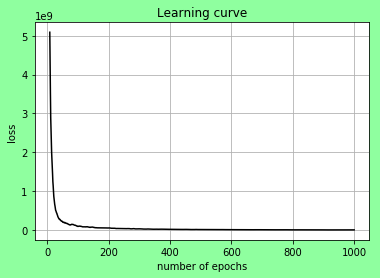

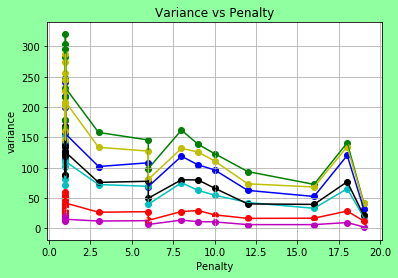

In [75]:

#this is to plot the graph 
fig = plt.figure()
fig.patch.set_facecolor('xkcd:mint green')
plt.ylabel('loss')
plt.xlabel('number of epochs')
plt.title('Learning curve')
df=pd.DataFrame(Loss.detach().numpy())
rolling_mean = df.rolling(window=10).mean()
plt.plot(ep, rolling_mean, label='Learning Curve', color='k')
plt.grid(True)
plt.show()



fig = plt.figure()
fig.patch.set_facecolor('xkcd:mint green')
plt.ylabel('variance')
plt.xlabel('Penalty')
plt.title('Variance vs Penalty')
plt.grid(True)
color=['b','c','k','g','w','m','r','y']
for a in range(8):
    
    
    Tr1=torch.ones(int(math.ceil(n/2)),dtype=torch.float)
    Tr2=torch.ones(int(round(n/2)),dtype=torch.float)
    Tr=torch.cat((Tr1,-Tr2),0)
    Transform=torch.diag(Tr)
    
    
    z1=torch.randn(m,1,n)
    z_softplus=F.softplus(z1)
    z=z_softplus@Transform
    
    
    
    Z=torch.zeros(T,m,1,n)
    for t in range(T):
        N=torch.randn(1,n)
        r=torch.relu(z)
        z_dot=(-z+(r@w1_rec)/math.sqrt(n))
        z = z + z_dot*dt+N*math.sqrt(dt)
#         print(Z[t],Z[t].size(),z,z.size())
        Z[t] = z
#         print(Z[t],Z[t].size(),z,z.size())
        Z_split = torch.split(Z,int(T/2),dim=0)[1]
        
        
    V=torch.zeros(n,1)

    
    
    

    for i in range(n):
        V[i]=torch.var(Z_split[:,:,:,i])  
        
    plt.scatter(p2,V.detach().numpy(),color=color[a])   
    plt.plot(p2.detach().numpy(),V.detach().numpy(),color=color[a]) 
    
plt.show() 






In [62]:
print(V)

tensor([[0.4303],
        [0.2062],
        [0.5925],
        [0.3450],
        [1.1814],
        [0.3502]], grad_fn=<CopySlices>)
